In [84]:
!pip install imbalanced-learn

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [85]:
import pandas as pd
from google.colab import drive
drive.mount('/content/drive/', force_remount=True)
import imblearn
import matplotlib.pyplot as plt

Mounted at /content/drive/


In [86]:
labelled = pd.read_csv('/content/labelled_cleaned.csv')

In [ ]:
! pip install sentence_transformers

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 86.0/86.0 kB 3.6 MB/s eta 0:00:00
  Preparing metadata (setup.py) ... done
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.0/7.0 MB 46.7 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 1.3/1.3 MB 64.9 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 224.5/224.5 kB 22.5 MB/s eta 0:00:00
     ━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━━ 7.8/7.8 MB 63.8 MB/s eta 0:00:00
  Created wheel for sentence_transformers: filename=sentence_transformers-2.2.2-py3-none-any.whl size=125942 sha256=90a468d092997473cca7020decf9fe634bd446c6a28a0fabda6b60792ba46799
  Stored in directory: /root/.cache/pip/wheels/62/f2/10/1e606fd5f02395388f74e7462910fe851042f97238cbbd902f
Successfully built sentence_transformers


In [87]:
from sentence_transformers import SentenceTransformer

In [88]:
model = SentenceTransformer('bert-base-nli-mean-tokens')
#model2 = SentenceTransformer('all-mpnet-base-v2')


In [89]:
input_shape = model.get_sentence_embedding_dimension()
#input_shape2 = model2.get_sentence_embedding_dimension()
output_shape = 6

In [90]:
import tensorflow as tf

In [91]:
inputs = tf.keras.layers.Input(shape=(input_shape,))
# inputs = tf.keras.layers.Input(shape=(input_shape2,))
hidden_layer = tf.keras.layers.Dense(64, activation='relu')(inputs)
hidden_layer2 = tf.keras.layers.Dense(32, activation='relu')(hidden_layer)
outputs = tf.keras.layers.Dense(output_shape, activation='softmax')(hidden_layer2)
model_nn = tf.keras.models.Model(inputs=inputs, outputs=outputs)

In [92]:
import numpy as np

In [ ]:
# def convert_to_embeddings(emb):
#    return np.array([ [float(j) for j in i.strip().split()] for i in emb[1:-1].split('\n') ]).reshape(-1)
# labelled['embeddings'] = labelled['embeddings'].apply(convert_to_embeddings)

In [93]:
# Convert the text data to embeddings using the sentence transformer model
X_train = np.array(model.encode(labelled['text_clean'].tolist()))

# X_train=np.array(labelled['embeddings'].tolist())

In [94]:
labels_enc = {'democracy':0, 'development':1, 'greeting':2, 'human':3, 'security':4, 'un':5}
labelled['coding']=labelled['coding'].replace(labels_enc)
labelled['coding'].values

array([2, 2, 2, ..., 3, 0, 5])

In [95]:
# Compile the model
!pip install tensorflow_addons
import tensorflow_addons as tfa
optimizer = tf.optimizers.Adam(1e-5)
model_nn.compile(optimizer=optimizer, loss='categorical_crossentropy', metrics=['accuracy', tfa.metrics.F1Score(num_classes=len(labels_enc))])

Looking in indexes: https://pypi.org/simple, https://us-python.pkg.dev/colab-wheels/public/simple/


In [96]:
y_train = tf.keras.utils.to_categorical(labelled['coding'].values, num_classes=output_shape)

In [97]:
from imblearn.over_sampling import SMOTE
from sklearn.model_selection import train_test_split

X_train_split, X_eval, y_train_split, y_eval = train_test_split(X_train, y_train, test_size=0.05)
oversample = SMOTE()
X_train_split, y_train_split = oversample.fit_resample(X_train_split, y_train_split)

In [98]:
history = model_nn.fit(X_train, y_train, epochs=500, batch_size=16, validation_data=(X_eval, y_eval) )


Epoch 1/500
166/166 [==============================] - 5s 10ms/step - loss: 1.8879 - accuracy: 0.1574 - f1_score: 0.1035 - val_loss: 1.7704 - val_accuracy: 0.3083 - val_f1_score: 0.1262
Epoch 2/500
166/166 [==============================] - 1s 6ms/step - loss: 1.7012 - accuracy: 0.3160 - f1_score: 0.1160 - val_loss: 1.6330 - val_accuracy: 0.3684 - val_f1_score: 0.1045
Epoch 3/500
166/166 [==============================] - 1s 4ms/step - loss: 1.5974 - accuracy: 0.3854 - f1_score: 0.1123 - val_loss: 1.5464 - val_accuracy: 0.4135 - val_f1_score: 0.1117
Epoch 4/500
166/166 [==============================] - 1s 7ms/step - loss: 1.5334 - accuracy: 0.3968 - f1_score: 0.1059 - val_loss: 1.4861 - val_accuracy: 0.4135 - val_f1_score: 0.1117
Epoch 5/500
166/166 [==============================] - 1s 4ms/step - loss: 1.4867 - accuracy: 0.4032 - f1_score: 0.1129 - val_loss: 1.4392 - val_accuracy: 0.4286 - val_f1_score: 0.1283
Epoch 6/500
166/166 [==============================] - 0s 3ms/step - loss:

In [99]:
train_loss = history.history['loss']
eval_loss = history.history['val_loss']
train_acc = history.history['accuracy']
eval_acc = history.history['val_accuracy']

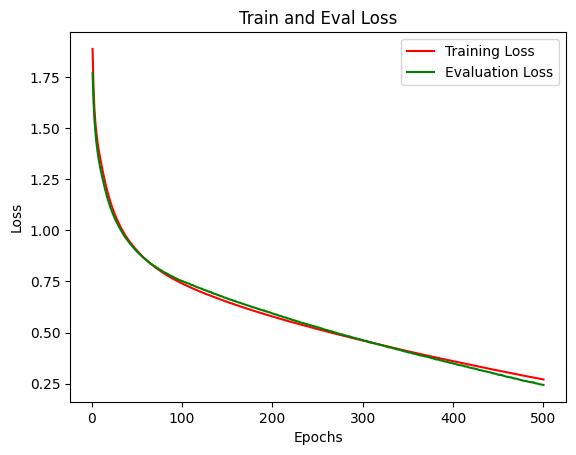

In [100]:

plt.plot(range(1, len(train_loss)+1), train_loss, 'r', label='Training Loss')
plt.plot(range(1, len(train_loss)+1), eval_loss, 'g', label='Evaluation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Eval Loss')
plt.show()

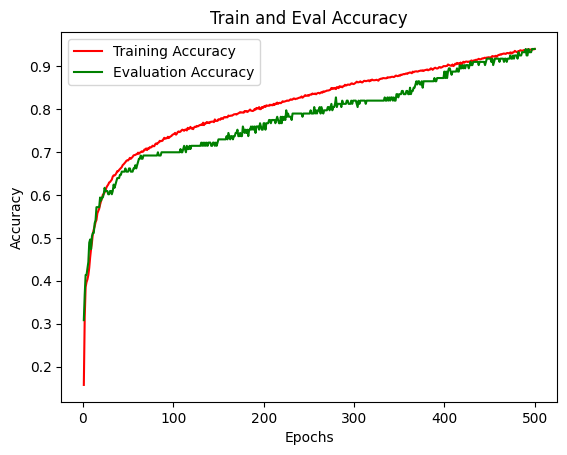

In [101]:

plt.plot(range(1, len(train_loss)+1), train_acc, 'r', label='Training Accuracy')
plt.plot(range(1, len(train_loss)+1), eval_acc, 'g', label='Evaluation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Train and Eval Accuracy')
plt.show()

In [ ]:
model_nn.save_weights('/content/drive/MyDrive/datasets/Models/first_classifier')

In [102]:
unlabelled = pd.read_csv('/content/drive/MyDrive/datasets/unlabelled_cleaned_data.csv')

In [103]:
unlabelled.head(25)

,Unnamed: 0,doc_id,text,country,year,text_clean
0,0,SVN_64_2009.txt.68,consistent manner.,SVN,2009,consistent manner
1,1,GRC_55_2000.txt.74,"In Greece, we have become deeply conscious of",GRC,2000,greece become deeply conscious
2,2,GAB_63_2008.txt.246,"Regarding reform in the Security Council, we",GAB,2008,regarding reform security council
3,3,TKM_50_1995.txt.260,emphasized that we must not allow hostile ster...,TKM,1995,emphasized must allow hostile stereotypes
4,4,IRQ_36_1981.txt.103,It has become clear that the Zionist entity is...,IRQ,1981,become clear zionist entity nature objectives ...
5,5,URY_53_1998.txt.181,"this situation, and we must all redouble our e...",URY,1998,situation must redouble efforts
6,6,MOZ_51_1996.txt.97,together with a view to eliminating these horr...,MOZ,1996,together view eliminating horrible weapons
7,7,MNG_49_1994.txt.217,Mongolia welcomes the recent agreement,MNG,1994,mongolia welcomes recent agreement
8,8,FJI_48_1993.txt.434,the situation and needs of children in Fiji as...,FJI,1993,situation needs children fiji continue
9,9,IRN_37_1982.txt.172,that plans of the Camp David type and the supp...,IRN,1982,plans camp david type support america


In [104]:
labels_dec = {0:'democracy', 1:'development', 2:'greeting', 3:'human', 4:'security', 5:'un'}

In [105]:
unlabelled['text'][186336]

'We welcome and congratulate the State of'

In [106]:
test_sample = model.encode([unlabelled['text_clean'][186336]])

In [107]:
labels_dec[np.argmax(model_nn.predict(test_sample))]

1/1 [==============================] - 0s 69ms/step


'greeting'

In [108]:
unlabelled['text'][100]

'less than that of those who die from risks that we no'

In [109]:
test_sample2 = unlabelled['text_clean'][100]
test_sample2 = model.encode([test_sample2])

In [110]:
labels_dec[np.argmax(model_nn.predict(test_sample2))]

1/1 [==============================] - 0s 24ms/step


'security'

In [111]:
test_sample3 = unlabelled['text_clean'][1099]
test_sample3

'pacific depend largely tropical agricultural export products raise foreign exchange meet needs people'

In [112]:
test_sample3 = model.encode([test_sample3])
labels_dec[np.argmax(model_nn.predict(test_sample3))]

1/1 [==============================] - 0s 23ms/step


'development'

In [113]:
test_sample4 = 'The fighting in Sudan needs to stop — and to stop now — before more people die and this conflict explodes into an all-out war that could affect the region for years to come.'
test_sample4 = model.encode([test_sample4])
labels_dec[np.argmax(model_nn.predict(test_sample4))]

1/1 [==============================] - 0s 23ms/step


'security'

### Psuedo Predictions

In [ ]:
# Taking 20k as a batch 

In [ ]:
batch_size = 20000
unlabelled_X = list(unlabelled['text_clean'][batch_size:2*batch_size])

In [32]:
from tqdm import tqdm
psuedo_preds = []
for sentence in tqdm(unlabelled_X):
  encoded_sent = model.encode([sentence])
  psuedo_preds.append(labels_dec[np.argmax(model_nn.predict(encoded_sent))])

  0%|          | 0/20000 [00:00<?, ?it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 1/20000 [00:00<1:13:01,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 2/20000 [00:00<1:02:53,  5.30it/s]

1/1 [==============================] - 0s 88ms/step


  0%|          | 3/20000 [00:00<1:11:06,  4.69it/s]

1/1 [==============================] - 0s 43ms/step


  0%|          | 4/20000 [00:01<1:50:17,  3.02it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 5/20000 [00:01<1:38:17,  3.39it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 6/20000 [00:01<1:21:50,  4.07it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 7/20000 [00:01<1:12:19,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 8/20000 [00:01<1:06:34,  5.01it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 9/20000 [00:02<1:03:41,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 10/20000 [00:02<1:05:53,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 11/20000 [00:02<1:02:01,  5.37it/s]

1/1 [==============================] - 0s 93ms/step


  0%|          | 12/20000 [00:02<1:23:21,  4.00it/s]

1/1 [==============================] - 0s 117ms/step


  0%|          | 13/20000 [00:03<1:58:42,  2.81it/s]

1/1 [==============================] - 0s 127ms/step


  0%|          | 14/20000 [00:04<3:15:07,  1.71it/s]

1/1 [==============================] - 0s 76ms/step


  0%|          | 15/20000 [00:05<3:09:12,  1.76it/s]

1/1 [==============================] - 0s 63ms/step


  0%|          | 16/20000 [00:05<3:06:51,  1.78it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 17/20000 [00:06<3:25:07,  1.62it/s]

1/1 [==============================] - 0s 109ms/step


  0%|          | 18/20000 [00:07<3:36:07,  1.54it/s]

1/1 [==============================] - 0s 151ms/step


  0%|          | 19/20000 [00:07<3:32:12,  1.57it/s]

1/1 [==============================] - 0s 129ms/step


  0%|          | 20/20000 [00:08<3:36:40,  1.54it/s]

1/1 [==============================] - 0s 72ms/step


  0%|          | 21/20000 [00:08<3:37:09,  1.53it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 22/20000 [00:09<2:59:48,  1.85it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 23/20000 [00:09<2:43:46,  2.03it/s]

1/1 [==============================] - 0s 71ms/step


  0%|          | 24/20000 [00:10<2:34:30,  2.15it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 25/20000 [00:10<2:15:00,  2.47it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 26/20000 [00:10<2:04:33,  2.67it/s]

1/1 [==============================] - 0s 51ms/step


  0%|          | 27/20000 [00:10<1:53:53,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 28/20000 [00:11<1:44:55,  3.17it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 29/20000 [00:11<1:47:51,  3.09it/s]

1/1 [==============================] - 0s 45ms/step


  0%|          | 30/20000 [00:11<1:57:14,  2.84it/s]

1/1 [==============================] - 0s 146ms/step


  0%|          | 31/20000 [00:12<2:46:39,  2.00it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 32/20000 [00:13<2:27:58,  2.25it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 33/20000 [00:13<2:02:42,  2.71it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 34/20000 [00:13<1:43:48,  3.21it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 35/20000 [00:13<1:38:16,  3.39it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 36/20000 [00:13<1:25:28,  3.89it/s]

1/1 [==============================] - 0s 28ms/step


  0%|          | 37/20000 [00:14<1:18:16,  4.25it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 38/20000 [00:14<1:10:53,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 39/20000 [00:14<1:07:45,  4.91it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 40/20000 [00:14<1:04:13,  5.18it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 41/20000 [00:14<1:03:00,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 42/20000 [00:14<1:00:55,  5.46it/s]

1/1 [==============================] - 0s 27ms/step


  0%|          | 43/20000 [00:15<1:01:30,  5.41it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 44/20000 [00:15<1:03:01,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 45/20000 [00:15<1:00:25,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 46/20000 [00:15<57:50,  5.75it/s]  

1/1 [==============================] - 0s 24ms/step


  0%|          | 47/20000 [00:15<1:08:00,  4.89it/s]

1/1 [==============================] - 0s 26ms/step


  0%|          | 48/20000 [00:16<1:05:02,  5.11it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 49/20000 [00:16<1:03:19,  5.25it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 50/20000 [00:16<59:45,  5.56it/s]  

1/1 [==============================] - 0s 24ms/step


  0%|          | 51/20000 [00:16<1:05:17,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 52/20000 [00:16<1:01:16,  5.43it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 53/20000 [00:16<58:46,  5.66it/s]  

1/1 [==============================] - 0s 22ms/step


  0%|          | 54/20000 [00:17<57:30,  5.78it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 55/20000 [00:17<55:37,  5.98it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 56/20000 [00:17<55:15,  6.02it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 57/20000 [00:17<55:21,  6.00it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 58/20000 [00:17<58:30,  5.68it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 59/20000 [00:17<57:16,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 60/20000 [00:18<55:06,  6.03it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 61/20000 [00:18<53:23,  6.22it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 62/20000 [00:18<52:20,  6.35it/s]

1/1 [==============================] - 0s 23ms/step


  0%|          | 63/20000 [00:18<52:09,  6.37it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 64/20000 [00:18<51:52,  6.40it/s]

1/1 [==============================] - 0s 24ms/step


  0%|          | 65/20000 [00:18<53:57,  6.16it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 66/20000 [00:19<54:27,  6.10it/s]

1/1 [==============================] - 0s 21ms/step


  0%|          | 67/20000 [00:19<54:00,  6.15it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 68/20000 [00:19<51:54,  6.40it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 69/20000 [00:19<54:08,  6.13it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 70/20000 [00:19<1:18:25,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 71/20000 [00:20<1:18:19,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 72/20000 [00:20<1:15:05,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


  0%|          | 73/20000 [00:20<1:13:10,  4.54it/s]

1/1 [==============================] - 0s 46ms/step


  0%|          | 74/20000 [00:20<1:17:31,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 75/20000 [00:21<1:19:07,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


  0%|          | 76/20000 [00:21<1:20:10,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 77/20000 [00:21<1:18:59,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 78/20000 [00:21<1:19:50,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


  0%|          | 79/20000 [00:22<1:19:47,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 80/20000 [00:22<1:18:55,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


  0%|          | 81/20000 [00:22<1:17:42,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


  0%|          | 82/20000 [00:22<1:15:34,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


  0%|          | 83/20000 [00:22<1:18:51,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


  0%|          | 84/20000 [00:23<1:28:33,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 85/20000 [00:23<1:29:01,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 86/20000 [00:23<1:23:28,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


  0%|          | 87/20000 [00:24<1:20:08,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


  0%|          | 88/20000 [00:24<1:16:44,  4.32it/s]

1/1 [==============================] - 0s 140ms/step


  0%|          | 89/20000 [00:24<1:40:35,  3.30it/s]

1/1 [==============================] - 0s 84ms/step


  0%|          | 90/20000 [00:25<2:11:09,  2.53it/s]

1/1 [==============================] - 0s 86ms/step


  0%|          | 91/20000 [00:26<2:49:07,  1.96it/s]

1/1 [==============================] - 0s 67ms/step


  0%|          | 92/20000 [00:26<2:46:34,  1.99it/s]

1/1 [==============================] - 0s 110ms/step


  0%|          | 93/20000 [00:26<2:34:49,  2.14it/s]

1/1 [==============================] - 0s 41ms/step


  0%|          | 94/20000 [00:27<2:22:10,  2.33it/s]

1/1 [==============================] - 0s 63ms/step


  0%|          | 95/20000 [00:27<2:39:49,  2.08it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 96/20000 [00:28<2:18:56,  2.39it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 97/20000 [00:28<1:55:24,  2.87it/s]

1/1 [==============================] - 0s 22ms/step


  0%|          | 98/20000 [00:28<1:38:39,  3.36it/s]

1/1 [==============================] - 0s 29ms/step


  0%|          | 99/20000 [00:28<1:27:53,  3.77it/s]

1/1 [==============================] - 0s 25ms/step


  0%|          | 100/20000 [00:28<1:20:00,  4.15it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 101/20000 [00:29<1:14:04,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 102/20000 [00:29<1:12:22,  4.58it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 103/20000 [00:29<1:05:45,  5.04it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 104/20000 [00:29<1:01:20,  5.41it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 105/20000 [00:29<1:00:41,  5.46it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 106/20000 [00:29<58:08,  5.70it/s]  

1/1 [==============================] - 0s 22ms/step


  1%|          | 107/20000 [00:30<58:56,  5.63it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 108/20000 [00:30<59:49,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 109/20000 [00:30<1:00:13,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 110/20000 [00:30<58:16,  5.69it/s]  

1/1 [==============================] - 0s 24ms/step


  1%|          | 111/20000 [00:30<56:57,  5.82it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 112/20000 [00:31<57:10,  5.80it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 113/20000 [00:31<1:00:16,  5.50it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 114/20000 [00:31<59:22,  5.58it/s]  

1/1 [==============================] - 0s 24ms/step


  1%|          | 115/20000 [00:31<1:05:16,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 116/20000 [00:31<1:01:51,  5.36it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 117/20000 [00:31<59:54,  5.53it/s]  

1/1 [==============================] - 0s 24ms/step


  1%|          | 118/20000 [00:32<58:07,  5.70it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 119/20000 [00:32<59:38,  5.56it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 120/20000 [00:32<1:00:53,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 121/20000 [00:32<58:52,  5.63it/s]  

1/1 [==============================] - 0s 22ms/step


  1%|          | 122/20000 [00:32<55:52,  5.93it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 123/20000 [00:32<57:18,  5.78it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 124/20000 [00:33<55:49,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 125/20000 [00:33<54:38,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 126/20000 [00:33<53:40,  6.17it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 127/20000 [00:33<53:26,  6.20it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 128/20000 [00:33<52:15,  6.34it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 129/20000 [00:33<58:01,  5.71it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 130/20000 [00:34<56:22,  5.87it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 131/20000 [00:34<55:21,  5.98it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 132/20000 [00:34<54:03,  6.13it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 133/20000 [00:34<53:32,  6.18it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 134/20000 [00:34<52:22,  6.32it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 135/20000 [00:34<54:27,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 136/20000 [00:35<55:14,  5.99it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 137/20000 [00:35<55:28,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 138/20000 [00:35<58:57,  5.61it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 139/20000 [00:35<58:20,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 140/20000 [00:35<55:45,  5.94it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 141/20000 [00:36<57:42,  5.74it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 142/20000 [00:36<1:00:01,  5.51it/s]

1/1 [==============================] - 0s 45ms/step


  1%|          | 143/20000 [00:36<1:00:17,  5.49it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 144/20000 [00:36<1:05:44,  5.03it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 145/20000 [00:36<1:08:37,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 146/20000 [00:37<1:17:56,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 147/20000 [00:37<1:13:37,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 148/20000 [00:37<1:16:12,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 149/20000 [00:37<1:15:49,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 150/20000 [00:38<1:13:35,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 151/20000 [00:38<1:17:05,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 152/20000 [00:38<1:16:47,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 153/20000 [00:38<1:16:57,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


  1%|          | 154/20000 [00:38<1:14:58,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 155/20000 [00:39<1:15:20,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 156/20000 [00:39<1:14:49,  4.42it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 157/20000 [00:39<1:15:57,  4.35it/s]

1/1 [==============================] - 0s 42ms/step


  1%|          | 158/20000 [00:39<1:13:42,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 159/20000 [00:40<1:13:35,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 160/20000 [00:40<1:12:38,  4.55it/s]

1/1 [==============================] - 0s 31ms/step


  1%|          | 161/20000 [00:40<1:22:10,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


  1%|          | 162/20000 [00:40<1:25:55,  3.85it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 163/20000 [00:41<1:31:59,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 164/20000 [00:41<1:26:45,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 165/20000 [00:41<1:27:44,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 166/20000 [00:41<1:21:13,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 167/20000 [00:42<1:26:18,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 168/20000 [00:42<1:22:55,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 169/20000 [00:42<1:20:49,  4.09it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 170/20000 [00:42<1:18:40,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 171/20000 [00:43<1:11:12,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 172/20000 [00:43<1:08:46,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 173/20000 [00:43<1:06:52,  4.94it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 174/20000 [00:43<1:02:15,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 175/20000 [00:43<59:42,  5.53it/s]  

1/1 [==============================] - 0s 113ms/step


  1%|          | 176/20000 [00:44<1:10:35,  4.68it/s]

1/1 [==============================] - 0s 67ms/step


  1%|          | 177/20000 [00:44<1:23:55,  3.94it/s]

1/1 [==============================] - 0s 97ms/step


  1%|          | 178/20000 [00:44<1:31:51,  3.60it/s]

1/1 [==============================] - 0s 59ms/step


  1%|          | 179/20000 [00:45<1:43:48,  3.18it/s]

1/1 [==============================] - 0s 43ms/step


  1%|          | 180/20000 [00:45<1:51:43,  2.96it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 181/20000 [00:45<1:51:40,  2.96it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 182/20000 [00:46<1:35:59,  3.44it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 183/20000 [00:46<1:24:02,  3.93it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 184/20000 [00:46<1:14:55,  4.41it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 185/20000 [00:46<1:08:59,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 186/20000 [00:46<1:07:54,  4.86it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 187/20000 [00:46<1:03:57,  5.16it/s]

1/1 [==============================] - 0s 114ms/step


  1%|          | 188/20000 [00:47<1:14:45,  4.42it/s]

1/1 [==============================] - 0s 90ms/step


  1%|          | 189/20000 [00:47<1:31:22,  3.61it/s]

1/1 [==============================] - 0s 38ms/step


  1%|          | 190/20000 [00:47<1:30:59,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


  1%|          | 191/20000 [00:48<1:30:59,  3.63it/s]

1/1 [==============================] - 0s 53ms/step


  1%|          | 192/20000 [00:48<1:31:26,  3.61it/s]

1/1 [==============================] - 0s 27ms/step


  1%|          | 193/20000 [00:48<1:21:22,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 194/20000 [00:48<1:13:12,  4.51it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 195/20000 [00:48<1:09:08,  4.77it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 196/20000 [00:49<1:04:17,  5.13it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 197/20000 [00:49<1:03:34,  5.19it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 198/20000 [00:49<1:01:11,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 199/20000 [00:49<1:00:02,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 200/20000 [00:49<57:15,  5.76it/s]  

1/1 [==============================] - 0s 23ms/step


  1%|          | 201/20000 [00:49<58:41,  5.62it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 202/20000 [00:50<58:00,  5.69it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 203/20000 [00:50<57:22,  5.75it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 204/20000 [00:50<1:00:45,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 205/20000 [00:50<58:57,  5.60it/s]  

1/1 [==============================] - 0s 26ms/step


  1%|          | 206/20000 [00:50<59:36,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 207/20000 [00:51<1:00:47,  5.43it/s]

1/1 [==============================] - 0s 25ms/step


  1%|          | 208/20000 [00:51<57:59,  5.69it/s]  

1/1 [==============================] - 0s 24ms/step


  1%|          | 209/20000 [00:51<57:39,  5.72it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 210/20000 [00:51<55:52,  5.90it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 211/20000 [00:51<54:30,  6.05it/s]

1/1 [==============================] - 0s 21ms/step


  1%|          | 212/20000 [00:51<54:38,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 213/20000 [00:52<57:28,  5.74it/s]

1/1 [==============================] - 0s 62ms/step


  1%|          | 214/20000 [00:52<1:09:05,  4.77it/s]

1/1 [==============================] - 0s 47ms/step


  1%|          | 215/20000 [00:52<1:18:37,  4.19it/s]

1/1 [==============================] - 0s 99ms/step


  1%|          | 216/20000 [00:53<1:33:19,  3.53it/s]

1/1 [==============================] - 0s 87ms/step


  1%|          | 217/20000 [00:53<1:44:41,  3.15it/s]

1/1 [==============================] - 0s 127ms/step


  1%|          | 218/20000 [00:54<2:18:25,  2.38it/s]

1/1 [==============================] - 0s 57ms/step


  1%|          | 219/20000 [00:54<2:34:37,  2.13it/s]

1/1 [==============================] - 0s 76ms/step


  1%|          | 220/20000 [00:55<2:32:46,  2.16it/s]

1/1 [==============================] - 0s 117ms/step


  1%|          | 221/20000 [00:55<3:10:10,  1.73it/s]

1/1 [==============================] - 0s 131ms/step


  1%|          | 222/20000 [00:56<3:23:31,  1.62it/s]

1/1 [==============================] - 0s 91ms/step


  1%|          | 223/20000 [00:57<3:26:32,  1.60it/s]

1/1 [==============================] - 0s 95ms/step


  1%|          | 224/20000 [00:57<3:11:59,  1.72it/s]

1/1 [==============================] - 0s 34ms/step


  1%|          | 225/20000 [00:58<2:41:18,  2.04it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 226/20000 [00:58<2:17:55,  2.39it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 227/20000 [00:58<1:57:37,  2.80it/s]

1/1 [==============================] - 0s 32ms/step


  1%|          | 228/20000 [00:58<1:46:20,  3.10it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 229/20000 [00:59<1:36:11,  3.43it/s]

1/1 [==============================] - 0s 55ms/step


  1%|          | 230/20000 [00:59<1:32:49,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


  1%|          | 231/20000 [00:59<1:34:32,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


  1%|          | 232/20000 [00:59<1:31:44,  3.59it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 233/20000 [01:00<1:21:49,  4.03it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 234/20000 [01:00<1:13:39,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


  1%|          | 235/20000 [01:00<1:09:06,  4.77it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 236/20000 [01:00<1:08:50,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 237/20000 [01:00<1:05:07,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 238/20000 [01:00<1:01:41,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


  1%|          | 239/20000 [01:01<1:00:07,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 240/20000 [01:01<57:54,  5.69it/s]  

1/1 [==============================] - 0s 28ms/step


  1%|          | 241/20000 [01:01<58:27,  5.63it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 242/20000 [01:01<58:06,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 243/20000 [01:01<1:03:32,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 244/20000 [01:01<1:01:10,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


  1%|          | 245/20000 [01:02<59:29,  5.53it/s]  

1/1 [==============================] - 0s 31ms/step


  1%|          | 246/20000 [01:02<57:54,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


  1%|          | 247/20000 [01:02<58:15,  5.65it/s]

1/1 [==============================] - 0s 26ms/step


  1%|          | 248/20000 [01:02<59:01,  5.58it/s]

1/1 [==============================] - 0s 28ms/step


  1%|          | 249/20000 [01:02<59:58,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 250/20000 [01:03<58:11,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 251/20000 [01:03<56:48,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 252/20000 [01:03<57:15,  5.75it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 253/20000 [01:03<55:34,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 254/20000 [01:03<54:18,  6.06it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 255/20000 [01:03<55:32,  5.92it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 256/20000 [01:04<55:45,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 257/20000 [01:04<55:14,  5.96it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 258/20000 [01:04<55:31,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 259/20000 [01:04<55:58,  5.88it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 260/20000 [01:04<56:13,  5.85it/s]

1/1 [==============================] - 0s 40ms/step


  1%|▏         | 261/20000 [01:04<57:41,  5.70it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 262/20000 [01:05<58:46,  5.60it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 263/20000 [01:05<58:17,  5.64it/s]

1/1 [==============================] - 0s 27ms/step


  1%|▏         | 264/20000 [01:05<59:30,  5.53it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 265/20000 [01:05<57:30,  5.72it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 266/20000 [01:05<57:25,  5.73it/s]

1/1 [==============================] - 0s 26ms/step


  1%|▏         | 267/20000 [01:05<56:49,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 268/20000 [01:06<54:02,  6.09it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 269/20000 [01:06<53:40,  6.13it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 270/20000 [01:06<55:07,  5.97it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 271/20000 [01:06<55:28,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 272/20000 [01:06<53:24,  6.16it/s]

1/1 [==============================] - 0s 24ms/step


  1%|▏         | 273/20000 [01:06<52:51,  6.22it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 274/20000 [01:07<53:14,  6.18it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 275/20000 [01:07<54:05,  6.08it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 276/20000 [01:07<58:46,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 277/20000 [01:07<57:49,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 278/20000 [01:07<57:10,  5.75it/s]

1/1 [==============================] - 0s 28ms/step


  1%|▏         | 279/20000 [01:07<55:44,  5.90it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 280/20000 [01:08<53:32,  6.14it/s]

1/1 [==============================] - 0s 21ms/step


  1%|▏         | 281/20000 [01:08<53:19,  6.16it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 282/20000 [01:08<53:18,  6.17it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 283/20000 [01:08<54:30,  6.03it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 284/20000 [01:08<56:06,  5.86it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 285/20000 [01:08<56:12,  5.85it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 286/20000 [01:09<55:15,  5.95it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 287/20000 [01:09<53:42,  6.12it/s]

1/1 [==============================] - 0s 22ms/step


  1%|▏         | 288/20000 [01:09<54:41,  6.01it/s]

1/1 [==============================] - 0s 23ms/step


  1%|▏         | 289/20000 [01:09<55:57,  5.87it/s]

1/1 [==============================] - 0s 25ms/step


  1%|▏         | 290/20000 [01:09<55:12,  5.95it/s]

1/1 [==============================] - 0s 41ms/step


  1%|▏         | 291/20000 [01:10<1:04:35,  5.09it/s]

1/1 [==============================] - 0s 33ms/step


  1%|▏         | 292/20000 [01:10<1:07:29,  4.87it/s]

1/1 [==============================] - 0s 42ms/step


  1%|▏         | 293/20000 [01:10<1:11:00,  4.63it/s]

1/1 [==============================] - 0s 45ms/step


  1%|▏         | 294/20000 [01:10<1:13:38,  4.46it/s]

1/1 [==============================] - 0s 37ms/step


  1%|▏         | 295/20000 [01:11<1:16:40,  4.28it/s]

1/1 [==============================] - 0s 104ms/step


  1%|▏         | 296/20000 [01:11<1:36:11,  3.41it/s]

1/1 [==============================] - 0s 109ms/step


  1%|▏         | 297/20000 [01:12<2:08:26,  2.56it/s]

1/1 [==============================] - 0s 66ms/step


  1%|▏         | 298/20000 [01:12<2:00:26,  2.73it/s]

1/1 [==============================] - 0s 134ms/step


  1%|▏         | 299/20000 [01:13<2:41:47,  2.03it/s]

1/1 [==============================] - 0s 183ms/step


  2%|▏         | 300/20000 [01:14<3:30:06,  1.56it/s]

1/1 [==============================] - 0s 113ms/step


  2%|▏         | 301/20000 [01:15<3:58:52,  1.37it/s]

1/1 [==============================] - 0s 79ms/step


  2%|▏         | 302/20000 [01:15<3:58:44,  1.38it/s]

1/1 [==============================] - 0s 57ms/step


  2%|▏         | 303/20000 [01:16<3:27:41,  1.58it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 304/20000 [01:16<3:11:53,  1.71it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 305/20000 [01:16<2:42:36,  2.02it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 306/20000 [01:17<2:10:56,  2.51it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 307/20000 [01:17<1:47:22,  3.06it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 308/20000 [01:17<1:33:58,  3.49it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 309/20000 [01:17<1:21:41,  4.02it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 310/20000 [01:17<1:13:26,  4.47it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 311/20000 [01:18<1:09:45,  4.70it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 312/20000 [01:18<1:04:05,  5.12it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 313/20000 [01:18<1:00:18,  5.44it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 314/20000 [01:18<1:00:47,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 315/20000 [01:18<58:43,  5.59it/s]  

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 316/20000 [01:18<57:51,  5.67it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 317/20000 [01:19<57:16,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 318/20000 [01:19<55:45,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 319/20000 [01:19<55:19,  5.93it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 320/20000 [01:19<56:28,  5.81it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 321/20000 [01:19<1:02:40,  5.23it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 322/20000 [01:19<1:00:04,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 323/20000 [01:20<59:17,  5.53it/s]  

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 324/20000 [01:20<57:49,  5.67it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 325/20000 [01:20<58:03,  5.65it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 326/20000 [01:20<1:10:38,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 327/20000 [01:20<1:06:38,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 328/20000 [01:21<1:04:27,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 329/20000 [01:21<1:02:29,  5.25it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 330/20000 [01:21<1:01:25,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 331/20000 [01:21<1:02:50,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 332/20000 [01:21<1:02:20,  5.26it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 333/20000 [01:22<1:10:08,  4.67it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 334/20000 [01:22<1:06:44,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 335/20000 [01:22<1:03:02,  5.20it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 336/20000 [01:22<59:12,  5.54it/s]  

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 337/20000 [01:22<1:00:08,  5.45it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 338/20000 [01:22<58:06,  5.64it/s]  

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 339/20000 [01:23<58:48,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 340/20000 [01:23<57:37,  5.69it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 341/20000 [01:23<56:52,  5.76it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 342/20000 [01:23<56:05,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 343/20000 [01:23<56:01,  5.85it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 344/20000 [01:24<56:09,  5.83it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 345/20000 [01:24<1:05:33,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 346/20000 [01:24<1:09:11,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 347/20000 [01:24<1:05:09,  5.03it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 348/20000 [01:24<1:05:46,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 349/20000 [01:25<1:01:18,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 350/20000 [01:25<1:00:53,  5.38it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 351/20000 [01:25<57:10,  5.73it/s]  

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 352/20000 [01:25<56:44,  5.77it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 353/20000 [01:25<1:07:01,  4.89it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 354/20000 [01:26<1:05:32,  5.00it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 355/20000 [01:26<1:03:21,  5.17it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 356/20000 [01:26<59:58,  5.46it/s]  

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 357/20000 [01:26<57:41,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 358/20000 [01:26<56:00,  5.84it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 359/20000 [01:26<56:57,  5.75it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 360/20000 [01:27<56:39,  5.78it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 361/20000 [01:27<1:05:48,  4.97it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 362/20000 [01:27<1:06:02,  4.96it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 363/20000 [01:27<1:10:12,  4.66it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 364/20000 [01:27<1:10:01,  4.67it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 365/20000 [01:28<1:11:07,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 366/20000 [01:28<1:14:08,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 367/20000 [01:28<1:14:36,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 368/20000 [01:28<1:23:33,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 369/20000 [01:29<1:20:15,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 370/20000 [01:29<1:21:50,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 371/20000 [01:29<1:19:11,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 372/20000 [01:29<1:23:41,  3.91it/s]

1/1 [==============================] - 0s 45ms/step


  2%|▏         | 373/20000 [01:30<1:24:05,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 374/20000 [01:30<1:20:49,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 375/20000 [01:30<1:25:13,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 376/20000 [01:30<1:22:09,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 377/20000 [01:31<1:22:21,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 378/20000 [01:31<1:21:02,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 379/20000 [01:31<1:21:39,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 380/20000 [01:32<1:27:40,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 381/20000 [01:32<1:26:11,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 382/20000 [01:32<1:30:26,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 383/20000 [01:32<1:33:31,  3.50it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 384/20000 [01:33<1:28:58,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 385/20000 [01:33<1:28:08,  3.71it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 386/20000 [01:33<1:25:46,  3.81it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 387/20000 [01:33<1:19:40,  4.10it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 388/20000 [01:34<1:13:43,  4.43it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 389/20000 [01:34<1:07:46,  4.82it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 390/20000 [01:34<1:03:10,  5.17it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 391/20000 [01:34<1:01:34,  5.31it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 392/20000 [01:34<1:03:53,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 393/20000 [01:34<1:00:32,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 394/20000 [01:35<1:01:08,  5.34it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 395/20000 [01:35<58:46,  5.56it/s]  

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 396/20000 [01:35<1:01:34,  5.31it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 397/20000 [01:35<58:35,  5.58it/s]  

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 398/20000 [01:35<57:28,  5.68it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 399/20000 [01:35<58:40,  5.57it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 400/20000 [01:36<58:33,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 401/20000 [01:36<57:27,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 402/20000 [01:36<57:01,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 403/20000 [01:36<1:01:15,  5.33it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 404/20000 [01:36<58:35,  5.57it/s]  

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 405/20000 [01:37<58:37,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 406/20000 [01:37<58:01,  5.63it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 407/20000 [01:37<54:43,  5.97it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 408/20000 [01:37<54:01,  6.04it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 409/20000 [01:37<57:00,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 410/20000 [01:37<55:51,  5.84it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 411/20000 [01:38<54:55,  5.94it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 412/20000 [01:38<55:14,  5.91it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 413/20000 [01:38<53:50,  6.06it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 414/20000 [01:38<54:32,  5.99it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 415/20000 [01:38<55:31,  5.88it/s]

1/1 [==============================] - 0s 21ms/step


  2%|▏         | 416/20000 [01:38<56:10,  5.81it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 417/20000 [01:39<55:30,  5.88it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 418/20000 [01:39<56:20,  5.79it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 419/20000 [01:39<55:08,  5.92it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 420/20000 [01:39<55:52,  5.84it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 421/20000 [01:39<1:03:38,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 422/20000 [01:40<1:03:59,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 423/20000 [01:40<59:57,  5.44it/s]  

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 424/20000 [01:40<57:36,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 425/20000 [01:40<1:03:33,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 426/20000 [01:40<1:02:49,  5.19it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 427/20000 [01:40<59:10,  5.51it/s]  

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 428/20000 [01:41<58:23,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 429/20000 [01:41<59:01,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 430/20000 [01:41<58:49,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 431/20000 [01:41<57:17,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


  2%|▏         | 432/20000 [01:41<57:40,  5.65it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 433/20000 [01:41<56:06,  5.81it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 434/20000 [01:42<57:18,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


  2%|▏         | 435/20000 [01:42<57:51,  5.64it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 436/20000 [01:42<57:55,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


  2%|▏         | 437/20000 [01:42<57:33,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 438/20000 [01:42<57:49,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 439/20000 [01:43<56:53,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 440/20000 [01:43<56:50,  5.73it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 441/20000 [01:43<56:14,  5.80it/s]

1/1 [==============================] - 0s 22ms/step


  2%|▏         | 442/20000 [01:43<56:45,  5.74it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 443/20000 [01:43<1:06:47,  4.88it/s]

1/1 [==============================] - 0s 39ms/step


  2%|▏         | 444/20000 [01:44<1:11:10,  4.58it/s]

1/1 [==============================] - 0s 37ms/step


  2%|▏         | 445/20000 [01:44<1:19:17,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 446/20000 [01:44<1:20:47,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 447/20000 [01:44<1:20:24,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 448/20000 [01:45<1:31:18,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


  2%|▏         | 449/20000 [01:45<1:25:43,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 450/20000 [01:45<1:24:02,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 451/20000 [01:45<1:22:53,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 452/20000 [01:46<1:18:36,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 453/20000 [01:46<1:19:44,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 454/20000 [01:46<1:19:09,  4.12it/s]

1/1 [==============================] - 0s 49ms/step


  2%|▏         | 455/20000 [01:46<1:25:08,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 456/20000 [01:47<1:21:58,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 457/20000 [01:47<1:23:44,  3.89it/s]

1/1 [==============================] - 0s 48ms/step


  2%|▏         | 458/20000 [01:47<1:21:53,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 459/20000 [01:47<1:19:02,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 460/20000 [01:48<1:23:43,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


  2%|▏         | 461/20000 [01:48<1:24:06,  3.87it/s]

1/1 [==============================] - 0s 40ms/step


  2%|▏         | 462/20000 [01:49<2:24:11,  2.26it/s]

1/1 [==============================] - 0s 41ms/step


  2%|▏         | 463/20000 [01:49<2:13:46,  2.43it/s]

1/1 [==============================] - 0s 42ms/step


  2%|▏         | 464/20000 [01:49<1:58:53,  2.74it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 465/20000 [01:50<1:46:25,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 466/20000 [01:50<1:42:45,  3.17it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 467/20000 [01:50<1:29:00,  3.66it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 468/20000 [01:50<1:21:00,  4.02it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 469/20000 [01:51<1:14:19,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 470/20000 [01:51<1:19:32,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


  2%|▏         | 471/20000 [01:51<1:12:44,  4.48it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 472/20000 [01:51<1:08:51,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 473/20000 [01:51<1:05:50,  4.94it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 474/20000 [01:52<1:03:44,  5.11it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 475/20000 [01:52<1:04:04,  5.08it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 476/20000 [01:52<1:02:55,  5.17it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 477/20000 [01:52<1:02:11,  5.23it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 478/20000 [01:52<1:08:50,  4.73it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 479/20000 [01:53<1:06:39,  4.88it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 480/20000 [01:53<1:12:40,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 481/20000 [01:53<1:11:12,  4.57it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 482/20000 [01:53<1:06:15,  4.91it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 483/20000 [01:53<1:04:39,  5.03it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 484/20000 [01:54<1:02:22,  5.22it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 485/20000 [01:54<1:03:06,  5.15it/s]

1/1 [==============================] - 0s 31ms/step


  2%|▏         | 486/20000 [01:54<1:02:34,  5.20it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 487/20000 [01:54<1:03:33,  5.12it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 488/20000 [01:54<1:03:43,  5.10it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 489/20000 [01:55<1:02:20,  5.22it/s]

1/1 [==============================] - 0s 30ms/step


  2%|▏         | 490/20000 [01:55<1:00:38,  5.36it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▏         | 491/20000 [01:55<1:01:13,  5.31it/s]

1/1 [==============================] - 0s 28ms/step


  2%|▏         | 492/20000 [01:55<1:00:09,  5.40it/s]

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 493/20000 [01:55<58:52,  5.52it/s]  

1/1 [==============================] - 0s 29ms/step


  2%|▏         | 494/20000 [01:55<58:36,  5.55it/s]

1/1 [==============================] - 0s 33ms/step


  2%|▏         | 495/20000 [01:56<1:03:41,  5.10it/s]

1/1 [==============================] - 0s 32ms/step


  2%|▏         | 496/20000 [01:56<1:05:39,  4.95it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 497/20000 [01:56<1:03:55,  5.08it/s]

1/1 [==============================] - 0s 35ms/step


  2%|▏         | 498/20000 [01:56<1:02:25,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


  2%|▏         | 499/20000 [01:56<1:01:27,  5.29it/s]

1/1 [==============================] - 0s 26ms/step


  2%|▎         | 500/20000 [01:57<1:00:12,  5.40it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 501/20000 [01:57<59:27,  5.47it/s]  

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 502/20000 [01:57<1:02:53,  5.17it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 503/20000 [01:57<1:02:50,  5.17it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 504/20000 [01:57<1:04:53,  5.01it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 505/20000 [01:58<1:03:42,  5.10it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 506/20000 [01:58<1:02:29,  5.20it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 507/20000 [01:58<1:01:50,  5.25it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 508/20000 [01:58<59:55,  5.42it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 509/20000 [01:58<59:27,  5.46it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 510/20000 [01:58<58:15,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 511/20000 [01:59<1:04:00,  5.07it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 512/20000 [01:59<1:02:01,  5.24it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 513/20000 [01:59<59:26,  5.46it/s]  

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 514/20000 [01:59<58:48,  5.52it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 515/20000 [01:59<1:06:23,  4.89it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 516/20000 [02:00<1:03:39,  5.10it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 517/20000 [02:00<1:07:37,  4.80it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 518/20000 [02:00<1:10:15,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 519/20000 [02:00<1:11:27,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 520/20000 [02:01<1:12:10,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 521/20000 [02:01<1:12:21,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 522/20000 [02:01<1:13:09,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 523/20000 [02:01<1:15:57,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 524/20000 [02:02<1:13:34,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 525/20000 [02:02<1:15:44,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 526/20000 [02:02<1:15:02,  4.33it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 527/20000 [02:02<1:18:05,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 528/20000 [02:03<1:21:57,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 529/20000 [02:03<1:19:18,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 530/20000 [02:03<1:18:27,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 531/20000 [02:03<1:15:53,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 532/20000 [02:03<1:16:42,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 533/20000 [02:04<1:14:27,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 534/20000 [02:04<1:11:53,  4.51it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 535/20000 [02:04<1:11:51,  4.51it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 536/20000 [02:04<1:23:38,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 537/20000 [02:05<1:21:17,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 538/20000 [02:05<1:37:44,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 539/20000 [02:05<1:31:28,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 540/20000 [02:06<1:26:51,  3.73it/s]

1/1 [==============================] - 0s 50ms/step


  3%|▎         | 541/20000 [02:06<1:27:39,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 542/20000 [02:06<1:26:25,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 543/20000 [02:06<1:29:14,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 544/20000 [02:07<1:25:22,  3.80it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 545/20000 [02:07<1:16:37,  4.23it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 546/20000 [02:07<1:10:52,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 547/20000 [02:07<1:09:35,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 548/20000 [02:07<1:05:32,  4.95it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 549/20000 [02:08<1:03:10,  5.13it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 550/20000 [02:08<1:01:00,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 551/20000 [02:08<59:28,  5.45it/s]  

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 552/20000 [02:08<58:58,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 553/20000 [02:08<56:54,  5.70it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 554/20000 [02:08<1:07:37,  4.79it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 555/20000 [02:09<1:02:45,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 556/20000 [02:09<1:00:20,  5.37it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 557/20000 [02:09<59:18,  5.46it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 558/20000 [02:09<57:27,  5.64it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 559/20000 [02:09<1:00:32,  5.35it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 560/20000 [02:10<59:13,  5.47it/s]  

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 561/20000 [02:10<58:14,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 562/20000 [02:10<59:13,  5.47it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 563/20000 [02:10<1:00:56,  5.32it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 564/20000 [02:10<58:51,  5.50it/s]  

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 565/20000 [02:10<56:54,  5.69it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 566/20000 [02:11<56:10,  5.77it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 567/20000 [02:11<56:03,  5.78it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 568/20000 [02:11<58:33,  5.53it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 569/20000 [02:11<57:01,  5.68it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 570/20000 [02:11<56:22,  5.74it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 571/20000 [02:12<58:46,  5.51it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 572/20000 [02:12<57:05,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 573/20000 [02:12<55:53,  5.79it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 574/20000 [02:12<57:05,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 575/20000 [02:12<56:44,  5.71it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 576/20000 [02:12<58:01,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 577/20000 [02:13<59:48,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 578/20000 [02:13<1:03:55,  5.06it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 579/20000 [02:13<1:01:29,  5.26it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 580/20000 [02:13<59:14,  5.46it/s]  

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 581/20000 [02:13<56:29,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 582/20000 [02:14<58:29,  5.53it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 583/20000 [02:14<58:21,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 584/20000 [02:14<58:12,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 585/20000 [02:14<58:47,  5.50it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 586/20000 [02:14<57:45,  5.60it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 587/20000 [02:14<58:00,  5.58it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 588/20000 [02:15<1:01:08,  5.29it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 589/20000 [02:15<1:04:01,  5.05it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 590/20000 [02:15<1:02:36,  5.17it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 591/20000 [02:15<1:02:12,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 592/20000 [02:15<1:01:52,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 593/20000 [02:16<1:00:33,  5.34it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 594/20000 [02:16<59:06,  5.47it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 595/20000 [02:16<56:45,  5.70it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 596/20000 [02:16<59:29,  5.44it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 597/20000 [02:16<58:21,  5.54it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 598/20000 [02:16<56:56,  5.68it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 599/20000 [02:17<55:52,  5.79it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 600/20000 [02:17<58:12,  5.55it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 601/20000 [02:17<1:03:08,  5.12it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 602/20000 [02:17<1:12:27,  4.46it/s]

1/1 [==============================] - 0s 47ms/step


  3%|▎         | 603/20000 [02:18<1:17:16,  4.18it/s]

1/1 [==============================] - 0s 43ms/step


  3%|▎         | 604/20000 [02:18<1:18:53,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 605/20000 [02:18<1:21:43,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 606/20000 [02:18<1:18:03,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 607/20000 [02:19<1:14:18,  4.35it/s]

1/1 [==============================] - 0s 45ms/step


  3%|▎         | 608/20000 [02:19<1:15:55,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 609/20000 [02:19<1:14:11,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 610/20000 [02:19<1:13:49,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 611/20000 [02:19<1:13:10,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 612/20000 [02:20<1:16:11,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 613/20000 [02:20<1:16:20,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 614/20000 [02:20<1:15:12,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 615/20000 [02:20<1:20:42,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


  3%|▎         | 616/20000 [02:21<1:16:17,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 617/20000 [02:21<1:15:35,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 618/20000 [02:21<1:13:30,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 619/20000 [02:21<1:14:11,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 620/20000 [02:22<1:14:58,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


  3%|▎         | 621/20000 [02:22<1:18:53,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 622/20000 [02:22<1:19:46,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 623/20000 [02:22<1:18:30,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 624/20000 [02:23<1:19:58,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 625/20000 [02:23<1:18:53,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


  3%|▎         | 626/20000 [02:23<1:18:31,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 627/20000 [02:23<1:18:51,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


  3%|▎         | 628/20000 [02:24<1:24:18,  3.83it/s]

1/1 [==============================] - 0s 28ms/step


  3%|▎         | 629/20000 [02:24<1:23:28,  3.87it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 630/20000 [02:24<1:15:28,  4.28it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 631/20000 [02:24<1:10:31,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 632/20000 [02:24<1:06:53,  4.83it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 633/20000 [02:25<1:04:05,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 634/20000 [02:25<1:04:30,  5.00it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 635/20000 [02:25<1:03:48,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 636/20000 [02:25<59:43,  5.40it/s]  

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 637/20000 [02:25<1:00:33,  5.33it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 638/20000 [02:26<58:39,  5.50it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 639/20000 [02:26<59:03,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 640/20000 [02:26<59:45,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 641/20000 [02:26<58:48,  5.49it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 642/20000 [02:26<57:24,  5.62it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 643/20000 [02:26<57:01,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 644/20000 [02:27<56:42,  5.69it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 645/20000 [02:27<1:01:00,  5.29it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 646/20000 [02:27<59:04,  5.46it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 647/20000 [02:27<58:40,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 648/20000 [02:27<58:43,  5.49it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 649/20000 [02:28<58:52,  5.48it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 650/20000 [02:28<57:13,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 651/20000 [02:28<55:55,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 652/20000 [02:28<54:24,  5.93it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 653/20000 [02:28<57:11,  5.64it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 654/20000 [02:28<56:37,  5.69it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 655/20000 [02:29<56:49,  5.67it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 656/20000 [02:29<55:51,  5.77it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 657/20000 [02:29<55:02,  5.86it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 658/20000 [02:29<1:00:07,  5.36it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 659/20000 [02:29<1:06:39,  4.84it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 660/20000 [02:30<1:04:42,  4.98it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 661/20000 [02:30<1:02:59,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 662/20000 [02:30<1:01:32,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 663/20000 [02:30<1:00:22,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 664/20000 [02:30<1:03:16,  5.09it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 665/20000 [02:30<1:02:25,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 666/20000 [02:31<59:59,  5.37it/s]  

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 667/20000 [02:31<57:55,  5.56it/s]

1/1 [==============================] - 0s 29ms/step


  3%|▎         | 668/20000 [02:31<55:20,  5.82it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 669/20000 [02:31<57:35,  5.59it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 670/20000 [02:31<55:57,  5.76it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 671/20000 [02:32<55:37,  5.79it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 672/20000 [02:32<57:21,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 673/20000 [02:32<57:36,  5.59it/s]

1/1 [==============================] - 0s 26ms/step


  3%|▎         | 674/20000 [02:32<58:15,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 675/20000 [02:32<1:01:18,  5.25it/s]

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 676/20000 [02:32<58:17,  5.52it/s]  

1/1 [==============================] - 0s 22ms/step


  3%|▎         | 677/20000 [02:33<56:52,  5.66it/s]

1/1 [==============================] - 0s 21ms/step


  3%|▎         | 678/20000 [02:33<56:13,  5.73it/s]

1/1 [==============================] - 0s 27ms/step


  3%|▎         | 679/20000 [02:33<56:06,  5.74it/s]

1/1 [==============================] - 0s 24ms/step


  3%|▎         | 680/20000 [02:33<58:21,  5.52it/s]

1/1 [==============================] - 0s 30ms/step


  3%|▎         | 681/20000 [02:33<57:56,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


  3%|▎         | 682/20000 [02:33<57:34,  5.59it/s]

1/1 [==============================] - 0s 23ms/step


  3%|▎         | 683/20000 [02:34<58:03,  5.55it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 684/20000 [02:34<1:01:53,  5.20it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 685/20000 [02:34<1:06:24,  4.85it/s]

1/1 [==============================] - 0s 34ms/step


  3%|▎         | 686/20000 [02:34<1:12:06,  4.46it/s]

1/1 [==============================] - 0s 39ms/step


  3%|▎         | 687/20000 [02:35<1:14:41,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 688/20000 [02:35<1:14:37,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


  3%|▎         | 689/20000 [02:35<1:18:58,  4.07it/s]

1/1 [==============================] - 0s 46ms/step


  3%|▎         | 690/20000 [02:35<1:18:32,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


  3%|▎         | 691/20000 [02:36<1:18:23,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 692/20000 [02:36<1:17:56,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 693/20000 [02:36<1:15:42,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


  3%|▎         | 694/20000 [02:36<1:14:45,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


  3%|▎         | 695/20000 [02:37<1:16:55,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 696/20000 [02:37<1:16:17,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


  3%|▎         | 697/20000 [02:37<1:13:44,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


  3%|▎         | 698/20000 [02:37<1:32:23,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


  3%|▎         | 699/20000 [02:38<1:42:03,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▎         | 700/20000 [02:38<1:42:32,  3.14it/s]

1/1 [==============================] - 0s 54ms/step


  4%|▎         | 701/20000 [02:38<1:41:33,  3.17it/s]

1/1 [==============================] - 0s 50ms/step


  4%|▎         | 702/20000 [02:39<1:36:05,  3.35it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▎         | 703/20000 [02:39<1:32:36,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▎         | 704/20000 [02:39<1:25:39,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▎         | 705/20000 [02:39<1:24:13,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 706/20000 [02:40<1:28:13,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▎         | 707/20000 [02:40<1:29:14,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▎         | 708/20000 [02:40<1:31:54,  3.50it/s]

1/1 [==============================] - 0s 54ms/step


  4%|▎         | 709/20000 [02:41<1:31:40,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


  4%|▎         | 710/20000 [02:41<1:26:41,  3.71it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▎         | 711/20000 [02:41<1:21:57,  3.92it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 712/20000 [02:41<1:16:03,  4.23it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 713/20000 [02:41<1:08:33,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 714/20000 [02:42<1:06:50,  4.81it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 715/20000 [02:42<1:04:25,  4.99it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 716/20000 [02:42<1:01:28,  5.23it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 717/20000 [02:42<1:02:17,  5.16it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 718/20000 [02:42<1:02:01,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 719/20000 [02:43<1:01:10,  5.25it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 720/20000 [02:43<1:03:31,  5.06it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 721/20000 [02:43<1:01:44,  5.20it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 722/20000 [02:43<1:00:27,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 723/20000 [02:43<58:03,  5.53it/s]  

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 724/20000 [02:43<58:40,  5.48it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 725/20000 [02:44<58:56,  5.45it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 726/20000 [02:44<1:00:05,  5.35it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 727/20000 [02:44<56:59,  5.64it/s]  

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 728/20000 [02:44<56:00,  5.73it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 729/20000 [02:44<57:35,  5.58it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 730/20000 [02:45<56:14,  5.71it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 731/20000 [02:45<57:22,  5.60it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 732/20000 [02:45<59:26,  5.40it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 733/20000 [02:45<1:00:10,  5.34it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 734/20000 [02:45<1:05:25,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 735/20000 [02:46<1:04:11,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 736/20000 [02:46<1:01:39,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 737/20000 [02:46<1:00:26,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▎         | 738/20000 [02:46<1:00:49,  5.28it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▎         | 739/20000 [02:46<59:53,  5.36it/s]  

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 740/20000 [02:46<57:54,  5.54it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 741/20000 [02:47<1:01:35,  5.21it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 742/20000 [02:47<58:59,  5.44it/s]  

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 743/20000 [02:47<1:01:03,  5.26it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▎         | 744/20000 [02:47<58:58,  5.44it/s]  

1/1 [==============================] - 0s 23ms/step


  4%|▎         | 745/20000 [02:47<1:00:35,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 746/20000 [02:48<58:41,  5.47it/s]  

1/1 [==============================] - 0s 22ms/step


  4%|▎         | 747/20000 [02:48<56:55,  5.64it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▎         | 748/20000 [02:48<1:03:48,  5.03it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▎         | 749/20000 [02:48<1:02:47,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 750/20000 [02:48<1:04:17,  4.99it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 751/20000 [02:49<1:02:00,  5.17it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 752/20000 [02:49<1:03:53,  5.02it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 753/20000 [02:49<1:02:08,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 754/20000 [02:49<1:05:38,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 755/20000 [02:49<1:01:35,  5.21it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 756/20000 [02:50<59:50,  5.36it/s]  

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 757/20000 [02:50<1:01:30,  5.21it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 758/20000 [02:50<1:02:00,  5.17it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 759/20000 [02:50<1:00:51,  5.27it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 760/20000 [02:50<58:44,  5.46it/s]  

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 761/20000 [02:50<59:11,  5.42it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 762/20000 [02:51<58:49,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 763/20000 [02:51<57:59,  5.53it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 764/20000 [02:51<59:13,  5.41it/s]

1/1 [==============================] - 0s 42ms/step


  4%|▍         | 765/20000 [02:51<1:04:37,  4.96it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 766/20000 [02:52<1:10:35,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 767/20000 [02:52<1:10:36,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 768/20000 [02:52<1:15:05,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 769/20000 [02:52<1:14:23,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 770/20000 [02:53<1:18:02,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 771/20000 [02:53<1:17:17,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 772/20000 [02:53<1:17:02,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 773/20000 [02:53<1:16:13,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 774/20000 [02:53<1:15:13,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 775/20000 [02:54<1:13:13,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 776/20000 [02:54<1:13:26,  4.36it/s]

1/1 [==============================] - 0s 43ms/step


  4%|▍         | 777/20000 [02:54<1:14:52,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 778/20000 [02:54<1:15:14,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 779/20000 [02:55<1:17:02,  4.16it/s]

1/1 [==============================] - 0s 46ms/step


  4%|▍         | 780/20000 [02:55<1:16:24,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 781/20000 [02:55<1:20:59,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 782/20000 [02:55<1:20:12,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 783/20000 [02:56<1:20:00,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 784/20000 [02:56<1:18:04,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 785/20000 [02:56<1:39:10,  3.23it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 786/20000 [02:57<1:33:10,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 787/20000 [02:57<1:28:32,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 788/20000 [02:57<1:25:20,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 789/20000 [02:57<1:22:28,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 790/20000 [02:58<1:20:54,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 791/20000 [02:58<1:29:27,  3.58it/s]

1/1 [==============================] - 0s 47ms/step


  4%|▍         | 792/20000 [02:58<1:41:53,  3.14it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 793/20000 [02:58<1:29:58,  3.56it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 794/20000 [02:59<1:18:36,  4.07it/s]

1/1 [==============================] - 0s 27ms/step


  4%|▍         | 795/20000 [02:59<1:12:50,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 796/20000 [02:59<1:09:24,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 797/20000 [02:59<1:04:44,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 798/20000 [02:59<1:04:07,  4.99it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 799/20000 [03:00<1:00:51,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 800/20000 [03:00<58:42,  5.45it/s]  

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 801/20000 [03:00<56:55,  5.62it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 802/20000 [03:00<57:43,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 803/20000 [03:00<56:02,  5.71it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 804/20000 [03:00<56:49,  5.63it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 805/20000 [03:01<1:00:21,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 806/20000 [03:01<1:04:48,  4.94it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 807/20000 [03:01<1:03:39,  5.03it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 808/20000 [03:01<1:00:50,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 809/20000 [03:02<1:19:43,  4.01it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 810/20000 [03:02<1:12:14,  4.43it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 811/20000 [03:02<1:08:06,  4.70it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 812/20000 [03:02<1:03:40,  5.02it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 813/20000 [03:02<1:02:08,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 814/20000 [03:03<1:02:08,  5.15it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 815/20000 [03:03<1:01:56,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 816/20000 [03:03<1:02:31,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 817/20000 [03:03<1:00:26,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 818/20000 [03:03<1:01:10,  5.23it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 819/20000 [03:03<1:00:09,  5.31it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 820/20000 [03:04<58:44,  5.44it/s]  

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 821/20000 [03:04<58:01,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 822/20000 [03:04<56:26,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 823/20000 [03:04<58:07,  5.50it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 824/20000 [03:04<58:45,  5.44it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 825/20000 [03:05<57:18,  5.58it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 826/20000 [03:05<55:45,  5.73it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 827/20000 [03:05<57:33,  5.55it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 828/20000 [03:05<1:05:32,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 829/20000 [03:05<1:04:42,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 830/20000 [03:06<1:03:17,  5.05it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 831/20000 [03:06<1:01:10,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 832/20000 [03:06<1:04:26,  4.96it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 833/20000 [03:06<1:03:02,  5.07it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 834/20000 [03:06<1:01:44,  5.17it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 835/20000 [03:06<1:00:56,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 836/20000 [03:07<1:01:13,  5.22it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 837/20000 [03:07<1:01:52,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 838/20000 [03:07<1:03:31,  5.03it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 839/20000 [03:07<1:01:51,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 840/20000 [03:07<1:01:59,  5.15it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 841/20000 [03:08<1:00:23,  5.29it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 842/20000 [03:08<1:00:07,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 843/20000 [03:08<59:38,  5.35it/s]  

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 844/20000 [03:08<58:19,  5.47it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 845/20000 [03:08<1:02:39,  5.10it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 846/20000 [03:09<1:07:34,  4.72it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 847/20000 [03:09<1:12:07,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 848/20000 [03:09<1:13:34,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 849/20000 [03:09<1:13:25,  4.35it/s]

1/1 [==============================] - 0s 44ms/step


  4%|▍         | 850/20000 [03:10<1:14:51,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 851/20000 [03:10<1:13:30,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 852/20000 [03:10<1:13:37,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 853/20000 [03:10<1:13:15,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 854/20000 [03:11<1:13:52,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 855/20000 [03:11<1:12:52,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 856/20000 [03:11<1:14:53,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


  4%|▍         | 857/20000 [03:11<1:15:40,  4.22it/s]

1/1 [==============================] - 0s 50ms/step


  4%|▍         | 858/20000 [03:12<1:16:04,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 859/20000 [03:12<1:15:28,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 860/20000 [03:12<1:21:48,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


  4%|▍         | 861/20000 [03:12<1:19:56,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 862/20000 [03:13<1:18:48,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


  4%|▍         | 863/20000 [03:13<1:21:18,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


  4%|▍         | 864/20000 [03:13<1:17:23,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


  4%|▍         | 865/20000 [03:13<1:20:28,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


  4%|▍         | 866/20000 [03:14<1:21:31,  3.91it/s]

1/1 [==============================] - 0s 45ms/step


  4%|▍         | 867/20000 [03:14<1:27:17,  3.65it/s]

1/1 [==============================] - 0s 45ms/step


  4%|▍         | 868/20000 [03:14<1:26:01,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 869/20000 [03:14<1:24:49,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 870/20000 [03:15<1:21:43,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


  4%|▍         | 871/20000 [03:15<1:20:53,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 872/20000 [03:15<1:19:54,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


  4%|▍         | 873/20000 [03:15<1:21:35,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


  4%|▍         | 874/20000 [03:16<1:23:34,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


  4%|▍         | 875/20000 [03:16<1:21:44,  3.90it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 876/20000 [03:16<1:19:25,  4.01it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 877/20000 [03:16<1:12:22,  4.40it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 878/20000 [03:16<1:08:21,  4.66it/s]

1/1 [==============================] - 0s 30ms/step


  4%|▍         | 879/20000 [03:17<1:06:57,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 880/20000 [03:17<1:11:16,  4.47it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 881/20000 [03:17<1:07:33,  4.72it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 882/20000 [03:17<1:05:43,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 883/20000 [03:17<1:02:55,  5.06it/s]

1/1 [==============================] - 0s 25ms/step


  4%|▍         | 884/20000 [03:18<1:00:17,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 885/20000 [03:18<59:25,  5.36it/s]  

1/1 [==============================] - 0s 34ms/step


  4%|▍         | 886/20000 [03:18<59:23,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 887/20000 [03:18<57:32,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  4%|▍         | 888/20000 [03:18<57:51,  5.51it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 889/20000 [03:19<58:16,  5.47it/s]

1/1 [==============================] - 0s 28ms/step


  4%|▍         | 890/20000 [03:19<59:20,  5.37it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 891/20000 [03:19<59:13,  5.38it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 892/20000 [03:19<59:55,  5.32it/s]

1/1 [==============================] - 0s 26ms/step


  4%|▍         | 893/20000 [03:19<59:09,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 894/20000 [03:20<1:00:45,  5.24it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 895/20000 [03:20<59:18,  5.37it/s]  

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 896/20000 [03:20<59:57,  5.31it/s]

1/1 [==============================] - 0s 24ms/step


  4%|▍         | 897/20000 [03:20<59:10,  5.38it/s]

1/1 [==============================] - 0s 29ms/step


  4%|▍         | 898/20000 [03:20<58:39,  5.43it/s]

1/1 [==============================] - 0s 23ms/step


  4%|▍         | 899/20000 [03:20<56:33,  5.63it/s]

1/1 [==============================] - 0s 22ms/step


  4%|▍         | 900/20000 [03:21<56:38,  5.62it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 901/20000 [03:21<1:00:17,  5.28it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 902/20000 [03:21<58:12,  5.47it/s]  

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 903/20000 [03:21<58:23,  5.45it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 904/20000 [03:21<57:26,  5.54it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 905/20000 [03:22<57:29,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 906/20000 [03:22<57:08,  5.57it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 907/20000 [03:22<56:57,  5.59it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 908/20000 [03:22<56:15,  5.66it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 909/20000 [03:22<57:30,  5.53it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 910/20000 [03:22<1:03:03,  5.05it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 911/20000 [03:23<1:02:09,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 912/20000 [03:23<1:00:52,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 913/20000 [03:23<59:17,  5.36it/s]  

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 914/20000 [03:23<59:05,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 915/20000 [03:23<58:14,  5.46it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 916/20000 [03:24<58:01,  5.48it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▍         | 917/20000 [03:24<1:00:06,  5.29it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 918/20000 [03:24<59:42,  5.33it/s]  

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 919/20000 [03:24<59:14,  5.37it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 920/20000 [03:24<58:49,  5.41it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 921/20000 [03:24<57:35,  5.52it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 922/20000 [03:25<57:28,  5.53it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 923/20000 [03:25<56:09,  5.66it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 924/20000 [03:25<57:08,  5.56it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 925/20000 [03:25<56:39,  5.61it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 926/20000 [03:25<58:05,  5.47it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 927/20000 [03:26<58:57,  5.39it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 928/20000 [03:26<57:58,  5.48it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 929/20000 [03:26<56:59,  5.58it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▍         | 930/20000 [03:26<1:14:36,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 931/20000 [03:27<1:14:04,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 932/20000 [03:27<1:12:39,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▍         | 933/20000 [03:27<1:11:23,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 934/20000 [03:27<1:11:13,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 935/20000 [03:27<1:14:56,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 936/20000 [03:28<1:23:26,  3.81it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▍         | 937/20000 [03:28<1:33:06,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 938/20000 [03:28<1:26:04,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▍         | 939/20000 [03:29<1:24:14,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


  5%|▍         | 940/20000 [03:29<1:22:28,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 941/20000 [03:29<1:18:37,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 942/20000 [03:29<1:17:40,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 943/20000 [03:30<1:15:25,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 944/20000 [03:30<1:12:36,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▍         | 945/20000 [03:30<1:29:16,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▍         | 946/20000 [03:30<1:24:43,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


  5%|▍         | 947/20000 [03:31<1:35:09,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 948/20000 [03:31<1:26:47,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 949/20000 [03:31<1:24:32,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


  5%|▍         | 950/20000 [03:31<1:23:54,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 951/20000 [03:32<1:22:23,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▍         | 952/20000 [03:32<1:21:35,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 953/20000 [03:32<1:23:52,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▍         | 954/20000 [03:32<1:21:52,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 955/20000 [03:33<1:29:46,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 956/20000 [03:33<1:25:08,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▍         | 957/20000 [03:33<1:22:46,  3.83it/s]

1/1 [==============================] - 0s 44ms/step


  5%|▍         | 958/20000 [03:34<1:21:46,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▍         | 959/20000 [03:34<1:25:28,  3.71it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 960/20000 [03:34<1:28:48,  3.57it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 961/20000 [03:34<1:22:29,  3.85it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 962/20000 [03:35<1:17:04,  4.12it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 963/20000 [03:35<1:13:18,  4.33it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▍         | 964/20000 [03:35<1:12:56,  4.35it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 965/20000 [03:35<1:06:52,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 966/20000 [03:35<1:04:28,  4.92it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▍         | 967/20000 [03:36<1:04:28,  4.92it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 968/20000 [03:36<1:01:51,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 969/20000 [03:36<1:02:10,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 970/20000 [03:36<1:00:49,  5.21it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 971/20000 [03:36<1:01:56,  5.12it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 972/20000 [03:37<1:02:08,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 973/20000 [03:37<59:48,  5.30it/s]  

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 974/20000 [03:37<1:04:36,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 975/20000 [03:37<1:03:03,  5.03it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▍         | 976/20000 [03:37<1:01:31,  5.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 977/20000 [03:37<1:00:37,  5.23it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 978/20000 [03:38<1:00:46,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 979/20000 [03:38<1:01:27,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 980/20000 [03:38<1:01:49,  5.13it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 981/20000 [03:38<1:01:27,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 982/20000 [03:38<58:57,  5.38it/s]  

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 983/20000 [03:39<58:55,  5.38it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 984/20000 [03:39<58:59,  5.37it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▍         | 985/20000 [03:39<1:07:23,  4.70it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 986/20000 [03:39<1:04:24,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 987/20000 [03:39<1:02:41,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 988/20000 [03:40<1:01:01,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 989/20000 [03:40<59:31,  5.32it/s]  

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 990/20000 [03:40<1:00:13,  5.26it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 991/20000 [03:40<1:00:00,  5.28it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 992/20000 [03:40<58:22,  5.43it/s]  

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 993/20000 [03:41<57:01,  5.56it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▍         | 994/20000 [03:41<58:25,  5.42it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 995/20000 [03:41<58:13,  5.44it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▍         | 996/20000 [03:41<58:45,  5.39it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 997/20000 [03:41<1:05:05,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▍         | 998/20000 [03:42<1:02:20,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▍         | 999/20000 [03:42<1:00:45,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1000/20000 [03:42<1:00:24,  5.24it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1001/20000 [03:42<1:00:08,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1002/20000 [03:42<59:19,  5.34it/s]  

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1003/20000 [03:42<58:34,  5.41it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 1004/20000 [03:43<58:52,  5.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1005/20000 [03:43<1:02:24,  5.07it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1006/20000 [03:43<1:12:16,  4.38it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1007/20000 [03:43<1:07:20,  4.70it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1008/20000 [03:44<1:05:26,  4.84it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1009/20000 [03:44<1:03:59,  4.95it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 1010/20000 [03:44<1:03:12,  5.01it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 1011/20000 [03:44<1:07:25,  4.69it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 1012/20000 [03:44<1:13:47,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1013/20000 [03:45<1:14:56,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


  5%|▌         | 1014/20000 [03:45<1:16:46,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1015/20000 [03:45<1:27:45,  3.61it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1016/20000 [03:46<1:26:50,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 1017/20000 [03:46<1:26:28,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1018/20000 [03:46<1:26:36,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1019/20000 [03:46<1:29:44,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1020/20000 [03:47<1:27:04,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 1021/20000 [03:47<1:24:04,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


  5%|▌         | 1022/20000 [03:47<1:30:54,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 1023/20000 [03:47<1:25:02,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 1024/20000 [03:48<1:23:57,  3.77it/s]

1/1 [==============================] - 0s 37ms/step


  5%|▌         | 1025/20000 [03:48<1:19:11,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1026/20000 [03:48<1:16:00,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 1027/20000 [03:48<1:15:51,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1028/20000 [03:49<1:13:24,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1029/20000 [03:49<1:12:10,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


  5%|▌         | 1030/20000 [03:49<1:12:33,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1031/20000 [03:49<1:15:33,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


  5%|▌         | 1032/20000 [03:50<1:20:00,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


  5%|▌         | 1033/20000 [03:50<1:20:52,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1034/20000 [03:50<1:21:14,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


  5%|▌         | 1035/20000 [03:50<1:30:10,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


  5%|▌         | 1036/20000 [03:51<1:29:53,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1037/20000 [03:51<1:25:18,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1038/20000 [03:51<1:23:45,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1039/20000 [03:52<1:23:06,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 1040/20000 [03:52<1:21:48,  3.86it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1041/20000 [03:52<1:18:46,  4.01it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1042/20000 [03:52<1:11:53,  4.40it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1043/20000 [03:52<1:06:59,  4.72it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 1044/20000 [03:53<1:05:15,  4.84it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1045/20000 [03:53<1:03:39,  4.96it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1046/20000 [03:53<1:00:51,  5.19it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1047/20000 [03:53<1:01:10,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1048/20000 [03:53<1:00:36,  5.21it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1049/20000 [03:53<57:54,  5.45it/s]  

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1050/20000 [03:54<1:00:43,  5.20it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1051/20000 [03:54<59:59,  5.27it/s]  

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1052/20000 [03:54<1:01:08,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1053/20000 [03:54<59:43,  5.29it/s]  

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1054/20000 [03:54<59:10,  5.34it/s]

1/1 [==============================] - 0s 29ms/step


  5%|▌         | 1055/20000 [03:55<58:37,  5.39it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1056/20000 [03:55<58:13,  5.42it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1057/20000 [03:55<57:18,  5.51it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 1058/20000 [03:55<56:59,  5.54it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1059/20000 [03:55<1:03:57,  4.94it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1060/20000 [03:56<1:01:57,  5.09it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1061/20000 [03:56<1:01:26,  5.14it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1062/20000 [03:56<1:02:12,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 1063/20000 [03:56<1:05:10,  4.84it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1064/20000 [03:56<1:01:39,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1065/20000 [03:57<1:02:10,  5.08it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1066/20000 [03:57<1:02:47,  5.03it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1067/20000 [03:57<1:02:51,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1068/20000 [03:57<1:01:49,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1069/20000 [03:57<1:02:33,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1070/20000 [03:58<1:03:09,  5.00it/s]

1/1 [==============================] - 0s 27ms/step


  5%|▌         | 1071/20000 [03:58<1:00:12,  5.24it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1072/20000 [03:58<1:04:22,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1073/20000 [03:58<1:02:19,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1074/20000 [03:58<1:03:57,  4.93it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1075/20000 [03:59<1:02:41,  5.03it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 1076/20000 [03:59<1:02:32,  5.04it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 1077/20000 [03:59<1:01:09,  5.16it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1078/20000 [03:59<1:00:06,  5.25it/s]

1/1 [==============================] - 0s 28ms/step


  5%|▌         | 1079/20000 [03:59<1:02:13,  5.07it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1080/20000 [04:00<1:00:49,  5.18it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1081/20000 [04:00<1:00:46,  5.19it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1082/20000 [04:00<1:04:51,  4.86it/s]

1/1 [==============================] - 0s 21ms/step


  5%|▌         | 1083/20000 [04:00<1:01:37,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1084/20000 [04:00<1:01:31,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1085/20000 [04:00<59:58,  5.26it/s]  

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1086/20000 [04:01<59:48,  5.27it/s]

1/1 [==============================] - 0s 23ms/step


  5%|▌         | 1087/20000 [04:01<59:13,  5.32it/s]

1/1 [==============================] - 0s 24ms/step


  5%|▌         | 1088/20000 [04:01<1:00:39,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1089/20000 [04:01<1:01:12,  5.15it/s]

1/1 [==============================] - 0s 22ms/step


  5%|▌         | 1090/20000 [04:01<1:01:31,  5.12it/s]

1/1 [==============================] - 0s 26ms/step


  5%|▌         | 1091/20000 [04:02<1:08:27,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


  5%|▌         | 1092/20000 [04:02<1:06:25,  4.74it/s]

1/1 [==============================] - 0s 46ms/step


  5%|▌         | 1093/20000 [04:02<1:13:17,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1094/20000 [04:02<1:19:01,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


  5%|▌         | 1095/20000 [04:03<1:18:34,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1096/20000 [04:03<1:22:50,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


  5%|▌         | 1097/20000 [04:03<1:17:33,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


  5%|▌         | 1098/20000 [04:03<1:16:00,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


  5%|▌         | 1099/20000 [04:04<1:14:33,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 1100/20000 [04:04<1:13:10,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 1101/20000 [04:04<1:10:53,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1102/20000 [04:04<1:12:49,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 1103/20000 [04:05<1:12:21,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 1104/20000 [04:05<1:14:51,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1105/20000 [04:05<1:15:41,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1106/20000 [04:05<1:16:44,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1107/20000 [04:06<1:17:34,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 1108/20000 [04:06<1:16:34,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 1109/20000 [04:06<1:19:15,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1110/20000 [04:06<1:18:18,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1111/20000 [04:07<1:16:22,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1112/20000 [04:07<1:13:26,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 1113/20000 [04:07<1:12:38,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 1114/20000 [04:07<1:14:23,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1115/20000 [04:07<1:13:57,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 1116/20000 [04:08<1:13:04,  4.31it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 1117/20000 [04:08<1:17:53,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


  6%|▌         | 1118/20000 [04:08<1:23:07,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1119/20000 [04:09<1:23:49,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1120/20000 [04:09<1:25:58,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1121/20000 [04:09<1:24:28,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1122/20000 [04:09<1:24:00,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1123/20000 [04:10<1:32:04,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


  6%|▌         | 1124/20000 [04:10<1:28:57,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▌         | 1125/20000 [04:10<1:26:40,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 1126/20000 [04:11<1:24:55,  3.70it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1127/20000 [04:11<1:15:25,  4.17it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 1128/20000 [04:11<1:10:53,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1129/20000 [04:11<1:08:20,  4.60it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1130/20000 [04:11<1:04:26,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1131/20000 [04:11<1:03:35,  4.95it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1132/20000 [04:12<1:00:15,  5.22it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1133/20000 [04:12<58:22,  5.39it/s]  

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 1134/20000 [04:12<58:06,  5.41it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1135/20000 [04:12<56:47,  5.54it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 1136/20000 [04:12<57:38,  5.45it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1137/20000 [04:13<1:00:23,  5.21it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1138/20000 [04:13<1:02:53,  5.00it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 1139/20000 [04:13<1:11:55,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1140/20000 [04:13<1:10:38,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 1141/20000 [04:13<1:08:23,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1142/20000 [04:14<1:06:03,  4.76it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1143/20000 [04:14<1:02:46,  5.01it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1144/20000 [04:14<1:03:30,  4.95it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1145/20000 [04:14<1:01:16,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1146/20000 [04:14<1:01:35,  5.10it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1147/20000 [04:15<1:03:16,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1148/20000 [04:15<1:01:53,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1149/20000 [04:15<1:06:06,  4.75it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1150/20000 [04:15<1:03:04,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 1151/20000 [04:15<1:01:51,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1152/20000 [04:16<1:01:42,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1153/20000 [04:16<1:03:02,  4.98it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1154/20000 [04:16<1:03:01,  4.98it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1155/20000 [04:16<1:02:16,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1156/20000 [04:16<59:07,  5.31it/s]  

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 1157/20000 [04:17<1:04:09,  4.90it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1158/20000 [04:17<1:05:54,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1159/20000 [04:17<1:02:50,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 1160/20000 [04:17<1:02:54,  4.99it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1161/20000 [04:17<1:01:10,  5.13it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 1162/20000 [04:18<1:00:21,  5.20it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1163/20000 [04:18<1:03:03,  4.98it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1164/20000 [04:18<59:56,  5.24it/s]  

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1165/20000 [04:18<1:05:04,  4.82it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1166/20000 [04:18<1:04:36,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1167/20000 [04:19<1:04:38,  4.86it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1168/20000 [04:19<1:03:55,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1169/20000 [04:19<1:01:38,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1170/20000 [04:19<1:01:01,  5.14it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1171/20000 [04:19<1:01:36,  5.09it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 1172/20000 [04:20<59:57,  5.23it/s]  

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1173/20000 [04:20<59:16,  5.29it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1174/20000 [04:20<1:03:19,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1175/20000 [04:20<1:02:40,  5.01it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1176/20000 [04:20<1:00:42,  5.17it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1177/20000 [04:21<1:03:30,  4.94it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 1178/20000 [04:21<1:08:10,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 1179/20000 [04:21<1:21:44,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1180/20000 [04:21<1:19:32,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1181/20000 [04:22<1:19:21,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1182/20000 [04:22<1:32:06,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 1183/20000 [04:22<1:28:06,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 1184/20000 [04:23<1:22:14,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1185/20000 [04:23<1:19:30,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▌         | 1186/20000 [04:23<1:19:20,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1187/20000 [04:23<1:23:11,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 1188/20000 [04:24<1:28:41,  3.54it/s]

1/1 [==============================] - 0s 60ms/step


  6%|▌         | 1189/20000 [04:24<1:28:02,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1190/20000 [04:24<1:21:50,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 1191/20000 [04:24<1:20:39,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1192/20000 [04:25<1:31:01,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 1193/20000 [04:25<1:27:48,  3.57it/s]

1/1 [==============================] - 0s 47ms/step


  6%|▌         | 1194/20000 [04:25<1:30:42,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1195/20000 [04:26<1:23:49,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1196/20000 [04:26<1:19:00,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1197/20000 [04:26<1:19:34,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▌         | 1198/20000 [04:26<1:19:28,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1199/20000 [04:27<1:20:13,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▌         | 1200/20000 [04:27<1:19:01,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1201/20000 [04:27<1:20:51,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1202/20000 [04:27<1:20:05,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 1203/20000 [04:28<1:18:09,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1204/20000 [04:28<1:19:42,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1205/20000 [04:28<1:22:04,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▌         | 1206/20000 [04:28<1:21:13,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▌         | 1207/20000 [04:29<1:26:13,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▌         | 1208/20000 [04:29<1:21:55,  3.82it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 1209/20000 [04:29<1:16:11,  4.11it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▌         | 1210/20000 [04:29<1:12:37,  4.31it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1211/20000 [04:30<1:13:43,  4.25it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1212/20000 [04:30<1:07:01,  4.67it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1213/20000 [04:30<1:12:11,  4.34it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1214/20000 [04:30<1:19:19,  3.95it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 1215/20000 [04:31<1:23:09,  3.77it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1216/20000 [04:31<1:16:08,  4.11it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1217/20000 [04:31<1:15:16,  4.16it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 1218/20000 [04:31<1:13:35,  4.25it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1219/20000 [04:31<1:09:34,  4.50it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1220/20000 [04:32<1:06:38,  4.70it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▌         | 1221/20000 [04:32<1:05:29,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1222/20000 [04:32<1:04:09,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1223/20000 [04:32<1:04:59,  4.82it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▌         | 1224/20000 [04:32<1:04:49,  4.83it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1225/20000 [04:33<1:02:06,  5.04it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1226/20000 [04:33<59:18,  5.28it/s]  

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1227/20000 [04:33<1:02:50,  4.98it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1228/20000 [04:33<1:01:14,  5.11it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▌         | 1229/20000 [04:33<1:01:39,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1230/20000 [04:34<1:02:27,  5.01it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1231/20000 [04:34<1:03:25,  4.93it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 1232/20000 [04:34<1:08:05,  4.59it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1233/20000 [04:34<1:06:40,  4.69it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▌         | 1234/20000 [04:34<1:03:49,  4.90it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1235/20000 [04:35<1:06:27,  4.71it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▌         | 1236/20000 [04:35<1:04:50,  4.82it/s]

1/1 [==============================] - 0s 30ms/step


  6%|▌         | 1237/20000 [04:35<1:05:22,  4.78it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1238/20000 [04:35<1:04:02,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1239/20000 [04:35<1:03:33,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▌         | 1240/20000 [04:36<1:00:36,  5.16it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▌         | 1241/20000 [04:36<1:00:38,  5.16it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1242/20000 [04:36<1:04:55,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1243/20000 [04:36<1:02:02,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1244/20000 [04:36<1:02:53,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1245/20000 [04:37<1:01:10,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▌         | 1246/20000 [04:37<1:01:33,  5.08it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▌         | 1247/20000 [04:37<1:00:34,  5.16it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1248/20000 [04:37<1:00:44,  5.15it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▌         | 1249/20000 [04:37<59:17,  5.27it/s]  

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 1250/20000 [04:38<1:02:29,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 1251/20000 [04:38<1:01:05,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 1252/20000 [04:38<1:00:04,  5.20it/s]

1/1 [==============================] - 0s 25ms/step


  6%|▋         | 1253/20000 [04:38<1:02:15,  5.02it/s]

1/1 [==============================] - 0s 29ms/step


  6%|▋         | 1254/20000 [04:38<1:01:33,  5.07it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 1255/20000 [04:39<1:00:53,  5.13it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 1256/20000 [04:39<1:01:40,  5.07it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1257/20000 [04:39<1:07:46,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


  6%|▋         | 1258/20000 [04:39<1:07:29,  4.63it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1259/20000 [04:40<1:17:19,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1260/20000 [04:40<1:31:20,  3.42it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1261/20000 [04:40<1:24:42,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▋         | 1262/20000 [04:40<1:23:02,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


  6%|▋         | 1263/20000 [04:41<1:21:00,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▋         | 1264/20000 [04:41<1:18:39,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1265/20000 [04:41<1:25:24,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1266/20000 [04:42<1:26:48,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


  6%|▋         | 1267/20000 [04:42<1:25:15,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 1268/20000 [04:42<1:25:21,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1269/20000 [04:42<1:22:41,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 1270/20000 [04:43<1:20:35,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 1271/20000 [04:43<1:25:28,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1272/20000 [04:43<1:26:19,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1273/20000 [04:43<1:25:58,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1274/20000 [04:44<1:22:30,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 1275/20000 [04:44<1:27:58,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1276/20000 [04:44<1:32:38,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 1277/20000 [04:45<1:27:55,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 1278/20000 [04:45<1:25:22,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


  6%|▋         | 1279/20000 [04:45<1:24:31,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 1280/20000 [04:45<1:23:36,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


  6%|▋         | 1281/20000 [04:46<1:25:58,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


  6%|▋         | 1282/20000 [04:46<1:26:47,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


  6%|▋         | 1283/20000 [04:46<1:25:18,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 1284/20000 [04:46<1:24:18,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


  6%|▋         | 1285/20000 [04:47<1:23:42,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


  6%|▋         | 1286/20000 [04:47<1:27:26,  3.57it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 1287/20000 [04:47<1:22:54,  3.76it/s]

1/1 [==============================] - 0s 21ms/step


  6%|▋         | 1288/20000 [04:47<1:13:29,  4.24it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 1289/20000 [04:48<1:08:51,  4.53it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 1290/20000 [04:48<1:03:49,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 1291/20000 [04:48<1:04:29,  4.83it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 1292/20000 [04:48<1:00:06,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


  6%|▋         | 1293/20000 [04:48<1:04:41,  4.82it/s]

1/1 [==============================] - 0s 26ms/step


  6%|▋         | 1294/20000 [04:49<1:04:34,  4.83it/s]

1/1 [==============================] - 0s 27ms/step


  6%|▋         | 1295/20000 [04:49<1:09:11,  4.51it/s]

1/1 [==============================] - 0s 28ms/step


  6%|▋         | 1296/20000 [04:49<1:09:32,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 1297/20000 [04:49<1:07:01,  4.65it/s]

1/1 [==============================] - 0s 22ms/step


  6%|▋         | 1298/20000 [04:50<1:07:35,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 1299/20000 [04:50<1:04:01,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


  6%|▋         | 1300/20000 [04:50<1:01:56,  5.03it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1301/20000 [04:50<1:02:26,  4.99it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1302/20000 [04:50<1:08:14,  4.57it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1303/20000 [04:51<1:07:07,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1304/20000 [04:51<1:04:00,  4.87it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1305/20000 [04:51<1:03:15,  4.93it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 1306/20000 [04:51<1:01:18,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1307/20000 [04:51<1:04:22,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1308/20000 [04:52<1:02:31,  4.98it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1309/20000 [04:52<1:00:04,  5.19it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1310/20000 [04:52<58:25,  5.33it/s]  

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1311/20000 [04:52<1:00:25,  5.15it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1312/20000 [04:52<1:01:21,  5.08it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1313/20000 [04:52<1:00:56,  5.11it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1314/20000 [04:53<1:00:02,  5.19it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1315/20000 [04:53<59:55,  5.20it/s]  

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1316/20000 [04:53<1:10:32,  4.41it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1317/20000 [04:53<1:06:07,  4.71it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1318/20000 [04:54<1:05:01,  4.79it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1319/20000 [04:54<1:05:48,  4.73it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1320/20000 [04:54<1:05:40,  4.74it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1321/20000 [04:54<1:07:41,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1322/20000 [04:54<1:04:36,  4.82it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1323/20000 [04:55<1:02:55,  4.95it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1324/20000 [04:55<1:01:16,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1325/20000 [04:55<1:00:47,  5.12it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1326/20000 [04:55<59:38,  5.22it/s]  

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1327/20000 [04:55<58:05,  5.36it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1328/20000 [04:56<59:31,  5.23it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1329/20000 [04:56<1:00:09,  5.17it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1330/20000 [04:56<57:58,  5.37it/s]  

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1331/20000 [04:56<58:00,  5.36it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1332/20000 [04:56<58:45,  5.30it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1333/20000 [04:56<56:33,  5.50it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1334/20000 [04:57<1:01:05,  5.09it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1335/20000 [04:57<1:00:58,  5.10it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1336/20000 [04:57<59:58,  5.19it/s]  

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1337/20000 [04:57<59:45,  5.21it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1338/20000 [04:58<1:06:06,  4.70it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1339/20000 [04:58<1:23:29,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1340/20000 [04:58<1:20:39,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1341/20000 [04:58<1:18:07,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1342/20000 [04:59<1:20:59,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1343/20000 [04:59<1:28:39,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 1344/20000 [04:59<1:31:56,  3.38it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1345/20000 [05:00<1:31:58,  3.38it/s]

1/1 [==============================] - 0s 54ms/step


  7%|▋         | 1346/20000 [05:00<1:33:27,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1347/20000 [05:00<1:27:32,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1348/20000 [05:00<1:23:06,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1349/20000 [05:01<1:24:35,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


  7%|▋         | 1350/20000 [05:01<1:23:31,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1351/20000 [05:01<1:21:21,  3.82it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 1352/20000 [05:01<1:18:18,  3.97it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 1353/20000 [05:02<1:14:34,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1354/20000 [05:02<1:16:47,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1355/20000 [05:02<1:15:17,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1356/20000 [05:02<1:12:24,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 1357/20000 [05:03<1:13:33,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1358/20000 [05:03<1:14:57,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


  7%|▋         | 1359/20000 [05:03<1:16:56,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1360/20000 [05:03<1:16:34,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


  7%|▋         | 1361/20000 [05:04<1:15:38,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1362/20000 [05:04<1:16:34,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1363/20000 [05:04<1:18:22,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1364/20000 [05:04<1:25:43,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1365/20000 [05:05<1:26:10,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 1366/20000 [05:05<1:24:33,  3.67it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 1367/20000 [05:05<1:31:14,  3.40it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1368/20000 [05:06<1:28:32,  3.51it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1369/20000 [05:06<1:30:50,  3.42it/s]

1/1 [==============================] - 0s 30ms/step


  7%|▋         | 1370/20000 [05:06<1:23:11,  3.73it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1371/20000 [05:06<1:19:08,  3.92it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1372/20000 [05:07<1:19:31,  3.90it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1373/20000 [05:07<1:17:36,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 1374/20000 [05:07<1:13:20,  4.23it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1375/20000 [05:07<1:09:35,  4.46it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1376/20000 [05:07<1:06:58,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1377/20000 [05:08<1:04:14,  4.83it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1378/20000 [05:08<1:01:53,  5.02it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1379/20000 [05:08<1:04:02,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1380/20000 [05:08<1:02:29,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1381/20000 [05:08<1:06:54,  4.64it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1382/20000 [05:09<1:03:58,  4.85it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1383/20000 [05:09<1:03:25,  4.89it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1384/20000 [05:09<1:00:58,  5.09it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1385/20000 [05:09<59:23,  5.22it/s]  

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1386/20000 [05:09<1:02:29,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1387/20000 [05:10<59:54,  5.18it/s]  

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1388/20000 [05:10<58:36,  5.29it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 1389/20000 [05:10<1:00:16,  5.15it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1390/20000 [05:10<1:00:35,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1391/20000 [05:10<1:02:19,  4.98it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1392/20000 [05:11<1:01:06,  5.08it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1393/20000 [05:11<1:01:19,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1394/20000 [05:11<1:02:25,  4.97it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1395/20000 [05:11<59:38,  5.20it/s]  

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1396/20000 [05:11<1:01:57,  5.00it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1397/20000 [05:12<1:01:50,  5.01it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1398/20000 [05:12<1:01:22,  5.05it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1399/20000 [05:12<1:02:28,  4.96it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1400/20000 [05:12<1:00:46,  5.10it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1401/20000 [05:12<1:05:59,  4.70it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1402/20000 [05:13<1:03:41,  4.87it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1403/20000 [05:13<1:04:19,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1404/20000 [05:13<1:02:48,  4.93it/s]

1/1 [==============================] - 0s 26ms/step


  7%|▋         | 1405/20000 [05:13<1:00:30,  5.12it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1406/20000 [05:13<59:45,  5.19it/s]  

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1407/20000 [05:14<59:55,  5.17it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1408/20000 [05:14<58:48,  5.27it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1409/20000 [05:14<58:04,  5.33it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1410/20000 [05:14<58:39,  5.28it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1411/20000 [05:14<1:06:26,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1412/20000 [05:15<1:04:28,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1413/20000 [05:15<1:02:35,  4.95it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1414/20000 [05:15<1:00:51,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1415/20000 [05:15<1:00:09,  5.15it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1416/20000 [05:15<59:26,  5.21it/s]  

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1417/20000 [05:16<59:55,  5.17it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1418/20000 [05:16<59:54,  5.17it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1419/20000 [05:16<58:01,  5.34it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 1420/20000 [05:16<59:45,  5.18it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 1421/20000 [05:16<1:05:40,  4.71it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1422/20000 [05:17<1:06:21,  4.67it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1423/20000 [05:17<1:20:02,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1424/20000 [05:17<1:19:28,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1425/20000 [05:17<1:17:24,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1426/20000 [05:18<1:12:05,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


  7%|▋         | 1427/20000 [05:18<1:18:02,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1428/20000 [05:18<1:28:12,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


  7%|▋         | 1429/20000 [05:19<1:26:30,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


  7%|▋         | 1430/20000 [05:19<1:27:48,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1431/20000 [05:19<1:24:13,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1432/20000 [05:19<1:22:29,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


  7%|▋         | 1433/20000 [05:20<1:20:25,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1434/20000 [05:20<1:18:16,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1435/20000 [05:20<1:14:33,  4.15it/s]

1/1 [==============================] - 0s 56ms/step


  7%|▋         | 1436/20000 [05:20<1:13:26,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1437/20000 [05:20<1:10:30,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1438/20000 [05:21<1:10:42,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1439/20000 [05:21<1:08:59,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 1440/20000 [05:21<1:12:29,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1441/20000 [05:21<1:11:21,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1442/20000 [05:22<1:31:46,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1443/20000 [05:22<1:26:03,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


  7%|▋         | 1444/20000 [05:22<1:28:04,  3.51it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1445/20000 [05:23<1:25:58,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  7%|▋         | 1446/20000 [05:23<1:24:38,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


  7%|▋         | 1447/20000 [05:23<1:23:03,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


  7%|▋         | 1448/20000 [05:23<1:28:36,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1449/20000 [05:24<1:24:57,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


  7%|▋         | 1450/20000 [05:24<1:26:39,  3.57it/s]

1/1 [==============================] - 0s 37ms/step


  7%|▋         | 1451/20000 [05:24<1:26:11,  3.59it/s]

1/1 [==============================] - 0s 35ms/step


  7%|▋         | 1452/20000 [05:25<1:25:14,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1453/20000 [05:25<1:24:30,  3.66it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1454/20000 [05:25<1:21:06,  3.81it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1455/20000 [05:25<1:12:41,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1456/20000 [05:25<1:12:12,  4.28it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1457/20000 [05:26<1:09:55,  4.42it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1458/20000 [05:26<1:06:36,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1459/20000 [05:26<1:06:02,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1460/20000 [05:26<1:07:20,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


  7%|▋         | 1461/20000 [05:26<1:04:54,  4.76it/s]

1/1 [==============================] - 0s 31ms/step


  7%|▋         | 1462/20000 [05:27<1:02:36,  4.94it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1463/20000 [05:27<1:08:54,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1464/20000 [05:27<1:05:24,  4.72it/s]

1/1 [==============================] - 0s 29ms/step


  7%|▋         | 1465/20000 [05:27<1:02:58,  4.90it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1466/20000 [05:28<1:00:37,  5.09it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1467/20000 [05:28<1:01:37,  5.01it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1468/20000 [05:28<1:07:06,  4.60it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1469/20000 [05:28<1:04:19,  4.80it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1470/20000 [05:28<1:01:02,  5.06it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1471/20000 [05:29<1:02:41,  4.93it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1472/20000 [05:29<1:01:43,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1473/20000 [05:29<1:00:04,  5.14it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1474/20000 [05:29<1:01:53,  4.99it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1475/20000 [05:29<1:00:55,  5.07it/s]

1/1 [==============================] - 0s 28ms/step


  7%|▋         | 1476/20000 [05:30<1:00:49,  5.08it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1477/20000 [05:30<1:00:16,  5.12it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1478/20000 [05:30<1:03:14,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1479/20000 [05:30<1:02:00,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1480/20000 [05:30<1:01:41,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1481/20000 [05:31<1:01:30,  5.02it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1482/20000 [05:31<1:01:14,  5.04it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1483/20000 [05:31<1:03:01,  4.90it/s]

1/1 [==============================] - 0s 24ms/step


  7%|▋         | 1484/20000 [05:31<1:02:29,  4.94it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1485/20000 [05:31<59:31,  5.18it/s]  

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1486/20000 [05:32<1:01:06,  5.05it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1487/20000 [05:32<1:01:12,  5.04it/s]

1/1 [==============================] - 0s 25ms/step


  7%|▋         | 1488/20000 [05:32<1:02:10,  4.96it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 1489/20000 [05:32<1:05:15,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1490/20000 [05:32<1:03:07,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1491/20000 [05:33<1:01:43,  5.00it/s]

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 1492/20000 [05:33<1:00:16,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1493/20000 [05:33<58:27,  5.28it/s]  

1/1 [==============================] - 0s 21ms/step


  7%|▋         | 1494/20000 [05:33<1:07:44,  4.55it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1495/20000 [05:33<1:06:11,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1496/20000 [05:34<1:03:35,  4.85it/s]

1/1 [==============================] - 0s 23ms/step


  7%|▋         | 1497/20000 [05:34<1:03:34,  4.85it/s]

1/1 [==============================] - 0s 22ms/step


  7%|▋         | 1498/20000 [05:34<1:02:39,  4.92it/s]

1/1 [==============================] - 0s 27ms/step


  7%|▋         | 1499/20000 [05:34<59:44,  5.16it/s]  

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1500/20000 [05:34<58:34,  5.26it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1501/20000 [05:35<1:05:04,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1502/20000 [05:35<1:02:25,  4.94it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1503/20000 [05:35<1:01:57,  4.98it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1504/20000 [05:35<1:12:38,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1505/20000 [05:36<1:11:08,  4.33it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 1506/20000 [05:36<1:13:05,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1507/20000 [05:36<1:16:23,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1508/20000 [05:36<1:23:36,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1509/20000 [05:37<1:30:43,  3.40it/s]

1/1 [==============================] - 0s 55ms/step


  8%|▊         | 1510/20000 [05:37<1:29:41,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1511/20000 [05:37<1:23:06,  3.71it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 1512/20000 [05:37<1:21:09,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 1513/20000 [05:38<1:19:49,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 1514/20000 [05:38<1:18:49,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


  8%|▊         | 1515/20000 [05:38<1:14:22,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 1516/20000 [05:38<1:15:33,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 1517/20000 [05:39<1:14:35,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1518/20000 [05:39<1:13:42,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1519/20000 [05:39<1:12:24,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 1520/20000 [05:39<1:10:28,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1521/20000 [05:40<1:11:56,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1522/20000 [05:40<1:15:23,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1523/20000 [05:40<1:24:35,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1524/20000 [05:40<1:17:02,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1525/20000 [05:41<1:20:18,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1526/20000 [05:41<1:16:22,  4.03it/s]

1/1 [==============================] - 0s 50ms/step


  8%|▊         | 1527/20000 [05:41<1:17:59,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1528/20000 [05:41<1:14:40,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 1529/20000 [05:42<1:15:38,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 1530/20000 [05:42<1:15:50,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1531/20000 [05:42<1:36:02,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1532/20000 [05:43<1:32:35,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1533/20000 [05:43<1:35:07,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1534/20000 [05:43<1:38:01,  3.14it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1535/20000 [05:44<1:31:11,  3.37it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1536/20000 [05:44<1:31:50,  3.35it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1537/20000 [05:44<1:30:09,  3.41it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1538/20000 [05:44<1:28:15,  3.49it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1539/20000 [05:45<1:18:40,  3.91it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1540/20000 [05:45<1:13:08,  4.21it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1541/20000 [05:45<1:08:09,  4.51it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1542/20000 [05:45<1:06:02,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1543/20000 [05:45<1:04:28,  4.77it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 1544/20000 [05:46<1:07:13,  4.58it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1545/20000 [05:46<1:04:11,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1546/20000 [05:46<1:06:36,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1547/20000 [05:46<1:04:07,  4.80it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1548/20000 [05:46<1:03:33,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1549/20000 [05:47<1:02:26,  4.93it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1550/20000 [05:47<1:01:23,  5.01it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1551/20000 [05:47<1:02:55,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1552/20000 [05:47<1:02:32,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1553/20000 [05:47<1:02:19,  4.93it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1554/20000 [05:48<1:10:00,  4.39it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1555/20000 [05:48<1:07:14,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1556/20000 [05:48<1:05:45,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1557/20000 [05:48<1:03:25,  4.85it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1558/20000 [05:48<1:04:18,  4.78it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1559/20000 [05:49<1:01:39,  4.98it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1560/20000 [05:49<1:00:34,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1561/20000 [05:49<1:00:08,  5.11it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1562/20000 [05:49<1:00:03,  5.12it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1563/20000 [05:50<1:07:52,  4.53it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1564/20000 [05:50<1:04:34,  4.76it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1565/20000 [05:50<1:02:59,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1566/20000 [05:50<1:14:32,  4.12it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1567/20000 [05:50<1:11:16,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1568/20000 [05:51<1:09:58,  4.39it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 1569/20000 [05:51<1:06:18,  4.63it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1570/20000 [05:51<1:04:06,  4.79it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1571/20000 [05:51<1:03:29,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1572/20000 [05:51<1:01:32,  4.99it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1573/20000 [05:52<59:57,  5.12it/s]  

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1574/20000 [05:52<1:03:38,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1575/20000 [05:52<1:01:19,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1576/20000 [05:52<1:00:57,  5.04it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1577/20000 [05:52<58:57,  5.21it/s]  

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1578/20000 [05:53<1:00:30,  5.07it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1579/20000 [05:53<1:02:54,  4.88it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1580/20000 [05:53<1:00:38,  5.06it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1581/20000 [05:53<59:51,  5.13it/s]  

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1582/20000 [05:53<1:01:07,  5.02it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1583/20000 [05:54<1:01:50,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1584/20000 [05:54<1:04:01,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


  8%|▊         | 1585/20000 [05:54<1:04:06,  4.79it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1586/20000 [05:54<1:10:28,  4.36it/s]

1/1 [==============================] - 0s 51ms/step


  8%|▊         | 1587/20000 [05:55<1:16:22,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1588/20000 [05:55<1:13:06,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1589/20000 [05:55<1:10:56,  4.33it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1590/20000 [05:55<1:09:17,  4.43it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 1591/20000 [05:55<1:10:07,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 1592/20000 [05:56<1:10:29,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1593/20000 [05:56<1:12:29,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1594/20000 [05:56<1:15:44,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1595/20000 [05:56<1:13:30,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1596/20000 [05:57<1:29:01,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1597/20000 [05:57<1:26:21,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1598/20000 [05:57<1:23:01,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1599/20000 [05:58<1:19:30,  3.86it/s]

1/1 [==============================] - 0s 50ms/step


  8%|▊         | 1600/20000 [05:58<1:20:52,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1601/20000 [05:58<1:27:59,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1602/20000 [05:58<1:22:11,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1603/20000 [05:59<1:19:19,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1604/20000 [05:59<1:25:16,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1605/20000 [05:59<1:18:08,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 1606/20000 [06:00<1:36:55,  3.16it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1607/20000 [06:00<1:31:16,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1608/20000 [06:00<1:24:20,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1609/20000 [06:00<1:24:25,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1610/20000 [06:01<1:23:32,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


  8%|▊         | 1611/20000 [06:01<1:22:59,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1612/20000 [06:01<1:21:50,  3.74it/s]

1/1 [==============================] - 0s 38ms/step


  8%|▊         | 1613/20000 [06:02<1:23:43,  3.66it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1614/20000 [06:02<1:22:33,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


  8%|▊         | 1615/20000 [06:02<1:25:44,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1616/20000 [06:02<1:31:01,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


  8%|▊         | 1617/20000 [06:03<1:31:51,  3.34it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1618/20000 [06:03<1:27:56,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1619/20000 [06:03<1:23:18,  3.68it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1620/20000 [06:03<1:16:32,  4.00it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1621/20000 [06:04<1:11:04,  4.31it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1622/20000 [06:04<1:06:50,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1623/20000 [06:04<1:04:02,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1624/20000 [06:04<1:04:51,  4.72it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1625/20000 [06:04<1:02:19,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1626/20000 [06:05<1:00:59,  5.02it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1627/20000 [06:05<58:58,  5.19it/s]  

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1628/20000 [06:05<1:01:01,  5.02it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1629/20000 [06:05<1:05:38,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1630/20000 [06:05<1:07:49,  4.51it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1631/20000 [06:06<1:04:05,  4.78it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1632/20000 [06:06<1:02:24,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1633/20000 [06:06<1:00:03,  5.10it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1634/20000 [06:06<1:04:21,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1635/20000 [06:06<1:01:35,  4.97it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1636/20000 [06:07<1:03:09,  4.85it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1637/20000 [06:07<1:03:10,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1638/20000 [06:07<1:03:09,  4.85it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1639/20000 [06:07<1:03:11,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1640/20000 [06:07<1:05:01,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1641/20000 [06:08<1:03:39,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1642/20000 [06:08<1:02:11,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1643/20000 [06:08<1:02:22,  4.91it/s]

1/1 [==============================] - 0s 29ms/step


  8%|▊         | 1644/20000 [06:08<1:05:18,  4.68it/s]

1/1 [==============================] - 0s 25ms/step


  8%|▊         | 1645/20000 [06:09<1:04:44,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1646/20000 [06:09<1:05:12,  4.69it/s]

1/1 [==============================] - 0s 28ms/step


  8%|▊         | 1647/20000 [06:09<1:03:27,  4.82it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1648/20000 [06:09<1:03:35,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1649/20000 [06:09<1:04:22,  4.75it/s]

1/1 [==============================] - 0s 26ms/step


  8%|▊         | 1650/20000 [06:10<1:01:53,  4.94it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1651/20000 [06:10<1:01:28,  4.97it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1652/20000 [06:10<1:01:54,  4.94it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1653/20000 [06:10<1:02:40,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1654/20000 [06:10<1:02:59,  4.85it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1655/20000 [06:11<1:02:37,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


  8%|▊         | 1656/20000 [06:11<1:02:11,  4.92it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1657/20000 [06:11<1:00:59,  5.01it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1658/20000 [06:11<58:46,  5.20it/s]  

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1659/20000 [06:11<59:45,  5.12it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1660/20000 [06:12<58:42,  5.21it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1661/20000 [06:12<1:05:29,  4.67it/s]

1/1 [==============================] - 0s 24ms/step


  8%|▊         | 1662/20000 [06:12<1:03:43,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1663/20000 [06:12<1:01:39,  4.96it/s]

1/1 [==============================] - 0s 23ms/step


  8%|▊         | 1664/20000 [06:12<1:06:01,  4.63it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1665/20000 [06:13<1:03:14,  4.83it/s]

1/1 [==============================] - 0s 21ms/step


  8%|▊         | 1666/20000 [06:13<1:06:48,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1667/20000 [06:13<1:12:46,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1668/20000 [06:13<1:12:03,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1669/20000 [06:14<1:14:52,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1670/20000 [06:14<1:14:51,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1671/20000 [06:14<1:13:23,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1672/20000 [06:14<1:09:30,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1673/20000 [06:15<1:11:36,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


  8%|▊         | 1674/20000 [06:15<1:09:48,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1675/20000 [06:15<1:10:27,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1676/20000 [06:15<1:08:06,  4.48it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1677/20000 [06:15<1:09:12,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1678/20000 [06:16<1:12:54,  4.19it/s]

1/1 [==============================] - 0s 58ms/step


  8%|▊         | 1679/20000 [06:16<1:18:18,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1680/20000 [06:16<1:18:15,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


  8%|▊         | 1681/20000 [06:17<1:17:53,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1682/20000 [06:17<1:26:10,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1683/20000 [06:17<1:24:47,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1684/20000 [06:17<1:19:30,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1685/20000 [06:18<1:19:41,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1686/20000 [06:18<1:18:22,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


  8%|▊         | 1687/20000 [06:18<1:16:25,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1688/20000 [06:18<1:18:41,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1689/20000 [06:19<1:18:05,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1690/20000 [06:19<1:22:01,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1691/20000 [06:19<1:19:11,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


  8%|▊         | 1692/20000 [06:19<1:17:25,  3.94it/s]

1/1 [==============================] - 0s 49ms/step


  8%|▊         | 1693/20000 [06:20<1:16:22,  3.99it/s]

1/1 [==============================] - 0s 46ms/step


  8%|▊         | 1694/20000 [06:20<1:20:17,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


  8%|▊         | 1695/20000 [06:20<1:19:43,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1696/20000 [06:20<1:19:22,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


  8%|▊         | 1697/20000 [06:21<1:26:00,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


  8%|▊         | 1698/20000 [06:21<1:27:02,  3.50it/s]

1/1 [==============================] - 0s 34ms/step


  8%|▊         | 1699/20000 [06:21<1:28:49,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


  8%|▊         | 1700/20000 [06:22<1:27:35,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 1701/20000 [06:22<1:27:57,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 1702/20000 [06:22<1:28:57,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▊         | 1703/20000 [06:23<1:26:35,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▊         | 1704/20000 [06:23<1:30:17,  3.38it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▊         | 1705/20000 [06:23<1:27:39,  3.48it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▊         | 1706/20000 [06:24<2:17:29,  2.22it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1707/20000 [06:24<1:59:18,  2.56it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▊         | 1708/20000 [06:24<1:46:05,  2.87it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1709/20000 [06:25<1:38:20,  3.10it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1710/20000 [06:25<1:26:56,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1711/20000 [06:25<1:18:54,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1712/20000 [06:25<1:13:46,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1713/20000 [06:26<1:11:44,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1714/20000 [06:26<1:07:35,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▊         | 1715/20000 [06:26<1:10:04,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▊         | 1716/20000 [06:26<1:09:24,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1717/20000 [06:26<1:10:24,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1718/20000 [06:27<1:07:07,  4.54it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1719/20000 [06:27<1:07:14,  4.53it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▊         | 1720/20000 [06:27<1:06:45,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1721/20000 [06:27<1:09:56,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 1722/20000 [06:28<1:07:12,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1723/20000 [06:28<1:06:13,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1724/20000 [06:28<1:05:18,  4.66it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1725/20000 [06:28<1:05:37,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1726/20000 [06:28<1:04:49,  4.70it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 1727/20000 [06:29<1:06:01,  4.61it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▊         | 1728/20000 [06:29<1:04:42,  4.71it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1729/20000 [06:29<1:06:58,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 1730/20000 [06:29<1:07:24,  4.52it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▊         | 1731/20000 [06:29<1:07:16,  4.53it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▊         | 1732/20000 [06:30<1:05:09,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 1733/20000 [06:30<1:07:13,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▊         | 1734/20000 [06:30<1:07:21,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▊         | 1735/20000 [06:30<1:05:58,  4.61it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▊         | 1736/20000 [06:31<1:09:58,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▊         | 1737/20000 [06:31<1:07:38,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 1738/20000 [06:31<1:08:28,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▊         | 1739/20000 [06:31<1:08:09,  4.46it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▊         | 1740/20000 [06:32<1:11:41,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▊         | 1741/20000 [06:32<1:12:46,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▊         | 1742/20000 [06:32<1:12:19,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▊         | 1743/20000 [06:32<1:10:51,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▊         | 1744/20000 [06:32<1:13:05,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▊         | 1745/20000 [06:33<1:12:12,  4.21it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▊         | 1746/20000 [06:33<1:14:47,  4.07it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▊         | 1747/20000 [06:33<1:17:47,  3.91it/s]

1/1 [==============================] - 0s 48ms/step


  9%|▊         | 1748/20000 [06:34<1:20:18,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▊         | 1749/20000 [06:34<1:24:15,  3.61it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 1750/20000 [06:34<1:22:30,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 1751/20000 [06:34<1:22:01,  3.71it/s]

1/1 [==============================] - 0s 55ms/step


  9%|▉         | 1752/20000 [06:35<1:22:30,  3.69it/s]

1/1 [==============================] - 0s 62ms/step


  9%|▉         | 1753/20000 [06:35<1:25:29,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1754/20000 [06:35<1:23:04,  3.66it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 1755/20000 [06:35<1:20:58,  3.76it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 1756/20000 [06:36<1:19:14,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1757/20000 [06:36<1:24:17,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1758/20000 [06:36<1:26:05,  3.53it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1759/20000 [06:37<1:25:04,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 1760/20000 [06:37<1:24:52,  3.58it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1761/20000 [06:37<1:23:01,  3.66it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1762/20000 [06:37<1:21:43,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 1763/20000 [06:38<1:29:03,  3.41it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 1764/20000 [06:38<1:25:15,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 1765/20000 [06:38<1:22:27,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 1766/20000 [06:38<1:22:40,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


  9%|▉         | 1767/20000 [06:39<1:25:01,  3.57it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1768/20000 [06:39<1:28:18,  3.44it/s]

1/1 [==============================] - 0s 50ms/step


  9%|▉         | 1769/20000 [06:39<1:29:46,  3.38it/s]

1/1 [==============================] - 0s 56ms/step


  9%|▉         | 1770/20000 [06:40<1:28:36,  3.43it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 1771/20000 [06:40<1:29:39,  3.39it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1772/20000 [06:40<1:31:06,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1773/20000 [06:41<1:31:46,  3.31it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 1774/20000 [06:41<1:30:05,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


  9%|▉         | 1775/20000 [06:41<1:29:40,  3.39it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▉         | 1776/20000 [06:41<1:25:06,  3.57it/s]

1/1 [==============================] - 0s 49ms/step


  9%|▉         | 1777/20000 [06:42<1:33:53,  3.23it/s]

1/1 [==============================] - 0s 45ms/step


  9%|▉         | 1778/20000 [06:42<1:29:58,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1779/20000 [06:42<1:23:05,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1780/20000 [06:43<1:23:17,  3.65it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 1781/20000 [06:43<1:21:15,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 1782/20000 [06:43<1:16:08,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1783/20000 [06:43<1:12:20,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 1784/20000 [06:43<1:08:43,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1785/20000 [06:44<1:08:28,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 1786/20000 [06:44<1:08:18,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1787/20000 [06:44<1:12:18,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1788/20000 [06:44<1:15:23,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 1789/20000 [06:45<1:10:45,  4.29it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 1790/20000 [06:45<1:08:50,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 1791/20000 [06:45<1:07:25,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1792/20000 [06:45<1:06:40,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1793/20000 [06:45<1:04:59,  4.67it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1794/20000 [06:46<1:06:24,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 1795/20000 [06:46<1:08:10,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1796/20000 [06:46<1:08:57,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1797/20000 [06:46<1:06:39,  4.55it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1798/20000 [06:47<1:07:29,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1799/20000 [06:47<1:06:38,  4.55it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1800/20000 [06:47<1:07:03,  4.52it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1801/20000 [06:47<1:05:47,  4.61it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1802/20000 [06:47<1:05:59,  4.60it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 1803/20000 [06:48<1:06:33,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1804/20000 [06:48<1:05:34,  4.62it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1805/20000 [06:48<1:07:37,  4.48it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 1806/20000 [06:48<1:06:15,  4.58it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1807/20000 [06:49<1:05:13,  4.65it/s]

1/1 [==============================] - 0s 43ms/step


  9%|▉         | 1808/20000 [06:49<1:05:06,  4.66it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1809/20000 [06:49<1:06:12,  4.58it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1810/20000 [06:49<1:16:25,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 1811/20000 [06:50<1:21:03,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 1812/20000 [06:50<1:17:07,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1813/20000 [06:50<1:22:43,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 1814/20000 [06:50<1:17:17,  3.92it/s]

1/1 [==============================] - 0s 30ms/step


  9%|▉         | 1815/20000 [06:51<1:21:59,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


  9%|▉         | 1816/20000 [06:51<1:17:48,  3.89it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 1817/20000 [06:51<1:12:31,  4.18it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 1818/20000 [06:51<1:09:57,  4.33it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 1819/20000 [06:52<1:08:09,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1820/20000 [06:52<1:06:51,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1821/20000 [06:52<1:06:08,  4.58it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 1822/20000 [06:52<1:07:06,  4.51it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 1823/20000 [06:52<1:11:35,  4.23it/s]

1/1 [==============================] - 0s 50ms/step


  9%|▉         | 1824/20000 [06:53<1:15:23,  4.02it/s]

1/1 [==============================] - 0s 47ms/step


  9%|▉         | 1825/20000 [06:53<1:14:17,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 1826/20000 [06:53<1:18:58,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 1827/20000 [06:54<1:17:14,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1828/20000 [06:54<1:17:56,  3.89it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1829/20000 [06:54<1:19:14,  3.82it/s]

1/1 [==============================] - 0s 56ms/step


  9%|▉         | 1830/20000 [06:54<1:21:38,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1831/20000 [06:55<1:17:55,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1832/20000 [06:55<1:14:43,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 1833/20000 [06:55<1:14:28,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 1834/20000 [06:55<1:25:51,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


  9%|▉         | 1835/20000 [06:56<1:22:23,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1836/20000 [06:56<1:22:32,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1837/20000 [06:56<1:19:08,  3.82it/s]

1/1 [==============================] - 0s 41ms/step


  9%|▉         | 1838/20000 [06:56<1:21:36,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1839/20000 [06:57<1:16:49,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


  9%|▉         | 1840/20000 [06:57<1:17:19,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


  9%|▉         | 1841/20000 [06:57<1:15:07,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


  9%|▉         | 1842/20000 [06:58<1:24:40,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1843/20000 [06:58<1:33:04,  3.25it/s]

1/1 [==============================] - 0s 51ms/step


  9%|▉         | 1844/20000 [06:58<1:29:48,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 1845/20000 [06:58<1:24:05,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


  9%|▉         | 1846/20000 [06:59<1:25:09,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 1847/20000 [06:59<1:23:00,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


  9%|▉         | 1848/20000 [06:59<1:24:58,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1849/20000 [07:00<1:38:16,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


  9%|▉         | 1850/20000 [07:00<1:36:12,  3.14it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1851/20000 [07:00<1:34:14,  3.21it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1852/20000 [07:01<1:30:29,  3.34it/s]

1/1 [==============================] - 0s 37ms/step


  9%|▉         | 1853/20000 [07:01<1:29:26,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


  9%|▉         | 1854/20000 [07:01<1:29:21,  3.38it/s]

1/1 [==============================] - 0s 36ms/step


  9%|▉         | 1855/20000 [07:01<1:28:02,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


  9%|▉         | 1856/20000 [07:02<1:28:43,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


  9%|▉         | 1857/20000 [07:02<1:25:18,  3.54it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 1858/20000 [07:02<1:18:02,  3.87it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1859/20000 [07:02<1:10:55,  4.26it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 1860/20000 [07:03<1:11:36,  4.22it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1861/20000 [07:03<1:22:17,  3.67it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1862/20000 [07:03<1:16:27,  3.95it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1863/20000 [07:03<1:10:36,  4.28it/s]

1/1 [==============================] - 0s 27ms/step


  9%|▉         | 1864/20000 [07:04<1:10:01,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


  9%|▉         | 1865/20000 [07:04<1:08:27,  4.42it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1866/20000 [07:04<1:08:02,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1867/20000 [07:04<1:04:19,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 1868/20000 [07:04<1:02:04,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1869/20000 [07:05<1:01:05,  4.95it/s]

1/1 [==============================] - 0s 29ms/step


  9%|▉         | 1870/20000 [07:05<1:01:30,  4.91it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 1871/20000 [07:05<1:00:43,  4.98it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 1872/20000 [07:05<1:05:04,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 1873/20000 [07:05<1:03:29,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


  9%|▉         | 1874/20000 [07:06<1:04:07,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1875/20000 [07:06<1:04:07,  4.71it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1876/20000 [07:06<1:08:37,  4.40it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 1877/20000 [07:06<1:06:26,  4.55it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 1878/20000 [07:06<1:04:26,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1879/20000 [07:07<1:02:03,  4.87it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 1880/20000 [07:07<1:02:22,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1881/20000 [07:07<1:02:42,  4.82it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 1882/20000 [07:07<1:02:31,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1883/20000 [07:07<1:01:28,  4.91it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1884/20000 [07:08<1:02:02,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1885/20000 [07:08<1:02:44,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1886/20000 [07:08<59:47,  5.05it/s]  

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1887/20000 [07:08<1:02:26,  4.83it/s]

1/1 [==============================] - 0s 21ms/step


  9%|▉         | 1888/20000 [07:09<1:00:41,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1889/20000 [07:09<1:00:14,  5.01it/s]

1/1 [==============================] - 0s 26ms/step


  9%|▉         | 1890/20000 [07:09<1:01:43,  4.89it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1891/20000 [07:09<1:02:03,  4.86it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1892/20000 [07:09<1:00:20,  5.00it/s]

1/1 [==============================] - 0s 28ms/step


  9%|▉         | 1893/20000 [07:10<1:00:18,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1894/20000 [07:10<1:00:20,  5.00it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1895/20000 [07:10<1:04:48,  4.66it/s]

1/1 [==============================] - 0s 22ms/step


  9%|▉         | 1896/20000 [07:10<1:02:41,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1897/20000 [07:10<1:01:51,  4.88it/s]

1/1 [==============================] - 0s 23ms/step


  9%|▉         | 1898/20000 [07:11<1:01:19,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


  9%|▉         | 1899/20000 [07:11<1:03:44,  4.73it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1900/20000 [07:11<1:01:51,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1901/20000 [07:11<1:03:45,  4.73it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1902/20000 [07:11<1:01:22,  4.92it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1903/20000 [07:12<1:00:42,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1904/20000 [07:12<59:09,  5.10it/s]  

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1905/20000 [07:12<1:02:50,  4.80it/s]

1/1 [==============================] - 0s 41ms/step


 10%|▉         | 1906/20000 [07:12<1:16:24,  3.95it/s]

1/1 [==============================] - 0s 45ms/step


 10%|▉         | 1907/20000 [07:13<1:17:20,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 1908/20000 [07:13<1:15:23,  4.00it/s]

1/1 [==============================] - 0s 46ms/step


 10%|▉         | 1909/20000 [07:13<1:12:26,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 1910/20000 [07:13<1:11:27,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1911/20000 [07:13<1:06:45,  4.52it/s]

1/1 [==============================] - 0s 63ms/step


 10%|▉         | 1912/20000 [07:14<1:15:26,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 10%|▉         | 1913/20000 [07:14<1:21:23,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 1914/20000 [07:14<1:16:48,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1915/20000 [07:15<1:13:44,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 10%|▉         | 1916/20000 [07:15<1:10:13,  4.29it/s]

1/1 [==============================] - 0s 73ms/step


 10%|▉         | 1917/20000 [07:15<1:15:54,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 1918/20000 [07:15<1:18:04,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1919/20000 [07:16<1:16:32,  3.94it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 1920/20000 [07:16<1:11:39,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 10%|▉         | 1921/20000 [07:16<1:15:38,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 1922/20000 [07:16<1:18:38,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 1923/20000 [07:17<1:12:50,  4.14it/s]

1/1 [==============================] - 0s 76ms/step


 10%|▉         | 1924/20000 [07:17<1:14:16,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 1925/20000 [07:17<1:13:11,  4.12it/s]

1/1 [==============================] - 0s 50ms/step


 10%|▉         | 1926/20000 [07:17<1:13:30,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 1927/20000 [07:18<1:11:25,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 1928/20000 [07:18<1:12:37,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1929/20000 [07:18<1:09:59,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 10%|▉         | 1930/20000 [07:18<1:06:47,  4.51it/s]

1/1 [==============================] - 0s 71ms/step


 10%|▉         | 1931/20000 [07:18<1:11:41,  4.20it/s]

1/1 [==============================] - 0s 55ms/step


 10%|▉         | 1932/20000 [07:19<1:15:14,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 1933/20000 [07:19<1:12:32,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 1934/20000 [07:19<1:13:56,  4.07it/s]

1/1 [==============================] - 0s 54ms/step


 10%|▉         | 1935/20000 [07:19<1:13:57,  4.07it/s]

1/1 [==============================] - 0s 46ms/step


 10%|▉         | 1936/20000 [07:20<1:11:35,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 1937/20000 [07:20<1:12:34,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 1938/20000 [07:20<1:17:08,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 10%|▉         | 1939/20000 [07:20<1:19:32,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 10%|▉         | 1940/20000 [07:21<1:18:01,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 10%|▉         | 1941/20000 [07:21<1:20:50,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 10%|▉         | 1942/20000 [07:21<1:30:27,  3.33it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 1943/20000 [07:22<1:33:46,  3.21it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 1944/20000 [07:22<1:30:30,  3.32it/s]

1/1 [==============================] - 0s 49ms/step


 10%|▉         | 1945/20000 [07:22<1:30:59,  3.31it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 1946/20000 [07:23<1:27:32,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1947/20000 [07:23<1:24:58,  3.54it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1948/20000 [07:23<1:18:12,  3.85it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1949/20000 [07:23<1:12:42,  4.14it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1950/20000 [07:23<1:09:58,  4.30it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 1951/20000 [07:24<1:15:12,  4.00it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1952/20000 [07:24<1:10:39,  4.26it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1953/20000 [07:24<1:07:24,  4.46it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1954/20000 [07:24<1:04:33,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1955/20000 [07:25<1:06:28,  4.52it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1956/20000 [07:25<1:05:29,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1957/20000 [07:25<1:05:50,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 1958/20000 [07:25<1:03:17,  4.75it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1959/20000 [07:25<1:03:09,  4.76it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 1960/20000 [07:26<1:01:40,  4.88it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1961/20000 [07:26<1:03:56,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 1962/20000 [07:26<1:01:26,  4.89it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 1963/20000 [07:26<1:08:18,  4.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 1964/20000 [07:27<1:07:53,  4.43it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 1965/20000 [07:27<1:06:04,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1966/20000 [07:27<1:08:09,  4.41it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1967/20000 [07:27<1:07:37,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1968/20000 [07:27<1:04:25,  4.66it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 1969/20000 [07:28<1:11:44,  4.19it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 1970/20000 [07:28<1:08:02,  4.42it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 1971/20000 [07:28<1:04:56,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1972/20000 [07:28<1:04:23,  4.67it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 1973/20000 [07:28<1:02:44,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 10%|▉         | 1974/20000 [07:29<1:01:36,  4.88it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1975/20000 [07:29<1:01:56,  4.85it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1976/20000 [07:29<1:01:10,  4.91it/s]

1/1 [==============================] - 0s 21ms/step


 10%|▉         | 1977/20000 [07:29<1:00:32,  4.96it/s]

1/1 [==============================] - 0s 30ms/step


 10%|▉         | 1978/20000 [07:29<1:00:04,  5.00it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1979/20000 [07:30<1:00:49,  4.94it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1980/20000 [07:30<1:01:12,  4.91it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1981/20000 [07:30<1:01:02,  4.92it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1982/20000 [07:30<1:02:59,  4.77it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1983/20000 [07:31<1:02:18,  4.82it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1984/20000 [07:31<1:00:46,  4.94it/s]

1/1 [==============================] - 0s 24ms/step


 10%|▉         | 1985/20000 [07:31<1:06:47,  4.50it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1986/20000 [07:31<1:04:40,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1987/20000 [07:31<1:02:44,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 10%|▉         | 1988/20000 [07:32<1:03:39,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 10%|▉         | 1989/20000 [07:32<1:01:50,  4.85it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1990/20000 [07:32<1:02:43,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1991/20000 [07:32<1:02:14,  4.82it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1992/20000 [07:32<1:01:36,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


 10%|▉         | 1993/20000 [07:33<1:01:58,  4.84it/s]

1/1 [==============================] - 0s 23ms/step


 10%|▉         | 1994/20000 [07:33<1:01:34,  4.87it/s]

1/1 [==============================] - 0s 36ms/step


 10%|▉         | 1995/20000 [07:33<1:05:10,  4.60it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 1996/20000 [07:33<1:08:03,  4.41it/s]

1/1 [==============================] - 0s 40ms/step


 10%|▉         | 1997/20000 [07:34<1:11:40,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 10%|▉         | 1998/20000 [07:34<1:19:22,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 10%|▉         | 1999/20000 [07:34<1:19:17,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 2000/20000 [07:35<1:30:03,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 2001/20000 [07:35<1:25:27,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 2002/20000 [07:35<1:19:42,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 2003/20000 [07:35<1:20:46,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 2004/20000 [07:36<1:16:02,  3.94it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 2005/20000 [07:36<1:23:18,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2006/20000 [07:36<1:25:34,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 2007/20000 [07:36<1:21:47,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2008/20000 [07:37<1:16:44,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 2009/20000 [07:37<1:19:45,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 10%|█         | 2010/20000 [07:37<1:16:35,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 2011/20000 [07:37<1:21:01,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2012/20000 [07:38<1:23:24,  3.59it/s]

1/1 [==============================] - 0s 43ms/step


 10%|█         | 2013/20000 [07:38<1:17:35,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 2014/20000 [07:38<1:27:00,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 2015/20000 [07:39<1:21:11,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 2016/20000 [07:39<1:17:56,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 2017/20000 [07:39<1:15:38,  3.96it/s]

1/1 [==============================] - 0s 56ms/step


 10%|█         | 2018/20000 [07:39<1:14:51,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 2019/20000 [07:39<1:15:22,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 2020/20000 [07:40<1:12:59,  4.11it/s]

1/1 [==============================] - 0s 50ms/step


 10%|█         | 2021/20000 [07:40<1:13:52,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 2022/20000 [07:40<1:28:41,  3.38it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2023/20000 [07:41<1:30:02,  3.33it/s]

1/1 [==============================] - 0s 41ms/step


 10%|█         | 2024/20000 [07:41<1:26:55,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 2025/20000 [07:41<1:22:58,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 2026/20000 [07:41<1:20:19,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2027/20000 [07:42<1:21:48,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 2028/20000 [07:42<1:21:05,  3.69it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 2029/20000 [07:42<1:23:34,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2030/20000 [07:43<1:28:52,  3.37it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█         | 2031/20000 [07:43<1:29:01,  3.36it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 2032/20000 [07:43<1:21:56,  3.65it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2033/20000 [07:43<1:14:51,  4.00it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2034/20000 [07:44<1:12:26,  4.13it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2035/20000 [07:44<1:10:11,  4.27it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2036/20000 [07:44<1:08:10,  4.39it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2037/20000 [07:44<1:04:51,  4.62it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2038/20000 [07:44<1:03:42,  4.70it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2039/20000 [07:45<1:02:03,  4.82it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 2040/20000 [07:45<1:04:25,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 2041/20000 [07:45<1:04:32,  4.64it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 2042/20000 [07:45<1:02:58,  4.75it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2043/20000 [07:45<59:37,  5.02it/s]  

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2044/20000 [07:46<1:06:52,  4.47it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2045/20000 [07:46<1:07:27,  4.44it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2046/20000 [07:46<1:09:10,  4.33it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2047/20000 [07:46<1:05:44,  4.55it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 2048/20000 [07:47<1:07:17,  4.45it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2049/20000 [07:47<1:09:20,  4.31it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2050/20000 [07:47<1:07:55,  4.40it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2051/20000 [07:47<1:03:41,  4.70it/s]

1/1 [==============================] - 0s 25ms/step


 10%|█         | 2052/20000 [07:47<1:01:57,  4.83it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 2053/20000 [07:48<1:01:39,  4.85it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2054/20000 [07:48<1:02:14,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2055/20000 [07:48<1:00:07,  4.97it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2056/20000 [07:48<59:04,  5.06it/s]  

1/1 [==============================] - 0s 25ms/step


 10%|█         | 2057/20000 [07:48<1:01:32,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2058/20000 [07:49<1:00:59,  4.90it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2059/20000 [07:49<1:01:07,  4.89it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2060/20000 [07:49<1:01:16,  4.88it/s]

1/1 [==============================] - 0s 31ms/step


 10%|█         | 2061/20000 [07:49<1:02:15,  4.80it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2062/20000 [07:50<1:04:58,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2063/20000 [07:50<1:02:44,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 2064/20000 [07:50<1:03:23,  4.72it/s]

1/1 [==============================] - 0s 26ms/step


 10%|█         | 2065/20000 [07:50<1:02:24,  4.79it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2066/20000 [07:50<1:01:34,  4.85it/s]

1/1 [==============================] - 0s 23ms/step


 10%|█         | 2067/20000 [07:51<1:01:03,  4.90it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2068/20000 [07:51<1:02:11,  4.81it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2069/20000 [07:51<1:03:39,  4.69it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2070/20000 [07:51<1:04:58,  4.60it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2071/20000 [07:51<1:04:34,  4.63it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2072/20000 [07:52<1:03:09,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2073/20000 [07:52<1:01:43,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


 10%|█         | 2074/20000 [07:52<1:02:33,  4.78it/s]

1/1 [==============================] - 0s 27ms/step


 10%|█         | 2075/20000 [07:52<1:03:53,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 10%|█         | 2076/20000 [07:52<1:02:28,  4.78it/s]

1/1 [==============================] - 0s 24ms/step


 10%|█         | 2077/20000 [07:53<1:02:32,  4.78it/s]

1/1 [==============================] - 0s 21ms/step


 10%|█         | 2078/20000 [07:53<1:00:55,  4.90it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 2079/20000 [07:53<1:04:50,  4.61it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2080/20000 [07:53<1:06:10,  4.51it/s]

1/1 [==============================] - 0s 46ms/step


 10%|█         | 2081/20000 [07:54<1:18:06,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


 10%|█         | 2082/20000 [07:54<1:30:19,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 2083/20000 [07:54<1:27:42,  3.40it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2084/20000 [07:55<1:24:53,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 2085/20000 [07:55<1:23:07,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 10%|█         | 2086/20000 [07:55<1:25:55,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 10%|█         | 2087/20000 [07:55<1:24:14,  3.54it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 2088/20000 [07:56<1:23:54,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 2089/20000 [07:56<1:17:18,  3.86it/s]

1/1 [==============================] - 0s 47ms/step


 10%|█         | 2090/20000 [07:56<1:17:52,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 10%|█         | 2091/20000 [07:57<1:20:44,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 2092/20000 [07:57<1:19:26,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 10%|█         | 2093/20000 [07:57<1:18:06,  3.82it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 2094/20000 [07:57<1:17:32,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 10%|█         | 2095/20000 [07:58<1:16:17,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 10%|█         | 2096/20000 [07:58<1:21:17,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 10%|█         | 2097/20000 [07:58<1:17:12,  3.86it/s]

1/1 [==============================] - 0s 48ms/step


 10%|█         | 2098/20000 [07:58<1:19:33,  3.75it/s]

1/1 [==============================] - 0s 51ms/step


 10%|█         | 2099/20000 [07:59<1:19:25,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 10%|█         | 2100/20000 [07:59<1:15:04,  3.97it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 2101/20000 [07:59<1:17:09,  3.87it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█         | 2102/20000 [07:59<1:27:29,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 2103/20000 [08:00<1:21:01,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 11%|█         | 2104/20000 [08:00<1:18:55,  3.78it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 2105/20000 [08:00<1:19:10,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 2106/20000 [08:00<1:20:59,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2107/20000 [08:01<1:21:27,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2108/20000 [08:01<1:21:15,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 2109/20000 [08:01<1:25:33,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 2110/20000 [08:02<1:28:53,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2111/20000 [08:02<1:28:21,  3.37it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█         | 2112/20000 [08:02<1:27:44,  3.40it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2113/20000 [08:03<1:24:32,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 2114/20000 [08:03<1:25:54,  3.47it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2115/20000 [08:03<1:28:05,  3.38it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2116/20000 [08:03<1:25:20,  3.49it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2117/20000 [08:04<1:17:10,  3.86it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 2118/20000 [08:04<1:13:07,  4.08it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2119/20000 [08:04<1:09:48,  4.27it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2120/20000 [08:04<1:08:00,  4.38it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2121/20000 [08:04<1:07:58,  4.38it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2122/20000 [08:05<1:05:16,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2123/20000 [08:05<1:06:15,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2124/20000 [08:05<1:04:04,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2125/20000 [08:05<1:05:12,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2126/20000 [08:06<1:02:34,  4.76it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2127/20000 [08:06<1:02:59,  4.73it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 2128/20000 [08:06<1:04:57,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2129/20000 [08:06<1:03:40,  4.68it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 2130/20000 [08:06<1:02:24,  4.77it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2131/20000 [08:07<1:00:47,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2132/20000 [08:07<1:00:03,  4.96it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2133/20000 [08:07<1:05:07,  4.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2134/20000 [08:07<1:13:14,  4.07it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2135/20000 [08:08<1:10:06,  4.25it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2136/20000 [08:08<1:10:28,  4.22it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2137/20000 [08:08<1:09:32,  4.28it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2138/20000 [08:08<1:06:27,  4.48it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2139/20000 [08:08<1:04:01,  4.65it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2140/20000 [08:09<1:04:04,  4.65it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 2141/20000 [08:09<1:05:36,  4.54it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2142/20000 [08:09<1:04:49,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2143/20000 [08:09<1:01:53,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2144/20000 [08:09<59:03,  5.04it/s]  

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2145/20000 [08:10<1:00:47,  4.90it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 2146/20000 [08:10<1:05:56,  4.51it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2147/20000 [08:10<1:03:12,  4.71it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2148/20000 [08:10<1:01:03,  4.87it/s]

1/1 [==============================] - 0s 20ms/step


 11%|█         | 2149/20000 [08:10<1:00:02,  4.96it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 2150/20000 [08:11<59:07,  5.03it/s]  

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2151/20000 [08:11<1:05:36,  4.53it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2152/20000 [08:11<1:02:48,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2153/20000 [08:11<1:08:37,  4.33it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2154/20000 [08:12<1:06:19,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2155/20000 [08:12<1:05:12,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2156/20000 [08:12<1:05:16,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2157/20000 [08:12<1:03:28,  4.68it/s]

1/1 [==============================] - 0s 28ms/step


 11%|█         | 2158/20000 [08:12<1:02:40,  4.74it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2159/20000 [08:13<1:00:57,  4.88it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 2160/20000 [08:13<1:01:29,  4.84it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2161/20000 [08:13<1:07:18,  4.42it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2162/20000 [08:13<1:03:35,  4.68it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 2163/20000 [08:14<1:07:52,  4.38it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 2164/20000 [08:14<1:12:37,  4.09it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█         | 2165/20000 [08:14<1:22:38,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█         | 2166/20000 [08:14<1:17:49,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 2167/20000 [08:15<1:18:59,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 2168/20000 [08:15<1:14:18,  4.00it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2169/20000 [08:15<1:13:44,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 2170/20000 [08:15<1:12:23,  4.11it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█         | 2171/20000 [08:16<1:14:57,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█         | 2172/20000 [08:16<1:12:55,  4.07it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2173/20000 [08:16<1:15:06,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 2174/20000 [08:16<1:13:56,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 2175/20000 [08:17<1:15:02,  3.96it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2176/20000 [08:17<1:17:30,  3.83it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█         | 2177/20000 [08:17<1:18:37,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 2178/20000 [08:17<1:17:57,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2179/20000 [08:18<1:15:59,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2180/20000 [08:18<1:13:05,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2181/20000 [08:18<1:16:04,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 2182/20000 [08:18<1:14:56,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█         | 2183/20000 [08:19<1:15:48,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█         | 2184/20000 [08:19<1:15:39,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 11%|█         | 2185/20000 [08:19<1:18:47,  3.77it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2186/20000 [08:20<1:21:29,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2187/20000 [08:20<1:24:58,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█         | 2188/20000 [08:20<1:23:37,  3.55it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 2189/20000 [08:20<1:27:00,  3.41it/s]

1/1 [==============================] - 0s 49ms/step


 11%|█         | 2190/20000 [08:21<1:27:32,  3.39it/s]

1/1 [==============================] - 0s 82ms/step


 11%|█         | 2191/20000 [08:21<1:29:06,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█         | 2192/20000 [08:21<1:27:54,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 2193/20000 [08:22<1:25:20,  3.48it/s]

1/1 [==============================] - 0s 53ms/step


 11%|█         | 2194/20000 [08:22<1:24:46,  3.50it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2195/20000 [08:22<1:23:55,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█         | 2196/20000 [08:22<1:26:39,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 2197/20000 [08:23<1:27:05,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2198/20000 [08:23<1:29:24,  3.32it/s]

1/1 [==============================] - 0s 40ms/step


 11%|█         | 2199/20000 [08:23<1:28:40,  3.35it/s]

1/1 [==============================] - 0s 46ms/step


 11%|█         | 2200/20000 [08:24<1:29:18,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 2201/20000 [08:24<1:24:35,  3.51it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2202/20000 [08:24<1:18:10,  3.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2203/20000 [08:24<1:11:21,  4.16it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2204/20000 [08:25<1:07:54,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2205/20000 [08:25<1:05:35,  4.52it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2206/20000 [08:25<1:03:55,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2207/20000 [08:25<1:02:42,  4.73it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2208/20000 [08:25<1:01:58,  4.79it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 2209/20000 [08:26<1:00:40,  4.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2210/20000 [08:26<59:05,  5.02it/s]  

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2211/20000 [08:26<59:27,  4.99it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2212/20000 [08:26<1:00:40,  4.89it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2213/20000 [08:26<1:00:08,  4.93it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2214/20000 [08:27<58:55,  5.03it/s]  

1/1 [==============================] - 0s 28ms/step


 11%|█         | 2215/20000 [08:27<59:27,  4.99it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2216/20000 [08:27<1:00:34,  4.89it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2217/20000 [08:27<1:01:51,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2218/20000 [08:27<1:00:56,  4.86it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2219/20000 [08:28<1:01:24,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2220/20000 [08:28<1:01:30,  4.82it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█         | 2221/20000 [08:28<1:01:35,  4.81it/s]

1/1 [==============================] - 0s 27ms/step


 11%|█         | 2222/20000 [08:28<59:45,  4.96it/s]  

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2223/20000 [08:28<58:46,  5.04it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2224/20000 [08:29<59:49,  4.95it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2225/20000 [08:29<1:03:07,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2226/20000 [08:29<1:01:45,  4.80it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2227/20000 [08:29<1:06:08,  4.48it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2228/20000 [08:29<1:02:57,  4.70it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2229/20000 [08:30<1:04:00,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 2230/20000 [08:30<1:02:39,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2231/20000 [08:30<1:05:48,  4.50it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2232/20000 [08:30<1:04:28,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2233/20000 [08:31<1:01:34,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 11%|█         | 2234/20000 [08:31<1:02:44,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█         | 2235/20000 [08:31<1:02:51,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2236/20000 [08:31<1:06:23,  4.46it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2237/20000 [08:31<1:02:24,  4.74it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2238/20000 [08:32<1:06:39,  4.44it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2239/20000 [08:32<1:04:38,  4.58it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█         | 2240/20000 [08:32<1:04:25,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2241/20000 [08:32<1:04:29,  4.59it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2242/20000 [08:33<1:07:25,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█         | 2243/20000 [08:33<1:06:53,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█         | 2244/20000 [08:33<1:09:49,  4.24it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█         | 2245/20000 [08:33<1:11:32,  4.14it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█         | 2246/20000 [08:33<1:07:16,  4.40it/s]

1/1 [==============================] - 0s 21ms/step


 11%|█         | 2247/20000 [08:34<1:03:31,  4.66it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█         | 2248/20000 [08:34<1:09:30,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█         | 2249/20000 [08:34<1:12:15,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2250/20000 [08:34<1:11:44,  4.12it/s]

1/1 [==============================] - 0s 56ms/step


 11%|█▏        | 2251/20000 [08:35<1:14:16,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 2252/20000 [08:35<1:14:06,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2253/20000 [08:35<1:09:50,  4.23it/s]

1/1 [==============================] - 0s 44ms/step


 11%|█▏        | 2254/20000 [08:35<1:10:35,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 11%|█▏        | 2255/20000 [08:36<1:17:20,  3.82it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█▏        | 2256/20000 [08:36<1:15:14,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 2257/20000 [08:36<1:16:12,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2258/20000 [08:37<1:39:57,  2.96it/s]

1/1 [==============================] - 0s 38ms/step


 11%|█▏        | 2259/20000 [08:37<1:32:36,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 11%|█▏        | 2260/20000 [08:37<1:28:50,  3.33it/s]

1/1 [==============================] - 0s 45ms/step


 11%|█▏        | 2261/20000 [08:38<1:26:17,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 2262/20000 [08:38<1:18:47,  3.75it/s]

1/1 [==============================] - 0s 66ms/step


 11%|█▏        | 2263/20000 [08:38<1:18:01,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2264/20000 [08:38<1:13:55,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 2265/20000 [08:38<1:10:52,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 2266/20000 [08:39<1:10:52,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 11%|█▏        | 2267/20000 [08:39<1:08:53,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 2268/20000 [08:39<1:06:29,  4.44it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█▏        | 2269/20000 [08:39<1:07:57,  4.35it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█▏        | 2270/20000 [08:40<1:24:30,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 11%|█▏        | 2271/20000 [08:40<1:23:28,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2272/20000 [08:40<1:18:34,  3.76it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█▏        | 2273/20000 [08:41<1:14:53,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█▏        | 2274/20000 [08:41<1:15:37,  3.91it/s]

1/1 [==============================] - 0s 58ms/step


 11%|█▏        | 2275/20000 [08:41<1:30:09,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 11%|█▏        | 2276/20000 [08:41<1:28:05,  3.35it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█▏        | 2277/20000 [08:42<1:26:44,  3.41it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█▏        | 2278/20000 [08:42<1:35:07,  3.11it/s]

1/1 [==============================] - 0s 52ms/step


 11%|█▏        | 2279/20000 [08:42<1:33:51,  3.15it/s]

1/1 [==============================] - 0s 43ms/step


 11%|█▏        | 2280/20000 [08:43<1:32:19,  3.20it/s]

1/1 [==============================] - 0s 57ms/step


 11%|█▏        | 2281/20000 [08:43<1:32:02,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 2282/20000 [08:43<1:28:36,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 2283/20000 [08:44<1:37:02,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 11%|█▏        | 2284/20000 [08:44<1:31:24,  3.23it/s]

1/1 [==============================] - 0s 50ms/step


 11%|█▏        | 2285/20000 [08:44<1:29:17,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 11%|█▏        | 2286/20000 [08:45<1:24:42,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 11%|█▏        | 2287/20000 [08:45<1:24:25,  3.50it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 2288/20000 [08:45<1:21:36,  3.62it/s]

1/1 [==============================] - 0s 24ms/step


 11%|█▏        | 2289/20000 [08:45<1:15:40,  3.90it/s]

1/1 [==============================] - 0s 25ms/step


 11%|█▏        | 2290/20000 [08:46<1:11:34,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 11%|█▏        | 2291/20000 [08:46<1:09:26,  4.25it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 2292/20000 [08:46<1:14:03,  3.99it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 2293/20000 [08:46<1:10:29,  4.19it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 2294/20000 [08:46<1:07:07,  4.40it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 2295/20000 [08:47<1:03:33,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 11%|█▏        | 2296/20000 [08:47<1:04:59,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 11%|█▏        | 2297/20000 [08:47<1:04:37,  4.57it/s]

1/1 [==============================] - 0s 22ms/step


 11%|█▏        | 2298/20000 [08:47<1:03:38,  4.64it/s]

1/1 [==============================] - 0s 26ms/step


 11%|█▏        | 2299/20000 [08:48<1:07:16,  4.39it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2300/20000 [08:48<1:05:14,  4.52it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 2301/20000 [08:48<1:05:39,  4.49it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2302/20000 [08:48<1:05:46,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2303/20000 [08:48<1:04:30,  4.57it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 2304/20000 [08:49<1:07:12,  4.39it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2305/20000 [08:49<1:06:29,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2306/20000 [08:49<1:04:34,  4.57it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2307/20000 [08:49<1:02:55,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2308/20000 [08:49<1:02:18,  4.73it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2309/20000 [08:50<1:02:39,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2310/20000 [08:50<1:05:58,  4.47it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 2311/20000 [08:50<1:03:32,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2312/20000 [08:50<1:01:46,  4.77it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2313/20000 [08:51<1:02:43,  4.70it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2314/20000 [08:51<1:01:31,  4.79it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2315/20000 [08:51<1:03:42,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2316/20000 [08:51<1:08:14,  4.32it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2317/20000 [08:51<1:05:18,  4.51it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2318/20000 [08:52<1:03:39,  4.63it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 2319/20000 [08:52<1:02:48,  4.69it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2320/20000 [08:52<1:06:43,  4.42it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2321/20000 [08:52<1:03:17,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2322/20000 [08:52<1:01:55,  4.76it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2323/20000 [08:53<1:00:11,  4.90it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 2324/20000 [08:53<1:00:07,  4.90it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2325/20000 [08:53<1:00:55,  4.83it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 2326/20000 [08:53<1:01:34,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2327/20000 [08:54<1:00:32,  4.87it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2328/20000 [08:54<1:00:06,  4.90it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2329/20000 [08:54<1:01:29,  4.79it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2330/20000 [08:54<1:03:00,  4.67it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2331/20000 [08:54<1:02:32,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2332/20000 [08:55<1:07:51,  4.34it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 2333/20000 [08:55<1:08:00,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2334/20000 [08:55<1:15:34,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 2335/20000 [08:55<1:15:51,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 2336/20000 [08:56<1:24:16,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2337/20000 [08:56<1:18:08,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 2338/20000 [08:56<1:17:13,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2339/20000 [08:56<1:12:14,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2340/20000 [08:57<1:19:04,  3.72it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█▏        | 2341/20000 [08:57<1:17:17,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2342/20000 [08:57<1:19:03,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 2343/20000 [08:58<1:25:47,  3.43it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2344/20000 [08:58<1:22:12,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 12%|█▏        | 2345/20000 [08:58<1:21:27,  3.61it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█▏        | 2346/20000 [08:59<1:24:16,  3.49it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 2347/20000 [08:59<1:21:57,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 2348/20000 [08:59<1:20:25,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 2349/20000 [08:59<1:21:20,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▏        | 2350/20000 [09:00<1:19:44,  3.69it/s]

1/1 [==============================] - 0s 73ms/step


 12%|█▏        | 2351/20000 [09:00<1:25:23,  3.44it/s]

1/1 [==============================] - 0s 62ms/step


 12%|█▏        | 2352/20000 [09:00<1:24:09,  3.50it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2353/20000 [09:01<1:34:20,  3.12it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 2354/20000 [09:01<1:33:36,  3.14it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2355/20000 [09:01<1:33:36,  3.14it/s]

1/1 [==============================] - 0s 47ms/step


 12%|█▏        | 2356/20000 [09:02<1:36:21,  3.05it/s]

1/1 [==============================] - 0s 44ms/step


 12%|█▏        | 2357/20000 [09:02<1:28:58,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2358/20000 [09:02<1:30:19,  3.26it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2359/20000 [09:02<1:33:50,  3.13it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2360/20000 [09:03<1:30:20,  3.25it/s]

1/1 [==============================] - 0s 79ms/step


 12%|█▏        | 2361/20000 [09:03<1:30:58,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2362/20000 [09:03<1:27:53,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2363/20000 [09:04<1:25:24,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 2364/20000 [09:04<1:25:31,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2365/20000 [09:04<1:24:05,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2366/20000 [09:04<1:24:41,  3.47it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2367/20000 [09:05<1:26:16,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2368/20000 [09:05<1:25:40,  3.43it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2369/20000 [09:05<1:19:00,  3.72it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 2370/20000 [09:06<1:26:51,  3.38it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2371/20000 [09:06<1:29:31,  3.28it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2372/20000 [09:06<1:20:45,  3.64it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2373/20000 [09:06<1:14:45,  3.93it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2374/20000 [09:07<1:13:41,  3.99it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2375/20000 [09:07<1:15:16,  3.90it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2376/20000 [09:07<1:10:36,  4.16it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2377/20000 [09:07<1:07:19,  4.36it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2378/20000 [09:07<1:05:08,  4.51it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2379/20000 [09:08<1:07:11,  4.37it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2380/20000 [09:08<1:06:25,  4.42it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2381/20000 [09:08<1:06:05,  4.44it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2382/20000 [09:08<1:04:26,  4.56it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2383/20000 [09:09<1:03:08,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2384/20000 [09:09<1:03:17,  4.64it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 2385/20000 [09:09<1:07:26,  4.35it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2386/20000 [09:09<1:10:07,  4.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2387/20000 [09:10<1:10:47,  4.15it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2388/20000 [09:10<1:06:38,  4.40it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2389/20000 [09:10<1:06:56,  4.38it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2390/20000 [09:10<1:04:19,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2391/20000 [09:10<1:03:02,  4.66it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2392/20000 [09:11<1:08:18,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2393/20000 [09:11<1:06:30,  4.41it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2394/20000 [09:11<1:06:05,  4.44it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 2395/20000 [09:11<1:07:46,  4.33it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2396/20000 [09:12<1:05:41,  4.47it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2397/20000 [09:12<1:05:10,  4.50it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2398/20000 [09:12<1:03:21,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2399/20000 [09:12<1:04:04,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2400/20000 [09:12<1:01:25,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2401/20000 [09:13<1:05:51,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 2402/20000 [09:13<1:03:52,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2403/20000 [09:13<1:03:32,  4.62it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2404/20000 [09:13<1:03:10,  4.64it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2405/20000 [09:14<1:03:14,  4.64it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2406/20000 [09:14<1:01:05,  4.80it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2407/20000 [09:14<1:00:10,  4.87it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2408/20000 [09:14<59:11,  4.95it/s]  

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2409/20000 [09:14<58:53,  4.98it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2410/20000 [09:15<1:03:43,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 2411/20000 [09:15<1:03:02,  4.65it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2412/20000 [09:15<1:01:21,  4.78it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2413/20000 [09:15<1:02:44,  4.67it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2414/20000 [09:15<1:04:34,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2415/20000 [09:16<1:04:40,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2416/20000 [09:16<1:06:23,  4.41it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 2417/20000 [09:16<1:14:11,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 2418/20000 [09:16<1:14:05,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2419/20000 [09:17<1:10:14,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2420/20000 [09:17<1:17:13,  3.79it/s]

1/1 [==============================] - 0s 49ms/step


 12%|█▏        | 2421/20000 [09:17<1:23:22,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2422/20000 [09:18<1:18:43,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2423/20000 [09:18<1:15:25,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 2424/20000 [09:18<1:12:36,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 2425/20000 [09:18<1:24:08,  3.48it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█▏        | 2426/20000 [09:19<1:27:36,  3.34it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2427/20000 [09:19<1:23:52,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2428/20000 [09:19<1:28:35,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 2429/20000 [09:20<1:25:24,  3.43it/s]

1/1 [==============================] - 0s 46ms/step


 12%|█▏        | 2430/20000 [09:20<1:20:34,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 2431/20000 [09:20<1:17:11,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 2432/20000 [09:20<1:20:13,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2433/20000 [09:21<1:15:26,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 12%|█▏        | 2434/20000 [09:21<1:19:52,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 12%|█▏        | 2435/20000 [09:21<1:20:42,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2436/20000 [09:21<1:21:58,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 12%|█▏        | 2437/20000 [09:22<1:19:47,  3.67it/s]

1/1 [==============================] - 0s 50ms/step


 12%|█▏        | 2438/20000 [09:22<1:17:34,  3.77it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█▏        | 2439/20000 [09:22<1:18:24,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 12%|█▏        | 2440/20000 [09:23<1:23:29,  3.51it/s]

1/1 [==============================] - 0s 53ms/step


 12%|█▏        | 2441/20000 [09:23<1:22:53,  3.53it/s]

1/1 [==============================] - 0s 72ms/step


 12%|█▏        | 2442/20000 [09:23<1:24:47,  3.45it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 2443/20000 [09:23<1:25:49,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 12%|█▏        | 2444/20000 [09:24<1:24:34,  3.46it/s]

1/1 [==============================] - 0s 54ms/step


 12%|█▏        | 2445/20000 [09:24<1:25:16,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2446/20000 [09:24<1:36:33,  3.03it/s]

1/1 [==============================] - 0s 36ms/step


 12%|█▏        | 2447/20000 [09:25<1:32:09,  3.17it/s]

1/1 [==============================] - 0s 35ms/step


 12%|█▏        | 2448/20000 [09:25<1:28:44,  3.30it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2449/20000 [09:25<1:26:11,  3.39it/s]

1/1 [==============================] - 0s 43ms/step


 12%|█▏        | 2450/20000 [09:26<1:35:57,  3.05it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2451/20000 [09:26<1:29:21,  3.27it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 2452/20000 [09:26<1:23:48,  3.49it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2453/20000 [09:26<1:19:38,  3.67it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2454/20000 [09:27<1:14:34,  3.92it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2455/20000 [09:27<1:09:42,  4.19it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2456/20000 [09:27<1:07:32,  4.33it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2457/20000 [09:27<1:14:56,  3.90it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2458/20000 [09:28<1:10:39,  4.14it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2459/20000 [09:28<1:15:38,  3.86it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2460/20000 [09:28<1:09:09,  4.23it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2461/20000 [09:28<1:11:20,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 12%|█▏        | 2462/20000 [09:28<1:07:53,  4.31it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2463/20000 [09:29<1:05:20,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2464/20000 [09:29<1:05:20,  4.47it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2465/20000 [09:29<1:04:45,  4.51it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2466/20000 [09:29<1:04:34,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2467/20000 [09:30<1:08:06,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 12%|█▏        | 2468/20000 [09:30<1:08:47,  4.25it/s]

1/1 [==============================] - 0s 21ms/step


 12%|█▏        | 2469/20000 [09:30<1:05:44,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2470/20000 [09:30<1:08:07,  4.29it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2471/20000 [09:31<1:10:51,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2472/20000 [09:31<1:07:55,  4.30it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2473/20000 [09:31<1:07:01,  4.36it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2474/20000 [09:31<1:05:11,  4.48it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2475/20000 [09:31<1:05:42,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2476/20000 [09:32<1:04:12,  4.55it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2477/20000 [09:32<1:02:01,  4.71it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2478/20000 [09:32<1:01:53,  4.72it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2479/20000 [09:32<1:00:38,  4.82it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2480/20000 [09:33<1:06:14,  4.41it/s]

1/1 [==============================] - 0s 28ms/step


 12%|█▏        | 2481/20000 [09:33<1:06:17,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 12%|█▏        | 2482/20000 [09:33<1:04:28,  4.53it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2483/20000 [09:33<1:01:34,  4.74it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2484/20000 [09:33<1:01:19,  4.76it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2485/20000 [09:34<59:59,  4.87it/s]  

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2486/20000 [09:34<1:00:24,  4.83it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2487/20000 [09:34<1:00:42,  4.81it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2488/20000 [09:34<1:06:37,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 12%|█▏        | 2489/20000 [09:34<1:06:59,  4.36it/s]

1/1 [==============================] - 0s 27ms/step


 12%|█▏        | 2490/20000 [09:35<1:10:58,  4.11it/s]

1/1 [==============================] - 0s 29ms/step


 12%|█▏        | 2491/20000 [09:35<1:12:33,  4.02it/s]

1/1 [==============================] - 0s 22ms/step


 12%|█▏        | 2492/20000 [09:35<1:09:14,  4.21it/s]

1/1 [==============================] - 0s 24ms/step


 12%|█▏        | 2493/20000 [09:35<1:06:59,  4.36it/s]

1/1 [==============================] - 0s 26ms/step


 12%|█▏        | 2494/20000 [09:36<1:03:52,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 12%|█▏        | 2495/20000 [09:36<1:01:42,  4.73it/s]

1/1 [==============================] - 0s 23ms/step


 12%|█▏        | 2496/20000 [09:36<1:01:33,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2497/20000 [09:36<1:11:06,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 12%|█▏        | 2498/20000 [09:37<1:10:20,  4.15it/s]

1/1 [==============================] - 0s 39ms/step


 12%|█▏        | 2499/20000 [09:37<1:08:45,  4.24it/s]

1/1 [==============================] - 0s 58ms/step


 12%|█▎        | 2500/20000 [09:37<1:18:01,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2501/20000 [09:37<1:14:42,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 2502/20000 [09:38<1:14:55,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 2503/20000 [09:38<1:15:40,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2504/20000 [09:38<1:15:45,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 2505/20000 [09:38<1:17:52,  3.74it/s]

1/1 [==============================] - 0s 81ms/step


 13%|█▎        | 2506/20000 [09:39<1:24:34,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 13%|█▎        | 2507/20000 [09:39<1:23:51,  3.48it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2508/20000 [09:39<1:23:49,  3.48it/s]

1/1 [==============================] - 0s 52ms/step


 13%|█▎        | 2509/20000 [09:40<1:25:01,  3.43it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2510/20000 [09:40<1:37:28,  2.99it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 2511/20000 [09:40<1:30:26,  3.22it/s]

1/1 [==============================] - 0s 67ms/step


 13%|█▎        | 2512/20000 [09:41<1:26:26,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 2513/20000 [09:41<1:20:17,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2514/20000 [09:41<1:13:38,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2515/20000 [09:41<1:20:06,  3.64it/s]

1/1 [==============================] - 0s 53ms/step


 13%|█▎        | 2516/20000 [09:42<1:24:40,  3.44it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2517/20000 [09:42<1:28:59,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2518/20000 [09:42<1:21:04,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 2519/20000 [09:42<1:17:16,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2520/20000 [09:43<1:14:58,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2521/20000 [09:43<1:12:11,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2522/20000 [09:43<1:10:22,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 2523/20000 [09:44<1:18:42,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2524/20000 [09:44<1:19:53,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 13%|█▎        | 2525/20000 [09:44<1:14:54,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 2526/20000 [09:44<1:12:48,  4.00it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2527/20000 [09:45<1:32:30,  3.15it/s]

1/1 [==============================] - 0s 74ms/step


 13%|█▎        | 2528/20000 [09:45<1:43:22,  2.82it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2529/20000 [09:45<1:37:20,  2.99it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2530/20000 [09:46<1:29:55,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2531/20000 [09:46<1:26:44,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2532/20000 [09:46<1:30:07,  3.23it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2533/20000 [09:47<1:33:15,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2534/20000 [09:47<1:34:41,  3.07it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2535/20000 [09:47<1:35:16,  3.05it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 2536/20000 [09:48<1:29:03,  3.27it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2537/20000 [09:48<1:21:54,  3.55it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 2538/20000 [09:48<1:15:24,  3.86it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2539/20000 [09:48<1:17:21,  3.76it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2540/20000 [09:49<1:13:27,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2541/20000 [09:49<1:09:25,  4.19it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2542/20000 [09:49<1:09:14,  4.20it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2543/20000 [09:49<1:05:13,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2544/20000 [09:49<1:04:31,  4.51it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2545/20000 [09:50<1:06:08,  4.40it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2546/20000 [09:50<1:02:44,  4.64it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 2547/20000 [09:50<1:02:50,  4.63it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 2548/20000 [09:50<1:01:35,  4.72it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2549/20000 [09:50<1:06:00,  4.41it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2550/20000 [09:51<1:05:02,  4.47it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2551/20000 [09:51<1:06:34,  4.37it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2552/20000 [09:51<1:06:33,  4.37it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2553/20000 [09:51<1:06:44,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2554/20000 [09:52<1:05:24,  4.45it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 2555/20000 [09:52<1:04:07,  4.53it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2556/20000 [09:52<1:03:43,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2557/20000 [09:52<1:06:50,  4.35it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 2558/20000 [09:53<1:05:22,  4.45it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2559/20000 [09:53<1:06:30,  4.37it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 2560/20000 [09:53<1:04:13,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2561/20000 [09:53<1:03:23,  4.59it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2562/20000 [09:53<1:02:54,  4.62it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2563/20000 [09:54<1:03:11,  4.60it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2564/20000 [09:54<1:00:47,  4.78it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2565/20000 [09:54<59:39,  4.87it/s]  

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 2566/20000 [09:54<58:54,  4.93it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2567/20000 [09:54<1:00:30,  4.80it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2568/20000 [09:55<1:00:06,  4.83it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2569/20000 [09:55<1:09:32,  4.18it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 2570/20000 [09:55<1:08:46,  4.22it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2571/20000 [09:55<1:07:18,  4.32it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2572/20000 [09:56<1:07:08,  4.33it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2573/20000 [09:56<1:04:28,  4.50it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2574/20000 [09:56<1:03:40,  4.56it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2575/20000 [09:56<1:04:41,  4.49it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 2576/20000 [09:56<1:06:11,  4.39it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2577/20000 [09:57<1:05:37,  4.42it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 2578/20000 [09:57<1:03:22,  4.58it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2579/20000 [09:57<1:02:35,  4.64it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2580/20000 [09:57<1:02:57,  4.61it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2581/20000 [09:58<1:02:08,  4.67it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2582/20000 [09:58<1:06:53,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 2583/20000 [09:58<1:06:40,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2584/20000 [09:58<1:16:50,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 2585/20000 [09:59<1:27:58,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 13%|█▎        | 2586/20000 [09:59<1:21:19,  3.57it/s]

1/1 [==============================] - 0s 74ms/step


 13%|█▎        | 2587/20000 [09:59<1:21:13,  3.57it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 2588/20000 [10:00<1:20:27,  3.61it/s]

1/1 [==============================] - 0s 65ms/step


 13%|█▎        | 2589/20000 [10:00<1:22:30,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 2590/20000 [10:00<1:20:42,  3.59it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2591/20000 [10:00<1:16:03,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2592/20000 [10:01<1:15:07,  3.86it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2593/20000 [10:01<1:15:05,  3.86it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 2594/20000 [10:01<1:17:17,  3.75it/s]

1/1 [==============================] - 0s 72ms/step


 13%|█▎        | 2595/20000 [10:01<1:18:01,  3.72it/s]

1/1 [==============================] - 0s 71ms/step


 13%|█▎        | 2596/20000 [10:02<1:20:03,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 2597/20000 [10:02<1:26:11,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2598/20000 [10:02<1:25:12,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2599/20000 [10:03<1:23:22,  3.48it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2600/20000 [10:03<1:25:29,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 2601/20000 [10:03<1:17:43,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2602/20000 [10:03<1:12:31,  4.00it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 2603/20000 [10:04<1:19:09,  3.66it/s]

1/1 [==============================] - 0s 54ms/step


 13%|█▎        | 2604/20000 [10:04<1:15:46,  3.83it/s]

1/1 [==============================] - 0s 58ms/step


 13%|█▎        | 2605/20000 [10:04<1:15:12,  3.86it/s]

1/1 [==============================] - 0s 53ms/step


 13%|█▎        | 2606/20000 [10:04<1:17:28,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 2607/20000 [10:05<1:13:14,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2608/20000 [10:05<1:13:09,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 2609/20000 [10:05<1:13:21,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2610/20000 [10:05<1:16:48,  3.77it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2611/20000 [10:06<1:20:31,  3.60it/s]

1/1 [==============================] - 0s 75ms/step


 13%|█▎        | 2612/20000 [10:06<1:23:00,  3.49it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 2613/20000 [10:06<1:29:32,  3.24it/s]

1/1 [==============================] - 0s 60ms/step


 13%|█▎        | 2614/20000 [10:07<1:28:19,  3.28it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2615/20000 [10:07<1:25:44,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 13%|█▎        | 2616/20000 [10:07<1:23:28,  3.47it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2617/20000 [10:08<1:23:52,  3.45it/s]

1/1 [==============================] - 0s 59ms/step


 13%|█▎        | 2618/20000 [10:08<1:25:24,  3.39it/s]

1/1 [==============================] - 0s 50ms/step


 13%|█▎        | 2619/20000 [10:08<1:22:48,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 2620/20000 [10:08<1:23:07,  3.48it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 2621/20000 [10:09<1:24:08,  3.44it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2622/20000 [10:09<1:19:05,  3.66it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2623/20000 [10:09<1:12:50,  3.98it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2624/20000 [10:09<1:08:40,  4.22it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 2625/20000 [10:10<1:06:39,  4.34it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2626/20000 [10:10<1:05:07,  4.45it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2627/20000 [10:10<1:06:31,  4.35it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2628/20000 [10:10<1:04:47,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2629/20000 [10:10<1:03:32,  4.56it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2630/20000 [10:11<1:06:35,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2631/20000 [10:11<1:04:21,  4.50it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2632/20000 [10:11<1:04:33,  4.48it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2633/20000 [10:11<1:03:00,  4.59it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2634/20000 [10:12<1:01:07,  4.74it/s]

1/1 [==============================] - 0s 28ms/step


 13%|█▎        | 2635/20000 [10:12<1:00:08,  4.81it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 2636/20000 [10:12<1:05:05,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 2637/20000 [10:12<1:07:06,  4.31it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2638/20000 [10:12<1:06:38,  4.34it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2639/20000 [10:13<1:04:30,  4.49it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2640/20000 [10:13<1:03:25,  4.56it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2641/20000 [10:13<1:03:49,  4.53it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2642/20000 [10:13<1:03:05,  4.58it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2643/20000 [10:14<1:01:28,  4.71it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 2644/20000 [10:14<1:02:19,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2645/20000 [10:14<1:04:52,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2646/20000 [10:14<1:03:44,  4.54it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 2647/20000 [10:14<1:07:02,  4.31it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2648/20000 [10:15<1:04:36,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2649/20000 [10:15<1:03:48,  4.53it/s]

1/1 [==============================] - 0s 30ms/step


 13%|█▎        | 2650/20000 [10:15<1:07:47,  4.27it/s]

1/1 [==============================] - 0s 23ms/step


 13%|█▎        | 2651/20000 [10:15<1:07:39,  4.27it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2652/20000 [10:16<1:10:27,  4.10it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2653/20000 [10:16<1:11:08,  4.06it/s]

1/1 [==============================] - 0s 22ms/step


 13%|█▎        | 2654/20000 [10:16<1:07:52,  4.26it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 2655/20000 [10:16<1:06:24,  4.35it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2656/20000 [10:17<1:04:41,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2657/20000 [10:17<1:02:35,  4.62it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2658/20000 [10:17<1:03:20,  4.56it/s]

1/1 [==============================] - 0s 21ms/step


 13%|█▎        | 2659/20000 [10:17<1:02:22,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 13%|█▎        | 2660/20000 [10:17<1:03:39,  4.54it/s]

1/1 [==============================] - 0s 26ms/step


 13%|█▎        | 2661/20000 [10:18<1:06:51,  4.32it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 2662/20000 [10:18<1:04:25,  4.49it/s]

1/1 [==============================] - 0s 27ms/step


 13%|█▎        | 2663/20000 [10:18<1:02:45,  4.60it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2664/20000 [10:18<1:03:23,  4.56it/s]

1/1 [==============================] - 0s 25ms/step


 13%|█▎        | 2665/20000 [10:19<1:04:13,  4.50it/s]

1/1 [==============================] - 0s 29ms/step


 13%|█▎        | 2666/20000 [10:19<1:13:26,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2667/20000 [10:19<1:10:19,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 13%|█▎        | 2668/20000 [10:19<1:09:06,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2669/20000 [10:20<1:17:05,  3.75it/s]

1/1 [==============================] - 0s 60ms/step


 13%|█▎        | 2670/20000 [10:20<1:20:16,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2671/20000 [10:20<1:29:08,  3.24it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2672/20000 [10:21<1:21:07,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 13%|█▎        | 2673/20000 [10:21<1:20:06,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2674/20000 [10:21<1:21:52,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 13%|█▎        | 2675/20000 [10:21<1:14:24,  3.88it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 2676/20000 [10:22<1:12:20,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 13%|█▎        | 2677/20000 [10:22<1:08:35,  4.21it/s]

1/1 [==============================] - 0s 62ms/step


 13%|█▎        | 2678/20000 [10:22<1:12:55,  3.96it/s]

1/1 [==============================] - 0s 56ms/step


 13%|█▎        | 2679/20000 [10:22<1:14:44,  3.86it/s]

1/1 [==============================] - 0s 47ms/step


 13%|█▎        | 2680/20000 [10:23<1:15:44,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 13%|█▎        | 2681/20000 [10:23<1:17:33,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 2682/20000 [10:23<1:16:48,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2683/20000 [10:23<1:15:08,  3.84it/s]

1/1 [==============================] - 0s 51ms/step


 13%|█▎        | 2684/20000 [10:24<1:16:59,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 2685/20000 [10:24<1:19:47,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 13%|█▎        | 2686/20000 [10:24<1:18:00,  3.70it/s]

1/1 [==============================] - 0s 37ms/step


 13%|█▎        | 2687/20000 [10:24<1:14:22,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 13%|█▎        | 2688/20000 [10:25<1:14:46,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 13%|█▎        | 2689/20000 [10:25<1:10:01,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 2690/20000 [10:25<1:16:03,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


 13%|█▎        | 2691/20000 [10:25<1:14:51,  3.85it/s]

1/1 [==============================] - 0s 52ms/step


 13%|█▎        | 2692/20000 [10:26<1:16:01,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 13%|█▎        | 2693/20000 [10:26<1:13:15,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 13%|█▎        | 2694/20000 [10:26<1:11:33,  4.03it/s]

1/1 [==============================] - 0s 57ms/step


 13%|█▎        | 2695/20000 [10:26<1:13:29,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 13%|█▎        | 2696/20000 [10:27<1:17:04,  3.74it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2697/20000 [10:27<1:18:03,  3.69it/s]

1/1 [==============================] - 0s 49ms/step


 13%|█▎        | 2698/20000 [10:27<1:18:43,  3.66it/s]

1/1 [==============================] - 0s 65ms/step


 13%|█▎        | 2699/20000 [10:28<1:22:53,  3.48it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▎        | 2700/20000 [10:28<1:22:07,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▎        | 2701/20000 [10:28<1:20:27,  3.58it/s]

1/1 [==============================] - 0s 67ms/step


 14%|█▎        | 2702/20000 [10:29<1:25:08,  3.39it/s]

1/1 [==============================] - 0s 64ms/step


 14%|█▎        | 2703/20000 [10:29<1:24:05,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 14%|█▎        | 2704/20000 [10:29<1:24:08,  3.43it/s]

1/1 [==============================] - 0s 70ms/step


 14%|█▎        | 2705/20000 [10:29<1:31:16,  3.16it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▎        | 2706/20000 [10:30<1:28:17,  3.26it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▎        | 2707/20000 [10:30<1:24:31,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▎        | 2708/20000 [10:30<1:39:34,  2.89it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 2709/20000 [10:31<1:41:06,  2.85it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▎        | 2710/20000 [10:31<1:30:39,  3.18it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 2711/20000 [10:31<1:22:15,  3.50it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 2712/20000 [10:31<1:14:57,  3.84it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 2713/20000 [10:32<1:09:12,  4.16it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 2714/20000 [10:32<1:05:10,  4.42it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 2715/20000 [10:32<1:06:55,  4.31it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 2716/20000 [10:32<1:08:15,  4.22it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2717/20000 [10:33<1:06:02,  4.36it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 2718/20000 [10:33<1:04:42,  4.45it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 2719/20000 [10:33<1:04:17,  4.48it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 2720/20000 [10:33<1:04:31,  4.46it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2721/20000 [10:33<1:01:29,  4.68it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 2722/20000 [10:34<1:02:04,  4.64it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2723/20000 [10:34<1:01:53,  4.65it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 2724/20000 [10:34<1:03:13,  4.55it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2725/20000 [10:34<1:04:19,  4.48it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2726/20000 [10:35<1:04:11,  4.49it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 2727/20000 [10:35<1:05:37,  4.39it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▎        | 2728/20000 [10:35<1:04:07,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▎        | 2729/20000 [10:35<1:01:33,  4.68it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 2730/20000 [10:35<1:00:24,  4.76it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 2731/20000 [10:36<59:09,  4.86it/s]  

1/1 [==============================] - 0s 33ms/step


 14%|█▎        | 2732/20000 [10:36<59:23,  4.85it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2733/20000 [10:36<1:00:05,  4.79it/s]

1/1 [==============================] - 0s 29ms/step


 14%|█▎        | 2734/20000 [10:36<1:03:20,  4.54it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2735/20000 [10:36<1:04:49,  4.44it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 2736/20000 [10:37<1:04:49,  4.44it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2737/20000 [10:37<1:02:11,  4.63it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2738/20000 [10:37<1:02:35,  4.60it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▎        | 2739/20000 [10:37<1:05:31,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▎        | 2740/20000 [10:38<1:03:19,  4.54it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2741/20000 [10:38<1:01:19,  4.69it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2742/20000 [10:38<1:01:48,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▎        | 2743/20000 [10:38<1:06:29,  4.33it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 2744/20000 [10:38<1:06:09,  4.35it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▎        | 2745/20000 [10:39<1:09:51,  4.12it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▎        | 2746/20000 [10:39<1:07:38,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▎        | 2747/20000 [10:39<1:04:57,  4.43it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▎        | 2748/20000 [10:39<1:04:05,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▎        | 2749/20000 [10:40<1:01:35,  4.67it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 2750/20000 [10:40<1:07:50,  4.24it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2751/20000 [10:40<1:06:12,  4.34it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2752/20000 [10:40<1:04:02,  4.49it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2753/20000 [10:41<1:08:07,  4.22it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 2754/20000 [10:41<1:04:19,  4.47it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2755/20000 [10:41<1:09:29,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 2756/20000 [10:41<1:14:15,  3.87it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 2757/20000 [10:42<1:16:15,  3.77it/s]

1/1 [==============================] - 0s 59ms/step


 14%|█▍        | 2758/20000 [10:42<1:14:25,  3.86it/s]

1/1 [==============================] - 0s 61ms/step


 14%|█▍        | 2759/20000 [10:42<1:15:28,  3.81it/s]

1/1 [==============================] - 0s 65ms/step


 14%|█▍        | 2760/20000 [10:42<1:18:52,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▍        | 2761/20000 [10:43<1:18:47,  3.65it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 2762/20000 [10:43<1:13:30,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 2763/20000 [10:43<1:09:17,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 2764/20000 [10:43<1:08:42,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 2765/20000 [10:44<1:08:35,  4.19it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 2766/20000 [10:44<1:08:54,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 2767/20000 [10:44<1:11:43,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 2768/20000 [10:44<1:09:36,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2769/20000 [10:45<1:09:50,  4.11it/s]

1/1 [==============================] - 0s 72ms/step


 14%|█▍        | 2770/20000 [10:45<1:14:03,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2771/20000 [10:45<1:11:02,  4.04it/s]

1/1 [==============================] - 0s 70ms/step


 14%|█▍        | 2772/20000 [10:45<1:15:04,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 2773/20000 [10:46<1:11:19,  4.03it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▍        | 2774/20000 [10:46<1:14:08,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2775/20000 [10:46<1:11:10,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2776/20000 [10:46<1:13:04,  3.93it/s]

1/1 [==============================] - 0s 65ms/step


 14%|█▍        | 2777/20000 [10:47<1:17:03,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 2778/20000 [10:47<1:20:43,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 2779/20000 [10:47<1:20:59,  3.54it/s]

1/1 [==============================] - 0s 55ms/step


 14%|█▍        | 2780/20000 [10:48<1:25:04,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2781/20000 [10:48<1:21:59,  3.50it/s]

1/1 [==============================] - 0s 51ms/step


 14%|█▍        | 2782/20000 [10:48<1:17:56,  3.68it/s]

1/1 [==============================] - 0s 58ms/step


 14%|█▍        | 2783/20000 [10:48<1:17:01,  3.73it/s]

1/1 [==============================] - 0s 58ms/step


 14%|█▍        | 2784/20000 [10:49<1:20:27,  3.57it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 2785/20000 [10:49<1:26:31,  3.32it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 2786/20000 [10:49<1:23:30,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 14%|█▍        | 2787/20000 [10:50<1:21:03,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 2788/20000 [10:50<1:35:08,  3.02it/s]

1/1 [==============================] - 0s 45ms/step


 14%|█▍        | 2789/20000 [10:50<1:33:30,  3.07it/s]

1/1 [==============================] - 0s 82ms/step


 14%|█▍        | 2790/20000 [10:51<1:34:32,  3.03it/s]

1/1 [==============================] - 0s 62ms/step


 14%|█▍        | 2791/20000 [10:51<1:33:19,  3.07it/s]

1/1 [==============================] - 0s 67ms/step


 14%|█▍        | 2792/20000 [10:51<1:31:47,  3.12it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 2793/20000 [10:52<1:25:29,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 2794/20000 [10:52<1:21:57,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 2795/20000 [10:52<1:22:39,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2796/20000 [10:52<1:20:18,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2797/20000 [10:53<1:22:22,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2798/20000 [10:53<1:16:18,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2799/20000 [10:53<1:18:51,  3.64it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2800/20000 [10:54<1:29:32,  3.20it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 2801/20000 [10:54<1:25:02,  3.37it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2802/20000 [10:54<1:16:36,  3.74it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2803/20000 [10:54<1:11:20,  4.02it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2804/20000 [10:54<1:09:18,  4.13it/s]

1/1 [==============================] - 0s 27ms/step


 14%|█▍        | 2805/20000 [10:55<1:08:03,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 2806/20000 [10:55<1:06:18,  4.32it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2807/20000 [10:55<1:02:39,  4.57it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2808/20000 [10:55<1:03:30,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 2809/20000 [10:56<1:03:00,  4.55it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2810/20000 [10:56<1:02:05,  4.61it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2811/20000 [10:56<1:02:40,  4.57it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2812/20000 [10:56<1:02:26,  4.59it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2813/20000 [10:56<1:03:02,  4.54it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2814/20000 [10:57<1:01:39,  4.65it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2815/20000 [10:57<1:01:02,  4.69it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2816/20000 [10:57<1:01:33,  4.65it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 2817/20000 [10:57<1:00:28,  4.74it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2818/20000 [10:57<1:02:31,  4.58it/s]

1/1 [==============================] - 0s 21ms/step


 14%|█▍        | 2819/20000 [10:58<1:03:22,  4.52it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2820/20000 [10:58<1:07:30,  4.24it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2821/20000 [10:58<1:04:28,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 2822/20000 [10:58<1:03:51,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2823/20000 [10:59<1:02:22,  4.59it/s]

1/1 [==============================] - 0s 28ms/step


 14%|█▍        | 2824/20000 [10:59<1:03:28,  4.51it/s]

1/1 [==============================] - 0s 26ms/step


 14%|█▍        | 2825/20000 [10:59<1:01:37,  4.64it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2826/20000 [10:59<59:37,  4.80it/s]  

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 2827/20000 [10:59<1:01:12,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2828/20000 [11:00<1:04:49,  4.41it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2829/20000 [11:00<1:03:16,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 2830/20000 [11:00<1:01:38,  4.64it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2831/20000 [11:00<1:02:16,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 2832/20000 [11:01<1:01:10,  4.68it/s]

1/1 [==============================] - 0s 22ms/step


 14%|█▍        | 2833/20000 [11:01<1:00:21,  4.74it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2834/20000 [11:01<1:01:11,  4.67it/s]

1/1 [==============================] - 0s 25ms/step


 14%|█▍        | 2835/20000 [11:01<1:05:26,  4.37it/s]

1/1 [==============================] - 0s 23ms/step


 14%|█▍        | 2836/20000 [11:01<1:04:03,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 14%|█▍        | 2837/20000 [11:02<1:04:50,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2838/20000 [11:02<1:07:13,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2839/20000 [11:02<1:05:07,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 2840/20000 [11:02<1:06:14,  4.32it/s]

1/1 [==============================] - 0s 42ms/step


 14%|█▍        | 2841/20000 [11:03<1:05:11,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2842/20000 [11:03<1:07:50,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2843/20000 [11:03<1:10:35,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2844/20000 [11:03<1:06:41,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2845/20000 [11:04<1:04:15,  4.45it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 2846/20000 [11:04<1:04:19,  4.44it/s]

1/1 [==============================] - 0s 48ms/step


 14%|█▍        | 2847/20000 [11:04<1:07:10,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 2848/20000 [11:04<1:08:27,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 2849/20000 [11:05<1:10:46,  4.04it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 2850/20000 [11:05<1:11:10,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2851/20000 [11:05<1:18:04,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 2852/20000 [11:05<1:14:44,  3.82it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 2853/20000 [11:06<1:14:06,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 14%|█▍        | 2854/20000 [11:06<1:24:19,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2855/20000 [11:06<1:22:48,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2856/20000 [11:07<1:26:40,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 2857/20000 [11:07<1:17:51,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 14%|█▍        | 2858/20000 [11:07<1:14:35,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2859/20000 [11:07<1:12:00,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2860/20000 [11:07<1:08:06,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 2861/20000 [11:08<1:05:51,  4.34it/s]

1/1 [==============================] - 0s 73ms/step


 14%|█▍        | 2862/20000 [11:08<1:10:52,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 2863/20000 [11:08<1:08:42,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2864/20000 [11:08<1:05:52,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2865/20000 [11:09<1:05:30,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2866/20000 [11:09<1:04:10,  4.45it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▍        | 2867/20000 [11:09<1:04:41,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 14%|█▍        | 2868/20000 [11:09<1:03:14,  4.51it/s]

1/1 [==============================] - 0s 50ms/step


 14%|█▍        | 2869/20000 [11:10<1:03:56,  4.47it/s]

1/1 [==============================] - 0s 64ms/step


 14%|█▍        | 2870/20000 [11:10<1:11:55,  3.97it/s]

1/1 [==============================] - 0s 63ms/step


 14%|█▍        | 2871/20000 [11:10<1:14:54,  3.81it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 2872/20000 [11:10<1:19:29,  3.59it/s]

1/1 [==============================] - 0s 74ms/step


 14%|█▍        | 2873/20000 [11:11<1:19:32,  3.59it/s]

1/1 [==============================] - 0s 73ms/step


 14%|█▍        | 2874/20000 [11:11<1:26:09,  3.31it/s]

1/1 [==============================] - 0s 75ms/step


 14%|█▍        | 2875/20000 [11:11<1:27:15,  3.27it/s]

1/1 [==============================] - 0s 52ms/step


 14%|█▍        | 2876/20000 [11:12<1:23:51,  3.40it/s]

1/1 [==============================] - 0s 74ms/step


 14%|█▍        | 2877/20000 [11:12<1:25:45,  3.33it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 2878/20000 [11:12<1:24:56,  3.36it/s]

1/1 [==============================] - 0s 68ms/step


 14%|█▍        | 2879/20000 [11:13<1:24:01,  3.40it/s]

1/1 [==============================] - 0s 61ms/step


 14%|█▍        | 2880/20000 [11:13<1:24:14,  3.39it/s]

1/1 [==============================] - 0s 47ms/step


 14%|█▍        | 2881/20000 [11:13<1:22:13,  3.47it/s]

1/1 [==============================] - 0s 43ms/step


 14%|█▍        | 2882/20000 [11:13<1:23:11,  3.43it/s]

1/1 [==============================] - 0s 41ms/step


 14%|█▍        | 2883/20000 [11:14<1:20:32,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 2884/20000 [11:14<1:17:44,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 14%|█▍        | 2885/20000 [11:14<1:14:46,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2886/20000 [11:14<1:11:26,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2887/20000 [11:15<1:16:52,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2888/20000 [11:15<1:11:43,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2889/20000 [11:15<1:10:02,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 14%|█▍        | 2890/20000 [11:15<1:07:33,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2891/20000 [11:16<1:14:30,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 14%|█▍        | 2892/20000 [11:16<1:13:50,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 14%|█▍        | 2893/20000 [11:16<1:10:14,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 14%|█▍        | 2894/20000 [11:16<1:10:22,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 14%|█▍        | 2895/20000 [11:17<1:14:31,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2896/20000 [11:17<1:10:35,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2897/20000 [11:17<1:07:49,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 14%|█▍        | 2898/20000 [11:17<1:08:27,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 14%|█▍        | 2899/20000 [11:18<1:08:58,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 14%|█▍        | 2900/20000 [11:18<1:09:36,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▍        | 2901/20000 [11:18<1:06:47,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2902/20000 [11:18<1:06:37,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2903/20000 [11:19<1:05:43,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2904/20000 [11:19<1:09:02,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 2905/20000 [11:19<1:07:45,  4.20it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 2906/20000 [11:19<1:06:00,  4.32it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▍        | 2907/20000 [11:19<1:06:38,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▍        | 2908/20000 [11:20<1:07:50,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 2909/20000 [11:20<1:05:59,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2910/20000 [11:20<1:06:14,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2911/20000 [11:20<1:04:01,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2912/20000 [11:21<1:04:16,  4.43it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 2913/20000 [11:21<1:04:03,  4.45it/s]

1/1 [==============================] - 0s 28ms/step


 15%|█▍        | 2914/20000 [11:21<1:01:58,  4.59it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 2915/20000 [11:21<1:02:49,  4.53it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 2916/20000 [11:22<1:05:12,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 2917/20000 [11:22<1:03:45,  4.47it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 2918/20000 [11:22<1:02:20,  4.57it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 2919/20000 [11:22<1:04:36,  4.41it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 2920/20000 [11:22<1:03:55,  4.45it/s]

1/1 [==============================] - 0s 22ms/step


 15%|█▍        | 2921/20000 [11:23<1:04:11,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2922/20000 [11:23<1:04:56,  4.38it/s]

1/1 [==============================] - 0s 23ms/step


 15%|█▍        | 2923/20000 [11:23<1:04:55,  4.38it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▍        | 2924/20000 [11:23<1:06:46,  4.26it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▍        | 2925/20000 [11:24<1:03:35,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 2926/20000 [11:24<1:01:20,  4.64it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2927/20000 [11:24<1:03:57,  4.45it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 2928/20000 [11:24<1:04:15,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 2929/20000 [11:24<1:03:45,  4.46it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▍        | 2930/20000 [11:25<1:10:07,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 2931/20000 [11:25<1:17:53,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2932/20000 [11:25<1:14:54,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2933/20000 [11:26<1:12:00,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▍        | 2934/20000 [11:26<1:08:41,  4.14it/s]

1/1 [==============================] - 0s 65ms/step


 15%|█▍        | 2935/20000 [11:26<1:08:52,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 2936/20000 [11:26<1:09:26,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 2937/20000 [11:26<1:08:13,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 2938/20000 [11:27<1:12:51,  3.90it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 2939/20000 [11:27<1:14:44,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 2940/20000 [11:27<1:11:40,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 2941/20000 [11:28<1:10:58,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▍        | 2942/20000 [11:28<1:19:27,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2943/20000 [11:28<1:14:56,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 2944/20000 [11:28<1:11:08,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 2945/20000 [11:29<1:14:12,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 2946/20000 [11:29<1:18:43,  3.61it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 2947/20000 [11:29<1:14:02,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2948/20000 [11:29<1:09:48,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 2949/20000 [11:30<1:07:43,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2950/20000 [11:30<1:07:50,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 15%|█▍        | 2951/20000 [11:30<1:12:11,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▍        | 2952/20000 [11:30<1:11:26,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▍        | 2953/20000 [11:31<1:12:54,  3.90it/s]

1/1 [==============================] - 0s 56ms/step


 15%|█▍        | 2954/20000 [11:31<1:13:55,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▍        | 2955/20000 [11:32<2:28:44,  1.91it/s]

1/1 [==============================] - 0s 63ms/step


 15%|█▍        | 2956/20000 [11:32<2:09:32,  2.19it/s]

1/1 [==============================] - 0s 93ms/step


 15%|█▍        | 2957/20000 [11:33<2:01:40,  2.33it/s]

1/1 [==============================] - 0s 88ms/step


 15%|█▍        | 2958/20000 [11:33<1:59:38,  2.37it/s]

1/1 [==============================] - 0s 69ms/step


 15%|█▍        | 2959/20000 [11:33<1:47:54,  2.63it/s]

1/1 [==============================] - 0s 81ms/step


 15%|█▍        | 2960/20000 [11:34<1:48:13,  2.62it/s]

1/1 [==============================] - 0s 67ms/step


 15%|█▍        | 2961/20000 [11:34<1:43:01,  2.76it/s]

1/1 [==============================] - 0s 75ms/step


 15%|█▍        | 2962/20000 [11:34<1:38:41,  2.88it/s]

1/1 [==============================] - 0s 66ms/step


 15%|█▍        | 2963/20000 [11:35<1:34:03,  3.02it/s]

1/1 [==============================] - 0s 71ms/step


 15%|█▍        | 2964/20000 [11:35<1:46:33,  2.66it/s]

1/1 [==============================] - 0s 67ms/step


 15%|█▍        | 2965/20000 [11:35<1:42:56,  2.76it/s]

1/1 [==============================] - 0s 96ms/step


 15%|█▍        | 2966/20000 [11:36<1:41:06,  2.81it/s]

1/1 [==============================] - 0s 50ms/step


 15%|█▍        | 2967/20000 [11:36<1:35:51,  2.96it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 2968/20000 [11:36<1:30:21,  3.14it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▍        | 2969/20000 [11:37<1:21:35,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2970/20000 [11:37<1:22:11,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2971/20000 [11:37<1:16:56,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 2972/20000 [11:37<1:14:03,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▍        | 2973/20000 [11:38<1:10:22,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2974/20000 [11:38<1:11:34,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2975/20000 [11:38<1:10:24,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 2976/20000 [11:38<1:09:59,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2977/20000 [11:39<1:09:29,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2978/20000 [11:39<1:10:19,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2979/20000 [11:39<1:11:38,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2980/20000 [11:39<1:14:13,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2981/20000 [11:40<1:18:55,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 2982/20000 [11:40<1:15:43,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2983/20000 [11:40<1:13:42,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2984/20000 [11:40<1:11:06,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 2985/20000 [11:41<1:14:14,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2986/20000 [11:41<1:19:05,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▍        | 2987/20000 [11:41<1:13:50,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▍        | 2988/20000 [11:41<1:11:52,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▍        | 2989/20000 [11:42<1:09:50,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▍        | 2990/20000 [11:42<1:11:31,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 2991/20000 [11:42<1:09:33,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2992/20000 [11:42<1:09:39,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▍        | 2993/20000 [11:43<1:06:16,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▍        | 2994/20000 [11:43<1:07:32,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▍        | 2995/20000 [11:43<1:06:14,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2996/20000 [11:43<1:05:40,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▍        | 2997/20000 [11:44<1:05:36,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▍        | 2998/20000 [11:44<1:07:28,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▍        | 2999/20000 [11:44<1:08:47,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 15%|█▌        | 3000/20000 [11:44<1:06:47,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 3001/20000 [11:45<1:10:06,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 3002/20000 [11:45<1:08:49,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 3003/20000 [11:45<1:05:52,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 3004/20000 [11:45<1:04:18,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 3005/20000 [11:45<1:03:27,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 3006/20000 [11:46<1:11:46,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 3007/20000 [11:46<1:11:45,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3008/20000 [11:46<1:11:13,  3.98it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▌        | 3009/20000 [11:47<1:13:11,  3.87it/s]

1/1 [==============================] - 0s 61ms/step


 15%|█▌        | 3010/20000 [11:47<1:12:01,  3.93it/s]

1/1 [==============================] - 0s 71ms/step


 15%|█▌        | 3011/20000 [11:47<1:17:49,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 15%|█▌        | 3012/20000 [11:47<1:17:41,  3.64it/s]

1/1 [==============================] - 0s 82ms/step


 15%|█▌        | 3013/20000 [11:48<1:21:35,  3.47it/s]

1/1 [==============================] - 0s 73ms/step


 15%|█▌        | 3014/20000 [11:48<1:19:14,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 3015/20000 [11:48<1:14:34,  3.80it/s]

1/1 [==============================] - 0s 78ms/step


 15%|█▌        | 3016/20000 [11:49<1:28:01,  3.22it/s]

1/1 [==============================] - 0s 61ms/step


 15%|█▌        | 3017/20000 [11:49<1:24:21,  3.36it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 3018/20000 [11:49<1:24:37,  3.34it/s]

1/1 [==============================] - 0s 55ms/step


 15%|█▌        | 3019/20000 [11:50<1:29:52,  3.15it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 3020/20000 [11:50<1:26:25,  3.27it/s]

1/1 [==============================] - 0s 76ms/step


 15%|█▌        | 3021/20000 [11:50<1:25:02,  3.33it/s]

1/1 [==============================] - 0s 47ms/step


 15%|█▌        | 3022/20000 [11:50<1:24:59,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▌        | 3023/20000 [11:51<1:27:24,  3.24it/s]

1/1 [==============================] - 0s 48ms/step


 15%|█▌        | 3024/20000 [11:51<1:26:05,  3.29it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▌        | 3025/20000 [11:51<1:25:21,  3.31it/s]

1/1 [==============================] - 0s 107ms/step


 15%|█▌        | 3026/20000 [11:52<1:27:19,  3.24it/s]

1/1 [==============================] - 0s 66ms/step


 15%|█▌        | 3027/20000 [11:52<1:26:44,  3.26it/s]

1/1 [==============================] - 0s 64ms/step


 15%|█▌        | 3028/20000 [11:52<1:30:00,  3.14it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▌        | 3029/20000 [11:53<1:27:00,  3.25it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 3030/20000 [11:53<1:22:52,  3.41it/s]

1/1 [==============================] - 0s 65ms/step


 15%|█▌        | 3031/20000 [11:53<1:25:16,  3.32it/s]

1/1 [==============================] - 0s 52ms/step


 15%|█▌        | 3032/20000 [11:53<1:20:21,  3.52it/s]

1/1 [==============================] - 0s 53ms/step


 15%|█▌        | 3033/20000 [11:54<1:17:00,  3.67it/s]

1/1 [==============================] - 0s 66ms/step


 15%|█▌        | 3034/20000 [11:54<1:23:24,  3.39it/s]

1/1 [==============================] - 0s 61ms/step


 15%|█▌        | 3035/20000 [11:54<1:25:24,  3.31it/s]

1/1 [==============================] - 0s 61ms/step


 15%|█▌        | 3036/20000 [11:55<1:28:26,  3.20it/s]

1/1 [==============================] - 0s 58ms/step


 15%|█▌        | 3037/20000 [11:55<1:26:29,  3.27it/s]

1/1 [==============================] - 0s 68ms/step


 15%|█▌        | 3038/20000 [11:55<1:26:09,  3.28it/s]

1/1 [==============================] - 0s 71ms/step


 15%|█▌        | 3039/20000 [11:56<1:29:47,  3.15it/s]

1/1 [==============================] - 0s 61ms/step


 15%|█▌        | 3040/20000 [11:56<1:33:18,  3.03it/s]

1/1 [==============================] - 0s 117ms/step


 15%|█▌        | 3041/20000 [11:56<1:37:43,  2.89it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▌        | 3042/20000 [11:57<1:35:41,  2.95it/s]

1/1 [==============================] - 0s 45ms/step


 15%|█▌        | 3043/20000 [11:57<1:35:49,  2.95it/s]

1/1 [==============================] - 0s 51ms/step


 15%|█▌        | 3044/20000 [11:57<1:31:53,  3.08it/s]

1/1 [==============================] - 0s 53ms/step


 15%|█▌        | 3045/20000 [11:58<1:25:14,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 3046/20000 [11:58<1:18:29,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 3047/20000 [11:58<1:13:59,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3048/20000 [11:58<1:13:09,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 3049/20000 [11:58<1:10:02,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 3050/20000 [11:59<1:09:06,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 3051/20000 [11:59<1:07:06,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3052/20000 [11:59<1:08:08,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3053/20000 [11:59<1:07:38,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 3054/20000 [12:00<1:08:56,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 3055/20000 [12:00<1:07:56,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3056/20000 [12:00<1:07:32,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 3057/20000 [12:00<1:14:52,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 3058/20000 [12:01<1:13:18,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3059/20000 [12:01<1:08:43,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3060/20000 [12:01<1:16:17,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 15%|█▌        | 3061/20000 [12:02<1:16:03,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 3062/20000 [12:02<1:16:03,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3063/20000 [12:02<1:12:17,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3064/20000 [12:02<1:10:39,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 15%|█▌        | 3065/20000 [12:02<1:08:47,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 3066/20000 [12:03<1:05:27,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3067/20000 [12:03<1:06:53,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 15%|█▌        | 3068/20000 [12:03<1:04:11,  4.40it/s]

1/1 [==============================] - 0s 27ms/step


 15%|█▌        | 3069/20000 [12:03<1:02:48,  4.49it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3070/20000 [12:04<1:15:12,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 3071/20000 [12:04<1:15:49,  3.72it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 3072/20000 [12:04<1:11:24,  3.95it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 3073/20000 [12:04<1:08:20,  4.13it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 3074/20000 [12:05<1:09:41,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3075/20000 [12:05<1:08:13,  4.14it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 3076/20000 [12:05<1:08:27,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 15%|█▌        | 3077/20000 [12:05<1:05:09,  4.33it/s]

1/1 [==============================] - 0s 41ms/step


 15%|█▌        | 3078/20000 [12:06<1:05:32,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3079/20000 [12:06<1:04:51,  4.35it/s]

1/1 [==============================] - 0s 26ms/step


 15%|█▌        | 3080/20000 [12:06<1:04:45,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3081/20000 [12:06<1:03:13,  4.46it/s]

1/1 [==============================] - 0s 25ms/step


 15%|█▌        | 3082/20000 [12:07<1:05:53,  4.28it/s]

1/1 [==============================] - 0s 24ms/step


 15%|█▌        | 3083/20000 [12:07<1:06:58,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 15%|█▌        | 3084/20000 [12:07<1:07:03,  4.20it/s]

1/1 [==============================] - 0s 29ms/step


 15%|█▌        | 3085/20000 [12:07<1:05:54,  4.28it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 3086/20000 [12:07<1:10:31,  4.00it/s]

1/1 [==============================] - 0s 54ms/step


 15%|█▌        | 3087/20000 [12:08<1:15:49,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 15%|█▌        | 3088/20000 [12:08<1:16:52,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 15%|█▌        | 3089/20000 [12:08<1:25:39,  3.29it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3090/20000 [12:09<1:19:12,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 15%|█▌        | 3091/20000 [12:09<1:15:04,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 3092/20000 [12:09<1:14:11,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 15%|█▌        | 3093/20000 [12:09<1:13:32,  3.83it/s]

1/1 [==============================] - 0s 49ms/step


 15%|█▌        | 3094/20000 [12:10<1:19:36,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 15%|█▌        | 3095/20000 [12:10<1:14:40,  3.77it/s]

1/1 [==============================] - 0s 46ms/step


 15%|█▌        | 3096/20000 [12:10<1:17:12,  3.65it/s]

1/1 [==============================] - 0s 42ms/step


 15%|█▌        | 3097/20000 [12:11<1:16:53,  3.66it/s]

1/1 [==============================] - 0s 64ms/step


 15%|█▌        | 3098/20000 [12:11<1:19:49,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 15%|█▌        | 3099/20000 [12:11<1:19:59,  3.52it/s]

1/1 [==============================] - 0s 58ms/step


 16%|█▌        | 3100/20000 [12:11<1:21:00,  3.48it/s]

1/1 [==============================] - 0s 82ms/step


 16%|█▌        | 3101/20000 [12:12<1:20:40,  3.49it/s]

1/1 [==============================] - 0s 55ms/step


 16%|█▌        | 3102/20000 [12:12<1:18:44,  3.58it/s]

1/1 [==============================] - 0s 57ms/step


 16%|█▌        | 3103/20000 [12:12<1:20:07,  3.51it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 3104/20000 [12:13<1:18:40,  3.58it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 3105/20000 [12:13<1:16:39,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3106/20000 [12:13<1:11:35,  3.93it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 3107/20000 [12:13<1:13:10,  3.85it/s]

1/1 [==============================] - 0s 76ms/step


 16%|█▌        | 3108/20000 [12:14<1:15:36,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3109/20000 [12:14<1:15:53,  3.71it/s]

1/1 [==============================] - 0s 64ms/step


 16%|█▌        | 3110/20000 [12:14<1:15:39,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 3111/20000 [12:14<1:15:45,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3112/20000 [12:15<1:14:48,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 3113/20000 [12:15<1:15:42,  3.72it/s]

1/1 [==============================] - 0s 86ms/step


 16%|█▌        | 3114/20000 [12:15<1:22:03,  3.43it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 3115/20000 [12:16<1:31:25,  3.08it/s]

1/1 [==============================] - 0s 55ms/step


 16%|█▌        | 3116/20000 [12:16<1:28:59,  3.16it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 3117/20000 [12:16<1:28:27,  3.18it/s]

1/1 [==============================] - 0s 70ms/step


 16%|█▌        | 3118/20000 [12:17<1:28:28,  3.18it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▌        | 3119/20000 [12:17<1:26:01,  3.27it/s]

1/1 [==============================] - 0s 72ms/step


 16%|█▌        | 3120/20000 [12:17<1:26:16,  3.26it/s]

1/1 [==============================] - 0s 71ms/step


 16%|█▌        | 3121/20000 [12:18<1:29:47,  3.13it/s]

1/1 [==============================] - 0s 56ms/step


 16%|█▌        | 3122/20000 [12:18<1:28:19,  3.18it/s]

1/1 [==============================] - 0s 62ms/step


 16%|█▌        | 3123/20000 [12:18<1:30:04,  3.12it/s]

1/1 [==============================] - 0s 76ms/step


 16%|█▌        | 3124/20000 [12:19<1:30:59,  3.09it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 3125/20000 [12:19<1:24:57,  3.31it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3126/20000 [12:19<1:17:51,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3127/20000 [12:19<1:13:14,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3128/20000 [12:19<1:11:11,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3129/20000 [12:20<1:12:36,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 3130/20000 [12:20<1:23:25,  3.37it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3131/20000 [12:20<1:21:50,  3.44it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3132/20000 [12:21<1:15:47,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3133/20000 [12:21<1:13:09,  3.84it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3134/20000 [12:21<1:12:15,  3.89it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3135/20000 [12:21<1:09:38,  4.04it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 3136/20000 [12:22<1:06:35,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3137/20000 [12:22<1:05:42,  4.28it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 3138/20000 [12:22<1:09:14,  4.06it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 3139/20000 [12:22<1:06:58,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3140/20000 [12:22<1:07:01,  4.19it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 3141/20000 [12:23<1:04:23,  4.36it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3142/20000 [12:23<1:03:56,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3143/20000 [12:23<1:03:25,  4.43it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3144/20000 [12:23<1:02:37,  4.49it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 3145/20000 [12:24<1:02:47,  4.47it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3146/20000 [12:24<1:03:14,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3147/20000 [12:24<1:03:54,  4.40it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 3148/20000 [12:24<1:07:43,  4.15it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3149/20000 [12:25<1:06:59,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3150/20000 [12:25<1:03:32,  4.42it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3151/20000 [12:25<1:04:09,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3152/20000 [12:25<1:02:52,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3153/20000 [12:25<1:01:21,  4.58it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 3154/20000 [12:26<1:06:29,  4.22it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 3155/20000 [12:26<1:04:55,  4.32it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3156/20000 [12:26<1:05:28,  4.29it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3157/20000 [12:26<1:03:55,  4.39it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3158/20000 [12:27<1:03:46,  4.40it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 3159/20000 [12:27<1:03:19,  4.43it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 3160/20000 [12:27<1:03:30,  4.42it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 3161/20000 [12:27<1:01:09,  4.59it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3162/20000 [12:27<1:00:37,  4.63it/s]

1/1 [==============================] - 0s 23ms/step


 16%|█▌        | 3163/20000 [12:28<59:49,  4.69it/s]  

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3164/20000 [12:28<59:57,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3165/20000 [12:28<1:01:02,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3166/20000 [12:28<1:02:03,  4.52it/s]

1/1 [==============================] - 0s 26ms/step


 16%|█▌        | 3167/20000 [12:29<1:04:26,  4.35it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3168/20000 [12:29<1:06:41,  4.21it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 3169/20000 [12:29<1:08:24,  4.10it/s]

1/1 [==============================] - 0s 48ms/step


 16%|█▌        | 3170/20000 [12:29<1:09:51,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3171/20000 [12:30<1:13:33,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3172/20000 [12:30<1:19:05,  3.55it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▌        | 3173/20000 [12:30<1:16:12,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3174/20000 [12:31<1:18:31,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3175/20000 [12:31<1:23:43,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 3176/20000 [12:31<1:20:18,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3177/20000 [12:31<1:21:54,  3.42it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3178/20000 [12:32<1:26:42,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3179/20000 [12:32<1:19:45,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 3180/20000 [12:32<1:27:11,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3181/20000 [12:33<1:23:17,  3.37it/s]

1/1 [==============================] - 0s 53ms/step


 16%|█▌        | 3182/20000 [12:33<1:19:10,  3.54it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▌        | 3183/20000 [12:33<1:21:21,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3184/20000 [12:33<1:20:04,  3.50it/s]

1/1 [==============================] - 0s 74ms/step


 16%|█▌        | 3185/20000 [12:34<1:23:46,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 3186/20000 [12:34<1:18:45,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3187/20000 [12:34<1:12:59,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 3188/20000 [12:35<1:22:38,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 3189/20000 [12:35<1:17:57,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 3190/20000 [12:35<1:22:33,  3.39it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 3191/20000 [12:35<1:18:50,  3.55it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▌        | 3192/20000 [12:36<1:18:53,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 3193/20000 [12:36<1:18:43,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 3194/20000 [12:36<1:11:57,  3.89it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▌        | 3195/20000 [12:36<1:15:18,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▌        | 3196/20000 [12:37<1:19:40,  3.52it/s]

1/1 [==============================] - 0s 64ms/step


 16%|█▌        | 3197/20000 [12:37<1:21:33,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 16%|█▌        | 3198/20000 [12:37<1:21:46,  3.42it/s]

1/1 [==============================] - 0s 73ms/step


 16%|█▌        | 3199/20000 [12:38<1:33:02,  3.01it/s]

1/1 [==============================] - 0s 52ms/step


 16%|█▌        | 3200/20000 [12:38<1:31:27,  3.06it/s]

1/1 [==============================] - 0s 57ms/step


 16%|█▌        | 3201/20000 [12:38<1:27:06,  3.21it/s]

1/1 [==============================] - 0s 55ms/step


 16%|█▌        | 3202/20000 [12:39<1:25:26,  3.28it/s]

1/1 [==============================] - 0s 65ms/step


 16%|█▌        | 3203/20000 [12:39<1:23:20,  3.36it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▌        | 3204/20000 [12:39<1:20:45,  3.47it/s]

1/1 [==============================] - 0s 59ms/step


 16%|█▌        | 3205/20000 [12:40<1:24:07,  3.33it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 3206/20000 [12:40<1:21:25,  3.44it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▌        | 3207/20000 [12:40<1:21:20,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 16%|█▌        | 3208/20000 [12:40<1:25:23,  3.28it/s]

1/1 [==============================] - 0s 41ms/step


 16%|█▌        | 3209/20000 [12:41<1:23:46,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 3210/20000 [12:41<1:17:11,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3211/20000 [12:41<1:16:48,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 16%|█▌        | 3212/20000 [12:42<1:13:23,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3213/20000 [12:42<1:09:55,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▌        | 3214/20000 [12:42<1:08:14,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▌        | 3215/20000 [12:42<1:06:15,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3216/20000 [12:42<1:05:03,  4.30it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3217/20000 [12:43<1:03:34,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 3218/20000 [12:43<1:01:44,  4.53it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▌        | 3219/20000 [12:43<1:08:01,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3220/20000 [12:43<1:07:32,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▌        | 3221/20000 [12:44<1:06:52,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3222/20000 [12:44<1:04:15,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3223/20000 [12:44<1:05:41,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3224/20000 [12:44<1:15:57,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3225/20000 [12:45<1:11:49,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3226/20000 [12:45<1:08:22,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▌        | 3227/20000 [12:45<1:08:52,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3228/20000 [12:45<1:05:40,  4.26it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 3229/20000 [12:46<1:03:26,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3230/20000 [12:46<1:01:55,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3231/20000 [12:46<1:01:17,  4.56it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▌        | 3232/20000 [12:46<1:02:43,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3233/20000 [12:46<1:01:40,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3234/20000 [12:47<1:01:45,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3235/20000 [12:47<1:01:09,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3236/20000 [12:47<59:35,  4.69it/s]  

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 3237/20000 [12:47<1:02:07,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▌        | 3238/20000 [12:47<1:00:31,  4.62it/s]

1/1 [==============================] - 0s 29ms/step


 16%|█▌        | 3239/20000 [12:48<1:00:42,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▌        | 3240/20000 [12:48<1:02:05,  4.50it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▌        | 3241/20000 [12:48<1:02:40,  4.46it/s]

1/1 [==============================] - 0s 22ms/step


 16%|█▌        | 3242/20000 [12:48<1:08:46,  4.06it/s]

1/1 [==============================] - 0s 28ms/step


 16%|█▌        | 3243/20000 [12:49<1:04:58,  4.30it/s]

1/1 [==============================] - 0s 27ms/step


 16%|█▌        | 3244/20000 [12:49<1:02:50,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▌        | 3245/20000 [12:49<1:03:52,  4.37it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3246/20000 [12:49<1:05:56,  4.23it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▌        | 3247/20000 [12:50<1:09:52,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 16%|█▌        | 3248/20000 [12:50<1:07:52,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▌        | 3249/20000 [12:50<1:06:10,  4.22it/s]

1/1 [==============================] - 0s 24ms/step


 16%|█▋        | 3250/20000 [12:50<1:08:58,  4.05it/s]

1/1 [==============================] - 0s 25ms/step


 16%|█▋        | 3251/20000 [12:51<1:05:30,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 3252/20000 [12:51<1:03:06,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 3253/20000 [12:51<1:05:13,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 3254/20000 [12:51<1:05:15,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 3255/20000 [12:51<1:05:04,  4.29it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█▋        | 3256/20000 [12:52<1:06:08,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 3257/20000 [12:52<1:06:26,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 3258/20000 [12:52<1:10:39,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 16%|█▋        | 3259/20000 [12:53<1:11:45,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 3260/20000 [12:53<1:20:28,  3.47it/s]

1/1 [==============================] - 0s 62ms/step


 16%|█▋        | 3261/20000 [12:53<1:19:51,  3.49it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▋        | 3262/20000 [12:54<1:25:24,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 16%|█▋        | 3263/20000 [12:54<1:21:14,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 3264/20000 [12:54<1:15:08,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▋        | 3265/20000 [12:54<1:13:26,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 16%|█▋        | 3266/20000 [12:55<1:14:32,  3.74it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 3267/20000 [12:55<1:15:02,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 16%|█▋        | 3268/20000 [12:55<1:12:51,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 3269/20000 [12:55<1:07:13,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 3270/20000 [12:55<1:06:07,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 3271/20000 [12:56<1:08:07,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


 16%|█▋        | 3272/20000 [12:56<1:05:56,  4.23it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▋        | 3273/20000 [12:56<1:09:23,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 16%|█▋        | 3274/20000 [12:56<1:08:17,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 16%|█▋        | 3275/20000 [12:57<1:10:03,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 3276/20000 [12:57<1:08:05,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 3277/20000 [12:57<1:07:35,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 16%|█▋        | 3278/20000 [12:57<1:06:39,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 3279/20000 [12:58<1:06:46,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 16%|█▋        | 3280/20000 [12:58<1:14:57,  3.72it/s]

1/1 [==============================] - 0s 54ms/step


 16%|█▋        | 3281/20000 [12:58<1:18:28,  3.55it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▋        | 3282/20000 [12:59<1:20:43,  3.45it/s]

1/1 [==============================] - 0s 51ms/step


 16%|█▋        | 3283/20000 [12:59<1:20:51,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 3284/20000 [12:59<1:14:21,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


 16%|█▋        | 3285/20000 [12:59<1:14:23,  3.74it/s]

1/1 [==============================] - 0s 50ms/step


 16%|█▋        | 3286/20000 [13:00<1:14:18,  3.75it/s]

1/1 [==============================] - 0s 75ms/step


 16%|█▋        | 3287/20000 [13:00<1:22:52,  3.36it/s]

1/1 [==============================] - 0s 47ms/step


 16%|█▋        | 3288/20000 [13:00<1:27:39,  3.18it/s]

1/1 [==============================] - 0s 42ms/step


 16%|█▋        | 3289/20000 [13:01<1:31:24,  3.05it/s]

1/1 [==============================] - 0s 40ms/step


 16%|█▋        | 3290/20000 [13:01<1:29:29,  3.11it/s]

1/1 [==============================] - 0s 61ms/step


 16%|█▋        | 3291/20000 [13:01<1:29:42,  3.10it/s]

1/1 [==============================] - 0s 56ms/step


 16%|█▋        | 3292/20000 [13:02<1:27:35,  3.18it/s]

1/1 [==============================] - 0s 69ms/step


 16%|█▋        | 3293/20000 [13:02<1:34:31,  2.95it/s]

1/1 [==============================] - 0s 72ms/step


 16%|█▋        | 3294/20000 [13:02<1:35:06,  2.93it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 3295/20000 [13:03<1:26:37,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 3296/20000 [13:03<1:21:05,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 16%|█▋        | 3297/20000 [13:03<1:16:38,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 3298/20000 [13:03<1:10:54,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 16%|█▋        | 3299/20000 [13:04<1:08:27,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 16%|█▋        | 3300/20000 [13:04<1:07:30,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3301/20000 [13:04<1:07:00,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3302/20000 [13:04<1:06:46,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3303/20000 [13:05<1:10:10,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3304/20000 [13:05<1:10:01,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3305/20000 [13:05<1:15:41,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 3306/20000 [13:05<1:17:10,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3307/20000 [13:06<1:10:06,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3308/20000 [13:06<1:07:42,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3309/20000 [13:06<1:06:58,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3310/20000 [13:06<1:04:56,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3311/20000 [13:06<1:02:54,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3312/20000 [13:07<1:02:56,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3313/20000 [13:07<1:02:03,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3314/20000 [13:07<1:02:33,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3315/20000 [13:07<1:02:00,  4.48it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3316/20000 [13:08<1:01:57,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3317/20000 [13:08<1:00:55,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3318/20000 [13:08<1:00:04,  4.63it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3319/20000 [13:08<1:01:47,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3320/20000 [13:08<1:01:47,  4.50it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3321/20000 [13:09<1:01:39,  4.51it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3322/20000 [13:09<1:03:55,  4.35it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3323/20000 [13:09<1:04:55,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3324/20000 [13:09<1:07:23,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3325/20000 [13:10<1:12:23,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3326/20000 [13:10<1:09:34,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3327/20000 [13:10<1:07:42,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3328/20000 [13:10<1:06:43,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3329/20000 [13:11<1:04:15,  4.32it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 3330/20000 [13:11<1:03:52,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3331/20000 [13:11<1:06:03,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3332/20000 [13:11<1:03:59,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3333/20000 [13:12<1:06:40,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3334/20000 [13:12<1:05:10,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3335/20000 [13:12<1:03:00,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3336/20000 [13:12<1:02:57,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3337/20000 [13:12<1:03:50,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3338/20000 [13:13<1:11:27,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3339/20000 [13:13<1:10:11,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3340/20000 [13:13<1:06:22,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3341/20000 [13:14<1:07:58,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3342/20000 [13:14<1:14:51,  3.71it/s]

1/1 [==============================] - 0s 72ms/step


 17%|█▋        | 3343/20000 [13:14<1:16:31,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3344/20000 [13:14<1:12:38,  3.82it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 3345/20000 [13:15<1:10:59,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3346/20000 [13:15<1:14:02,  3.75it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3347/20000 [13:15<1:16:56,  3.61it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3348/20000 [13:16<1:24:23,  3.29it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 3349/20000 [13:16<1:18:04,  3.55it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 3350/20000 [13:16<1:16:25,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█▋        | 3351/20000 [13:16<1:17:51,  3.56it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 3352/20000 [13:17<1:17:22,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3353/20000 [13:17<1:18:48,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3354/20000 [13:17<1:17:51,  3.56it/s]

1/1 [==============================] - 0s 65ms/step


 17%|█▋        | 3355/20000 [13:17<1:16:43,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 3356/20000 [13:18<1:12:29,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3357/20000 [13:18<1:24:42,  3.27it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3358/20000 [13:18<1:19:08,  3.50it/s]

1/1 [==============================] - 0s 54ms/step


 17%|█▋        | 3359/20000 [13:19<1:15:24,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 17%|█▋        | 3360/20000 [13:19<1:15:49,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 3361/20000 [13:19<1:15:35,  3.67it/s]

1/1 [==============================] - 0s 67ms/step


 17%|█▋        | 3362/20000 [13:19<1:16:04,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 17%|█▋        | 3363/20000 [13:20<1:35:03,  2.92it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3364/20000 [13:20<1:25:33,  3.24it/s]

1/1 [==============================] - 0s 48ms/step


 17%|█▋        | 3365/20000 [13:20<1:22:04,  3.38it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 3366/20000 [13:21<1:29:47,  3.09it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█▋        | 3367/20000 [13:21<1:28:08,  3.15it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 3368/20000 [13:21<1:25:48,  3.23it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 3369/20000 [13:22<1:25:45,  3.23it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3370/20000 [13:22<1:25:53,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 17%|█▋        | 3371/20000 [13:22<1:25:32,  3.24it/s]

1/1 [==============================] - 0s 42ms/step


 17%|█▋        | 3372/20000 [13:23<1:21:25,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3373/20000 [13:23<1:18:59,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3374/20000 [13:23<1:16:47,  3.61it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 3375/20000 [13:23<1:19:53,  3.47it/s]

1/1 [==============================] - 0s 71ms/step


 17%|█▋        | 3376/20000 [13:24<1:22:59,  3.34it/s]

1/1 [==============================] - 0s 67ms/step


 17%|█▋        | 3377/20000 [13:24<1:22:49,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3378/20000 [13:24<1:19:29,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3379/20000 [13:25<1:14:13,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3380/20000 [13:25<1:14:35,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3381/20000 [13:25<1:10:06,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3382/20000 [13:25<1:10:47,  3.91it/s]

1/1 [==============================] - 0s 50ms/step


 17%|█▋        | 3383/20000 [13:25<1:08:04,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 3384/20000 [13:26<1:15:10,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3385/20000 [13:26<1:11:27,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3386/20000 [13:26<1:07:14,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3387/20000 [13:26<1:06:04,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3388/20000 [13:27<1:05:22,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3389/20000 [13:27<1:04:50,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3390/20000 [13:27<1:05:15,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3391/20000 [13:27<1:06:51,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3392/20000 [13:28<1:05:56,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3393/20000 [13:28<1:04:01,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3394/20000 [13:28<1:01:21,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3395/20000 [13:28<59:57,  4.62it/s]  

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3396/20000 [13:28<59:42,  4.63it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3397/20000 [13:29<1:01:43,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3398/20000 [13:29<1:07:48,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3399/20000 [13:29<1:03:39,  4.35it/s]

1/1 [==============================] - 0s 50ms/step


 17%|█▋        | 3400/20000 [13:29<1:05:59,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3401/20000 [13:30<1:04:07,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3402/20000 [13:30<1:01:48,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3403/20000 [13:30<1:01:58,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3404/20000 [13:30<1:03:03,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 3405/20000 [13:31<1:05:47,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3406/20000 [13:31<1:04:53,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


 17%|█▋        | 3407/20000 [13:31<1:08:43,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3408/20000 [13:31<1:07:07,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3409/20000 [13:32<1:05:14,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3410/20000 [13:32<1:04:21,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3411/20000 [13:32<1:10:27,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3412/20000 [13:32<1:10:39,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 17%|█▋        | 3413/20000 [13:33<1:09:57,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3414/20000 [13:33<1:09:16,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3415/20000 [13:33<1:07:46,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3416/20000 [13:33<1:04:24,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3417/20000 [13:34<1:12:52,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3418/20000 [13:34<1:11:00,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3419/20000 [13:34<1:28:00,  3.14it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3420/20000 [13:35<1:19:51,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3421/20000 [13:35<1:20:07,  3.45it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3422/20000 [13:35<1:16:42,  3.60it/s]

1/1 [==============================] - 0s 80ms/step


 17%|█▋        | 3423/20000 [13:35<1:19:31,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3424/20000 [13:36<1:14:50,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3425/20000 [13:36<1:13:31,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3426/20000 [13:36<1:09:26,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3427/20000 [13:36<1:07:42,  4.08it/s]

1/1 [==============================] - 0s 76ms/step


 17%|█▋        | 3428/20000 [13:37<1:17:03,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3429/20000 [13:37<1:11:21,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3430/20000 [13:37<1:08:48,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3431/20000 [13:37<1:06:49,  4.13it/s]

1/1 [==============================] - 0s 55ms/step


 17%|█▋        | 3432/20000 [13:38<1:06:30,  4.15it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█▋        | 3433/20000 [13:38<1:10:14,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3434/20000 [13:38<1:09:56,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3435/20000 [13:38<1:08:39,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3436/20000 [13:39<1:16:52,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 3437/20000 [13:39<1:13:10,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3438/20000 [13:39<1:15:10,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3439/20000 [13:40<1:15:34,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 3440/20000 [13:40<1:14:20,  3.71it/s]

1/1 [==============================] - 0s 50ms/step


 17%|█▋        | 3441/20000 [13:40<1:16:13,  3.62it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3442/20000 [13:40<1:12:53,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3443/20000 [13:41<1:13:02,  3.78it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 3444/20000 [13:41<1:15:32,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 17%|█▋        | 3445/20000 [13:41<1:17:33,  3.56it/s]

1/1 [==============================] - 0s 75ms/step


 17%|█▋        | 3446/20000 [13:41<1:17:46,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3447/20000 [13:42<1:20:52,  3.41it/s]

1/1 [==============================] - 0s 56ms/step


 17%|█▋        | 3448/20000 [13:42<1:19:55,  3.45it/s]

1/1 [==============================] - 0s 67ms/step


 17%|█▋        | 3449/20000 [13:42<1:24:12,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3450/20000 [13:43<1:22:38,  3.34it/s]

1/1 [==============================] - 0s 47ms/step


 17%|█▋        | 3451/20000 [13:43<1:24:45,  3.25it/s]

1/1 [==============================] - 0s 61ms/step


 17%|█▋        | 3452/20000 [13:43<1:21:24,  3.39it/s]

1/1 [==============================] - 0s 53ms/step


 17%|█▋        | 3453/20000 [13:44<1:19:58,  3.45it/s]

1/1 [==============================] - 0s 43ms/step


 17%|█▋        | 3454/20000 [13:44<1:20:47,  3.41it/s]

1/1 [==============================] - 0s 68ms/step


 17%|█▋        | 3455/20000 [13:44<1:28:53,  3.10it/s]

1/1 [==============================] - 0s 51ms/step


 17%|█▋        | 3456/20000 [13:45<1:24:53,  3.25it/s]

1/1 [==============================] - 0s 66ms/step


 17%|█▋        | 3457/20000 [13:45<1:28:12,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 17%|█▋        | 3458/20000 [13:45<1:29:46,  3.07it/s]

1/1 [==============================] - 0s 39ms/step


 17%|█▋        | 3459/20000 [13:45<1:25:20,  3.23it/s]

1/1 [==============================] - 0s 34ms/step


 17%|█▋        | 3460/20000 [13:46<1:20:49,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3461/20000 [13:46<1:13:56,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3462/20000 [13:46<1:18:19,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3463/20000 [13:47<1:14:31,  3.70it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3464/20000 [13:47<1:07:54,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3465/20000 [13:47<1:06:42,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3466/20000 [13:47<1:05:59,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3467/20000 [13:47<1:02:07,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3468/20000 [13:48<1:04:03,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3469/20000 [13:48<1:01:48,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3470/20000 [13:48<1:00:23,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3471/20000 [13:48<1:10:07,  3.93it/s]

1/1 [==============================] - 0s 63ms/step


 17%|█▋        | 3472/20000 [13:49<1:09:11,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3473/20000 [13:49<1:04:44,  4.25it/s]

1/1 [==============================] - 0s 38ms/step


 17%|█▋        | 3474/20000 [13:49<1:04:01,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3475/20000 [13:49<1:03:14,  4.36it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3476/20000 [13:49<1:02:41,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3477/20000 [13:50<1:02:18,  4.42it/s]

1/1 [==============================] - 0s 41ms/step


 17%|█▋        | 3478/20000 [13:50<1:02:03,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3479/20000 [13:50<59:34,  4.62it/s]  

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3480/20000 [13:50<59:17,  4.64it/s]

1/1 [==============================] - 0s 35ms/step


 17%|█▋        | 3481/20000 [13:51<1:06:52,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 17%|█▋        | 3482/20000 [13:51<1:08:29,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3483/20000 [13:51<1:13:02,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3484/20000 [13:51<1:08:28,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3485/20000 [13:52<1:06:30,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3486/20000 [13:52<1:04:19,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3487/20000 [13:52<1:02:15,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3488/20000 [13:52<1:00:31,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 17%|█▋        | 3489/20000 [13:53<1:12:16,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 17%|█▋        | 3490/20000 [13:53<1:10:19,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3491/20000 [13:53<1:06:38,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3492/20000 [13:53<1:11:34,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3493/20000 [13:54<1:26:03,  3.20it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3494/20000 [13:54<1:17:09,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3495/20000 [13:54<1:16:24,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 17%|█▋        | 3496/20000 [13:55<1:11:50,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3497/20000 [13:55<1:09:23,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 17%|█▋        | 3498/20000 [13:55<1:09:51,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 17%|█▋        | 3499/20000 [13:55<1:09:13,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3500/20000 [13:55<1:05:52,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3501/20000 [13:56<1:05:42,  4.19it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 3502/20000 [13:56<1:06:41,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3503/20000 [13:56<1:07:55,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3504/20000 [13:56<1:10:06,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3505/20000 [13:57<1:13:32,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3506/20000 [13:57<1:08:06,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3507/20000 [13:57<1:11:11,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3508/20000 [13:58<1:09:48,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3509/20000 [13:58<1:07:29,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3510/20000 [13:58<1:08:15,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3511/20000 [13:58<1:10:57,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3512/20000 [13:59<1:10:26,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3513/20000 [13:59<1:08:50,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3514/20000 [13:59<1:07:53,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 3515/20000 [13:59<1:10:02,  3.92it/s]

1/1 [==============================] - 0s 62ms/step


 18%|█▊        | 3516/20000 [14:00<1:12:15,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3517/20000 [14:00<1:11:49,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3518/20000 [14:00<1:23:14,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3519/20000 [14:00<1:17:47,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3520/20000 [14:01<1:16:47,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3521/20000 [14:01<1:26:22,  3.18it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3522/20000 [14:01<1:23:09,  3.30it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3523/20000 [14:02<1:15:54,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3524/20000 [14:02<1:11:53,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3525/20000 [14:02<1:08:58,  3.98it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3526/20000 [14:02<1:14:41,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3527/20000 [14:03<1:22:14,  3.34it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3528/20000 [14:03<1:15:37,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3529/20000 [14:03<1:13:40,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3530/20000 [14:03<1:10:18,  3.90it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 3531/20000 [14:04<1:17:32,  3.54it/s]

1/1 [==============================] - 0s 69ms/step


 18%|█▊        | 3532/20000 [14:04<1:21:33,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3533/20000 [14:04<1:21:01,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 3534/20000 [14:05<1:19:22,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3535/20000 [14:05<1:19:06,  3.47it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 3536/20000 [14:05<1:26:40,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3537/20000 [14:06<1:23:29,  3.29it/s]

1/1 [==============================] - 0s 78ms/step


 18%|█▊        | 3538/20000 [14:06<1:23:54,  3.27it/s]

1/1 [==============================] - 0s 75ms/step


 18%|█▊        | 3539/20000 [14:06<1:24:37,  3.24it/s]

1/1 [==============================] - 0s 54ms/step


 18%|█▊        | 3540/20000 [14:06<1:18:54,  3.48it/s]

1/1 [==============================] - 0s 64ms/step


 18%|█▊        | 3541/20000 [14:07<1:20:22,  3.41it/s]

1/1 [==============================] - 0s 73ms/step


 18%|█▊        | 3542/20000 [14:07<1:24:32,  3.24it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 3543/20000 [14:07<1:21:46,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3544/20000 [14:08<1:19:20,  3.46it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3545/20000 [14:08<1:15:51,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3546/20000 [14:08<1:13:44,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3547/20000 [14:08<1:11:38,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3548/20000 [14:09<1:12:52,  3.76it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 3549/20000 [14:09<1:13:56,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3550/20000 [14:09<1:07:55,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3551/20000 [14:09<1:07:58,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3552/20000 [14:10<1:12:35,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3553/20000 [14:10<1:11:56,  3.81it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3554/20000 [14:10<1:08:38,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3555/20000 [14:11<1:12:36,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 18%|█▊        | 3556/20000 [14:11<1:15:36,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3557/20000 [14:11<1:12:12,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3558/20000 [14:11<1:09:10,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3559/20000 [14:11<1:04:46,  4.23it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3560/20000 [14:12<1:02:25,  4.39it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3561/20000 [14:12<1:02:09,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3562/20000 [14:12<1:03:33,  4.31it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3563/20000 [14:12<1:03:10,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3564/20000 [14:13<1:00:47,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3565/20000 [14:13<1:00:47,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3566/20000 [14:13<1:09:01,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 3567/20000 [14:13<1:05:31,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3568/20000 [14:14<1:12:10,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3569/20000 [14:14<1:14:23,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3570/20000 [14:14<1:11:04,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3571/20000 [14:14<1:11:29,  3.83it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3572/20000 [14:15<1:10:55,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3573/20000 [14:15<1:09:42,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3574/20000 [14:15<1:10:01,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3575/20000 [14:15<1:08:56,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3576/20000 [14:16<1:05:29,  4.18it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3577/20000 [14:16<1:06:28,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3578/20000 [14:16<1:08:30,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3579/20000 [14:16<1:06:29,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3580/20000 [14:17<1:05:34,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3581/20000 [14:17<1:04:53,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3582/20000 [14:17<1:06:36,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3583/20000 [14:17<1:03:19,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3584/20000 [14:18<1:03:33,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3585/20000 [14:18<1:04:07,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3586/20000 [14:18<1:06:39,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3587/20000 [14:18<1:07:00,  4.08it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 3588/20000 [14:19<1:09:38,  3.93it/s]

1/1 [==============================] - 0s 56ms/step


 18%|█▊        | 3589/20000 [14:19<1:12:52,  3.75it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3590/20000 [14:19<1:14:21,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3591/20000 [14:19<1:14:08,  3.69it/s]

1/1 [==============================] - 0s 69ms/step


 18%|█▊        | 3592/20000 [14:20<1:14:45,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3593/20000 [14:20<1:09:27,  3.94it/s]

1/1 [==============================] - 0s 71ms/step


 18%|█▊        | 3594/20000 [14:20<1:27:01,  3.14it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3595/20000 [14:21<1:22:04,  3.33it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3596/20000 [14:21<1:18:19,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3597/20000 [14:21<1:15:47,  3.61it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3598/20000 [14:21<1:15:34,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 3599/20000 [14:22<1:25:20,  3.20it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3600/20000 [14:22<1:26:49,  3.15it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3601/20000 [14:22<1:24:01,  3.25it/s]

1/1 [==============================] - 0s 65ms/step


 18%|█▊        | 3602/20000 [14:23<1:23:12,  3.28it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3603/20000 [14:23<1:20:50,  3.38it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3604/20000 [14:23<1:15:45,  3.61it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3605/20000 [14:24<1:17:46,  3.51it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3606/20000 [14:24<1:16:27,  3.57it/s]

1/1 [==============================] - 0s 71ms/step


 18%|█▊        | 3607/20000 [14:24<1:19:16,  3.45it/s]

1/1 [==============================] - 0s 53ms/step


 18%|█▊        | 3608/20000 [14:24<1:21:52,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3609/20000 [14:25<1:20:10,  3.41it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3610/20000 [14:25<1:19:43,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 3611/20000 [14:25<1:18:44,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3612/20000 [14:26<1:17:36,  3.52it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3613/20000 [14:26<1:14:39,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 3614/20000 [14:26<1:13:04,  3.74it/s]

1/1 [==============================] - 0s 72ms/step


 18%|█▊        | 3615/20000 [14:26<1:16:57,  3.55it/s]

1/1 [==============================] - 0s 69ms/step


 18%|█▊        | 3616/20000 [14:27<1:19:33,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3617/20000 [14:27<1:19:43,  3.42it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3618/20000 [14:27<1:17:05,  3.54it/s]

1/1 [==============================] - 0s 52ms/step


 18%|█▊        | 3619/20000 [14:28<1:17:00,  3.55it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 3620/20000 [14:28<1:17:24,  3.53it/s]

1/1 [==============================] - 0s 76ms/step


 18%|█▊        | 3621/20000 [14:29<1:52:12,  2.43it/s]

1/1 [==============================] - 0s 78ms/step


 18%|█▊        | 3622/20000 [14:29<1:56:24,  2.35it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3623/20000 [14:29<1:46:15,  2.57it/s]

1/1 [==============================] - 0s 45ms/step


 18%|█▊        | 3624/20000 [14:30<1:37:29,  2.80it/s]

1/1 [==============================] - 0s 57ms/step


 18%|█▊        | 3625/20000 [14:30<1:34:29,  2.89it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3626/20000 [14:30<1:25:20,  3.20it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3627/20000 [14:30<1:23:53,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3628/20000 [14:31<1:18:08,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3629/20000 [14:31<1:13:58,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3630/20000 [14:31<1:09:25,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3631/20000 [14:31<1:09:14,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3632/20000 [14:32<1:14:26,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3633/20000 [14:32<1:14:35,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3634/20000 [14:32<1:12:47,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3635/20000 [14:32<1:10:54,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3636/20000 [14:33<1:07:29,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3637/20000 [14:33<1:03:49,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3638/20000 [14:33<1:01:18,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3639/20000 [14:33<1:07:24,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3640/20000 [14:34<1:05:44,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 18%|█▊        | 3641/20000 [14:34<1:05:47,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3642/20000 [14:34<1:10:41,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3643/20000 [14:34<1:09:31,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3644/20000 [14:35<1:10:30,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3645/20000 [14:35<1:09:14,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3646/20000 [14:35<1:08:39,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3647/20000 [14:35<1:07:39,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3648/20000 [14:36<1:04:11,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3649/20000 [14:36<1:02:56,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 18%|█▊        | 3650/20000 [14:36<1:04:51,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3651/20000 [14:36<1:04:28,  4.23it/s]

1/1 [==============================] - 0s 43ms/step


 18%|█▊        | 3652/20000 [14:37<1:04:38,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3653/20000 [14:37<1:02:59,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3654/20000 [14:37<1:02:18,  4.37it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3655/20000 [14:37<1:02:01,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3656/20000 [14:37<1:01:56,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3657/20000 [14:38<1:03:18,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3658/20000 [14:38<1:01:50,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3659/20000 [14:38<1:05:08,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3660/20000 [14:38<1:03:56,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3661/20000 [14:39<1:02:46,  4.34it/s]

1/1 [==============================] - 0s 29ms/step


 18%|█▊        | 3662/20000 [14:39<1:05:13,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3663/20000 [14:39<1:05:51,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3664/20000 [14:39<1:03:19,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 18%|█▊        | 3665/20000 [14:40<1:02:10,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3666/20000 [14:40<1:01:21,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3667/20000 [14:40<1:00:01,  4.53it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3668/20000 [14:40<1:17:14,  3.52it/s]

1/1 [==============================] - 0s 71ms/step


 18%|█▊        | 3669/20000 [14:41<1:21:44,  3.33it/s]

1/1 [==============================] - 0s 75ms/step


 18%|█▊        | 3670/20000 [14:41<1:21:16,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 18%|█▊        | 3671/20000 [14:41<1:18:22,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 18%|█▊        | 3672/20000 [14:42<1:12:12,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 18%|█▊        | 3673/20000 [14:42<1:09:33,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3674/20000 [14:42<1:12:01,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3675/20000 [14:42<1:08:14,  3.99it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 3676/20000 [14:43<1:10:51,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 18%|█▊        | 3677/20000 [14:43<1:07:55,  4.01it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 3678/20000 [14:43<1:08:26,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3679/20000 [14:43<1:13:08,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 18%|█▊        | 3680/20000 [14:44<1:12:57,  3.73it/s]

1/1 [==============================] - 0s 56ms/step


 18%|█▊        | 3681/20000 [14:44<1:21:38,  3.33it/s]

1/1 [==============================] - 0s 41ms/step


 18%|█▊        | 3682/20000 [14:44<1:19:11,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3683/20000 [14:45<1:17:24,  3.51it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3684/20000 [14:45<1:16:31,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3685/20000 [14:45<1:13:45,  3.69it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 3686/20000 [14:45<1:11:57,  3.78it/s]

1/1 [==============================] - 0s 49ms/step


 18%|█▊        | 3687/20000 [14:46<1:12:11,  3.77it/s]

1/1 [==============================] - 0s 55ms/step


 18%|█▊        | 3688/20000 [14:46<1:11:08,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 18%|█▊        | 3689/20000 [14:46<1:14:17,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3690/20000 [14:46<1:11:58,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


 18%|█▊        | 3691/20000 [14:47<1:11:54,  3.78it/s]

1/1 [==============================] - 0s 51ms/step


 18%|█▊        | 3692/20000 [14:47<1:11:51,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 18%|█▊        | 3693/20000 [14:47<1:13:49,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 18%|█▊        | 3694/20000 [14:47<1:16:53,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 18%|█▊        | 3695/20000 [14:48<1:15:06,  3.62it/s]

1/1 [==============================] - 0s 50ms/step


 18%|█▊        | 3696/20000 [14:48<1:12:55,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 18%|█▊        | 3697/20000 [14:48<1:09:21,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 18%|█▊        | 3698/20000 [14:48<1:12:09,  3.77it/s]

1/1 [==============================] - 0s 53ms/step


 18%|█▊        | 3699/20000 [14:49<1:12:52,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


 18%|█▊        | 3700/20000 [14:49<1:12:49,  3.73it/s]

1/1 [==============================] - 0s 70ms/step


 19%|█▊        | 3701/20000 [14:49<1:17:34,  3.50it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▊        | 3702/20000 [14:50<1:18:39,  3.45it/s]

1/1 [==============================] - 0s 55ms/step


 19%|█▊        | 3703/20000 [14:50<1:22:44,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 3704/20000 [14:50<1:19:19,  3.42it/s]

1/1 [==============================] - 0s 71ms/step


 19%|█▊        | 3705/20000 [14:51<1:21:58,  3.31it/s]

1/1 [==============================] - 0s 70ms/step


 19%|█▊        | 3706/20000 [14:51<1:23:01,  3.27it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▊        | 3707/20000 [14:51<1:22:26,  3.29it/s]

1/1 [==============================] - 0s 63ms/step


 19%|█▊        | 3708/20000 [14:51<1:20:02,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 3709/20000 [14:52<1:19:52,  3.40it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 3710/20000 [14:52<1:16:20,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3711/20000 [14:52<1:14:10,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▊        | 3712/20000 [14:53<1:12:09,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3713/20000 [14:53<1:10:13,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 3714/20000 [14:53<1:06:08,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3715/20000 [14:53<1:06:47,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 3716/20000 [14:53<1:06:35,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 3717/20000 [14:54<1:03:12,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3718/20000 [14:54<1:00:36,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3719/20000 [14:54<58:43,  4.62it/s]  

1/1 [==============================] - 0s 43ms/step


 19%|█▊        | 3720/20000 [14:54<1:00:41,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▊        | 3721/20000 [14:55<1:02:22,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▊        | 3722/20000 [14:55<1:03:39,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 3723/20000 [14:55<1:07:49,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 3724/20000 [14:55<1:12:13,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3725/20000 [14:56<1:08:33,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▊        | 3726/20000 [14:56<1:06:18,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3727/20000 [14:56<1:05:56,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▊        | 3728/20000 [14:56<1:09:14,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 3729/20000 [14:57<1:08:21,  3.97it/s]

1/1 [==============================] - 0s 50ms/step


 19%|█▊        | 3730/20000 [14:57<1:08:46,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3731/20000 [14:57<1:17:53,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3732/20000 [14:58<1:17:14,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3733/20000 [14:58<1:11:34,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3734/20000 [14:58<1:09:47,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▊        | 3735/20000 [14:58<1:05:47,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▊        | 3736/20000 [14:58<1:06:32,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▊        | 3737/20000 [14:59<1:03:57,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3738/20000 [14:59<1:01:56,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▊        | 3739/20000 [14:59<1:01:54,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 3740/20000 [14:59<1:03:05,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3741/20000 [15:00<1:03:32,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3742/20000 [15:00<1:01:29,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 3743/20000 [15:00<1:00:03,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3744/20000 [15:00<1:02:48,  4.31it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▊        | 3745/20000 [15:00<1:03:33,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▊        | 3746/20000 [15:01<1:08:32,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▊        | 3747/20000 [15:01<1:05:48,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▊        | 3748/20000 [15:01<1:09:30,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▊        | 3749/20000 [15:02<1:07:52,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3750/20000 [15:02<1:04:04,  4.23it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 3751/20000 [15:02<1:02:38,  4.32it/s]

1/1 [==============================] - 0s 66ms/step


 19%|█▉        | 3752/20000 [15:02<1:07:26,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3753/20000 [15:02<1:06:27,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 3754/20000 [15:03<1:07:31,  4.01it/s]

1/1 [==============================] - 0s 52ms/step


 19%|█▉        | 3755/20000 [15:03<1:08:27,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3756/20000 [15:03<1:07:10,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3757/20000 [15:03<1:07:06,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 3758/20000 [15:04<1:06:30,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3759/20000 [15:04<1:05:22,  4.14it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 3760/20000 [15:04<1:05:18,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3761/20000 [15:04<1:05:18,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3762/20000 [15:05<1:11:04,  3.81it/s]

1/1 [==============================] - 0s 66ms/step


 19%|█▉        | 3763/20000 [15:05<1:13:47,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 3764/20000 [15:05<1:13:56,  3.66it/s]

1/1 [==============================] - 0s 65ms/step


 19%|█▉        | 3765/20000 [15:06<1:14:28,  3.63it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 3766/20000 [15:06<1:17:00,  3.51it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 3767/20000 [15:06<1:14:35,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3768/20000 [15:06<1:14:45,  3.62it/s]

1/1 [==============================] - 0s 66ms/step


 19%|█▉        | 3769/20000 [15:07<1:14:47,  3.62it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 3770/20000 [15:07<1:13:44,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3771/20000 [15:07<1:08:38,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3772/20000 [15:07<1:06:23,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3773/20000 [15:08<1:08:03,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 3774/20000 [15:08<1:04:49,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 3775/20000 [15:08<1:05:45,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3776/20000 [15:08<1:05:13,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3777/20000 [15:09<1:04:12,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 3778/20000 [15:09<1:07:15,  4.02it/s]

1/1 [==============================] - 0s 65ms/step


 19%|█▉        | 3779/20000 [15:09<1:16:54,  3.52it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 3780/20000 [15:10<1:29:45,  3.01it/s]

1/1 [==============================] - 0s 51ms/step


 19%|█▉        | 3781/20000 [15:10<1:36:43,  2.79it/s]

1/1 [==============================] - 0s 77ms/step


 19%|█▉        | 3782/20000 [15:10<1:35:30,  2.83it/s]

1/1 [==============================] - 0s 54ms/step


 19%|█▉        | 3783/20000 [15:11<1:29:00,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3784/20000 [15:11<1:24:21,  3.20it/s]

1/1 [==============================] - 0s 46ms/step


 19%|█▉        | 3785/20000 [15:11<1:23:07,  3.25it/s]

1/1 [==============================] - 0s 55ms/step


 19%|█▉        | 3786/20000 [15:12<1:22:58,  3.26it/s]

1/1 [==============================] - 0s 70ms/step


 19%|█▉        | 3787/20000 [15:12<1:28:56,  3.04it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█▉        | 3788/20000 [15:12<1:27:53,  3.07it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 3789/20000 [15:13<1:30:58,  2.97it/s]

1/1 [==============================] - 0s 65ms/step


 19%|█▉        | 3790/20000 [15:13<1:30:51,  2.97it/s]

1/1 [==============================] - 0s 59ms/step


 19%|█▉        | 3791/20000 [15:13<1:27:02,  3.10it/s]

1/1 [==============================] - 0s 73ms/step


 19%|█▉        | 3792/20000 [15:14<1:29:07,  3.03it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3793/20000 [15:14<1:21:46,  3.30it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3794/20000 [15:14<1:15:00,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3795/20000 [15:14<1:10:56,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3796/20000 [15:15<1:10:53,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3797/20000 [15:15<1:08:25,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3798/20000 [15:15<1:05:28,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3799/20000 [15:15<1:13:13,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3800/20000 [15:16<1:09:08,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3801/20000 [15:16<1:12:13,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 3802/20000 [15:16<1:08:42,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3803/20000 [15:16<1:06:44,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3804/20000 [15:17<1:03:53,  4.23it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 3805/20000 [15:17<1:05:36,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3806/20000 [15:17<1:03:13,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3807/20000 [15:17<1:03:28,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3808/20000 [15:18<1:10:51,  3.81it/s]

1/1 [==============================] - 0s 47ms/step


 19%|█▉        | 3809/20000 [15:18<1:08:36,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3810/20000 [15:18<1:07:57,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3811/20000 [15:18<1:06:35,  4.05it/s]

1/1 [==============================] - 0s 29ms/step


 19%|█▉        | 3812/20000 [15:19<1:16:08,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3813/20000 [15:19<1:11:14,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3814/20000 [15:19<1:07:39,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3815/20000 [15:19<1:07:45,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3816/20000 [15:20<1:04:29,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3817/20000 [15:20<1:09:47,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 3818/20000 [15:20<1:09:04,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3819/20000 [15:20<1:05:05,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3820/20000 [15:21<1:02:51,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3821/20000 [15:21<1:02:25,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3822/20000 [15:21<1:03:47,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3823/20000 [15:21<1:02:40,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3824/20000 [15:21<1:01:11,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3825/20000 [15:22<1:01:04,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3826/20000 [15:22<1:02:10,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3827/20000 [15:22<1:01:15,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3828/20000 [15:22<1:01:24,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3829/20000 [15:23<1:00:14,  4.47it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 3830/20000 [15:23<58:50,  4.58it/s]  

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3831/20000 [15:23<1:02:25,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3832/20000 [15:23<1:00:44,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3833/20000 [15:23<59:32,  4.52it/s]  

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3834/20000 [15:24<57:30,  4.68it/s]

1/1 [==============================] - 0s 52ms/step


 19%|█▉        | 3835/20000 [15:24<59:18,  4.54it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 3836/20000 [15:24<1:02:14,  4.33it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█▉        | 3837/20000 [15:24<1:03:02,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3838/20000 [15:25<1:06:36,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 3839/20000 [15:25<1:10:12,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3840/20000 [15:25<1:09:30,  3.88it/s]

1/1 [==============================] - 0s 70ms/step


 19%|█▉        | 3841/20000 [15:26<1:11:40,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3842/20000 [15:26<1:13:52,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3843/20000 [15:26<1:16:49,  3.50it/s]

1/1 [==============================] - 0s 56ms/step


 19%|█▉        | 3844/20000 [15:26<1:14:41,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3845/20000 [15:27<1:13:10,  3.68it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 3846/20000 [15:27<1:12:30,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3847/20000 [15:27<1:11:36,  3.76it/s]

1/1 [==============================] - 0s 69ms/step


 19%|█▉        | 3848/20000 [15:27<1:12:01,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


 19%|█▉        | 3849/20000 [15:28<1:10:45,  3.80it/s]

1/1 [==============================] - 0s 52ms/step


 19%|█▉        | 3850/20000 [15:28<1:12:21,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 19%|█▉        | 3851/20000 [15:28<1:13:07,  3.68it/s]

1/1 [==============================] - 0s 50ms/step


 19%|█▉        | 3852/20000 [15:29<1:17:01,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 3853/20000 [15:29<1:15:39,  3.56it/s]

1/1 [==============================] - 0s 48ms/step


 19%|█▉        | 3854/20000 [15:29<1:17:15,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3855/20000 [15:29<1:16:24,  3.52it/s]

1/1 [==============================] - 0s 49ms/step


 19%|█▉        | 3856/20000 [15:30<1:24:04,  3.20it/s]

1/1 [==============================] - 0s 70ms/step


 19%|█▉        | 3857/20000 [15:30<1:20:30,  3.34it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3858/20000 [15:30<1:13:57,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3859/20000 [15:31<1:17:30,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 19%|█▉        | 3860/20000 [15:31<1:16:12,  3.53it/s]

1/1 [==============================] - 0s 50ms/step


 19%|█▉        | 3861/20000 [15:31<1:14:07,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 19%|█▉        | 3862/20000 [15:31<1:13:28,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3863/20000 [15:32<1:09:40,  3.86it/s]

1/1 [==============================] - 0s 73ms/step


 19%|█▉        | 3864/20000 [15:32<1:12:40,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 19%|█▉        | 3865/20000 [15:32<1:13:51,  3.64it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█▉        | 3866/20000 [15:32<1:15:06,  3.58it/s]

1/1 [==============================] - 0s 72ms/step


 19%|█▉        | 3867/20000 [15:33<1:15:27,  3.56it/s]

1/1 [==============================] - 0s 74ms/step


 19%|█▉        | 3868/20000 [15:33<1:19:11,  3.40it/s]

1/1 [==============================] - 0s 58ms/step


 19%|█▉        | 3869/20000 [15:33<1:25:24,  3.15it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3870/20000 [15:34<1:31:26,  2.94it/s]

1/1 [==============================] - 0s 71ms/step


 19%|█▉        | 3871/20000 [15:34<1:29:57,  2.99it/s]

1/1 [==============================] - 0s 78ms/step


 19%|█▉        | 3872/20000 [15:34<1:29:04,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 19%|█▉        | 3873/20000 [15:35<1:27:42,  3.06it/s]

1/1 [==============================] - 0s 84ms/step


 19%|█▉        | 3874/20000 [15:35<1:26:35,  3.10it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3875/20000 [15:35<1:27:20,  3.08it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3876/20000 [15:36<1:25:38,  3.14it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3877/20000 [15:36<1:19:52,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3878/20000 [15:36<1:11:57,  3.73it/s]

1/1 [==============================] - 0s 39ms/step


 19%|█▉        | 3879/20000 [15:36<1:13:23,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3880/20000 [15:37<1:09:42,  3.85it/s]

1/1 [==============================] - 0s 30ms/step


 19%|█▉        | 3881/20000 [15:37<1:04:07,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3882/20000 [15:37<1:01:14,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3883/20000 [15:37<58:56,  4.56it/s]  

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3884/20000 [15:38<1:00:20,  4.45it/s]

1/1 [==============================] - 0s 37ms/step


 19%|█▉        | 3885/20000 [15:38<1:00:25,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3886/20000 [15:38<1:04:19,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3887/20000 [15:38<1:01:15,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 19%|█▉        | 3888/20000 [15:38<1:01:42,  4.35it/s]

1/1 [==============================] - 0s 53ms/step


 19%|█▉        | 3889/20000 [15:39<1:09:57,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 19%|█▉        | 3890/20000 [15:39<1:16:26,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3891/20000 [15:39<1:14:21,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3892/20000 [15:40<1:11:10,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 19%|█▉        | 3893/20000 [15:40<1:07:59,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 19%|█▉        | 3894/20000 [15:40<1:07:34,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3895/20000 [15:40<1:07:16,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3896/20000 [15:41<1:06:26,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 19%|█▉        | 3897/20000 [15:41<1:03:15,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 19%|█▉        | 3898/20000 [15:41<1:03:24,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 19%|█▉        | 3899/20000 [15:41<1:00:22,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3900/20000 [15:41<1:00:43,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 3901/20000 [15:42<1:01:32,  4.36it/s]

1/1 [==============================] - 0s 43ms/step


 20%|█▉        | 3902/20000 [15:42<1:04:10,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3903/20000 [15:42<1:04:46,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3904/20000 [15:42<1:02:34,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3905/20000 [15:43<1:02:27,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 3906/20000 [15:43<1:12:18,  3.71it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3907/20000 [15:43<1:18:08,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3908/20000 [15:44<1:13:26,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3909/20000 [15:44<1:08:32,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 3910/20000 [15:44<1:04:48,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3911/20000 [15:44<1:03:38,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 3912/20000 [15:44<1:02:36,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3913/20000 [15:45<1:00:26,  4.44it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3914/20000 [15:45<1:05:20,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3915/20000 [15:45<1:06:16,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3916/20000 [15:45<1:02:00,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3917/20000 [15:46<1:03:30,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3918/20000 [15:46<1:04:15,  4.17it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█▉        | 3919/20000 [15:46<1:06:22,  4.04it/s]

1/1 [==============================] - 0s 69ms/step


 20%|█▉        | 3920/20000 [15:46<1:10:52,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 3921/20000 [15:47<1:08:19,  3.92it/s]

1/1 [==============================] - 0s 54ms/step


 20%|█▉        | 3922/20000 [15:47<1:07:51,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 3923/20000 [15:47<1:25:51,  3.12it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█▉        | 3924/20000 [15:48<1:22:03,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3925/20000 [15:48<1:15:37,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 3926/20000 [15:48<1:16:17,  3.51it/s]

1/1 [==============================] - 0s 68ms/step


 20%|█▉        | 3927/20000 [15:49<1:17:44,  3.45it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 3928/20000 [15:49<1:13:56,  3.62it/s]

1/1 [==============================] - 0s 42ms/step


 20%|█▉        | 3929/20000 [15:49<1:13:02,  3.67it/s]

1/1 [==============================] - 0s 76ms/step


 20%|█▉        | 3930/20000 [15:49<1:14:06,  3.61it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3931/20000 [15:50<1:12:08,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 20%|█▉        | 3932/20000 [15:50<1:08:21,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█▉        | 3933/20000 [15:50<1:06:20,  4.04it/s]

1/1 [==============================] - 0s 67ms/step


 20%|█▉        | 3934/20000 [15:50<1:08:58,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 3935/20000 [15:51<1:11:05,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█▉        | 3936/20000 [15:51<1:11:25,  3.75it/s]

1/1 [==============================] - 0s 59ms/step


 20%|█▉        | 3937/20000 [15:51<1:12:14,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3938/20000 [15:51<1:07:18,  3.98it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 3939/20000 [15:52<1:04:15,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3940/20000 [15:52<1:02:24,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 3941/20000 [15:52<1:02:24,  4.29it/s]

1/1 [==============================] - 0s 69ms/step


 20%|█▉        | 3942/20000 [15:52<1:07:35,  3.96it/s]

1/1 [==============================] - 0s 58ms/step


 20%|█▉        | 3943/20000 [15:53<1:11:16,  3.75it/s]

1/1 [==============================] - 0s 63ms/step


 20%|█▉        | 3944/20000 [15:53<1:14:55,  3.57it/s]

1/1 [==============================] - 0s 49ms/step


 20%|█▉        | 3945/20000 [15:53<1:13:55,  3.62it/s]

1/1 [==============================] - 0s 65ms/step


 20%|█▉        | 3946/20000 [15:53<1:14:26,  3.59it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 3947/20000 [15:54<1:14:20,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█▉        | 3948/20000 [15:54<1:15:00,  3.57it/s]

1/1 [==============================] - 0s 73ms/step


 20%|█▉        | 3949/20000 [15:54<1:17:51,  3.44it/s]

1/1 [==============================] - 0s 73ms/step


 20%|█▉        | 3950/20000 [15:55<1:23:52,  3.19it/s]

1/1 [==============================] - 0s 50ms/step


 20%|█▉        | 3951/20000 [15:55<1:22:40,  3.24it/s]

1/1 [==============================] - 0s 80ms/step


 20%|█▉        | 3952/20000 [15:55<1:21:30,  3.28it/s]

1/1 [==============================] - 0s 45ms/step


 20%|█▉        | 3953/20000 [15:56<1:17:10,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 3954/20000 [15:56<1:15:02,  3.56it/s]

1/1 [==============================] - 0s 69ms/step


 20%|█▉        | 3955/20000 [15:56<1:19:30,  3.36it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█▉        | 3956/20000 [15:56<1:15:50,  3.53it/s]

1/1 [==============================] - 0s 53ms/step


 20%|█▉        | 3957/20000 [15:57<1:16:15,  3.51it/s]

1/1 [==============================] - 0s 46ms/step


 20%|█▉        | 3958/20000 [15:57<1:23:25,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3959/20000 [15:57<1:22:19,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3960/20000 [15:58<1:17:00,  3.47it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 3961/20000 [15:58<1:15:18,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3962/20000 [15:58<1:09:21,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3963/20000 [15:58<1:04:32,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3964/20000 [15:59<1:06:25,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3965/20000 [15:59<1:04:30,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 3966/20000 [15:59<1:02:22,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 20%|█▉        | 3967/20000 [15:59<1:01:47,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3968/20000 [15:59<1:00:56,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█▉        | 3969/20000 [16:00<1:02:55,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


 20%|█▉        | 3970/20000 [16:00<1:02:38,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3971/20000 [16:00<1:04:13,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3972/20000 [16:00<1:01:52,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 3973/20000 [16:01<1:04:14,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3974/20000 [16:01<1:01:42,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 20%|█▉        | 3975/20000 [16:01<1:03:06,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 20%|█▉        | 3976/20000 [16:01<1:06:22,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3977/20000 [16:02<1:05:24,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3978/20000 [16:02<1:06:00,  4.05it/s]

1/1 [==============================] - 0s 52ms/step


 20%|█▉        | 3979/20000 [16:02<1:06:59,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3980/20000 [16:02<1:06:32,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3981/20000 [16:03<1:04:47,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3982/20000 [16:03<1:04:08,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3983/20000 [16:03<1:05:43,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3984/20000 [16:03<1:06:44,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3985/20000 [16:04<1:09:09,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3986/20000 [16:04<1:10:58,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3987/20000 [16:04<1:06:46,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 20%|█▉        | 3988/20000 [16:04<1:04:05,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3989/20000 [16:05<1:00:50,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 20%|█▉        | 3990/20000 [16:05<1:02:23,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 20%|█▉        | 3991/20000 [16:05<1:01:26,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 20%|█▉        | 3992/20000 [16:05<1:01:31,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 20%|█▉        | 3993/20000 [16:05<1:00:37,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3994/20000 [16:06<1:00:58,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 20%|█▉        | 3995/20000 [16:06<1:04:19,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3996/20000 [16:06<1:06:10,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3997/20000 [16:07<1:06:00,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 20%|█▉        | 3998/20000 [16:07<1:02:55,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 20%|█▉        | 3999/20000 [16:07<1:01:25,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 4000/20000 [16:07<1:02:26,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 4001/20000 [16:07<1:03:13,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 4002/20000 [16:08<1:10:29,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 4003/20000 [16:08<1:11:23,  3.73it/s]

1/1 [==============================] - 0s 76ms/step


 20%|██        | 4004/20000 [16:08<1:13:11,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4005/20000 [16:09<1:12:13,  3.69it/s]

1/1 [==============================] - 0s 66ms/step


 20%|██        | 4006/20000 [16:09<1:14:49,  3.56it/s]

1/1 [==============================] - 0s 74ms/step


 20%|██        | 4007/20000 [16:09<1:15:43,  3.52it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 4008/20000 [16:09<1:11:33,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4009/20000 [16:10<1:10:17,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4010/20000 [16:10<1:15:31,  3.53it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 4011/20000 [16:10<1:16:46,  3.47it/s]

1/1 [==============================] - 0s 60ms/step


 20%|██        | 4012/20000 [16:11<1:18:26,  3.40it/s]

1/1 [==============================] - 0s 76ms/step


 20%|██        | 4013/20000 [16:11<1:21:36,  3.26it/s]

1/1 [==============================] - 0s 41ms/step


 20%|██        | 4014/20000 [16:11<1:24:05,  3.17it/s]

1/1 [==============================] - 0s 49ms/step


 20%|██        | 4015/20000 [16:12<1:19:57,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4016/20000 [16:12<1:22:55,  3.21it/s]

1/1 [==============================] - 0s 49ms/step


 20%|██        | 4017/20000 [16:12<1:20:26,  3.31it/s]

1/1 [==============================] - 0s 60ms/step


 20%|██        | 4018/20000 [16:12<1:23:56,  3.17it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4019/20000 [16:13<1:19:51,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4020/20000 [16:13<1:24:15,  3.16it/s]

1/1 [==============================] - 0s 45ms/step


 20%|██        | 4021/20000 [16:13<1:18:43,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 20%|██        | 4022/20000 [16:14<1:16:56,  3.46it/s]

1/1 [==============================] - 0s 48ms/step


 20%|██        | 4023/20000 [16:14<1:15:40,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 4024/20000 [16:14<1:13:24,  3.63it/s]

1/1 [==============================] - 0s 52ms/step


 20%|██        | 4025/20000 [16:14<1:12:01,  3.70it/s]

1/1 [==============================] - 0s 87ms/step


 20%|██        | 4026/20000 [16:15<1:18:58,  3.37it/s]

1/1 [==============================] - 0s 51ms/step


 20%|██        | 4027/20000 [16:15<1:26:00,  3.10it/s]

1/1 [==============================] - 0s 87ms/step


 20%|██        | 4028/20000 [16:16<1:30:18,  2.95it/s]

1/1 [==============================] - 0s 51ms/step


 20%|██        | 4029/20000 [16:16<1:26:48,  3.07it/s]

1/1 [==============================] - 0s 73ms/step


 20%|██        | 4030/20000 [16:16<1:28:01,  3.02it/s]

1/1 [==============================] - 0s 48ms/step


 20%|██        | 4031/20000 [16:16<1:27:25,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 4032/20000 [16:17<1:22:13,  3.24it/s]

1/1 [==============================] - 0s 67ms/step


 20%|██        | 4033/20000 [16:17<1:28:17,  3.01it/s]

1/1 [==============================] - 0s 70ms/step


 20%|██        | 4034/20000 [16:17<1:25:34,  3.11it/s]

1/1 [==============================] - 0s 69ms/step


 20%|██        | 4035/20000 [16:18<1:26:04,  3.09it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 4036/20000 [16:18<1:23:06,  3.20it/s]

1/1 [==============================] - 0s 67ms/step


 20%|██        | 4037/20000 [16:18<1:27:52,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 4038/20000 [16:19<1:22:46,  3.21it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4039/20000 [16:19<1:16:37,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4040/20000 [16:19<1:22:20,  3.23it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4041/20000 [16:20<1:15:27,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4042/20000 [16:20<1:09:35,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 4043/20000 [16:20<1:06:59,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 4044/20000 [16:20<1:06:40,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4045/20000 [16:20<1:01:47,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4046/20000 [16:21<1:03:02,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 4047/20000 [16:21<1:01:48,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 4048/20000 [16:21<1:02:31,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4049/20000 [16:21<59:57,  4.43it/s]  

1/1 [==============================] - 0s 33ms/step


 20%|██        | 4050/20000 [16:22<1:00:19,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4051/20000 [16:22<1:00:03,  4.43it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 4052/20000 [16:22<59:14,  4.49it/s]  

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4053/20000 [16:22<1:00:56,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4054/20000 [16:23<1:05:35,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4055/20000 [16:23<1:03:15,  4.20it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4056/20000 [16:23<1:02:13,  4.27it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██        | 4057/20000 [16:23<1:02:33,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 4058/20000 [16:23<1:06:18,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4059/20000 [16:24<1:04:52,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4060/20000 [16:24<1:02:38,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 4061/20000 [16:24<1:08:56,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4062/20000 [16:24<1:04:34,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4063/20000 [16:25<1:04:19,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 20%|██        | 4064/20000 [16:25<1:02:37,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 4065/20000 [16:25<1:02:04,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4066/20000 [16:25<1:01:07,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4067/20000 [16:26<59:19,  4.48it/s]  

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4068/20000 [16:26<58:05,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4069/20000 [16:26<1:01:09,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██        | 4070/20000 [16:26<1:03:22,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4071/20000 [16:26<1:01:03,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4072/20000 [16:27<1:05:45,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4073/20000 [16:27<1:04:46,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4074/20000 [16:27<1:00:58,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4075/20000 [16:27<1:01:16,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4076/20000 [16:28<1:01:47,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 20%|██        | 4077/20000 [16:28<1:01:18,  4.33it/s]

1/1 [==============================] - 0s 44ms/step


 20%|██        | 4078/20000 [16:28<1:03:27,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 4079/20000 [16:28<1:01:52,  4.29it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██        | 4080/20000 [16:29<1:03:59,  4.15it/s]

1/1 [==============================] - 0s 51ms/step


 20%|██        | 4081/20000 [16:29<1:03:10,  4.20it/s]

1/1 [==============================] - 0s 53ms/step


 20%|██        | 4082/20000 [16:29<1:06:55,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 20%|██        | 4083/20000 [16:30<1:29:49,  2.95it/s]

1/1 [==============================] - 0s 34ms/step


 20%|██        | 4084/20000 [16:30<1:22:40,  3.21it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 4085/20000 [16:30<1:17:22,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4086/20000 [16:30<1:13:15,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 20%|██        | 4087/20000 [16:31<1:08:06,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4088/20000 [16:31<1:12:08,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 20%|██        | 4089/20000 [16:31<1:10:32,  3.76it/s]

1/1 [==============================] - 0s 78ms/step


 20%|██        | 4090/20000 [16:32<1:13:27,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 4091/20000 [16:32<1:12:03,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 20%|██        | 4092/20000 [16:32<1:11:52,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


 20%|██        | 4093/20000 [16:32<1:13:46,  3.59it/s]

1/1 [==============================] - 0s 52ms/step


 20%|██        | 4094/20000 [16:33<1:21:04,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4095/20000 [16:33<1:13:31,  3.61it/s]

1/1 [==============================] - 0s 47ms/step


 20%|██        | 4096/20000 [16:33<1:11:57,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 20%|██        | 4097/20000 [16:33<1:11:03,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 4098/20000 [16:34<1:08:12,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 20%|██        | 4099/20000 [16:34<1:07:24,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 20%|██        | 4100/20000 [16:34<1:04:32,  4.11it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4101/20000 [16:34<1:02:58,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 4102/20000 [16:35<1:02:30,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4103/20000 [16:35<1:01:40,  4.30it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4104/20000 [16:35<1:03:53,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4105/20000 [16:35<1:00:42,  4.36it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4106/20000 [16:35<59:25,  4.46it/s]  

1/1 [==============================] - 0s 67ms/step


 21%|██        | 4107/20000 [16:36<1:07:37,  3.92it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4108/20000 [16:36<1:11:44,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4109/20000 [16:36<1:11:22,  3.71it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██        | 4110/20000 [16:37<1:14:00,  3.58it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██        | 4111/20000 [16:37<1:13:06,  3.62it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 4112/20000 [16:37<1:13:43,  3.59it/s]

1/1 [==============================] - 0s 70ms/step


 21%|██        | 4113/20000 [16:38<1:28:13,  3.00it/s]

1/1 [==============================] - 0s 57ms/step


 21%|██        | 4114/20000 [16:38<1:26:04,  3.08it/s]

1/1 [==============================] - 0s 70ms/step


 21%|██        | 4115/20000 [16:38<1:25:01,  3.11it/s]

1/1 [==============================] - 0s 75ms/step


 21%|██        | 4116/20000 [16:39<1:25:24,  3.10it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 4117/20000 [16:39<1:21:23,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 4118/20000 [16:39<1:19:49,  3.32it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4119/20000 [16:40<1:20:03,  3.31it/s]

1/1 [==============================] - 0s 70ms/step


 21%|██        | 4120/20000 [16:40<1:22:16,  3.22it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 4121/20000 [16:40<1:20:15,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4122/20000 [16:40<1:16:06,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4123/20000 [16:41<1:09:32,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4124/20000 [16:41<1:05:37,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 4125/20000 [16:41<1:08:38,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4126/20000 [16:41<1:10:48,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4127/20000 [16:42<1:09:10,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4128/20000 [16:42<1:04:27,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4129/20000 [16:42<1:05:49,  4.02it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4130/20000 [16:42<1:02:53,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4131/20000 [16:43<1:04:48,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4132/20000 [16:43<1:02:38,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 21%|██        | 4133/20000 [16:43<1:03:18,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4134/20000 [16:43<1:02:43,  4.22it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4135/20000 [16:44<1:07:10,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4136/20000 [16:44<1:07:42,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4137/20000 [16:44<1:04:00,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4138/20000 [16:44<1:02:49,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4139/20000 [16:44<1:01:39,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 4140/20000 [16:45<1:10:46,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 4141/20000 [16:45<1:09:27,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4142/20000 [16:45<1:06:21,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 21%|██        | 4143/20000 [16:46<1:05:07,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4144/20000 [16:46<1:01:02,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4145/20000 [16:46<59:37,  4.43it/s]  

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4146/20000 [16:46<1:00:17,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4147/20000 [16:46<1:01:29,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4148/20000 [16:47<1:00:23,  4.38it/s]

1/1 [==============================] - 0s 30ms/step


 21%|██        | 4149/20000 [16:47<58:12,  4.54it/s]  

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4150/20000 [16:47<1:02:06,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4151/20000 [16:47<1:00:30,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4152/20000 [16:48<1:09:55,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4153/20000 [16:48<1:07:37,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4154/20000 [16:48<1:03:41,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4155/20000 [16:48<1:03:58,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4156/20000 [16:49<1:02:18,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4157/20000 [16:49<1:01:22,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4158/20000 [16:49<1:03:31,  4.16it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4159/20000 [16:49<1:02:54,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4160/20000 [16:50<1:08:54,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4161/20000 [16:50<1:05:23,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4162/20000 [16:50<1:03:32,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 21%|██        | 4163/20000 [16:50<1:09:37,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4164/20000 [16:51<1:07:30,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4165/20000 [16:51<1:10:18,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4166/20000 [16:51<1:12:56,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4167/20000 [16:51<1:09:03,  3.82it/s]

1/1 [==============================] - 0s 74ms/step


 21%|██        | 4168/20000 [16:52<1:19:10,  3.33it/s]

1/1 [==============================] - 0s 69ms/step


 21%|██        | 4169/20000 [16:52<1:19:30,  3.32it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4170/20000 [16:52<1:13:44,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4171/20000 [16:53<1:12:05,  3.66it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 4172/20000 [16:53<1:13:46,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4173/20000 [16:53<1:09:52,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4174/20000 [16:53<1:11:29,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4175/20000 [16:54<1:08:08,  3.87it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 4176/20000 [16:54<1:08:35,  3.85it/s]

1/1 [==============================] - 0s 77ms/step


 21%|██        | 4177/20000 [16:54<1:20:26,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4178/20000 [16:55<1:22:45,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4179/20000 [16:55<1:14:21,  3.55it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██        | 4180/20000 [16:55<1:16:49,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4181/20000 [16:55<1:12:46,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4182/20000 [16:56<1:11:07,  3.71it/s]

1/1 [==============================] - 0s 79ms/step


 21%|██        | 4183/20000 [16:56<1:10:25,  3.74it/s]

1/1 [==============================] - 0s 73ms/step


 21%|██        | 4184/20000 [16:56<1:12:35,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4185/20000 [16:56<1:08:12,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 21%|██        | 4186/20000 [16:57<1:14:52,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 21%|██        | 4187/20000 [16:57<1:09:05,  3.81it/s]

1/1 [==============================] - 0s 71ms/step


 21%|██        | 4188/20000 [16:57<1:12:05,  3.66it/s]

1/1 [==============================] - 0s 61ms/step


 21%|██        | 4189/20000 [16:58<1:13:51,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4190/20000 [16:58<1:09:33,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4191/20000 [16:58<1:09:22,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4192/20000 [16:58<1:06:21,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4193/20000 [16:59<1:03:43,  4.13it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██        | 4194/20000 [16:59<1:11:11,  3.70it/s]

1/1 [==============================] - 0s 56ms/step


 21%|██        | 4195/20000 [16:59<1:11:54,  3.66it/s]

1/1 [==============================] - 0s 75ms/step


 21%|██        | 4196/20000 [17:00<1:26:03,  3.06it/s]

1/1 [==============================] - 0s 71ms/step


 21%|██        | 4197/20000 [17:00<1:21:19,  3.24it/s]

1/1 [==============================] - 0s 66ms/step


 21%|██        | 4198/20000 [17:00<1:19:31,  3.31it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 4199/20000 [17:00<1:17:37,  3.39it/s]

1/1 [==============================] - 0s 63ms/step


 21%|██        | 4200/20000 [17:01<1:20:03,  3.29it/s]

1/1 [==============================] - 0s 79ms/step


 21%|██        | 4201/20000 [17:01<1:28:20,  2.98it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 4202/20000 [17:01<1:26:11,  3.05it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4203/20000 [17:02<1:24:38,  3.11it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4204/20000 [17:02<1:19:28,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4205/20000 [17:02<1:14:25,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 21%|██        | 4206/20000 [17:03<1:11:20,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4207/20000 [17:03<1:08:13,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4208/20000 [17:03<1:05:03,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 21%|██        | 4209/20000 [17:03<1:04:22,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 21%|██        | 4210/20000 [17:03<1:05:42,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 21%|██        | 4211/20000 [17:04<1:04:30,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██        | 4212/20000 [17:04<1:03:42,  4.13it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4213/20000 [17:05<2:07:45,  2.06it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4214/20000 [17:05<1:52:25,  2.34it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4215/20000 [17:06<1:42:21,  2.57it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4216/20000 [17:06<1:30:19,  2.91it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 4217/20000 [17:06<1:21:24,  3.23it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 4218/20000 [17:06<1:18:05,  3.37it/s]

1/1 [==============================] - 0s 54ms/step


 21%|██        | 4219/20000 [17:07<1:15:33,  3.48it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4220/20000 [17:07<1:11:06,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4221/20000 [17:07<1:08:26,  3.84it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 4222/20000 [17:07<1:08:04,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4223/20000 [17:08<1:06:03,  3.98it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██        | 4224/20000 [17:08<1:06:56,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4225/20000 [17:08<1:05:59,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██        | 4226/20000 [17:08<1:08:08,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 4227/20000 [17:09<1:05:40,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4228/20000 [17:09<1:05:31,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██        | 4229/20000 [17:09<1:04:23,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4230/20000 [17:09<1:03:19,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██        | 4231/20000 [17:10<1:13:52,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██        | 4232/20000 [17:10<1:10:27,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4233/20000 [17:10<1:07:38,  3.88it/s]

1/1 [==============================] - 0s 60ms/step


 21%|██        | 4234/20000 [17:10<1:08:02,  3.86it/s]

1/1 [==============================] - 0s 52ms/step


 21%|██        | 4235/20000 [17:11<1:09:54,  3.76it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██        | 4236/20000 [17:11<1:11:13,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 21%|██        | 4237/20000 [17:11<1:09:46,  3.77it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██        | 4238/20000 [17:11<1:08:13,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██        | 4239/20000 [17:12<1:06:42,  3.94it/s]

1/1 [==============================] - 0s 60ms/step


 21%|██        | 4240/20000 [17:12<1:08:39,  3.83it/s]

1/1 [==============================] - 0s 71ms/step


 21%|██        | 4241/20000 [17:12<1:13:19,  3.58it/s]

1/1 [==============================] - 0s 51ms/step


 21%|██        | 4242/20000 [17:13<1:10:47,  3.71it/s]

1/1 [==============================] - 0s 96ms/step


 21%|██        | 4243/20000 [17:13<1:17:44,  3.38it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██        | 4244/20000 [17:13<1:14:59,  3.50it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██        | 4245/20000 [17:13<1:16:50,  3.42it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██        | 4246/20000 [17:14<1:17:33,  3.39it/s]

1/1 [==============================] - 0s 62ms/step


 21%|██        | 4247/20000 [17:14<1:17:05,  3.41it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██        | 4248/20000 [17:14<1:17:57,  3.37it/s]

1/1 [==============================] - 0s 59ms/step


 21%|██        | 4249/20000 [17:15<1:15:11,  3.49it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██▏       | 4250/20000 [17:15<1:16:01,  3.45it/s]

1/1 [==============================] - 0s 52ms/step


 21%|██▏       | 4251/20000 [17:15<1:16:37,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 21%|██▏       | 4252/20000 [17:15<1:15:59,  3.45it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██▏       | 4253/20000 [17:16<1:19:36,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 21%|██▏       | 4254/20000 [17:16<1:21:08,  3.23it/s]

1/1 [==============================] - 0s 52ms/step


 21%|██▏       | 4255/20000 [17:16<1:19:37,  3.30it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██▏       | 4256/20000 [17:17<1:20:28,  3.26it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 4257/20000 [17:17<1:21:57,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 21%|██▏       | 4258/20000 [17:17<1:17:09,  3.40it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██▏       | 4259/20000 [17:18<1:12:10,  3.64it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 4260/20000 [17:18<1:10:50,  3.70it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 4261/20000 [17:18<1:10:21,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 4262/20000 [17:18<1:12:32,  3.62it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██▏       | 4263/20000 [17:19<1:12:13,  3.63it/s]

1/1 [==============================] - 0s 47ms/step


 21%|██▏       | 4264/20000 [17:19<1:13:57,  3.55it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██▏       | 4265/20000 [17:19<1:15:50,  3.46it/s]

1/1 [==============================] - 0s 87ms/step


 21%|██▏       | 4266/20000 [17:20<1:21:14,  3.23it/s]

1/1 [==============================] - 0s 56ms/step


 21%|██▏       | 4267/20000 [17:20<1:21:31,  3.22it/s]

1/1 [==============================] - 0s 56ms/step


 21%|██▏       | 4268/20000 [17:20<1:22:44,  3.17it/s]

1/1 [==============================] - 0s 88ms/step


 21%|██▏       | 4269/20000 [17:21<1:28:40,  2.96it/s]

1/1 [==============================] - 0s 78ms/step


 21%|██▏       | 4270/20000 [17:21<1:23:39,  3.13it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██▏       | 4271/20000 [17:21<1:23:27,  3.14it/s]

1/1 [==============================] - 0s 59ms/step


 21%|██▏       | 4272/20000 [17:22<1:24:00,  3.12it/s]

1/1 [==============================] - 0s 78ms/step


 21%|██▏       | 4273/20000 [17:22<1:23:31,  3.14it/s]

1/1 [==============================] - 0s 57ms/step


 21%|██▏       | 4274/20000 [17:22<1:22:11,  3.19it/s]

1/1 [==============================] - 0s 98ms/step


 21%|██▏       | 4275/20000 [17:22<1:23:43,  3.13it/s]

1/1 [==============================] - 0s 100ms/step


 21%|██▏       | 4276/20000 [17:23<1:25:16,  3.07it/s]

1/1 [==============================] - 0s 66ms/step


 21%|██▏       | 4277/20000 [17:23<1:24:31,  3.10it/s]

1/1 [==============================] - 0s 41ms/step


 21%|██▏       | 4278/20000 [17:23<1:16:42,  3.42it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██▏       | 4279/20000 [17:24<1:13:05,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██▏       | 4280/20000 [17:24<1:09:33,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4281/20000 [17:24<1:09:15,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██▏       | 4282/20000 [17:24<1:07:59,  3.85it/s]

1/1 [==============================] - 0s 60ms/step


 21%|██▏       | 4283/20000 [17:25<1:08:04,  3.85it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4284/20000 [17:25<1:10:15,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██▏       | 4285/20000 [17:25<1:12:06,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4286/20000 [17:25<1:09:10,  3.79it/s]

1/1 [==============================] - 0s 55ms/step


 21%|██▏       | 4287/20000 [17:26<1:13:00,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██▏       | 4288/20000 [17:26<1:11:35,  3.66it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██▏       | 4289/20000 [17:26<1:10:20,  3.72it/s]

1/1 [==============================] - 0s 53ms/step


 21%|██▏       | 4290/20000 [17:27<1:10:54,  3.69it/s]

1/1 [==============================] - 0s 56ms/step


 21%|██▏       | 4291/20000 [17:27<1:21:24,  3.22it/s]

1/1 [==============================] - 0s 49ms/step


 21%|██▏       | 4292/20000 [17:27<1:17:03,  3.40it/s]

1/1 [==============================] - 0s 48ms/step


 21%|██▏       | 4293/20000 [17:27<1:15:32,  3.47it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4294/20000 [17:28<1:11:49,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4295/20000 [17:28<1:08:12,  3.84it/s]

1/1 [==============================] - 0s 43ms/step


 21%|██▏       | 4296/20000 [17:28<1:05:53,  3.97it/s]

1/1 [==============================] - 0s 45ms/step


 21%|██▏       | 4297/20000 [17:28<1:05:23,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


 21%|██▏       | 4298/20000 [17:29<1:03:31,  4.12it/s]

1/1 [==============================] - 0s 46ms/step


 21%|██▏       | 4299/20000 [17:29<1:03:22,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 4300/20000 [17:29<1:05:14,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 4301/20000 [17:29<1:03:50,  4.10it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 4302/20000 [17:30<1:03:27,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 4303/20000 [17:30<1:01:55,  4.22it/s]

1/1 [==============================] - 0s 52ms/step


 22%|██▏       | 4304/20000 [17:30<1:02:40,  4.17it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 4305/20000 [17:30<1:02:16,  4.20it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4306/20000 [17:31<1:03:03,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4307/20000 [17:31<1:05:15,  4.01it/s]

1/1 [==============================] - 0s 55ms/step


 22%|██▏       | 4308/20000 [17:31<1:08:14,  3.83it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4309/20000 [17:31<1:08:49,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 4310/20000 [17:32<1:06:57,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 4311/20000 [17:32<1:06:06,  3.96it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 4312/20000 [17:32<1:05:20,  4.00it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 4313/20000 [17:32<1:04:55,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 4314/20000 [17:33<1:14:27,  3.51it/s]

1/1 [==============================] - 0s 59ms/step


 22%|██▏       | 4315/20000 [17:33<1:15:09,  3.48it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4316/20000 [17:33<1:13:50,  3.54it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 4317/20000 [17:34<1:10:56,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 4318/20000 [17:34<1:12:16,  3.62it/s]

1/1 [==============================] - 0s 105ms/step


 22%|██▏       | 4319/20000 [17:34<1:19:11,  3.30it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 4320/20000 [17:35<1:23:27,  3.13it/s]

1/1 [==============================] - 0s 63ms/step


 22%|██▏       | 4321/20000 [17:35<1:27:51,  2.97it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██▏       | 4322/20000 [17:35<1:23:47,  3.12it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 4323/20000 [17:35<1:18:55,  3.31it/s]

1/1 [==============================] - 0s 105ms/step


 22%|██▏       | 4324/20000 [17:36<1:21:30,  3.21it/s]

1/1 [==============================] - 0s 80ms/step


 22%|██▏       | 4325/20000 [17:36<1:24:36,  3.09it/s]

1/1 [==============================] - 0s 75ms/step


 22%|██▏       | 4326/20000 [17:36<1:21:49,  3.19it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 4327/20000 [17:37<1:32:09,  2.83it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 4328/20000 [17:37<1:24:33,  3.09it/s]

1/1 [==============================] - 0s 60ms/step


 22%|██▏       | 4329/20000 [17:37<1:20:47,  3.23it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4330/20000 [17:38<1:16:16,  3.42it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██▏       | 4331/20000 [17:38<1:15:40,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4332/20000 [17:38<1:09:48,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4333/20000 [17:38<1:12:15,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 4334/20000 [17:39<1:13:25,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4335/20000 [17:39<1:11:43,  3.64it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4336/20000 [17:39<1:09:28,  3.76it/s]

1/1 [==============================] - 0s 63ms/step


 22%|██▏       | 4337/20000 [17:40<1:10:56,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4338/20000 [17:40<1:17:18,  3.38it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 4339/20000 [17:40<1:15:10,  3.47it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4340/20000 [17:40<1:12:20,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 4341/20000 [17:41<1:11:46,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4342/20000 [17:41<1:08:03,  3.83it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 4343/20000 [17:41<1:09:33,  3.75it/s]

1/1 [==============================] - 0s 69ms/step


 22%|██▏       | 4344/20000 [17:42<1:14:52,  3.49it/s]

1/1 [==============================] - 0s 79ms/step


 22%|██▏       | 4345/20000 [17:42<1:17:41,  3.36it/s]

1/1 [==============================] - 0s 75ms/step


 22%|██▏       | 4346/20000 [17:42<1:27:29,  2.98it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4347/20000 [17:43<1:24:11,  3.10it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 4348/20000 [17:43<1:25:04,  3.07it/s]

1/1 [==============================] - 0s 73ms/step


 22%|██▏       | 4349/20000 [17:43<1:23:55,  3.11it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 4350/20000 [17:44<1:27:18,  2.99it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 4351/20000 [17:44<1:24:21,  3.09it/s]

1/1 [==============================] - 0s 77ms/step


 22%|██▏       | 4352/20000 [17:44<1:23:40,  3.12it/s]

1/1 [==============================] - 0s 110ms/step


 22%|██▏       | 4353/20000 [17:45<1:31:30,  2.85it/s]

1/1 [==============================] - 0s 60ms/step


 22%|██▏       | 4354/20000 [17:45<1:30:21,  2.89it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4355/20000 [17:45<1:23:32,  3.12it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4356/20000 [17:45<1:15:30,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4357/20000 [17:46<1:09:36,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4358/20000 [17:46<1:11:56,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4359/20000 [17:46<1:07:15,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4360/20000 [17:46<1:03:17,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4361/20000 [17:47<1:05:19,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4362/20000 [17:47<1:06:24,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4363/20000 [17:47<1:04:54,  4.02it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4364/20000 [17:47<1:03:45,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 4365/20000 [17:48<1:01:26,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4366/20000 [17:48<1:07:17,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 4367/20000 [17:48<1:05:27,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4368/20000 [17:48<1:02:58,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4369/20000 [17:49<1:03:25,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4370/20000 [17:49<1:00:37,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4371/20000 [17:49<1:03:44,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 4372/20000 [17:49<1:02:02,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4373/20000 [17:50<1:00:30,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4374/20000 [17:50<1:04:28,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4375/20000 [17:50<1:03:58,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 4376/20000 [17:50<1:02:42,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 4377/20000 [17:51<1:17:20,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 4378/20000 [17:51<1:12:31,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4379/20000 [17:51<1:08:33,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 4380/20000 [17:51<1:05:33,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4381/20000 [17:52<1:03:34,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4382/20000 [17:52<1:00:08,  4.33it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4383/20000 [17:52<1:00:10,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4384/20000 [17:52<1:02:00,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4385/20000 [17:53<1:00:18,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4386/20000 [17:53<58:50,  4.42it/s]  

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4387/20000 [17:53<1:02:37,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4388/20000 [17:53<1:02:27,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4389/20000 [17:53<1:01:30,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4390/20000 [17:54<1:00:34,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4391/20000 [17:54<59:32,  4.37it/s]  

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4392/20000 [17:54<1:00:01,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4393/20000 [17:54<59:56,  4.34it/s]  

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4394/20000 [17:55<1:00:10,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4395/20000 [17:55<1:09:14,  3.76it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 4396/20000 [17:55<1:08:35,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4397/20000 [17:55<1:06:59,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4398/20000 [17:56<1:04:23,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4399/20000 [17:56<1:01:42,  4.21it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 4400/20000 [17:56<1:09:15,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4401/20000 [17:57<1:19:02,  3.29it/s]

1/1 [==============================] - 0s 60ms/step


 22%|██▏       | 4402/20000 [17:57<1:17:10,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4403/20000 [17:57<1:11:32,  3.63it/s]

1/1 [==============================] - 0s 72ms/step


 22%|██▏       | 4404/20000 [17:57<1:16:36,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4405/20000 [17:58<1:19:44,  3.26it/s]

1/1 [==============================] - 0s 54ms/step


 22%|██▏       | 4406/20000 [17:58<1:17:45,  3.34it/s]

1/1 [==============================] - 0s 75ms/step


 22%|██▏       | 4407/20000 [17:58<1:23:35,  3.11it/s]

1/1 [==============================] - 0s 71ms/step


 22%|██▏       | 4408/20000 [17:59<1:23:41,  3.11it/s]

1/1 [==============================] - 0s 69ms/step


 22%|██▏       | 4409/20000 [17:59<1:26:10,  3.02it/s]

1/1 [==============================] - 0s 65ms/step


 22%|██▏       | 4410/20000 [17:59<1:21:37,  3.18it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4411/20000 [18:00<1:21:07,  3.20it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 4412/20000 [18:00<1:17:46,  3.34it/s]

1/1 [==============================] - 0s 76ms/step


 22%|██▏       | 4413/20000 [18:00<1:17:07,  3.37it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4414/20000 [18:01<1:22:34,  3.15it/s]

1/1 [==============================] - 0s 57ms/step


 22%|██▏       | 4415/20000 [18:01<1:21:10,  3.20it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4416/20000 [18:01<1:18:21,  3.31it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 4417/20000 [18:02<1:19:18,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4418/20000 [18:02<1:28:40,  2.93it/s]

1/1 [==============================] - 0s 62ms/step


 22%|██▏       | 4419/20000 [18:02<1:29:50,  2.89it/s]

1/1 [==============================] - 0s 68ms/step


 22%|██▏       | 4420/20000 [18:03<1:27:04,  2.98it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 4421/20000 [18:03<1:21:12,  3.20it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 4422/20000 [18:03<1:17:22,  3.36it/s]

1/1 [==============================] - 0s 60ms/step


 22%|██▏       | 4423/20000 [18:03<1:18:07,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 4424/20000 [18:04<1:18:37,  3.30it/s]

1/1 [==============================] - 0s 51ms/step


 22%|██▏       | 4425/20000 [18:04<1:15:44,  3.43it/s]

1/1 [==============================] - 0s 55ms/step


 22%|██▏       | 4426/20000 [18:04<1:15:51,  3.42it/s]

1/1 [==============================] - 0s 76ms/step


 22%|██▏       | 4427/20000 [18:05<1:16:42,  3.38it/s]

1/1 [==============================] - 0s 62ms/step


 22%|██▏       | 4428/20000 [18:05<1:16:18,  3.40it/s]

1/1 [==============================] - 0s 79ms/step


 22%|██▏       | 4429/20000 [18:05<1:33:49,  2.77it/s]

1/1 [==============================] - 0s 53ms/step


 22%|██▏       | 4430/20000 [18:06<1:42:42,  2.53it/s]

1/1 [==============================] - 0s 50ms/step


 22%|██▏       | 4431/20000 [18:06<1:41:34,  2.55it/s]

1/1 [==============================] - 0s 78ms/step


 22%|██▏       | 4432/20000 [18:07<1:38:07,  2.64it/s]

1/1 [==============================] - 0s 82ms/step


 22%|██▏       | 4433/20000 [18:07<1:33:31,  2.77it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4434/20000 [18:07<1:24:29,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4435/20000 [18:08<1:20:01,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4436/20000 [18:08<1:12:52,  3.56it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4437/20000 [18:08<1:09:32,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4438/20000 [18:08<1:07:27,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4439/20000 [18:08<1:05:56,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4440/20000 [18:09<1:03:45,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 4441/20000 [18:09<1:04:13,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4442/20000 [18:09<1:03:11,  4.10it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 4443/20000 [18:09<1:00:41,  4.27it/s]

1/1 [==============================] - 0s 49ms/step


 22%|██▏       | 4444/20000 [18:10<1:01:14,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4445/20000 [18:10<58:45,  4.41it/s]  

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4446/20000 [18:10<57:57,  4.47it/s]

1/1 [==============================] - 0s 36ms/step


 22%|██▏       | 4447/20000 [18:10<57:57,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4448/20000 [18:10<56:46,  4.57it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4449/20000 [18:11<58:46,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4450/20000 [18:11<1:02:43,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4451/20000 [18:11<1:00:52,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4452/20000 [18:12<1:09:02,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4453/20000 [18:12<1:06:01,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 22%|██▏       | 4454/20000 [18:12<1:13:12,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4455/20000 [18:12<1:08:21,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 4456/20000 [18:13<1:04:46,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 4457/20000 [18:13<1:01:43,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4458/20000 [18:13<58:57,  4.39it/s]  

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 4459/20000 [18:13<59:01,  4.39it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 4460/20000 [18:13<59:37,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 4461/20000 [18:14<1:00:43,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4462/20000 [18:14<1:01:00,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 22%|██▏       | 4463/20000 [18:14<59:33,  4.35it/s]  

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4464/20000 [18:14<58:49,  4.40it/s]

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 4465/20000 [18:15<1:01:21,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 22%|██▏       | 4466/20000 [18:15<59:01,  4.39it/s]  

1/1 [==============================] - 0s 42ms/step


 22%|██▏       | 4467/20000 [18:15<58:24,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4468/20000 [18:15<59:30,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4469/20000 [18:16<1:00:13,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4470/20000 [18:16<58:00,  4.46it/s]  

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 4471/20000 [18:16<56:44,  4.56it/s]

1/1 [==============================] - 0s 33ms/step


 22%|██▏       | 4472/20000 [18:16<56:34,  4.57it/s]

1/1 [==============================] - 0s 43ms/step


 22%|██▏       | 4473/20000 [18:16<57:51,  4.47it/s]

1/1 [==============================] - 0s 47ms/step


 22%|██▏       | 4474/20000 [18:17<1:00:36,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 22%|██▏       | 4475/20000 [18:17<1:00:05,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4476/20000 [18:17<1:00:48,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4477/20000 [18:17<1:04:47,  3.99it/s]

1/1 [==============================] - 0s 48ms/step


 22%|██▏       | 4478/20000 [18:18<1:05:59,  3.92it/s]

1/1 [==============================] - 0s 58ms/step


 22%|██▏       | 4479/20000 [18:18<1:11:30,  3.62it/s]

1/1 [==============================] - 0s 70ms/step


 22%|██▏       | 4480/20000 [18:18<1:11:01,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4481/20000 [18:19<1:16:17,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4482/20000 [18:19<1:13:08,  3.54it/s]

1/1 [==============================] - 0s 64ms/step


 22%|██▏       | 4483/20000 [18:19<1:18:17,  3.30it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 4484/20000 [18:19<1:14:02,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 22%|██▏       | 4485/20000 [18:20<1:10:41,  3.66it/s]

1/1 [==============================] - 0s 56ms/step


 22%|██▏       | 4486/20000 [18:20<1:10:10,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 22%|██▏       | 4487/20000 [18:20<1:10:03,  3.69it/s]

1/1 [==============================] - 0s 45ms/step


 22%|██▏       | 4488/20000 [18:20<1:09:03,  3.74it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4489/20000 [18:21<1:06:33,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 4490/20000 [18:21<1:07:50,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 4491/20000 [18:21<1:08:21,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 22%|██▏       | 4492/20000 [18:22<1:05:58,  3.92it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4493/20000 [18:22<1:03:23,  4.08it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▏       | 4494/20000 [18:22<1:02:05,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 22%|██▏       | 4495/20000 [18:22<1:00:48,  4.25it/s]

1/1 [==============================] - 0s 41ms/step


 22%|██▏       | 4496/20000 [18:22<1:00:29,  4.27it/s]

1/1 [==============================] - 0s 71ms/step


 22%|██▏       | 4497/20000 [18:23<1:11:02,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 22%|██▏       | 4498/20000 [18:23<1:11:55,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 22%|██▏       | 4499/20000 [18:23<1:10:37,  3.66it/s]

1/1 [==============================] - 0s 46ms/step


 22%|██▎       | 4500/20000 [18:24<1:08:20,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4501/20000 [18:24<1:06:15,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4502/20000 [18:24<1:03:03,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4503/20000 [18:24<1:05:13,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 4504/20000 [18:25<1:04:14,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4505/20000 [18:25<1:04:39,  3.99it/s]

1/1 [==============================] - 0s 72ms/step


 23%|██▎       | 4506/20000 [18:25<1:11:28,  3.61it/s]

1/1 [==============================] - 0s 55ms/step


 23%|██▎       | 4507/20000 [18:25<1:14:18,  3.47it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 4508/20000 [18:26<1:12:30,  3.56it/s]

1/1 [==============================] - 0s 54ms/step


 23%|██▎       | 4509/20000 [18:26<1:11:48,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4510/20000 [18:26<1:09:19,  3.72it/s]

1/1 [==============================] - 0s 63ms/step


 23%|██▎       | 4511/20000 [18:27<1:12:21,  3.57it/s]

1/1 [==============================] - 0s 78ms/step


 23%|██▎       | 4512/20000 [18:27<1:13:56,  3.49it/s]

1/1 [==============================] - 0s 61ms/step


 23%|██▎       | 4513/20000 [18:27<1:16:12,  3.39it/s]

1/1 [==============================] - 0s 68ms/step


 23%|██▎       | 4514/20000 [18:27<1:18:37,  3.28it/s]

1/1 [==============================] - 0s 60ms/step


 23%|██▎       | 4515/20000 [18:28<1:22:50,  3.12it/s]

1/1 [==============================] - 0s 50ms/step


 23%|██▎       | 4516/20000 [18:28<1:19:34,  3.24it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4517/20000 [18:28<1:25:17,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4518/20000 [18:29<1:19:23,  3.25it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4519/20000 [18:29<1:12:52,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4520/20000 [18:29<1:10:06,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4521/20000 [18:29<1:08:31,  3.76it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 4522/20000 [18:30<1:07:20,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4523/20000 [18:30<1:10:31,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4524/20000 [18:30<1:12:23,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4525/20000 [18:31<1:07:41,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4526/20000 [18:31<1:10:55,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4527/20000 [18:31<1:08:20,  3.77it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4528/20000 [18:31<1:04:03,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4529/20000 [18:32<1:02:35,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4530/20000 [18:32<1:02:56,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4531/20000 [18:32<1:02:11,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4532/20000 [18:32<59:08,  4.36it/s]  

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4533/20000 [18:32<58:51,  4.38it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 4534/20000 [18:33<1:00:05,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4535/20000 [18:33<1:07:47,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4536/20000 [18:33<1:03:19,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4537/20000 [18:33<1:01:06,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4538/20000 [18:34<57:45,  4.46it/s]  

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4539/20000 [18:34<58:34,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4540/20000 [18:34<58:17,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4541/20000 [18:34<58:25,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4542/20000 [18:35<57:52,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4543/20000 [18:35<57:54,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4544/20000 [18:35<58:21,  4.41it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4545/20000 [18:35<58:31,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4546/20000 [18:35<56:27,  4.56it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4547/20000 [18:36<1:03:11,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4548/20000 [18:36<1:02:29,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4549/20000 [18:36<1:03:03,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4550/20000 [18:36<1:00:43,  4.24it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4551/20000 [18:37<1:00:13,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4552/20000 [18:37<1:01:30,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4553/20000 [18:37<59:23,  4.33it/s]  

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4554/20000 [18:37<57:23,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4555/20000 [18:38<55:56,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4556/20000 [18:38<56:24,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4557/20000 [18:38<55:48,  4.61it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4558/20000 [18:38<55:39,  4.62it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4559/20000 [18:38<59:16,  4.34it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4560/20000 [18:39<59:30,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4561/20000 [18:39<57:28,  4.48it/s]

1/1 [==============================] - 0s 54ms/step


 23%|██▎       | 4562/20000 [18:39<1:04:07,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4563/20000 [18:39<1:02:41,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4564/20000 [18:40<1:06:07,  3.89it/s]

1/1 [==============================] - 0s 80ms/step


 23%|██▎       | 4565/20000 [18:40<1:08:04,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4566/20000 [18:40<1:04:59,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4567/20000 [18:40<1:04:37,  3.98it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4568/20000 [18:41<1:13:33,  3.50it/s]

1/1 [==============================] - 0s 68ms/step


 23%|██▎       | 4569/20000 [18:41<1:15:14,  3.42it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4570/20000 [18:41<1:12:38,  3.54it/s]

1/1 [==============================] - 0s 56ms/step


 23%|██▎       | 4571/20000 [18:42<1:10:27,  3.65it/s]

1/1 [==============================] - 0s 70ms/step


 23%|██▎       | 4572/20000 [18:42<1:11:20,  3.60it/s]

1/1 [==============================] - 0s 66ms/step


 23%|██▎       | 4573/20000 [18:42<1:11:38,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4574/20000 [18:42<1:09:25,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4575/20000 [18:43<1:08:47,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 4576/20000 [18:43<1:10:28,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4577/20000 [18:43<1:06:26,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4578/20000 [18:43<1:03:14,  4.06it/s]

1/1 [==============================] - 0s 53ms/step


 23%|██▎       | 4579/20000 [18:44<1:02:37,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 4580/20000 [18:44<1:11:28,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 4581/20000 [18:44<1:12:00,  3.57it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4582/20000 [18:45<1:07:35,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4583/20000 [18:45<1:06:11,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 4584/20000 [18:45<1:05:29,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4585/20000 [18:45<1:05:40,  3.91it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 4586/20000 [18:46<1:10:07,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4587/20000 [18:46<1:10:38,  3.64it/s]

1/1 [==============================] - 0s 62ms/step


 23%|██▎       | 4588/20000 [18:46<1:14:41,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 23%|██▎       | 4589/20000 [18:47<1:20:38,  3.19it/s]

1/1 [==============================] - 0s 55ms/step


 23%|██▎       | 4590/20000 [18:47<1:21:27,  3.15it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 4591/20000 [18:47<1:19:29,  3.23it/s]

1/1 [==============================] - 0s 82ms/step


 23%|██▎       | 4592/20000 [18:48<1:20:21,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4593/20000 [18:48<1:16:45,  3.35it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4594/20000 [18:48<1:19:24,  3.23it/s]

1/1 [==============================] - 0s 71ms/step


 23%|██▎       | 4595/20000 [18:48<1:17:41,  3.31it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4596/20000 [18:49<1:16:36,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4597/20000 [18:49<1:23:27,  3.08it/s]

1/1 [==============================] - 0s 54ms/step


 23%|██▎       | 4598/20000 [18:49<1:24:43,  3.03it/s]

1/1 [==============================] - 0s 73ms/step


 23%|██▎       | 4599/20000 [18:50<1:23:58,  3.06it/s]

1/1 [==============================] - 0s 68ms/step


 23%|██▎       | 4600/20000 [18:50<1:21:19,  3.16it/s]

1/1 [==============================] - 0s 49ms/step


 23%|██▎       | 4601/20000 [18:50<1:27:11,  2.94it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4602/20000 [18:51<1:24:56,  3.02it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4603/20000 [18:51<1:19:37,  3.22it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4604/20000 [18:51<1:15:17,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4605/20000 [18:51<1:09:25,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4606/20000 [18:52<1:05:08,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4607/20000 [18:52<1:03:12,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4608/20000 [18:52<1:00:35,  4.23it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4609/20000 [18:52<1:07:15,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4610/20000 [18:53<1:09:31,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4611/20000 [18:53<1:05:54,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4612/20000 [18:53<1:01:47,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4613/20000 [18:53<59:21,  4.32it/s]  

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4614/20000 [18:54<59:00,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4615/20000 [18:54<1:00:05,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4616/20000 [18:54<59:49,  4.29it/s]  

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4617/20000 [18:54<1:01:06,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4618/20000 [18:55<1:07:06,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4619/20000 [18:55<1:03:11,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4620/20000 [18:55<1:07:06,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4621/20000 [18:55<1:04:18,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4622/20000 [18:56<1:03:18,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 23%|██▎       | 4623/20000 [18:56<1:03:46,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4624/20000 [18:56<1:10:10,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4625/20000 [18:56<1:03:53,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4626/20000 [18:57<1:05:13,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4627/20000 [18:57<1:03:57,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4628/20000 [18:57<1:05:53,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 4629/20000 [18:57<1:06:32,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4630/20000 [18:58<1:03:23,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4631/20000 [18:58<1:04:47,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4632/20000 [18:58<1:07:09,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4633/20000 [18:58<1:01:48,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 4634/20000 [18:59<1:05:27,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4635/20000 [18:59<1:04:31,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4636/20000 [18:59<1:00:56,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4637/20000 [18:59<1:01:13,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4638/20000 [19:00<1:01:49,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4639/20000 [19:00<1:01:30,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4640/20000 [19:00<58:10,  4.40it/s]  

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4641/20000 [19:00<58:19,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4642/20000 [19:01<58:44,  4.36it/s]

1/1 [==============================] - 0s 46ms/step


 23%|██▎       | 4643/20000 [19:01<1:03:34,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 23%|██▎       | 4644/20000 [19:01<1:04:11,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 23%|██▎       | 4645/20000 [19:01<1:08:03,  3.76it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4646/20000 [19:02<1:11:06,  3.60it/s]

1/1 [==============================] - 0s 91ms/step


 23%|██▎       | 4647/20000 [19:02<1:14:06,  3.45it/s]

1/1 [==============================] - 0s 79ms/step


 23%|██▎       | 4648/20000 [19:02<1:15:48,  3.37it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 4649/20000 [19:03<1:11:23,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4650/20000 [19:03<1:09:10,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 23%|██▎       | 4651/20000 [19:03<1:11:28,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4652/20000 [19:03<1:09:18,  3.69it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 4653/20000 [19:04<1:10:36,  3.62it/s]

1/1 [==============================] - 0s 69ms/step


 23%|██▎       | 4654/20000 [19:04<1:10:45,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4655/20000 [19:04<1:12:33,  3.52it/s]

1/1 [==============================] - 0s 60ms/step


 23%|██▎       | 4656/20000 [19:05<1:11:16,  3.59it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4657/20000 [19:05<1:07:44,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4658/20000 [19:05<1:05:57,  3.88it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4659/20000 [19:05<1:10:26,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 23%|██▎       | 4660/20000 [19:06<1:06:40,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4661/20000 [19:06<1:06:06,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4662/20000 [19:06<1:04:36,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4663/20000 [19:06<1:06:18,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 23%|██▎       | 4664/20000 [19:07<1:05:11,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4665/20000 [19:07<1:05:57,  3.88it/s]

1/1 [==============================] - 0s 66ms/step


 23%|██▎       | 4666/20000 [19:07<1:18:07,  3.27it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4667/20000 [19:07<1:12:10,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 23%|██▎       | 4668/20000 [19:08<1:11:11,  3.59it/s]

1/1 [==============================] - 0s 83ms/step


 23%|██▎       | 4669/20000 [19:08<1:13:02,  3.50it/s]

1/1 [==============================] - 0s 52ms/step


 23%|██▎       | 4670/20000 [19:08<1:16:41,  3.33it/s]

1/1 [==============================] - 0s 74ms/step


 23%|██▎       | 4671/20000 [19:09<1:17:55,  3.28it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 4672/20000 [19:09<1:23:20,  3.07it/s]

1/1 [==============================] - 0s 57ms/step


 23%|██▎       | 4673/20000 [19:09<1:21:52,  3.12it/s]

1/1 [==============================] - 0s 48ms/step


 23%|██▎       | 4674/20000 [19:10<1:21:01,  3.15it/s]

1/1 [==============================] - 0s 72ms/step


 23%|██▎       | 4675/20000 [19:10<1:21:10,  3.15it/s]

1/1 [==============================] - 0s 74ms/step


 23%|██▎       | 4676/20000 [19:10<1:20:11,  3.18it/s]

1/1 [==============================] - 0s 43ms/step


 23%|██▎       | 4677/20000 [19:11<1:18:31,  3.25it/s]

1/1 [==============================] - 0s 70ms/step


 23%|██▎       | 4678/20000 [19:11<1:17:56,  3.28it/s]

1/1 [==============================] - 0s 42ms/step


 23%|██▎       | 4679/20000 [19:11<1:14:18,  3.44it/s]

1/1 [==============================] - 0s 80ms/step


 23%|██▎       | 4680/20000 [19:11<1:15:53,  3.36it/s]

1/1 [==============================] - 0s 64ms/step


 23%|██▎       | 4681/20000 [19:12<1:16:38,  3.33it/s]

1/1 [==============================] - 0s 69ms/step


 23%|██▎       | 4682/20000 [19:12<1:17:28,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4683/20000 [19:12<1:16:45,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 23%|██▎       | 4684/20000 [19:13<1:12:28,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4685/20000 [19:13<1:13:17,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4686/20000 [19:13<1:11:32,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4687/20000 [19:13<1:07:24,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 23%|██▎       | 4688/20000 [19:14<1:04:37,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 23%|██▎       | 4689/20000 [19:14<59:56,  4.26it/s]  

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4690/20000 [19:14<1:00:05,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4691/20000 [19:14<57:31,  4.44it/s]  

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4692/20000 [19:14<57:02,  4.47it/s]

1/1 [==============================] - 0s 41ms/step


 23%|██▎       | 4693/20000 [19:15<56:10,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 23%|██▎       | 4694/20000 [19:15<55:53,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


 23%|██▎       | 4695/20000 [19:15<57:48,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4696/20000 [19:15<58:14,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 23%|██▎       | 4697/20000 [19:16<56:58,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4698/20000 [19:16<56:26,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 23%|██▎       | 4699/20000 [19:16<55:49,  4.57it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▎       | 4700/20000 [19:16<53:48,  4.74it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 4701/20000 [19:16<55:16,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 4702/20000 [19:17<53:56,  4.73it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 4703/20000 [19:17<55:09,  4.62it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▎       | 4704/20000 [19:17<55:40,  4.58it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4705/20000 [19:17<55:55,  4.56it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4706/20000 [19:18<56:43,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 4707/20000 [19:18<57:09,  4.46it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▎       | 4708/20000 [19:18<57:42,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4709/20000 [19:18<58:07,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 4710/20000 [19:18<58:56,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 4711/20000 [19:19<59:50,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 4712/20000 [19:19<1:07:18,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 4713/20000 [19:19<1:03:09,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▎       | 4714/20000 [19:19<1:00:32,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4715/20000 [19:20<1:08:21,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 4716/20000 [19:20<1:07:07,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 4717/20000 [19:20<1:04:57,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▎       | 4718/20000 [19:21<1:03:52,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▎       | 4719/20000 [19:21<1:01:34,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▎       | 4720/20000 [19:21<1:00:27,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4721/20000 [19:21<57:15,  4.45it/s]  

1/1 [==============================] - 0s 33ms/step


 24%|██▎       | 4722/20000 [19:21<58:38,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▎       | 4723/20000 [19:22<59:50,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▎       | 4724/20000 [19:22<1:00:31,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4725/20000 [19:22<59:24,  4.29it/s]  

1/1 [==============================] - 0s 37ms/step


 24%|██▎       | 4726/20000 [19:22<1:07:10,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▎       | 4727/20000 [19:23<1:05:36,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▎       | 4728/20000 [19:23<1:07:35,  3.77it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▎       | 4729/20000 [19:23<1:10:06,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▎       | 4730/20000 [19:24<1:10:05,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▎       | 4731/20000 [19:24<1:16:14,  3.34it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▎       | 4732/20000 [19:24<1:14:03,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▎       | 4733/20000 [19:25<1:18:59,  3.22it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▎       | 4734/20000 [19:25<1:15:28,  3.37it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██▎       | 4735/20000 [19:25<1:11:17,  3.57it/s]

1/1 [==============================] - 0s 73ms/step


 24%|██▎       | 4736/20000 [19:25<1:17:13,  3.29it/s]

1/1 [==============================] - 0s 57ms/step


 24%|██▎       | 4737/20000 [19:26<1:16:15,  3.34it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▎       | 4738/20000 [19:26<1:14:05,  3.43it/s]

1/1 [==============================] - 0s 67ms/step


 24%|██▎       | 4739/20000 [19:26<1:13:53,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▎       | 4740/20000 [19:27<1:15:49,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▎       | 4741/20000 [19:27<1:15:48,  3.35it/s]

1/1 [==============================] - 0s 55ms/step


 24%|██▎       | 4742/20000 [19:27<1:18:25,  3.24it/s]

1/1 [==============================] - 0s 76ms/step


 24%|██▎       | 4743/20000 [19:28<1:18:39,  3.23it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▎       | 4744/20000 [19:28<1:12:12,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▎       | 4745/20000 [19:28<1:12:30,  3.51it/s]

1/1 [==============================] - 0s 58ms/step


 24%|██▎       | 4746/20000 [19:28<1:12:40,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▎       | 4747/20000 [19:29<1:13:31,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▎       | 4748/20000 [19:29<1:13:26,  3.46it/s]

1/1 [==============================] - 0s 65ms/step


 24%|██▎       | 4749/20000 [19:29<1:13:08,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 4750/20000 [19:30<1:21:38,  3.11it/s]

1/1 [==============================] - 0s 53ms/step


 24%|██▍       | 4751/20000 [19:30<1:17:44,  3.27it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4752/20000 [19:30<1:15:31,  3.36it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 4753/20000 [19:30<1:14:26,  3.41it/s]

1/1 [==============================] - 0s 79ms/step


 24%|██▍       | 4754/20000 [19:31<1:14:36,  3.41it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4755/20000 [19:31<1:15:09,  3.38it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 4756/20000 [19:31<1:20:22,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▍       | 4757/20000 [19:32<1:20:39,  3.15it/s]

1/1 [==============================] - 0s 71ms/step


 24%|██▍       | 4758/20000 [19:32<1:26:36,  2.93it/s]

1/1 [==============================] - 0s 55ms/step


 24%|██▍       | 4759/20000 [19:32<1:24:56,  2.99it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▍       | 4760/20000 [19:33<1:24:12,  3.02it/s]

1/1 [==============================] - 0s 68ms/step


 24%|██▍       | 4761/20000 [19:33<1:29:40,  2.83it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 4762/20000 [19:34<1:35:07,  2.67it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 4763/20000 [19:34<1:24:25,  3.01it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4764/20000 [19:34<1:16:41,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4765/20000 [19:34<1:11:03,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4766/20000 [19:35<1:08:37,  3.70it/s]

1/1 [==============================] - 0s 48ms/step


 24%|██▍       | 4767/20000 [19:35<1:08:20,  3.71it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4768/20000 [19:35<1:11:43,  3.54it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4769/20000 [19:35<1:08:42,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4770/20000 [19:36<1:06:03,  3.84it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 4771/20000 [19:36<1:05:30,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4772/20000 [19:36<1:03:28,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4773/20000 [19:36<1:01:31,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 4774/20000 [19:37<1:04:43,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4775/20000 [19:37<1:01:52,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4776/20000 [19:37<1:01:05,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4777/20000 [19:37<1:00:04,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4778/20000 [19:38<1:01:17,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4779/20000 [19:38<1:02:18,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4780/20000 [19:38<1:06:09,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4781/20000 [19:38<1:04:43,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4782/20000 [19:39<1:03:58,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4783/20000 [19:39<1:00:43,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4784/20000 [19:39<1:05:23,  3.88it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 4785/20000 [19:39<1:07:44,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4786/20000 [19:40<1:04:47,  3.91it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 4787/20000 [19:40<1:02:09,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4788/20000 [19:40<1:04:53,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4789/20000 [19:40<1:03:04,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4790/20000 [19:41<1:00:21,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4791/20000 [19:41<59:42,  4.25it/s]  

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4792/20000 [19:41<58:22,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4793/20000 [19:41<58:25,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4794/20000 [19:41<58:43,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4795/20000 [19:42<57:59,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4796/20000 [19:42<58:49,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 4797/20000 [19:42<59:45,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4798/20000 [19:42<58:38,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4799/20000 [19:43<57:11,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4800/20000 [19:43<57:52,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4801/20000 [19:43<56:31,  4.48it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4802/20000 [19:43<59:16,  4.27it/s]

1/1 [==============================] - 0s 60ms/step


 24%|██▍       | 4803/20000 [19:44<1:06:35,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4804/20000 [19:44<1:04:30,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 4805/20000 [19:44<1:03:37,  3.98it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 4806/20000 [19:44<1:01:51,  4.09it/s]

1/1 [==============================] - 0s 68ms/step


 24%|██▍       | 4807/20000 [19:45<1:04:43,  3.91it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 4808/20000 [19:45<1:06:03,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4809/20000 [19:45<1:02:23,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 4810/20000 [19:45<1:03:38,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4811/20000 [19:46<1:02:39,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4812/20000 [19:46<1:01:17,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4813/20000 [19:46<58:01,  4.36it/s]  

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 4814/20000 [19:46<55:47,  4.54it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4815/20000 [19:46<54:55,  4.61it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 4816/20000 [19:47<53:46,  4.71it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▍       | 4817/20000 [19:47<59:04,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4818/20000 [19:47<58:50,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 4819/20000 [19:47<1:01:57,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 4820/20000 [19:48<1:08:24,  3.70it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▍       | 4821/20000 [19:48<1:07:25,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 4822/20000 [19:48<1:07:36,  3.74it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▍       | 4823/20000 [19:49<1:05:46,  3.85it/s]

1/1 [==============================] - 0s 81ms/step


 24%|██▍       | 4824/20000 [19:49<1:07:49,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 4825/20000 [19:49<1:05:35,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4826/20000 [19:49<1:05:37,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 4827/20000 [19:50<1:01:47,  4.09it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 4828/20000 [19:50<1:01:11,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4829/20000 [19:50<1:00:10,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4830/20000 [19:50<58:19,  4.34it/s]  

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 4831/20000 [19:50<59:46,  4.23it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 4832/20000 [19:51<1:03:32,  3.98it/s]

1/1 [==============================] - 0s 53ms/step


 24%|██▍       | 4833/20000 [19:51<1:05:16,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 24%|██▍       | 4834/20000 [19:51<1:14:01,  3.41it/s]

1/1 [==============================] - 0s 74ms/step


 24%|██▍       | 4835/20000 [19:52<1:16:29,  3.30it/s]

1/1 [==============================] - 0s 44ms/step


 24%|██▍       | 4836/20000 [19:52<1:13:44,  3.43it/s]

1/1 [==============================] - 0s 71ms/step


 24%|██▍       | 4837/20000 [19:52<1:13:59,  3.42it/s]

1/1 [==============================] - 0s 59ms/step


 24%|██▍       | 4838/20000 [19:53<1:13:19,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


 24%|██▍       | 4839/20000 [19:53<1:17:11,  3.27it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4840/20000 [19:53<1:14:37,  3.39it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 4841/20000 [19:53<1:14:09,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4842/20000 [19:54<1:11:53,  3.51it/s]

1/1 [==============================] - 0s 70ms/step


 24%|██▍       | 4843/20000 [19:54<1:19:39,  3.17it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4844/20000 [19:54<1:16:35,  3.30it/s]

1/1 [==============================] - 0s 40ms/step


 24%|██▍       | 4845/20000 [19:55<1:16:07,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 24%|██▍       | 4846/20000 [19:55<1:12:22,  3.49it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▍       | 4847/20000 [19:55<1:09:15,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4848/20000 [19:55<1:12:48,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4849/20000 [19:56<1:12:21,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4850/20000 [19:56<1:12:23,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 24%|██▍       | 4851/20000 [19:56<1:17:07,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 24%|██▍       | 4852/20000 [19:57<1:11:39,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4853/20000 [19:57<1:14:00,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4854/20000 [19:57<1:08:19,  3.69it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▍       | 4855/20000 [19:58<1:19:01,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4856/20000 [19:58<1:12:07,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4857/20000 [19:58<1:07:07,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 4858/20000 [19:58<1:05:51,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4859/20000 [19:58<1:02:29,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4860/20000 [19:59<1:01:28,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4861/20000 [19:59<59:30,  4.24it/s]  

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4862/20000 [19:59<1:04:45,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4863/20000 [19:59<1:02:20,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 24%|██▍       | 4864/20000 [20:00<1:01:35,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4865/20000 [20:00<1:00:29,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4866/20000 [20:00<58:24,  4.32it/s]  

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4867/20000 [20:00<1:02:44,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4868/20000 [20:01<1:05:13,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 4869/20000 [20:01<1:01:14,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 24%|██▍       | 4870/20000 [20:01<59:24,  4.24it/s]  

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4871/20000 [20:01<1:06:08,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 24%|██▍       | 4872/20000 [20:02<1:02:41,  4.02it/s]

1/1 [==============================] - 0s 54ms/step


 24%|██▍       | 4873/20000 [20:02<1:03:29,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 4874/20000 [20:02<1:02:48,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 4875/20000 [20:02<1:02:38,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4876/20000 [20:03<1:03:14,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4877/20000 [20:03<1:02:21,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4878/20000 [20:03<59:57,  4.20it/s]  

1/1 [==============================] - 0s 31ms/step


 24%|██▍       | 4879/20000 [20:03<1:00:30,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4880/20000 [20:04<58:25,  4.31it/s]  

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4881/20000 [20:04<1:07:05,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 24%|██▍       | 4882/20000 [20:04<1:05:33,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 24%|██▍       | 4883/20000 [20:04<1:04:53,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 24%|██▍       | 4884/20000 [20:05<1:17:16,  3.26it/s]

1/1 [==============================] - 0s 52ms/step


 24%|██▍       | 4885/20000 [20:05<1:19:36,  3.16it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4886/20000 [20:05<1:14:45,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4887/20000 [20:06<1:18:18,  3.22it/s]

1/1 [==============================] - 0s 34ms/step


 24%|██▍       | 4888/20000 [20:06<1:10:26,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 24%|██▍       | 4889/20000 [20:06<1:06:29,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 24%|██▍       | 4890/20000 [20:07<1:08:07,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4891/20000 [20:07<1:05:26,  3.85it/s]

1/1 [==============================] - 0s 61ms/step


 24%|██▍       | 4892/20000 [20:07<1:07:45,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 24%|██▍       | 4893/20000 [20:07<1:07:31,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 24%|██▍       | 4894/20000 [20:08<1:09:12,  3.64it/s]

1/1 [==============================] - 0s 69ms/step


 24%|██▍       | 4895/20000 [20:08<1:07:57,  3.70it/s]

1/1 [==============================] - 0s 63ms/step


 24%|██▍       | 4896/20000 [20:08<1:08:23,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 24%|██▍       | 4897/20000 [20:08<1:14:44,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4898/20000 [20:09<1:12:15,  3.48it/s]

1/1 [==============================] - 0s 36ms/step


 24%|██▍       | 4899/20000 [20:09<1:08:30,  3.67it/s]

1/1 [==============================] - 0s 42ms/step


 24%|██▍       | 4900/20000 [20:09<1:08:40,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▍       | 4901/20000 [20:10<1:07:44,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 4902/20000 [20:10<1:07:54,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 4903/20000 [20:10<1:06:17,  3.80it/s]

1/1 [==============================] - 0s 54ms/step


 25%|██▍       | 4904/20000 [20:10<1:09:15,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▍       | 4905/20000 [20:11<1:06:04,  3.81it/s]

1/1 [==============================] - 0s 57ms/step


 25%|██▍       | 4906/20000 [20:11<1:06:22,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4907/20000 [20:11<1:07:52,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 4908/20000 [20:11<1:07:03,  3.75it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 4909/20000 [20:12<1:06:08,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 4910/20000 [20:12<1:10:01,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 4911/20000 [20:12<1:09:53,  3.60it/s]

1/1 [==============================] - 0s 51ms/step


 25%|██▍       | 4912/20000 [20:13<1:13:22,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 25%|██▍       | 4913/20000 [20:13<1:14:45,  3.36it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▍       | 4914/20000 [20:13<1:13:33,  3.42it/s]

1/1 [==============================] - 0s 59ms/step


 25%|██▍       | 4915/20000 [20:13<1:15:54,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4916/20000 [20:14<1:13:48,  3.41it/s]

1/1 [==============================] - 0s 59ms/step


 25%|██▍       | 4917/20000 [20:14<1:19:37,  3.16it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 4918/20000 [20:14<1:18:25,  3.21it/s]

1/1 [==============================] - 0s 62ms/step


 25%|██▍       | 4919/20000 [20:15<1:15:47,  3.32it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▍       | 4920/20000 [20:15<1:14:59,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▍       | 4921/20000 [20:15<1:12:53,  3.45it/s]

1/1 [==============================] - 0s 63ms/step


 25%|██▍       | 4922/20000 [20:16<1:12:54,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


 25%|██▍       | 4923/20000 [20:16<1:12:16,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 4924/20000 [20:16<1:12:53,  3.45it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 4925/20000 [20:16<1:11:37,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4926/20000 [20:17<1:10:12,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4927/20000 [20:17<1:11:20,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 4928/20000 [20:17<1:07:49,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 4929/20000 [20:17<1:02:22,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4930/20000 [20:18<1:00:36,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▍       | 4931/20000 [20:18<1:02:37,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 4932/20000 [20:18<1:04:40,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 4933/20000 [20:18<1:04:24,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4934/20000 [20:19<1:01:45,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4935/20000 [20:19<1:01:03,  4.11it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 4936/20000 [20:19<1:04:29,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 4937/20000 [20:19<1:01:31,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 4938/20000 [20:20<1:00:19,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 4939/20000 [20:20<57:54,  4.33it/s]  

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 4940/20000 [20:20<57:02,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4941/20000 [20:20<57:40,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4942/20000 [20:20<56:26,  4.45it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 4943/20000 [20:21<57:04,  4.40it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 4944/20000 [20:21<57:53,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 4945/20000 [20:21<57:35,  4.36it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 4946/20000 [20:21<1:00:41,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4947/20000 [20:22<1:02:22,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▍       | 4948/20000 [20:22<1:03:26,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4949/20000 [20:22<59:51,  4.19it/s]  

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 4950/20000 [20:22<59:01,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4951/20000 [20:23<1:04:08,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4952/20000 [20:23<1:01:32,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▍       | 4953/20000 [20:23<1:00:11,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 4954/20000 [20:23<1:04:51,  3.87it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▍       | 4955/20000 [20:24<1:02:54,  3.99it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▍       | 4956/20000 [20:24<1:01:32,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4957/20000 [20:24<1:06:39,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▍       | 4958/20000 [20:24<1:04:37,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 4959/20000 [20:25<1:03:21,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▍       | 4960/20000 [20:25<1:03:58,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 4961/20000 [20:25<1:10:16,  3.57it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4962/20000 [20:26<1:08:31,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4963/20000 [20:26<1:03:37,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 4964/20000 [20:26<1:02:13,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4965/20000 [20:26<59:10,  4.23it/s]  

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4966/20000 [20:26<55:35,  4.51it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▍       | 4967/20000 [20:27<55:25,  4.52it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 4968/20000 [20:27<57:17,  4.37it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▍       | 4969/20000 [20:27<1:01:41,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▍       | 4970/20000 [20:27<1:02:21,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 4971/20000 [20:28<1:04:24,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 4972/20000 [20:28<1:01:50,  4.05it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▍       | 4973/20000 [20:28<1:00:55,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 25%|██▍       | 4974/20000 [20:29<1:19:26,  3.15it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▍       | 4975/20000 [20:29<1:18:03,  3.21it/s]

1/1 [==============================] - 0s 51ms/step


 25%|██▍       | 4976/20000 [20:29<1:16:02,  3.29it/s]

1/1 [==============================] - 0s 64ms/step


 25%|██▍       | 4977/20000 [20:30<1:17:40,  3.22it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▍       | 4978/20000 [20:30<1:14:01,  3.38it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▍       | 4979/20000 [20:30<1:12:17,  3.46it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▍       | 4980/20000 [20:30<1:10:43,  3.54it/s]

1/1 [==============================] - 0s 70ms/step


 25%|██▍       | 4981/20000 [20:31<1:08:52,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▍       | 4982/20000 [20:31<1:10:49,  3.53it/s]

1/1 [==============================] - 0s 75ms/step


 25%|██▍       | 4983/20000 [20:31<1:11:11,  3.52it/s]

1/1 [==============================] - 0s 68ms/step


 25%|██▍       | 4984/20000 [20:32<1:10:17,  3.56it/s]

1/1 [==============================] - 0s 65ms/step


 25%|██▍       | 4985/20000 [20:32<1:15:11,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 4986/20000 [20:32<1:15:14,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▍       | 4987/20000 [20:32<1:10:36,  3.54it/s]

1/1 [==============================] - 0s 60ms/step


 25%|██▍       | 4988/20000 [20:33<1:14:44,  3.35it/s]

1/1 [==============================] - 0s 69ms/step


 25%|██▍       | 4989/20000 [20:33<1:32:46,  2.70it/s]

1/1 [==============================] - 0s 72ms/step


 25%|██▍       | 4990/20000 [20:34<1:28:46,  2.82it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 4991/20000 [20:34<1:23:28,  3.00it/s]

1/1 [==============================] - 0s 67ms/step


 25%|██▍       | 4992/20000 [20:34<1:20:38,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▍       | 4993/20000 [20:34<1:20:18,  3.11it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▍       | 4994/20000 [20:35<1:17:48,  3.21it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▍       | 4995/20000 [20:35<1:14:46,  3.34it/s]

1/1 [==============================] - 0s 77ms/step


 25%|██▍       | 4996/20000 [20:35<1:16:57,  3.25it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▍       | 4997/20000 [20:36<1:14:24,  3.36it/s]

1/1 [==============================] - 0s 76ms/step


 25%|██▍       | 4998/20000 [20:36<1:17:12,  3.24it/s]

1/1 [==============================] - 0s 52ms/step


 25%|██▍       | 4999/20000 [20:36<1:14:47,  3.34it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 5000/20000 [20:36<1:10:29,  3.55it/s]

1/1 [==============================] - 0s 73ms/step


 25%|██▌       | 5001/20000 [20:37<1:13:32,  3.40it/s]

1/1 [==============================] - 0s 73ms/step


 25%|██▌       | 5002/20000 [20:37<1:13:52,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 5003/20000 [20:37<1:11:31,  3.49it/s]

1/1 [==============================] - 0s 50ms/step


 25%|██▌       | 5004/20000 [20:38<1:13:55,  3.38it/s]

1/1 [==============================] - 0s 75ms/step


 25%|██▌       | 5005/20000 [20:38<1:12:54,  3.43it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 5006/20000 [20:38<1:13:38,  3.39it/s]

1/1 [==============================] - 0s 42ms/step


 25%|██▌       | 5007/20000 [20:39<1:08:45,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 25%|██▌       | 5008/20000 [20:39<1:04:50,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 25%|██▌       | 5009/20000 [20:39<1:03:18,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5010/20000 [20:39<1:00:57,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5011/20000 [20:39<1:01:00,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5012/20000 [20:40<58:14,  4.29it/s]  

1/1 [==============================] - 0s 42ms/step


 25%|██▌       | 5013/20000 [20:40<59:14,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5014/20000 [20:40<57:15,  4.36it/s]

1/1 [==============================] - 0s 55ms/step


 25%|██▌       | 5015/20000 [20:40<57:07,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 5016/20000 [20:41<57:21,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5017/20000 [20:41<56:48,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5018/20000 [20:41<53:49,  4.64it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5019/20000 [20:41<55:25,  4.51it/s]

1/1 [==============================] - 0s 49ms/step


 25%|██▌       | 5020/20000 [20:41<56:26,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 5021/20000 [20:42<55:04,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5022/20000 [20:42<55:16,  4.52it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5023/20000 [20:42<55:34,  4.49it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 5024/20000 [20:42<55:56,  4.46it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 5025/20000 [20:43<1:00:09,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 5026/20000 [20:43<59:23,  4.20it/s]  

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 5027/20000 [20:43<1:00:19,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 5028/20000 [20:43<58:20,  4.28it/s]  

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 5029/20000 [20:44<58:42,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5030/20000 [20:44<56:57,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5031/20000 [20:44<54:30,  4.58it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5032/20000 [20:44<55:03,  4.53it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5033/20000 [20:44<56:11,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5034/20000 [20:45<55:32,  4.49it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5035/20000 [20:45<54:35,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5036/20000 [20:45<55:38,  4.48it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5037/20000 [20:45<58:57,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 5038/20000 [20:46<1:01:41,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 5039/20000 [20:46<59:12,  4.21it/s]  

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 5040/20000 [20:46<57:45,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5041/20000 [20:46<57:16,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5042/20000 [20:47<59:36,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 25%|██▌       | 5043/20000 [20:47<1:04:24,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5044/20000 [20:47<1:02:04,  4.02it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 5045/20000 [20:47<1:00:29,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5046/20000 [20:47<57:24,  4.34it/s]  

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5047/20000 [20:48<57:25,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 5048/20000 [20:48<1:03:18,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5049/20000 [20:48<1:03:37,  3.92it/s]

1/1 [==============================] - 0s 51ms/step


 25%|██▌       | 5050/20000 [20:49<1:02:54,  3.96it/s]

1/1 [==============================] - 0s 45ms/step


 25%|██▌       | 5051/20000 [20:49<1:01:20,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 25%|██▌       | 5052/20000 [20:49<59:52,  4.16it/s]  

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 5053/20000 [20:49<1:02:31,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5054/20000 [20:50<1:02:56,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5055/20000 [20:50<1:02:11,  4.00it/s]

1/1 [==============================] - 0s 75ms/step


 25%|██▌       | 5056/20000 [20:50<1:05:30,  3.80it/s]

1/1 [==============================] - 0s 76ms/step


 25%|██▌       | 5057/20000 [20:50<1:13:16,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5058/20000 [20:51<1:09:44,  3.57it/s]

1/1 [==============================] - 0s 47ms/step


 25%|██▌       | 5059/20000 [20:51<1:10:39,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5060/20000 [20:51<1:08:04,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 25%|██▌       | 5061/20000 [20:51<1:07:33,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 5062/20000 [20:52<1:04:28,  3.86it/s]

1/1 [==============================] - 0s 57ms/step


 25%|██▌       | 5063/20000 [20:52<1:03:37,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5064/20000 [20:52<1:00:54,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5065/20000 [20:52<59:08,  4.21it/s]  

1/1 [==============================] - 0s 36ms/step


 25%|██▌       | 5066/20000 [20:53<1:06:10,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5067/20000 [20:53<1:01:27,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5068/20000 [20:53<1:06:09,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5069/20000 [20:54<1:07:03,  3.71it/s]

1/1 [==============================] - 0s 73ms/step


 25%|██▌       | 5070/20000 [20:54<1:09:56,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5071/20000 [20:54<1:11:03,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5072/20000 [20:54<1:07:43,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5073/20000 [20:55<1:02:07,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5074/20000 [20:55<57:41,  4.31it/s]  

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5075/20000 [20:55<1:01:12,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5076/20000 [20:55<1:02:00,  4.01it/s]

1/1 [==============================] - 0s 64ms/step


 25%|██▌       | 5077/20000 [20:56<1:05:30,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5078/20000 [20:56<1:04:17,  3.87it/s]

1/1 [==============================] - 0s 63ms/step


 25%|██▌       | 5079/20000 [20:56<1:05:30,  3.80it/s]

1/1 [==============================] - 0s 53ms/step


 25%|██▌       | 5080/20000 [20:56<1:08:27,  3.63it/s]

1/1 [==============================] - 0s 71ms/step


 25%|██▌       | 5081/20000 [20:57<1:13:34,  3.38it/s]

1/1 [==============================] - 0s 71ms/step


 25%|██▌       | 5082/20000 [20:57<1:27:11,  2.85it/s]

1/1 [==============================] - 0s 72ms/step


 25%|██▌       | 5083/20000 [20:58<1:24:56,  2.93it/s]

1/1 [==============================] - 0s 43ms/step


 25%|██▌       | 5084/20000 [20:58<1:22:49,  3.00it/s]

1/1 [==============================] - 0s 73ms/step


 25%|██▌       | 5085/20000 [20:58<1:22:34,  3.01it/s]

1/1 [==============================] - 0s 81ms/step


 25%|██▌       | 5086/20000 [20:59<1:22:12,  3.02it/s]

1/1 [==============================] - 0s 51ms/step


 25%|██▌       | 5087/20000 [20:59<1:19:49,  3.11it/s]

1/1 [==============================] - 0s 71ms/step


 25%|██▌       | 5088/20000 [20:59<1:23:48,  2.97it/s]

1/1 [==============================] - 0s 66ms/step


 25%|██▌       | 5089/20000 [21:00<1:30:06,  2.76it/s]

1/1 [==============================] - 0s 64ms/step


 25%|██▌       | 5090/20000 [21:00<1:25:13,  2.92it/s]

1/1 [==============================] - 0s 41ms/step


 25%|██▌       | 5091/20000 [21:00<1:16:13,  3.26it/s]

1/1 [==============================] - 0s 30ms/step


 25%|██▌       | 5092/20000 [21:00<1:12:43,  3.42it/s]

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 5093/20000 [21:01<1:07:03,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 25%|██▌       | 5094/20000 [21:01<1:02:59,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 25%|██▌       | 5095/20000 [21:01<1:01:15,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 25%|██▌       | 5096/20000 [21:01<58:09,  4.27it/s]  

1/1 [==============================] - 0s 31ms/step


 25%|██▌       | 5097/20000 [21:02<58:01,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 25%|██▌       | 5098/20000 [21:02<59:33,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 25%|██▌       | 5099/20000 [21:02<59:24,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5100/20000 [21:02<58:13,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5101/20000 [21:02<56:36,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5102/20000 [21:03<58:19,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5103/20000 [21:03<57:25,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5104/20000 [21:03<55:34,  4.47it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5105/20000 [21:03<54:55,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5106/20000 [21:04<58:38,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5107/20000 [21:04<58:42,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5108/20000 [21:04<1:00:30,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 5109/20000 [21:04<59:12,  4.19it/s]  

1/1 [==============================] - 0s 53ms/step


 26%|██▌       | 5110/20000 [21:05<58:43,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5111/20000 [21:05<59:54,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5112/20000 [21:05<58:19,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5113/20000 [21:05<57:59,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5114/20000 [21:06<59:36,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5115/20000 [21:06<1:03:00,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 5116/20000 [21:06<1:00:51,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5117/20000 [21:06<58:24,  4.25it/s]  

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 5118/20000 [21:06<59:27,  4.17it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5119/20000 [21:07<58:34,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5120/20000 [21:07<58:27,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5121/20000 [21:07<55:52,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5122/20000 [21:07<1:03:30,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5123/20000 [21:08<59:19,  4.18it/s]  

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5124/20000 [21:08<1:03:18,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5125/20000 [21:08<1:00:02,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5126/20000 [21:08<58:55,  4.21it/s]  

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5127/20000 [21:09<57:16,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5128/20000 [21:09<58:07,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5129/20000 [21:09<58:44,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 5130/20000 [21:09<57:08,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5131/20000 [21:10<56:50,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5132/20000 [21:10<56:02,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5133/20000 [21:10<1:04:01,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5134/20000 [21:10<1:01:18,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 5135/20000 [21:11<1:01:09,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▌       | 5136/20000 [21:11<1:03:02,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5137/20000 [21:11<1:01:33,  4.02it/s]

1/1 [==============================] - 0s 65ms/step


 26%|██▌       | 5138/20000 [21:11<1:01:35,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5139/20000 [21:12<1:07:36,  3.66it/s]

1/1 [==============================] - 0s 70ms/step


 26%|██▌       | 5140/20000 [21:12<1:09:20,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5141/20000 [21:12<1:06:19,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5142/20000 [21:12<1:05:17,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5143/20000 [21:13<1:05:36,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5144/20000 [21:13<1:07:59,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 5145/20000 [21:13<1:04:49,  3.82it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5146/20000 [21:14<1:07:30,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 5147/20000 [21:14<1:07:04,  3.69it/s]

1/1 [==============================] - 0s 69ms/step


 26%|██▌       | 5148/20000 [21:14<1:08:53,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5149/20000 [21:14<1:07:38,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5150/20000 [21:15<1:05:45,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5151/20000 [21:15<1:04:39,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 5152/20000 [21:15<1:03:31,  3.90it/s]

1/1 [==============================] - 0s 53ms/step


 26%|██▌       | 5153/20000 [21:15<1:04:48,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 26%|██▌       | 5154/20000 [21:16<1:06:04,  3.75it/s]

1/1 [==============================] - 0s 67ms/step


 26%|██▌       | 5155/20000 [21:16<1:06:24,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 5156/20000 [21:16<1:10:51,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5157/20000 [21:17<1:12:00,  3.44it/s]

1/1 [==============================] - 0s 70ms/step


 26%|██▌       | 5158/20000 [21:17<1:12:30,  3.41it/s]

1/1 [==============================] - 0s 64ms/step


 26%|██▌       | 5159/20000 [21:17<1:11:19,  3.47it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▌       | 5160/20000 [21:17<1:13:44,  3.35it/s]

1/1 [==============================] - 0s 73ms/step


 26%|██▌       | 5161/20000 [21:18<1:13:22,  3.37it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 5162/20000 [21:18<1:12:24,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 5163/20000 [21:18<1:09:39,  3.55it/s]

1/1 [==============================] - 0s 58ms/step


 26%|██▌       | 5164/20000 [21:19<1:16:51,  3.22it/s]

1/1 [==============================] - 0s 55ms/step


 26%|██▌       | 5165/20000 [21:19<1:15:29,  3.28it/s]

1/1 [==============================] - 0s 82ms/step


 26%|██▌       | 5166/20000 [21:19<1:15:24,  3.28it/s]

1/1 [==============================] - 0s 61ms/step


 26%|██▌       | 5167/20000 [21:20<1:13:48,  3.35it/s]

1/1 [==============================] - 0s 71ms/step


 26%|██▌       | 5168/20000 [21:20<1:14:40,  3.31it/s]

1/1 [==============================] - 0s 76ms/step


 26%|██▌       | 5169/20000 [21:20<1:20:34,  3.07it/s]

1/1 [==============================] - 0s 73ms/step


 26%|██▌       | 5170/20000 [21:21<1:20:10,  3.08it/s]

1/1 [==============================] - 0s 71ms/step


 26%|██▌       | 5171/20000 [21:21<1:20:37,  3.07it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5172/20000 [21:21<1:16:30,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5173/20000 [21:21<1:12:51,  3.39it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▌       | 5174/20000 [21:22<1:08:07,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5175/20000 [21:22<1:14:04,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5176/20000 [21:22<1:08:15,  3.62it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5177/20000 [21:22<1:03:21,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5178/20000 [21:23<1:01:03,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5179/20000 [21:23<1:00:47,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5180/20000 [21:23<1:00:33,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5181/20000 [21:23<58:29,  4.22it/s]  

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5182/20000 [21:24<59:20,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 5183/20000 [21:24<1:01:55,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5184/20000 [21:24<1:00:57,  4.05it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▌       | 5185/20000 [21:24<59:29,  4.15it/s]  

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 5186/20000 [21:25<58:10,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5187/20000 [21:25<56:57,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▌       | 5188/20000 [21:25<56:32,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5189/20000 [21:25<56:30,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5190/20000 [21:26<1:04:26,  3.83it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▌       | 5191/20000 [21:26<1:03:38,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5192/20000 [21:26<1:01:10,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5193/20000 [21:26<1:07:31,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5194/20000 [21:27<1:03:35,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5195/20000 [21:27<1:08:25,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 5196/20000 [21:27<1:09:12,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5197/20000 [21:27<1:06:38,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▌       | 5198/20000 [21:28<1:03:04,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5199/20000 [21:28<1:00:52,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5200/20000 [21:28<1:00:47,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5201/20000 [21:28<58:37,  4.21it/s]  

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5202/20000 [21:29<57:01,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5203/20000 [21:29<56:27,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5204/20000 [21:29<55:41,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5205/20000 [21:29<55:21,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5206/20000 [21:30<55:19,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5207/20000 [21:30<54:20,  4.54it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5208/20000 [21:30<55:01,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5209/20000 [21:30<1:01:21,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5210/20000 [21:30<1:00:30,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▌       | 5211/20000 [21:31<59:00,  4.18it/s]  

1/1 [==============================] - 0s 31ms/step


 26%|██▌       | 5212/20000 [21:31<55:32,  4.44it/s]

1/1 [==============================] - 0s 54ms/step


 26%|██▌       | 5213/20000 [21:31<56:51,  4.33it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▌       | 5214/20000 [21:32<1:09:53,  3.53it/s]

1/1 [==============================] - 0s 57ms/step


 26%|██▌       | 5215/20000 [21:32<1:08:41,  3.59it/s]

1/1 [==============================] - 0s 64ms/step


 26%|██▌       | 5216/20000 [21:32<1:07:55,  3.63it/s]

1/1 [==============================] - 0s 75ms/step


 26%|██▌       | 5217/20000 [21:32<1:11:34,  3.44it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5218/20000 [21:33<1:10:10,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▌       | 5219/20000 [21:33<1:09:19,  3.55it/s]

1/1 [==============================] - 0s 61ms/step


 26%|██▌       | 5220/20000 [21:33<1:06:42,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5221/20000 [21:33<1:03:53,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 26%|██▌       | 5222/20000 [21:34<1:02:30,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▌       | 5223/20000 [21:34<1:15:02,  3.28it/s]

1/1 [==============================] - 0s 65ms/step


 26%|██▌       | 5224/20000 [21:34<1:12:21,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▌       | 5225/20000 [21:35<1:17:48,  3.16it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5226/20000 [21:35<1:19:10,  3.11it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5227/20000 [21:35<1:12:01,  3.42it/s]

1/1 [==============================] - 0s 70ms/step


 26%|██▌       | 5228/20000 [21:36<1:11:14,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▌       | 5229/20000 [21:36<1:06:43,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 26%|██▌       | 5230/20000 [21:36<1:10:23,  3.50it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5231/20000 [21:36<1:07:04,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▌       | 5232/20000 [21:37<1:08:31,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▌       | 5233/20000 [21:37<1:04:14,  3.83it/s]

1/1 [==============================] - 0s 40ms/step


 26%|██▌       | 5234/20000 [21:37<1:03:40,  3.87it/s]

1/1 [==============================] - 0s 66ms/step


 26%|██▌       | 5235/20000 [21:37<1:05:38,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


 26%|██▌       | 5236/20000 [21:38<1:08:00,  3.62it/s]

1/1 [==============================] - 0s 65ms/step


 26%|██▌       | 5237/20000 [21:38<1:19:41,  3.09it/s]

1/1 [==============================] - 0s 77ms/step


 26%|██▌       | 5238/20000 [21:39<1:20:59,  3.04it/s]

1/1 [==============================] - 0s 47ms/step


 26%|██▌       | 5239/20000 [21:39<1:18:00,  3.15it/s]

1/1 [==============================] - 0s 68ms/step


 26%|██▌       | 5240/20000 [21:39<1:20:31,  3.06it/s]

1/1 [==============================] - 0s 74ms/step


 26%|██▌       | 5241/20000 [21:39<1:18:57,  3.12it/s]

1/1 [==============================] - 0s 52ms/step


 26%|██▌       | 5242/20000 [21:40<1:18:02,  3.15it/s]

1/1 [==============================] - 0s 68ms/step


 26%|██▌       | 5243/20000 [21:40<1:21:47,  3.01it/s]

1/1 [==============================] - 0s 76ms/step


 26%|██▌       | 5244/20000 [21:40<1:21:24,  3.02it/s]

1/1 [==============================] - 0s 53ms/step


 26%|██▌       | 5245/20000 [21:41<1:16:20,  3.22it/s]

1/1 [==============================] - 0s 51ms/step


 26%|██▌       | 5246/20000 [21:41<1:15:39,  3.25it/s]

1/1 [==============================] - 0s 78ms/step


 26%|██▌       | 5247/20000 [21:41<1:20:04,  3.07it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▌       | 5248/20000 [21:42<1:13:17,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 26%|██▌       | 5249/20000 [21:42<1:07:25,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5250/20000 [21:42<1:04:56,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 5251/20000 [21:42<1:00:41,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5252/20000 [21:42<58:25,  4.21it/s]  

1/1 [==============================] - 0s 50ms/step


 26%|██▋       | 5253/20000 [21:43<1:05:04,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5254/20000 [21:43<1:01:58,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 5255/20000 [21:43<1:00:48,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5256/20000 [21:43<58:01,  4.24it/s]  

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 5257/20000 [21:44<57:47,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 5258/20000 [21:44<1:04:21,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5259/20000 [21:44<59:20,  4.14it/s]  

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5260/20000 [21:44<58:48,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5261/20000 [21:45<57:00,  4.31it/s]

1/1 [==============================] - 0s 46ms/step


 26%|██▋       | 5262/20000 [21:45<57:01,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5263/20000 [21:45<56:04,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 5264/20000 [21:45<55:55,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5265/20000 [21:46<55:39,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


 26%|██▋       | 5266/20000 [21:46<57:25,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5267/20000 [21:46<56:06,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 5268/20000 [21:46<56:13,  4.37it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 5269/20000 [21:47<55:07,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5270/20000 [21:47<58:59,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 26%|██▋       | 5271/20000 [21:47<59:35,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5272/20000 [21:47<57:50,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 26%|██▋       | 5273/20000 [21:47<58:05,  4.23it/s]

1/1 [==============================] - 0s 45ms/step


 26%|██▋       | 5274/20000 [21:48<59:00,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 26%|██▋       | 5275/20000 [21:48<58:55,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5276/20000 [21:48<57:37,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5277/20000 [21:48<59:25,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 26%|██▋       | 5278/20000 [21:49<1:12:21,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 5279/20000 [21:49<1:16:42,  3.20it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 5280/20000 [21:49<1:10:48,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 5281/20000 [21:50<1:07:41,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5282/20000 [21:50<1:06:30,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


 26%|██▋       | 5283/20000 [21:50<1:03:36,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 26%|██▋       | 5284/20000 [21:50<1:00:11,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 5285/20000 [21:51<58:29,  4.19it/s]  

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5286/20000 [21:51<58:15,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 26%|██▋       | 5287/20000 [21:51<55:54,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 26%|██▋       | 5288/20000 [21:51<1:00:44,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 26%|██▋       | 5289/20000 [21:52<58:27,  4.19it/s]  

1/1 [==============================] - 0s 40ms/step


 26%|██▋       | 5290/20000 [21:52<1:05:31,  3.74it/s]

1/1 [==============================] - 0s 54ms/step


 26%|██▋       | 5291/20000 [21:52<1:03:57,  3.83it/s]

1/1 [==============================] - 0s 88ms/step


 26%|██▋       | 5292/20000 [21:52<1:08:04,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5293/20000 [21:53<1:12:47,  3.37it/s]

1/1 [==============================] - 0s 62ms/step


 26%|██▋       | 5294/20000 [21:53<1:14:33,  3.29it/s]

1/1 [==============================] - 0s 34ms/step


 26%|██▋       | 5295/20000 [21:53<1:14:27,  3.29it/s]

1/1 [==============================] - 0s 55ms/step


 26%|██▋       | 5296/20000 [21:54<1:15:48,  3.23it/s]

1/1 [==============================] - 0s 60ms/step


 26%|██▋       | 5297/20000 [21:54<1:26:56,  2.82it/s]

1/1 [==============================] - 0s 35ms/step


 26%|██▋       | 5298/20000 [21:55<1:20:08,  3.06it/s]

1/1 [==============================] - 0s 67ms/step


 26%|██▋       | 5299/20000 [21:55<1:26:55,  2.82it/s]

1/1 [==============================] - 0s 50ms/step


 26%|██▋       | 5300/20000 [21:55<1:21:59,  2.99it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 5301/20000 [21:55<1:14:44,  3.28it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5302/20000 [21:56<1:11:18,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5303/20000 [21:56<1:14:31,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5304/20000 [21:56<1:09:34,  3.52it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5305/20000 [21:57<1:08:58,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5306/20000 [21:57<1:05:30,  3.74it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 5307/20000 [21:57<1:06:37,  3.68it/s]

1/1 [==============================] - 0s 55ms/step


 27%|██▋       | 5308/20000 [21:57<1:07:25,  3.63it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5309/20000 [21:58<1:05:48,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5310/20000 [21:58<1:13:27,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 5311/20000 [21:58<1:09:53,  3.50it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5312/20000 [21:59<1:18:15,  3.13it/s]

1/1 [==============================] - 0s 71ms/step


 27%|██▋       | 5313/20000 [21:59<1:15:45,  3.23it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 5314/20000 [21:59<1:24:06,  2.91it/s]

1/1 [==============================] - 0s 52ms/step


 27%|██▋       | 5315/20000 [22:00<1:22:22,  2.97it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5316/20000 [22:00<1:17:18,  3.17it/s]

1/1 [==============================] - 0s 81ms/step


 27%|██▋       | 5317/20000 [22:00<1:19:56,  3.06it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5318/20000 [22:01<1:16:04,  3.22it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 5319/20000 [22:01<1:13:43,  3.32it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5320/20000 [22:01<1:22:07,  2.98it/s]

1/1 [==============================] - 0s 70ms/step


 27%|██▋       | 5321/20000 [22:02<1:36:40,  2.53it/s]

1/1 [==============================] - 0s 68ms/step


 27%|██▋       | 5322/20000 [22:02<1:28:42,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5323/20000 [22:02<1:23:02,  2.95it/s]

1/1 [==============================] - 0s 80ms/step


 27%|██▋       | 5324/20000 [22:03<1:23:32,  2.93it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 5325/20000 [22:03<1:22:55,  2.95it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5326/20000 [22:03<1:14:46,  3.27it/s]

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 5327/20000 [22:03<1:06:39,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5328/20000 [22:04<1:04:04,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5329/20000 [22:04<59:56,  4.08it/s]  

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5330/20000 [22:04<57:09,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5331/20000 [22:04<56:00,  4.37it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5332/20000 [22:05<1:07:48,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5333/20000 [22:05<1:10:21,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5334/20000 [22:05<1:05:17,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5335/20000 [22:05<1:00:54,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5336/20000 [22:06<59:31,  4.11it/s]  

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5337/20000 [22:06<1:04:47,  3.77it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5338/20000 [22:06<1:04:29,  3.79it/s]

1/1 [==============================] - 0s 58ms/step


 27%|██▋       | 5339/20000 [22:07<1:03:24,  3.85it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5340/20000 [22:07<1:08:38,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5341/20000 [22:07<1:16:31,  3.19it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5342/20000 [22:07<1:10:51,  3.45it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5343/20000 [22:08<1:15:58,  3.22it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5344/20000 [22:08<1:09:33,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5345/20000 [22:08<1:05:20,  3.74it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5346/20000 [22:08<1:01:47,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5347/20000 [22:09<1:05:42,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5348/20000 [22:09<1:01:08,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5349/20000 [22:09<59:39,  4.09it/s]  

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5350/20000 [22:10<1:02:15,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5351/20000 [22:10<1:00:52,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5352/20000 [22:10<59:08,  4.13it/s]  

1/1 [==============================] - 0s 30ms/step


 27%|██▋       | 5353/20000 [22:10<1:06:52,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5354/20000 [22:11<1:04:08,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5355/20000 [22:11<1:00:03,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5356/20000 [22:11<58:11,  4.19it/s]  

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5357/20000 [22:11<57:30,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5358/20000 [22:11<58:09,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5359/20000 [22:12<59:05,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5360/20000 [22:12<56:56,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5361/20000 [22:12<56:06,  4.35it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5362/20000 [22:12<55:35,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5363/20000 [22:13<53:54,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5364/20000 [22:13<55:14,  4.42it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5365/20000 [22:13<55:54,  4.36it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5366/20000 [22:13<58:20,  4.18it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5367/20000 [22:14<1:00:49,  4.01it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5368/20000 [22:14<1:04:42,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5369/20000 [22:14<1:07:19,  3.62it/s]

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5370/20000 [22:14<1:04:39,  3.77it/s]

1/1 [==============================] - 0s 68ms/step


 27%|██▋       | 5371/20000 [22:15<1:04:31,  3.78it/s]

1/1 [==============================] - 0s 77ms/step


 27%|██▋       | 5372/20000 [22:15<1:07:28,  3.61it/s]

1/1 [==============================] - 0s 70ms/step


 27%|██▋       | 5373/20000 [22:15<1:09:10,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5374/20000 [22:16<1:08:08,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5375/20000 [22:16<1:03:49,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5376/20000 [22:16<1:02:16,  3.91it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 5377/20000 [22:16<1:10:07,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5378/20000 [22:17<1:09:24,  3.51it/s]

1/1 [==============================] - 0s 70ms/step


 27%|██▋       | 5379/20000 [22:17<1:20:57,  3.01it/s]

1/1 [==============================] - 0s 73ms/step


 27%|██▋       | 5380/20000 [22:17<1:20:44,  3.02it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5381/20000 [22:18<1:16:53,  3.17it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5382/20000 [22:18<1:16:41,  3.18it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5383/20000 [22:18<1:13:13,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 5384/20000 [22:19<1:09:20,  3.51it/s]

1/1 [==============================] - 0s 52ms/step


 27%|██▋       | 5385/20000 [22:19<1:09:11,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 5386/20000 [22:19<1:07:58,  3.58it/s]

1/1 [==============================] - 0s 59ms/step


 27%|██▋       | 5387/20000 [22:19<1:11:07,  3.42it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5388/20000 [22:20<1:12:02,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5389/20000 [22:20<1:12:46,  3.35it/s]

1/1 [==============================] - 0s 64ms/step


 27%|██▋       | 5390/20000 [22:20<1:11:32,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5391/20000 [22:21<1:12:40,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5392/20000 [22:21<1:16:20,  3.19it/s]

1/1 [==============================] - 0s 73ms/step


 27%|██▋       | 5393/20000 [22:21<1:14:49,  3.25it/s]

1/1 [==============================] - 0s 56ms/step


 27%|██▋       | 5394/20000 [22:22<1:19:18,  3.07it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5395/20000 [22:22<1:14:00,  3.29it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 5396/20000 [22:22<1:12:10,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5397/20000 [22:22<1:10:11,  3.47it/s]

1/1 [==============================] - 0s 66ms/step


 27%|██▋       | 5398/20000 [22:23<1:10:45,  3.44it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5399/20000 [22:23<1:12:17,  3.37it/s]

1/1 [==============================] - 0s 75ms/step


 27%|██▋       | 5400/20000 [22:23<1:10:06,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5401/20000 [22:24<1:09:17,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5402/20000 [22:24<1:08:01,  3.58it/s]

1/1 [==============================] - 0s 57ms/step


 27%|██▋       | 5403/20000 [22:24<1:11:01,  3.43it/s]

1/1 [==============================] - 0s 72ms/step


 27%|██▋       | 5404/20000 [22:25<1:16:51,  3.16it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5405/20000 [22:25<1:13:16,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5406/20000 [22:25<1:06:28,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5407/20000 [22:25<1:04:56,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5408/20000 [22:26<1:03:05,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5409/20000 [22:26<59:45,  4.07it/s]  

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5410/20000 [22:26<58:08,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5411/20000 [22:26<1:07:07,  3.62it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5412/20000 [22:27<1:06:08,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5413/20000 [22:27<1:02:06,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5414/20000 [22:27<1:00:21,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5415/20000 [22:27<58:46,  4.14it/s]  

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5416/20000 [22:28<58:56,  4.12it/s]

1/1 [==============================] - 0s 60ms/step


 27%|██▋       | 5417/20000 [22:28<57:47,  4.21it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5418/20000 [22:28<57:08,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5419/20000 [22:28<55:36,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5420/20000 [22:29<1:02:54,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5421/20000 [22:29<1:04:57,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 27%|██▋       | 5422/20000 [22:29<1:02:05,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5423/20000 [22:29<1:00:27,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 27%|██▋       | 5424/20000 [22:29<58:51,  4.13it/s]  

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5425/20000 [22:30<1:00:59,  3.98it/s]

1/1 [==============================] - 0s 55ms/step


 27%|██▋       | 5426/20000 [22:30<1:06:48,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5427/20000 [22:30<1:02:09,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5428/20000 [22:31<1:04:18,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5429/20000 [22:31<1:01:16,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5430/20000 [22:31<59:30,  4.08it/s]  

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 5431/20000 [22:31<1:00:25,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5432/20000 [22:32<58:14,  4.17it/s]  

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5433/20000 [22:32<1:01:46,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5434/20000 [22:32<1:01:07,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5435/20000 [22:32<1:00:01,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5436/20000 [22:33<1:00:45,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5437/20000 [22:33<58:08,  4.18it/s]  

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5438/20000 [22:33<57:33,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5439/20000 [22:33<59:18,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5440/20000 [22:34<1:08:59,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5441/20000 [22:34<1:04:03,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 27%|██▋       | 5442/20000 [22:34<1:00:17,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5443/20000 [22:34<57:22,  4.23it/s]  

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5444/20000 [22:34<56:28,  4.30it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 5445/20000 [22:35<58:17,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 27%|██▋       | 5446/20000 [22:35<59:38,  4.07it/s]

1/1 [==============================] - 0s 73ms/step


 27%|██▋       | 5447/20000 [22:35<1:01:00,  3.98it/s]

1/1 [==============================] - 0s 53ms/step


 27%|██▋       | 5448/20000 [22:36<1:03:13,  3.84it/s]

1/1 [==============================] - 0s 80ms/step


 27%|██▋       | 5449/20000 [22:36<1:06:36,  3.64it/s]

1/1 [==============================] - 0s 74ms/step


 27%|██▋       | 5450/20000 [22:36<1:08:38,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 27%|██▋       | 5451/20000 [22:36<1:07:45,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5452/20000 [22:37<1:04:05,  3.78it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5453/20000 [22:37<1:02:14,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5454/20000 [22:37<1:01:35,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5455/20000 [22:37<58:42,  4.13it/s]  

1/1 [==============================] - 0s 37ms/step


 27%|██▋       | 5456/20000 [22:38<1:03:51,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 27%|██▋       | 5457/20000 [22:38<1:09:05,  3.51it/s]

1/1 [==============================] - 0s 79ms/step


 27%|██▋       | 5458/20000 [22:38<1:08:49,  3.52it/s]

1/1 [==============================] - 0s 75ms/step


 27%|██▋       | 5459/20000 [22:39<1:10:58,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5460/20000 [22:39<1:09:31,  3.49it/s]

1/1 [==============================] - 0s 65ms/step


 27%|██▋       | 5461/20000 [22:39<1:08:08,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 27%|██▋       | 5462/20000 [22:39<1:05:26,  3.70it/s]

1/1 [==============================] - 0s 49ms/step


 27%|██▋       | 5463/20000 [22:40<1:02:35,  3.87it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5464/20000 [22:40<1:02:33,  3.87it/s]

1/1 [==============================] - 0s 50ms/step


 27%|██▋       | 5465/20000 [22:40<1:01:05,  3.97it/s]

1/1 [==============================] - 0s 38ms/step


 27%|██▋       | 5466/20000 [22:40<58:07,  4.17it/s]  

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5467/20000 [22:41<56:56,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 27%|██▋       | 5468/20000 [22:41<58:00,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5469/20000 [22:41<1:00:37,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 27%|██▋       | 5470/20000 [22:41<1:00:50,  3.98it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5471/20000 [22:42<1:02:32,  3.87it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5472/20000 [22:42<1:03:07,  3.84it/s]

1/1 [==============================] - 0s 47ms/step


 27%|██▋       | 5473/20000 [22:42<1:06:19,  3.65it/s]

1/1 [==============================] - 0s 96ms/step


 27%|██▋       | 5474/20000 [22:43<2:22:57,  1.69it/s]

1/1 [==============================] - 0s 91ms/step


 27%|██▋       | 5475/20000 [22:44<2:02:58,  1.97it/s]

1/1 [==============================] - 0s 90ms/step


 27%|██▋       | 5476/20000 [22:44<1:50:17,  2.19it/s]

1/1 [==============================] - 0s 62ms/step


 27%|██▋       | 5477/20000 [22:44<1:40:06,  2.42it/s]

1/1 [==============================] - 0s 77ms/step


 27%|██▋       | 5478/20000 [22:45<1:34:19,  2.57it/s]

1/1 [==============================] - 0s 102ms/step


 27%|██▋       | 5479/20000 [22:45<1:32:16,  2.62it/s]

1/1 [==============================] - 0s 86ms/step


 27%|██▋       | 5480/20000 [22:45<1:29:09,  2.71it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5481/20000 [22:46<1:23:37,  2.89it/s]

1/1 [==============================] - 0s 54ms/step


 27%|██▋       | 5482/20000 [22:46<1:18:26,  3.08it/s]

1/1 [==============================] - 0s 59ms/step


 27%|██▋       | 5483/20000 [22:46<1:16:10,  3.18it/s]

1/1 [==============================] - 0s 65ms/step


 27%|██▋       | 5484/20000 [22:47<1:12:39,  3.33it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5485/20000 [22:47<1:08:18,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 27%|██▋       | 5486/20000 [22:47<1:06:44,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5487/20000 [22:47<1:02:24,  3.88it/s]

1/1 [==============================] - 0s 48ms/step


 27%|██▋       | 5488/20000 [22:48<1:01:53,  3.91it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5489/20000 [22:48<59:55,  4.04it/s]  

1/1 [==============================] - 0s 44ms/step


 27%|██▋       | 5490/20000 [22:48<58:06,  4.16it/s]

1/1 [==============================] - 0s 56ms/step


 27%|██▋       | 5491/20000 [22:48<1:00:14,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5492/20000 [22:49<58:44,  4.12it/s]  

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5493/20000 [22:49<57:53,  4.18it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5494/20000 [22:49<58:25,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 27%|██▋       | 5495/20000 [22:49<1:02:02,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 27%|██▋       | 5496/20000 [22:50<1:04:55,  3.72it/s]

1/1 [==============================] - 0s 45ms/step


 27%|██▋       | 5497/20000 [22:50<1:10:34,  3.42it/s]

1/1 [==============================] - 0s 55ms/step


 27%|██▋       | 5498/20000 [22:50<1:11:31,  3.38it/s]

1/1 [==============================] - 0s 46ms/step


 27%|██▋       | 5499/20000 [22:50<1:06:46,  3.62it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5500/20000 [22:51<1:07:44,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5501/20000 [22:51<1:05:01,  3.72it/s]

1/1 [==============================] - 0s 69ms/step


 28%|██▊       | 5502/20000 [22:51<1:09:55,  3.46it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5503/20000 [22:52<1:08:30,  3.53it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5504/20000 [22:52<1:06:46,  3.62it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 5505/20000 [22:52<1:08:15,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5506/20000 [22:52<1:06:33,  3.63it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5507/20000 [22:53<1:09:12,  3.49it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5508/20000 [22:53<1:15:50,  3.18it/s]

1/1 [==============================] - 0s 59ms/step


 28%|██▊       | 5509/20000 [22:53<1:14:53,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5510/20000 [22:54<1:09:21,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5511/20000 [22:54<1:06:19,  3.64it/s]

1/1 [==============================] - 0s 59ms/step


 28%|██▊       | 5512/20000 [22:54<1:08:44,  3.51it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5513/20000 [22:54<1:04:07,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5514/20000 [22:55<1:00:45,  3.97it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5515/20000 [22:55<1:02:27,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5516/20000 [22:55<1:00:29,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5517/20000 [22:55<1:01:13,  3.94it/s]

1/1 [==============================] - 0s 60ms/step


 28%|██▊       | 5518/20000 [22:56<1:02:34,  3.86it/s]

1/1 [==============================] - 0s 59ms/step


 28%|██▊       | 5519/20000 [22:56<1:03:51,  3.78it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5520/20000 [22:56<1:02:17,  3.87it/s]

1/1 [==============================] - 0s 52ms/step


 28%|██▊       | 5521/20000 [22:56<1:01:15,  3.94it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5522/20000 [22:57<1:01:02,  3.95it/s]

1/1 [==============================] - 0s 48ms/step


 28%|██▊       | 5523/20000 [22:57<1:01:20,  3.93it/s]

1/1 [==============================] - 0s 84ms/step


 28%|██▊       | 5524/20000 [22:57<1:05:14,  3.70it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 5525/20000 [22:58<1:04:15,  3.75it/s]

1/1 [==============================] - 0s 55ms/step


 28%|██▊       | 5526/20000 [22:58<1:12:19,  3.34it/s]

1/1 [==============================] - 0s 88ms/step


 28%|██▊       | 5527/20000 [22:58<1:18:25,  3.08it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 5528/20000 [22:59<1:14:55,  3.22it/s]

1/1 [==============================] - 0s 88ms/step


 28%|██▊       | 5529/20000 [22:59<1:15:09,  3.21it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5530/20000 [22:59<1:20:32,  2.99it/s]

1/1 [==============================] - 0s 54ms/step


 28%|██▊       | 5531/20000 [23:00<1:15:27,  3.20it/s]

1/1 [==============================] - 0s 95ms/step


 28%|██▊       | 5532/20000 [23:00<1:18:27,  3.07it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5533/20000 [23:00<1:17:50,  3.10it/s]

1/1 [==============================] - 0s 89ms/step


 28%|██▊       | 5534/20000 [23:01<1:17:04,  3.13it/s]

1/1 [==============================] - 0s 72ms/step


 28%|██▊       | 5535/20000 [23:01<1:14:44,  3.23it/s]

1/1 [==============================] - 0s 79ms/step


 28%|██▊       | 5536/20000 [23:01<1:23:42,  2.88it/s]

1/1 [==============================] - 0s 103ms/step


 28%|██▊       | 5537/20000 [23:02<1:22:05,  2.94it/s]

1/1 [==============================] - 0s 64ms/step


 28%|██▊       | 5538/20000 [23:02<1:19:58,  3.01it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5539/20000 [23:02<1:15:01,  3.21it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5540/20000 [23:02<1:14:56,  3.22it/s]

1/1 [==============================] - 0s 69ms/step


 28%|██▊       | 5541/20000 [23:03<1:13:27,  3.28it/s]

1/1 [==============================] - 0s 87ms/step


 28%|██▊       | 5542/20000 [23:03<1:13:47,  3.27it/s]

1/1 [==============================] - 0s 56ms/step


 28%|██▊       | 5543/20000 [23:03<1:11:25,  3.37it/s]

1/1 [==============================] - 0s 68ms/step


 28%|██▊       | 5544/20000 [23:04<1:14:45,  3.22it/s]

1/1 [==============================] - 0s 73ms/step


 28%|██▊       | 5545/20000 [23:04<1:18:36,  3.06it/s]

1/1 [==============================] - 0s 97ms/step


 28%|██▊       | 5546/20000 [23:04<1:21:07,  2.97it/s]

1/1 [==============================] - 0s 62ms/step


 28%|██▊       | 5547/20000 [23:05<1:17:16,  3.12it/s]

1/1 [==============================] - 0s 79ms/step


 28%|██▊       | 5548/20000 [23:05<1:17:14,  3.12it/s]

1/1 [==============================] - 0s 93ms/step


 28%|██▊       | 5549/20000 [23:05<1:23:37,  2.88it/s]

1/1 [==============================] - 0s 101ms/step


 28%|██▊       | 5550/20000 [23:06<1:25:04,  2.83it/s]

1/1 [==============================] - 0s 89ms/step


 28%|██▊       | 5551/20000 [23:06<1:21:24,  2.96it/s]

1/1 [==============================] - 0s 73ms/step


 28%|██▊       | 5552/20000 [23:06<1:24:30,  2.85it/s]

1/1 [==============================] - 0s 96ms/step


 28%|██▊       | 5553/20000 [23:07<1:26:10,  2.79it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5554/20000 [23:07<1:20:18,  3.00it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5555/20000 [23:07<1:12:17,  3.33it/s]

1/1 [==============================] - 0s 59ms/step


 28%|██▊       | 5556/20000 [23:08<1:08:32,  3.51it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5557/20000 [23:08<1:05:57,  3.65it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5558/20000 [23:08<1:05:59,  3.65it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5559/20000 [23:08<1:02:27,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5560/20000 [23:09<1:01:32,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5561/20000 [23:09<1:01:20,  3.92it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 5562/20000 [23:09<1:03:23,  3.80it/s]

1/1 [==============================] - 0s 54ms/step


 28%|██▊       | 5563/20000 [23:09<1:03:38,  3.78it/s]

1/1 [==============================] - 0s 52ms/step


 28%|██▊       | 5564/20000 [23:10<1:02:28,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5565/20000 [23:10<1:02:57,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5566/20000 [23:10<1:00:23,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5567/20000 [23:10<1:00:31,  3.97it/s]

1/1 [==============================] - 0s 56ms/step


 28%|██▊       | 5568/20000 [23:11<1:00:54,  3.95it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5569/20000 [23:11<1:01:27,  3.91it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5570/20000 [23:11<1:02:59,  3.82it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5571/20000 [23:11<1:05:46,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5572/20000 [23:12<1:03:50,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5573/20000 [23:12<1:02:04,  3.87it/s]

1/1 [==============================] - 0s 52ms/step


 28%|██▊       | 5574/20000 [23:12<59:57,  4.01it/s]  

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5575/20000 [23:12<59:13,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5576/20000 [23:13<56:37,  4.25it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5577/20000 [23:13<56:26,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5578/20000 [23:13<57:07,  4.21it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5579/20000 [23:13<55:21,  4.34it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5580/20000 [23:14<59:15,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5581/20000 [23:14<57:05,  4.21it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5582/20000 [23:14<58:59,  4.07it/s]

1/1 [==============================] - 0s 63ms/step


 28%|██▊       | 5583/20000 [23:14<1:00:55,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5584/20000 [23:15<58:50,  4.08it/s]  

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5585/20000 [23:15<57:23,  4.19it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5586/20000 [23:15<58:12,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5587/20000 [23:15<56:44,  4.23it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5588/20000 [23:16<58:23,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5589/20000 [23:16<58:25,  4.11it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5590/20000 [23:16<58:33,  4.10it/s]

1/1 [==============================] - 0s 65ms/step


 28%|██▊       | 5591/20000 [23:16<59:51,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5592/20000 [23:17<58:34,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5593/20000 [23:17<55:57,  4.29it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5594/20000 [23:17<58:12,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5595/20000 [23:17<58:16,  4.12it/s]

1/1 [==============================] - 0s 78ms/step


 28%|██▊       | 5596/20000 [23:18<1:01:40,  3.89it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5597/20000 [23:18<1:04:28,  3.72it/s]

1/1 [==============================] - 0s 58ms/step


 28%|██▊       | 5598/20000 [23:18<1:05:10,  3.68it/s]

1/1 [==============================] - 0s 80ms/step


 28%|██▊       | 5599/20000 [23:18<1:08:54,  3.48it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 5600/20000 [23:19<1:08:33,  3.50it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5601/20000 [23:19<1:06:03,  3.63it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5602/20000 [23:19<1:03:30,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5603/20000 [23:19<1:01:37,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5604/20000 [23:20<59:55,  4.00it/s]  

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5605/20000 [23:20<56:24,  4.25it/s]

1/1 [==============================] - 0s 57ms/step


 28%|██▊       | 5606/20000 [23:20<58:24,  4.11it/s]

1/1 [==============================] - 0s 82ms/step


 28%|██▊       | 5607/20000 [23:20<1:04:47,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5608/20000 [23:21<1:12:01,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 5609/20000 [23:21<1:08:10,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5610/20000 [23:21<1:02:43,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5611/20000 [23:22<1:01:52,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5612/20000 [23:22<1:03:11,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 28%|██▊       | 5613/20000 [23:22<1:05:26,  3.66it/s]

1/1 [==============================] - 0s 87ms/step


 28%|██▊       | 5614/20000 [23:22<1:07:38,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 28%|██▊       | 5615/20000 [23:23<1:10:28,  3.40it/s]

1/1 [==============================] - 0s 54ms/step


 28%|██▊       | 5616/20000 [23:23<1:08:18,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5617/20000 [23:23<1:05:27,  3.66it/s]

1/1 [==============================] - 0s 72ms/step


 28%|██▊       | 5618/20000 [23:24<1:07:08,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5619/20000 [23:24<1:18:27,  3.06it/s]

1/1 [==============================] - 0s 56ms/step


 28%|██▊       | 5620/20000 [23:24<1:13:30,  3.26it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 5621/20000 [23:25<1:19:37,  3.01it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 5622/20000 [23:25<1:15:08,  3.19it/s]

1/1 [==============================] - 0s 75ms/step


 28%|██▊       | 5623/20000 [23:25<1:18:07,  3.07it/s]

1/1 [==============================] - 0s 65ms/step


 28%|██▊       | 5624/20000 [23:26<1:20:12,  2.99it/s]

1/1 [==============================] - 0s 71ms/step


 28%|██▊       | 5625/20000 [23:26<1:17:56,  3.07it/s]

1/1 [==============================] - 0s 67ms/step


 28%|██▊       | 5626/20000 [23:26<1:16:51,  3.12it/s]

1/1 [==============================] - 0s 52ms/step


 28%|██▊       | 5627/20000 [23:27<1:17:10,  3.10it/s]

1/1 [==============================] - 0s 51ms/step


 28%|██▊       | 5628/20000 [23:27<1:14:32,  3.21it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5629/20000 [23:27<1:09:45,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5630/20000 [23:27<1:03:25,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 5631/20000 [23:28<1:08:30,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5632/20000 [23:28<1:05:01,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5633/20000 [23:28<1:02:41,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5634/20000 [23:28<58:09,  4.12it/s]  

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5635/20000 [23:29<57:13,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 5636/20000 [23:29<57:07,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5637/20000 [23:29<58:20,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5638/20000 [23:29<56:12,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 5639/20000 [23:29<55:12,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5640/20000 [23:30<56:32,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5641/20000 [23:30<59:22,  4.03it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5642/20000 [23:30<59:10,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5643/20000 [23:30<58:02,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 5644/20000 [23:31<57:30,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 5645/20000 [23:31<1:02:30,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5646/20000 [23:31<1:00:40,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5647/20000 [23:31<58:47,  4.07it/s]  

1/1 [==============================] - 0s 55ms/step


 28%|██▊       | 5648/20000 [23:32<1:05:24,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5649/20000 [23:32<1:02:43,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5650/20000 [23:32<1:12:28,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 5651/20000 [23:33<1:06:29,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5652/20000 [23:33<1:07:11,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 28%|██▊       | 5653/20000 [23:33<1:06:03,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 5654/20000 [23:33<1:01:06,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 5655/20000 [23:34<58:09,  4.11it/s]  

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 5656/20000 [23:34<56:37,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 28%|██▊       | 5657/20000 [23:34<54:07,  4.42it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5658/20000 [23:34<53:01,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5659/20000 [23:34<52:06,  4.59it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 5660/20000 [23:35<52:04,  4.59it/s]

1/1 [==============================] - 0s 44ms/step


 28%|██▊       | 5661/20000 [23:35<53:33,  4.46it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5662/20000 [23:35<52:24,  4.56it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5663/20000 [23:35<53:07,  4.50it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5664/20000 [23:36<55:10,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5665/20000 [23:36<54:35,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 28%|██▊       | 5666/20000 [23:37<1:28:07,  2.71it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5667/20000 [23:37<1:18:02,  3.06it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5668/20000 [23:37<1:11:11,  3.36it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 5669/20000 [23:37<1:09:14,  3.45it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5670/20000 [23:37<1:03:58,  3.73it/s]

1/1 [==============================] - 0s 46ms/step


 28%|██▊       | 5671/20000 [23:38<1:30:23,  2.64it/s]

1/1 [==============================] - 0s 33ms/step


 28%|██▊       | 5672/20000 [23:38<1:26:05,  2.77it/s]

1/1 [==============================] - 0s 31ms/step


 28%|██▊       | 5673/20000 [23:39<1:15:24,  3.17it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5674/20000 [23:39<1:13:55,  3.23it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5675/20000 [23:39<1:10:04,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5676/20000 [23:39<1:07:47,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


 28%|██▊       | 5677/20000 [23:40<1:09:51,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 28%|██▊       | 5678/20000 [23:40<1:04:55,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


 28%|██▊       | 5679/20000 [23:40<1:05:44,  3.63it/s]

1/1 [==============================] - 0s 69ms/step


 28%|██▊       | 5680/20000 [23:41<1:06:56,  3.57it/s]

1/1 [==============================] - 0s 78ms/step


 28%|██▊       | 5681/20000 [23:41<1:07:13,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5682/20000 [23:41<1:07:58,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 28%|██▊       | 5683/20000 [23:41<1:07:03,  3.56it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 5684/20000 [23:42<1:06:45,  3.57it/s]

1/1 [==============================] - 0s 40ms/step


 28%|██▊       | 5685/20000 [23:42<1:05:41,  3.63it/s]

1/1 [==============================] - 0s 75ms/step


 28%|██▊       | 5686/20000 [23:42<1:06:47,  3.57it/s]

1/1 [==============================] - 0s 77ms/step


 28%|██▊       | 5687/20000 [23:43<1:09:30,  3.43it/s]

1/1 [==============================] - 0s 38ms/step


 28%|██▊       | 5688/20000 [23:43<1:05:16,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 28%|██▊       | 5689/20000 [23:43<1:01:40,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 28%|██▊       | 5690/20000 [23:43<1:05:27,  3.64it/s]

1/1 [==============================] - 0s 72ms/step


 28%|██▊       | 5691/20000 [23:44<1:05:25,  3.65it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5692/20000 [23:44<1:06:33,  3.58it/s]

1/1 [==============================] - 0s 53ms/step


 28%|██▊       | 5693/20000 [23:44<1:05:44,  3.63it/s]

1/1 [==============================] - 0s 68ms/step


 28%|██▊       | 5694/20000 [23:45<1:09:46,  3.42it/s]

1/1 [==============================] - 0s 90ms/step


 28%|██▊       | 5695/20000 [23:45<1:13:17,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 28%|██▊       | 5696/20000 [23:45<1:12:07,  3.31it/s]

1/1 [==============================] - 0s 62ms/step


 28%|██▊       | 5697/20000 [23:45<1:12:45,  3.28it/s]

1/1 [==============================] - 0s 49ms/step


 28%|██▊       | 5698/20000 [23:46<1:16:44,  3.11it/s]

1/1 [==============================] - 0s 36ms/step


 28%|██▊       | 5699/20000 [23:46<1:13:41,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 28%|██▊       | 5700/20000 [23:46<1:14:56,  3.18it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▊       | 5701/20000 [23:47<1:13:10,  3.26it/s]

1/1 [==============================] - 0s 70ms/step


 29%|██▊       | 5702/20000 [23:47<1:14:24,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 5703/20000 [23:47<1:13:57,  3.22it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▊       | 5704/20000 [23:48<1:17:05,  3.09it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5705/20000 [23:48<1:13:42,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5706/20000 [23:48<1:14:18,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5707/20000 [23:49<1:06:49,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 5708/20000 [23:49<1:15:03,  3.17it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5709/20000 [23:49<1:09:15,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 5710/20000 [23:49<1:05:09,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5711/20000 [23:50<1:02:06,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5712/20000 [23:50<1:01:13,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5713/20000 [23:50<59:17,  4.02it/s]  

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5714/20000 [23:50<58:53,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▊       | 5715/20000 [23:51<56:40,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 5716/20000 [23:51<55:21,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▊       | 5717/20000 [23:51<1:01:29,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5718/20000 [23:51<59:57,  3.97it/s]  

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5719/20000 [23:52<58:46,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5720/20000 [23:52<57:05,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 5721/20000 [23:52<57:05,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5722/20000 [23:52<1:05:09,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▊       | 5723/20000 [23:53<1:05:23,  3.64it/s]

1/1 [==============================] - 0s 55ms/step


 29%|██▊       | 5724/20000 [23:53<1:04:53,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5725/20000 [23:53<1:01:06,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▊       | 5726/20000 [23:53<1:01:08,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5727/20000 [23:54<59:12,  4.02it/s]  

1/1 [==============================] - 0s 41ms/step


 29%|██▊       | 5728/20000 [23:54<1:00:44,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 5729/20000 [23:54<59:46,  3.98it/s]  

1/1 [==============================] - 0s 36ms/step


 29%|██▊       | 5730/20000 [23:54<57:30,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5731/20000 [23:55<57:52,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5732/20000 [23:55<57:37,  4.13it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▊       | 5733/20000 [23:55<55:22,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5734/20000 [23:55<57:01,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5735/20000 [23:56<54:52,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5736/20000 [23:56<55:06,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▊       | 5737/20000 [23:56<53:20,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 5738/20000 [23:56<55:24,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▊       | 5739/20000 [23:56<53:09,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5740/20000 [23:57<53:48,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5741/20000 [23:57<52:35,  4.52it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▊       | 5742/20000 [23:57<55:00,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 5743/20000 [23:57<55:41,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▊       | 5744/20000 [23:58<56:15,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▊       | 5745/20000 [23:58<1:03:15,  3.76it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▊       | 5746/20000 [23:58<1:02:04,  3.83it/s]

1/1 [==============================] - 0s 52ms/step


 29%|██▊       | 5747/20000 [23:58<1:01:46,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▊       | 5748/20000 [23:59<1:08:06,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▊       | 5749/20000 [23:59<1:04:05,  3.71it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 5750/20000 [23:59<1:03:27,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5751/20000 [23:59<58:53,  4.03it/s]  

1/1 [==============================] - 0s 68ms/step


 29%|██▉       | 5752/20000 [24:00<59:59,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 5753/20000 [24:00<57:51,  4.10it/s]

1/1 [==============================] - 0s 71ms/step


 29%|██▉       | 5754/20000 [24:00<1:00:40,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5755/20000 [24:01<1:01:22,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 5756/20000 [24:01<1:02:16,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 5757/20000 [24:01<1:03:11,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5758/20000 [24:01<1:00:02,  3.95it/s]

1/1 [==============================] - 0s 77ms/step


 29%|██▉       | 5759/20000 [24:02<1:02:36,  3.79it/s]

1/1 [==============================] - 0s 67ms/step


 29%|██▉       | 5760/20000 [24:02<1:05:08,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 5761/20000 [24:02<1:04:56,  3.65it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 5762/20000 [24:02<1:02:57,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5763/20000 [24:03<1:00:17,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 5764/20000 [24:03<1:03:17,  3.75it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 5765/20000 [24:03<1:05:28,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5766/20000 [24:03<1:04:53,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 5767/20000 [24:04<1:03:39,  3.73it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▉       | 5768/20000 [24:04<1:05:50,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5769/20000 [24:04<1:09:51,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5770/20000 [24:05<1:07:03,  3.54it/s]

1/1 [==============================] - 0s 55ms/step


 29%|██▉       | 5771/20000 [24:05<1:06:29,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 5772/20000 [24:05<1:05:20,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5773/20000 [24:05<1:07:58,  3.49it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 5774/20000 [24:06<1:11:58,  3.29it/s]

1/1 [==============================] - 0s 75ms/step


 29%|██▉       | 5775/20000 [24:06<1:21:08,  2.92it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 5776/20000 [24:07<1:16:49,  3.09it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▉       | 5777/20000 [24:07<1:14:00,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 5778/20000 [24:07<1:09:07,  3.43it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 5779/20000 [24:07<1:11:55,  3.30it/s]

1/1 [==============================] - 0s 49ms/step


 29%|██▉       | 5780/20000 [24:08<1:08:52,  3.44it/s]

1/1 [==============================] - 0s 61ms/step


 29%|██▉       | 5781/20000 [24:08<1:09:09,  3.43it/s]

1/1 [==============================] - 0s 79ms/step


 29%|██▉       | 5782/20000 [24:08<1:12:40,  3.26it/s]

1/1 [==============================] - 0s 63ms/step


 29%|██▉       | 5783/20000 [24:09<1:12:17,  3.28it/s]

1/1 [==============================] - 0s 66ms/step


 29%|██▉       | 5784/20000 [24:09<1:13:32,  3.22it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▉       | 5785/20000 [24:09<1:15:55,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5786/20000 [24:10<1:10:52,  3.34it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5787/20000 [24:10<1:05:38,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5788/20000 [24:10<1:03:36,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5789/20000 [24:10<1:05:02,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5790/20000 [24:10<1:00:41,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5791/20000 [24:11<1:00:39,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 5792/20000 [24:11<59:14,  4.00it/s]  

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5793/20000 [24:11<58:06,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5794/20000 [24:11<56:56,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5795/20000 [24:12<55:04,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5796/20000 [24:12<54:30,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5797/20000 [24:12<52:34,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5798/20000 [24:12<53:47,  4.40it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 5799/20000 [24:13<57:19,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5800/20000 [24:13<57:50,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 5801/20000 [24:13<57:23,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5802/20000 [24:13<1:02:33,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5803/20000 [24:14<1:00:09,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5804/20000 [24:14<1:01:42,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5805/20000 [24:14<1:01:03,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5806/20000 [24:14<58:07,  4.07it/s]  

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5807/20000 [24:15<59:37,  3.97it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 5808/20000 [24:15<1:01:44,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5809/20000 [24:15<1:03:27,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 29%|██▉       | 5810/20000 [24:15<1:01:41,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5811/20000 [24:16<1:02:04,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5812/20000 [24:16<1:01:31,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 5813/20000 [24:16<1:00:12,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5814/20000 [24:17<1:02:46,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5815/20000 [24:17<1:04:19,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5816/20000 [24:17<1:01:14,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5817/20000 [24:17<59:55,  3.94it/s]  

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5818/20000 [24:17<58:11,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5819/20000 [24:18<55:01,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5820/20000 [24:18<54:51,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5821/20000 [24:18<53:02,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5822/20000 [24:18<54:48,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5823/20000 [24:19<54:36,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5824/20000 [24:19<54:59,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5825/20000 [24:19<52:48,  4.47it/s]

1/1 [==============================] - 0s 52ms/step


 29%|██▉       | 5826/20000 [24:19<55:58,  4.22it/s]

1/1 [==============================] - 0s 67ms/step


 29%|██▉       | 5827/20000 [24:20<58:58,  4.01it/s]

1/1 [==============================] - 0s 54ms/step


 29%|██▉       | 5828/20000 [24:20<1:09:18,  3.41it/s]

1/1 [==============================] - 0s 53ms/step


 29%|██▉       | 5829/20000 [24:20<1:08:16,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5830/20000 [24:20<1:03:50,  3.70it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5831/20000 [24:21<1:06:58,  3.53it/s]

1/1 [==============================] - 0s 49ms/step


 29%|██▉       | 5832/20000 [24:21<1:02:31,  3.78it/s]

1/1 [==============================] - 0s 63ms/step


 29%|██▉       | 5833/20000 [24:21<1:02:55,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5834/20000 [24:22<1:10:45,  3.34it/s]

1/1 [==============================] - 0s 72ms/step


 29%|██▉       | 5835/20000 [24:22<1:10:16,  3.36it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5836/20000 [24:22<1:07:45,  3.48it/s]

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 5837/20000 [24:22<1:05:18,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5838/20000 [24:23<1:00:53,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 5839/20000 [24:23<1:04:54,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 5840/20000 [24:23<1:04:50,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 29%|██▉       | 5841/20000 [24:24<1:03:05,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 29%|██▉       | 5842/20000 [24:24<1:01:33,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 5843/20000 [24:24<1:00:26,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 5844/20000 [24:24<59:51,  3.94it/s]  

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5845/20000 [24:25<1:00:40,  3.89it/s]

1/1 [==============================] - 0s 55ms/step


 29%|██▉       | 5846/20000 [24:25<1:02:24,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5847/20000 [24:25<1:03:04,  3.74it/s]

1/1 [==============================] - 0s 52ms/step


 29%|██▉       | 5848/20000 [24:25<1:01:54,  3.81it/s]

1/1 [==============================] - 0s 67ms/step


 29%|██▉       | 5849/20000 [24:26<1:12:39,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 29%|██▉       | 5850/20000 [24:26<1:08:34,  3.44it/s]

1/1 [==============================] - 0s 62ms/step


 29%|██▉       | 5851/20000 [24:26<1:10:02,  3.37it/s]

1/1 [==============================] - 0s 80ms/step


 29%|██▉       | 5852/20000 [24:27<1:11:15,  3.31it/s]

1/1 [==============================] - 0s 79ms/step


 29%|██▉       | 5853/20000 [24:27<1:22:59,  2.84it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 5854/20000 [24:27<1:22:48,  2.85it/s]

1/1 [==============================] - 0s 70ms/step


 29%|██▉       | 5855/20000 [24:28<1:18:57,  2.99it/s]

1/1 [==============================] - 0s 45ms/step


 29%|██▉       | 5856/20000 [24:28<1:15:10,  3.14it/s]

1/1 [==============================] - 0s 84ms/step


 29%|██▉       | 5857/20000 [24:28<1:14:47,  3.15it/s]

1/1 [==============================] - 0s 71ms/step


 29%|██▉       | 5858/20000 [24:29<1:14:18,  3.17it/s]

1/1 [==============================] - 0s 68ms/step


 29%|██▉       | 5859/20000 [24:29<1:24:11,  2.80it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5860/20000 [24:29<1:21:00,  2.91it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5861/20000 [24:30<1:15:02,  3.14it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 5862/20000 [24:30<1:24:46,  2.78it/s]

1/1 [==============================] - 0s 42ms/step


 29%|██▉       | 5863/20000 [24:30<1:16:06,  3.10it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5864/20000 [24:31<1:10:05,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5865/20000 [24:31<1:04:42,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5866/20000 [24:31<59:42,  3.95it/s]  

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5867/20000 [24:31<57:13,  4.12it/s]

1/1 [==============================] - 0s 46ms/step


 29%|██▉       | 5868/20000 [24:31<56:21,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5869/20000 [24:32<54:17,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 29%|██▉       | 5870/20000 [24:32<54:57,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5871/20000 [24:32<55:55,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 5872/20000 [24:32<57:48,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5873/20000 [24:33<55:59,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5874/20000 [24:33<54:16,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 29%|██▉       | 5875/20000 [24:33<58:19,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5876/20000 [24:33<56:37,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5877/20000 [24:34<54:58,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 29%|██▉       | 5878/20000 [24:34<53:23,  4.41it/s]

1/1 [==============================] - 0s 51ms/step


 29%|██▉       | 5879/20000 [24:34<1:00:36,  3.88it/s]

1/1 [==============================] - 0s 50ms/step


 29%|██▉       | 5880/20000 [24:34<1:01:26,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5881/20000 [24:35<1:00:26,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 5882/20000 [24:35<1:03:34,  3.70it/s]

1/1 [==============================] - 0s 56ms/step


 29%|██▉       | 5883/20000 [24:35<1:01:34,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5884/20000 [24:35<57:20,  4.10it/s]  

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5885/20000 [24:36<56:25,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 29%|██▉       | 5886/20000 [24:36<56:23,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5887/20000 [24:36<55:32,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 29%|██▉       | 5888/20000 [24:36<1:01:45,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5889/20000 [24:37<57:25,  4.10it/s]  

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5890/20000 [24:37<1:07:10,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5891/20000 [24:37<1:01:34,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 29%|██▉       | 5892/20000 [24:38<1:04:35,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 29%|██▉       | 5893/20000 [24:38<1:09:28,  3.38it/s]

1/1 [==============================] - 0s 35ms/step


 29%|██▉       | 5894/20000 [24:38<1:05:24,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 29%|██▉       | 5895/20000 [24:38<1:03:07,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 29%|██▉       | 5896/20000 [24:39<1:03:09,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5897/20000 [24:39<1:03:21,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 29%|██▉       | 5898/20000 [24:39<59:14,  3.97it/s]  

1/1 [==============================] - 0s 48ms/step


 29%|██▉       | 5899/20000 [24:39<57:46,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5900/20000 [24:40<57:35,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5901/20000 [24:40<55:18,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5902/20000 [24:40<54:48,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5903/20000 [24:40<52:48,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5904/20000 [24:40<51:45,  4.54it/s]

1/1 [==============================] - 0s 50ms/step


 30%|██▉       | 5905/20000 [24:41<53:49,  4.36it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5906/20000 [24:41<56:33,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5907/20000 [24:41<56:13,  4.18it/s]

1/1 [==============================] - 0s 54ms/step


 30%|██▉       | 5908/20000 [24:42<1:04:33,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5909/20000 [24:42<1:00:50,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 5910/20000 [24:42<58:14,  4.03it/s]  

1/1 [==============================] - 0s 57ms/step


 30%|██▉       | 5911/20000 [24:42<58:50,  3.99it/s]

1/1 [==============================] - 0s 68ms/step


 30%|██▉       | 5912/20000 [24:43<1:01:59,  3.79it/s]

1/1 [==============================] - 0s 64ms/step


 30%|██▉       | 5913/20000 [24:43<1:11:50,  3.27it/s]

1/1 [==============================] - 0s 47ms/step


 30%|██▉       | 5914/20000 [24:43<1:10:34,  3.33it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5915/20000 [24:44<1:12:22,  3.24it/s]

1/1 [==============================] - 0s 48ms/step


 30%|██▉       | 5916/20000 [24:44<1:08:41,  3.42it/s]

1/1 [==============================] - 0s 66ms/step


 30%|██▉       | 5917/20000 [24:44<1:09:07,  3.40it/s]

1/1 [==============================] - 0s 52ms/step


 30%|██▉       | 5918/20000 [24:44<1:09:15,  3.39it/s]

1/1 [==============================] - 0s 59ms/step


 30%|██▉       | 5919/20000 [24:45<1:06:18,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 5920/20000 [24:45<1:10:08,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 5921/20000 [24:45<1:05:03,  3.61it/s]

1/1 [==============================] - 0s 63ms/step


 30%|██▉       | 5922/20000 [24:46<1:04:58,  3.61it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 5923/20000 [24:46<1:01:54,  3.79it/s]

1/1 [==============================] - 0s 53ms/step


 30%|██▉       | 5924/20000 [24:46<1:03:09,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 30%|██▉       | 5925/20000 [24:46<1:01:03,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 5926/20000 [24:47<1:02:36,  3.75it/s]

1/1 [==============================] - 0s 67ms/step


 30%|██▉       | 5927/20000 [24:47<1:04:07,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5928/20000 [24:47<1:02:20,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5929/20000 [24:47<58:35,  4.00it/s]  

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5930/20000 [24:47<54:38,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5931/20000 [24:48<58:20,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 5932/20000 [24:48<57:06,  4.11it/s]

1/1 [==============================] - 0s 71ms/step


 30%|██▉       | 5933/20000 [24:48<1:01:08,  3.83it/s]

1/1 [==============================] - 0s 50ms/step


 30%|██▉       | 5934/20000 [24:49<1:00:52,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 5935/20000 [24:49<1:01:27,  3.81it/s]

1/1 [==============================] - 0s 69ms/step


 30%|██▉       | 5936/20000 [24:49<1:07:51,  3.45it/s]

1/1 [==============================] - 0s 79ms/step


 30%|██▉       | 5937/20000 [24:50<1:18:50,  2.97it/s]

1/1 [==============================] - 0s 78ms/step


 30%|██▉       | 5938/20000 [24:50<1:18:25,  2.99it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 5939/20000 [24:50<1:21:38,  2.87it/s]

1/1 [==============================] - 0s 70ms/step


 30%|██▉       | 5940/20000 [24:51<1:25:18,  2.75it/s]

1/1 [==============================] - 0s 67ms/step


 30%|██▉       | 5941/20000 [24:51<1:20:44,  2.90it/s]

1/1 [==============================] - 0s 58ms/step


 30%|██▉       | 5942/20000 [24:51<1:16:54,  3.05it/s]

1/1 [==============================] - 0s 75ms/step


 30%|██▉       | 5943/20000 [24:52<1:22:53,  2.83it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 5944/20000 [24:52<1:19:55,  2.93it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5945/20000 [24:52<1:12:14,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5946/20000 [24:53<1:06:16,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 30%|██▉       | 5947/20000 [24:53<1:10:24,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5948/20000 [24:53<1:12:12,  3.24it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 5949/20000 [24:53<1:09:03,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5950/20000 [24:54<1:03:37,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5951/20000 [24:54<1:01:41,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5952/20000 [24:54<59:11,  3.96it/s]  

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 5953/20000 [24:54<56:50,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5954/20000 [24:55<55:26,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 5955/20000 [24:55<58:37,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5956/20000 [24:55<59:16,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5957/20000 [24:55<57:26,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 5958/20000 [24:56<59:28,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5959/20000 [24:56<56:13,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5960/20000 [24:56<59:24,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5961/20000 [24:56<57:36,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5962/20000 [24:57<55:08,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 5963/20000 [24:57<59:09,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 30%|██▉       | 5964/20000 [24:57<57:08,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 5965/20000 [24:57<1:09:30,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5966/20000 [24:58<1:05:44,  3.56it/s]

1/1 [==============================] - 0s 43ms/step


 30%|██▉       | 5967/20000 [24:58<1:00:20,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5968/20000 [24:58<56:02,  4.17it/s]  

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5969/20000 [24:58<56:38,  4.13it/s]

1/1 [==============================] - 0s 45ms/step


 30%|██▉       | 5970/20000 [24:59<58:19,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5971/20000 [24:59<55:59,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5972/20000 [24:59<54:41,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5973/20000 [24:59<56:35,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 5974/20000 [25:00<1:06:15,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 30%|██▉       | 5975/20000 [25:00<1:05:36,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5976/20000 [25:00<1:02:21,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5977/20000 [25:00<58:09,  4.02it/s]  

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5978/20000 [25:01<56:34,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5979/20000 [25:01<54:48,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5980/20000 [25:01<54:29,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 30%|██▉       | 5981/20000 [25:01<51:25,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 30%|██▉       | 5982/20000 [25:02<52:21,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 30%|██▉       | 5983/20000 [25:02<55:43,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 30%|██▉       | 5984/20000 [25:02<53:52,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 5985/20000 [25:02<55:16,  4.23it/s]

1/1 [==============================] - 0s 48ms/step


 30%|██▉       | 5986/20000 [25:03<55:55,  4.18it/s]

1/1 [==============================] - 0s 49ms/step


 30%|██▉       | 5987/20000 [25:03<57:42,  4.05it/s]

1/1 [==============================] - 0s 54ms/step


 30%|██▉       | 5988/20000 [25:03<1:05:02,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5989/20000 [25:03<1:03:36,  3.67it/s]

1/1 [==============================] - 0s 83ms/step


 30%|██▉       | 5990/20000 [25:04<1:06:15,  3.52it/s]

1/1 [==============================] - 0s 49ms/step


 30%|██▉       | 5991/20000 [25:04<1:02:11,  3.75it/s]

1/1 [==============================] - 0s 64ms/step


 30%|██▉       | 5992/20000 [25:04<1:11:49,  3.25it/s]

1/1 [==============================] - 0s 37ms/step


 30%|██▉       | 5993/20000 [25:05<1:09:13,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 30%|██▉       | 5994/20000 [25:05<1:07:02,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 30%|██▉       | 5995/20000 [25:05<1:08:01,  3.43it/s]

1/1 [==============================] - 0s 71ms/step


 30%|██▉       | 5996/20000 [25:06<1:11:42,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 30%|██▉       | 5997/20000 [25:06<1:07:57,  3.43it/s]

1/1 [==============================] - 0s 38ms/step


 30%|██▉       | 5998/20000 [25:06<1:11:51,  3.25it/s]

1/1 [==============================] - 0s 35ms/step


 30%|██▉       | 5999/20000 [25:06<1:07:22,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6000/20000 [25:07<1:14:35,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6001/20000 [25:07<1:13:33,  3.17it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6002/20000 [25:07<1:08:57,  3.38it/s]

1/1 [==============================] - 0s 67ms/step


 30%|███       | 6003/20000 [25:08<1:06:06,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6004/20000 [25:08<1:15:27,  3.09it/s]

1/1 [==============================] - 0s 50ms/step


 30%|███       | 6005/20000 [25:08<1:11:14,  3.27it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 6006/20000 [25:08<1:06:52,  3.49it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 6007/20000 [25:09<1:06:04,  3.53it/s]

1/1 [==============================] - 0s 68ms/step


 30%|███       | 6008/20000 [25:09<1:05:14,  3.57it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 6009/20000 [25:09<1:05:27,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6010/20000 [25:10<1:05:28,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 6011/20000 [25:10<1:17:17,  3.02it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 6012/20000 [25:10<1:14:15,  3.14it/s]

1/1 [==============================] - 0s 70ms/step


 30%|███       | 6013/20000 [25:11<1:12:15,  3.23it/s]

1/1 [==============================] - 0s 58ms/step


 30%|███       | 6014/20000 [25:11<1:20:41,  2.89it/s]

1/1 [==============================] - 0s 70ms/step


 30%|███       | 6015/20000 [25:11<1:26:18,  2.70it/s]

1/1 [==============================] - 0s 68ms/step


 30%|███       | 6016/20000 [25:12<1:24:24,  2.76it/s]

1/1 [==============================] - 0s 54ms/step


 30%|███       | 6017/20000 [25:12<1:20:05,  2.91it/s]

1/1 [==============================] - 0s 76ms/step


 30%|███       | 6018/20000 [25:12<1:17:42,  3.00it/s]

1/1 [==============================] - 0s 68ms/step


 30%|███       | 6019/20000 [25:13<1:28:44,  2.63it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6020/20000 [25:13<1:18:12,  2.98it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 6021/20000 [25:13<1:13:39,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 6022/20000 [25:14<1:07:08,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 6023/20000 [25:14<1:02:36,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 6024/20000 [25:14<58:16,  4.00it/s]  

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6025/20000 [25:14<55:28,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6026/20000 [25:15<54:27,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6027/20000 [25:15<53:43,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6028/20000 [25:15<54:45,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6029/20000 [25:15<52:15,  4.46it/s]

1/1 [==============================] - 0s 51ms/step


 30%|███       | 6030/20000 [25:15<53:48,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6031/20000 [25:16<52:55,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6032/20000 [25:16<51:31,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6033/20000 [25:16<50:00,  4.66it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 6034/20000 [25:16<51:54,  4.48it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 6035/20000 [25:17<53:27,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 6036/20000 [25:17<54:10,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6037/20000 [25:17<53:13,  4.37it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 6038/20000 [25:17<54:20,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 6039/20000 [25:18<57:18,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 30%|███       | 6040/20000 [25:18<58:17,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6041/20000 [25:18<56:23,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6042/20000 [25:18<53:39,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 30%|███       | 6043/20000 [25:18<55:34,  4.19it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 6044/20000 [25:19<58:19,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 30%|███       | 6045/20000 [25:19<57:12,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6046/20000 [25:19<54:46,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 6047/20000 [25:19<53:50,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 6048/20000 [25:20<56:28,  4.12it/s]

1/1 [==============================] - 0s 64ms/step


 30%|███       | 6049/20000 [25:20<58:25,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 6050/20000 [25:20<1:05:50,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6051/20000 [25:21<1:01:49,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6052/20000 [25:21<58:40,  3.96it/s]  

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6053/20000 [25:21<59:47,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6054/20000 [25:21<55:57,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 6055/20000 [25:21<55:32,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 6056/20000 [25:22<1:04:42,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 6057/20000 [25:22<1:04:53,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6058/20000 [25:22<1:04:18,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6059/20000 [25:23<59:09,  3.93it/s]  

1/1 [==============================] - 0s 47ms/step


 30%|███       | 6060/20000 [25:23<59:46,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 30%|███       | 6061/20000 [25:23<57:59,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6062/20000 [25:23<56:59,  4.08it/s]

1/1 [==============================] - 0s 46ms/step


 30%|███       | 6063/20000 [25:24<1:01:43,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 30%|███       | 6064/20000 [25:24<1:06:29,  3.49it/s]

1/1 [==============================] - 0s 60ms/step


 30%|███       | 6065/20000 [25:24<1:08:14,  3.40it/s]

1/1 [==============================] - 0s 74ms/step


 30%|███       | 6066/20000 [25:25<1:09:04,  3.36it/s]

1/1 [==============================] - 0s 42ms/step


 30%|███       | 6067/20000 [25:25<1:04:51,  3.58it/s]

1/1 [==============================] - 0s 79ms/step


 30%|███       | 6068/20000 [25:25<1:06:38,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 30%|███       | 6069/20000 [25:25<1:01:52,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 6070/20000 [25:26<1:00:00,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 30%|███       | 6071/20000 [25:26<1:00:46,  3.82it/s]

1/1 [==============================] - 0s 63ms/step


 30%|███       | 6072/20000 [25:26<1:04:46,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 30%|███       | 6073/20000 [25:26<1:00:13,  3.85it/s]

1/1 [==============================] - 0s 76ms/step


 30%|███       | 6074/20000 [25:27<1:02:51,  3.69it/s]

1/1 [==============================] - 0s 73ms/step


 30%|███       | 6075/20000 [25:27<1:02:46,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6076/20000 [25:27<1:03:48,  3.64it/s]

1/1 [==============================] - 0s 70ms/step


 30%|███       | 6077/20000 [25:28<1:04:41,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6078/20000 [25:28<1:09:17,  3.35it/s]

1/1 [==============================] - 0s 45ms/step


 30%|███       | 6079/20000 [25:28<1:06:06,  3.51it/s]

1/1 [==============================] - 0s 69ms/step


 30%|███       | 6080/20000 [25:28<1:07:13,  3.45it/s]

1/1 [==============================] - 0s 67ms/step


 30%|███       | 6081/20000 [25:29<1:07:51,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 30%|███       | 6082/20000 [25:29<1:09:33,  3.33it/s]

1/1 [==============================] - 0s 35ms/step


 30%|███       | 6083/20000 [25:29<1:15:58,  3.05it/s]

1/1 [==============================] - 0s 71ms/step


 30%|███       | 6084/20000 [25:30<1:13:31,  3.15it/s]

1/1 [==============================] - 0s 79ms/step


 30%|███       | 6085/20000 [25:30<1:10:35,  3.29it/s]

1/1 [==============================] - 0s 48ms/step


 30%|███       | 6086/20000 [25:30<1:08:37,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


 30%|███       | 6087/20000 [25:31<1:09:08,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 30%|███       | 6088/20000 [25:31<1:06:27,  3.49it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 6089/20000 [25:31<1:04:32,  3.59it/s]

1/1 [==============================] - 0s 68ms/step


 30%|███       | 6090/20000 [25:31<1:08:06,  3.40it/s]

1/1 [==============================] - 0s 66ms/step


 30%|███       | 6091/20000 [25:32<1:09:38,  3.33it/s]

1/1 [==============================] - 0s 78ms/step


 30%|███       | 6092/20000 [25:32<1:14:43,  3.10it/s]

1/1 [==============================] - 0s 56ms/step


 30%|███       | 6093/20000 [25:32<1:13:09,  3.17it/s]

1/1 [==============================] - 0s 61ms/step


 30%|███       | 6094/20000 [25:33<1:11:13,  3.25it/s]

1/1 [==============================] - 0s 68ms/step


 30%|███       | 6095/20000 [25:33<1:11:39,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 30%|███       | 6096/20000 [25:33<1:08:57,  3.36it/s]

1/1 [==============================] - 0s 40ms/step


 30%|███       | 6097/20000 [25:34<1:07:10,  3.45it/s]

1/1 [==============================] - 0s 74ms/step


 30%|███       | 6098/20000 [25:34<1:17:37,  2.98it/s]

1/1 [==============================] - 0s 43ms/step


 30%|███       | 6099/20000 [25:34<1:11:35,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


 30%|███       | 6100/20000 [25:34<1:05:51,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6101/20000 [25:35<1:02:08,  3.73it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6102/20000 [25:35<1:02:38,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6103/20000 [25:35<59:39,  3.88it/s]  

1/1 [==============================] - 0s 39ms/step


 31%|███       | 6104/20000 [25:35<57:10,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6105/20000 [25:36<1:02:03,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6106/20000 [25:36<1:01:39,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6107/20000 [25:36<57:22,  4.04it/s]  

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6108/20000 [25:36<55:44,  4.15it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 6109/20000 [25:37<57:05,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6110/20000 [25:37<53:32,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6111/20000 [25:37<53:23,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6112/20000 [25:37<54:18,  4.26it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6113/20000 [25:38<52:47,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6114/20000 [25:38<52:45,  4.39it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 6115/20000 [25:38<1:05:58,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 6116/20000 [25:38<1:02:03,  3.73it/s]

1/1 [==============================] - 0s 59ms/step


 31%|███       | 6117/20000 [25:39<1:12:20,  3.20it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6118/20000 [25:39<1:08:40,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6119/20000 [25:39<1:03:27,  3.65it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6120/20000 [25:40<59:57,  3.86it/s]  

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6121/20000 [25:40<57:39,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6122/20000 [25:40<1:02:30,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6123/20000 [25:40<1:04:17,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6124/20000 [25:41<1:03:22,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6125/20000 [25:41<1:00:26,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6126/20000 [25:41<55:58,  4.13it/s]  

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6127/20000 [25:41<55:10,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6128/20000 [25:42<56:21,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6129/20000 [25:42<54:49,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6130/20000 [25:42<56:49,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 6131/20000 [25:42<1:03:12,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6132/20000 [25:43<58:59,  3.92it/s]  

1/1 [==============================] - 0s 30ms/step


 31%|███       | 6133/20000 [25:43<57:10,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6134/20000 [25:43<1:04:59,  3.56it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███       | 6135/20000 [25:43<59:54,  3.86it/s]  

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6136/20000 [25:44<57:59,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6137/20000 [25:44<54:40,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6138/20000 [25:44<54:04,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 6139/20000 [25:44<55:36,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6140/20000 [25:45<55:58,  4.13it/s]

1/1 [==============================] - 0s 48ms/step


 31%|███       | 6141/20000 [25:45<56:34,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6142/20000 [25:45<1:00:27,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6143/20000 [25:46<1:07:31,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6144/20000 [25:46<1:06:23,  3.48it/s]

1/1 [==============================] - 0s 64ms/step


 31%|███       | 6145/20000 [25:46<1:04:20,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6146/20000 [25:46<1:11:03,  3.25it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6147/20000 [25:47<1:09:31,  3.32it/s]

1/1 [==============================] - 0s 73ms/step


 31%|███       | 6148/20000 [25:47<1:11:30,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 6149/20000 [25:47<1:09:11,  3.34it/s]

1/1 [==============================] - 0s 61ms/step


 31%|███       | 6150/20000 [25:48<1:09:39,  3.31it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6151/20000 [25:48<1:05:59,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 6152/20000 [25:48<1:05:27,  3.53it/s]

1/1 [==============================] - 0s 72ms/step


 31%|███       | 6153/20000 [25:48<1:07:48,  3.40it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 6154/20000 [25:49<1:02:50,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6155/20000 [25:49<1:05:09,  3.54it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6156/20000 [25:49<1:07:20,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6157/20000 [25:50<1:12:39,  3.18it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6158/20000 [25:50<1:07:54,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6159/20000 [25:50<1:03:55,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6160/20000 [25:50<1:02:40,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6161/20000 [25:51<59:37,  3.87it/s]  

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6162/20000 [25:51<1:01:49,  3.73it/s]

1/1 [==============================] - 0s 67ms/step


 31%|███       | 6163/20000 [25:51<1:04:09,  3.59it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███       | 6164/20000 [25:52<1:06:29,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6165/20000 [25:52<1:04:43,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███       | 6166/20000 [25:52<1:03:54,  3.61it/s]

1/1 [==============================] - 0s 52ms/step


 31%|███       | 6167/20000 [25:52<1:03:26,  3.63it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███       | 6168/20000 [25:53<1:02:38,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 6169/20000 [25:53<1:03:14,  3.64it/s]

1/1 [==============================] - 0s 64ms/step


 31%|███       | 6170/20000 [25:53<1:04:37,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 6171/20000 [25:54<1:07:15,  3.43it/s]

1/1 [==============================] - 0s 64ms/step


 31%|███       | 6172/20000 [25:54<1:13:35,  3.13it/s]

1/1 [==============================] - 0s 77ms/step


 31%|███       | 6173/20000 [25:54<1:14:20,  3.10it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6174/20000 [25:55<1:13:40,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███       | 6175/20000 [25:55<1:12:45,  3.17it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 6176/20000 [25:55<1:22:24,  2.80it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6177/20000 [25:56<1:14:48,  3.08it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6178/20000 [25:56<1:14:50,  3.08it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6179/20000 [25:56<1:07:51,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6180/20000 [25:56<1:05:38,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6181/20000 [25:57<1:03:38,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6182/20000 [25:57<1:00:50,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6183/20000 [25:57<57:37,  4.00it/s]  

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6184/20000 [25:57<1:04:23,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6185/20000 [25:58<1:00:38,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6186/20000 [25:58<58:58,  3.90it/s]  

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6187/20000 [25:58<55:43,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6188/20000 [25:58<55:35,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6189/20000 [25:59<58:22,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 6190/20000 [25:59<1:03:14,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6191/20000 [25:59<58:21,  3.94it/s]  

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6192/20000 [25:59<1:01:37,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6193/20000 [26:00<58:07,  3.96it/s]  

1/1 [==============================] - 0s 48ms/step


 31%|███       | 6194/20000 [26:00<1:00:40,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 6195/20000 [26:00<1:10:21,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6196/20000 [26:01<1:04:07,  3.59it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███       | 6197/20000 [26:01<1:00:48,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6198/20000 [26:01<59:46,  3.85it/s]  

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6199/20000 [26:01<58:27,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6200/20000 [26:02<57:17,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6201/20000 [26:02<1:02:17,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6202/20000 [26:02<1:00:12,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6203/20000 [26:02<58:03,  3.96it/s]  

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6204/20000 [26:03<55:46,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6205/20000 [26:03<1:03:05,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6206/20000 [26:03<1:02:34,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6207/20000 [26:03<59:14,  3.88it/s]  

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6208/20000 [26:04<55:48,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6209/20000 [26:04<57:36,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6210/20000 [26:04<54:48,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6211/20000 [26:04<52:43,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6212/20000 [26:05<54:17,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6213/20000 [26:05<53:34,  4.29it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 6214/20000 [26:05<55:24,  4.15it/s]

1/1 [==============================] - 0s 45ms/step


 31%|███       | 6215/20000 [26:05<1:02:01,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6216/20000 [26:06<59:38,  3.85it/s]  

1/1 [==============================] - 0s 39ms/step


 31%|███       | 6217/20000 [26:06<58:40,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6218/20000 [26:06<59:25,  3.87it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 6219/20000 [26:06<1:01:48,  3.72it/s]

1/1 [==============================] - 0s 61ms/step


 31%|███       | 6220/20000 [26:07<1:01:09,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███       | 6221/20000 [26:07<56:51,  4.04it/s]  

1/1 [==============================] - 0s 71ms/step


 31%|███       | 6222/20000 [26:07<59:17,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 6223/20000 [26:07<58:45,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6224/20000 [26:08<56:14,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6225/20000 [26:08<57:51,  3.97it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 6226/20000 [26:08<58:44,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███       | 6227/20000 [26:09<1:07:48,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███       | 6228/20000 [26:09<1:02:49,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6229/20000 [26:09<1:01:00,  3.76it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 6230/20000 [26:09<1:02:49,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███       | 6231/20000 [26:10<1:03:57,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 6232/20000 [26:10<1:03:12,  3.63it/s]

1/1 [==============================] - 0s 69ms/step


 31%|███       | 6233/20000 [26:10<1:06:07,  3.47it/s]

1/1 [==============================] - 0s 70ms/step


 31%|███       | 6234/20000 [26:10<1:06:00,  3.48it/s]

1/1 [==============================] - 0s 56ms/step


 31%|███       | 6235/20000 [26:11<1:04:39,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6236/20000 [26:11<1:01:34,  3.73it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███       | 6237/20000 [26:11<1:13:04,  3.14it/s]

1/1 [==============================] - 0s 42ms/step


 31%|███       | 6238/20000 [26:12<1:07:42,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███       | 6239/20000 [26:12<1:04:48,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███       | 6240/20000 [26:12<1:00:09,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███       | 6241/20000 [26:12<57:33,  3.98it/s]  

1/1 [==============================] - 0s 50ms/step


 31%|███       | 6242/20000 [26:13<57:37,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███       | 6243/20000 [26:13<58:16,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 31%|███       | 6244/20000 [26:13<59:09,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 31%|███       | 6245/20000 [26:13<1:02:33,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 31%|███       | 6246/20000 [26:14<1:12:06,  3.18it/s]

1/1 [==============================] - 0s 72ms/step


 31%|███       | 6247/20000 [26:14<1:13:07,  3.13it/s]

1/1 [==============================] - 0s 71ms/step


 31%|███       | 6248/20000 [26:15<1:14:38,  3.07it/s]

1/1 [==============================] - 0s 51ms/step


 31%|███       | 6249/20000 [26:15<1:10:52,  3.23it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███▏      | 6250/20000 [26:15<1:12:02,  3.18it/s]

1/1 [==============================] - 0s 54ms/step


 31%|███▏      | 6251/20000 [26:15<1:15:57,  3.02it/s]

1/1 [==============================] - 0s 74ms/step


 31%|███▏      | 6252/20000 [26:16<1:16:32,  2.99it/s]

1/1 [==============================] - 0s 76ms/step


 31%|███▏      | 6253/20000 [26:16<1:15:21,  3.04it/s]

1/1 [==============================] - 0s 56ms/step


 31%|███▏      | 6254/20000 [26:16<1:14:09,  3.09it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 6255/20000 [26:17<1:10:41,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 31%|███▏      | 6256/20000 [26:17<1:08:37,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 6257/20000 [26:17<1:09:17,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6258/20000 [26:18<1:03:43,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6259/20000 [26:18<1:00:50,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6260/20000 [26:18<57:23,  3.99it/s]  

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 6261/20000 [26:18<56:08,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6262/20000 [26:18<56:17,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 6263/20000 [26:19<54:47,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 6264/20000 [26:19<54:57,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6265/20000 [26:19<52:43,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 6266/20000 [26:19<53:47,  4.26it/s]

1/1 [==============================] - 0s 39ms/step


 31%|███▏      | 6267/20000 [26:20<1:09:38,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 6268/20000 [26:20<1:06:19,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6269/20000 [26:20<1:06:57,  3.42it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6270/20000 [26:21<1:01:44,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6271/20000 [26:21<1:01:10,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6272/20000 [26:21<58:08,  3.94it/s]  

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 6273/20000 [26:21<1:00:52,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███▏      | 6274/20000 [26:22<57:18,  3.99it/s]  

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6275/20000 [26:22<56:19,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6276/20000 [26:22<56:08,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 6277/20000 [26:22<54:49,  4.17it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███▏      | 6278/20000 [26:23<54:42,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 31%|███▏      | 6279/20000 [26:23<58:05,  3.94it/s]

1/1 [==============================] - 0s 47ms/step


 31%|███▏      | 6280/20000 [26:23<58:50,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 31%|███▏      | 6281/20000 [26:23<56:01,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 6282/20000 [26:24<59:03,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6283/20000 [26:24<56:56,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6284/20000 [26:24<56:10,  4.07it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 6285/20000 [26:24<54:25,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6286/20000 [26:25<54:52,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 31%|███▏      | 6287/20000 [26:25<55:58,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6288/20000 [26:25<54:31,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 6289/20000 [26:25<51:25,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 31%|███▏      | 6290/20000 [26:25<49:38,  4.60it/s]

1/1 [==============================] - 0s 30ms/step


 31%|███▏      | 6291/20000 [26:26<50:10,  4.55it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6292/20000 [26:26<52:46,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 31%|███▏      | 6293/20000 [26:26<52:30,  4.35it/s]

1/1 [==============================] - 0s 50ms/step


 31%|███▏      | 6294/20000 [26:26<56:38,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 31%|███▏      | 6295/20000 [26:27<55:40,  4.10it/s]

1/1 [==============================] - 0s 58ms/step


 31%|███▏      | 6296/20000 [26:27<56:39,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 31%|███▏      | 6297/20000 [26:27<58:01,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 31%|███▏      | 6298/20000 [26:27<57:22,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 31%|███▏      | 6299/20000 [26:28<59:57,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6300/20000 [26:28<59:11,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6301/20000 [26:28<56:49,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6302/20000 [26:28<59:07,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 6303/20000 [26:29<1:05:35,  3.48it/s]

1/1 [==============================] - 0s 80ms/step


 32%|███▏      | 6304/20000 [26:29<1:08:37,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6305/20000 [26:29<1:09:05,  3.30it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6306/20000 [26:30<1:03:17,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6307/20000 [26:30<1:07:25,  3.38it/s]

1/1 [==============================] - 0s 57ms/step


 32%|███▏      | 6308/20000 [26:30<1:05:43,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6309/20000 [26:31<1:02:32,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6310/20000 [26:31<59:51,  3.81it/s]  

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6311/20000 [26:31<1:01:17,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6312/20000 [26:31<1:07:04,  3.40it/s]

1/1 [==============================] - 0s 81ms/step


 32%|███▏      | 6313/20000 [26:32<1:06:51,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


 32%|███▏      | 6314/20000 [26:32<1:03:05,  3.62it/s]

1/1 [==============================] - 0s 61ms/step


 32%|███▏      | 6315/20000 [26:32<1:04:08,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 32%|███▏      | 6316/20000 [26:32<1:03:12,  3.61it/s]

1/1 [==============================] - 0s 79ms/step


 32%|███▏      | 6317/20000 [26:33<1:03:57,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6318/20000 [26:33<1:04:02,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6319/20000 [26:33<1:01:39,  3.70it/s]

1/1 [==============================] - 0s 59ms/step


 32%|███▏      | 6320/20000 [26:34<1:03:56,  3.57it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6321/20000 [26:34<1:01:43,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 6322/20000 [26:34<1:04:00,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 6323/20000 [26:34<1:03:31,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6324/20000 [26:35<1:09:15,  3.29it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 6325/20000 [26:35<1:08:53,  3.31it/s]

1/1 [==============================] - 0s 57ms/step


 32%|███▏      | 6326/20000 [26:35<1:12:38,  3.14it/s]

1/1 [==============================] - 0s 75ms/step


 32%|███▏      | 6327/20000 [26:36<1:17:21,  2.95it/s]

1/1 [==============================] - 0s 73ms/step


 32%|███▏      | 6328/20000 [26:36<1:14:15,  3.07it/s]

1/1 [==============================] - 0s 76ms/step


 32%|███▏      | 6329/20000 [26:37<1:17:43,  2.93it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 6330/20000 [26:37<1:14:01,  3.08it/s]

1/1 [==============================] - 0s 71ms/step


 32%|███▏      | 6331/20000 [26:37<1:13:24,  3.10it/s]

1/1 [==============================] - 0s 65ms/step


 32%|███▏      | 6332/20000 [26:37<1:16:40,  2.97it/s]

1/1 [==============================] - 0s 69ms/step


 32%|███▏      | 6333/20000 [26:38<1:14:11,  3.07it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 6334/20000 [26:38<1:07:45,  3.36it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 6335/20000 [26:38<1:00:53,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6336/20000 [26:39<1:05:44,  3.46it/s]

1/1 [==============================] - 0s 29ms/step


 32%|███▏      | 6337/20000 [26:39<1:01:43,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6338/20000 [26:39<1:03:52,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6339/20000 [26:39<1:01:28,  3.70it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 6340/20000 [26:40<1:02:35,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6341/20000 [26:40<1:00:41,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6342/20000 [26:40<58:27,  3.89it/s]  

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6343/20000 [26:40<55:28,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6344/20000 [26:41<54:24,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 6345/20000 [26:41<51:59,  4.38it/s]

1/1 [==============================] - 0s 58ms/step


 32%|███▏      | 6346/20000 [26:41<53:42,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6347/20000 [26:41<53:15,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6348/20000 [26:41<50:55,  4.47it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6349/20000 [26:42<52:33,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6350/20000 [26:42<51:50,  4.39it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6351/20000 [26:42<52:15,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6352/20000 [26:42<51:09,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6353/20000 [26:43<49:30,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6354/20000 [26:43<49:56,  4.55it/s]

1/1 [==============================] - 0s 60ms/step


 32%|███▏      | 6355/20000 [26:43<53:01,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6356/20000 [26:43<54:17,  4.19it/s]

1/1 [==============================] - 0s 58ms/step


 32%|███▏      | 6357/20000 [26:44<57:24,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6358/20000 [26:44<56:46,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6359/20000 [26:44<53:19,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6360/20000 [26:44<53:50,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6361/20000 [26:44<54:05,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6362/20000 [26:45<55:43,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6363/20000 [26:45<53:25,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6364/20000 [26:45<51:28,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6365/20000 [26:45<50:25,  4.51it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6366/20000 [26:46<50:26,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6367/20000 [26:46<50:43,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6368/20000 [26:46<51:06,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6369/20000 [26:46<51:31,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6370/20000 [26:47<51:08,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6371/20000 [26:47<52:08,  4.36it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 6372/20000 [26:47<53:42,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6373/20000 [26:47<52:09,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6374/20000 [26:47<53:48,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6375/20000 [26:48<54:19,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6376/20000 [26:48<58:05,  3.91it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 6377/20000 [26:48<1:01:03,  3.72it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 6378/20000 [26:49<1:03:23,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 6379/20000 [26:49<1:02:14,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6380/20000 [26:49<59:43,  3.80it/s]  

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6381/20000 [26:49<1:01:17,  3.70it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 6382/20000 [26:50<1:01:24,  3.70it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 6383/20000 [26:50<1:00:53,  3.73it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6384/20000 [26:50<1:02:15,  3.65it/s]

1/1 [==============================] - 0s 58ms/step


 32%|███▏      | 6385/20000 [26:50<1:01:31,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6386/20000 [26:51<1:04:06,  3.54it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 6387/20000 [26:51<1:04:57,  3.49it/s]

1/1 [==============================] - 0s 61ms/step


 32%|███▏      | 6388/20000 [26:51<1:06:48,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6389/20000 [26:52<1:15:41,  3.00it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 6390/20000 [26:52<1:09:54,  3.25it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6391/20000 [26:52<1:06:39,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6392/20000 [26:53<1:06:10,  3.43it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 6393/20000 [26:53<1:05:46,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 6394/20000 [26:53<1:02:09,  3.65it/s]

1/1 [==============================] - 0s 72ms/step


 32%|███▏      | 6395/20000 [26:53<1:06:42,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6396/20000 [26:54<1:02:07,  3.65it/s]

1/1 [==============================] - 0s 58ms/step


 32%|███▏      | 6397/20000 [26:54<1:00:46,  3.73it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 6398/20000 [26:54<1:02:12,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 6399/20000 [26:55<1:00:51,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6400/20000 [26:55<1:03:07,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 6401/20000 [26:55<59:53,  3.78it/s]  

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6402/20000 [26:55<1:02:07,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 32%|███▏      | 6403/20000 [26:56<1:02:23,  3.63it/s]

1/1 [==============================] - 0s 78ms/step


 32%|███▏      | 6404/20000 [26:56<1:10:45,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 6405/20000 [26:56<1:13:18,  3.09it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 6406/20000 [26:57<1:10:41,  3.20it/s]

1/1 [==============================] - 0s 78ms/step


 32%|███▏      | 6407/20000 [26:57<1:13:46,  3.07it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 6408/20000 [26:57<1:21:32,  2.78it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6409/20000 [26:58<1:14:44,  3.03it/s]

1/1 [==============================] - 0s 51ms/step


 32%|███▏      | 6410/20000 [26:58<1:15:25,  3.00it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6411/20000 [26:58<1:15:24,  3.00it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6412/20000 [26:59<1:11:38,  3.16it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6413/20000 [26:59<1:03:36,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6414/20000 [26:59<1:04:57,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6415/20000 [26:59<1:02:03,  3.65it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 6416/20000 [27:00<59:32,  3.80it/s]  

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6417/20000 [27:00<59:07,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6418/20000 [27:00<56:17,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6419/20000 [27:00<54:28,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6420/20000 [27:01<54:44,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6421/20000 [27:01<52:58,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6422/20000 [27:01<51:41,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6423/20000 [27:01<52:33,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6424/20000 [27:01<52:28,  4.31it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6425/20000 [27:02<53:21,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 32%|███▏      | 6426/20000 [27:02<52:55,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6427/20000 [27:02<54:27,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6428/20000 [27:02<53:32,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6429/20000 [27:03<54:29,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6430/20000 [27:03<52:55,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6431/20000 [27:03<1:00:58,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6432/20000 [27:04<1:04:43,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 6433/20000 [27:04<1:02:13,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6434/20000 [27:04<1:07:01,  3.37it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6435/20000 [27:04<1:03:51,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6436/20000 [27:05<1:00:46,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6437/20000 [27:05<57:57,  3.90it/s]  

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6438/20000 [27:05<56:17,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6439/20000 [27:05<1:00:01,  3.77it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6440/20000 [27:06<1:00:07,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6441/20000 [27:06<57:44,  3.91it/s]  

1/1 [==============================] - 0s 38ms/step


 32%|███▏      | 6442/20000 [27:06<54:53,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6443/20000 [27:06<57:02,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6444/20000 [27:07<55:11,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6445/20000 [27:07<54:56,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6446/20000 [27:07<53:35,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6447/20000 [27:07<51:35,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6448/20000 [27:08<52:23,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6449/20000 [27:08<53:14,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6450/20000 [27:08<53:19,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6451/20000 [27:08<52:21,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 6452/20000 [27:09<53:39,  4.21it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 6453/20000 [27:09<1:00:14,  3.75it/s]

1/1 [==============================] - 0s 59ms/step


 32%|███▏      | 6454/20000 [27:09<1:01:19,  3.68it/s]

1/1 [==============================] - 0s 70ms/step


 32%|███▏      | 6455/20000 [27:09<1:01:55,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6456/20000 [27:10<59:20,  3.80it/s]  

1/1 [==============================] - 0s 37ms/step


 32%|███▏      | 6457/20000 [27:10<57:34,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 6458/20000 [27:10<56:14,  4.01it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6459/20000 [27:10<54:11,  4.16it/s]

1/1 [==============================] - 0s 62ms/step


 32%|███▏      | 6460/20000 [27:11<56:11,  4.02it/s]

1/1 [==============================] - 0s 69ms/step


 32%|███▏      | 6461/20000 [27:11<1:00:32,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6462/20000 [27:11<58:23,  3.86it/s]  

1/1 [==============================] - 0s 34ms/step


 32%|███▏      | 6463/20000 [27:11<1:01:58,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 32%|███▏      | 6464/20000 [27:12<1:03:15,  3.57it/s]

1/1 [==============================] - 0s 68ms/step


 32%|███▏      | 6465/20000 [27:12<1:03:54,  3.53it/s]

1/1 [==============================] - 0s 47ms/step


 32%|███▏      | 6466/20000 [27:12<1:04:24,  3.50it/s]

1/1 [==============================] - 0s 77ms/step


 32%|███▏      | 6467/20000 [27:13<1:04:02,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6468/20000 [27:13<1:03:37,  3.54it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 6469/20000 [27:13<1:00:08,  3.75it/s]

1/1 [==============================] - 0s 64ms/step


 32%|███▏      | 6470/20000 [27:13<1:00:51,  3.71it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 6471/20000 [27:14<1:01:52,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 32%|███▏      | 6472/20000 [27:14<1:15:16,  3.00it/s]

1/1 [==============================] - 0s 54ms/step


 32%|███▏      | 6473/20000 [27:14<1:09:35,  3.24it/s]

1/1 [==============================] - 0s 46ms/step


 32%|███▏      | 6474/20000 [27:15<1:06:25,  3.39it/s]

1/1 [==============================] - 0s 68ms/step


 32%|███▏      | 6475/20000 [27:15<1:07:13,  3.35it/s]

1/1 [==============================] - 0s 59ms/step


 32%|███▏      | 6476/20000 [27:15<1:09:26,  3.25it/s]

1/1 [==============================] - 0s 45ms/step


 32%|███▏      | 6477/20000 [27:16<1:09:53,  3.22it/s]

1/1 [==============================] - 0s 50ms/step


 32%|███▏      | 6478/20000 [27:16<1:10:17,  3.21it/s]

1/1 [==============================] - 0s 72ms/step


 32%|███▏      | 6479/20000 [27:16<1:08:24,  3.29it/s]

1/1 [==============================] - 0s 55ms/step


 32%|███▏      | 6480/20000 [27:17<1:09:46,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 32%|███▏      | 6481/20000 [27:17<1:10:49,  3.18it/s]

1/1 [==============================] - 0s 68ms/step


 32%|███▏      | 6482/20000 [27:17<1:12:32,  3.11it/s]

1/1 [==============================] - 0s 43ms/step


 32%|███▏      | 6483/20000 [27:17<1:08:36,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6484/20000 [27:18<1:05:48,  3.42it/s]

1/1 [==============================] - 0s 75ms/step


 32%|███▏      | 6485/20000 [27:18<1:09:25,  3.24it/s]

1/1 [==============================] - 0s 66ms/step


 32%|███▏      | 6486/20000 [27:18<1:07:11,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 32%|███▏      | 6487/20000 [27:19<1:08:27,  3.29it/s]

1/1 [==============================] - 0s 81ms/step


 32%|███▏      | 6488/20000 [27:19<1:10:10,  3.21it/s]

1/1 [==============================] - 0s 48ms/step


 32%|███▏      | 6489/20000 [27:19<1:08:28,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 32%|███▏      | 6490/20000 [27:20<1:06:07,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6491/20000 [27:20<1:00:32,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6492/20000 [27:20<56:22,  3.99it/s]  

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6493/20000 [27:20<58:22,  3.86it/s]

1/1 [==============================] - 0s 30ms/step


 32%|███▏      | 6494/20000 [27:20<54:59,  4.09it/s]

1/1 [==============================] - 0s 49ms/step


 32%|███▏      | 6495/20000 [27:21<56:23,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 32%|███▏      | 6496/20000 [27:21<57:00,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 32%|███▏      | 6497/20000 [27:21<54:01,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 32%|███▏      | 6498/20000 [27:21<53:34,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


 32%|███▏      | 6499/20000 [27:22<53:57,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 32%|███▎      | 6500/20000 [27:22<51:45,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6501/20000 [27:22<51:38,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6502/20000 [27:22<49:49,  4.51it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6503/20000 [27:23<49:12,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6504/20000 [27:23<51:06,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6505/20000 [27:23<50:00,  4.50it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 6506/20000 [27:23<54:54,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6507/20000 [27:24<53:23,  4.21it/s]

1/1 [==============================] - 0s 54ms/step


 33%|███▎      | 6508/20000 [27:24<54:18,  4.14it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6509/20000 [27:24<1:01:15,  3.67it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 6510/20000 [27:24<1:05:39,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6511/20000 [27:25<1:04:01,  3.51it/s]

1/1 [==============================] - 0s 30ms/step


 33%|███▎      | 6512/20000 [27:25<1:01:13,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6513/20000 [27:25<58:31,  3.84it/s]  

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6514/20000 [27:25<55:06,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6515/20000 [27:26<56:20,  3.99it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 6516/20000 [27:26<57:27,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6517/20000 [27:26<58:23,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6518/20000 [27:26<54:16,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 6519/20000 [27:27<53:07,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6520/20000 [27:27<52:41,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6521/20000 [27:27<58:36,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6522/20000 [27:27<55:47,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6523/20000 [27:28<53:03,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6524/20000 [27:28<51:47,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6525/20000 [27:28<51:10,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6526/20000 [27:28<1:00:49,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6527/20000 [27:29<1:00:27,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 6528/20000 [27:29<1:27:46,  2.56it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6529/20000 [27:30<1:19:16,  2.83it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 6530/20000 [27:30<1:12:14,  3.11it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6531/20000 [27:30<1:07:06,  3.35it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6532/20000 [27:30<1:10:58,  3.16it/s]

1/1 [==============================] - 0s 78ms/step


 33%|███▎      | 6533/20000 [27:31<1:11:27,  3.14it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6534/20000 [27:31<1:06:52,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6535/20000 [27:31<1:05:32,  3.42it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6536/20000 [27:32<1:05:24,  3.43it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6537/20000 [27:32<1:02:07,  3.61it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6538/20000 [27:32<1:01:34,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 6539/20000 [27:32<1:05:31,  3.42it/s]

1/1 [==============================] - 0s 77ms/step


 33%|███▎      | 6540/20000 [27:33<1:08:48,  3.26it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6541/20000 [27:33<1:09:06,  3.25it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6542/20000 [27:33<1:04:28,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6543/20000 [27:34<1:01:10,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 6544/20000 [27:34<1:02:24,  3.59it/s]

1/1 [==============================] - 0s 81ms/step


 33%|███▎      | 6545/20000 [27:34<1:02:38,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6546/20000 [27:34<1:01:40,  3.64it/s]

1/1 [==============================] - 0s 79ms/step


 33%|███▎      | 6547/20000 [27:35<1:04:57,  3.45it/s]

1/1 [==============================] - 0s 76ms/step


 33%|███▎      | 6548/20000 [27:35<1:07:47,  3.31it/s]

1/1 [==============================] - 0s 86ms/step


 33%|███▎      | 6549/20000 [27:35<1:08:53,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 6550/20000 [27:36<1:08:05,  3.29it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 6551/20000 [27:36<1:04:04,  3.50it/s]

1/1 [==============================] - 0s 67ms/step


 33%|███▎      | 6552/20000 [27:36<1:01:26,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6553/20000 [27:37<1:06:19,  3.38it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 6554/20000 [27:37<1:04:59,  3.45it/s]

1/1 [==============================] - 0s 80ms/step


 33%|███▎      | 6555/20000 [27:37<1:06:35,  3.36it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███▎      | 6556/20000 [27:37<1:08:20,  3.28it/s]

1/1 [==============================] - 0s 64ms/step


 33%|███▎      | 6557/20000 [27:38<1:06:23,  3.37it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 6558/20000 [27:38<1:06:35,  3.36it/s]

1/1 [==============================] - 0s 73ms/step


 33%|███▎      | 6559/20000 [27:38<1:14:55,  2.99it/s]

1/1 [==============================] - 0s 56ms/step


 33%|███▎      | 6560/20000 [27:39<1:11:17,  3.14it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 6561/20000 [27:39<1:10:47,  3.16it/s]

1/1 [==============================] - 0s 73ms/step


 33%|███▎      | 6562/20000 [27:39<1:17:04,  2.91it/s]

1/1 [==============================] - 0s 65ms/step


 33%|███▎      | 6563/20000 [27:40<1:18:50,  2.84it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6564/20000 [27:40<1:13:49,  3.03it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6565/20000 [27:40<1:09:20,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6566/20000 [27:41<1:05:46,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6567/20000 [27:41<1:03:16,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6568/20000 [27:41<1:05:14,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6569/20000 [27:41<1:05:02,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6570/20000 [27:42<59:53,  3.74it/s]  

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6571/20000 [27:42<58:02,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6572/20000 [27:42<58:43,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6573/20000 [27:42<56:12,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6574/20000 [27:43<53:39,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6575/20000 [27:43<56:53,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 6576/20000 [27:43<56:25,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 6577/20000 [27:43<54:51,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6578/20000 [27:44<56:58,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6579/20000 [27:44<56:29,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6580/20000 [27:44<52:24,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6581/20000 [27:44<52:18,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6582/20000 [27:45<50:54,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6583/20000 [27:45<51:01,  4.38it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6584/20000 [27:45<53:08,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6585/20000 [27:45<53:26,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6586/20000 [27:46<55:41,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6587/20000 [27:46<52:12,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6588/20000 [27:46<53:58,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6589/20000 [27:46<55:12,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6590/20000 [27:47<52:47,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6591/20000 [27:47<52:57,  4.22it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 6592/20000 [27:47<52:48,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6593/20000 [27:47<53:05,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6594/20000 [27:47<54:41,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6595/20000 [27:48<56:12,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6596/20000 [27:48<53:19,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6597/20000 [27:48<55:28,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 6598/20000 [27:49<58:36,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6599/20000 [27:49<55:47,  4.00it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 6600/20000 [27:49<1:03:36,  3.51it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6601/20000 [27:49<1:00:43,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6602/20000 [27:50<1:01:59,  3.60it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███▎      | 6603/20000 [27:50<1:01:26,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 6604/20000 [27:50<57:35,  3.88it/s]  

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 6605/20000 [27:50<58:03,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 33%|███▎      | 6606/20000 [27:51<1:04:12,  3.48it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6607/20000 [27:51<1:03:42,  3.50it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6608/20000 [27:51<1:04:36,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6609/20000 [27:52<1:02:28,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6610/20000 [27:52<1:00:53,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6611/20000 [27:52<1:01:59,  3.60it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 6612/20000 [27:52<1:02:17,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6613/20000 [27:53<1:06:06,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6614/20000 [27:53<1:03:13,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6615/20000 [27:53<1:03:03,  3.54it/s]

1/1 [==============================] - 0s 52ms/step


 33%|███▎      | 6616/20000 [27:54<1:00:25,  3.69it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 6617/20000 [27:54<1:03:55,  3.49it/s]

1/1 [==============================] - 0s 65ms/step


 33%|███▎      | 6618/20000 [27:54<1:06:29,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 6619/20000 [27:54<1:07:44,  3.29it/s]

1/1 [==============================] - 0s 70ms/step


 33%|███▎      | 6620/20000 [27:55<1:07:21,  3.31it/s]

1/1 [==============================] - 0s 51ms/step


 33%|███▎      | 6621/20000 [27:55<1:06:12,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6622/20000 [27:55<1:03:19,  3.52it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 6623/20000 [27:56<59:50,  3.73it/s]  

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6624/20000 [27:56<1:00:13,  3.70it/s]

1/1 [==============================] - 0s 71ms/step


 33%|███▎      | 6625/20000 [27:56<1:01:16,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6626/20000 [27:56<1:04:34,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 33%|███▎      | 6627/20000 [27:57<1:02:45,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6628/20000 [27:57<58:58,  3.78it/s]  

1/1 [==============================] - 0s 75ms/step


 33%|███▎      | 6629/20000 [27:57<1:02:22,  3.57it/s]

1/1 [==============================] - 0s 56ms/step


 33%|███▎      | 6630/20000 [27:58<1:04:04,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6631/20000 [27:58<1:07:04,  3.32it/s]

1/1 [==============================] - 0s 59ms/step


 33%|███▎      | 6632/20000 [27:58<1:07:45,  3.29it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 6633/20000 [27:59<1:08:44,  3.24it/s]

1/1 [==============================] - 0s 77ms/step


 33%|███▎      | 6634/20000 [27:59<1:10:11,  3.17it/s]

1/1 [==============================] - 0s 74ms/step


 33%|███▎      | 6635/20000 [27:59<1:12:04,  3.09it/s]

1/1 [==============================] - 0s 65ms/step


 33%|███▎      | 6636/20000 [28:00<1:14:22,  2.99it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 6637/20000 [28:00<1:14:15,  3.00it/s]

1/1 [==============================] - 0s 76ms/step


 33%|███▎      | 6638/20000 [28:00<1:18:51,  2.82it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6639/20000 [28:01<1:15:03,  2.97it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6640/20000 [28:01<1:10:33,  3.16it/s]

1/1 [==============================] - 0s 73ms/step


 33%|███▎      | 6641/20000 [28:01<1:09:25,  3.21it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6642/20000 [28:01<1:09:10,  3.22it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6643/20000 [28:02<1:02:23,  3.57it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 6644/20000 [28:02<1:01:08,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6645/20000 [28:02<58:45,  3.79it/s]  

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6646/20000 [28:02<55:32,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 6647/20000 [28:03<54:01,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6648/20000 [28:03<53:27,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6649/20000 [28:03<55:47,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6650/20000 [28:03<55:10,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6651/20000 [28:04<58:21,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6652/20000 [28:04<56:02,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6653/20000 [28:04<59:45,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6654/20000 [28:04<1:01:06,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 33%|███▎      | 6655/20000 [28:05<58:13,  3.82it/s]  

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6656/20000 [28:05<58:38,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


 33%|███▎      | 6657/20000 [28:05<57:18,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6658/20000 [28:05<54:15,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6659/20000 [28:06<55:04,  4.04it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6660/20000 [28:06<57:33,  3.86it/s]

1/1 [==============================] - 0s 48ms/step


 33%|███▎      | 6661/20000 [28:06<57:36,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6662/20000 [28:06<55:44,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6663/20000 [28:07<55:19,  4.02it/s]

1/1 [==============================] - 0s 49ms/step


 33%|███▎      | 6664/20000 [28:07<56:24,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6665/20000 [28:07<54:39,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6666/20000 [28:07<54:04,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6667/20000 [28:08<51:11,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6668/20000 [28:08<52:50,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6669/20000 [28:08<51:56,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6670/20000 [28:09<1:04:23,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6671/20000 [28:09<1:02:28,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 33%|███▎      | 6672/20000 [28:09<59:43,  3.72it/s]  

1/1 [==============================] - 0s 34ms/step


 33%|███▎      | 6673/20000 [28:09<55:17,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6674/20000 [28:09<55:07,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 6675/20000 [28:10<53:21,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 33%|███▎      | 6676/20000 [28:10<51:37,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 33%|███▎      | 6677/20000 [28:10<53:01,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6678/20000 [28:10<52:54,  4.20it/s]

1/1 [==============================] - 0s 46ms/step


 33%|███▎      | 6679/20000 [28:11<55:00,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6680/20000 [28:11<52:12,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 33%|███▎      | 6681/20000 [28:11<52:01,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 33%|███▎      | 6682/20000 [28:11<51:54,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6683/20000 [28:12<53:36,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 33%|███▎      | 6684/20000 [28:12<54:05,  4.10it/s]

1/1 [==============================] - 0s 68ms/step


 33%|███▎      | 6685/20000 [28:12<55:57,  3.97it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6686/20000 [28:12<56:30,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6687/20000 [28:13<57:53,  3.83it/s]

1/1 [==============================] - 0s 39ms/step


 33%|███▎      | 6688/20000 [28:13<59:00,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 33%|███▎      | 6689/20000 [28:13<1:02:35,  3.54it/s]

1/1 [==============================] - 0s 47ms/step


 33%|███▎      | 6690/20000 [28:14<1:05:19,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6691/20000 [28:14<1:03:28,  3.49it/s]

1/1 [==============================] - 0s 44ms/step


 33%|███▎      | 6692/20000 [28:14<1:01:47,  3.59it/s]

1/1 [==============================] - 0s 62ms/step


 33%|███▎      | 6693/20000 [28:14<1:04:04,  3.46it/s]

1/1 [==============================] - 0s 57ms/step


 33%|███▎      | 6694/20000 [28:15<1:10:54,  3.13it/s]

1/1 [==============================] - 0s 72ms/step


 33%|███▎      | 6695/20000 [28:15<1:09:40,  3.18it/s]

1/1 [==============================] - 0s 73ms/step


 33%|███▎      | 6696/20000 [28:15<1:07:03,  3.31it/s]

1/1 [==============================] - 0s 53ms/step


 33%|███▎      | 6697/20000 [28:16<1:05:26,  3.39it/s]

1/1 [==============================] - 0s 37ms/step


 33%|███▎      | 6698/20000 [28:16<1:04:20,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 33%|███▎      | 6699/20000 [28:16<1:06:14,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▎      | 6700/20000 [28:17<1:01:07,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▎      | 6701/20000 [28:17<1:05:48,  3.37it/s]

1/1 [==============================] - 0s 64ms/step


 34%|███▎      | 6702/20000 [28:17<1:05:01,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 6703/20000 [28:17<59:30,  3.72it/s]  

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 6704/20000 [28:18<56:42,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6705/20000 [28:18<56:02,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 6706/20000 [28:18<56:58,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 6707/20000 [28:18<56:53,  3.89it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▎      | 6708/20000 [28:19<1:00:43,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▎      | 6709/20000 [28:19<59:39,  3.71it/s]  

1/1 [==============================] - 0s 46ms/step


 34%|███▎      | 6710/20000 [28:19<1:01:15,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▎      | 6711/20000 [28:19<1:00:20,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▎      | 6712/20000 [28:20<59:26,  3.73it/s]  

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 6713/20000 [28:20<1:01:11,  3.62it/s]

1/1 [==============================] - 0s 72ms/step


 34%|███▎      | 6714/20000 [28:20<1:07:13,  3.29it/s]

1/1 [==============================] - 0s 61ms/step


 34%|███▎      | 6715/20000 [28:21<1:10:14,  3.15it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▎      | 6716/20000 [28:21<1:12:12,  3.07it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▎      | 6717/20000 [28:21<1:09:08,  3.20it/s]

1/1 [==============================] - 0s 73ms/step


 34%|███▎      | 6718/20000 [28:22<1:12:30,  3.05it/s]

1/1 [==============================] - 0s 69ms/step


 34%|███▎      | 6719/20000 [28:22<1:10:40,  3.13it/s]

1/1 [==============================] - 0s 70ms/step


 34%|███▎      | 6720/20000 [28:22<1:10:11,  3.15it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▎      | 6721/20000 [28:23<1:05:49,  3.36it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 6722/20000 [28:23<1:01:38,  3.59it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▎      | 6723/20000 [28:23<57:45,  3.83it/s]  

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6724/20000 [28:23<58:01,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▎      | 6725/20000 [28:24<55:51,  3.96it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 6726/20000 [28:24<56:06,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 6727/20000 [28:24<54:03,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6728/20000 [28:24<57:06,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6729/20000 [28:25<55:46,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6730/20000 [28:25<53:59,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 34%|███▎      | 6731/20000 [28:25<51:41,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 6732/20000 [28:25<52:56,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▎      | 6733/20000 [28:25<53:40,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 6734/20000 [28:26<50:28,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▎      | 6735/20000 [28:26<51:47,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 6736/20000 [28:26<49:37,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 6737/20000 [28:26<49:35,  4.46it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 6738/20000 [28:27<50:08,  4.41it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███▎      | 6739/20000 [28:27<50:47,  4.35it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▎      | 6740/20000 [28:27<52:29,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▎      | 6741/20000 [28:27<56:41,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 6742/20000 [28:28<52:59,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 34%|███▎      | 6743/20000 [28:28<51:28,  4.29it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 6744/20000 [28:28<55:47,  3.96it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▎      | 6745/20000 [28:29<1:55:06,  1.92it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▎      | 6746/20000 [28:30<1:39:14,  2.23it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▎      | 6747/20000 [28:30<1:24:39,  2.61it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▎      | 6748/20000 [28:30<1:17:12,  2.86it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▎      | 6749/20000 [28:30<1:09:29,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6750/20000 [28:31<1:06:26,  3.32it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6751/20000 [28:31<1:02:25,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 6752/20000 [28:31<58:38,  3.77it/s]  

1/1 [==============================] - 0s 53ms/step


 34%|███▍      | 6753/20000 [28:31<56:46,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 6754/20000 [28:32<1:00:53,  3.63it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6755/20000 [28:32<58:06,  3.80it/s]  

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6756/20000 [28:32<57:12,  3.86it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███▍      | 6757/20000 [28:32<56:35,  3.90it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███▍      | 6758/20000 [28:33<1:08:28,  3.22it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▍      | 6759/20000 [28:33<1:06:48,  3.30it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 6760/20000 [28:33<1:08:54,  3.20it/s]

1/1 [==============================] - 0s 73ms/step


 34%|███▍      | 6761/20000 [28:34<1:09:24,  3.18it/s]

1/1 [==============================] - 0s 104ms/step


 34%|███▍      | 6762/20000 [28:34<1:13:35,  3.00it/s]

1/1 [==============================] - 0s 94ms/step


 34%|███▍      | 6763/20000 [28:34<1:17:47,  2.84it/s]

1/1 [==============================] - 0s 65ms/step


 34%|███▍      | 6764/20000 [28:35<1:14:08,  2.98it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███▍      | 6765/20000 [28:35<1:10:27,  3.13it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6766/20000 [28:35<1:09:54,  3.15it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███▍      | 6767/20000 [28:36<1:07:54,  3.25it/s]

1/1 [==============================] - 0s 83ms/step


 34%|███▍      | 6768/20000 [28:36<1:06:54,  3.30it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6769/20000 [28:36<1:03:46,  3.46it/s]

1/1 [==============================] - 0s 57ms/step


 34%|███▍      | 6770/20000 [28:36<1:00:07,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6771/20000 [28:37<59:08,  3.73it/s]  

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6772/20000 [28:37<59:27,  3.71it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6773/20000 [28:37<58:40,  3.76it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 6774/20000 [28:37<56:58,  3.87it/s]

1/1 [==============================] - 0s 46ms/step


 34%|███▍      | 6775/20000 [28:38<1:02:45,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6776/20000 [28:38<1:04:24,  3.42it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6777/20000 [28:39<1:18:19,  2.81it/s]

1/1 [==============================] - 0s 97ms/step


 34%|███▍      | 6778/20000 [28:39<1:19:15,  2.78it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███▍      | 6779/20000 [28:39<1:20:01,  2.75it/s]

1/1 [==============================] - 0s 64ms/step


 34%|███▍      | 6780/20000 [28:40<1:25:17,  2.58it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███▍      | 6781/20000 [28:40<1:27:20,  2.52it/s]

1/1 [==============================] - 0s 91ms/step


 34%|███▍      | 6782/20000 [28:41<1:22:50,  2.66it/s]

1/1 [==============================] - 0s 70ms/step


 34%|███▍      | 6783/20000 [28:41<1:17:44,  2.83it/s]

1/1 [==============================] - 0s 73ms/step


 34%|███▍      | 6784/20000 [28:41<1:17:45,  2.83it/s]

1/1 [==============================] - 0s 113ms/step


 34%|███▍      | 6785/20000 [28:42<1:16:51,  2.87it/s]

1/1 [==============================] - 0s 70ms/step


 34%|███▍      | 6786/20000 [28:42<1:14:53,  2.94it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 6787/20000 [28:42<1:10:24,  3.13it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███▍      | 6788/20000 [28:42<1:13:52,  2.98it/s]

1/1 [==============================] - 0s 71ms/step


 34%|███▍      | 6789/20000 [28:43<1:14:03,  2.97it/s]

1/1 [==============================] - 0s 98ms/step


 34%|███▍      | 6790/20000 [28:43<1:17:33,  2.84it/s]

1/1 [==============================] - 0s 100ms/step


 34%|███▍      | 6791/20000 [28:44<1:29:13,  2.47it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 6792/20000 [28:44<1:20:52,  2.72it/s]

1/1 [==============================] - 0s 71ms/step


 34%|███▍      | 6793/20000 [28:44<1:18:29,  2.80it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6794/20000 [28:45<1:11:54,  3.06it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 6795/20000 [28:45<1:08:22,  3.22it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▍      | 6796/20000 [28:45<1:05:23,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6797/20000 [28:45<1:02:49,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6798/20000 [28:46<58:46,  3.74it/s]  

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6799/20000 [28:46<56:35,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6800/20000 [28:46<55:15,  3.98it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▍      | 6801/20000 [28:46<54:13,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6802/20000 [28:47<54:19,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6803/20000 [28:47<51:52,  4.24it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6804/20000 [28:47<52:12,  4.21it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 6805/20000 [28:47<54:06,  4.06it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6806/20000 [28:48<56:07,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 6807/20000 [28:48<55:09,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6808/20000 [28:48<57:23,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6809/20000 [28:48<55:38,  3.95it/s]

1/1 [==============================] - 0s 62ms/step


 34%|███▍      | 6810/20000 [28:49<55:57,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6811/20000 [28:49<57:38,  3.81it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6812/20000 [28:49<55:59,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6813/20000 [28:49<56:13,  3.91it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6814/20000 [28:50<56:36,  3.88it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6815/20000 [28:50<1:01:07,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6816/20000 [28:50<56:58,  3.86it/s]  

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6817/20000 [28:50<54:09,  4.06it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███▍      | 6818/20000 [28:51<1:05:41,  3.34it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6819/20000 [28:51<1:03:29,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6820/20000 [28:51<1:01:24,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6821/20000 [28:52<58:26,  3.76it/s]  

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6822/20000 [28:52<59:20,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6823/20000 [28:52<59:29,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6824/20000 [28:52<59:13,  3.71it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▍      | 6825/20000 [28:53<57:52,  3.79it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 6826/20000 [28:53<55:16,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 6827/20000 [28:53<53:58,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6828/20000 [28:53<52:04,  4.22it/s]

1/1 [==============================] - 0s 45ms/step


 34%|███▍      | 6829/20000 [28:54<50:39,  4.33it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6830/20000 [28:54<53:54,  4.07it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███▍      | 6831/20000 [28:54<54:35,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6832/20000 [28:54<58:59,  3.72it/s]

1/1 [==============================] - 0s 75ms/step


 34%|███▍      | 6833/20000 [28:55<1:02:17,  3.52it/s]

1/1 [==============================] - 0s 81ms/step


 34%|███▍      | 6834/20000 [28:55<1:06:21,  3.31it/s]

1/1 [==============================] - 0s 50ms/step


 34%|███▍      | 6835/20000 [28:55<1:03:29,  3.46it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6836/20000 [28:56<1:00:06,  3.65it/s]

1/1 [==============================] - 0s 60ms/step


 34%|███▍      | 6837/20000 [28:56<1:01:57,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6838/20000 [28:56<59:29,  3.69it/s]  

1/1 [==============================] - 0s 60ms/step


 34%|███▍      | 6839/20000 [28:57<1:10:36,  3.11it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6840/20000 [28:57<1:05:08,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6841/20000 [28:57<1:03:02,  3.48it/s]

1/1 [==============================] - 0s 51ms/step


 34%|███▍      | 6842/20000 [28:57<1:06:52,  3.28it/s]

1/1 [==============================] - 0s 70ms/step


 34%|███▍      | 6843/20000 [28:58<1:08:59,  3.18it/s]

1/1 [==============================] - 0s 68ms/step


 34%|███▍      | 6844/20000 [28:58<1:09:17,  3.16it/s]

1/1 [==============================] - 0s 107ms/step


 34%|███▍      | 6845/20000 [28:58<1:17:41,  2.82it/s]

1/1 [==============================] - 0s 101ms/step


 34%|███▍      | 6846/20000 [28:59<1:16:10,  2.88it/s]

1/1 [==============================] - 0s 67ms/step


 34%|███▍      | 6847/20000 [28:59<1:09:50,  3.14it/s]

1/1 [==============================] - 0s 100ms/step


 34%|███▍      | 6848/20000 [28:59<1:12:27,  3.03it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███▍      | 6849/20000 [29:00<1:11:02,  3.09it/s]

1/1 [==============================] - 0s 67ms/step


 34%|███▍      | 6850/20000 [29:00<1:16:21,  2.87it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▍      | 6851/20000 [29:00<1:10:00,  3.13it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███▍      | 6852/20000 [29:01<1:06:53,  3.28it/s]

1/1 [==============================] - 0s 86ms/step


 34%|███▍      | 6853/20000 [29:01<1:07:54,  3.23it/s]

1/1 [==============================] - 0s 47ms/step


 34%|███▍      | 6854/20000 [29:01<1:08:26,  3.20it/s]

1/1 [==============================] - 0s 59ms/step


 34%|███▍      | 6855/20000 [29:02<1:07:45,  3.23it/s]

1/1 [==============================] - 0s 53ms/step


 34%|███▍      | 6856/20000 [29:02<1:06:32,  3.29it/s]

1/1 [==============================] - 0s 75ms/step


 34%|███▍      | 6857/20000 [29:02<1:05:47,  3.33it/s]

1/1 [==============================] - 0s 82ms/step


 34%|███▍      | 6858/20000 [29:03<1:09:13,  3.16it/s]

1/1 [==============================] - 0s 72ms/step


 34%|███▍      | 6859/20000 [29:03<1:09:47,  3.14it/s]

1/1 [==============================] - 0s 111ms/step


 34%|███▍      | 6860/20000 [29:03<1:10:58,  3.09it/s]

1/1 [==============================] - 0s 103ms/step


 34%|███▍      | 6861/20000 [29:04<1:14:32,  2.94it/s]

1/1 [==============================] - 0s 102ms/step


 34%|███▍      | 6862/20000 [29:04<1:17:49,  2.81it/s]

1/1 [==============================] - 0s 93ms/step


 34%|███▍      | 6863/20000 [29:04<1:15:31,  2.90it/s]

1/1 [==============================] - 0s 52ms/step


 34%|███▍      | 6864/20000 [29:05<1:11:07,  3.08it/s]

1/1 [==============================] - 0s 64ms/step


 34%|███▍      | 6865/20000 [29:05<1:10:24,  3.11it/s]

1/1 [==============================] - 0s 90ms/step


 34%|███▍      | 6866/20000 [29:05<1:12:16,  3.03it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 6867/20000 [29:06<1:10:24,  3.11it/s]

1/1 [==============================] - 0s 56ms/step


 34%|███▍      | 6868/20000 [29:06<1:17:35,  2.82it/s]

1/1 [==============================] - 0s 58ms/step


 34%|███▍      | 6869/20000 [29:06<1:12:29,  3.02it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 6870/20000 [29:06<1:07:25,  3.25it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 6871/20000 [29:07<1:01:11,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 6872/20000 [29:07<1:06:53,  3.27it/s]

1/1 [==============================] - 0s 40ms/step


 34%|███▍      | 6873/20000 [29:07<1:01:22,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6874/20000 [29:08<58:26,  3.74it/s]  

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 6875/20000 [29:08<59:36,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


 34%|███▍      | 6876/20000 [29:08<59:33,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 34%|███▍      | 6877/20000 [29:08<57:55,  3.78it/s]

1/1 [==============================] - 0s 72ms/step


 34%|███▍      | 6878/20000 [29:09<56:43,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 6879/20000 [29:09<53:42,  4.07it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6880/20000 [29:09<53:08,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 6881/20000 [29:09<59:48,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6882/20000 [29:10<1:02:13,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 34%|███▍      | 6883/20000 [29:10<59:54,  3.65it/s]  

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 6884/20000 [29:10<1:02:02,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 6885/20000 [29:11<1:01:19,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 34%|███▍      | 6886/20000 [29:11<1:06:53,  3.27it/s]

1/1 [==============================] - 0s 55ms/step


 34%|███▍      | 6887/20000 [29:11<1:08:48,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 6888/20000 [29:11<1:04:45,  3.37it/s]

1/1 [==============================] - 0s 44ms/step


 34%|███▍      | 6889/20000 [29:12<1:01:04,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 34%|███▍      | 6890/20000 [29:12<1:05:01,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 6891/20000 [29:12<1:01:25,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 6892/20000 [29:13<1:00:59,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 6893/20000 [29:13<57:57,  3.77it/s]  

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 6894/20000 [29:13<53:48,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 34%|███▍      | 6895/20000 [29:13<54:02,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 34%|███▍      | 6896/20000 [29:13<54:33,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 34%|███▍      | 6897/20000 [29:14<54:49,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 34%|███▍      | 6898/20000 [29:14<58:41,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 34%|███▍      | 6899/20000 [29:14<56:12,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 34%|███▍      | 6900/20000 [29:15<55:21,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6901/20000 [29:15<55:52,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 6902/20000 [29:15<58:42,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▍      | 6903/20000 [29:15<57:47,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 6904/20000 [29:16<57:37,  3.79it/s]

1/1 [==============================] - 0s 63ms/step


 35%|███▍      | 6905/20000 [29:16<58:41,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6906/20000 [29:16<56:24,  3.87it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▍      | 6907/20000 [29:17<1:06:38,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6908/20000 [29:17<1:05:30,  3.33it/s]

1/1 [==============================] - 0s 83ms/step


 35%|███▍      | 6909/20000 [29:17<1:06:19,  3.29it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6910/20000 [29:17<1:04:41,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 6911/20000 [29:18<1:03:34,  3.43it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▍      | 6912/20000 [29:18<1:04:13,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6913/20000 [29:18<1:11:01,  3.07it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 6914/20000 [29:19<1:07:50,  3.21it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6915/20000 [29:19<1:06:05,  3.30it/s]

1/1 [==============================] - 0s 78ms/step


 35%|███▍      | 6916/20000 [29:19<1:06:00,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▍      | 6917/20000 [29:20<1:04:57,  3.36it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6918/20000 [29:20<1:06:12,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6919/20000 [29:20<1:03:12,  3.45it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6920/20000 [29:20<1:06:00,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6921/20000 [29:21<1:04:02,  3.40it/s]

1/1 [==============================] - 0s 74ms/step


 35%|███▍      | 6922/20000 [29:21<1:05:01,  3.35it/s]

1/1 [==============================] - 0s 43ms/step


 35%|███▍      | 6923/20000 [29:21<1:05:14,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6924/20000 [29:22<1:01:19,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6925/20000 [29:22<1:00:53,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6926/20000 [29:22<56:34,  3.85it/s]  

1/1 [==============================] - 0s 52ms/step


 35%|███▍      | 6927/20000 [29:22<55:22,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6928/20000 [29:23<53:52,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6929/20000 [29:23<56:44,  3.84it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▍      | 6930/20000 [29:23<57:35,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6931/20000 [29:23<55:48,  3.90it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 6932/20000 [29:24<54:05,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6933/20000 [29:24<55:27,  3.93it/s]

1/1 [==============================] - 0s 77ms/step


 35%|███▍      | 6934/20000 [29:24<1:02:25,  3.49it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▍      | 6935/20000 [29:25<1:03:03,  3.45it/s]

1/1 [==============================] - 0s 68ms/step


 35%|███▍      | 6936/20000 [29:25<1:09:12,  3.15it/s]

1/1 [==============================] - 0s 42ms/step


 35%|███▍      | 6937/20000 [29:25<1:07:27,  3.23it/s]

1/1 [==============================] - 0s 74ms/step


 35%|███▍      | 6938/20000 [29:25<1:07:19,  3.23it/s]

1/1 [==============================] - 0s 56ms/step


 35%|███▍      | 6939/20000 [29:26<1:16:20,  2.85it/s]

1/1 [==============================] - 0s 84ms/step


 35%|███▍      | 6940/20000 [29:26<1:22:34,  2.64it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▍      | 6941/20000 [29:27<1:16:17,  2.85it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▍      | 6942/20000 [29:27<1:13:21,  2.97it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▍      | 6943/20000 [29:27<1:10:35,  3.08it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 6944/20000 [29:27<1:04:45,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6945/20000 [29:28<1:01:55,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6946/20000 [29:28<59:14,  3.67it/s]  

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 6947/20000 [29:28<55:59,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6948/20000 [29:28<55:52,  3.89it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▍      | 6949/20000 [29:29<54:29,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6950/20000 [29:29<52:51,  4.11it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▍      | 6951/20000 [29:29<53:48,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6952/20000 [29:30<1:01:08,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6953/20000 [29:30<58:59,  3.69it/s]  

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6954/20000 [29:30<59:11,  3.67it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▍      | 6955/20000 [29:30<58:02,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 6956/20000 [29:31<58:10,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6957/20000 [29:31<1:00:54,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6958/20000 [29:31<56:55,  3.82it/s]  

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6959/20000 [29:31<56:46,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6960/20000 [29:32<59:04,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 6961/20000 [29:32<57:32,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 6962/20000 [29:32<54:15,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6963/20000 [29:32<55:00,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6964/20000 [29:33<53:29,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6965/20000 [29:33<53:15,  4.08it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▍      | 6966/20000 [29:33<56:23,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 6967/20000 [29:33<52:55,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6968/20000 [29:34<52:44,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 6969/20000 [29:34<53:30,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▍      | 6970/20000 [29:34<55:55,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6971/20000 [29:34<55:15,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6972/20000 [29:35<54:46,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▍      | 6973/20000 [29:35<54:51,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▍      | 6974/20000 [29:35<56:23,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▍      | 6975/20000 [29:35<53:51,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6976/20000 [29:36<50:52,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▍      | 6977/20000 [29:36<52:31,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 6978/20000 [29:36<50:59,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6979/20000 [29:36<52:11,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 6980/20000 [29:37<53:00,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▍      | 6981/20000 [29:37<50:59,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▍      | 6982/20000 [29:37<50:52,  4.26it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▍      | 6983/20000 [29:37<50:34,  4.29it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▍      | 6984/20000 [29:38<54:18,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6985/20000 [29:38<53:37,  4.05it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▍      | 6986/20000 [29:38<55:19,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▍      | 6987/20000 [29:38<59:31,  3.64it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▍      | 6988/20000 [29:39<56:46,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▍      | 6989/20000 [29:39<54:44,  3.96it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▍      | 6990/20000 [29:39<1:07:28,  3.21it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▍      | 6991/20000 [29:40<1:02:06,  3.49it/s]

1/1 [==============================] - 0s 66ms/step


 35%|███▍      | 6992/20000 [29:40<1:08:11,  3.18it/s]

1/1 [==============================] - 0s 78ms/step


 35%|███▍      | 6993/20000 [29:40<1:10:10,  3.09it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▍      | 6994/20000 [29:41<1:08:17,  3.17it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▍      | 6995/20000 [29:41<1:04:11,  3.38it/s]

1/1 [==============================] - 0s 54ms/step


 35%|███▍      | 6996/20000 [29:41<1:10:09,  3.09it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▍      | 6997/20000 [29:41<1:06:49,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6998/20000 [29:42<1:04:19,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▍      | 6999/20000 [29:42<1:08:23,  3.17it/s]

1/1 [==============================] - 0s 74ms/step


 35%|███▌      | 7000/20000 [29:42<1:08:32,  3.16it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▌      | 7001/20000 [29:43<1:06:36,  3.25it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▌      | 7002/20000 [29:43<1:06:50,  3.24it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 7003/20000 [29:43<1:01:05,  3.55it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▌      | 7004/20000 [29:43<58:10,  3.72it/s]  

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 7005/20000 [29:44<59:12,  3.66it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▌      | 7006/20000 [29:44<59:39,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 7007/20000 [29:44<1:00:18,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▌      | 7008/20000 [29:45<59:23,  3.65it/s]  

1/1 [==============================] - 0s 78ms/step


 35%|███▌      | 7009/20000 [29:45<1:04:55,  3.34it/s]

1/1 [==============================] - 0s 79ms/step


 35%|███▌      | 7010/20000 [29:45<1:08:04,  3.18it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 7011/20000 [29:46<1:04:41,  3.35it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▌      | 7012/20000 [29:46<1:04:47,  3.34it/s]

1/1 [==============================] - 0s 65ms/step


 35%|███▌      | 7013/20000 [29:46<1:04:42,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▌      | 7014/20000 [29:46<1:05:33,  3.30it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▌      | 7015/20000 [29:47<1:03:45,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 7016/20000 [29:47<1:10:51,  3.05it/s]

1/1 [==============================] - 0s 52ms/step


 35%|███▌      | 7017/20000 [29:48<1:13:01,  2.96it/s]

1/1 [==============================] - 0s 63ms/step


 35%|███▌      | 7018/20000 [29:48<1:10:11,  3.08it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 7019/20000 [29:48<1:08:46,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7020/20000 [29:48<1:04:33,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 7021/20000 [29:49<1:01:36,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 7022/20000 [29:49<1:01:44,  3.50it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 7023/20000 [29:49<57:59,  3.73it/s]  

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 7024/20000 [29:49<55:23,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 7025/20000 [29:50<51:57,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7026/20000 [29:50<50:08,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7027/20000 [29:50<51:13,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7028/20000 [29:50<50:32,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7029/20000 [29:50<48:50,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7030/20000 [29:51<1:01:19,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7031/20000 [29:51<57:56,  3.73it/s]  

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7032/20000 [29:51<1:00:51,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7033/20000 [29:52<1:07:39,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 7034/20000 [29:52<1:04:06,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 35%|███▌      | 7035/20000 [29:52<1:06:09,  3.27it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7036/20000 [29:53<1:03:24,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7037/20000 [29:53<59:00,  3.66it/s]  

1/1 [==============================] - 0s 42ms/step


 35%|███▌      | 7038/20000 [29:53<57:57,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7039/20000 [29:53<53:17,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


 35%|███▌      | 7040/20000 [29:54<53:26,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7041/20000 [29:54<52:11,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7042/20000 [29:54<50:42,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7043/20000 [29:54<49:45,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7044/20000 [29:54<51:28,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 7045/20000 [29:55<49:55,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7046/20000 [29:55<52:02,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


 35%|███▌      | 7047/20000 [29:55<51:31,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7048/20000 [29:55<49:45,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7049/20000 [29:56<49:08,  4.39it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 7050/20000 [29:56<49:38,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7051/20000 [29:56<50:04,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7052/20000 [29:56<49:58,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 7053/20000 [29:57<50:49,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7054/20000 [29:57<49:36,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7055/20000 [29:57<48:33,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 7056/20000 [29:57<47:16,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7057/20000 [29:58<52:56,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 35%|███▌      | 7058/20000 [29:58<53:13,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7059/20000 [29:58<59:36,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7060/20000 [29:58<57:06,  3.78it/s]

1/1 [==============================] - 0s 40ms/step


 35%|███▌      | 7061/20000 [29:59<54:39,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7062/20000 [29:59<55:01,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 35%|███▌      | 7063/20000 [29:59<51:56,  4.15it/s]

1/1 [==============================] - 0s 50ms/step


 35%|███▌      | 7064/20000 [29:59<58:44,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 35%|███▌      | 7065/20000 [30:00<56:05,  3.84it/s]

1/1 [==============================] - 0s 56ms/step


 35%|███▌      | 7066/20000 [30:00<56:29,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 35%|███▌      | 7067/20000 [30:00<58:29,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7068/20000 [30:00<58:08,  3.71it/s]

1/1 [==============================] - 0s 34ms/step


 35%|███▌      | 7069/20000 [30:01<55:29,  3.88it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▌      | 7070/20000 [30:01<58:26,  3.69it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▌      | 7071/20000 [30:01<57:32,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7072/20000 [30:02<59:50,  3.60it/s]

1/1 [==============================] - 0s 71ms/step


 35%|███▌      | 7073/20000 [30:02<1:00:21,  3.57it/s]

1/1 [==============================] - 0s 53ms/step


 35%|███▌      | 7074/20000 [30:02<1:03:21,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 35%|███▌      | 7075/20000 [30:03<1:07:07,  3.21it/s]

1/1 [==============================] - 0s 66ms/step


 35%|███▌      | 7076/20000 [30:03<1:04:35,  3.33it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▌      | 7077/20000 [30:03<1:03:44,  3.38it/s]

1/1 [==============================] - 0s 73ms/step


 35%|███▌      | 7078/20000 [30:03<1:04:37,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 35%|███▌      | 7079/20000 [30:04<1:05:54,  3.27it/s]

1/1 [==============================] - 0s 77ms/step


 35%|███▌      | 7080/20000 [30:04<1:05:46,  3.27it/s]

1/1 [==============================] - 0s 76ms/step


 35%|███▌      | 7081/20000 [30:04<1:05:09,  3.30it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 7082/20000 [30:05<1:00:58,  3.53it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7083/20000 [30:05<59:12,  3.64it/s]  

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7084/20000 [30:05<57:17,  3.76it/s]

1/1 [==============================] - 0s 70ms/step


 35%|███▌      | 7085/20000 [30:05<59:56,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 35%|███▌      | 7086/20000 [30:06<1:00:19,  3.57it/s]

1/1 [==============================] - 0s 60ms/step


 35%|███▌      | 7087/20000 [30:06<1:02:33,  3.44it/s]

1/1 [==============================] - 0s 60ms/step


 35%|███▌      | 7088/20000 [30:06<1:03:12,  3.40it/s]

1/1 [==============================] - 0s 59ms/step


 35%|███▌      | 7089/20000 [30:07<1:07:56,  3.17it/s]

1/1 [==============================] - 0s 47ms/step


 35%|███▌      | 7090/20000 [30:07<1:02:57,  3.42it/s]

1/1 [==============================] - 0s 57ms/step


 35%|███▌      | 7091/20000 [30:07<1:03:40,  3.38it/s]

1/1 [==============================] - 0s 74ms/step


 35%|███▌      | 7092/20000 [30:07<1:05:02,  3.31it/s]

1/1 [==============================] - 0s 49ms/step


 35%|███▌      | 7093/20000 [30:08<1:02:48,  3.42it/s]

1/1 [==============================] - 0s 55ms/step


 35%|███▌      | 7094/20000 [30:08<1:07:21,  3.19it/s]

1/1 [==============================] - 0s 73ms/step


 35%|███▌      | 7095/20000 [30:09<1:15:38,  2.84it/s]

1/1 [==============================] - 0s 51ms/step


 35%|███▌      | 7096/20000 [30:09<1:13:18,  2.93it/s]

1/1 [==============================] - 0s 39ms/step


 35%|███▌      | 7097/20000 [30:09<1:11:36,  3.00it/s]

1/1 [==============================] - 0s 41ms/step


 35%|███▌      | 7098/20000 [30:09<1:05:35,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 35%|███▌      | 7099/20000 [30:10<1:11:47,  2.99it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7100/20000 [30:10<1:05:39,  3.27it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7101/20000 [30:10<1:00:18,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7102/20000 [30:11<56:33,  3.80it/s]  

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7103/20000 [30:11<52:57,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 7104/20000 [30:11<52:13,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7105/20000 [30:11<51:30,  4.17it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 7106/20000 [30:11<53:51,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7107/20000 [30:12<54:05,  3.97it/s]

1/1 [==============================] - 0s 49ms/step


 36%|███▌      | 7108/20000 [30:12<53:04,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7109/20000 [30:12<53:07,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7110/20000 [30:12<54:27,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7111/20000 [30:13<53:34,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 7112/20000 [30:13<51:37,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7113/20000 [30:13<1:00:53,  3.53it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▌      | 7114/20000 [30:14<1:00:52,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7115/20000 [30:14<59:20,  3.62it/s]  

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7116/20000 [30:14<55:53,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7117/20000 [30:14<56:16,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7118/20000 [30:15<52:53,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7119/20000 [30:15<53:27,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7120/20000 [30:15<52:30,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7121/20000 [30:15<52:13,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7122/20000 [30:15<49:07,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7123/20000 [30:16<50:14,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 7124/20000 [30:16<52:14,  4.11it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 7125/20000 [30:16<52:08,  4.12it/s]

1/1 [==============================] - 0s 49ms/step


 36%|███▌      | 7126/20000 [30:16<50:44,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7127/20000 [30:17<49:39,  4.32it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7128/20000 [30:17<49:31,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7129/20000 [30:17<48:31,  4.42it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 7130/20000 [30:17<50:38,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7131/20000 [30:18<48:44,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7132/20000 [30:18<49:23,  4.34it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7133/20000 [30:18<56:47,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7134/20000 [30:18<55:33,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7135/20000 [30:19<52:19,  4.10it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 7136/20000 [30:19<53:12,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7137/20000 [30:19<50:23,  4.25it/s]

1/1 [==============================] - 0s 49ms/step


 36%|███▌      | 7138/20000 [30:19<51:04,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 7139/20000 [30:20<1:00:02,  3.57it/s]

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 7140/20000 [30:20<1:01:38,  3.48it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7141/20000 [30:20<59:55,  3.58it/s]  

1/1 [==============================] - 0s 51ms/step


 36%|███▌      | 7142/20000 [30:21<1:00:00,  3.57it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7143/20000 [30:21<57:32,  3.72it/s]  

1/1 [==============================] - 0s 71ms/step


 36%|███▌      | 7144/20000 [30:21<59:11,  3.62it/s]

1/1 [==============================] - 0s 75ms/step


 36%|███▌      | 7145/20000 [30:22<1:09:19,  3.09it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 7146/20000 [30:22<1:06:44,  3.21it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 7147/20000 [30:22<1:03:46,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 7148/20000 [30:22<1:05:51,  3.25it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 7149/20000 [30:23<1:03:15,  3.39it/s]

1/1 [==============================] - 0s 68ms/step


 36%|███▌      | 7150/20000 [30:23<1:05:00,  3.29it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7151/20000 [30:23<1:00:17,  3.55it/s]

1/1 [==============================] - 0s 68ms/step


 36%|███▌      | 7152/20000 [30:24<1:00:50,  3.52it/s]

1/1 [==============================] - 0s 47ms/step


 36%|███▌      | 7153/20000 [30:24<59:00,  3.63it/s]  

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 7154/20000 [30:24<58:47,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7155/20000 [30:24<59:31,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7156/20000 [30:25<54:30,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▌      | 7157/20000 [30:25<55:17,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7158/20000 [30:25<55:55,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7159/20000 [30:25<1:03:13,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7160/20000 [30:26<58:38,  3.65it/s]  

1/1 [==============================] - 0s 53ms/step


 36%|███▌      | 7161/20000 [30:26<1:00:13,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 36%|███▌      | 7162/20000 [30:26<59:59,  3.57it/s]  

1/1 [==============================] - 0s 67ms/step


 36%|███▌      | 7163/20000 [30:27<1:00:24,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 36%|███▌      | 7164/20000 [30:27<1:01:01,  3.51it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7165/20000 [30:27<59:36,  3.59it/s]  

1/1 [==============================] - 0s 55ms/step


 36%|███▌      | 7166/20000 [30:28<1:13:41,  2.90it/s]

1/1 [==============================] - 0s 66ms/step


 36%|███▌      | 7167/20000 [30:28<1:08:34,  3.12it/s]

1/1 [==============================] - 0s 85ms/step


 36%|███▌      | 7168/20000 [30:28<1:14:45,  2.86it/s]

1/1 [==============================] - 0s 76ms/step


 36%|███▌      | 7169/20000 [30:29<1:10:27,  3.04it/s]

1/1 [==============================] - 0s 82ms/step


 36%|███▌      | 7170/20000 [30:29<1:09:35,  3.07it/s]

1/1 [==============================] - 0s 62ms/step


 36%|███▌      | 7171/20000 [30:29<1:11:28,  2.99it/s]

1/1 [==============================] - 0s 85ms/step


 36%|███▌      | 7172/20000 [30:29<1:08:22,  3.13it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 7173/20000 [30:30<1:05:10,  3.28it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▌      | 7174/20000 [30:30<1:05:13,  3.28it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7175/20000 [30:30<1:00:25,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7176/20000 [30:31<57:06,  3.74it/s]  

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7177/20000 [30:31<55:38,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 7178/20000 [30:31<55:27,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7179/20000 [30:31<57:09,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7180/20000 [30:32<53:08,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7181/20000 [30:32<54:58,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7182/20000 [30:32<53:32,  3.99it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7183/20000 [30:32<57:53,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7184/20000 [30:33<55:47,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7185/20000 [30:33<52:24,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7186/20000 [30:33<50:50,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 7187/20000 [30:33<51:24,  4.15it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7188/20000 [30:34<54:30,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7189/20000 [30:34<1:00:12,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7190/20000 [30:34<56:00,  3.81it/s]  

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7191/20000 [30:34<54:13,  3.94it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7192/20000 [30:35<51:38,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7193/20000 [30:35<50:10,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7194/20000 [30:35<53:09,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7195/20000 [30:35<51:49,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▌      | 7196/20000 [30:36<50:39,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 7197/20000 [30:36<49:49,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7198/20000 [30:36<49:04,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7199/20000 [30:36<48:51,  4.37it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7200/20000 [30:36<48:55,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7201/20000 [30:37<47:58,  4.45it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 7202/20000 [30:37<48:48,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7203/20000 [30:37<50:22,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7204/20000 [30:37<50:00,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7205/20000 [30:38<51:31,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7206/20000 [30:38<50:10,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 7207/20000 [30:38<52:45,  4.04it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▌      | 7208/20000 [30:38<49:56,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7209/20000 [30:39<49:00,  4.35it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 7210/20000 [30:39<51:23,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 7211/20000 [30:39<50:58,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7212/20000 [30:39<52:31,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▌      | 7213/20000 [30:40<50:23,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7214/20000 [30:40<52:41,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7215/20000 [30:40<49:58,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7216/20000 [30:40<50:30,  4.22it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7217/20000 [30:40<51:09,  4.16it/s]

1/1 [==============================] - 0s 72ms/step


 36%|███▌      | 7218/20000 [30:41<52:48,  4.03it/s]

1/1 [==============================] - 0s 58ms/step


 36%|███▌      | 7219/20000 [30:41<54:16,  3.92it/s]

1/1 [==============================] - 0s 89ms/step


 36%|███▌      | 7220/20000 [30:41<56:30,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 36%|███▌      | 7221/20000 [30:42<1:01:29,  3.46it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 7222/20000 [30:42<1:03:41,  3.34it/s]

1/1 [==============================] - 0s 55ms/step


 36%|███▌      | 7223/20000 [30:42<1:05:11,  3.27it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 7224/20000 [30:43<1:11:36,  2.97it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7225/20000 [30:43<1:11:32,  2.98it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▌      | 7226/20000 [30:43<1:07:03,  3.17it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7227/20000 [30:44<1:10:35,  3.02it/s]

1/1 [==============================] - 0s 73ms/step


 36%|███▌      | 7228/20000 [30:44<1:06:18,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▌      | 7229/20000 [30:44<1:04:33,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▌      | 7230/20000 [30:44<1:00:03,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▌      | 7231/20000 [30:45<58:39,  3.63it/s]  

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7232/20000 [30:45<57:45,  3.68it/s]

1/1 [==============================] - 0s 72ms/step


 36%|███▌      | 7233/20000 [30:45<58:10,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 36%|███▌      | 7234/20000 [30:45<55:19,  3.85it/s]

1/1 [==============================] - 0s 74ms/step


 36%|███▌      | 7235/20000 [30:46<56:07,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▌      | 7236/20000 [30:46<57:14,  3.72it/s]

1/1 [==============================] - 0s 56ms/step


 36%|███▌      | 7237/20000 [30:46<57:57,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▌      | 7238/20000 [30:47<57:01,  3.73it/s]

1/1 [==============================] - 0s 61ms/step


 36%|███▌      | 7239/20000 [30:47<1:00:38,  3.51it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▌      | 7240/20000 [30:47<1:01:22,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▌      | 7241/20000 [30:48<1:03:39,  3.34it/s]

1/1 [==============================] - 0s 77ms/step


 36%|███▌      | 7242/20000 [30:48<1:03:02,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 36%|███▌      | 7243/20000 [30:48<1:05:32,  3.24it/s]

1/1 [==============================] - 0s 85ms/step


 36%|███▌      | 7244/20000 [30:48<1:04:37,  3.29it/s]

1/1 [==============================] - 0s 78ms/step


 36%|███▌      | 7245/20000 [30:49<1:04:02,  3.32it/s]

1/1 [==============================] - 0s 58ms/step


 36%|███▌      | 7246/20000 [30:49<1:05:43,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▌      | 7247/20000 [30:49<1:04:37,  3.29it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▌      | 7248/20000 [30:50<1:03:40,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 36%|███▌      | 7249/20000 [30:50<1:04:40,  3.29it/s]

1/1 [==============================] - 0s 87ms/step


 36%|███▋      | 7250/20000 [30:50<1:06:55,  3.17it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 7251/20000 [30:51<1:02:33,  3.40it/s]

1/1 [==============================] - 0s 68ms/step


 36%|███▋      | 7252/20000 [30:51<1:05:58,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 36%|███▋      | 7253/20000 [30:51<1:03:22,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7254/20000 [30:51<57:59,  3.66it/s]  

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7255/20000 [30:52<55:25,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7256/20000 [30:52<54:59,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 36%|███▋      | 7257/20000 [30:52<53:40,  3.96it/s]

1/1 [==============================] - 0s 51ms/step


 36%|███▋      | 7258/20000 [30:52<52:50,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7259/20000 [30:53<55:35,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 7260/20000 [30:53<52:49,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▋      | 7261/20000 [30:53<51:33,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7262/20000 [30:53<53:39,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7263/20000 [30:54<52:15,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7264/20000 [30:54<52:03,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 7265/20000 [30:54<52:21,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7266/20000 [30:54<53:44,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 36%|███▋      | 7267/20000 [30:55<1:02:55,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 7268/20000 [30:55<57:52,  3.67it/s]  

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 7269/20000 [30:55<54:42,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7270/20000 [30:55<51:20,  4.13it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 7271/20000 [30:56<52:18,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 7272/20000 [30:56<52:01,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 7273/20000 [30:56<52:27,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7274/20000 [30:56<51:53,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 36%|███▋      | 7275/20000 [30:57<55:12,  3.84it/s]

1/1 [==============================] - 0s 46ms/step


 36%|███▋      | 7276/20000 [30:57<52:06,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7277/20000 [30:57<52:21,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7278/20000 [30:57<50:13,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7279/20000 [30:58<49:19,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7280/20000 [30:58<49:59,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7281/20000 [30:58<48:36,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7282/20000 [30:58<46:25,  4.57it/s]

1/1 [==============================] - 0s 37ms/step


 36%|███▋      | 7283/20000 [30:59<48:54,  4.33it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 7284/20000 [30:59<47:49,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7285/20000 [30:59<49:28,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7286/20000 [30:59<49:27,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7287/20000 [30:59<47:35,  4.45it/s]

1/1 [==============================] - 0s 30ms/step


 36%|███▋      | 7288/20000 [31:00<46:20,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7289/20000 [31:00<45:49,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7290/20000 [31:00<46:06,  4.59it/s]

1/1 [==============================] - 0s 33ms/step


 36%|███▋      | 7291/20000 [31:00<45:49,  4.62it/s]

1/1 [==============================] - 0s 34ms/step


 36%|███▋      | 7292/20000 [31:01<49:14,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 36%|███▋      | 7293/20000 [31:01<51:26,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 36%|███▋      | 7294/20000 [31:01<51:17,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▋      | 7295/20000 [31:01<52:50,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 36%|███▋      | 7296/20000 [31:02<51:42,  4.09it/s]

1/1 [==============================] - 0s 49ms/step


 36%|███▋      | 7297/20000 [31:02<51:28,  4.11it/s]

1/1 [==============================] - 0s 44ms/step


 36%|███▋      | 7298/20000 [31:02<54:07,  3.91it/s]

1/1 [==============================] - 0s 41ms/step


 36%|███▋      | 7299/20000 [31:02<1:00:06,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 36%|███▋      | 7300/20000 [31:03<1:02:49,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 7301/20000 [31:03<59:09,  3.58it/s]  

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7302/20000 [31:03<57:56,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 37%|███▋      | 7303/20000 [31:03<56:32,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 7304/20000 [31:04<58:51,  3.59it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7305/20000 [31:04<58:04,  3.64it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 7306/20000 [31:04<56:15,  3.76it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 7307/20000 [31:05<55:57,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7308/20000 [31:05<54:44,  3.86it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 7309/20000 [31:05<1:02:26,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7310/20000 [31:06<1:05:02,  3.25it/s]

1/1 [==============================] - 0s 71ms/step


 37%|███▋      | 7311/20000 [31:06<1:04:18,  3.29it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 7312/20000 [31:06<1:02:27,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7313/20000 [31:06<1:01:44,  3.42it/s]

1/1 [==============================] - 0s 65ms/step


 37%|███▋      | 7314/20000 [31:07<1:02:41,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7315/20000 [31:07<1:06:10,  3.19it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 7316/20000 [31:07<1:02:43,  3.37it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 7317/20000 [31:08<59:40,  3.54it/s]  

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7318/20000 [31:08<1:02:35,  3.38it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 7319/20000 [31:08<1:03:37,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7320/20000 [31:08<1:02:48,  3.36it/s]

1/1 [==============================] - 0s 72ms/step


 37%|███▋      | 7321/20000 [31:09<1:02:29,  3.38it/s]

1/1 [==============================] - 0s 65ms/step


 37%|███▋      | 7322/20000 [31:09<1:08:05,  3.10it/s]

1/1 [==============================] - 0s 64ms/step


 37%|███▋      | 7323/20000 [31:09<1:06:49,  3.16it/s]

1/1 [==============================] - 0s 73ms/step


 37%|███▋      | 7324/20000 [31:10<1:08:26,  3.09it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7325/20000 [31:10<1:05:49,  3.21it/s]

1/1 [==============================] - 0s 67ms/step


 37%|███▋      | 7326/20000 [31:10<1:08:33,  3.08it/s]

1/1 [==============================] - 0s 67ms/step


 37%|███▋      | 7327/20000 [31:11<1:09:25,  3.04it/s]

1/1 [==============================] - 0s 69ms/step


 37%|███▋      | 7328/20000 [31:11<1:09:07,  3.06it/s]

1/1 [==============================] - 0s 78ms/step


 37%|███▋      | 7329/20000 [31:11<1:06:55,  3.16it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7330/20000 [31:12<1:05:20,  3.23it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 7331/20000 [31:12<58:54,  3.58it/s]  

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7332/20000 [31:12<55:37,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7333/20000 [31:12<52:31,  4.02it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7334/20000 [31:13<55:11,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7335/20000 [31:13<53:51,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7336/20000 [31:13<51:04,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7337/20000 [31:13<50:09,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7338/20000 [31:14<48:46,  4.33it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 7339/20000 [31:14<50:05,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7340/20000 [31:14<49:32,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7341/20000 [31:14<50:57,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7342/20000 [31:14<49:42,  4.24it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7343/20000 [31:15<49:50,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7344/20000 [31:15<49:49,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7345/20000 [31:15<49:39,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7346/20000 [31:15<47:16,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7347/20000 [31:16<47:14,  4.46it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7348/20000 [31:16<47:55,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7349/20000 [31:16<49:35,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7350/20000 [31:16<48:25,  4.35it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 7351/20000 [31:17<50:49,  4.15it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 7352/20000 [31:17<52:17,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7353/20000 [31:17<50:37,  4.16it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 7354/20000 [31:17<50:09,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7355/20000 [31:18<54:18,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7356/20000 [31:18<55:51,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7357/20000 [31:18<56:32,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7358/20000 [31:18<53:16,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7359/20000 [31:19<52:24,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 7360/20000 [31:19<57:19,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7361/20000 [31:19<54:09,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7362/20000 [31:19<53:09,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7363/20000 [31:20<51:32,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7364/20000 [31:20<50:44,  4.15it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███▋      | 7365/20000 [31:20<56:04,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7366/20000 [31:20<52:20,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7367/20000 [31:21<50:49,  4.14it/s]

1/1 [==============================] - 0s 58ms/step


 37%|███▋      | 7368/20000 [31:21<52:42,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7369/20000 [31:21<54:05,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7370/20000 [31:21<56:04,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 37%|███▋      | 7371/20000 [31:22<1:01:19,  3.43it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7372/20000 [31:22<56:30,  3.72it/s]  

1/1 [==============================] - 0s 76ms/step


 37%|███▋      | 7373/20000 [31:22<1:06:25,  3.17it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 7374/20000 [31:23<1:04:10,  3.28it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7375/20000 [31:23<1:00:22,  3.48it/s]

1/1 [==============================] - 0s 63ms/step


 37%|███▋      | 7376/20000 [31:23<1:02:08,  3.39it/s]

1/1 [==============================] - 0s 69ms/step


 37%|███▋      | 7377/20000 [31:24<1:01:18,  3.43it/s]

1/1 [==============================] - 0s 62ms/step


 37%|███▋      | 7378/20000 [31:24<59:18,  3.55it/s]  

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7379/20000 [31:24<59:01,  3.56it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7380/20000 [31:24<59:03,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7381/20000 [31:25<55:46,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7382/20000 [31:25<51:34,  4.08it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 7383/20000 [31:25<48:11,  4.36it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7384/20000 [31:25<48:05,  4.37it/s]

1/1 [==============================] - 0s 57ms/step


 37%|███▋      | 7385/20000 [31:26<51:35,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 7386/20000 [31:26<54:08,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 7387/20000 [31:26<50:47,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7388/20000 [31:26<49:53,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7389/20000 [31:26<51:34,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7390/20000 [31:27<48:45,  4.31it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7391/20000 [31:27<50:33,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7392/20000 [31:27<53:02,  3.96it/s]

1/1 [==============================] - 0s 59ms/step


 37%|███▋      | 7393/20000 [31:28<57:33,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7394/20000 [31:28<55:19,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 37%|███▋      | 7395/20000 [31:28<54:57,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7396/20000 [31:28<52:36,  3.99it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7397/20000 [31:29<50:48,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7398/20000 [31:29<53:14,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7399/20000 [31:29<51:14,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7400/20000 [31:29<51:25,  4.08it/s]

1/1 [==============================] - 0s 72ms/step


 37%|███▋      | 7401/20000 [31:30<1:07:59,  3.09it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7402/20000 [31:30<1:07:05,  3.13it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 7403/20000 [31:30<1:01:51,  3.39it/s]

1/1 [==============================] - 0s 85ms/step


 37%|███▋      | 7404/20000 [31:31<1:08:25,  3.07it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7405/20000 [31:31<1:20:24,  2.61it/s]

1/1 [==============================] - 0s 82ms/step


 37%|███▋      | 7406/20000 [31:32<1:17:32,  2.71it/s]

1/1 [==============================] - 0s 50ms/step


 37%|███▋      | 7407/20000 [31:32<1:12:01,  2.91it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 7408/20000 [31:32<1:10:28,  2.98it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 7409/20000 [31:32<1:07:14,  3.12it/s]

1/1 [==============================] - 0s 59ms/step


 37%|███▋      | 7410/20000 [31:33<1:06:38,  3.15it/s]

1/1 [==============================] - 0s 68ms/step


 37%|███▋      | 7411/20000 [31:33<1:08:41,  3.05it/s]

1/1 [==============================] - 0s 77ms/step


 37%|███▋      | 7412/20000 [31:33<1:10:04,  2.99it/s]

1/1 [==============================] - 0s 68ms/step


 37%|███▋      | 7413/20000 [31:34<1:14:49,  2.80it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 7414/20000 [31:34<1:08:54,  3.04it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 7415/20000 [31:34<1:04:15,  3.26it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 7416/20000 [31:35<1:03:08,  3.32it/s]

1/1 [==============================] - 0s 56ms/step


 37%|███▋      | 7417/20000 [31:35<1:01:26,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7418/20000 [31:35<59:09,  3.54it/s]  

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7419/20000 [31:35<56:36,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7420/20000 [31:36<53:52,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7421/20000 [31:36<51:19,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 37%|███▋      | 7422/20000 [31:36<57:20,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 7423/20000 [31:36<54:22,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7424/20000 [31:37<52:44,  3.97it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7425/20000 [31:37<56:03,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7426/20000 [31:37<53:33,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7427/20000 [31:37<51:11,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 7428/20000 [31:38<58:37,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7429/20000 [31:38<56:57,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7430/20000 [31:38<1:03:18,  3.31it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7431/20000 [31:39<58:22,  3.59it/s]  

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7432/20000 [31:39<56:17,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7433/20000 [31:39<55:48,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7434/20000 [31:39<57:06,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7435/20000 [31:40<55:02,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7436/20000 [31:40<1:00:49,  3.44it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7437/20000 [31:40<58:33,  3.58it/s]  

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7438/20000 [31:40<53:34,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7439/20000 [31:41<52:42,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7440/20000 [31:41<53:39,  3.90it/s]

1/1 [==============================] - 0s 49ms/step


 37%|███▋      | 7441/20000 [31:41<54:09,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 7442/20000 [31:41<52:30,  3.99it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 7443/20000 [31:42<53:11,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7444/20000 [31:42<53:03,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7445/20000 [31:42<52:04,  4.02it/s]

1/1 [==============================] - 0s 52ms/step


 37%|███▋      | 7446/20000 [31:42<50:29,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7447/20000 [31:43<49:41,  4.21it/s]

1/1 [==============================] - 0s 47ms/step


 37%|███▋      | 7448/20000 [31:43<51:38,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7449/20000 [31:43<48:57,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 37%|███▋      | 7450/20000 [31:43<48:52,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7451/20000 [31:44<47:58,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 37%|███▋      | 7452/20000 [31:44<48:54,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7453/20000 [31:44<49:17,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7454/20000 [31:44<48:31,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7455/20000 [31:45<49:35,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7456/20000 [31:45<48:28,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7457/20000 [31:45<49:53,  4.19it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7458/20000 [31:45<56:12,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7459/20000 [31:46<55:23,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7460/20000 [31:46<56:00,  3.73it/s]

1/1 [==============================] - 0s 72ms/step


 37%|███▋      | 7461/20000 [31:46<58:57,  3.54it/s]

1/1 [==============================] - 0s 41ms/step


 37%|███▋      | 7462/20000 [31:46<56:26,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7463/20000 [31:47<54:15,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7464/20000 [31:47<51:38,  4.05it/s]

1/1 [==============================] - 0s 55ms/step


 37%|███▋      | 7465/20000 [31:47<51:23,  4.07it/s]

1/1 [==============================] - 0s 53ms/step


 37%|███▋      | 7466/20000 [31:48<58:49,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7467/20000 [31:48<1:03:46,  3.28it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7468/20000 [31:48<58:34,  3.57it/s]  

1/1 [==============================] - 0s 77ms/step


 37%|███▋      | 7469/20000 [31:48<59:54,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7470/20000 [31:49<57:19,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7471/20000 [31:49<54:10,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 37%|███▋      | 7472/20000 [31:49<53:28,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7473/20000 [31:49<55:00,  3.80it/s]

1/1 [==============================] - 0s 48ms/step


 37%|███▋      | 7474/20000 [31:50<55:07,  3.79it/s]

1/1 [==============================] - 0s 95ms/step


 37%|███▋      | 7475/20000 [31:50<59:59,  3.48it/s]

1/1 [==============================] - 0s 82ms/step


 37%|███▋      | 7476/20000 [31:50<1:00:03,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7477/20000 [31:51<1:03:45,  3.27it/s]

1/1 [==============================] - 0s 45ms/step


 37%|███▋      | 7478/20000 [31:51<1:04:04,  3.26it/s]

1/1 [==============================] - 0s 54ms/step


 37%|███▋      | 7479/20000 [31:51<1:00:18,  3.46it/s]

1/1 [==============================] - 0s 64ms/step


 37%|███▋      | 7480/20000 [31:52<1:05:19,  3.19it/s]

1/1 [==============================] - 0s 40ms/step


 37%|███▋      | 7481/20000 [31:52<1:01:14,  3.41it/s]

1/1 [==============================] - 0s 70ms/step


 37%|███▋      | 7482/20000 [31:52<1:03:43,  3.27it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7483/20000 [31:52<1:00:48,  3.43it/s]

1/1 [==============================] - 0s 38ms/step


 37%|███▋      | 7484/20000 [31:53<1:04:56,  3.21it/s]

1/1 [==============================] - 0s 44ms/step


 37%|███▋      | 7485/20000 [31:53<1:03:40,  3.28it/s]

1/1 [==============================] - 0s 81ms/step


 37%|███▋      | 7486/20000 [31:53<1:04:04,  3.25it/s]

1/1 [==============================] - 0s 66ms/step


 37%|███▋      | 7487/20000 [31:54<1:14:57,  2.78it/s]

1/1 [==============================] - 0s 73ms/step


 37%|███▋      | 7488/20000 [31:54<1:13:30,  2.84it/s]

1/1 [==============================] - 0s 46ms/step


 37%|███▋      | 7489/20000 [31:54<1:07:33,  3.09it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7490/20000 [31:55<1:06:53,  3.12it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7491/20000 [31:55<1:00:50,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7492/20000 [31:55<1:01:35,  3.38it/s]

1/1 [==============================] - 0s 36ms/step


 37%|███▋      | 7493/20000 [31:56<59:02,  3.53it/s]  

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7494/20000 [31:56<56:37,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 37%|███▋      | 7495/20000 [31:56<57:12,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 37%|███▋      | 7496/20000 [31:56<54:49,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 37%|███▋      | 7497/20000 [31:57<51:28,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7498/20000 [31:57<55:17,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 37%|███▋      | 7499/20000 [31:57<53:56,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7500/20000 [31:57<56:06,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7501/20000 [31:58<54:00,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7502/20000 [31:58<51:31,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7503/20000 [31:58<50:07,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7504/20000 [31:58<52:38,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7505/20000 [31:59<55:19,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7506/20000 [31:59<52:33,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7507/20000 [31:59<53:11,  3.91it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 7508/20000 [31:59<52:21,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7509/20000 [32:00<51:14,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7510/20000 [32:00<50:15,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7511/20000 [32:00<48:59,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7512/20000 [32:00<50:46,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7513/20000 [32:01<50:05,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7514/20000 [32:01<50:46,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7515/20000 [32:01<49:51,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7516/20000 [32:01<50:17,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7517/20000 [32:02<51:19,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7518/20000 [32:02<55:37,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7519/20000 [32:02<52:08,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7520/20000 [32:02<52:18,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7521/20000 [32:03<57:07,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7522/20000 [32:03<54:36,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7523/20000 [32:03<52:58,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7524/20000 [32:03<55:29,  3.75it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 7525/20000 [32:04<53:57,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7526/20000 [32:04<51:01,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7527/20000 [32:04<48:31,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7528/20000 [32:04<46:17,  4.49it/s]

1/1 [==============================] - 0s 53ms/step


 38%|███▊      | 7529/20000 [32:05<48:13,  4.31it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 7530/20000 [32:05<52:24,  3.97it/s]

1/1 [==============================] - 0s 72ms/step


 38%|███▊      | 7531/20000 [32:05<54:35,  3.81it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 7532/20000 [32:05<1:02:06,  3.35it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7533/20000 [32:06<1:05:26,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7534/20000 [32:06<1:03:07,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7535/20000 [32:06<1:00:13,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7536/20000 [32:07<54:13,  3.83it/s]  

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7537/20000 [32:07<50:59,  4.07it/s]

1/1 [==============================] - 0s 57ms/step


 38%|███▊      | 7538/20000 [32:07<55:44,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7539/20000 [32:07<58:16,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7540/20000 [32:08<54:31,  3.81it/s]

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 7541/20000 [32:08<56:24,  3.68it/s]

1/1 [==============================] - 0s 70ms/step


 38%|███▊      | 7542/20000 [32:08<57:12,  3.63it/s]

1/1 [==============================] - 0s 64ms/step


 38%|███▊      | 7543/20000 [32:09<58:37,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7544/20000 [32:09<55:34,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7545/20000 [32:09<53:55,  3.85it/s]

1/1 [==============================] - 0s 78ms/step


 38%|███▊      | 7546/20000 [32:09<59:19,  3.50it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 7547/20000 [32:10<1:03:50,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 7548/20000 [32:10<1:03:03,  3.29it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7549/20000 [32:10<1:01:18,  3.38it/s]

1/1 [==============================] - 0s 83ms/step


 38%|███▊      | 7550/20000 [32:11<1:00:50,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7551/20000 [32:11<56:06,  3.70it/s]  

1/1 [==============================] - 0s 74ms/step


 38%|███▊      | 7552/20000 [32:11<56:55,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7553/20000 [32:11<57:43,  3.59it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7554/20000 [32:12<58:20,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7555/20000 [32:12<55:52,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 38%|███▊      | 7556/20000 [32:12<57:48,  3.59it/s]

1/1 [==============================] - 0s 71ms/step


 38%|███▊      | 7557/20000 [32:12<59:17,  3.50it/s]

1/1 [==============================] - 0s 67ms/step


 38%|███▊      | 7558/20000 [32:13<59:06,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 7559/20000 [32:13<58:55,  3.52it/s]

1/1 [==============================] - 0s 52ms/step


 38%|███▊      | 7560/20000 [32:13<59:12,  3.50it/s]

1/1 [==============================] - 0s 72ms/step


 38%|███▊      | 7561/20000 [32:14<1:05:17,  3.18it/s]

1/1 [==============================] - 0s 76ms/step


 38%|███▊      | 7562/20000 [32:14<1:09:07,  3.00it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 7563/20000 [32:14<1:05:36,  3.16it/s]

1/1 [==============================] - 0s 70ms/step


 38%|███▊      | 7564/20000 [32:15<1:04:10,  3.23it/s]

1/1 [==============================] - 0s 80ms/step


 38%|███▊      | 7565/20000 [32:15<1:03:36,  3.26it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 7566/20000 [32:15<1:01:24,  3.38it/s]

1/1 [==============================] - 0s 70ms/step


 38%|███▊      | 7567/20000 [32:16<1:01:37,  3.36it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 7568/20000 [32:16<1:08:09,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7569/20000 [32:16<1:00:43,  3.41it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 7570/20000 [32:16<56:53,  3.64it/s]  

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7571/20000 [32:17<52:58,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7572/20000 [32:17<48:53,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7573/20000 [32:17<46:41,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7574/20000 [32:17<48:32,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7575/20000 [32:17<47:06,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 7576/20000 [32:18<45:21,  4.56it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7577/20000 [32:18<44:58,  4.60it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7578/20000 [32:18<52:42,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 38%|███▊      | 7579/20000 [32:18<50:04,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7580/20000 [32:19<47:23,  4.37it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7581/20000 [32:19<47:50,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7582/20000 [32:19<47:36,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7583/20000 [32:19<47:36,  4.35it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7584/20000 [32:20<48:31,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7585/20000 [32:20<47:13,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7586/20000 [32:20<47:43,  4.34it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7587/20000 [32:20<48:31,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7588/20000 [32:20<47:23,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7589/20000 [32:21<48:07,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7590/20000 [32:21<49:01,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7591/20000 [32:21<50:41,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7592/20000 [32:21<51:00,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7593/20000 [32:22<51:39,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7594/20000 [32:22<49:03,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7595/20000 [32:22<50:42,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7596/20000 [32:22<51:18,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7597/20000 [32:23<54:29,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7598/20000 [32:23<58:00,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7599/20000 [32:23<55:06,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7600/20000 [32:24<52:31,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7601/20000 [32:24<52:09,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7602/20000 [32:24<50:17,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7603/20000 [32:24<48:35,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7604/20000 [32:24<47:34,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7605/20000 [32:25<50:01,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 38%|███▊      | 7606/20000 [32:25<54:58,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 7607/20000 [32:25<56:07,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7608/20000 [32:26<52:35,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7609/20000 [32:26<55:09,  3.74it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 7610/20000 [32:26<55:48,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 7611/20000 [32:26<55:12,  3.74it/s]

1/1 [==============================] - 0s 66ms/step


 38%|███▊      | 7612/20000 [32:27<54:20,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7613/20000 [32:27<1:10:32,  2.93it/s]

1/1 [==============================] - 0s 64ms/step


 38%|███▊      | 7614/20000 [32:27<1:06:43,  3.09it/s]

1/1 [==============================] - 0s 62ms/step


 38%|███▊      | 7615/20000 [32:28<1:04:05,  3.22it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7616/20000 [32:28<1:09:05,  2.99it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7617/20000 [32:28<1:05:51,  3.13it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7618/20000 [32:29<1:05:09,  3.17it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7619/20000 [32:29<1:01:18,  3.37it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 7620/20000 [32:29<1:03:21,  3.26it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7621/20000 [32:30<1:09:23,  2.97it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7622/20000 [32:30<1:11:31,  2.88it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7623/20000 [32:30<1:07:52,  3.04it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7624/20000 [32:31<1:00:05,  3.43it/s]

1/1 [==============================] - 0s 61ms/step


 38%|███▊      | 7625/20000 [32:31<1:01:19,  3.36it/s]

1/1 [==============================] - 0s 54ms/step


 38%|███▊      | 7626/20000 [32:31<1:01:19,  3.36it/s]

1/1 [==============================] - 0s 59ms/step


 38%|███▊      | 7627/20000 [32:31<59:22,  3.47it/s]  

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 7628/20000 [32:32<1:01:32,  3.35it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7629/20000 [32:32<59:03,  3.49it/s]  

1/1 [==============================] - 0s 66ms/step


 38%|███▊      | 7630/20000 [32:32<1:00:26,  3.41it/s]

1/1 [==============================] - 0s 59ms/step


 38%|███▊      | 7631/20000 [32:33<1:02:06,  3.32it/s]

1/1 [==============================] - 0s 72ms/step


 38%|███▊      | 7632/20000 [32:33<1:01:15,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7633/20000 [32:33<1:00:48,  3.39it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 7634/20000 [32:33<59:46,  3.45it/s]  

1/1 [==============================] - 0s 48ms/step


 38%|███▊      | 7635/20000 [32:34<59:55,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 7636/20000 [32:34<1:00:36,  3.40it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 7637/20000 [32:34<58:40,  3.51it/s]  

1/1 [==============================] - 0s 74ms/step


 38%|███▊      | 7638/20000 [32:35<1:02:07,  3.32it/s]

1/1 [==============================] - 0s 51ms/step


 38%|███▊      | 7639/20000 [32:35<59:53,  3.44it/s]  

1/1 [==============================] - 0s 58ms/step


 38%|███▊      | 7640/20000 [32:35<1:01:21,  3.36it/s]

1/1 [==============================] - 0s 62ms/step


 38%|███▊      | 7641/20000 [32:36<1:01:40,  3.34it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 7642/20000 [32:36<1:03:31,  3.24it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7643/20000 [32:36<1:03:06,  3.26it/s]

1/1 [==============================] - 0s 56ms/step


 38%|███▊      | 7644/20000 [32:36<59:24,  3.47it/s]  

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7645/20000 [32:37<55:09,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7646/20000 [32:37<56:18,  3.66it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7647/20000 [32:37<56:27,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7648/20000 [32:37<52:21,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7649/20000 [32:38<54:16,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7650/20000 [32:38<50:09,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7651/20000 [32:38<48:14,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7652/20000 [32:38<48:07,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7653/20000 [32:39<47:04,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7654/20000 [32:39<47:33,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7655/20000 [32:39<47:17,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7656/20000 [32:39<47:16,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7657/20000 [32:39<45:03,  4.57it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 7658/20000 [32:40<47:11,  4.36it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7659/20000 [32:40<47:27,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7660/20000 [32:40<46:46,  4.40it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 7661/20000 [32:40<46:23,  4.43it/s]

1/1 [==============================] - 0s 66ms/step


 38%|███▊      | 7662/20000 [32:41<48:29,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7663/20000 [32:41<48:22,  4.25it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7664/20000 [32:41<53:05,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7665/20000 [32:41<53:34,  3.84it/s]

1/1 [==============================] - 0s 40ms/step


 38%|███▊      | 7666/20000 [32:42<53:30,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 38%|███▊      | 7667/20000 [32:42<52:27,  3.92it/s]

1/1 [==============================] - 0s 55ms/step


 38%|███▊      | 7668/20000 [32:42<54:08,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7669/20000 [32:43<55:24,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7670/20000 [32:43<55:04,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7671/20000 [32:43<54:51,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7672/20000 [32:43<52:52,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7673/20000 [32:44<51:45,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 38%|███▊      | 7674/20000 [32:44<47:58,  4.28it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7675/20000 [32:44<48:40,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7676/20000 [32:44<49:40,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 7677/20000 [32:44<48:33,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 38%|███▊      | 7678/20000 [32:45<49:43,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 7679/20000 [32:45<49:05,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7680/20000 [32:45<50:47,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7681/20000 [32:45<49:09,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7682/20000 [32:46<53:52,  3.81it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 7683/20000 [32:46<51:42,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 38%|███▊      | 7684/20000 [32:46<50:02,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 38%|███▊      | 7685/20000 [32:46<48:38,  4.22it/s]

1/1 [==============================] - 0s 63ms/step


 38%|███▊      | 7686/20000 [32:47<50:35,  4.06it/s]

1/1 [==============================] - 0s 47ms/step


 38%|███▊      | 7687/20000 [32:47<52:38,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 38%|███▊      | 7688/20000 [32:47<58:06,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 38%|███▊      | 7689/20000 [32:48<54:34,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7690/20000 [32:48<54:30,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7691/20000 [32:48<52:26,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 38%|███▊      | 7692/20000 [32:48<53:18,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 38%|███▊      | 7693/20000 [32:49<1:01:11,  3.35it/s]

1/1 [==============================] - 0s 45ms/step


 38%|███▊      | 7694/20000 [32:49<1:00:18,  3.40it/s]

1/1 [==============================] - 0s 43ms/step


 38%|███▊      | 7695/20000 [32:49<59:36,  3.44it/s]  

1/1 [==============================] - 0s 39ms/step


 38%|███▊      | 7696/20000 [32:49<57:07,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


 38%|███▊      | 7697/20000 [32:50<1:02:15,  3.29it/s]

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7698/20000 [32:50<1:00:03,  3.41it/s]

1/1 [==============================] - 0s 42ms/step


 38%|███▊      | 7699/20000 [32:50<56:26,  3.63it/s]  

1/1 [==============================] - 0s 38ms/step


 38%|███▊      | 7700/20000 [32:51<59:26,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7701/20000 [32:51<1:03:22,  3.23it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▊      | 7702/20000 [32:51<59:53,  3.42it/s]  

1/1 [==============================] - 0s 36ms/step


 39%|███▊      | 7703/20000 [32:52<56:08,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 7704/20000 [32:52<58:42,  3.49it/s]

1/1 [==============================] - 0s 59ms/step


 39%|███▊      | 7705/20000 [32:52<57:44,  3.55it/s]

1/1 [==============================] - 0s 61ms/step


 39%|███▊      | 7706/20000 [32:52<57:11,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▊      | 7707/20000 [32:53<58:03,  3.53it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▊      | 7708/20000 [32:53<55:45,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 7709/20000 [32:53<55:09,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▊      | 7710/20000 [32:53<55:21,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 7711/20000 [32:54<54:50,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 7712/20000 [32:54<52:45,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▊      | 7713/20000 [32:54<53:23,  3.84it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▊      | 7714/20000 [32:54<54:34,  3.75it/s]

1/1 [==============================] - 0s 49ms/step


 39%|███▊      | 7715/20000 [32:55<54:57,  3.73it/s]

1/1 [==============================] - 0s 79ms/step


 39%|███▊      | 7716/20000 [32:55<1:00:03,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▊      | 7717/20000 [32:55<1:00:31,  3.38it/s]

1/1 [==============================] - 0s 77ms/step


 39%|███▊      | 7718/20000 [32:56<1:01:15,  3.34it/s]

1/1 [==============================] - 0s 75ms/step


 39%|███▊      | 7719/20000 [32:56<1:01:54,  3.31it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▊      | 7720/20000 [32:56<1:05:04,  3.15it/s]

1/1 [==============================] - 0s 43ms/step


 39%|███▊      | 7721/20000 [32:57<1:01:23,  3.33it/s]

1/1 [==============================] - 0s 73ms/step


 39%|███▊      | 7722/20000 [32:57<59:54,  3.42it/s]  

1/1 [==============================] - 0s 40ms/step


 39%|███▊      | 7723/20000 [32:57<59:49,  3.42it/s]

1/1 [==============================] - 0s 53ms/step


 39%|███▊      | 7724/20000 [32:58<1:01:43,  3.31it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▊      | 7725/20000 [32:58<1:00:40,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 7726/20000 [32:58<56:20,  3.63it/s]  

1/1 [==============================] - 0s 43ms/step


 39%|███▊      | 7727/20000 [32:58<58:07,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 7728/20000 [32:59<54:01,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 7729/20000 [32:59<53:52,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▊      | 7730/20000 [32:59<50:32,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7731/20000 [32:59<48:22,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7732/20000 [32:59<47:13,  4.33it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▊      | 7733/20000 [33:00<48:32,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▊      | 7734/20000 [33:00<47:32,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7735/20000 [33:00<47:07,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▊      | 7736/20000 [33:00<47:37,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 7737/20000 [33:01<46:49,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 7738/20000 [33:01<45:26,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7739/20000 [33:01<44:55,  4.55it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7740/20000 [33:01<45:40,  4.47it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▊      | 7741/20000 [33:02<46:08,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▊      | 7742/20000 [33:02<46:53,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▊      | 7743/20000 [33:02<46:38,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 7744/20000 [33:02<49:35,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 7745/20000 [33:02<48:49,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▊      | 7746/20000 [33:03<51:55,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 7747/20000 [33:03<50:21,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▊      | 7748/20000 [33:03<48:17,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▊      | 7749/20000 [33:03<47:39,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7750/20000 [33:04<47:31,  4.30it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 7751/20000 [33:04<56:49,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7752/20000 [33:04<54:09,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7753/20000 [33:05<53:13,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7754/20000 [33:05<50:10,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 7755/20000 [33:05<49:33,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7756/20000 [33:05<47:45,  4.27it/s]

1/1 [==============================] - 0s 56ms/step


 39%|███▉      | 7757/20000 [33:05<51:12,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7758/20000 [33:06<49:17,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7759/20000 [33:06<50:44,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7760/20000 [33:06<54:23,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7761/20000 [33:07<51:41,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7762/20000 [33:07<49:06,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7763/20000 [33:07<47:48,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7764/20000 [33:07<49:09,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7765/20000 [33:07<48:20,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7766/20000 [33:08<49:37,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7767/20000 [33:08<48:54,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7768/20000 [33:08<50:09,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 7769/20000 [33:08<53:40,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 7770/20000 [33:09<56:00,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7771/20000 [33:09<52:40,  3.87it/s]

1/1 [==============================] - 0s 73ms/step


 39%|███▉      | 7772/20000 [33:09<54:14,  3.76it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 7773/20000 [33:10<52:49,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7774/20000 [33:10<52:57,  3.85it/s]

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 7775/20000 [33:10<1:03:18,  3.22it/s]

1/1 [==============================] - 0s 69ms/step


 39%|███▉      | 7776/20000 [33:11<1:02:26,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7777/20000 [33:11<58:13,  3.50it/s]  

1/1 [==============================] - 0s 56ms/step


 39%|███▉      | 7778/20000 [33:11<1:08:13,  2.99it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7779/20000 [33:11<1:04:04,  3.18it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 7780/20000 [33:12<1:06:28,  3.06it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 7781/20000 [33:12<1:06:48,  3.05it/s]

1/1 [==============================] - 0s 53ms/step


 39%|███▉      | 7782/20000 [33:12<1:00:53,  3.34it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 7783/20000 [33:13<58:30,  3.48it/s]  

1/1 [==============================] - 0s 55ms/step


 39%|███▉      | 7784/20000 [33:13<54:29,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7785/20000 [33:13<55:38,  3.66it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▉      | 7786/20000 [33:13<56:00,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7787/20000 [33:14<53:39,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7788/20000 [33:14<49:49,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7789/20000 [33:14<49:27,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7790/20000 [33:14<46:06,  4.41it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 7791/20000 [33:15<45:54,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7792/20000 [33:15<46:01,  4.42it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 7793/20000 [33:15<49:45,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7794/20000 [33:15<53:32,  3.80it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███▉      | 7795/20000 [33:16<55:38,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 7796/20000 [33:16<55:10,  3.69it/s]

1/1 [==============================] - 0s 65ms/step


 39%|███▉      | 7797/20000 [33:16<55:34,  3.66it/s]

1/1 [==============================] - 0s 73ms/step


 39%|███▉      | 7798/20000 [33:17<59:00,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7799/20000 [33:17<58:48,  3.46it/s]

1/1 [==============================] - 0s 68ms/step


 39%|███▉      | 7800/20000 [33:17<1:01:47,  3.29it/s]

1/1 [==============================] - 0s 52ms/step


 39%|███▉      | 7801/20000 [33:17<1:03:52,  3.18it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 7802/20000 [33:18<1:01:00,  3.33it/s]

1/1 [==============================] - 0s 68ms/step


 39%|███▉      | 7803/20000 [33:18<1:10:47,  2.87it/s]

1/1 [==============================] - 0s 58ms/step


 39%|███▉      | 7804/20000 [33:18<1:06:30,  3.06it/s]

1/1 [==============================] - 0s 57ms/step


 39%|███▉      | 7805/20000 [33:19<1:05:52,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7806/20000 [33:19<1:06:51,  3.04it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 7807/20000 [33:19<59:49,  3.40it/s]  

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7808/20000 [33:20<55:46,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7809/20000 [33:20<53:49,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7810/20000 [33:20<50:28,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7811/20000 [33:20<47:24,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7812/20000 [33:20<46:40,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7813/20000 [33:21<45:54,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7814/20000 [33:21<45:11,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 7815/20000 [33:21<46:22,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7816/20000 [33:21<44:42,  4.54it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7817/20000 [33:22<47:07,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 7818/20000 [33:22<46:29,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7819/20000 [33:22<46:50,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7820/20000 [33:22<46:00,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7821/20000 [33:22<46:05,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7822/20000 [33:23<46:35,  4.36it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 7823/20000 [33:23<45:22,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7824/20000 [33:23<46:16,  4.39it/s]

1/1 [==============================] - 0s 40ms/step


 39%|███▉      | 7825/20000 [33:23<47:31,  4.27it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 7826/20000 [33:24<45:32,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7827/20000 [33:24<46:01,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7828/20000 [33:24<49:24,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7829/20000 [33:24<53:05,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 7830/20000 [33:25<51:13,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7831/20000 [33:25<50:04,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7832/20000 [33:25<56:09,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7833/20000 [33:25<53:48,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7834/20000 [33:26<53:28,  3.79it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 7835/20000 [33:26<53:07,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7836/20000 [33:26<53:16,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7837/20000 [33:26<50:00,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7838/20000 [33:27<49:01,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 7839/20000 [33:27<52:04,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7840/20000 [33:27<58:58,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 39%|███▉      | 7841/20000 [33:28<53:43,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7842/20000 [33:28<50:28,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 7843/20000 [33:28<48:17,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7844/20000 [33:28<47:58,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7845/20000 [33:29<50:20,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 39%|███▉      | 7846/20000 [33:29<53:26,  3.79it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 7847/20000 [33:29<53:11,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7848/20000 [33:29<53:27,  3.79it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 7849/20000 [33:30<55:45,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7850/20000 [33:30<55:35,  3.64it/s]

1/1 [==============================] - 0s 76ms/step


 39%|███▉      | 7851/20000 [33:30<55:38,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7852/20000 [33:30<51:36,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7853/20000 [33:31<1:00:25,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7854/20000 [33:31<1:03:41,  3.18it/s]

1/1 [==============================] - 0s 64ms/step


 39%|███▉      | 7855/20000 [33:31<1:03:33,  3.18it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7856/20000 [33:32<1:02:33,  3.24it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7857/20000 [33:32<1:00:06,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7858/20000 [33:32<57:24,  3.53it/s]  

1/1 [==============================] - 0s 43ms/step


 39%|███▉      | 7859/20000 [33:33<57:43,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7860/20000 [33:33<57:18,  3.53it/s]

1/1 [==============================] - 0s 67ms/step


 39%|███▉      | 7861/20000 [33:33<56:40,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 39%|███▉      | 7862/20000 [33:33<1:00:11,  3.36it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 7863/20000 [33:34<57:39,  3.51it/s]  

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7864/20000 [33:34<55:39,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7865/20000 [33:34<57:42,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7866/20000 [33:35<55:26,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7867/20000 [33:35<53:25,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7868/20000 [33:35<53:13,  3.80it/s]

1/1 [==============================] - 0s 63ms/step


 39%|███▉      | 7869/20000 [33:35<55:01,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 39%|███▉      | 7870/20000 [33:36<1:02:13,  3.25it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7871/20000 [33:36<1:04:53,  3.12it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7872/20000 [33:36<1:01:20,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 39%|███▉      | 7873/20000 [33:37<58:49,  3.44it/s]  

1/1 [==============================] - 0s 47ms/step


 39%|███▉      | 7874/20000 [33:37<59:19,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7875/20000 [33:37<55:56,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7876/20000 [33:37<57:49,  3.49it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 7877/20000 [33:38<58:04,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 39%|███▉      | 7878/20000 [33:38<57:23,  3.52it/s]

1/1 [==============================] - 0s 54ms/step


 39%|███▉      | 7879/20000 [33:38<56:38,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7880/20000 [33:39<57:06,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7881/20000 [33:39<59:14,  3.41it/s]

1/1 [==============================] - 0s 70ms/step


 39%|███▉      | 7882/20000 [33:39<1:01:10,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 39%|███▉      | 7883/20000 [33:39<59:18,  3.41it/s]  

1/1 [==============================] - 0s 48ms/step


 39%|███▉      | 7884/20000 [33:40<59:08,  3.41it/s]

1/1 [==============================] - 0s 42ms/step


 39%|███▉      | 7885/20000 [33:40<59:37,  3.39it/s]

1/1 [==============================] - 0s 69ms/step


 39%|███▉      | 7886/20000 [33:40<59:06,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 39%|███▉      | 7887/20000 [33:41<58:54,  3.43it/s]

1/1 [==============================] - 0s 39ms/step


 39%|███▉      | 7888/20000 [33:41<1:04:39,  3.12it/s]

1/1 [==============================] - 0s 51ms/step


 39%|███▉      | 7889/20000 [33:41<1:01:18,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 7890/20000 [33:42<55:27,  3.64it/s]  

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7891/20000 [33:42<52:43,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7892/20000 [33:42<50:41,  3.98it/s]

1/1 [==============================] - 0s 41ms/step


 39%|███▉      | 7893/20000 [33:42<49:17,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7894/20000 [33:43<55:47,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 39%|███▉      | 7895/20000 [33:43<54:15,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 39%|███▉      | 7896/20000 [33:43<49:51,  4.05it/s]

1/1 [==============================] - 0s 63ms/step


 39%|███▉      | 7897/20000 [33:43<52:50,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 39%|███▉      | 7898/20000 [33:44<51:16,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 39%|███▉      | 7899/20000 [33:44<50:10,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7900/20000 [33:44<47:11,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7901/20000 [33:44<45:53,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7902/20000 [33:44<47:18,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7903/20000 [33:45<47:07,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7904/20000 [33:45<46:37,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7905/20000 [33:45<46:32,  4.33it/s]

1/1 [==============================] - 0s 55ms/step


 40%|███▉      | 7906/20000 [33:45<46:23,  4.34it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 7907/20000 [33:46<50:11,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7908/20000 [33:46<51:25,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7909/20000 [33:46<48:37,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███▉      | 7910/20000 [33:46<49:53,  4.04it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███▉      | 7911/20000 [33:47<49:49,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7912/20000 [33:47<48:15,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7913/20000 [33:47<46:19,  4.35it/s]

1/1 [==============================] - 0s 46ms/step


 40%|███▉      | 7914/20000 [33:47<44:58,  4.48it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 7915/20000 [33:48<48:46,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7916/20000 [33:48<49:54,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7917/20000 [33:48<54:55,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7918/20000 [33:48<50:21,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7919/20000 [33:49<47:47,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7920/20000 [33:49<46:29,  4.33it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 7921/20000 [33:49<46:08,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7922/20000 [33:49<45:08,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7923/20000 [33:49<44:56,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7924/20000 [33:50<46:21,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7925/20000 [33:50<46:19,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7926/20000 [33:50<46:48,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7927/20000 [33:50<51:51,  3.88it/s]

1/1 [==============================] - 0s 54ms/step


 40%|███▉      | 7928/20000 [33:51<52:26,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7929/20000 [33:51<53:38,  3.75it/s]

1/1 [==============================] - 0s 80ms/step


 40%|███▉      | 7930/20000 [33:51<53:10,  3.78it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███▉      | 7931/20000 [33:52<54:10,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7932/20000 [33:52<53:21,  3.77it/s]

1/1 [==============================] - 0s 66ms/step


 40%|███▉      | 7933/20000 [33:52<52:55,  3.80it/s]

1/1 [==============================] - 0s 71ms/step


 40%|███▉      | 7934/20000 [33:52<54:30,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 7935/20000 [33:53<52:13,  3.85it/s]

1/1 [==============================] - 0s 54ms/step


 40%|███▉      | 7936/20000 [33:53<51:57,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 40%|███▉      | 7937/20000 [33:53<50:23,  3.99it/s]

1/1 [==============================] - 0s 68ms/step


 40%|███▉      | 7938/20000 [33:53<52:46,  3.81it/s]

1/1 [==============================] - 0s 67ms/step


 40%|███▉      | 7939/20000 [33:54<54:24,  3.69it/s]

1/1 [==============================] - 0s 49ms/step


 40%|███▉      | 7940/20000 [33:54<53:18,  3.77it/s]

1/1 [==============================] - 0s 52ms/step


 40%|███▉      | 7941/20000 [33:54<58:55,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 7942/20000 [33:54<55:10,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7943/20000 [33:55<57:07,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███▉      | 7944/20000 [33:55<56:06,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 7945/20000 [33:55<52:42,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7946/20000 [33:56<59:01,  3.40it/s]

1/1 [==============================] - 0s 49ms/step


 40%|███▉      | 7947/20000 [33:56<1:00:25,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 40%|███▉      | 7948/20000 [33:56<59:04,  3.40it/s]  

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 7949/20000 [33:56<55:34,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 40%|███▉      | 7950/20000 [33:57<54:45,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 40%|███▉      | 7951/20000 [33:57<53:00,  3.79it/s]

1/1 [==============================] - 0s 53ms/step


 40%|███▉      | 7952/20000 [33:57<53:20,  3.76it/s]

1/1 [==============================] - 0s 62ms/step


 40%|███▉      | 7953/20000 [33:58<53:42,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 7954/20000 [33:58<53:27,  3.76it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 7955/20000 [33:58<54:55,  3.66it/s]

1/1 [==============================] - 0s 55ms/step


 40%|███▉      | 7956/20000 [33:58<57:02,  3.52it/s]

1/1 [==============================] - 0s 70ms/step


 40%|███▉      | 7957/20000 [33:59<58:24,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 40%|███▉      | 7958/20000 [33:59<58:27,  3.43it/s]

1/1 [==============================] - 0s 78ms/step


 40%|███▉      | 7959/20000 [33:59<59:53,  3.35it/s]

1/1 [==============================] - 0s 50ms/step


 40%|███▉      | 7960/20000 [34:00<58:49,  3.41it/s]

1/1 [==============================] - 0s 55ms/step


 40%|███▉      | 7961/20000 [34:00<57:07,  3.51it/s]

1/1 [==============================] - 0s 71ms/step


 40%|███▉      | 7962/20000 [34:00<1:00:06,  3.34it/s]

1/1 [==============================] - 0s 65ms/step


 40%|███▉      | 7963/20000 [34:01<1:03:10,  3.18it/s]

1/1 [==============================] - 0s 57ms/step


 40%|███▉      | 7964/20000 [34:01<1:08:14,  2.94it/s]

1/1 [==============================] - 0s 61ms/step


 40%|███▉      | 7965/20000 [34:01<1:06:10,  3.03it/s]

1/1 [==============================] - 0s 60ms/step


 40%|███▉      | 7966/20000 [34:02<1:05:04,  3.08it/s]

1/1 [==============================] - 0s 44ms/step


 40%|███▉      | 7967/20000 [34:02<1:00:49,  3.30it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 7968/20000 [34:02<56:56,  3.52it/s]  

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 7969/20000 [34:02<58:49,  3.41it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 7970/20000 [34:03<56:16,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7971/20000 [34:03<54:21,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7972/20000 [34:03<52:11,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7973/20000 [34:03<50:57,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 40%|███▉      | 7974/20000 [34:04<47:56,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 7975/20000 [34:04<49:59,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7976/20000 [34:04<49:51,  4.02it/s]

1/1 [==============================] - 0s 51ms/step


 40%|███▉      | 7977/20000 [34:04<49:21,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 7978/20000 [34:05<47:33,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 7979/20000 [34:05<54:56,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7980/20000 [34:05<53:45,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7981/20000 [34:05<49:37,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7982/20000 [34:06<49:12,  4.07it/s]

1/1 [==============================] - 0s 36ms/step


 40%|███▉      | 7983/20000 [34:06<49:42,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7984/20000 [34:06<46:54,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 40%|███▉      | 7985/20000 [34:06<46:40,  4.29it/s]

1/1 [==============================] - 0s 42ms/step


 40%|███▉      | 7986/20000 [34:06<46:56,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7987/20000 [34:07<54:39,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7988/20000 [34:07<50:32,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7989/20000 [34:07<47:49,  4.19it/s]

1/1 [==============================] - 0s 45ms/step


 40%|███▉      | 7990/20000 [34:08<49:39,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 40%|███▉      | 7991/20000 [34:08<48:48,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7992/20000 [34:08<47:11,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 40%|███▉      | 7993/20000 [34:08<46:41,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7994/20000 [34:08<46:26,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 40%|███▉      | 7995/20000 [34:09<54:00,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 40%|███▉      | 7996/20000 [34:09<52:36,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 40%|███▉      | 7997/20000 [34:09<49:40,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 40%|███▉      | 7998/20000 [34:09<47:50,  4.18it/s]

1/1 [==============================] - 0s 47ms/step


 40%|███▉      | 7999/20000 [34:10<47:29,  4.21it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8000/20000 [34:10<46:40,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 40%|████      | 8001/20000 [34:10<47:30,  4.21it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 8002/20000 [34:10<49:44,  4.02it/s]

1/1 [==============================] - 0s 48ms/step


 40%|████      | 8003/20000 [34:11<50:36,  3.95it/s]

1/1 [==============================] - 0s 30ms/step


 40%|████      | 8004/20000 [34:11<49:29,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 40%|████      | 8005/20000 [34:11<48:51,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 8006/20000 [34:12<1:33:55,  2.13it/s]

1/1 [==============================] - 0s 64ms/step


 40%|████      | 8007/20000 [34:13<1:24:23,  2.37it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 8008/20000 [34:13<1:19:09,  2.53it/s]

1/1 [==============================] - 0s 68ms/step


 40%|████      | 8009/20000 [34:13<1:21:54,  2.44it/s]

1/1 [==============================] - 0s 87ms/step


 40%|████      | 8010/20000 [34:14<1:14:53,  2.67it/s]

1/1 [==============================] - 0s 55ms/step


 40%|████      | 8011/20000 [34:14<1:10:09,  2.85it/s]

1/1 [==============================] - 0s 70ms/step


 40%|████      | 8012/20000 [34:14<1:06:15,  3.02it/s]

1/1 [==============================] - 0s 60ms/step


 40%|████      | 8013/20000 [34:14<1:04:21,  3.10it/s]

1/1 [==============================] - 0s 50ms/step


 40%|████      | 8014/20000 [34:15<1:02:43,  3.18it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8015/20000 [34:15<1:01:10,  3.27it/s]

1/1 [==============================] - 0s 57ms/step


 40%|████      | 8016/20000 [34:15<58:05,  3.44it/s]  

1/1 [==============================] - 0s 68ms/step


 40%|████      | 8017/20000 [34:16<1:03:46,  3.13it/s]

1/1 [==============================] - 0s 57ms/step


 40%|████      | 8018/20000 [34:16<1:01:10,  3.26it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8019/20000 [34:16<57:45,  3.46it/s]  

1/1 [==============================] - 0s 62ms/step


 40%|████      | 8020/20000 [34:16<57:27,  3.47it/s]

1/1 [==============================] - 0s 88ms/step


 40%|████      | 8021/20000 [34:17<57:50,  3.45it/s]

1/1 [==============================] - 0s 60ms/step


 40%|████      | 8022/20000 [34:17<55:11,  3.62it/s]

1/1 [==============================] - 0s 62ms/step


 40%|████      | 8023/20000 [34:17<57:57,  3.44it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 8024/20000 [34:18<56:57,  3.50it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 8025/20000 [34:18<56:16,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8026/20000 [34:18<53:45,  3.71it/s]

1/1 [==============================] - 0s 87ms/step


 40%|████      | 8027/20000 [34:18<55:11,  3.62it/s]

1/1 [==============================] - 0s 67ms/step


 40%|████      | 8028/20000 [34:19<54:13,  3.68it/s]

1/1 [==============================] - 0s 56ms/step


 40%|████      | 8029/20000 [34:19<54:48,  3.64it/s]

1/1 [==============================] - 0s 54ms/step


 40%|████      | 8030/20000 [34:19<56:27,  3.53it/s]

1/1 [==============================] - 0s 64ms/step


 40%|████      | 8031/20000 [34:20<55:49,  3.57it/s]

1/1 [==============================] - 0s 92ms/step


 40%|████      | 8032/20000 [34:20<1:00:11,  3.31it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 8033/20000 [34:20<1:03:46,  3.13it/s]

1/1 [==============================] - 0s 76ms/step


 40%|████      | 8034/20000 [34:21<1:05:22,  3.05it/s]

1/1 [==============================] - 0s 94ms/step


 40%|████      | 8035/20000 [34:21<1:05:43,  3.03it/s]

1/1 [==============================] - 0s 66ms/step


 40%|████      | 8036/20000 [34:21<1:05:35,  3.04it/s]

1/1 [==============================] - 0s 74ms/step


 40%|████      | 8037/20000 [34:22<1:07:23,  2.96it/s]

1/1 [==============================] - 0s 101ms/step


 40%|████      | 8038/20000 [34:22<1:10:11,  2.84it/s]

1/1 [==============================] - 0s 51ms/step


 40%|████      | 8039/20000 [34:22<1:07:12,  2.97it/s]

1/1 [==============================] - 0s 68ms/step


 40%|████      | 8040/20000 [34:23<1:08:35,  2.91it/s]

1/1 [==============================] - 0s 92ms/step


 40%|████      | 8041/20000 [34:23<1:08:21,  2.92it/s]

1/1 [==============================] - 0s 62ms/step


 40%|████      | 8042/20000 [34:23<1:08:02,  2.93it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 8043/20000 [34:24<1:07:32,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8044/20000 [34:24<1:00:21,  3.30it/s]

1/1 [==============================] - 0s 53ms/step


 40%|████      | 8045/20000 [34:24<56:10,  3.55it/s]  

1/1 [==============================] - 0s 52ms/step


 40%|████      | 8046/20000 [34:24<54:09,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8047/20000 [34:25<52:11,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8048/20000 [34:25<51:56,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 8049/20000 [34:25<53:12,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8050/20000 [34:26<59:02,  3.37it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8051/20000 [34:26<56:38,  3.52it/s]

1/1 [==============================] - 0s 60ms/step


 40%|████      | 8052/20000 [34:26<1:00:11,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8053/20000 [34:26<56:24,  3.53it/s]  

1/1 [==============================] - 0s 44ms/step


 40%|████      | 8054/20000 [34:27<54:43,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 40%|████      | 8055/20000 [34:27<52:51,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8056/20000 [34:27<51:06,  3.90it/s]

1/1 [==============================] - 0s 60ms/step


 40%|████      | 8057/20000 [34:28<1:01:09,  3.25it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8058/20000 [34:28<56:59,  3.49it/s]  

1/1 [==============================] - 0s 44ms/step


 40%|████      | 8059/20000 [34:28<54:50,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8060/20000 [34:28<53:35,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8061/20000 [34:29<51:17,  3.88it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 8062/20000 [34:29<52:39,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 8063/20000 [34:29<55:42,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8064/20000 [34:29<52:44,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8065/20000 [34:30<50:49,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8066/20000 [34:30<52:07,  3.82it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 8067/20000 [34:30<51:45,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8068/20000 [34:30<51:28,  3.86it/s]

1/1 [==============================] - 0s 53ms/step


 40%|████      | 8069/20000 [34:31<50:31,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 40%|████      | 8070/20000 [34:31<50:54,  3.91it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8071/20000 [34:31<49:09,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


 40%|████      | 8072/20000 [34:31<47:43,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8073/20000 [34:32<47:07,  4.22it/s]

1/1 [==============================] - 0s 56ms/step


 40%|████      | 8074/20000 [34:32<48:07,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8075/20000 [34:32<48:58,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 40%|████      | 8076/20000 [34:32<51:00,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 40%|████      | 8077/20000 [34:33<50:44,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8078/20000 [34:33<53:28,  3.72it/s]

1/1 [==============================] - 0s 50ms/step


 40%|████      | 8079/20000 [34:33<1:02:38,  3.17it/s]

1/1 [==============================] - 0s 57ms/step


 40%|████      | 8080/20000 [34:34<1:02:24,  3.18it/s]

1/1 [==============================] - 0s 54ms/step


 40%|████      | 8081/20000 [34:34<1:00:42,  3.27it/s]

1/1 [==============================] - 0s 63ms/step


 40%|████      | 8082/20000 [34:34<1:04:11,  3.09it/s]

1/1 [==============================] - 0s 88ms/step


 40%|████      | 8083/20000 [34:35<1:02:10,  3.19it/s]

1/1 [==============================] - 0s 91ms/step


 40%|████      | 8084/20000 [34:35<1:02:57,  3.15it/s]

1/1 [==============================] - 0s 83ms/step


 40%|████      | 8085/20000 [34:35<1:04:59,  3.06it/s]

1/1 [==============================] - 0s 86ms/step


 40%|████      | 8086/20000 [34:36<1:04:16,  3.09it/s]

1/1 [==============================] - 0s 55ms/step


 40%|████      | 8087/20000 [34:36<1:04:19,  3.09it/s]

1/1 [==============================] - 0s 43ms/step


 40%|████      | 8088/20000 [34:36<1:01:17,  3.24it/s]

1/1 [==============================] - 0s 41ms/step


 40%|████      | 8089/20000 [34:36<55:18,  3.59it/s]  

1/1 [==============================] - 0s 40ms/step


 40%|████      | 8090/20000 [34:37<52:26,  3.78it/s]

1/1 [==============================] - 0s 54ms/step


 40%|████      | 8091/20000 [34:37<50:34,  3.92it/s]

1/1 [==============================] - 0s 55ms/step


 40%|████      | 8092/20000 [34:37<52:01,  3.81it/s]

1/1 [==============================] - 0s 61ms/step


 40%|████      | 8093/20000 [34:38<1:05:52,  3.01it/s]

1/1 [==============================] - 0s 66ms/step


 40%|████      | 8094/20000 [34:38<1:07:28,  2.94it/s]

1/1 [==============================] - 0s 55ms/step


 40%|████      | 8095/20000 [34:38<1:03:25,  3.13it/s]

1/1 [==============================] - 0s 52ms/step


 40%|████      | 8096/20000 [34:39<1:01:49,  3.21it/s]

1/1 [==============================] - 0s 90ms/step


 40%|████      | 8097/20000 [34:39<1:03:23,  3.13it/s]

1/1 [==============================] - 0s 89ms/step


 40%|████      | 8098/20000 [34:39<1:01:55,  3.20it/s]

1/1 [==============================] - 0s 94ms/step


 40%|████      | 8099/20000 [34:39<1:01:58,  3.20it/s]

1/1 [==============================] - 0s 83ms/step


 40%|████      | 8100/20000 [34:40<1:01:11,  3.24it/s]

1/1 [==============================] - 0s 67ms/step


 41%|████      | 8101/20000 [34:40<1:00:32,  3.28it/s]

1/1 [==============================] - 0s 92ms/step


 41%|████      | 8102/20000 [34:40<1:04:47,  3.06it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 8103/20000 [34:41<1:04:53,  3.06it/s]

1/1 [==============================] - 0s 84ms/step


 41%|████      | 8104/20000 [34:41<1:09:13,  2.86it/s]

1/1 [==============================] - 0s 73ms/step


 41%|████      | 8105/20000 [34:42<1:09:24,  2.86it/s]

1/1 [==============================] - 0s 105ms/step


 41%|████      | 8106/20000 [34:42<1:10:58,  2.79it/s]

1/1 [==============================] - 0s 99ms/step


 41%|████      | 8107/20000 [34:42<1:10:36,  2.81it/s]

1/1 [==============================] - 0s 73ms/step


 41%|████      | 8108/20000 [34:43<1:07:35,  2.93it/s]

1/1 [==============================] - 0s 96ms/step


 41%|████      | 8109/20000 [34:43<1:08:22,  2.90it/s]

1/1 [==============================] - 0s 59ms/step


 41%|████      | 8110/20000 [34:43<1:09:30,  2.85it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 8111/20000 [34:44<1:05:10,  3.04it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8112/20000 [34:44<59:13,  3.34it/s]  

1/1 [==============================] - 0s 46ms/step


 41%|████      | 8113/20000 [34:44<1:07:24,  2.94it/s]

1/1 [==============================] - 0s 72ms/step


 41%|████      | 8114/20000 [34:44<1:02:03,  3.19it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8115/20000 [34:45<1:03:39,  3.11it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 8116/20000 [34:45<58:26,  3.39it/s]  

1/1 [==============================] - 0s 44ms/step


 41%|████      | 8117/20000 [34:45<53:52,  3.68it/s]

1/1 [==============================] - 0s 69ms/step


 41%|████      | 8118/20000 [34:46<55:14,  3.59it/s]

1/1 [==============================] - 0s 63ms/step


 41%|████      | 8119/20000 [34:46<54:07,  3.66it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 8120/20000 [34:46<57:35,  3.44it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 8121/20000 [34:46<53:47,  3.68it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 8122/20000 [34:47<52:09,  3.80it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████      | 8123/20000 [34:47<54:14,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8124/20000 [34:47<53:03,  3.73it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8125/20000 [34:47<50:51,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8126/20000 [34:48<52:34,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8127/20000 [34:48<51:38,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 8128/20000 [34:48<51:25,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8129/20000 [34:48<53:04,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 8130/20000 [34:49<51:26,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 8131/20000 [34:49<49:17,  4.01it/s]

1/1 [==============================] - 0s 63ms/step


 41%|████      | 8132/20000 [34:49<50:42,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8133/20000 [34:49<49:39,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 41%|████      | 8134/20000 [34:50<50:26,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8135/20000 [34:50<50:11,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8136/20000 [34:50<50:01,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8137/20000 [34:50<47:44,  4.14it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8138/20000 [34:51<48:21,  4.09it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8139/20000 [34:51<51:18,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8140/20000 [34:51<50:33,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8141/20000 [34:51<46:41,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8142/20000 [34:52<45:56,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8143/20000 [34:52<45:04,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8144/20000 [34:52<46:00,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8145/20000 [34:52<45:11,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8146/20000 [34:53<43:49,  4.51it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8147/20000 [34:53<43:34,  4.53it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8148/20000 [34:53<44:31,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8149/20000 [34:53<45:42,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 8150/20000 [34:53<43:39,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8151/20000 [34:54<48:06,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 8152/20000 [34:54<46:56,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8153/20000 [34:54<45:48,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8154/20000 [34:54<48:23,  4.08it/s]

1/1 [==============================] - 0s 72ms/step


 41%|████      | 8155/20000 [34:55<51:09,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 8156/20000 [34:55<55:38,  3.55it/s]

1/1 [==============================] - 0s 78ms/step


 41%|████      | 8157/20000 [34:55<56:08,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8158/20000 [34:56<52:50,  3.74it/s]

1/1 [==============================] - 0s 74ms/step


 41%|████      | 8159/20000 [34:56<56:05,  3.52it/s]

1/1 [==============================] - 0s 70ms/step


 41%|████      | 8160/20000 [34:56<57:34,  3.43it/s]

1/1 [==============================] - 0s 74ms/step


 41%|████      | 8161/20000 [34:57<57:32,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8162/20000 [34:57<58:20,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 8163/20000 [34:57<55:22,  3.56it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8164/20000 [34:57<55:37,  3.55it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8165/20000 [34:58<55:08,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8166/20000 [34:58<56:34,  3.49it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████      | 8167/20000 [34:58<57:33,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8168/20000 [34:58<53:29,  3.69it/s]

1/1 [==============================] - 0s 53ms/step


 41%|████      | 8169/20000 [34:59<54:20,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8170/20000 [34:59<50:29,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8171/20000 [34:59<50:07,  3.93it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 8172/20000 [34:59<51:04,  3.86it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 8173/20000 [35:00<51:49,  3.80it/s]

1/1 [==============================] - 0s 74ms/step


 41%|████      | 8174/20000 [35:00<53:24,  3.69it/s]

1/1 [==============================] - 0s 55ms/step


 41%|████      | 8175/20000 [35:00<53:33,  3.68it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8176/20000 [35:01<54:43,  3.60it/s]

1/1 [==============================] - 0s 55ms/step


 41%|████      | 8177/20000 [35:01<54:36,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8178/20000 [35:01<1:01:01,  3.23it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████      | 8179/20000 [35:02<1:05:00,  3.03it/s]

1/1 [==============================] - 0s 83ms/step


 41%|████      | 8180/20000 [35:02<1:05:31,  3.01it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 8181/20000 [35:02<1:06:53,  2.94it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8182/20000 [35:03<1:04:25,  3.06it/s]

1/1 [==============================] - 0s 43ms/step


 41%|████      | 8183/20000 [35:03<1:02:15,  3.16it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8184/20000 [35:03<1:02:22,  3.16it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8185/20000 [35:03<57:54,  3.40it/s]  

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8186/20000 [35:04<55:52,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 8187/20000 [35:04<1:02:09,  3.17it/s]

1/1 [==============================] - 0s 73ms/step


 41%|████      | 8188/20000 [35:04<1:01:58,  3.18it/s]

1/1 [==============================] - 0s 79ms/step


 41%|████      | 8189/20000 [35:05<1:10:44,  2.78it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8190/20000 [35:05<1:04:51,  3.03it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8191/20000 [35:05<59:57,  3.28it/s]  

1/1 [==============================] - 0s 36ms/step


 41%|████      | 8192/20000 [35:06<58:29,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8193/20000 [35:06<53:48,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8194/20000 [35:06<51:42,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8195/20000 [35:06<48:28,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████      | 8196/20000 [35:07<49:46,  3.95it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8197/20000 [35:07<58:36,  3.36it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8198/20000 [35:07<57:17,  3.43it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 8199/20000 [35:08<54:00,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 8200/20000 [35:08<54:21,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████      | 8201/20000 [35:08<55:29,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8202/20000 [35:08<51:39,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 8203/20000 [35:09<49:38,  3.96it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8204/20000 [35:09<47:34,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8205/20000 [35:09<46:26,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8206/20000 [35:09<44:54,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8207/20000 [35:09<46:57,  4.19it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████      | 8208/20000 [35:10<49:48,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8209/20000 [35:10<49:32,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8210/20000 [35:10<47:51,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8211/20000 [35:11<52:32,  3.74it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 8212/20000 [35:11<51:30,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 8213/20000 [35:11<48:45,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8214/20000 [35:12<1:02:05,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8215/20000 [35:12<55:38,  3.53it/s]  

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8216/20000 [35:12<53:58,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8217/20000 [35:12<1:00:31,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8218/20000 [35:13<55:00,  3.57it/s]  

1/1 [==============================] - 0s 35ms/step


 41%|████      | 8219/20000 [35:13<50:19,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8220/20000 [35:13<48:49,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8221/20000 [35:13<47:22,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████      | 8222/20000 [35:13<44:31,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8223/20000 [35:14<43:05,  4.55it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 8224/20000 [35:14<41:09,  4.77it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8225/20000 [35:14<43:18,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8226/20000 [35:14<44:35,  4.40it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8227/20000 [35:15<44:39,  4.39it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████      | 8228/20000 [35:15<45:22,  4.32it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████      | 8229/20000 [35:15<46:31,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 41%|████      | 8230/20000 [35:15<53:05,  3.69it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████      | 8231/20000 [35:16<51:31,  3.81it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████      | 8232/20000 [35:16<51:21,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████      | 8233/20000 [35:16<49:32,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8234/20000 [35:16<49:20,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


 41%|████      | 8235/20000 [35:17<51:13,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8236/20000 [35:17<49:33,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 41%|████      | 8237/20000 [35:17<59:46,  3.28it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8238/20000 [35:18<56:24,  3.48it/s]

1/1 [==============================] - 0s 80ms/step


 41%|████      | 8239/20000 [35:18<56:01,  3.50it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8240/20000 [35:18<54:59,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████      | 8241/20000 [35:18<52:36,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████      | 8242/20000 [35:19<50:02,  3.92it/s]

1/1 [==============================] - 0s 79ms/step


 41%|████      | 8243/20000 [35:19<1:02:25,  3.14it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8244/20000 [35:19<1:07:40,  2.90it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████      | 8245/20000 [35:20<1:01:59,  3.16it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████      | 8246/20000 [35:20<55:28,  3.53it/s]  

1/1 [==============================] - 0s 30ms/step


 41%|████      | 8247/20000 [35:20<56:01,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████      | 8248/20000 [35:20<53:05,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████      | 8249/20000 [35:21<50:40,  3.86it/s]

1/1 [==============================] - 0s 48ms/step


 41%|████▏     | 8250/20000 [35:21<50:40,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8251/20000 [35:21<47:52,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


 41%|████▏     | 8252/20000 [35:21<47:25,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 8253/20000 [35:22<53:20,  3.67it/s]

1/1 [==============================] - 0s 42ms/step


 41%|████▏     | 8254/20000 [35:22<51:18,  3.82it/s]

1/1 [==============================] - 0s 50ms/step


 41%|████▏     | 8255/20000 [35:22<51:14,  3.82it/s]

1/1 [==============================] - 0s 77ms/step


 41%|████▏     | 8256/20000 [35:22<52:28,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 41%|████▏     | 8257/20000 [35:23<54:50,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 41%|████▏     | 8258/20000 [35:23<53:25,  3.66it/s]

1/1 [==============================] - 0s 71ms/step


 41%|████▏     | 8259/20000 [35:23<56:30,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 8260/20000 [35:24<56:06,  3.49it/s]

1/1 [==============================] - 0s 62ms/step


 41%|████▏     | 8261/20000 [35:24<59:41,  3.28it/s]

1/1 [==============================] - 0s 79ms/step


 41%|████▏     | 8262/20000 [35:24<1:05:33,  2.98it/s]

1/1 [==============================] - 0s 52ms/step


 41%|████▏     | 8263/20000 [35:25<1:03:12,  3.10it/s]

1/1 [==============================] - 0s 70ms/step


 41%|████▏     | 8264/20000 [35:25<1:04:56,  3.01it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████▏     | 8265/20000 [35:25<1:02:02,  3.15it/s]

1/1 [==============================] - 0s 77ms/step


 41%|████▏     | 8266/20000 [35:26<1:01:17,  3.19it/s]

1/1 [==============================] - 0s 56ms/step


 41%|████▏     | 8267/20000 [35:26<59:40,  3.28it/s]  

1/1 [==============================] - 0s 57ms/step


 41%|████▏     | 8268/20000 [35:26<59:35,  3.28it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████▏     | 8269/20000 [35:26<55:34,  3.52it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 8270/20000 [35:27<55:05,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 41%|████▏     | 8271/20000 [35:27<54:46,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 8272/20000 [35:27<53:17,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 8273/20000 [35:28<54:34,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 8274/20000 [35:28<52:22,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 8275/20000 [35:28<48:09,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 8276/20000 [35:28<45:41,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 8277/20000 [35:28<48:20,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 8278/20000 [35:29<45:33,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8279/20000 [35:29<47:02,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8280/20000 [35:29<46:08,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8281/20000 [35:29<45:40,  4.28it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████▏     | 8282/20000 [35:30<50:22,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 41%|████▏     | 8283/20000 [35:30<49:33,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8284/20000 [35:30<47:58,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 41%|████▏     | 8285/20000 [35:30<47:46,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 8286/20000 [35:31<47:09,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 8287/20000 [35:31<47:58,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 41%|████▏     | 8288/20000 [35:31<53:32,  3.65it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 8289/20000 [35:31<51:16,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8290/20000 [35:32<49:26,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 41%|████▏     | 8291/20000 [35:32<48:34,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 41%|████▏     | 8292/20000 [35:32<46:26,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 8293/20000 [35:32<45:37,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8294/20000 [35:33<44:42,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 41%|████▏     | 8295/20000 [35:33<51:33,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 41%|████▏     | 8296/20000 [35:33<49:55,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 41%|████▏     | 8297/20000 [35:34<57:07,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 41%|████▏     | 8298/20000 [35:34<53:10,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


 41%|████▏     | 8299/20000 [35:34<50:55,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8300/20000 [35:34<50:51,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8301/20000 [35:35<48:36,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8302/20000 [35:35<46:13,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8303/20000 [35:35<46:04,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8304/20000 [35:35<47:05,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8305/20000 [35:35<45:54,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8306/20000 [35:36<49:19,  3.95it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 8307/20000 [35:36<49:44,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8308/20000 [35:36<55:18,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8309/20000 [35:37<55:13,  3.53it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8310/20000 [35:37<56:53,  3.42it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 8311/20000 [35:37<55:25,  3.51it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8312/20000 [35:37<53:03,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8313/20000 [35:38<52:02,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8314/20000 [35:38<51:29,  3.78it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 8315/20000 [35:38<52:50,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8316/20000 [35:39<54:04,  3.60it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8317/20000 [35:39<53:28,  3.64it/s]

1/1 [==============================] - 0s 71ms/step


 42%|████▏     | 8318/20000 [35:39<54:43,  3.56it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8319/20000 [35:39<53:20,  3.65it/s]

1/1 [==============================] - 0s 81ms/step


 42%|████▏     | 8320/20000 [35:40<58:42,  3.32it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8321/20000 [35:40<1:01:04,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8322/20000 [35:40<55:38,  3.50it/s]  

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8323/20000 [35:41<54:29,  3.57it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8324/20000 [35:41<58:50,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8325/20000 [35:41<55:46,  3.49it/s]

1/1 [==============================] - 0s 46ms/step


 42%|████▏     | 8326/20000 [35:41<56:15,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 8327/20000 [35:42<57:38,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8328/20000 [35:42<53:52,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 8329/20000 [35:42<52:36,  3.70it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8330/20000 [35:42<50:14,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8331/20000 [35:43<49:45,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 8332/20000 [35:43<51:44,  3.76it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8333/20000 [35:43<51:21,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 8334/20000 [35:44<51:27,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8335/20000 [35:44<51:52,  3.75it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8336/20000 [35:44<52:09,  3.73it/s]

1/1 [==============================] - 0s 59ms/step


 42%|████▏     | 8337/20000 [35:44<55:16,  3.52it/s]

1/1 [==============================] - 0s 64ms/step


 42%|████▏     | 8338/20000 [35:45<1:05:12,  2.98it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 8339/20000 [35:45<1:03:02,  3.08it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8340/20000 [35:46<1:14:40,  2.60it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 8341/20000 [35:46<1:08:36,  2.83it/s]

1/1 [==============================] - 0s 75ms/step


 42%|████▏     | 8342/20000 [35:47<1:30:31,  2.15it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 8343/20000 [35:47<1:19:29,  2.44it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8344/20000 [35:47<1:08:54,  2.82it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 8345/20000 [35:47<1:03:18,  3.07it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8346/20000 [35:48<1:05:28,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8347/20000 [35:48<59:10,  3.28it/s]  

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 8348/20000 [35:48<53:32,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 8349/20000 [35:49<51:19,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8350/20000 [35:49<50:02,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8351/20000 [35:49<50:52,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8352/20000 [35:49<49:31,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8353/20000 [35:49<47:13,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8354/20000 [35:50<45:55,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8355/20000 [35:50<48:34,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8356/20000 [35:50<48:43,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8357/20000 [35:50<45:31,  4.26it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 8358/20000 [35:51<46:21,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8359/20000 [35:51<47:24,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8360/20000 [35:51<46:28,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8361/20000 [35:51<46:04,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 8362/20000 [35:52<45:15,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8363/20000 [35:52<45:20,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 8364/20000 [35:52<43:47,  4.43it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8365/20000 [35:52<44:03,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8366/20000 [35:53<50:47,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 8367/20000 [35:53<50:21,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8368/20000 [35:53<49:41,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8369/20000 [35:53<48:49,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8370/20000 [35:54<52:39,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8371/20000 [35:54<50:29,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8372/20000 [35:54<47:12,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8373/20000 [35:54<45:05,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8374/20000 [35:55<45:19,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8375/20000 [35:55<44:21,  4.37it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8376/20000 [35:55<44:20,  4.37it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8377/20000 [35:55<45:30,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8378/20000 [35:56<45:43,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8379/20000 [35:56<48:00,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8380/20000 [35:56<46:47,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8381/20000 [35:56<47:48,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 8382/20000 [35:57<47:26,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 8383/20000 [35:57<48:34,  3.99it/s]

1/1 [==============================] - 0s 30ms/step


 42%|████▏     | 8384/20000 [35:57<48:46,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8385/20000 [35:57<49:00,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8386/20000 [35:58<50:49,  3.81it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 8387/20000 [35:58<50:19,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8388/20000 [35:58<49:23,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 8389/20000 [35:58<58:43,  3.30it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8390/20000 [35:59<1:00:24,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8391/20000 [35:59<55:18,  3.50it/s]  

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8392/20000 [35:59<51:29,  3.76it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 8393/20000 [36:00<51:50,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8394/20000 [36:00<49:39,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8395/20000 [36:00<50:08,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8396/20000 [36:00<1:00:23,  3.20it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 8397/20000 [36:01<55:24,  3.49it/s]  

1/1 [==============================] - 0s 63ms/step


 42%|████▏     | 8398/20000 [36:01<55:21,  3.49it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8399/20000 [36:01<51:19,  3.77it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8400/20000 [36:01<51:03,  3.79it/s]

1/1 [==============================] - 0s 78ms/step


 42%|████▏     | 8401/20000 [36:02<51:15,  3.77it/s]

1/1 [==============================] - 0s 79ms/step


 42%|████▏     | 8402/20000 [36:02<53:07,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8403/20000 [36:02<51:30,  3.75it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 8404/20000 [36:03<53:14,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8405/20000 [36:03<52:42,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 8406/20000 [36:03<51:37,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8407/20000 [36:03<51:44,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8408/20000 [36:04<47:37,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8409/20000 [36:04<46:41,  4.14it/s]

1/1 [==============================] - 0s 82ms/step


 42%|████▏     | 8410/20000 [36:04<48:42,  3.97it/s]

1/1 [==============================] - 0s 74ms/step


 42%|████▏     | 8411/20000 [36:04<52:53,  3.65it/s]

1/1 [==============================] - 0s 78ms/step


 42%|████▏     | 8412/20000 [36:05<53:36,  3.60it/s]

1/1 [==============================] - 0s 77ms/step


 42%|████▏     | 8413/20000 [36:05<56:48,  3.40it/s]

1/1 [==============================] - 0s 83ms/step


 42%|████▏     | 8414/20000 [36:05<58:04,  3.33it/s]

1/1 [==============================] - 0s 63ms/step


 42%|████▏     | 8415/20000 [36:06<1:01:53,  3.12it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 8416/20000 [36:06<59:58,  3.22it/s]  

1/1 [==============================] - 0s 84ms/step


 42%|████▏     | 8417/20000 [36:06<1:01:48,  3.12it/s]

1/1 [==============================] - 0s 76ms/step


 42%|████▏     | 8418/20000 [36:07<1:02:20,  3.10it/s]

1/1 [==============================] - 0s 88ms/step


 42%|████▏     | 8419/20000 [36:07<1:13:50,  2.61it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8420/20000 [36:08<1:13:02,  2.64it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8421/20000 [36:08<1:04:59,  2.97it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8422/20000 [36:08<59:39,  3.23it/s]  

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8423/20000 [36:08<54:36,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8424/20000 [36:08<50:02,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8425/20000 [36:09<54:32,  3.54it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8426/20000 [36:09<51:38,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8427/20000 [36:09<48:07,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8428/20000 [36:09<46:38,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8429/20000 [36:10<45:53,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8430/20000 [36:10<45:33,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8431/20000 [36:10<48:25,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8432/20000 [36:10<45:10,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8433/20000 [36:11<44:13,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8434/20000 [36:11<43:21,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8435/20000 [36:11<42:56,  4.49it/s]

1/1 [==============================] - 0s 36ms/step


 42%|████▏     | 8436/20000 [36:11<41:45,  4.62it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8437/20000 [36:11<44:19,  4.35it/s]

1/1 [==============================] - 0s 45ms/step


 42%|████▏     | 8438/20000 [36:12<48:12,  4.00it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 8439/20000 [36:12<51:10,  3.77it/s]

1/1 [==============================] - 0s 56ms/step


 42%|████▏     | 8440/20000 [36:12<50:42,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8441/20000 [36:13<49:38,  3.88it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 8442/20000 [36:13<48:42,  3.95it/s]

1/1 [==============================] - 0s 53ms/step


 42%|████▏     | 8443/20000 [36:13<49:29,  3.89it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8444/20000 [36:13<47:50,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8445/20000 [36:14<46:58,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8446/20000 [36:14<45:30,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8447/20000 [36:14<43:13,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8448/20000 [36:14<44:43,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8449/20000 [36:14<45:44,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8450/20000 [36:15<44:00,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8451/20000 [36:15<43:58,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 42%|████▏     | 8452/20000 [36:15<45:02,  4.27it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8453/20000 [36:15<46:47,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8454/20000 [36:16<49:01,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 42%|████▏     | 8455/20000 [36:16<52:00,  3.70it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8456/20000 [36:16<51:10,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8457/20000 [36:17<53:02,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8458/20000 [36:17<49:46,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 42%|████▏     | 8459/20000 [36:17<57:30,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8460/20000 [36:17<54:10,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 42%|████▏     | 8461/20000 [36:18<51:35,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 42%|████▏     | 8462/20000 [36:18<49:50,  3.86it/s]

1/1 [==============================] - 0s 58ms/step


 42%|████▏     | 8463/20000 [36:18<51:42,  3.72it/s]

1/1 [==============================] - 0s 50ms/step


 42%|████▏     | 8464/20000 [36:18<51:39,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 8465/20000 [36:19<52:38,  3.65it/s]

1/1 [==============================] - 0s 71ms/step


 42%|████▏     | 8466/20000 [36:19<54:30,  3.53it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 8467/20000 [36:19<52:16,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8468/20000 [36:20<52:54,  3.63it/s]

1/1 [==============================] - 0s 69ms/step


 42%|████▏     | 8469/20000 [36:20<54:33,  3.52it/s]

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8470/20000 [36:20<55:39,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 8471/20000 [36:21<1:05:15,  2.94it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 8472/20000 [36:21<1:09:49,  2.75it/s]

1/1 [==============================] - 0s 39ms/step


 42%|████▏     | 8473/20000 [36:21<1:07:53,  2.83it/s]

1/1 [==============================] - 0s 51ms/step


 42%|████▏     | 8474/20000 [36:22<1:04:44,  2.97it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8475/20000 [36:22<1:00:03,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 42%|████▏     | 8476/20000 [36:22<55:49,  3.44it/s]  

1/1 [==============================] - 0s 41ms/step


 42%|████▏     | 8477/20000 [36:22<51:25,  3.73it/s]

1/1 [==============================] - 0s 44ms/step


 42%|████▏     | 8478/20000 [36:23<50:08,  3.83it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 8479/20000 [36:23<53:44,  3.57it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8480/20000 [36:23<52:02,  3.69it/s]

1/1 [==============================] - 0s 55ms/step


 42%|████▏     | 8481/20000 [36:24<55:51,  3.44it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 8482/20000 [36:24<56:20,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 42%|████▏     | 8483/20000 [36:24<57:41,  3.33it/s]

1/1 [==============================] - 0s 49ms/step


 42%|████▏     | 8484/20000 [36:24<57:42,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8485/20000 [36:25<56:24,  3.40it/s]

1/1 [==============================] - 0s 43ms/step


 42%|████▏     | 8486/20000 [36:25<57:29,  3.34it/s]

1/1 [==============================] - 0s 60ms/step


 42%|████▏     | 8487/20000 [36:25<57:51,  3.32it/s]

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 8488/20000 [36:26<1:02:02,  3.09it/s]

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8489/20000 [36:26<59:45,  3.21it/s]  

1/1 [==============================] - 0s 52ms/step


 42%|████▏     | 8490/20000 [36:26<1:00:57,  3.15it/s]

1/1 [==============================] - 0s 74ms/step


 42%|████▏     | 8491/20000 [36:27<1:04:37,  2.97it/s]

1/1 [==============================] - 0s 47ms/step


 42%|████▏     | 8492/20000 [36:27<1:01:51,  3.10it/s]

1/1 [==============================] - 0s 48ms/step


 42%|████▏     | 8493/20000 [36:27<1:05:19,  2.94it/s]

1/1 [==============================] - 0s 64ms/step


 42%|████▏     | 8494/20000 [36:28<1:02:43,  3.06it/s]

1/1 [==============================] - 0s 76ms/step


 42%|████▏     | 8495/20000 [36:28<1:02:55,  3.05it/s]

1/1 [==============================] - 0s 62ms/step


 42%|████▏     | 8496/20000 [36:28<1:01:12,  3.13it/s]

1/1 [==============================] - 0s 74ms/step


 42%|████▏     | 8497/20000 [36:29<59:12,  3.24it/s]  

1/1 [==============================] - 0s 38ms/step


 42%|████▏     | 8498/20000 [36:29<56:16,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▏     | 8499/20000 [36:29<52:09,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 42%|████▎     | 8500/20000 [36:29<50:57,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 8501/20000 [36:30<49:44,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8502/20000 [36:30<48:36,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8503/20000 [36:30<53:30,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8504/20000 [36:30<54:59,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8505/20000 [36:31<52:20,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 8506/20000 [36:31<51:30,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8507/20000 [36:31<52:36,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8508/20000 [36:32<51:01,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8509/20000 [36:32<49:53,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8510/20000 [36:32<52:39,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8511/20000 [36:32<52:22,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 8512/20000 [36:33<51:23,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8513/20000 [36:33<47:38,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8514/20000 [36:33<45:58,  4.16it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 8515/20000 [36:33<46:51,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8516/20000 [36:33<44:21,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8517/20000 [36:34<44:46,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8518/20000 [36:34<46:25,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8519/20000 [36:34<47:41,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8520/20000 [36:35<49:43,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8521/20000 [36:35<47:28,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8522/20000 [36:35<47:21,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8523/20000 [36:35<44:58,  4.25it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8524/20000 [36:35<44:09,  4.33it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 8525/20000 [36:36<49:08,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8526/20000 [36:36<49:53,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8527/20000 [36:36<47:27,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 8528/20000 [36:36<47:03,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8529/20000 [36:37<46:21,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8530/20000 [36:37<44:33,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8531/20000 [36:37<42:36,  4.49it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8532/20000 [36:37<44:01,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8533/20000 [36:38<44:41,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8534/20000 [36:38<46:46,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8535/20000 [36:38<46:37,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8536/20000 [36:38<44:13,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8537/20000 [36:39<48:19,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8538/20000 [36:39<46:09,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8539/20000 [36:39<49:14,  3.88it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8540/20000 [36:39<48:54,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8541/20000 [36:40<50:56,  3.75it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 8542/20000 [36:40<52:34,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8543/20000 [36:40<53:05,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8544/20000 [36:41<50:56,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8545/20000 [36:41<48:47,  3.91it/s]

1/1 [==============================] - 0s 52ms/step


 43%|████▎     | 8546/20000 [36:41<49:59,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8547/20000 [36:41<50:59,  3.74it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8548/20000 [36:42<55:24,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 8549/20000 [36:42<56:21,  3.39it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8550/20000 [36:42<54:37,  3.49it/s]

1/1 [==============================] - 0s 68ms/step


 43%|████▎     | 8551/20000 [36:42<53:00,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8552/20000 [36:43<55:12,  3.46it/s]

1/1 [==============================] - 0s 71ms/step


 43%|████▎     | 8553/20000 [36:43<56:22,  3.38it/s]

1/1 [==============================] - 0s 69ms/step


 43%|████▎     | 8554/20000 [36:43<56:54,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8555/20000 [36:44<52:46,  3.61it/s]

1/1 [==============================] - 0s 57ms/step


 43%|████▎     | 8556/20000 [36:44<51:58,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8557/20000 [36:44<50:54,  3.75it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 8558/20000 [36:44<51:11,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8559/20000 [36:45<49:54,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8560/20000 [36:45<47:42,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8561/20000 [36:45<48:47,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8562/20000 [36:45<45:31,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 8563/20000 [36:46<44:07,  4.32it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8564/20000 [36:46<44:20,  4.30it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 8565/20000 [36:46<44:05,  4.32it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8566/20000 [36:46<48:27,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8567/20000 [36:47<50:20,  3.79it/s]

1/1 [==============================] - 0s 51ms/step


 43%|████▎     | 8568/20000 [36:47<51:56,  3.67it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 8569/20000 [36:47<55:42,  3.42it/s]

1/1 [==============================] - 0s 80ms/step


 43%|████▎     | 8570/20000 [36:48<58:33,  3.25it/s]

1/1 [==============================] - 0s 56ms/step


 43%|████▎     | 8571/20000 [36:48<59:35,  3.20it/s]

1/1 [==============================] - 0s 67ms/step


 43%|████▎     | 8572/20000 [36:48<58:10,  3.27it/s]

1/1 [==============================] - 0s 67ms/step


 43%|████▎     | 8573/20000 [36:49<58:14,  3.27it/s]

1/1 [==============================] - 0s 75ms/step


 43%|████▎     | 8574/20000 [36:49<57:28,  3.31it/s]

1/1 [==============================] - 0s 62ms/step


 43%|████▎     | 8575/20000 [36:49<58:48,  3.24it/s]

1/1 [==============================] - 0s 77ms/step


 43%|████▎     | 8576/20000 [36:49<58:02,  3.28it/s]

1/1 [==============================] - 0s 60ms/step


 43%|████▎     | 8577/20000 [36:50<55:55,  3.40it/s]

1/1 [==============================] - 0s 54ms/step


 43%|████▎     | 8578/20000 [36:50<56:25,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 8579/20000 [36:50<57:03,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8580/20000 [36:51<53:30,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8581/20000 [36:51<52:24,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8582/20000 [36:51<50:46,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8583/20000 [36:51<48:42,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8584/20000 [36:52<46:42,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8585/20000 [36:52<47:19,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8586/20000 [36:52<49:02,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8587/20000 [36:52<49:58,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8588/20000 [36:53<46:48,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8589/20000 [36:53<45:16,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8590/20000 [36:53<45:46,  4.15it/s]

1/1 [==============================] - 0s 55ms/step


 43%|████▎     | 8591/20000 [36:53<45:52,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8592/20000 [36:53<46:18,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8593/20000 [36:54<46:06,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8594/20000 [36:54<43:22,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8595/20000 [36:54<42:14,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8596/20000 [36:54<41:50,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8597/20000 [36:55<42:02,  4.52it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8598/20000 [36:55<43:27,  4.37it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 8599/20000 [36:55<47:55,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8600/20000 [36:55<49:32,  3.84it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8601/20000 [36:56<50:15,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8602/20000 [36:56<47:42,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8603/20000 [36:56<50:28,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8604/20000 [36:56<49:36,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8605/20000 [36:57<48:52,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8606/20000 [36:57<46:40,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8607/20000 [36:57<45:49,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8608/20000 [36:57<48:14,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8609/20000 [36:58<48:18,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8610/20000 [36:58<46:10,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8611/20000 [36:58<44:50,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 8612/20000 [36:58<45:04,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8613/20000 [36:59<47:01,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8614/20000 [36:59<46:52,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8615/20000 [36:59<44:59,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8616/20000 [36:59<51:24,  3.69it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8617/20000 [37:00<49:57,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 43%|████▎     | 8618/20000 [37:00<47:22,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8619/20000 [37:00<46:23,  4.09it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 8620/20000 [37:00<48:29,  3.91it/s]

1/1 [==============================] - 0s 66ms/step


 43%|████▎     | 8621/20000 [37:01<50:22,  3.76it/s]

1/1 [==============================] - 0s 66ms/step


 43%|████▎     | 8622/20000 [37:01<52:37,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 8623/20000 [37:01<55:42,  3.40it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8624/20000 [37:02<52:23,  3.62it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 8625/20000 [37:02<53:42,  3.53it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 8626/20000 [37:02<54:57,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 43%|████▎     | 8627/20000 [37:02<55:16,  3.43it/s]

1/1 [==============================] - 0s 78ms/step


 43%|████▎     | 8628/20000 [37:03<55:31,  3.41it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8629/20000 [37:03<54:26,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8630/20000 [37:03<50:14,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 8631/20000 [37:04<57:25,  3.30it/s]

1/1 [==============================] - 0s 42ms/step


 43%|████▎     | 8632/20000 [37:04<55:15,  3.43it/s]

1/1 [==============================] - 0s 69ms/step


 43%|████▎     | 8633/20000 [37:04<54:13,  3.49it/s]

1/1 [==============================] - 0s 70ms/step


 43%|████▎     | 8634/20000 [37:04<53:59,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8635/20000 [37:05<50:51,  3.72it/s]

1/1 [==============================] - 0s 56ms/step


 43%|████▎     | 8636/20000 [37:05<51:24,  3.68it/s]

1/1 [==============================] - 0s 66ms/step


 43%|████▎     | 8637/20000 [37:05<51:10,  3.70it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 8638/20000 [37:06<51:20,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 43%|████▎     | 8639/20000 [37:06<51:56,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8640/20000 [37:06<55:18,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8641/20000 [37:06<53:52,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 8642/20000 [37:07<52:08,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 8643/20000 [37:07<49:42,  3.81it/s]

1/1 [==============================] - 0s 68ms/step


 43%|████▎     | 8644/20000 [37:07<53:37,  3.53it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8645/20000 [37:07<52:15,  3.62it/s]

1/1 [==============================] - 0s 66ms/step


 43%|████▎     | 8646/20000 [37:08<53:20,  3.55it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 8647/20000 [37:08<53:19,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 43%|████▎     | 8648/20000 [37:08<53:09,  3.56it/s]

1/1 [==============================] - 0s 56ms/step


 43%|████▎     | 8649/20000 [37:09<53:52,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 8650/20000 [37:09<52:52,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8651/20000 [37:09<51:53,  3.64it/s]

1/1 [==============================] - 0s 75ms/step


 43%|████▎     | 8652/20000 [37:10<56:41,  3.34it/s]

1/1 [==============================] - 0s 63ms/step


 43%|████▎     | 8653/20000 [37:10<58:45,  3.22it/s]

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8654/20000 [37:10<57:24,  3.29it/s]

1/1 [==============================] - 0s 68ms/step


 43%|████▎     | 8655/20000 [37:10<59:04,  3.20it/s]

1/1 [==============================] - 0s 74ms/step


 43%|████▎     | 8656/20000 [37:11<1:02:15,  3.04it/s]

1/1 [==============================] - 0s 55ms/step


 43%|████▎     | 8657/20000 [37:11<59:52,  3.16it/s]  

1/1 [==============================] - 0s 45ms/step


 43%|████▎     | 8658/20000 [37:11<57:43,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8659/20000 [37:12<53:28,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8660/20000 [37:12<50:29,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 43%|████▎     | 8661/20000 [37:12<49:51,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8662/20000 [37:13<58:35,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8663/20000 [37:13<52:28,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8664/20000 [37:13<49:32,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8665/20000 [37:13<47:49,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8666/20000 [37:13<46:44,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8667/20000 [37:14<47:43,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 43%|████▎     | 8668/20000 [37:14<46:15,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 43%|████▎     | 8669/20000 [37:14<45:33,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 43%|████▎     | 8670/20000 [37:14<46:18,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8671/20000 [37:15<44:56,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8672/20000 [37:15<45:50,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8673/20000 [37:15<54:37,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 43%|████▎     | 8674/20000 [37:16<52:21,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8675/20000 [37:16<54:36,  3.46it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8676/20000 [37:16<52:05,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8677/20000 [37:16<48:52,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8678/20000 [37:17<47:39,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 43%|████▎     | 8679/20000 [37:17<46:18,  4.08it/s]

1/1 [==============================] - 0s 53ms/step


 43%|████▎     | 8680/20000 [37:17<46:19,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8681/20000 [37:17<46:45,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8682/20000 [37:17<44:38,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 43%|████▎     | 8683/20000 [37:18<43:33,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8684/20000 [37:18<42:42,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 43%|████▎     | 8685/20000 [37:18<44:56,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8686/20000 [37:18<42:49,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8687/20000 [37:19<42:20,  4.45it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 8688/20000 [37:19<42:53,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8689/20000 [37:19<42:37,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8690/20000 [37:19<43:40,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8691/20000 [37:20<41:18,  4.56it/s]

1/1 [==============================] - 0s 47ms/step


 43%|████▎     | 8692/20000 [37:20<44:36,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8693/20000 [37:20<43:37,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8694/20000 [37:20<46:29,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 43%|████▎     | 8695/20000 [37:21<44:52,  4.20it/s]

1/1 [==============================] - 0s 50ms/step


 43%|████▎     | 8696/20000 [37:21<43:27,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 43%|████▎     | 8697/20000 [37:21<44:47,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 43%|████▎     | 8698/20000 [37:21<50:10,  3.75it/s]

1/1 [==============================] - 0s 49ms/step


 43%|████▎     | 8699/20000 [37:22<47:58,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▎     | 8700/20000 [37:22<47:50,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▎     | 8701/20000 [37:22<49:40,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 8702/20000 [37:22<50:56,  3.70it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▎     | 8703/20000 [37:23<54:30,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▎     | 8704/20000 [37:23<51:08,  3.68it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▎     | 8705/20000 [37:23<51:41,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 8706/20000 [37:23<49:00,  3.84it/s]

1/1 [==============================] - 0s 72ms/step


 44%|████▎     | 8707/20000 [37:24<52:47,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▎     | 8708/20000 [37:24<54:04,  3.48it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 8709/20000 [37:24<50:42,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 8710/20000 [37:25<57:33,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 8711/20000 [37:25<59:14,  3.18it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 8712/20000 [37:25<55:47,  3.37it/s]

1/1 [==============================] - 0s 65ms/step


 44%|████▎     | 8713/20000 [37:26<56:35,  3.32it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 8714/20000 [37:26<53:54,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 8715/20000 [37:26<50:49,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▎     | 8716/20000 [37:26<48:56,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▎     | 8717/20000 [37:27<51:56,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▎     | 8718/20000 [37:27<52:48,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▎     | 8719/20000 [37:27<56:37,  3.32it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 8720/20000 [37:28<55:27,  3.39it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 8721/20000 [37:28<55:18,  3.40it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▎     | 8722/20000 [37:28<58:05,  3.24it/s]

1/1 [==============================] - 0s 65ms/step


 44%|████▎     | 8723/20000 [37:28<57:36,  3.26it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 8724/20000 [37:29<54:14,  3.46it/s]

1/1 [==============================] - 0s 63ms/step


 44%|████▎     | 8725/20000 [37:29<54:07,  3.47it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▎     | 8726/20000 [37:29<55:16,  3.40it/s]

1/1 [==============================] - 0s 75ms/step


 44%|████▎     | 8727/20000 [37:30<1:02:58,  2.98it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▎     | 8728/20000 [37:30<57:52,  3.25it/s]  

1/1 [==============================] - 0s 76ms/step


 44%|████▎     | 8729/20000 [37:30<58:58,  3.19it/s]

1/1 [==============================] - 0s 74ms/step


 44%|████▎     | 8730/20000 [37:31<59:08,  3.18it/s]

1/1 [==============================] - 0s 80ms/step


 44%|████▎     | 8731/20000 [37:31<1:00:04,  3.13it/s]

1/1 [==============================] - 0s 75ms/step


 44%|████▎     | 8732/20000 [37:31<1:03:34,  2.95it/s]

1/1 [==============================] - 0s 60ms/step


 44%|████▎     | 8733/20000 [37:32<1:04:14,  2.92it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▎     | 8734/20000 [37:32<1:01:47,  3.04it/s]

1/1 [==============================] - 0s 57ms/step


 44%|████▎     | 8735/20000 [37:32<57:42,  3.25it/s]  

1/1 [==============================] - 0s 39ms/step


 44%|████▎     | 8736/20000 [37:33<57:18,  3.28it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▎     | 8737/20000 [37:33<57:12,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 8738/20000 [37:33<57:44,  3.25it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 8739/20000 [37:33<52:46,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▎     | 8740/20000 [37:34<51:54,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 8741/20000 [37:34<48:11,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▎     | 8742/20000 [37:34<49:23,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▎     | 8743/20000 [37:34<47:09,  3.98it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▎     | 8744/20000 [37:35<47:09,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▎     | 8745/20000 [37:35<46:58,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▎     | 8746/20000 [37:35<45:57,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▎     | 8747/20000 [37:35<49:21,  3.80it/s]

1/1 [==============================] - 0s 53ms/step


 44%|████▎     | 8748/20000 [37:36<48:09,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▎     | 8749/20000 [37:36<46:58,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8750/20000 [37:36<45:19,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8751/20000 [37:36<45:56,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8752/20000 [37:37<44:15,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8753/20000 [37:37<43:58,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8754/20000 [37:37<44:21,  4.23it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8755/20000 [37:37<44:16,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8756/20000 [37:38<47:41,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8757/20000 [37:38<47:07,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8758/20000 [37:38<44:43,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8759/20000 [37:38<43:19,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8760/20000 [37:39<45:07,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8761/20000 [37:39<43:50,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8762/20000 [37:39<44:35,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8763/20000 [37:39<43:36,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8764/20000 [37:39<43:09,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8765/20000 [37:40<48:58,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 8766/20000 [37:40<47:58,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8767/20000 [37:40<45:12,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8768/20000 [37:40<43:53,  4.27it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 8769/20000 [37:41<46:37,  4.01it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 8770/20000 [37:41<46:04,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8771/20000 [37:41<46:18,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8772/20000 [37:41<46:48,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 8773/20000 [37:42<48:27,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8774/20000 [37:42<45:31,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8775/20000 [37:42<43:55,  4.26it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8776/20000 [37:42<44:21,  4.22it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 8777/20000 [37:43<47:33,  3.93it/s]

1/1 [==============================] - 0s 69ms/step


 44%|████▍     | 8778/20000 [37:43<48:43,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 8779/20000 [37:43<52:40,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 8780/20000 [37:44<52:22,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 8781/20000 [37:44<50:48,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 8782/20000 [37:44<48:26,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8783/20000 [37:44<49:22,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8784/20000 [37:45<49:38,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 44%|████▍     | 8785/20000 [37:45<49:13,  3.80it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▍     | 8786/20000 [37:45<58:03,  3.22it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 8787/20000 [37:46<56:27,  3.31it/s]

1/1 [==============================] - 0s 73ms/step


 44%|████▍     | 8788/20000 [37:46<56:07,  3.33it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 8789/20000 [37:46<57:43,  3.24it/s]

1/1 [==============================] - 0s 76ms/step


 44%|████▍     | 8790/20000 [37:46<56:30,  3.31it/s]

1/1 [==============================] - 0s 79ms/step


 44%|████▍     | 8791/20000 [37:47<54:32,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8792/20000 [37:47<54:41,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8793/20000 [37:47<51:14,  3.65it/s]

1/1 [==============================] - 0s 57ms/step


 44%|████▍     | 8794/20000 [37:48<55:38,  3.36it/s]

1/1 [==============================] - 0s 82ms/step


 44%|████▍     | 8795/20000 [37:48<56:26,  3.31it/s]

1/1 [==============================] - 0s 77ms/step


 44%|████▍     | 8796/20000 [37:48<56:18,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8797/20000 [37:49<54:58,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 8798/20000 [37:49<54:15,  3.44it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8799/20000 [37:49<52:01,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 8800/20000 [37:49<52:49,  3.53it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 8801/20000 [37:50<51:42,  3.61it/s]

1/1 [==============================] - 0s 73ms/step


 44%|████▍     | 8802/20000 [37:50<56:49,  3.28it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 8803/20000 [37:50<55:01,  3.39it/s]

1/1 [==============================] - 0s 73ms/step


 44%|████▍     | 8804/20000 [37:51<58:16,  3.20it/s]

1/1 [==============================] - 0s 64ms/step


 44%|████▍     | 8805/20000 [37:51<1:03:51,  2.92it/s]

1/1 [==============================] - 0s 73ms/step


 44%|████▍     | 8806/20000 [37:51<1:01:05,  3.05it/s]

1/1 [==============================] - 0s 58ms/step


 44%|████▍     | 8807/20000 [37:52<1:06:40,  2.80it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 8808/20000 [37:52<1:03:56,  2.92it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 8809/20000 [37:52<1:02:41,  2.98it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 8810/20000 [37:53<1:02:01,  3.01it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 8811/20000 [37:53<58:35,  3.18it/s]  

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8812/20000 [37:53<53:18,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8813/20000 [37:53<48:48,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8814/20000 [37:54<57:48,  3.23it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8815/20000 [37:54<52:11,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8816/20000 [37:54<50:07,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8817/20000 [37:55<48:48,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8818/20000 [37:55<47:25,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8819/20000 [37:55<50:40,  3.68it/s]

1/1 [==============================] - 0s 52ms/step


 44%|████▍     | 8820/20000 [37:55<48:52,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8821/20000 [37:56<47:43,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8822/20000 [37:56<46:06,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8823/20000 [37:56<46:04,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8824/20000 [37:56<45:37,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8825/20000 [37:57<46:26,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8826/20000 [37:57<44:06,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 44%|████▍     | 8827/20000 [37:57<48:10,  3.87it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 8828/20000 [37:57<46:58,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8829/20000 [37:58<48:29,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8830/20000 [37:58<47:27,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8831/20000 [37:58<47:52,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8832/20000 [37:58<45:10,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8833/20000 [37:59<45:34,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8834/20000 [37:59<45:11,  4.12it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8835/20000 [37:59<44:12,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8836/20000 [37:59<44:03,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8837/20000 [37:59<45:03,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8838/20000 [38:00<42:05,  4.42it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 8839/20000 [38:00<42:22,  4.39it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 8840/20000 [38:00<44:30,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8841/20000 [38:00<44:10,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8842/20000 [38:01<49:49,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8843/20000 [38:01<46:47,  3.97it/s]

1/1 [==============================] - 0s 55ms/step


 44%|████▍     | 8844/20000 [38:01<45:40,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8845/20000 [38:02<51:33,  3.61it/s]

1/1 [==============================] - 0s 47ms/step


 44%|████▍     | 8846/20000 [38:02<48:02,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8847/20000 [38:02<46:20,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8848/20000 [38:02<44:43,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8849/20000 [38:02<48:48,  3.81it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 8850/20000 [38:03<48:15,  3.85it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 8851/20000 [38:03<54:41,  3.40it/s]

1/1 [==============================] - 0s 66ms/step


 44%|████▍     | 8852/20000 [38:03<54:57,  3.38it/s]

1/1 [==============================] - 0s 72ms/step


 44%|████▍     | 8853/20000 [38:04<56:44,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8854/20000 [38:04<54:26,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 44%|████▍     | 8855/20000 [38:04<55:47,  3.33it/s]

1/1 [==============================] - 0s 72ms/step


 44%|████▍     | 8856/20000 [38:05<55:16,  3.36it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 8857/20000 [38:05<56:44,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8858/20000 [38:05<53:18,  3.48it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 8859/20000 [38:05<54:44,  3.39it/s]

1/1 [==============================] - 0s 50ms/step


 44%|████▍     | 8860/20000 [38:06<54:02,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 44%|████▍     | 8861/20000 [38:06<54:28,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 44%|████▍     | 8862/20000 [38:06<56:23,  3.29it/s]

1/1 [==============================] - 0s 64ms/step


 44%|████▍     | 8863/20000 [38:07<55:36,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8864/20000 [38:07<52:09,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8865/20000 [38:07<52:20,  3.55it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8866/20000 [38:08<52:42,  3.52it/s]

1/1 [==============================] - 0s 68ms/step


 44%|████▍     | 8867/20000 [38:08<52:30,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 44%|████▍     | 8868/20000 [38:08<51:56,  3.57it/s]

1/1 [==============================] - 0s 75ms/step


 44%|████▍     | 8869/20000 [38:08<54:14,  3.42it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 8870/20000 [38:09<54:07,  3.43it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8871/20000 [38:09<54:04,  3.43it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8872/20000 [38:09<52:08,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 44%|████▍     | 8873/20000 [38:09<49:48,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 44%|████▍     | 8874/20000 [38:10<53:06,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8875/20000 [38:10<51:07,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 8876/20000 [38:10<50:06,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 44%|████▍     | 8877/20000 [38:11<50:21,  3.68it/s]

1/1 [==============================] - 0s 67ms/step


 44%|████▍     | 8878/20000 [38:11<51:47,  3.58it/s]

1/1 [==============================] - 0s 43ms/step


 44%|████▍     | 8879/20000 [38:11<51:23,  3.61it/s]

1/1 [==============================] - 0s 78ms/step


 44%|████▍     | 8880/20000 [38:11<54:33,  3.40it/s]

1/1 [==============================] - 0s 58ms/step


 44%|████▍     | 8881/20000 [38:12<54:06,  3.42it/s]

1/1 [==============================] - 0s 75ms/step


 44%|████▍     | 8882/20000 [38:12<1:00:07,  3.08it/s]

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8883/20000 [38:13<1:03:21,  2.92it/s]

1/1 [==============================] - 0s 41ms/step


 44%|████▍     | 8884/20000 [38:13<59:12,  3.13it/s]  

1/1 [==============================] - 0s 51ms/step


 44%|████▍     | 8885/20000 [38:13<57:58,  3.20it/s]

1/1 [==============================] - 0s 84ms/step


 44%|████▍     | 8886/20000 [38:14<1:04:13,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8887/20000 [38:14<1:01:10,  3.03it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8888/20000 [38:14<54:44,  3.38it/s]  

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8889/20000 [38:14<53:59,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8890/20000 [38:15<51:59,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 44%|████▍     | 8891/20000 [38:15<56:06,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 44%|████▍     | 8892/20000 [38:15<53:12,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 44%|████▍     | 8893/20000 [38:15<50:09,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 44%|████▍     | 8894/20000 [38:16<52:07,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


 44%|████▍     | 8895/20000 [38:16<52:59,  3.49it/s]

1/1 [==============================] - 0s 45ms/step


 44%|████▍     | 8896/20000 [38:16<50:55,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8897/20000 [38:16<46:58,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 44%|████▍     | 8898/20000 [38:17<59:56,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8899/20000 [38:17<53:31,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 44%|████▍     | 8900/20000 [38:17<51:54,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8901/20000 [38:18<49:13,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8902/20000 [38:18<46:56,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8903/20000 [38:18<45:02,  4.11it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 8904/20000 [38:18<44:32,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 8905/20000 [38:19<44:16,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8906/20000 [38:19<44:13,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8907/20000 [38:19<44:12,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8908/20000 [38:19<45:32,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8909/20000 [38:20<43:30,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8910/20000 [38:20<41:27,  4.46it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 8911/20000 [38:20<43:41,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 8912/20000 [38:20<42:59,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8913/20000 [38:20<43:34,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8914/20000 [38:21<43:06,  4.29it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 8915/20000 [38:21<43:54,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8916/20000 [38:21<48:45,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8917/20000 [38:22<49:38,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 8918/20000 [38:22<53:33,  3.45it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 8919/20000 [38:22<51:47,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8920/20000 [38:22<49:02,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8921/20000 [38:23<46:28,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 8922/20000 [38:23<48:42,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8923/20000 [38:23<45:21,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8924/20000 [38:23<45:02,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8925/20000 [38:24<42:49,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 8926/20000 [38:24<43:15,  4.27it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 8927/20000 [38:24<42:52,  4.31it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▍     | 8928/20000 [38:24<44:13,  4.17it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▍     | 8929/20000 [38:25<47:12,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 8930/20000 [38:25<49:38,  3.72it/s]

1/1 [==============================] - 0s 86ms/step


 45%|████▍     | 8931/20000 [38:25<51:50,  3.56it/s]

1/1 [==============================] - 0s 78ms/step


 45%|████▍     | 8932/20000 [38:25<53:19,  3.46it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8933/20000 [38:26<54:01,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 8934/20000 [38:26<54:13,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8935/20000 [38:26<54:34,  3.38it/s]

1/1 [==============================] - 0s 63ms/step


 45%|████▍     | 8936/20000 [38:27<53:02,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 8937/20000 [38:27<52:44,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 8938/20000 [38:27<49:26,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 8939/20000 [38:27<53:34,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▍     | 8940/20000 [38:28<48:46,  3.78it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 8941/20000 [38:28<46:47,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 8942/20000 [38:28<47:08,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 8943/20000 [38:28<46:55,  3.93it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 8944/20000 [38:29<46:59,  3.92it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8945/20000 [38:29<47:54,  3.85it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 8946/20000 [38:29<46:53,  3.93it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 8947/20000 [38:30<54:52,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8948/20000 [38:30<53:31,  3.44it/s]

1/1 [==============================] - 0s 59ms/step


 45%|████▍     | 8949/20000 [38:30<53:58,  3.41it/s]

1/1 [==============================] - 0s 79ms/step


 45%|████▍     | 8950/20000 [38:31<59:05,  3.12it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 8951/20000 [38:31<58:57,  3.12it/s]

1/1 [==============================] - 0s 49ms/step


 45%|████▍     | 8952/20000 [38:31<58:32,  3.14it/s]

1/1 [==============================] - 0s 68ms/step


 45%|████▍     | 8953/20000 [38:31<57:41,  3.19it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▍     | 8954/20000 [38:32<53:45,  3.42it/s]

1/1 [==============================] - 0s 46ms/step


 45%|████▍     | 8955/20000 [38:32<51:57,  3.54it/s]

1/1 [==============================] - 0s 82ms/step


 45%|████▍     | 8956/20000 [38:32<53:42,  3.43it/s]

1/1 [==============================] - 0s 76ms/step


 45%|████▍     | 8957/20000 [38:33<57:57,  3.18it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▍     | 8958/20000 [38:33<57:18,  3.21it/s]

1/1 [==============================] - 0s 64ms/step


 45%|████▍     | 8959/20000 [38:33<56:55,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▍     | 8960/20000 [38:34<56:17,  3.27it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▍     | 8961/20000 [38:34<55:44,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 45%|████▍     | 8962/20000 [38:34<1:00:32,  3.04it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8963/20000 [38:35<59:18,  3.10it/s]  

1/1 [==============================] - 0s 53ms/step


 45%|████▍     | 8964/20000 [38:35<56:13,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8965/20000 [38:35<52:28,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8966/20000 [38:35<50:47,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8967/20000 [38:36<50:30,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▍     | 8968/20000 [38:36<47:52,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8969/20000 [38:36<46:13,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8970/20000 [38:36<45:34,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8971/20000 [38:37<46:46,  3.93it/s]

1/1 [==============================] - 0s 61ms/step


 45%|████▍     | 8972/20000 [38:37<48:21,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 45%|████▍     | 8973/20000 [38:37<51:55,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8974/20000 [38:37<53:09,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 8975/20000 [38:38<48:50,  3.76it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▍     | 8976/20000 [38:38<46:18,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8977/20000 [38:38<46:59,  3.91it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▍     | 8978/20000 [38:38<47:14,  3.89it/s]

1/1 [==============================] - 0s 56ms/step


 45%|████▍     | 8979/20000 [38:39<49:50,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8980/20000 [38:39<45:56,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8981/20000 [38:39<47:08,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8982/20000 [38:39<44:56,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▍     | 8983/20000 [38:40<43:44,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 8984/20000 [38:40<43:17,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8985/20000 [38:40<43:52,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8986/20000 [38:40<43:17,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▍     | 8987/20000 [38:41<42:48,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 45%|████▍     | 8988/20000 [38:41<44:43,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▍     | 8989/20000 [38:41<43:37,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 8990/20000 [38:41<43:16,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8991/20000 [38:42<41:18,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 8992/20000 [38:42<43:16,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8993/20000 [38:42<41:20,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▍     | 8994/20000 [38:42<42:45,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▍     | 8995/20000 [38:42<42:04,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8996/20000 [38:43<40:41,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▍     | 8997/20000 [38:43<41:44,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▍     | 8998/20000 [38:43<43:51,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▍     | 8999/20000 [38:43<43:49,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9000/20000 [38:44<43:01,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9001/20000 [38:44<43:39,  4.20it/s]

1/1 [==============================] - 0s 41ms/step


 45%|████▌     | 9002/20000 [38:44<47:06,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9003/20000 [38:44<45:59,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9004/20000 [38:45<44:50,  4.09it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▌     | 9005/20000 [38:45<48:57,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▌     | 9006/20000 [38:45<48:38,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9007/20000 [38:45<47:47,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9008/20000 [38:46<53:44,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9009/20000 [38:46<49:49,  3.68it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 9010/20000 [38:46<50:48,  3.60it/s]

1/1 [==============================] - 0s 73ms/step


 45%|████▌     | 9011/20000 [38:47<51:13,  3.58it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9012/20000 [38:47<51:23,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 45%|████▌     | 9013/20000 [38:47<53:30,  3.42it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▌     | 9014/20000 [38:48<59:08,  3.10it/s]

1/1 [==============================] - 0s 62ms/step


 45%|████▌     | 9015/20000 [38:48<1:04:36,  2.83it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9016/20000 [38:48<59:46,  3.06it/s]  

1/1 [==============================] - 0s 46ms/step


 45%|████▌     | 9017/20000 [38:49<57:34,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9018/20000 [38:49<51:46,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9019/20000 [38:49<52:09,  3.51it/s]

1/1 [==============================] - 0s 74ms/step


 45%|████▌     | 9020/20000 [38:49<51:54,  3.52it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 9021/20000 [38:50<51:47,  3.53it/s]

1/1 [==============================] - 0s 49ms/step


 45%|████▌     | 9022/20000 [38:50<50:28,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 9023/20000 [38:50<47:46,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9024/20000 [38:50<50:13,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 9025/20000 [38:51<50:11,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 45%|████▌     | 9026/20000 [38:51<46:59,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 9027/20000 [38:51<46:03,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9028/20000 [38:52<56:02,  3.26it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9029/20000 [38:52<54:57,  3.33it/s]

1/1 [==============================] - 0s 76ms/step


 45%|████▌     | 9030/20000 [38:52<53:46,  3.40it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 9031/20000 [38:52<51:31,  3.55it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 9032/20000 [38:53<55:17,  3.31it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 9033/20000 [38:53<54:10,  3.37it/s]

1/1 [==============================] - 0s 77ms/step


 45%|████▌     | 9034/20000 [38:53<55:01,  3.32it/s]

1/1 [==============================] - 0s 52ms/step


 45%|████▌     | 9035/20000 [38:54<57:06,  3.20it/s]

1/1 [==============================] - 0s 75ms/step


 45%|████▌     | 9036/20000 [38:54<57:17,  3.19it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▌     | 9037/20000 [38:54<56:30,  3.23it/s]

1/1 [==============================] - 0s 53ms/step


 45%|████▌     | 9038/20000 [38:55<1:00:01,  3.04it/s]

1/1 [==============================] - 0s 74ms/step


 45%|████▌     | 9039/20000 [38:55<1:03:37,  2.87it/s]

1/1 [==============================] - 0s 79ms/step


 45%|████▌     | 9040/20000 [38:55<1:02:52,  2.91it/s]

1/1 [==============================] - 0s 60ms/step


 45%|████▌     | 9041/20000 [38:56<59:36,  3.06it/s]  

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9042/20000 [38:56<58:26,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9043/20000 [38:56<55:18,  3.30it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9044/20000 [38:57<55:24,  3.30it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9045/20000 [38:57<52:04,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9046/20000 [38:57<53:30,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9047/20000 [38:57<55:11,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9048/20000 [38:58<50:45,  3.60it/s]

1/1 [==============================] - 0s 45ms/step


 45%|████▌     | 9049/20000 [38:58<54:11,  3.37it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9050/20000 [38:58<49:05,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9051/20000 [38:58<46:38,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9052/20000 [38:59<44:02,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 9053/20000 [38:59<44:57,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9054/20000 [38:59<43:18,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9055/20000 [38:59<42:50,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9056/20000 [39:00<45:02,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 9057/20000 [39:00<46:03,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 9058/20000 [39:00<43:53,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9059/20000 [39:00<42:28,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9060/20000 [39:01<42:12,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 9061/20000 [39:01<40:31,  4.50it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9062/20000 [39:01<39:17,  4.64it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 9063/20000 [39:01<41:10,  4.43it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9064/20000 [39:01<40:33,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9065/20000 [39:02<40:13,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9066/20000 [39:02<40:25,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9067/20000 [39:02<40:24,  4.51it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9068/20000 [39:02<42:00,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9069/20000 [39:03<40:44,  4.47it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 9070/20000 [39:03<40:50,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9071/20000 [39:03<41:51,  4.35it/s]

1/1 [==============================] - 0s 36ms/step


 45%|████▌     | 9072/20000 [39:03<41:27,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9073/20000 [39:03<42:16,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 45%|████▌     | 9074/20000 [39:04<42:08,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9075/20000 [39:04<41:10,  4.42it/s]

1/1 [==============================] - 0s 58ms/step


 45%|████▌     | 9076/20000 [39:04<43:59,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 45%|████▌     | 9077/20000 [39:04<42:41,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9078/20000 [39:05<44:51,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9079/20000 [39:05<44:38,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 45%|████▌     | 9080/20000 [39:05<43:57,  4.14it/s]

1/1 [==============================] - 0s 63ms/step


 45%|████▌     | 9081/20000 [39:05<44:28,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 45%|████▌     | 9082/20000 [39:06<44:23,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9083/20000 [39:06<49:34,  3.67it/s]

1/1 [==============================] - 0s 59ms/step


 45%|████▌     | 9084/20000 [39:06<47:39,  3.82it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▌     | 9085/20000 [39:07<54:25,  3.34it/s]

1/1 [==============================] - 0s 67ms/step


 45%|████▌     | 9086/20000 [39:07<53:00,  3.43it/s]

1/1 [==============================] - 0s 55ms/step


 45%|████▌     | 9087/20000 [39:07<52:31,  3.46it/s]

1/1 [==============================] - 0s 38ms/step


 45%|████▌     | 9088/20000 [39:07<52:58,  3.43it/s]

1/1 [==============================] - 0s 42ms/step


 45%|████▌     | 9089/20000 [39:08<55:45,  3.26it/s]

1/1 [==============================] - 0s 71ms/step


 45%|████▌     | 9090/20000 [39:08<56:39,  3.21it/s]

1/1 [==============================] - 0s 84ms/step


 45%|████▌     | 9091/20000 [39:08<56:48,  3.20it/s]

1/1 [==============================] - 0s 44ms/step


 45%|████▌     | 9092/20000 [39:09<55:14,  3.29it/s]

1/1 [==============================] - 0s 49ms/step


 45%|████▌     | 9093/20000 [39:09<53:29,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 45%|████▌     | 9094/20000 [39:09<50:19,  3.61it/s]

1/1 [==============================] - 0s 60ms/step


 45%|████▌     | 9095/20000 [39:10<49:59,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 45%|████▌     | 9096/20000 [39:10<48:01,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 45%|████▌     | 9097/20000 [39:10<51:09,  3.55it/s]

1/1 [==============================] - 0s 50ms/step


 45%|████▌     | 9098/20000 [39:10<49:13,  3.69it/s]

1/1 [==============================] - 0s 48ms/step


 45%|████▌     | 9099/20000 [39:11<48:58,  3.71it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 9100/20000 [39:11<48:13,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9101/20000 [39:11<46:28,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9102/20000 [39:11<50:48,  3.57it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9103/20000 [39:12<48:01,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9104/20000 [39:12<48:08,  3.77it/s]

1/1 [==============================] - 0s 75ms/step


 46%|████▌     | 9105/20000 [39:12<50:02,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 9106/20000 [39:13<50:11,  3.62it/s]

1/1 [==============================] - 0s 77ms/step


 46%|████▌     | 9107/20000 [39:13<53:22,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9108/20000 [39:13<57:00,  3.18it/s]

1/1 [==============================] - 0s 60ms/step


 46%|████▌     | 9109/20000 [39:13<55:46,  3.25it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 9110/20000 [39:14<56:07,  3.23it/s]

1/1 [==============================] - 0s 72ms/step


 46%|████▌     | 9111/20000 [39:14<57:18,  3.17it/s]

1/1 [==============================] - 0s 68ms/step


 46%|████▌     | 9112/20000 [39:14<58:21,  3.11it/s]

1/1 [==============================] - 0s 71ms/step


 46%|████▌     | 9113/20000 [39:15<57:54,  3.13it/s]

1/1 [==============================] - 0s 70ms/step


 46%|████▌     | 9114/20000 [39:15<1:01:09,  2.97it/s]

1/1 [==============================] - 0s 69ms/step


 46%|████▌     | 9115/20000 [39:16<1:01:10,  2.97it/s]

1/1 [==============================] - 0s 75ms/step


 46%|████▌     | 9116/20000 [39:16<1:01:21,  2.96it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▌     | 9117/20000 [39:16<59:02,  3.07it/s]  

1/1 [==============================] - 0s 53ms/step


 46%|████▌     | 9118/20000 [39:16<56:17,  3.22it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 9119/20000 [39:17<57:17,  3.17it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 9120/20000 [39:17<56:11,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9121/20000 [39:17<53:04,  3.42it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9122/20000 [39:18<50:09,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9123/20000 [39:18<49:33,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 9124/20000 [39:18<48:40,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9125/20000 [39:18<52:23,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9126/20000 [39:19<51:06,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9127/20000 [39:19<48:03,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9128/20000 [39:19<46:04,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9129/20000 [39:19<44:36,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9130/20000 [39:20<44:14,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9131/20000 [39:20<43:43,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9132/20000 [39:20<44:20,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9133/20000 [39:20<48:16,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9134/20000 [39:21<45:16,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9135/20000 [39:21<43:41,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9136/20000 [39:21<42:21,  4.28it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 9137/20000 [39:21<44:58,  4.03it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 9138/20000 [39:22<44:56,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9139/20000 [39:22<44:06,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9140/20000 [39:22<42:38,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9141/20000 [39:22<41:29,  4.36it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 9142/20000 [39:23<44:00,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9143/20000 [39:23<41:57,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9144/20000 [39:23<47:02,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9145/20000 [39:23<46:25,  3.90it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 9146/20000 [39:24<45:53,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9147/20000 [39:24<45:14,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9148/20000 [39:24<43:33,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9149/20000 [39:24<42:02,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9150/20000 [39:24<40:46,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9151/20000 [39:25<43:23,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9152/20000 [39:25<42:01,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9153/20000 [39:25<41:56,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9154/20000 [39:25<47:06,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9155/20000 [39:26<52:29,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9156/20000 [39:26<49:33,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9157/20000 [39:26<47:43,  3.79it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 9158/20000 [39:27<45:23,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9159/20000 [39:27<44:09,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9160/20000 [39:27<43:57,  4.11it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 9161/20000 [39:27<46:14,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▌     | 9162/20000 [39:28<46:01,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▌     | 9163/20000 [39:28<45:13,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9164/20000 [39:28<49:34,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9165/20000 [39:28<48:30,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9166/20000 [39:29<48:42,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9167/20000 [39:29<47:53,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 9168/20000 [39:29<46:49,  3.86it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 9169/20000 [39:29<47:38,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9170/20000 [39:30<48:20,  3.73it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 9171/20000 [39:30<48:43,  3.70it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 9172/20000 [39:30<53:16,  3.39it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 9173/20000 [39:31<51:47,  3.48it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 9174/20000 [39:31<51:55,  3.47it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 9175/20000 [39:31<54:05,  3.34it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9176/20000 [39:31<52:05,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 9177/20000 [39:32<51:16,  3.52it/s]

1/1 [==============================] - 0s 81ms/step


 46%|████▌     | 9178/20000 [39:32<50:26,  3.58it/s]

1/1 [==============================] - 0s 73ms/step


 46%|████▌     | 9179/20000 [39:32<54:33,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9180/20000 [39:33<51:20,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9181/20000 [39:33<47:32,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9182/20000 [39:33<44:23,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9183/20000 [39:33<44:59,  4.01it/s]

1/1 [==============================] - 0s 74ms/step


 46%|████▌     | 9184/20000 [39:34<47:17,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▌     | 9185/20000 [39:34<46:53,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 9186/20000 [39:34<47:05,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9187/20000 [39:34<48:40,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▌     | 9188/20000 [39:35<46:22,  3.89it/s]

1/1 [==============================] - 0s 69ms/step


 46%|████▌     | 9189/20000 [39:35<50:14,  3.59it/s]

1/1 [==============================] - 0s 71ms/step


 46%|████▌     | 9190/20000 [39:35<50:03,  3.60it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▌     | 9191/20000 [39:35<50:33,  3.56it/s]

1/1 [==============================] - 0s 60ms/step


 46%|████▌     | 9192/20000 [39:36<51:53,  3.47it/s]

1/1 [==============================] - 0s 75ms/step


 46%|████▌     | 9193/20000 [39:36<1:00:05,  3.00it/s]

1/1 [==============================] - 0s 54ms/step


 46%|████▌     | 9194/20000 [39:37<58:40,  3.07it/s]  

1/1 [==============================] - 0s 50ms/step


 46%|████▌     | 9195/20000 [39:37<56:06,  3.21it/s]

1/1 [==============================] - 0s 73ms/step


 46%|████▌     | 9196/20000 [39:37<1:00:17,  2.99it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▌     | 9197/20000 [39:38<58:22,  3.08it/s]  

1/1 [==============================] - 0s 60ms/step


 46%|████▌     | 9198/20000 [39:38<1:00:17,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9199/20000 [39:38<55:47,  3.23it/s]  

1/1 [==============================] - 0s 49ms/step


 46%|████▌     | 9200/20000 [39:38<51:44,  3.48it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▌     | 9201/20000 [39:39<49:41,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9202/20000 [39:39<48:05,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9203/20000 [39:39<47:35,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9204/20000 [39:39<45:40,  3.94it/s]

1/1 [==============================] - 0s 52ms/step


 46%|████▌     | 9205/20000 [39:40<46:09,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9206/20000 [39:40<45:39,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9207/20000 [39:40<52:37,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9208/20000 [39:40<49:45,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9209/20000 [39:41<57:51,  3.11it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9210/20000 [39:41<53:18,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9211/20000 [39:41<48:26,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▌     | 9212/20000 [39:42<47:54,  3.75it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▌     | 9213/20000 [39:42<47:58,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9214/20000 [39:42<46:00,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9215/20000 [39:42<45:51,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9216/20000 [39:43<44:20,  4.05it/s]

1/1 [==============================] - 0s 30ms/step


 46%|████▌     | 9217/20000 [39:43<44:04,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9218/20000 [39:43<44:21,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9219/20000 [39:43<44:19,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9220/20000 [39:44<44:30,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▌     | 9221/20000 [39:44<52:07,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9222/20000 [39:44<46:50,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9223/20000 [39:44<44:22,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9224/20000 [39:45<43:18,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9225/20000 [39:45<46:50,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9226/20000 [39:45<43:56,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9227/20000 [39:45<42:52,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 46%|████▌     | 9228/20000 [39:46<43:05,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9229/20000 [39:46<44:35,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9230/20000 [39:46<45:58,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9231/20000 [39:46<43:00,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 46%|████▌     | 9232/20000 [39:47<46:10,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▌     | 9233/20000 [39:47<46:49,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9234/20000 [39:47<46:06,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9235/20000 [39:47<45:17,  3.96it/s]

1/1 [==============================] - 0s 49ms/step


 46%|████▌     | 9236/20000 [39:48<57:42,  3.11it/s]

1/1 [==============================] - 0s 72ms/step


 46%|████▌     | 9237/20000 [39:48<55:50,  3.21it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9238/20000 [39:48<54:18,  3.30it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▌     | 9239/20000 [39:49<51:50,  3.46it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9240/20000 [39:49<52:06,  3.44it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▌     | 9241/20000 [39:49<49:48,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▌     | 9242/20000 [39:49<46:28,  3.86it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9243/20000 [39:50<44:44,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▌     | 9244/20000 [39:50<45:22,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▌     | 9245/20000 [39:50<45:41,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▌     | 9246/20000 [39:50<45:22,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▌     | 9247/20000 [39:51<46:54,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▌     | 9248/20000 [39:51<44:56,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 46%|████▌     | 9249/20000 [39:51<42:50,  4.18it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▋     | 9250/20000 [39:51<44:29,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 9251/20000 [39:52<43:56,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▋     | 9252/20000 [39:52<46:22,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 46%|████▋     | 9253/20000 [39:52<48:10,  3.72it/s]

1/1 [==============================] - 0s 74ms/step


 46%|████▋     | 9254/20000 [39:53<47:36,  3.76it/s]

1/1 [==============================] - 0s 36ms/step


 46%|████▋     | 9255/20000 [39:53<46:36,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 9256/20000 [39:53<47:55,  3.74it/s]

1/1 [==============================] - 0s 75ms/step


 46%|████▋     | 9257/20000 [39:53<50:38,  3.54it/s]

1/1 [==============================] - 0s 71ms/step


 46%|████▋     | 9258/20000 [39:54<50:37,  3.54it/s]

1/1 [==============================] - 0s 70ms/step


 46%|████▋     | 9259/20000 [39:54<50:42,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 46%|████▋     | 9260/20000 [39:54<50:14,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 46%|████▋     | 9261/20000 [39:54<50:16,  3.56it/s]

1/1 [==============================] - 0s 61ms/step


 46%|████▋     | 9262/20000 [39:55<50:56,  3.51it/s]

1/1 [==============================] - 0s 72ms/step


 46%|████▋     | 9263/20000 [39:55<55:40,  3.21it/s]

1/1 [==============================] - 0s 47ms/step


 46%|████▋     | 9264/20000 [39:55<54:10,  3.30it/s]

1/1 [==============================] - 0s 88ms/step


 46%|████▋     | 9265/20000 [39:57<1:44:33,  1.71it/s]

1/1 [==============================] - 0s 61ms/step


 46%|████▋     | 9266/20000 [39:57<1:29:13,  2.01it/s]

1/1 [==============================] - 0s 84ms/step


 46%|████▋     | 9267/20000 [39:57<1:17:39,  2.30it/s]

1/1 [==============================] - 0s 53ms/step


 46%|████▋     | 9268/20000 [39:58<1:11:19,  2.51it/s]

1/1 [==============================] - 0s 69ms/step


 46%|████▋     | 9269/20000 [39:58<1:04:57,  2.75it/s]

1/1 [==============================] - 0s 81ms/step


 46%|████▋     | 9270/20000 [39:58<1:02:38,  2.85it/s]

1/1 [==============================] - 0s 82ms/step


 46%|████▋     | 9271/20000 [39:59<1:04:30,  2.77it/s]

1/1 [==============================] - 0s 82ms/step


 46%|████▋     | 9272/20000 [39:59<1:03:50,  2.80it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▋     | 9273/20000 [39:59<57:54,  3.09it/s]  

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 9274/20000 [39:59<55:11,  3.24it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▋     | 9275/20000 [40:00<53:37,  3.33it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 9276/20000 [40:00<50:42,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 9277/20000 [40:00<47:59,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 46%|████▋     | 9278/20000 [40:00<49:33,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 46%|████▋     | 9279/20000 [40:01<48:32,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 46%|████▋     | 9280/20000 [40:01<46:23,  3.85it/s]

1/1 [==============================] - 0s 60ms/step


 46%|████▋     | 9281/20000 [40:01<47:52,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 46%|████▋     | 9282/20000 [40:01<45:51,  3.90it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▋     | 9283/20000 [40:02<45:25,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 9284/20000 [40:02<45:24,  3.93it/s]

1/1 [==============================] - 0s 60ms/step


 46%|████▋     | 9285/20000 [40:02<45:28,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 46%|████▋     | 9286/20000 [40:02<44:07,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 46%|████▋     | 9287/20000 [40:03<44:16,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▋     | 9288/20000 [40:03<43:06,  4.14it/s]

1/1 [==============================] - 0s 59ms/step


 46%|████▋     | 9289/20000 [40:03<43:18,  4.12it/s]

1/1 [==============================] - 0s 55ms/step


 46%|████▋     | 9290/20000 [40:03<45:27,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 9291/20000 [40:04<46:52,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▋     | 9292/20000 [40:04<44:38,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 46%|████▋     | 9293/20000 [40:04<45:20,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 46%|████▋     | 9294/20000 [40:05<45:10,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▋     | 9295/20000 [40:05<45:05,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 9296/20000 [40:05<47:06,  3.79it/s]

1/1 [==============================] - 0s 42ms/step


 46%|████▋     | 9297/20000 [40:05<44:18,  4.03it/s]

1/1 [==============================] - 0s 51ms/step


 46%|████▋     | 9298/20000 [40:06<45:11,  3.95it/s]

1/1 [==============================] - 0s 50ms/step


 46%|████▋     | 9299/20000 [40:06<45:32,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 46%|████▋     | 9300/20000 [40:06<46:33,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9301/20000 [40:06<45:59,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9302/20000 [40:07<45:14,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9303/20000 [40:07<44:43,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9304/20000 [40:07<46:18,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9305/20000 [40:07<43:48,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9306/20000 [40:08<44:37,  3.99it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 9307/20000 [40:08<45:38,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9308/20000 [40:08<51:34,  3.46it/s]

1/1 [==============================] - 0s 68ms/step


 47%|████▋     | 9309/20000 [40:08<52:20,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9310/20000 [40:09<50:53,  3.50it/s]

1/1 [==============================] - 0s 69ms/step


 47%|████▋     | 9311/20000 [40:09<53:01,  3.36it/s]

1/1 [==============================] - 0s 64ms/step


 47%|████▋     | 9312/20000 [40:09<53:40,  3.32it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9313/20000 [40:10<54:47,  3.25it/s]

1/1 [==============================] - 0s 88ms/step


 47%|████▋     | 9314/20000 [40:10<56:45,  3.14it/s]

1/1 [==============================] - 0s 52ms/step


 47%|████▋     | 9315/20000 [40:10<55:04,  3.23it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 9316/20000 [40:11<52:38,  3.38it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 9317/20000 [40:11<53:13,  3.35it/s]

1/1 [==============================] - 0s 93ms/step


 47%|████▋     | 9318/20000 [40:11<55:13,  3.22it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9319/20000 [40:12<54:21,  3.27it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9320/20000 [40:12<54:52,  3.24it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9321/20000 [40:12<50:42,  3.51it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9322/20000 [40:12<50:41,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9323/20000 [40:13<52:32,  3.39it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 9324/20000 [40:13<52:29,  3.39it/s]

1/1 [==============================] - 0s 85ms/step


 47%|████▋     | 9325/20000 [40:13<57:07,  3.11it/s]

1/1 [==============================] - 0s 84ms/step


 47%|████▋     | 9326/20000 [40:14<57:13,  3.11it/s]

1/1 [==============================] - 0s 60ms/step


 47%|████▋     | 9327/20000 [40:14<56:56,  3.12it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9328/20000 [40:14<56:31,  3.15it/s]

1/1 [==============================] - 0s 70ms/step


 47%|████▋     | 9329/20000 [40:15<58:38,  3.03it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9330/20000 [40:15<53:55,  3.30it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9331/20000 [40:15<50:15,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9332/20000 [40:15<47:54,  3.71it/s]

1/1 [==============================] - 0s 52ms/step


 47%|████▋     | 9333/20000 [40:16<50:30,  3.52it/s]

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 9334/20000 [40:16<51:22,  3.46it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████▋     | 9335/20000 [40:16<54:02,  3.29it/s]

1/1 [==============================] - 0s 65ms/step


 47%|████▋     | 9336/20000 [40:17<54:01,  3.29it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9337/20000 [40:17<55:18,  3.21it/s]

1/1 [==============================] - 0s 91ms/step


 47%|████▋     | 9338/20000 [40:17<58:38,  3.03it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████▋     | 9339/20000 [40:18<59:21,  2.99it/s]

1/1 [==============================] - 0s 67ms/step


 47%|████▋     | 9340/20000 [40:18<56:55,  3.12it/s]

1/1 [==============================] - 0s 64ms/step


 47%|████▋     | 9341/20000 [40:18<57:34,  3.09it/s]

1/1 [==============================] - 0s 81ms/step


 47%|████▋     | 9342/20000 [40:19<57:25,  3.09it/s]

1/1 [==============================] - 0s 65ms/step


 47%|████▋     | 9343/20000 [40:19<55:26,  3.20it/s]

1/1 [==============================] - 0s 97ms/step


 47%|████▋     | 9344/20000 [40:19<1:07:24,  2.63it/s]

1/1 [==============================] - 0s 76ms/step


 47%|████▋     | 9345/20000 [40:20<1:05:03,  2.73it/s]

1/1 [==============================] - 0s 64ms/step


 47%|████▋     | 9346/20000 [40:20<1:16:11,  2.33it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 9347/20000 [40:21<1:07:04,  2.65it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9348/20000 [40:21<1:00:23,  2.94it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9349/20000 [40:21<53:48,  3.30it/s]  

1/1 [==============================] - 0s 47ms/step


 47%|████▋     | 9350/20000 [40:21<56:22,  3.15it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9351/20000 [40:22<54:01,  3.29it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9352/20000 [40:22<52:09,  3.40it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9353/20000 [40:22<53:58,  3.29it/s]

1/1 [==============================] - 0s 62ms/step


 47%|████▋     | 9354/20000 [40:23<51:15,  3.46it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9355/20000 [40:23<47:39,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9356/20000 [40:23<46:10,  3.84it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9357/20000 [40:23<44:08,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9358/20000 [40:24<44:25,  3.99it/s]

1/1 [==============================] - 0s 63ms/step


 47%|████▋     | 9359/20000 [40:24<44:37,  3.97it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9360/20000 [40:24<45:51,  3.87it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9361/20000 [40:24<48:10,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9362/20000 [40:25<46:11,  3.84it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9363/20000 [40:25<43:38,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9364/20000 [40:25<45:23,  3.91it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9365/20000 [40:25<45:12,  3.92it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9366/20000 [40:26<44:14,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9367/20000 [40:26<44:53,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9368/20000 [40:26<43:57,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9369/20000 [40:26<42:19,  4.19it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9370/20000 [40:27<42:21,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9371/20000 [40:27<46:49,  3.78it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9372/20000 [40:27<46:43,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9373/20000 [40:27<47:26,  3.73it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 9374/20000 [40:28<47:57,  3.69it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9375/20000 [40:28<45:30,  3.89it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 9376/20000 [40:28<47:26,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9377/20000 [40:28<45:32,  3.89it/s]

1/1 [==============================] - 0s 69ms/step


 47%|████▋     | 9378/20000 [40:29<46:48,  3.78it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9379/20000 [40:29<45:40,  3.88it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9380/20000 [40:29<45:34,  3.88it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 9381/20000 [40:29<46:04,  3.84it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9382/20000 [40:30<45:24,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9383/20000 [40:30<53:01,  3.34it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 9384/20000 [40:30<49:47,  3.55it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 9385/20000 [40:31<49:17,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 9386/20000 [40:31<47:03,  3.76it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 9387/20000 [40:31<48:37,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9388/20000 [40:31<48:59,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9389/20000 [40:32<47:19,  3.74it/s]

1/1 [==============================] - 0s 54ms/step


 47%|████▋     | 9390/20000 [40:32<1:00:27,  2.92it/s]

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 9391/20000 [40:32<56:43,  3.12it/s]  

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 9392/20000 [40:33<52:54,  3.34it/s]

1/1 [==============================] - 0s 68ms/step


 47%|████▋     | 9393/20000 [40:33<52:55,  3.34it/s]

1/1 [==============================] - 0s 64ms/step


 47%|████▋     | 9394/20000 [40:33<51:34,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 47%|████▋     | 9395/20000 [40:34<49:08,  3.60it/s]

1/1 [==============================] - 0s 78ms/step


 47%|████▋     | 9396/20000 [40:34<49:31,  3.57it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 9397/20000 [40:34<51:48,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9398/20000 [40:34<49:17,  3.59it/s]

1/1 [==============================] - 0s 87ms/step


 47%|████▋     | 9399/20000 [40:35<50:46,  3.48it/s]

1/1 [==============================] - 0s 72ms/step


 47%|████▋     | 9400/20000 [40:35<51:00,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9401/20000 [40:35<48:50,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9402/20000 [40:36<48:29,  3.64it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9403/20000 [40:36<48:24,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9404/20000 [40:36<52:29,  3.36it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9405/20000 [40:37<1:04:10,  2.75it/s]

1/1 [==============================] - 0s 89ms/step


 47%|████▋     | 9406/20000 [40:37<1:01:29,  2.87it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9407/20000 [40:37<57:17,  3.08it/s]  

1/1 [==============================] - 0s 50ms/step


 47%|████▋     | 9408/20000 [40:38<55:20,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9409/20000 [40:38<52:44,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9410/20000 [40:38<56:05,  3.15it/s]

1/1 [==============================] - 0s 86ms/step


 47%|████▋     | 9411/20000 [40:38<55:35,  3.17it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 9412/20000 [40:39<54:36,  3.23it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9413/20000 [40:39<50:41,  3.48it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 9414/20000 [40:39<52:43,  3.35it/s]

1/1 [==============================] - 0s 69ms/step


 47%|████▋     | 9415/20000 [40:40<54:56,  3.21it/s]

1/1 [==============================] - 0s 79ms/step


 47%|████▋     | 9416/20000 [40:40<57:16,  3.08it/s]

1/1 [==============================] - 0s 70ms/step


 47%|████▋     | 9417/20000 [40:40<54:19,  3.25it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 9418/20000 [40:41<59:22,  2.97it/s]

1/1 [==============================] - 0s 49ms/step


 47%|████▋     | 9419/20000 [40:41<58:02,  3.04it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 9420/20000 [40:41<58:47,  3.00it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9421/20000 [40:42<57:11,  3.08it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9422/20000 [40:42<55:27,  3.18it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 9423/20000 [40:42<53:47,  3.28it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9424/20000 [40:42<50:58,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9425/20000 [40:43<49:58,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 47%|████▋     | 9426/20000 [40:43<52:18,  3.37it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9427/20000 [40:43<49:23,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9428/20000 [40:44<48:11,  3.66it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 9429/20000 [40:44<43:50,  4.02it/s]

1/1 [==============================] - 0s 57ms/step


 47%|████▋     | 9430/20000 [40:44<44:35,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9431/20000 [40:44<45:46,  3.85it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9432/20000 [40:45<43:25,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9433/20000 [40:45<42:23,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9434/20000 [40:45<42:10,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9435/20000 [40:45<41:34,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9436/20000 [40:45<40:06,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9437/20000 [40:46<41:21,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 9438/20000 [40:46<44:34,  3.95it/s]

1/1 [==============================] - 0s 62ms/step


 47%|████▋     | 9439/20000 [40:46<44:20,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9440/20000 [40:46<42:15,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9441/20000 [40:47<41:41,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9442/20000 [40:47<41:59,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9443/20000 [40:47<41:47,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 9444/20000 [40:47<40:23,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9445/20000 [40:48<40:34,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9446/20000 [40:48<40:43,  4.32it/s]

1/1 [==============================] - 0s 53ms/step


 47%|████▋     | 9447/20000 [40:48<41:54,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 47%|████▋     | 9448/20000 [40:48<43:20,  4.06it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 9449/20000 [40:49<42:01,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9450/20000 [40:49<45:30,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9451/20000 [40:49<43:33,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9452/20000 [40:49<48:03,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9453/20000 [40:50<45:20,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 47%|████▋     | 9454/20000 [40:50<44:21,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9455/20000 [40:50<45:26,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9456/20000 [40:50<42:52,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9457/20000 [40:51<42:36,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9458/20000 [40:51<41:00,  4.28it/s]

1/1 [==============================] - 0s 59ms/step


 47%|████▋     | 9459/20000 [40:51<42:56,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 47%|████▋     | 9460/20000 [40:51<42:26,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9461/20000 [40:52<46:53,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9462/20000 [40:52<44:18,  3.96it/s]

1/1 [==============================] - 0s 58ms/step


 47%|████▋     | 9463/20000 [40:52<45:48,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 47%|████▋     | 9464/20000 [40:52<43:40,  4.02it/s]

1/1 [==============================] - 0s 55ms/step


 47%|████▋     | 9465/20000 [40:53<45:35,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 47%|████▋     | 9466/20000 [40:53<43:35,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9467/20000 [40:53<44:55,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9468/20000 [40:53<47:21,  3.71it/s]

1/1 [==============================] - 0s 48ms/step


 47%|████▋     | 9469/20000 [40:54<47:27,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9470/20000 [40:54<48:37,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 9471/20000 [40:54<45:10,  3.88it/s]

1/1 [==============================] - 0s 66ms/step


 47%|████▋     | 9472/20000 [40:54<45:10,  3.88it/s]

1/1 [==============================] - 0s 43ms/step


 47%|████▋     | 9473/20000 [40:55<45:48,  3.83it/s]

1/1 [==============================] - 0s 61ms/step


 47%|████▋     | 9474/20000 [40:55<47:10,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9475/20000 [40:55<45:56,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9476/20000 [40:56<47:31,  3.69it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9477/20000 [40:56<49:03,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 47%|████▋     | 9478/20000 [40:56<48:12,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 47%|████▋     | 9479/20000 [40:56<46:12,  3.79it/s]

1/1 [==============================] - 0s 42ms/step


 47%|████▋     | 9480/20000 [40:57<45:07,  3.89it/s]

1/1 [==============================] - 0s 41ms/step


 47%|████▋     | 9481/20000 [40:57<44:56,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9482/20000 [40:57<46:59,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 47%|████▋     | 9483/20000 [40:57<45:17,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 9484/20000 [40:58<43:21,  4.04it/s]

1/1 [==============================] - 0s 45ms/step


 47%|████▋     | 9485/20000 [40:58<42:25,  4.13it/s]

1/1 [==============================] - 0s 65ms/step


 47%|████▋     | 9486/20000 [40:58<44:00,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9487/20000 [40:58<42:51,  4.09it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9488/20000 [40:59<42:37,  4.11it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 9489/20000 [40:59<48:08,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 47%|████▋     | 9490/20000 [40:59<45:56,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 47%|████▋     | 9491/20000 [40:59<46:39,  3.75it/s]

1/1 [==============================] - 0s 51ms/step


 47%|████▋     | 9492/20000 [41:00<46:16,  3.78it/s]

1/1 [==============================] - 0s 46ms/step


 47%|████▋     | 9493/20000 [41:00<48:30,  3.61it/s]

1/1 [==============================] - 0s 56ms/step


 47%|████▋     | 9494/20000 [41:00<51:28,  3.40it/s]

1/1 [==============================] - 0s 75ms/step


 47%|████▋     | 9495/20000 [41:01<50:45,  3.45it/s]

1/1 [==============================] - 0s 80ms/step


 47%|████▋     | 9496/20000 [41:01<53:14,  3.29it/s]

1/1 [==============================] - 0s 82ms/step


 47%|████▋     | 9497/20000 [41:01<55:44,  3.14it/s]

1/1 [==============================] - 0s 67ms/step


 47%|████▋     | 9498/20000 [41:02<55:35,  3.15it/s]

1/1 [==============================] - 0s 79ms/step


 47%|████▋     | 9499/20000 [41:02<57:56,  3.02it/s]

1/1 [==============================] - 0s 70ms/step


 48%|████▊     | 9500/20000 [41:02<57:23,  3.05it/s]

1/1 [==============================] - 0s 82ms/step


 48%|████▊     | 9501/20000 [41:03<59:20,  2.95it/s]

1/1 [==============================] - 0s 67ms/step


 48%|████▊     | 9502/20000 [41:03<56:14,  3.11it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9503/20000 [41:03<54:40,  3.20it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9504/20000 [41:03<50:43,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9505/20000 [41:04<47:35,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 9506/20000 [41:04<45:02,  3.88it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 9507/20000 [41:04<48:01,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9508/20000 [41:04<45:39,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9509/20000 [41:05<44:24,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9510/20000 [41:05<45:58,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9511/20000 [41:05<47:53,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9512/20000 [41:06<45:59,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9513/20000 [41:06<45:28,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 9514/20000 [41:06<43:34,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 9515/20000 [41:06<42:16,  4.13it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 9516/20000 [41:06<41:54,  4.17it/s]

1/1 [==============================] - 0s 62ms/step


 48%|████▊     | 9517/20000 [41:07<45:51,  3.81it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9518/20000 [41:07<44:53,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 9519/20000 [41:07<45:56,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9520/20000 [41:08<55:47,  3.13it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 9521/20000 [41:08<52:46,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9522/20000 [41:08<48:48,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9523/20000 [41:09<47:39,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9524/20000 [41:09<46:58,  3.72it/s]

1/1 [==============================] - 0s 59ms/step


 48%|████▊     | 9525/20000 [41:09<46:12,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9526/20000 [41:09<48:45,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9527/20000 [41:10<45:10,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9528/20000 [41:10<44:29,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9529/20000 [41:10<43:34,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9530/20000 [41:10<46:57,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 9531/20000 [41:11<46:02,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9532/20000 [41:11<43:58,  3.97it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9533/20000 [41:11<41:01,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 9534/20000 [41:11<41:03,  4.25it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 9535/20000 [41:12<43:06,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 9536/20000 [41:12<42:02,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9537/20000 [41:12<43:36,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9538/20000 [41:12<51:31,  3.38it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 9539/20000 [41:13<49:23,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9540/20000 [41:13<44:44,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9541/20000 [41:13<43:35,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9542/20000 [41:13<46:46,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9543/20000 [41:14<49:52,  3.49it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 9544/20000 [41:14<48:20,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9545/20000 [41:14<48:13,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9546/20000 [41:15<48:01,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9547/20000 [41:15<46:06,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 9548/20000 [41:15<45:18,  3.84it/s]

1/1 [==============================] - 0s 74ms/step


 48%|████▊     | 9549/20000 [41:15<47:19,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 48%|████▊     | 9550/20000 [41:16<47:55,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 9551/20000 [41:16<47:52,  3.64it/s]

1/1 [==============================] - 0s 67ms/step


 48%|████▊     | 9552/20000 [41:16<52:50,  3.30it/s]

1/1 [==============================] - 0s 71ms/step


 48%|████▊     | 9553/20000 [41:17<54:44,  3.18it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 9554/20000 [41:17<51:16,  3.40it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 9555/20000 [41:17<54:28,  3.20it/s]

1/1 [==============================] - 0s 72ms/step


 48%|████▊     | 9556/20000 [41:18<53:44,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9557/20000 [41:18<51:50,  3.36it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9558/20000 [41:18<53:41,  3.24it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9559/20000 [41:18<50:40,  3.43it/s]

1/1 [==============================] - 0s 68ms/step


 48%|████▊     | 9560/20000 [41:19<50:19,  3.46it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9561/20000 [41:19<50:30,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9562/20000 [41:19<50:14,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9563/20000 [41:20<49:23,  3.52it/s]

1/1 [==============================] - 0s 72ms/step


 48%|████▊     | 9564/20000 [41:20<50:20,  3.45it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9565/20000 [41:20<47:02,  3.70it/s]

1/1 [==============================] - 0s 74ms/step


 48%|████▊     | 9566/20000 [41:20<49:23,  3.52it/s]

1/1 [==============================] - 0s 77ms/step


 48%|████▊     | 9567/20000 [41:21<52:12,  3.33it/s]

1/1 [==============================] - 0s 80ms/step


 48%|████▊     | 9568/20000 [41:21<52:53,  3.29it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 9569/20000 [41:21<49:13,  3.53it/s]

1/1 [==============================] - 0s 73ms/step


 48%|████▊     | 9570/20000 [41:22<50:27,  3.45it/s]

1/1 [==============================] - 0s 69ms/step


 48%|████▊     | 9571/20000 [41:22<53:33,  3.25it/s]

1/1 [==============================] - 0s 83ms/step


 48%|████▊     | 9572/20000 [41:22<54:51,  3.17it/s]

1/1 [==============================] - 0s 74ms/step


 48%|████▊     | 9573/20000 [41:23<56:09,  3.09it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 9574/20000 [41:23<52:42,  3.30it/s]

1/1 [==============================] - 0s 84ms/step


 48%|████▊     | 9575/20000 [41:23<55:04,  3.16it/s]

1/1 [==============================] - 0s 79ms/step


 48%|████▊     | 9576/20000 [41:24<56:08,  3.09it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 9577/20000 [41:24<52:21,  3.32it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9578/20000 [41:24<51:22,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9579/20000 [41:24<46:37,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 9580/20000 [41:24<44:30,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9581/20000 [41:25<44:07,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 9582/20000 [41:25<42:47,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9583/20000 [41:25<44:35,  3.89it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9584/20000 [41:26<49:30,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9585/20000 [41:26<47:04,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9586/20000 [41:26<48:50,  3.55it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9587/20000 [41:26<47:15,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9588/20000 [41:27<44:21,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9589/20000 [41:27<44:16,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9590/20000 [41:27<43:56,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 9591/20000 [41:27<42:31,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9592/20000 [41:28<42:05,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9593/20000 [41:28<42:20,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 9594/20000 [41:28<42:03,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9595/20000 [41:28<40:23,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9596/20000 [41:28<39:19,  4.41it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9597/20000 [41:29<39:19,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9598/20000 [41:29<41:25,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9599/20000 [41:29<40:27,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9600/20000 [41:29<41:08,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 9601/20000 [41:30<40:31,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9602/20000 [41:30<41:47,  4.15it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9603/20000 [41:30<41:20,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9604/20000 [41:30<39:54,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9605/20000 [41:31<42:30,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9606/20000 [41:31<42:52,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9607/20000 [41:31<41:31,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9608/20000 [41:31<40:22,  4.29it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9609/20000 [41:32<43:00,  4.03it/s]

1/1 [==============================] - 0s 48ms/step


 48%|████▊     | 9610/20000 [41:32<43:08,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9611/20000 [41:32<42:49,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9612/20000 [41:32<40:44,  4.25it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9613/20000 [41:33<40:36,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9614/20000 [41:33<39:49,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9615/20000 [41:33<41:35,  4.16it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9616/20000 [41:33<40:18,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9617/20000 [41:33<40:34,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9618/20000 [41:34<41:49,  4.14it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 9619/20000 [41:34<40:55,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9620/20000 [41:34<42:40,  4.05it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 9621/20000 [41:34<42:30,  4.07it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 9622/20000 [41:35<42:32,  4.07it/s]

1/1 [==============================] - 0s 60ms/step


 48%|████▊     | 9623/20000 [41:35<47:56,  3.61it/s]

1/1 [==============================] - 0s 71ms/step


 48%|████▊     | 9624/20000 [41:35<46:40,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9625/20000 [41:36<47:27,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9626/20000 [41:36<45:16,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9627/20000 [41:36<49:58,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 9628/20000 [41:36<48:04,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9629/20000 [41:37<50:45,  3.41it/s]

1/1 [==============================] - 0s 69ms/step


 48%|████▊     | 9630/20000 [41:37<49:18,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9631/20000 [41:37<47:19,  3.65it/s]

1/1 [==============================] - 0s 62ms/step


 48%|████▊     | 9632/20000 [41:38<54:12,  3.19it/s]

1/1 [==============================] - 0s 56ms/step


 48%|████▊     | 9633/20000 [41:38<51:00,  3.39it/s]

1/1 [==============================] - 0s 45ms/step


 48%|████▊     | 9634/20000 [41:38<49:36,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9635/20000 [41:38<45:46,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9636/20000 [41:39<42:56,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9637/20000 [41:39<41:03,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9638/20000 [41:39<39:57,  4.32it/s]

1/1 [==============================] - 0s 46ms/step


 48%|████▊     | 9639/20000 [41:39<43:05,  4.01it/s]

1/1 [==============================] - 0s 68ms/step


 48%|████▊     | 9640/20000 [41:40<48:27,  3.56it/s]

1/1 [==============================] - 0s 77ms/step


 48%|████▊     | 9641/20000 [41:40<48:10,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


 48%|████▊     | 9642/20000 [41:40<48:49,  3.54it/s]

1/1 [==============================] - 0s 65ms/step


 48%|████▊     | 9643/20000 [41:41<48:37,  3.55it/s]

1/1 [==============================] - 0s 51ms/step


 48%|████▊     | 9644/20000 [41:41<51:35,  3.35it/s]

1/1 [==============================] - 0s 79ms/step


 48%|████▊     | 9645/20000 [41:41<51:17,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 9646/20000 [41:41<49:57,  3.45it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 9647/20000 [41:42<48:47,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9648/20000 [41:42<50:48,  3.40it/s]

1/1 [==============================] - 0s 52ms/step


 48%|████▊     | 9649/20000 [41:42<56:45,  3.04it/s]

1/1 [==============================] - 0s 47ms/step


 48%|████▊     | 9650/20000 [41:43<54:02,  3.19it/s]

1/1 [==============================] - 0s 53ms/step


 48%|████▊     | 9651/20000 [41:43<50:48,  3.40it/s]

1/1 [==============================] - 0s 67ms/step


 48%|████▊     | 9652/20000 [41:43<53:12,  3.24it/s]

1/1 [==============================] - 0s 71ms/step


 48%|████▊     | 9653/20000 [41:44<55:21,  3.12it/s]

1/1 [==============================] - 0s 70ms/step


 48%|████▊     | 9654/20000 [41:44<51:47,  3.33it/s]

1/1 [==============================] - 0s 85ms/step


 48%|████▊     | 9655/20000 [41:44<52:43,  3.27it/s]

1/1 [==============================] - 0s 77ms/step


 48%|████▊     | 9656/20000 [41:45<54:48,  3.15it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9657/20000 [41:45<52:53,  3.26it/s]

1/1 [==============================] - 0s 77ms/step


 48%|████▊     | 9658/20000 [41:45<54:01,  3.19it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9659/20000 [41:45<50:32,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9660/20000 [41:46<50:03,  3.44it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9661/20000 [41:46<46:20,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9662/20000 [41:46<44:31,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9663/20000 [41:46<44:09,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 48%|████▊     | 9664/20000 [41:47<44:09,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9665/20000 [41:47<42:14,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 48%|████▊     | 9666/20000 [41:47<41:49,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9667/20000 [41:47<40:28,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9668/20000 [41:48<40:26,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9669/20000 [41:48<39:39,  4.34it/s]

1/1 [==============================] - 0s 43ms/step


 48%|████▊     | 9670/20000 [41:48<40:15,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9671/20000 [41:48<38:45,  4.44it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9672/20000 [41:49<38:32,  4.47it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9673/20000 [41:49<40:36,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9674/20000 [41:49<42:31,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 48%|████▊     | 9675/20000 [41:49<42:39,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 9676/20000 [41:50<41:07,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9677/20000 [41:50<40:52,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9678/20000 [41:50<42:07,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 48%|████▊     | 9679/20000 [41:50<43:47,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 48%|████▊     | 9680/20000 [41:50<41:15,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9681/20000 [41:51<42:38,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9682/20000 [41:51<41:27,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9683/20000 [41:51<39:30,  4.35it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9684/20000 [41:51<40:17,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 48%|████▊     | 9685/20000 [41:52<40:27,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 48%|████▊     | 9686/20000 [41:52<44:18,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9687/20000 [41:52<44:13,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9688/20000 [41:53<44:45,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9689/20000 [41:53<42:09,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 48%|████▊     | 9690/20000 [41:53<41:22,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9691/20000 [41:53<44:05,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9692/20000 [41:53<42:01,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9693/20000 [41:54<41:59,  4.09it/s]

1/1 [==============================] - 0s 50ms/step


 48%|████▊     | 9694/20000 [41:54<42:54,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 48%|████▊     | 9695/20000 [41:54<40:44,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 48%|████▊     | 9696/20000 [41:54<40:29,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9697/20000 [41:55<39:42,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 48%|████▊     | 9698/20000 [41:55<39:30,  4.35it/s]

1/1 [==============================] - 0s 30ms/step


 48%|████▊     | 9699/20000 [41:55<42:27,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 48%|████▊     | 9700/20000 [41:55<40:46,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 9701/20000 [41:56<45:25,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 9702/20000 [41:56<42:53,  4.00it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 9703/20000 [41:56<42:53,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 9704/20000 [41:56<45:45,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▊     | 9705/20000 [41:57<51:34,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 9706/20000 [41:57<50:45,  3.38it/s]

1/1 [==============================] - 0s 55ms/step


 49%|████▊     | 9707/20000 [41:57<53:39,  3.20it/s]

1/1 [==============================] - 0s 75ms/step


 49%|████▊     | 9708/20000 [41:58<52:38,  3.26it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▊     | 9709/20000 [41:58<52:12,  3.28it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 9710/20000 [41:58<50:28,  3.40it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▊     | 9711/20000 [41:59<52:06,  3.29it/s]

1/1 [==============================] - 0s 73ms/step


 49%|████▊     | 9712/20000 [41:59<54:16,  3.16it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▊     | 9713/20000 [41:59<54:34,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 9714/20000 [42:00<53:05,  3.23it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 9715/20000 [42:00<52:02,  3.29it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 9716/20000 [42:00<50:31,  3.39it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▊     | 9717/20000 [42:00<50:27,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 9718/20000 [42:01<49:11,  3.48it/s]

1/1 [==============================] - 0s 60ms/step


 49%|████▊     | 9719/20000 [42:01<49:35,  3.45it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▊     | 9720/20000 [42:01<47:12,  3.63it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▊     | 9721/20000 [42:02<45:22,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▊     | 9722/20000 [42:02<44:28,  3.85it/s]

1/1 [==============================] - 0s 80ms/step


 49%|████▊     | 9723/20000 [42:02<46:50,  3.66it/s]

1/1 [==============================] - 0s 74ms/step


 49%|████▊     | 9724/20000 [42:02<51:16,  3.34it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 9725/20000 [42:03<52:01,  3.29it/s]

1/1 [==============================] - 0s 78ms/step


 49%|████▊     | 9726/20000 [42:03<56:01,  3.06it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▊     | 9727/20000 [42:03<55:12,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▊     | 9728/20000 [42:04<51:24,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 9729/20000 [42:04<49:50,  3.43it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▊     | 9730/20000 [42:04<50:46,  3.37it/s]

1/1 [==============================] - 0s 74ms/step


 49%|████▊     | 9731/20000 [42:05<50:50,  3.37it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▊     | 9732/20000 [42:05<52:06,  3.28it/s]

1/1 [==============================] - 0s 78ms/step


 49%|████▊     | 9733/20000 [42:05<55:26,  3.09it/s]

1/1 [==============================] - 0s 75ms/step


 49%|████▊     | 9734/20000 [42:06<1:01:48,  2.77it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▊     | 9735/20000 [42:06<59:48,  2.86it/s]  

1/1 [==============================] - 0s 69ms/step


 49%|████▊     | 9736/20000 [42:06<58:43,  2.91it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 9737/20000 [42:07<52:19,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 9738/20000 [42:07<46:54,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▊     | 9739/20000 [42:07<47:08,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▊     | 9740/20000 [42:07<45:12,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 9741/20000 [42:08<44:57,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▊     | 9742/20000 [42:08<44:36,  3.83it/s]

1/1 [==============================] - 0s 57ms/step


 49%|████▊     | 9743/20000 [42:08<43:27,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▊     | 9744/20000 [42:08<44:59,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 9745/20000 [42:09<43:10,  3.96it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▊     | 9746/20000 [42:09<41:02,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▊     | 9747/20000 [42:09<40:51,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▊     | 9748/20000 [42:09<38:46,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▊     | 9749/20000 [42:09<37:53,  4.51it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 9750/20000 [42:10<38:39,  4.42it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9751/20000 [42:10<38:57,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9752/20000 [42:10<44:12,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9753/20000 [42:10<43:11,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9754/20000 [42:11<46:11,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9755/20000 [42:11<46:51,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9756/20000 [42:11<43:44,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9757/20000 [42:11<41:24,  4.12it/s]

1/1 [==============================] - 0s 54ms/step


 49%|████▉     | 9758/20000 [42:12<43:04,  3.96it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 9759/20000 [42:12<43:49,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9760/20000 [42:12<41:41,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9761/20000 [42:12<40:25,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9762/20000 [42:13<40:25,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9763/20000 [42:13<44:03,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9764/20000 [42:13<41:54,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9765/20000 [42:13<40:26,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9766/20000 [42:14<40:11,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9767/20000 [42:14<41:05,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9768/20000 [42:14<39:55,  4.27it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 9769/20000 [42:14<41:21,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9770/20000 [42:15<41:09,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 9771/20000 [42:15<39:39,  4.30it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 9772/20000 [42:15<41:12,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9773/20000 [42:15<41:29,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9774/20000 [42:16<41:40,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9775/20000 [42:16<39:20,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9776/20000 [42:16<41:08,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9777/20000 [42:16<41:57,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 9778/20000 [42:17<42:19,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9779/20000 [42:17<46:56,  3.63it/s]

1/1 [==============================] - 0s 60ms/step


 49%|████▉     | 9780/20000 [42:17<47:32,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9781/20000 [42:17<45:55,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 9782/20000 [42:18<46:01,  3.70it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 9783/20000 [42:18<43:52,  3.88it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 9784/20000 [42:18<45:25,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9785/20000 [42:19<46:06,  3.69it/s]

1/1 [==============================] - 0s 81ms/step


 49%|████▉     | 9786/20000 [42:19<48:35,  3.50it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9787/20000 [42:19<46:14,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 9788/20000 [42:19<45:18,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9789/20000 [42:20<45:36,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 9790/20000 [42:20<47:38,  3.57it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 9791/20000 [42:20<47:46,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9792/20000 [42:20<46:32,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 9793/20000 [42:21<46:36,  3.65it/s]

1/1 [==============================] - 0s 81ms/step


 49%|████▉     | 9794/20000 [42:21<46:56,  3.62it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 9795/20000 [42:21<46:51,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 9796/20000 [42:22<48:20,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 9797/20000 [42:22<45:59,  3.70it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9798/20000 [42:22<45:46,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9799/20000 [42:22<48:37,  3.50it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 9800/20000 [42:23<48:36,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 49%|████▉     | 9801/20000 [42:23<46:45,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9802/20000 [42:23<46:55,  3.62it/s]

1/1 [==============================] - 0s 88ms/step


 49%|████▉     | 9803/20000 [42:24<54:09,  3.14it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 9804/20000 [42:24<52:44,  3.22it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 9805/20000 [42:24<50:20,  3.37it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 9806/20000 [42:25<50:31,  3.36it/s]

1/1 [==============================] - 0s 60ms/step


 49%|████▉     | 9807/20000 [42:25<53:23,  3.18it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▉     | 9808/20000 [42:25<55:13,  3.08it/s]

1/1 [==============================] - 0s 78ms/step


 49%|████▉     | 9809/20000 [42:25<53:22,  3.18it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 9810/20000 [42:26<51:29,  3.30it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 9811/20000 [42:26<1:04:28,  2.63it/s]

1/1 [==============================] - 0s 76ms/step


 49%|████▉     | 9812/20000 [42:27<1:08:10,  2.49it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 9813/20000 [42:27<1:02:15,  2.73it/s]

1/1 [==============================] - 0s 76ms/step


 49%|████▉     | 9814/20000 [42:27<1:00:53,  2.79it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 9815/20000 [42:28<1:00:19,  2.81it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9816/20000 [42:28<57:12,  2.97it/s]  

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9817/20000 [42:28<51:21,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 49%|████▉     | 9818/20000 [42:29<48:58,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9819/20000 [42:29<45:15,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 9820/20000 [42:29<44:14,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9821/20000 [42:29<46:30,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9822/20000 [42:30<44:40,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9823/20000 [42:30<41:20,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9824/20000 [42:30<40:32,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9825/20000 [42:30<40:19,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9826/20000 [42:30<39:49,  4.26it/s]

1/1 [==============================] - 0s 50ms/step


 49%|████▉     | 9827/20000 [42:31<40:53,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 49%|████▉     | 9828/20000 [42:31<41:32,  4.08it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 9829/20000 [42:31<41:38,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9830/20000 [42:31<40:54,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 9831/20000 [42:32<41:02,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9832/20000 [42:32<47:13,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9833/20000 [42:32<46:44,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 9834/20000 [42:33<43:42,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9835/20000 [42:33<49:06,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9836/20000 [42:33<46:53,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9837/20000 [42:33<45:02,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9838/20000 [42:34<44:49,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9839/20000 [42:34<42:23,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9840/20000 [42:34<41:19,  4.10it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 9841/20000 [42:34<41:39,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9842/20000 [42:35<45:22,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 9843/20000 [42:35<45:15,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9844/20000 [42:35<41:55,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9845/20000 [42:35<42:07,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9846/20000 [42:36<41:05,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9847/20000 [42:36<43:14,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9848/20000 [42:36<42:06,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 49%|████▉     | 9849/20000 [42:36<40:58,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9850/20000 [42:37<39:51,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9851/20000 [42:37<39:38,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9852/20000 [42:37<39:13,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9853/20000 [42:37<45:20,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 49%|████▉     | 9854/20000 [42:38<43:50,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 49%|████▉     | 9855/20000 [42:38<42:16,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9856/20000 [42:38<45:54,  3.68it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▉     | 9857/20000 [42:39<53:49,  3.14it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 9858/20000 [42:39<54:55,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 49%|████▉     | 9859/20000 [42:39<53:29,  3.16it/s]

1/1 [==============================] - 0s 69ms/step


 49%|████▉     | 9860/20000 [42:39<51:51,  3.26it/s]

1/1 [==============================] - 0s 59ms/step


 49%|████▉     | 9861/20000 [42:40<52:43,  3.20it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▉     | 9862/20000 [42:40<54:49,  3.08it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 9863/20000 [42:40<51:40,  3.27it/s]

1/1 [==============================] - 0s 48ms/step


 49%|████▉     | 9864/20000 [42:41<49:23,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 9865/20000 [42:41<45:29,  3.71it/s]

1/1 [==============================] - 0s 68ms/step


 49%|████▉     | 9866/20000 [42:41<47:42,  3.54it/s]

1/1 [==============================] - 0s 65ms/step


 49%|████▉     | 9867/20000 [42:41<46:47,  3.61it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 9868/20000 [42:42<49:08,  3.44it/s]

1/1 [==============================] - 0s 69ms/step


 49%|████▉     | 9869/20000 [42:42<48:19,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9870/20000 [42:42<47:08,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 9871/20000 [42:43<45:34,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


 49%|████▉     | 9872/20000 [42:43<46:10,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 49%|████▉     | 9873/20000 [42:43<47:41,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 49%|████▉     | 9874/20000 [42:43<45:16,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 9875/20000 [42:44<45:11,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 49%|████▉     | 9876/20000 [42:44<44:36,  3.78it/s]

1/1 [==============================] - 0s 71ms/step


 49%|████▉     | 9877/20000 [42:44<45:15,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 49%|████▉     | 9878/20000 [42:45<47:17,  3.57it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 9879/20000 [42:45<47:45,  3.53it/s]

1/1 [==============================] - 0s 43ms/step


 49%|████▉     | 9880/20000 [42:45<47:53,  3.52it/s]

1/1 [==============================] - 0s 61ms/step


 49%|████▉     | 9881/20000 [42:45<51:14,  3.29it/s]

1/1 [==============================] - 0s 52ms/step


 49%|████▉     | 9882/20000 [42:46<51:11,  3.29it/s]

1/1 [==============================] - 0s 56ms/step


 49%|████▉     | 9883/20000 [42:46<50:25,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 49%|████▉     | 9884/20000 [42:46<48:45,  3.46it/s]

1/1 [==============================] - 0s 75ms/step


 49%|████▉     | 9885/20000 [42:47<49:09,  3.43it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 9886/20000 [42:47<49:37,  3.40it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▉     | 9887/20000 [42:47<51:13,  3.29it/s]

1/1 [==============================] - 0s 72ms/step


 49%|████▉     | 9888/20000 [42:48<52:05,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 49%|████▉     | 9889/20000 [42:48<50:10,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 49%|████▉     | 9890/20000 [42:48<50:59,  3.30it/s]

1/1 [==============================] - 0s 79ms/step


 49%|████▉     | 9891/20000 [42:48<51:12,  3.29it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 9892/20000 [42:49<50:16,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 49%|████▉     | 9893/20000 [42:49<49:17,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9894/20000 [42:49<46:39,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 49%|████▉     | 9895/20000 [42:50<45:02,  3.74it/s]

1/1 [==============================] - 0s 53ms/step


 49%|████▉     | 9896/20000 [42:50<43:18,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9897/20000 [42:50<44:30,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 49%|████▉     | 9898/20000 [42:50<46:33,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 49%|████▉     | 9899/20000 [42:51<48:58,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 50%|████▉     | 9900/20000 [42:51<47:34,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9901/20000 [42:51<45:53,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 9902/20000 [42:51<45:16,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 9903/20000 [42:52<42:31,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9904/20000 [42:52<40:48,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 9905/20000 [42:52<41:27,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9906/20000 [42:52<41:46,  4.03it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 9907/20000 [42:53<40:24,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9908/20000 [42:53<39:59,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9909/20000 [42:53<44:03,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 9910/20000 [42:53<45:10,  3.72it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████▉     | 9911/20000 [42:54<43:53,  3.83it/s]

1/1 [==============================] - 0s 54ms/step


 50%|████▉     | 9912/20000 [42:54<51:12,  3.28it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 9913/20000 [42:54<50:08,  3.35it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9914/20000 [42:55<47:09,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9915/20000 [42:55<45:21,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9916/20000 [42:55<42:39,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9917/20000 [42:55<40:35,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9918/20000 [42:56<41:47,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9919/20000 [42:56<39:33,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9920/20000 [42:56<39:45,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9921/20000 [42:56<37:44,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 9922/20000 [42:56<38:07,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 50%|████▉     | 9923/20000 [42:57<40:24,  4.16it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 9924/20000 [42:57<40:22,  4.16it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 9925/20000 [42:57<40:02,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9926/20000 [42:57<40:03,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9927/20000 [42:58<40:48,  4.11it/s]

1/1 [==============================] - 0s 60ms/step


 50%|████▉     | 9928/20000 [42:58<47:01,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9929/20000 [42:58<43:35,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 9930/20000 [42:59<45:39,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9931/20000 [42:59<44:45,  3.75it/s]

1/1 [==============================] - 0s 52ms/step


 50%|████▉     | 9932/20000 [42:59<53:18,  3.15it/s]

1/1 [==============================] - 0s 55ms/step


 50%|████▉     | 9933/20000 [42:59<50:36,  3.32it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 9934/20000 [43:00<49:15,  3.41it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 9935/20000 [43:00<49:47,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9936/20000 [43:00<48:02,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9937/20000 [43:01<43:39,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9938/20000 [43:01<40:36,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 9939/20000 [43:01<39:30,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 9940/20000 [43:01<41:11,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 50%|████▉     | 9941/20000 [43:01<39:03,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9942/20000 [43:02<38:02,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9943/20000 [43:02<39:14,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 9944/20000 [43:02<39:51,  4.21it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 9945/20000 [43:02<44:13,  3.79it/s]

1/1 [==============================] - 0s 73ms/step


 50%|████▉     | 9946/20000 [43:03<46:25,  3.61it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 9947/20000 [43:03<49:23,  3.39it/s]

1/1 [==============================] - 0s 71ms/step


 50%|████▉     | 9948/20000 [43:03<49:12,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 9949/20000 [43:04<48:37,  3.45it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 9950/20000 [43:04<47:21,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 9951/20000 [43:04<44:27,  3.77it/s]

1/1 [==============================] - 0s 60ms/step


 50%|████▉     | 9952/20000 [43:04<45:12,  3.70it/s]

1/1 [==============================] - 0s 72ms/step


 50%|████▉     | 9953/20000 [43:05<46:36,  3.59it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 9954/20000 [43:05<44:03,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 9955/20000 [43:05<45:46,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 50%|████▉     | 9956/20000 [43:06<46:30,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 9957/20000 [43:06<51:39,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 50%|████▉     | 9958/20000 [43:06<56:38,  2.95it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 9959/20000 [43:07<54:36,  3.06it/s]

1/1 [==============================] - 0s 72ms/step


 50%|████▉     | 9960/20000 [43:07<54:29,  3.07it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 9961/20000 [43:07<50:41,  3.30it/s]

1/1 [==============================] - 0s 76ms/step


 50%|████▉     | 9962/20000 [43:08<52:05,  3.21it/s]

1/1 [==============================] - 0s 57ms/step


 50%|████▉     | 9963/20000 [43:08<57:50,  2.89it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 9964/20000 [43:08<56:00,  2.99it/s]

1/1 [==============================] - 0s 69ms/step


 50%|████▉     | 9965/20000 [43:09<55:01,  3.04it/s]

1/1 [==============================] - 0s 73ms/step


 50%|████▉     | 9966/20000 [43:09<55:07,  3.03it/s]

1/1 [==============================] - 0s 70ms/step


 50%|████▉     | 9967/20000 [43:09<55:23,  3.02it/s]

1/1 [==============================] - 0s 70ms/step


 50%|████▉     | 9968/20000 [43:10<56:16,  2.97it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 9969/20000 [43:10<54:25,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 9970/20000 [43:10<52:31,  3.18it/s]

1/1 [==============================] - 0s 52ms/step


 50%|████▉     | 9971/20000 [43:10<50:01,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 50%|████▉     | 9972/20000 [43:11<47:16,  3.54it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 9973/20000 [43:11<43:01,  3.88it/s]

1/1 [==============================] - 0s 44ms/step


 50%|████▉     | 9974/20000 [43:11<41:09,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 50%|████▉     | 9975/20000 [43:11<41:33,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9976/20000 [43:12<39:46,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


 50%|████▉     | 9977/20000 [43:12<45:54,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9978/20000 [43:12<42:36,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9979/20000 [43:12<40:43,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 50%|████▉     | 9980/20000 [43:13<39:44,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9981/20000 [43:13<38:11,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 9982/20000 [43:13<41:22,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9983/20000 [43:13<45:20,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 50%|████▉     | 9984/20000 [43:14<50:30,  3.31it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9985/20000 [43:14<47:01,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 9986/20000 [43:14<44:51,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 9987/20000 [43:15<44:06,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 50%|████▉     | 9988/20000 [43:15<42:30,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9989/20000 [43:15<41:26,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 50%|████▉     | 9990/20000 [43:15<46:27,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 50%|████▉     | 9991/20000 [43:16<46:14,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 9992/20000 [43:16<44:34,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 50%|████▉     | 9993/20000 [43:16<42:20,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 50%|████▉     | 9994/20000 [43:16<40:54,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 50%|████▉     | 9995/20000 [43:17<44:11,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 50%|████▉     | 9996/20000 [43:17<43:37,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 50%|████▉     | 9997/20000 [43:17<47:25,  3.52it/s]

1/1 [==============================] - 0s 49ms/step


 50%|████▉     | 9998/20000 [43:17<45:52,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 50%|████▉     | 9999/20000 [43:18<45:13,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10000/20000 [43:18<42:18,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10001/20000 [43:18<39:53,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10002/20000 [43:18<37:29,  4.44it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 10003/20000 [43:19<37:54,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10004/20000 [43:19<39:19,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10005/20000 [43:19<43:40,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 10006/20000 [43:19<44:45,  3.72it/s]

1/1 [==============================] - 0s 58ms/step


 50%|█████     | 10007/20000 [43:20<49:57,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 10008/20000 [43:20<46:56,  3.55it/s]

1/1 [==============================] - 0s 56ms/step


 50%|█████     | 10009/20000 [43:20<46:48,  3.56it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 10010/20000 [43:21<44:54,  3.71it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 10011/20000 [43:21<48:39,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 10012/20000 [43:21<54:08,  3.08it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 10013/20000 [43:22<51:19,  3.24it/s]

1/1 [==============================] - 0s 56ms/step


 50%|█████     | 10014/20000 [43:22<49:24,  3.37it/s]

1/1 [==============================] - 0s 73ms/step


 50%|█████     | 10015/20000 [43:22<51:13,  3.25it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 10016/20000 [43:22<48:27,  3.43it/s]

1/1 [==============================] - 0s 72ms/step


 50%|█████     | 10017/20000 [43:23<53:17,  3.12it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 10018/20000 [43:23<59:14,  2.81it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 10019/20000 [43:24<56:52,  2.92it/s]

1/1 [==============================] - 0s 76ms/step


 50%|█████     | 10020/20000 [43:24<56:21,  2.95it/s]

1/1 [==============================] - 0s 61ms/step


 50%|█████     | 10021/20000 [43:24<56:09,  2.96it/s]

1/1 [==============================] - 0s 70ms/step


 50%|█████     | 10022/20000 [43:25<53:28,  3.11it/s]

1/1 [==============================] - 0s 65ms/step


 50%|█████     | 10023/20000 [43:25<51:35,  3.22it/s]

1/1 [==============================] - 0s 55ms/step


 50%|█████     | 10024/20000 [43:25<53:10,  3.13it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 10025/20000 [43:25<50:28,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 10026/20000 [43:26<47:30,  3.50it/s]

1/1 [==============================] - 0s 74ms/step


 50%|█████     | 10027/20000 [43:26<48:16,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 10028/20000 [43:26<47:57,  3.47it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 10029/20000 [43:27<47:15,  3.52it/s]

1/1 [==============================] - 0s 69ms/step


 50%|█████     | 10030/20000 [43:27<48:38,  3.42it/s]

1/1 [==============================] - 0s 53ms/step


 50%|█████     | 10031/20000 [43:27<48:59,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 10032/20000 [43:27<46:33,  3.57it/s]

1/1 [==============================] - 0s 65ms/step


 50%|█████     | 10033/20000 [43:28<48:32,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 50%|█████     | 10034/20000 [43:28<47:51,  3.47it/s]

1/1 [==============================] - 0s 75ms/step


 50%|█████     | 10035/20000 [43:28<50:17,  3.30it/s]

1/1 [==============================] - 0s 42ms/step


 50%|█████     | 10036/20000 [43:29<48:05,  3.45it/s]

1/1 [==============================] - 0s 68ms/step


 50%|█████     | 10037/20000 [43:29<49:15,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 10038/20000 [43:29<46:56,  3.54it/s]

1/1 [==============================] - 0s 56ms/step


 50%|█████     | 10039/20000 [43:29<48:17,  3.44it/s]

1/1 [==============================] - 0s 73ms/step


 50%|█████     | 10040/20000 [43:30<47:59,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 10041/20000 [43:30<49:38,  3.34it/s]

1/1 [==============================] - 0s 80ms/step


 50%|█████     | 10042/20000 [43:30<50:23,  3.29it/s]

1/1 [==============================] - 0s 81ms/step


 50%|█████     | 10043/20000 [43:31<51:37,  3.21it/s]

1/1 [==============================] - 0s 58ms/step


 50%|█████     | 10044/20000 [43:31<48:49,  3.40it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 10045/20000 [43:31<45:52,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 10046/20000 [43:31<42:26,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 10047/20000 [43:32<40:32,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10048/20000 [43:32<40:05,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 10049/20000 [43:32<40:04,  4.14it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 10050/20000 [43:32<41:09,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10051/20000 [43:33<40:54,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 10052/20000 [43:33<39:33,  4.19it/s]

1/1 [==============================] - 0s 61ms/step


 50%|█████     | 10053/20000 [43:33<41:40,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 10054/20000 [43:33<38:59,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 10055/20000 [43:34<38:45,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 50%|█████     | 10056/20000 [43:34<39:28,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10057/20000 [43:34<38:35,  4.29it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 10058/20000 [43:34<39:09,  4.23it/s]

1/1 [==============================] - 0s 57ms/step


 50%|█████     | 10059/20000 [43:35<41:25,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10060/20000 [43:35<41:08,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10061/20000 [43:35<41:08,  4.03it/s]

1/1 [==============================] - 0s 59ms/step


 50%|█████     | 10062/20000 [43:35<41:06,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 10063/20000 [43:36<46:32,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 10064/20000 [43:36<46:12,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10065/20000 [43:36<46:19,  3.57it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 10066/20000 [43:36<45:51,  3.61it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 10067/20000 [43:37<46:14,  3.58it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 10068/20000 [43:37<48:00,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 50%|█████     | 10069/20000 [43:37<47:04,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 50%|█████     | 10070/20000 [43:38<44:22,  3.73it/s]

1/1 [==============================] - 0s 52ms/step


 50%|█████     | 10071/20000 [43:38<42:56,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10072/20000 [43:38<41:51,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 50%|█████     | 10073/20000 [43:38<41:00,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 10074/20000 [43:38<39:02,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 10075/20000 [43:39<40:37,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 10076/20000 [43:39<39:49,  4.15it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 10077/20000 [43:39<39:03,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10078/20000 [43:39<41:16,  4.01it/s]

1/1 [==============================] - 0s 73ms/step


 50%|█████     | 10079/20000 [43:40<42:29,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 50%|█████     | 10080/20000 [43:40<41:44,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 50%|█████     | 10081/20000 [43:40<40:27,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 50%|█████     | 10082/20000 [43:40<40:39,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 50%|█████     | 10083/20000 [43:41<39:18,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 50%|█████     | 10084/20000 [43:41<38:52,  4.25it/s]

1/1 [==============================] - 0s 49ms/step


 50%|█████     | 10085/20000 [43:41<42:04,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 50%|█████     | 10086/20000 [43:41<41:08,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 10087/20000 [43:42<40:33,  4.07it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 10088/20000 [43:42<43:30,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 50%|█████     | 10089/20000 [43:42<44:40,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 50%|█████     | 10090/20000 [43:42<42:26,  3.89it/s]

1/1 [==============================] - 0s 72ms/step


 50%|█████     | 10091/20000 [43:43<42:22,  3.90it/s]

1/1 [==============================] - 0s 51ms/step


 50%|█████     | 10092/20000 [43:43<41:52,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 50%|█████     | 10093/20000 [43:43<42:38,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 50%|█████     | 10094/20000 [43:44<43:51,  3.76it/s]

1/1 [==============================] - 0s 46ms/step


 50%|█████     | 10095/20000 [43:44<45:04,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


 50%|█████     | 10096/20000 [43:44<45:00,  3.67it/s]

1/1 [==============================] - 0s 62ms/step


 50%|█████     | 10097/20000 [43:44<46:07,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 50%|█████     | 10098/20000 [43:45<45:33,  3.62it/s]

1/1 [==============================] - 0s 79ms/step


 50%|█████     | 10099/20000 [43:45<45:52,  3.60it/s]

1/1 [==============================] - 0s 48ms/step


 50%|█████     | 10100/20000 [43:45<46:13,  3.57it/s]

1/1 [==============================] - 0s 68ms/step


 51%|█████     | 10101/20000 [43:46<46:16,  3.57it/s]

1/1 [==============================] - 0s 71ms/step


 51%|█████     | 10102/20000 [43:46<46:30,  3.55it/s]

1/1 [==============================] - 0s 75ms/step


 51%|█████     | 10103/20000 [43:46<47:37,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 10104/20000 [43:46<47:27,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10105/20000 [43:47<44:54,  3.67it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████     | 10106/20000 [43:47<44:01,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 10107/20000 [43:47<44:56,  3.67it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 10108/20000 [43:47<45:02,  3.66it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 10109/20000 [43:48<47:10,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 10110/20000 [43:48<45:01,  3.66it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 10111/20000 [43:48<47:49,  3.45it/s]

1/1 [==============================] - 0s 61ms/step


 51%|█████     | 10112/20000 [43:49<1:01:38,  2.67it/s]

1/1 [==============================] - 0s 55ms/step


 51%|█████     | 10113/20000 [43:49<57:54,  2.85it/s]  

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 10114/20000 [43:50<54:50,  3.00it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 10115/20000 [43:50<53:56,  3.05it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10116/20000 [43:50<56:03,  2.94it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 10117/20000 [43:50<53:17,  3.09it/s]

1/1 [==============================] - 0s 81ms/step


 51%|█████     | 10118/20000 [43:51<56:45,  2.90it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 10119/20000 [43:51<51:34,  3.19it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 10120/20000 [43:51<51:28,  3.20it/s]

1/1 [==============================] - 0s 70ms/step


 51%|█████     | 10121/20000 [43:52<56:46,  2.90it/s]

1/1 [==============================] - 0s 74ms/step


 51%|█████     | 10122/20000 [43:52<54:34,  3.02it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10123/20000 [43:52<50:07,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10124/20000 [43:53<48:13,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10125/20000 [43:53<43:45,  3.76it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████     | 10126/20000 [43:53<43:26,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10127/20000 [43:53<41:12,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10128/20000 [43:54<39:50,  4.13it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 10129/20000 [43:54<40:13,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10130/20000 [43:54<44:55,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10131/20000 [43:54<43:39,  3.77it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10132/20000 [43:55<42:49,  3.84it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 10133/20000 [43:55<42:17,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10134/20000 [43:55<40:35,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10135/20000 [43:55<39:50,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10136/20000 [43:56<39:39,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10137/20000 [43:56<48:37,  3.38it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10138/20000 [43:56<45:11,  3.64it/s]

1/1 [==============================] - 0s 83ms/step


 51%|█████     | 10139/20000 [43:57<46:03,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10140/20000 [43:57<43:41,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10141/20000 [43:57<41:43,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10142/20000 [43:57<41:32,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10143/20000 [43:57<42:17,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10144/20000 [43:58<41:03,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10145/20000 [43:58<41:01,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 10146/20000 [43:58<41:27,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 10147/20000 [43:58<41:40,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10148/20000 [43:59<40:31,  4.05it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 10149/20000 [43:59<42:35,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10150/20000 [43:59<45:09,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10151/20000 [44:00<41:50,  3.92it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████     | 10152/20000 [44:00<39:05,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10153/20000 [44:00<38:32,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10154/20000 [44:00<38:39,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10155/20000 [44:00<39:35,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10156/20000 [44:01<40:37,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10157/20000 [44:01<39:45,  4.13it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 10158/20000 [44:01<40:15,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10159/20000 [44:01<39:57,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10160/20000 [44:02<38:09,  4.30it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 10161/20000 [44:02<39:31,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10162/20000 [44:02<41:11,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10163/20000 [44:02<43:00,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10164/20000 [44:03<42:34,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 10165/20000 [44:03<49:43,  3.30it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10166/20000 [44:03<46:59,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10167/20000 [44:04<44:20,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10168/20000 [44:04<43:46,  3.74it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 10169/20000 [44:04<45:34,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████     | 10170/20000 [44:04<44:26,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10171/20000 [44:05<41:57,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 10172/20000 [44:05<40:58,  4.00it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 10173/20000 [44:05<43:23,  3.78it/s]

1/1 [==============================] - 0s 70ms/step


 51%|█████     | 10174/20000 [44:05<45:08,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 10175/20000 [44:06<44:54,  3.65it/s]

1/1 [==============================] - 0s 73ms/step


 51%|█████     | 10176/20000 [44:06<46:55,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10177/20000 [44:06<45:50,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10178/20000 [44:07<45:30,  3.60it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 10179/20000 [44:07<48:20,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10180/20000 [44:07<49:20,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 10181/20000 [44:08<47:26,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10182/20000 [44:08<46:03,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████     | 10183/20000 [44:08<45:24,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 51%|█████     | 10184/20000 [44:08<44:36,  3.67it/s]

1/1 [==============================] - 0s 56ms/step


 51%|█████     | 10185/20000 [44:09<43:58,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 51%|█████     | 10186/20000 [44:09<46:10,  3.54it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10187/20000 [44:09<45:40,  3.58it/s]

1/1 [==============================] - 0s 76ms/step


 51%|█████     | 10188/20000 [44:09<46:31,  3.51it/s]

1/1 [==============================] - 0s 72ms/step


 51%|█████     | 10189/20000 [44:10<49:00,  3.34it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 10190/20000 [44:10<47:41,  3.43it/s]

1/1 [==============================] - 0s 73ms/step


 51%|█████     | 10191/20000 [44:10<50:36,  3.23it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10192/20000 [44:11<49:35,  3.30it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 10193/20000 [44:11<46:54,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 10194/20000 [44:11<49:10,  3.32it/s]

1/1 [==============================] - 0s 77ms/step


 51%|█████     | 10195/20000 [44:12<51:51,  3.15it/s]

1/1 [==============================] - 0s 73ms/step


 51%|█████     | 10196/20000 [44:12<52:07,  3.13it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10197/20000 [44:12<51:31,  3.17it/s]

1/1 [==============================] - 0s 49ms/step


 51%|█████     | 10198/20000 [44:13<51:16,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10199/20000 [44:13<46:52,  3.49it/s]

1/1 [==============================] - 0s 52ms/step


 51%|█████     | 10200/20000 [44:13<56:03,  2.91it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10201/20000 [44:13<49:20,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10202/20000 [44:14<53:22,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10203/20000 [44:14<48:40,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10204/20000 [44:14<51:35,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████     | 10205/20000 [44:15<49:48,  3.28it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10206/20000 [44:15<46:20,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████     | 10207/20000 [44:15<44:40,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10208/20000 [44:15<42:40,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10209/20000 [44:16<40:08,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10210/20000 [44:16<39:56,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 51%|█████     | 10211/20000 [44:16<39:47,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████     | 10212/20000 [44:16<39:08,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10213/20000 [44:17<37:13,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10214/20000 [44:17<40:43,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10215/20000 [44:17<42:00,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10216/20000 [44:17<43:31,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10217/20000 [44:18<44:26,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10218/20000 [44:18<44:05,  3.70it/s]

1/1 [==============================] - 0s 47ms/step


 51%|█████     | 10219/20000 [44:18<41:35,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10220/20000 [44:18<43:03,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10221/20000 [44:19<41:33,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10222/20000 [44:19<47:13,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10223/20000 [44:19<43:58,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10224/20000 [44:20<42:18,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10225/20000 [44:20<43:34,  3.74it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████     | 10226/20000 [44:20<48:23,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10227/20000 [44:20<44:46,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10228/20000 [44:21<48:10,  3.38it/s]

1/1 [==============================] - 0s 43ms/step


 51%|█████     | 10229/20000 [44:21<46:42,  3.49it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10230/20000 [44:21<44:03,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10231/20000 [44:22<41:35,  3.91it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 10232/20000 [44:22<40:36,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████     | 10233/20000 [44:22<39:41,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████     | 10234/20000 [44:22<41:42,  3.90it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████     | 10235/20000 [44:23<43:37,  3.73it/s]

1/1 [==============================] - 0s 48ms/step


 51%|█████     | 10236/20000 [44:23<49:07,  3.31it/s]

1/1 [==============================] - 0s 71ms/step


 51%|█████     | 10237/20000 [44:23<58:16,  2.79it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10238/20000 [44:24<55:10,  2.95it/s]

1/1 [==============================] - 0s 66ms/step


 51%|█████     | 10239/20000 [44:24<51:40,  3.15it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████     | 10240/20000 [44:24<48:35,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████     | 10241/20000 [44:25<47:03,  3.46it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████     | 10242/20000 [44:25<47:50,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 51%|█████     | 10243/20000 [44:25<47:14,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████     | 10244/20000 [44:25<45:30,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████     | 10245/20000 [44:26<43:01,  3.78it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 10246/20000 [44:26<44:14,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████     | 10247/20000 [44:26<43:56,  3.70it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████     | 10248/20000 [44:26<41:43,  3.89it/s]

1/1 [==============================] - 0s 69ms/step


 51%|█████     | 10249/20000 [44:27<44:13,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10250/20000 [44:27<42:10,  3.85it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████▏    | 10251/20000 [44:27<43:06,  3.77it/s]

1/1 [==============================] - 0s 69ms/step


 51%|█████▏    | 10252/20000 [44:28<53:52,  3.02it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10253/20000 [44:28<52:20,  3.10it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 10254/20000 [44:28<48:10,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 10255/20000 [44:28<45:26,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10256/20000 [44:29<42:46,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 10257/20000 [44:29<40:50,  3.98it/s]

1/1 [==============================] - 0s 76ms/step


 51%|█████▏    | 10258/20000 [44:29<43:03,  3.77it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████▏    | 10259/20000 [44:29<43:08,  3.76it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 10260/20000 [44:30<44:33,  3.64it/s]

1/1 [==============================] - 0s 53ms/step


 51%|█████▏    | 10261/20000 [44:30<46:34,  3.49it/s]

1/1 [==============================] - 0s 78ms/step


 51%|█████▏    | 10262/20000 [44:30<50:43,  3.20it/s]

1/1 [==============================] - 0s 54ms/step


 51%|█████▏    | 10263/20000 [44:31<48:39,  3.33it/s]

1/1 [==============================] - 0s 82ms/step


 51%|█████▏    | 10264/20000 [44:31<50:07,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 51%|█████▏    | 10265/20000 [44:31<49:37,  3.27it/s]

1/1 [==============================] - 0s 75ms/step


 51%|█████▏    | 10266/20000 [44:32<48:20,  3.36it/s]

1/1 [==============================] - 0s 71ms/step


 51%|█████▏    | 10267/20000 [44:32<49:37,  3.27it/s]

1/1 [==============================] - 0s 65ms/step


 51%|█████▏    | 10268/20000 [44:32<52:53,  3.07it/s]

1/1 [==============================] - 0s 51ms/step


 51%|█████▏    | 10269/20000 [44:33<52:38,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 10270/20000 [44:33<50:23,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 10271/20000 [44:33<46:08,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10272/20000 [44:33<44:21,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 10273/20000 [44:34<42:00,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10274/20000 [44:34<40:08,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10275/20000 [44:34<40:14,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10276/20000 [44:34<38:07,  4.25it/s]

1/1 [==============================] - 0s 64ms/step


 51%|█████▏    | 10277/20000 [44:35<46:31,  3.48it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 10278/20000 [44:35<45:47,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10279/20000 [44:35<43:14,  3.75it/s]

1/1 [==============================] - 0s 50ms/step


 51%|█████▏    | 10280/20000 [44:35<42:45,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 10281/20000 [44:36<43:42,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 10282/20000 [44:36<42:05,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10283/20000 [44:36<41:34,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 51%|█████▏    | 10284/20000 [44:36<39:47,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10285/20000 [44:37<39:48,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10286/20000 [44:37<37:51,  4.28it/s]

1/1 [==============================] - 0s 30ms/step


 51%|█████▏    | 10287/20000 [44:37<43:12,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 10288/20000 [44:37<41:06,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 51%|█████▏    | 10289/20000 [44:38<40:58,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 51%|█████▏    | 10290/20000 [44:38<40:46,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 10291/20000 [44:38<41:21,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 51%|█████▏    | 10292/20000 [44:39<42:46,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 51%|█████▏    | 10293/20000 [44:39<39:37,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 51%|█████▏    | 10294/20000 [44:39<40:08,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 10295/20000 [44:39<40:15,  4.02it/s]

1/1 [==============================] - 0s 45ms/step


 51%|█████▏    | 10296/20000 [44:39<39:11,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 51%|█████▏    | 10297/20000 [44:40<40:50,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 51%|█████▏    | 10298/20000 [44:40<39:12,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 51%|█████▏    | 10299/20000 [44:40<39:23,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10300/20000 [44:40<38:54,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10301/20000 [44:41<38:48,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10302/20000 [44:41<38:51,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10303/20000 [44:41<38:28,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10304/20000 [44:41<38:13,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10305/20000 [44:42<37:29,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10306/20000 [44:42<36:49,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10307/20000 [44:42<38:36,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10308/20000 [44:42<38:36,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 10309/20000 [44:43<39:28,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 10310/20000 [44:43<37:33,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10311/20000 [44:43<37:14,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10312/20000 [44:43<38:25,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 10313/20000 [44:44<39:58,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10314/20000 [44:44<42:44,  3.78it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10315/20000 [44:44<44:09,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10316/20000 [44:44<41:45,  3.86it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 10317/20000 [44:45<42:55,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10318/20000 [44:45<43:50,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10319/20000 [44:45<43:27,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10320/20000 [44:45<41:40,  3.87it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10321/20000 [44:46<43:33,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10322/20000 [44:46<44:02,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10323/20000 [44:46<43:32,  3.70it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10324/20000 [44:47<44:32,  3.62it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10325/20000 [44:47<44:49,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 10326/20000 [44:47<44:06,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10327/20000 [44:47<42:43,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10328/20000 [44:48<42:28,  3.79it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 10329/20000 [44:48<44:03,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10330/20000 [44:48<49:02,  3.29it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10331/20000 [44:49<47:43,  3.38it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10332/20000 [44:49<46:33,  3.46it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10333/20000 [44:49<47:42,  3.38it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10334/20000 [44:49<47:53,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10335/20000 [44:50<47:11,  3.41it/s]

1/1 [==============================] - 0s 80ms/step


 52%|█████▏    | 10336/20000 [44:50<45:44,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10337/20000 [44:50<46:27,  3.47it/s]

1/1 [==============================] - 0s 68ms/step


 52%|█████▏    | 10338/20000 [44:51<47:26,  3.39it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 10339/20000 [44:51<47:16,  3.41it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10340/20000 [44:51<47:57,  3.36it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 10341/20000 [44:52<50:42,  3.18it/s]

1/1 [==============================] - 0s 57ms/step


 52%|█████▏    | 10342/20000 [44:52<49:53,  3.23it/s]

1/1 [==============================] - 0s 72ms/step


 52%|█████▏    | 10343/20000 [44:52<50:36,  3.18it/s]

1/1 [==============================] - 0s 76ms/step


 52%|█████▏    | 10344/20000 [44:52<51:12,  3.14it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 10345/20000 [44:53<48:57,  3.29it/s]

1/1 [==============================] - 0s 72ms/step


 52%|█████▏    | 10346/20000 [44:53<48:54,  3.29it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 10347/20000 [44:53<49:50,  3.23it/s]

1/1 [==============================] - 0s 45ms/step


 52%|█████▏    | 10348/20000 [44:54<49:00,  3.28it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10349/20000 [44:54<49:56,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10350/20000 [44:54<45:31,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10351/20000 [44:54<41:40,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10352/20000 [44:55<40:31,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10353/20000 [44:55<52:47,  3.05it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 10354/20000 [44:55<47:32,  3.38it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10355/20000 [44:56<44:45,  3.59it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10356/20000 [44:56<41:47,  3.85it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10357/20000 [44:56<40:49,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10358/20000 [44:56<43:59,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10359/20000 [44:57<48:00,  3.35it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 10360/20000 [44:57<44:40,  3.60it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 10361/20000 [44:57<44:57,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10362/20000 [44:57<42:00,  3.82it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 10363/20000 [44:58<40:52,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10364/20000 [44:58<39:00,  4.12it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 10365/20000 [44:58<38:53,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 52%|█████▏    | 10366/20000 [44:58<39:57,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10367/20000 [44:59<38:39,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10368/20000 [44:59<37:29,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10369/20000 [44:59<36:44,  4.37it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 10370/20000 [44:59<43:20,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10371/20000 [45:00<43:17,  3.71it/s]

1/1 [==============================] - 0s 59ms/step


 52%|█████▏    | 10372/20000 [45:00<42:37,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10373/20000 [45:00<39:38,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10374/20000 [45:00<41:45,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10375/20000 [45:01<40:10,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10376/20000 [45:01<41:23,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10377/20000 [45:01<39:47,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10378/20000 [45:01<38:43,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10379/20000 [45:02<42:02,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10380/20000 [45:02<40:41,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10381/20000 [45:02<40:52,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 10382/20000 [45:02<40:37,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10383/20000 [45:03<39:22,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10384/20000 [45:03<39:24,  4.07it/s]

1/1 [==============================] - 0s 59ms/step


 52%|█████▏    | 10385/20000 [45:03<41:29,  3.86it/s]

1/1 [==============================] - 0s 54ms/step


 52%|█████▏    | 10386/20000 [45:04<42:36,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10387/20000 [45:04<41:22,  3.87it/s]

1/1 [==============================] - 0s 67ms/step


 52%|█████▏    | 10388/20000 [45:04<41:34,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10389/20000 [45:04<46:02,  3.48it/s]

1/1 [==============================] - 0s 64ms/step


 52%|█████▏    | 10390/20000 [45:05<50:24,  3.18it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10391/20000 [45:05<48:03,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10392/20000 [45:05<44:08,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10393/20000 [45:06<43:04,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10394/20000 [45:06<42:57,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 10395/20000 [45:06<43:09,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10396/20000 [45:06<40:59,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10397/20000 [45:07<41:36,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10398/20000 [45:07<39:59,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10399/20000 [45:07<40:16,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10400/20000 [45:07<39:49,  4.02it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10401/20000 [45:08<40:54,  3.91it/s]

1/1 [==============================] - 0s 66ms/step


 52%|█████▏    | 10402/20000 [45:08<43:27,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10403/20000 [45:08<41:33,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10404/20000 [45:08<46:36,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10405/20000 [45:09<45:50,  3.49it/s]

1/1 [==============================] - 0s 64ms/step


 52%|█████▏    | 10406/20000 [45:09<45:39,  3.50it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10407/20000 [45:09<43:57,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10408/20000 [45:10<48:21,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10409/20000 [45:10<45:05,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10410/20000 [45:10<42:31,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 52%|█████▏    | 10411/20000 [45:10<43:10,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10412/20000 [45:11<43:25,  3.68it/s]

1/1 [==============================] - 0s 76ms/step


 52%|█████▏    | 10413/20000 [45:11<55:05,  2.90it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10414/20000 [45:11<50:59,  3.13it/s]

1/1 [==============================] - 0s 64ms/step


 52%|█████▏    | 10415/20000 [45:12<47:23,  3.37it/s]

1/1 [==============================] - 0s 70ms/step


 52%|█████▏    | 10416/20000 [45:12<47:46,  3.34it/s]

1/1 [==============================] - 0s 84ms/step


 52%|█████▏    | 10417/20000 [45:12<47:09,  3.39it/s]

1/1 [==============================] - 0s 49ms/step


 52%|█████▏    | 10418/20000 [45:13<46:20,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


 52%|█████▏    | 10419/20000 [45:13<44:56,  3.55it/s]

1/1 [==============================] - 0s 79ms/step


 52%|█████▏    | 10420/20000 [45:13<45:43,  3.49it/s]

1/1 [==============================] - 0s 72ms/step


 52%|█████▏    | 10421/20000 [45:13<45:56,  3.47it/s]

1/1 [==============================] - 0s 79ms/step


 52%|█████▏    | 10422/20000 [45:14<47:04,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10423/20000 [45:14<48:13,  3.31it/s]

1/1 [==============================] - 0s 74ms/step


 52%|█████▏    | 10424/20000 [45:14<48:09,  3.31it/s]

1/1 [==============================] - 0s 75ms/step


 52%|█████▏    | 10425/20000 [45:15<49:02,  3.25it/s]

1/1 [==============================] - 0s 43ms/step


 52%|█████▏    | 10426/20000 [45:15<47:50,  3.33it/s]

1/1 [==============================] - 0s 61ms/step


 52%|█████▏    | 10427/20000 [45:15<49:58,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10428/20000 [45:15<46:35,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10429/20000 [45:16<44:16,  3.60it/s]

1/1 [==============================] - 0s 51ms/step


 52%|█████▏    | 10430/20000 [45:16<42:38,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10431/20000 [45:16<44:34,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10432/20000 [45:17<42:30,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10433/20000 [45:17<40:47,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10434/20000 [45:17<38:17,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10435/20000 [45:17<37:07,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10436/20000 [45:17<37:18,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10437/20000 [45:18<42:54,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10438/20000 [45:18<41:10,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10439/20000 [45:18<42:08,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10440/20000 [45:18<39:07,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10441/20000 [45:19<38:49,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10442/20000 [45:19<39:54,  3.99it/s]

1/1 [==============================] - 0s 63ms/step


 52%|█████▏    | 10443/20000 [45:19<40:39,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10444/20000 [45:19<38:25,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10445/20000 [45:20<37:58,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10446/20000 [45:20<35:51,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10447/20000 [45:20<37:41,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10448/20000 [45:20<36:26,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10449/20000 [45:21<40:46,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10450/20000 [45:21<38:04,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10451/20000 [45:21<37:30,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10452/20000 [45:21<39:50,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10453/20000 [45:22<38:39,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10454/20000 [45:22<37:07,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10455/20000 [45:22<44:41,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10456/20000 [45:23<45:12,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10457/20000 [45:23<42:40,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10458/20000 [45:23<43:06,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10459/20000 [45:23<49:24,  3.22it/s]

1/1 [==============================] - 0s 31ms/step


 52%|█████▏    | 10460/20000 [45:24<45:29,  3.49it/s]

1/1 [==============================] - 0s 60ms/step


 52%|█████▏    | 10461/20000 [45:24<44:10,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 52%|█████▏    | 10462/20000 [45:24<42:12,  3.77it/s]

1/1 [==============================] - 0s 52ms/step


 52%|█████▏    | 10463/20000 [45:24<42:21,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10464/20000 [45:25<43:58,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10465/20000 [45:25<43:35,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10466/20000 [45:25<41:05,  3.87it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 10467/20000 [45:25<40:55,  3.88it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10468/20000 [45:26<39:49,  3.99it/s]

1/1 [==============================] - 0s 58ms/step


 52%|█████▏    | 10469/20000 [45:26<41:24,  3.84it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10470/20000 [45:26<44:05,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10471/20000 [45:27<46:30,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10472/20000 [45:27<44:45,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10473/20000 [45:27<44:36,  3.56it/s]

1/1 [==============================] - 0s 39ms/step


 52%|█████▏    | 10474/20000 [45:27<45:06,  3.52it/s]

1/1 [==============================] - 0s 65ms/step


 52%|█████▏    | 10475/20000 [45:28<51:40,  3.07it/s]

1/1 [==============================] - 0s 71ms/step


 52%|█████▏    | 10476/20000 [45:28<49:01,  3.24it/s]

1/1 [==============================] - 0s 34ms/step


 52%|█████▏    | 10477/20000 [45:28<49:10,  3.23it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10478/20000 [45:29<46:42,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10479/20000 [45:29<45:29,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 52%|█████▏    | 10480/20000 [45:29<46:20,  3.42it/s]

1/1 [==============================] - 0s 75ms/step


 52%|█████▏    | 10481/20000 [45:30<47:29,  3.34it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10482/20000 [45:30<48:22,  3.28it/s]

1/1 [==============================] - 0s 47ms/step


 52%|█████▏    | 10483/20000 [45:30<50:37,  3.13it/s]

1/1 [==============================] - 0s 37ms/step


 52%|█████▏    | 10484/20000 [45:31<46:24,  3.42it/s]

1/1 [==============================] - 0s 40ms/step


 52%|█████▏    | 10485/20000 [45:31<46:10,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 52%|█████▏    | 10486/20000 [45:31<42:38,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 52%|█████▏    | 10487/20000 [45:31<40:35,  3.91it/s]

1/1 [==============================] - 0s 41ms/step


 52%|█████▏    | 10488/20000 [45:32<41:17,  3.84it/s]

1/1 [==============================] - 0s 73ms/step


 52%|█████▏    | 10489/20000 [45:32<46:52,  3.38it/s]

1/1 [==============================] - 0s 38ms/step


 52%|█████▏    | 10490/20000 [45:32<46:01,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 52%|█████▏    | 10491/20000 [45:32<44:08,  3.59it/s]

1/1 [==============================] - 0s 48ms/step


 52%|█████▏    | 10492/20000 [45:33<43:07,  3.67it/s]

1/1 [==============================] - 0s 53ms/step


 52%|█████▏    | 10493/20000 [45:33<43:15,  3.66it/s]

1/1 [==============================] - 0s 70ms/step


 52%|█████▏    | 10494/20000 [45:33<44:48,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 52%|█████▏    | 10495/20000 [45:34<55:29,  2.86it/s]

1/1 [==============================] - 0s 55ms/step


 52%|█████▏    | 10496/20000 [45:34<53:10,  2.98it/s]

1/1 [==============================] - 0s 74ms/step


 52%|█████▏    | 10497/20000 [45:34<51:31,  3.07it/s]

1/1 [==============================] - 0s 76ms/step


 52%|█████▏    | 10498/20000 [45:35<51:13,  3.09it/s]

1/1 [==============================] - 0s 75ms/step


 52%|█████▏    | 10499/20000 [45:35<53:18,  2.97it/s]

1/1 [==============================] - 0s 78ms/step


 52%|█████▎    | 10500/20000 [45:35<54:09,  2.92it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 10501/20000 [45:36<51:56,  3.05it/s]

1/1 [==============================] - 0s 77ms/step


 53%|█████▎    | 10502/20000 [45:36<49:11,  3.22it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 10503/20000 [45:36<47:56,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10504/20000 [45:36<44:38,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10505/20000 [45:37<41:53,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10506/20000 [45:37<40:39,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10507/20000 [45:37<40:17,  3.93it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10508/20000 [45:37<39:33,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10509/20000 [45:38<43:31,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10510/20000 [45:38<44:03,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10511/20000 [45:38<40:36,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10512/20000 [45:39<39:38,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10513/20000 [45:39<42:13,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10514/20000 [45:39<39:53,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10515/20000 [45:39<38:28,  4.11it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10516/20000 [45:39<37:49,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 10517/20000 [45:40<37:12,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10518/20000 [45:40<37:42,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10519/20000 [45:40<36:13,  4.36it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10520/20000 [45:40<37:20,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10521/20000 [45:41<37:33,  4.21it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10522/20000 [45:41<35:42,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10523/20000 [45:41<36:00,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10524/20000 [45:41<41:00,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10525/20000 [45:42<39:09,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10526/20000 [45:42<39:07,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10527/20000 [45:42<44:25,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10528/20000 [45:42<42:34,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10529/20000 [45:43<40:10,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10530/20000 [45:43<45:51,  3.44it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10531/20000 [45:43<41:05,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10532/20000 [45:44<39:51,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10533/20000 [45:44<39:51,  3.96it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 10534/20000 [45:44<38:25,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10535/20000 [45:44<40:07,  3.93it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 10536/20000 [45:45<1:15:24,  2.09it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 10537/20000 [45:46<1:05:10,  2.42it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10538/20000 [45:46<56:59,  2.77it/s]  

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10539/20000 [45:46<51:39,  3.05it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 10540/20000 [45:46<46:40,  3.38it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 10541/20000 [45:46<44:55,  3.51it/s]

1/1 [==============================] - 0s 50ms/step


 53%|█████▎    | 10542/20000 [45:47<43:32,  3.62it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 10543/20000 [45:47<44:27,  3.54it/s]

1/1 [==============================] - 0s 78ms/step


 53%|█████▎    | 10544/20000 [45:47<47:17,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10545/20000 [45:48<45:27,  3.47it/s]

1/1 [==============================] - 0s 91ms/step


 53%|█████▎    | 10546/20000 [45:48<48:36,  3.24it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 10547/20000 [45:48<49:03,  3.21it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 10548/20000 [45:49<48:45,  3.23it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10549/20000 [45:49<46:30,  3.39it/s]

1/1 [==============================] - 0s 93ms/step


 53%|█████▎    | 10550/20000 [45:49<46:39,  3.38it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 10551/20000 [45:49<45:36,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 10552/20000 [45:50<45:15,  3.48it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████▎    | 10553/20000 [45:50<49:04,  3.21it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10554/20000 [45:50<48:38,  3.24it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10555/20000 [45:51<50:14,  3.13it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10556/20000 [45:51<48:24,  3.25it/s]

1/1 [==============================] - 0s 87ms/step


 53%|█████▎    | 10557/20000 [45:51<48:26,  3.25it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 10558/20000 [45:52<47:14,  3.33it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10559/20000 [45:52<51:48,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10560/20000 [45:52<50:07,  3.14it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10561/20000 [45:53<48:20,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10562/20000 [45:53<45:55,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 10563/20000 [45:53<43:47,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10564/20000 [45:54<50:36,  3.11it/s]

1/1 [==============================] - 0s 74ms/step


 53%|█████▎    | 10565/20000 [45:54<51:39,  3.04it/s]

1/1 [==============================] - 0s 99ms/step


 53%|█████▎    | 10566/20000 [45:54<51:51,  3.03it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 10567/20000 [45:55<50:59,  3.08it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████▎    | 10568/20000 [45:55<50:16,  3.13it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10569/20000 [45:55<54:09,  2.90it/s]

1/1 [==============================] - 0s 83ms/step


 53%|█████▎    | 10570/20000 [45:56<52:06,  3.02it/s]

1/1 [==============================] - 0s 67ms/step


 53%|█████▎    | 10571/20000 [45:56<1:06:36,  2.36it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 10572/20000 [45:56<1:02:12,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10573/20000 [45:57<1:05:04,  2.41it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 10574/20000 [45:57<58:11,  2.70it/s]  

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10575/20000 [45:57<50:32,  3.11it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10576/20000 [45:58<46:49,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10577/20000 [45:58<43:02,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10578/20000 [45:58<45:40,  3.44it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10579/20000 [45:58<43:47,  3.58it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10580/20000 [45:59<42:24,  3.70it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10581/20000 [45:59<40:14,  3.90it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10582/20000 [45:59<40:05,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10583/20000 [45:59<39:48,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 10584/20000 [46:00<39:49,  3.94it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 10585/20000 [46:00<39:07,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10586/20000 [46:00<38:38,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10587/20000 [46:00<38:23,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10588/20000 [46:01<41:21,  3.79it/s]

1/1 [==============================] - 0s 63ms/step


 53%|█████▎    | 10589/20000 [46:01<42:21,  3.70it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10590/20000 [46:01<40:13,  3.90it/s]

1/1 [==============================] - 0s 55ms/step


 53%|█████▎    | 10591/20000 [46:02<41:59,  3.74it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10592/20000 [46:02<40:21,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 10593/20000 [46:02<38:22,  4.09it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 10594/20000 [46:02<37:58,  4.13it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10595/20000 [46:02<39:16,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 53%|█████▎    | 10596/20000 [46:03<39:04,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10597/20000 [46:03<38:27,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10598/20000 [46:03<37:03,  4.23it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 10599/20000 [46:03<38:38,  4.06it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10600/20000 [46:04<44:09,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10601/20000 [46:04<46:52,  3.34it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10602/20000 [46:04<45:17,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10603/20000 [46:05<47:34,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10604/20000 [46:05<44:01,  3.56it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 10605/20000 [46:05<42:36,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10606/20000 [46:05<39:14,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10607/20000 [46:06<37:48,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10608/20000 [46:06<42:42,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10609/20000 [46:06<40:53,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10610/20000 [46:06<38:05,  4.11it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10611/20000 [46:07<38:22,  4.08it/s]

1/1 [==============================] - 0s 52ms/step


 53%|█████▎    | 10612/20000 [46:07<37:49,  4.14it/s]

1/1 [==============================] - 0s 64ms/step


 53%|█████▎    | 10613/20000 [46:07<40:47,  3.84it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 10614/20000 [46:08<43:37,  3.59it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 10615/20000 [46:08<44:13,  3.54it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 10616/20000 [46:08<42:40,  3.66it/s]

1/1 [==============================] - 0s 88ms/step


 53%|█████▎    | 10617/20000 [46:08<46:14,  3.38it/s]

1/1 [==============================] - 0s 69ms/step


 53%|█████▎    | 10618/20000 [46:09<44:22,  3.52it/s]

1/1 [==============================] - 0s 85ms/step


 53%|█████▎    | 10619/20000 [46:09<46:32,  3.36it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10620/20000 [46:09<44:37,  3.50it/s]

1/1 [==============================] - 0s 90ms/step


 53%|█████▎    | 10621/20000 [46:10<51:38,  3.03it/s]

1/1 [==============================] - 0s 66ms/step


 53%|█████▎    | 10622/20000 [46:10<49:33,  3.15it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 10623/20000 [46:10<49:46,  3.14it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10624/20000 [46:11<48:01,  3.25it/s]

1/1 [==============================] - 0s 57ms/step


 53%|█████▎    | 10625/20000 [46:11<47:03,  3.32it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10626/20000 [46:11<48:17,  3.24it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 10627/20000 [46:12<48:12,  3.24it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 10628/20000 [46:12<48:06,  3.25it/s]

1/1 [==============================] - 0s 96ms/step


 53%|█████▎    | 10629/20000 [46:12<49:23,  3.16it/s]

1/1 [==============================] - 0s 58ms/step


 53%|█████▎    | 10630/20000 [46:12<48:04,  3.25it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10631/20000 [46:13<46:16,  3.37it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 10632/20000 [46:13<47:46,  3.27it/s]

1/1 [==============================] - 0s 68ms/step


 53%|█████▎    | 10633/20000 [46:13<47:26,  3.29it/s]

1/1 [==============================] - 0s 46ms/step


 53%|█████▎    | 10634/20000 [46:14<50:13,  3.11it/s]

1/1 [==============================] - 0s 61ms/step


 53%|█████▎    | 10635/20000 [46:14<48:28,  3.22it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 10636/20000 [46:14<48:55,  3.19it/s]

1/1 [==============================] - 0s 93ms/step


 53%|█████▎    | 10637/20000 [46:15<50:25,  3.09it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10638/20000 [46:15<47:25,  3.29it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10639/20000 [46:15<48:26,  3.22it/s]

1/1 [==============================] - 0s 86ms/step


 53%|█████▎    | 10640/20000 [46:16<48:10,  3.24it/s]

1/1 [==============================] - 0s 87ms/step


 53%|█████▎    | 10641/20000 [46:16<48:42,  3.20it/s]

1/1 [==============================] - 0s 62ms/step


 53%|█████▎    | 10642/20000 [46:16<48:22,  3.22it/s]

1/1 [==============================] - 0s 93ms/step


 53%|█████▎    | 10643/20000 [46:17<55:36,  2.80it/s]

1/1 [==============================] - 0s 92ms/step


 53%|█████▎    | 10644/20000 [46:17<55:10,  2.83it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10645/20000 [46:17<53:44,  2.90it/s]

1/1 [==============================] - 0s 73ms/step


 53%|█████▎    | 10646/20000 [46:18<52:15,  2.98it/s]

1/1 [==============================] - 0s 80ms/step


 53%|█████▎    | 10647/20000 [46:18<54:19,  2.87it/s]

1/1 [==============================] - 0s 60ms/step


 53%|█████▎    | 10648/20000 [46:18<50:19,  3.10it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10649/20000 [46:19<46:14,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10650/20000 [46:19<46:46,  3.33it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 10651/20000 [46:19<45:19,  3.44it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 10652/20000 [46:19<43:51,  3.55it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10653/20000 [46:20<43:03,  3.62it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10654/20000 [46:20<42:19,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10655/20000 [46:20<41:25,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10656/20000 [46:20<41:07,  3.79it/s]

1/1 [==============================] - 0s 51ms/step


 53%|█████▎    | 10657/20000 [46:21<42:56,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 53%|█████▎    | 10658/20000 [46:21<41:30,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


 53%|█████▎    | 10659/20000 [46:21<42:22,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10660/20000 [46:22<42:55,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10661/20000 [46:22<40:46,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10662/20000 [46:22<38:11,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 53%|█████▎    | 10663/20000 [46:22<37:00,  4.21it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10664/20000 [46:22<38:20,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10665/20000 [46:23<39:33,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10666/20000 [46:23<40:51,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10667/20000 [46:23<40:29,  3.84it/s]

1/1 [==============================] - 0s 77ms/step


 53%|█████▎    | 10668/20000 [46:24<42:26,  3.66it/s]

1/1 [==============================] - 0s 48ms/step


 53%|█████▎    | 10669/20000 [46:24<40:10,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10670/20000 [46:24<40:49,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 53%|█████▎    | 10671/20000 [46:24<38:18,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10672/20000 [46:24<37:45,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 53%|█████▎    | 10673/20000 [46:25<37:30,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10674/20000 [46:25<43:16,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10675/20000 [46:25<41:25,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 53%|█████▎    | 10676/20000 [46:26<40:00,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10677/20000 [46:26<39:20,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10678/20000 [46:26<37:11,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 10679/20000 [46:26<36:33,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 53%|█████▎    | 10680/20000 [46:26<36:17,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 53%|█████▎    | 10681/20000 [46:27<37:47,  4.11it/s]

1/1 [==============================] - 0s 56ms/step


 53%|█████▎    | 10682/20000 [46:27<38:23,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 53%|█████▎    | 10683/20000 [46:27<37:09,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 53%|█████▎    | 10684/20000 [46:27<36:30,  4.25it/s]

1/1 [==============================] - 0s 53ms/step


 53%|█████▎    | 10685/20000 [46:28<40:57,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


 53%|█████▎    | 10686/20000 [46:28<38:59,  3.98it/s]

1/1 [==============================] - 0s 54ms/step


 53%|█████▎    | 10687/20000 [46:28<39:12,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10688/20000 [46:29<41:51,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 53%|█████▎    | 10689/20000 [46:29<40:55,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10690/20000 [46:29<40:41,  3.81it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10691/20000 [46:29<40:32,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 53%|█████▎    | 10692/20000 [46:30<40:08,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


 53%|█████▎    | 10693/20000 [46:30<39:05,  3.97it/s]

1/1 [==============================] - 0s 76ms/step


 53%|█████▎    | 10694/20000 [46:30<43:02,  3.60it/s]

1/1 [==============================] - 0s 73ms/step


 53%|█████▎    | 10695/20000 [46:31<49:20,  3.14it/s]

1/1 [==============================] - 0s 44ms/step


 53%|█████▎    | 10696/20000 [46:31<47:16,  3.28it/s]

1/1 [==============================] - 0s 39ms/step


 53%|█████▎    | 10697/20000 [46:31<46:05,  3.36it/s]

1/1 [==============================] - 0s 59ms/step


 53%|█████▎    | 10698/20000 [46:31<45:16,  3.42it/s]

1/1 [==============================] - 0s 71ms/step


 53%|█████▎    | 10699/20000 [46:32<44:54,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▎    | 10700/20000 [46:32<47:13,  3.28it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▎    | 10701/20000 [46:32<46:12,  3.35it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 10702/20000 [46:33<47:27,  3.27it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▎    | 10703/20000 [46:33<47:08,  3.29it/s]

1/1 [==============================] - 0s 80ms/step


 54%|█████▎    | 10704/20000 [46:33<49:00,  3.16it/s]

1/1 [==============================] - 0s 63ms/step


 54%|█████▎    | 10705/20000 [46:34<46:56,  3.30it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 10706/20000 [46:34<45:04,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 10707/20000 [46:34<41:51,  3.70it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▎    | 10708/20000 [46:34<46:19,  3.34it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 10709/20000 [46:35<45:25,  3.41it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▎    | 10710/20000 [46:35<44:08,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▎    | 10711/20000 [46:35<41:27,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 10712/20000 [46:35<43:05,  3.59it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 10713/20000 [46:36<42:28,  3.64it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▎    | 10714/20000 [46:36<47:59,  3.22it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▎    | 10715/20000 [46:36<46:09,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▎    | 10716/20000 [46:37<45:49,  3.38it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▎    | 10717/20000 [46:37<43:35,  3.55it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▎    | 10718/20000 [46:37<46:25,  3.33it/s]

1/1 [==============================] - 0s 80ms/step


 54%|█████▎    | 10719/20000 [46:38<47:57,  3.23it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▎    | 10720/20000 [46:38<51:09,  3.02it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▎    | 10721/20000 [46:38<50:59,  3.03it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▎    | 10722/20000 [46:39<55:25,  2.79it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10723/20000 [46:39<50:07,  3.08it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10724/20000 [46:39<49:35,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10725/20000 [46:40<45:32,  3.39it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 10726/20000 [46:40<44:01,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 10727/20000 [46:40<42:06,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▎    | 10728/20000 [46:40<41:02,  3.76it/s]

1/1 [==============================] - 0s 56ms/step


 54%|█████▎    | 10729/20000 [46:41<40:07,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 10730/20000 [46:41<38:41,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 10731/20000 [46:41<38:36,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10732/20000 [46:41<39:28,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 10733/20000 [46:41<37:12,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10734/20000 [46:42<41:17,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10735/20000 [46:42<38:41,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10736/20000 [46:42<36:50,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 10737/20000 [46:42<36:11,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 10738/20000 [46:43<38:44,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▎    | 10739/20000 [46:43<36:14,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10740/20000 [46:43<34:59,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10741/20000 [46:43<34:03,  4.53it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10742/20000 [46:44<32:53,  4.69it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▎    | 10743/20000 [46:44<34:56,  4.42it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▎    | 10744/20000 [46:44<35:46,  4.31it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▎    | 10745/20000 [46:44<37:20,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10746/20000 [46:45<35:23,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▎    | 10747/20000 [46:45<36:50,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▎    | 10748/20000 [46:45<36:16,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▎    | 10749/20000 [46:45<38:33,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10750/20000 [46:46<37:36,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 54%|█████▍    | 10751/20000 [46:46<37:24,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10752/20000 [46:46<38:27,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10753/20000 [46:46<36:12,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10754/20000 [46:47<37:37,  4.10it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 10755/20000 [46:47<39:46,  3.87it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▍    | 10756/20000 [46:47<41:53,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10757/20000 [46:47<39:47,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 10758/20000 [46:48<39:06,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10759/20000 [46:48<36:28,  4.22it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10760/20000 [46:48<37:46,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10761/20000 [46:48<36:17,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10762/20000 [46:48<35:02,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10763/20000 [46:49<33:58,  4.53it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 10764/20000 [46:49<37:56,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10765/20000 [46:49<37:37,  4.09it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10766/20000 [46:49<36:45,  4.19it/s]

1/1 [==============================] - 0s 68ms/step


 54%|█████▍    | 10767/20000 [46:50<38:50,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10768/20000 [46:50<42:16,  3.64it/s]

1/1 [==============================] - 0s 72ms/step


 54%|█████▍    | 10769/20000 [46:50<44:04,  3.49it/s]

1/1 [==============================] - 0s 54ms/step


 54%|█████▍    | 10770/20000 [46:51<42:56,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10771/20000 [46:51<46:42,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 10772/20000 [46:51<43:27,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10773/20000 [46:51<41:15,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10774/20000 [46:52<39:40,  3.88it/s]

1/1 [==============================] - 0s 62ms/step


 54%|█████▍    | 10775/20000 [46:52<41:30,  3.70it/s]

1/1 [==============================] - 0s 64ms/step


 54%|█████▍    | 10776/20000 [46:52<41:58,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10777/20000 [46:53<41:49,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10778/20000 [46:53<39:04,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10779/20000 [46:53<37:31,  4.10it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 10780/20000 [46:53<38:33,  3.99it/s]

1/1 [==============================] - 0s 76ms/step


 54%|█████▍    | 10781/20000 [46:54<40:31,  3.79it/s]

1/1 [==============================] - 0s 66ms/step


 54%|█████▍    | 10782/20000 [46:54<44:27,  3.46it/s]

1/1 [==============================] - 0s 80ms/step


 54%|█████▍    | 10783/20000 [46:54<44:57,  3.42it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10784/20000 [46:54<43:45,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 10785/20000 [46:55<44:22,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10786/20000 [46:55<42:20,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 10787/20000 [46:55<42:28,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 10788/20000 [46:55<40:01,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10789/20000 [46:56<42:18,  3.63it/s]

1/1 [==============================] - 0s 51ms/step


 54%|█████▍    | 10790/20000 [46:56<42:26,  3.62it/s]

1/1 [==============================] - 0s 45ms/step


 54%|█████▍    | 10791/20000 [46:56<44:10,  3.48it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 10792/20000 [46:57<47:00,  3.27it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 10793/20000 [46:57<44:44,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▍    | 10794/20000 [46:57<46:26,  3.30it/s]

1/1 [==============================] - 0s 70ms/step


 54%|█████▍    | 10795/20000 [46:58<47:10,  3.25it/s]

1/1 [==============================] - 0s 72ms/step


 54%|█████▍    | 10796/20000 [46:58<51:21,  2.99it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10797/20000 [46:58<48:49,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10798/20000 [46:59<47:57,  3.20it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 10799/20000 [46:59<46:04,  3.33it/s]

1/1 [==============================] - 0s 53ms/step


 54%|█████▍    | 10800/20000 [46:59<48:08,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10801/20000 [47:00<45:55,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10802/20000 [47:00<43:07,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10803/20000 [47:00<41:20,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10804/20000 [47:00<40:10,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10805/20000 [47:00<38:04,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10806/20000 [47:01<37:27,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10807/20000 [47:01<36:08,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10808/20000 [47:01<35:58,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10809/20000 [47:01<39:44,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10810/20000 [47:02<38:55,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 10811/20000 [47:02<39:10,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10812/20000 [47:02<39:01,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10813/20000 [47:02<37:53,  4.04it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10814/20000 [47:03<39:33,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10815/20000 [47:03<36:47,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 54%|█████▍    | 10816/20000 [47:03<38:02,  4.02it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10817/20000 [47:03<39:17,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10818/20000 [47:04<37:45,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10819/20000 [47:04<39:46,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 10820/20000 [47:04<39:39,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10821/20000 [47:05<43:32,  3.51it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 10822/20000 [47:05<41:22,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 10823/20000 [47:05<40:38,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10824/20000 [47:05<39:02,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 10825/20000 [47:06<36:46,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10826/20000 [47:06<37:19,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10827/20000 [47:06<38:12,  4.00it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 10828/20000 [47:06<37:35,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10829/20000 [47:06<36:31,  4.18it/s]

1/1 [==============================] - 0s 57ms/step


 54%|█████▍    | 10830/20000 [47:07<37:01,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10831/20000 [47:07<36:48,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 10832/20000 [47:07<37:35,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10833/20000 [47:07<36:14,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10834/20000 [47:08<36:03,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10835/20000 [47:08<36:30,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10836/20000 [47:08<36:16,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10837/20000 [47:08<35:55,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10838/20000 [47:09<34:10,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10839/20000 [47:09<33:46,  4.52it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10840/20000 [47:09<33:16,  4.59it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10841/20000 [47:09<33:30,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10842/20000 [47:09<33:05,  4.61it/s]

1/1 [==============================] - 0s 43ms/step


 54%|█████▍    | 10843/20000 [47:10<34:33,  4.42it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 10844/20000 [47:10<35:58,  4.24it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▍    | 10845/20000 [47:10<39:11,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 54%|█████▍    | 10846/20000 [47:11<40:25,  3.77it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10847/20000 [47:11<44:28,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 10848/20000 [47:11<44:10,  3.45it/s]

1/1 [==============================] - 0s 67ms/step


 54%|█████▍    | 10849/20000 [47:11<42:19,  3.60it/s]

1/1 [==============================] - 0s 65ms/step


 54%|█████▍    | 10850/20000 [47:12<42:44,  3.57it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 10851/20000 [47:12<41:43,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10852/20000 [47:12<39:50,  3.83it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 10853/20000 [47:13<44:38,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 54%|█████▍    | 10854/20000 [47:13<44:35,  3.42it/s]

1/1 [==============================] - 0s 69ms/step


 54%|█████▍    | 10855/20000 [47:13<44:41,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10856/20000 [47:13<45:19,  3.36it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10857/20000 [47:14<46:40,  3.26it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10858/20000 [47:14<43:21,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10859/20000 [47:14<50:18,  3.03it/s]

1/1 [==============================] - 0s 75ms/step


 54%|█████▍    | 10860/20000 [47:15<50:40,  3.01it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10861/20000 [47:15<49:16,  3.09it/s]

1/1 [==============================] - 0s 60ms/step


 54%|█████▍    | 10862/20000 [47:15<48:43,  3.13it/s]

1/1 [==============================] - 0s 47ms/step


 54%|█████▍    | 10863/20000 [47:16<48:08,  3.16it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10864/20000 [47:16<44:29,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10865/20000 [47:16<49:38,  3.07it/s]

1/1 [==============================] - 0s 41ms/step


 54%|█████▍    | 10866/20000 [47:17<50:20,  3.02it/s]

1/1 [==============================] - 0s 71ms/step


 54%|█████▍    | 10867/20000 [47:17<49:37,  3.07it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 10868/20000 [47:17<46:49,  3.25it/s]

1/1 [==============================] - 0s 42ms/step


 54%|█████▍    | 10869/20000 [47:18<44:36,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 10870/20000 [47:18<46:47,  3.25it/s]

1/1 [==============================] - 0s 78ms/step


 54%|█████▍    | 10871/20000 [47:18<46:20,  3.28it/s]

1/1 [==============================] - 0s 81ms/step


 54%|█████▍    | 10872/20000 [47:19<49:29,  3.07it/s]

1/1 [==============================] - 0s 49ms/step


 54%|█████▍    | 10873/20000 [47:19<47:01,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 54%|█████▍    | 10874/20000 [47:19<47:23,  3.21it/s]

1/1 [==============================] - 0s 48ms/step


 54%|█████▍    | 10875/20000 [47:19<46:39,  3.26it/s]

1/1 [==============================] - 0s 58ms/step


 54%|█████▍    | 10876/20000 [47:20<46:59,  3.24it/s]

1/1 [==============================] - 0s 72ms/step


 54%|█████▍    | 10877/20000 [47:20<45:39,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10878/20000 [47:20<47:16,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10879/20000 [47:21<44:08,  3.44it/s]

1/1 [==============================] - 0s 52ms/step


 54%|█████▍    | 10880/20000 [47:21<42:28,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10881/20000 [47:21<40:09,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10882/20000 [47:21<41:40,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10883/20000 [47:22<39:13,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10884/20000 [47:22<38:09,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 54%|█████▍    | 10885/20000 [47:22<38:35,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10886/20000 [47:22<36:34,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10887/20000 [47:23<35:25,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10888/20000 [47:23<34:54,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10889/20000 [47:23<40:21,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 54%|█████▍    | 10890/20000 [47:23<38:38,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10891/20000 [47:24<38:53,  3.90it/s]

1/1 [==============================] - 0s 50ms/step


 54%|█████▍    | 10892/20000 [47:24<38:36,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10893/20000 [47:24<37:56,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 54%|█████▍    | 10894/20000 [47:24<36:40,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 54%|█████▍    | 10895/20000 [47:25<36:56,  4.11it/s]

1/1 [==============================] - 0s 36ms/step


 54%|█████▍    | 10896/20000 [47:25<38:08,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 54%|█████▍    | 10897/20000 [47:25<42:38,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 54%|█████▍    | 10898/20000 [47:25<39:29,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 54%|█████▍    | 10899/20000 [47:26<38:01,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 10900/20000 [47:26<36:27,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10901/20000 [47:26<35:49,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 10902/20000 [47:26<37:54,  4.00it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 10903/20000 [47:27<37:27,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10904/20000 [47:27<36:45,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 10905/20000 [47:27<35:56,  4.22it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 10906/20000 [47:27<36:49,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10907/20000 [47:28<35:58,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10908/20000 [47:28<37:24,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10909/20000 [47:28<36:18,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 10910/20000 [47:28<36:29,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10911/20000 [47:29<39:12,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 10912/20000 [47:29<36:57,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10913/20000 [47:29<37:35,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▍    | 10914/20000 [47:29<36:31,  4.15it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 10915/20000 [47:30<37:44,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 10916/20000 [47:30<38:13,  3.96it/s]

1/1 [==============================] - 0s 47ms/step


 55%|█████▍    | 10917/20000 [47:30<38:04,  3.98it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 10918/20000 [47:30<38:02,  3.98it/s]

1/1 [==============================] - 0s 77ms/step


 55%|█████▍    | 10919/20000 [47:31<43:14,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 10920/20000 [47:31<43:20,  3.49it/s]

1/1 [==============================] - 0s 72ms/step


 55%|█████▍    | 10921/20000 [47:31<44:49,  3.38it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 10922/20000 [47:32<44:10,  3.43it/s]

1/1 [==============================] - 0s 72ms/step


 55%|█████▍    | 10923/20000 [47:32<43:35,  3.47it/s]

1/1 [==============================] - 0s 81ms/step


 55%|█████▍    | 10924/20000 [47:32<45:38,  3.31it/s]

1/1 [==============================] - 0s 74ms/step


 55%|█████▍    | 10925/20000 [47:32<45:12,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 10926/20000 [47:33<42:43,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 10927/20000 [47:33<42:29,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 10928/20000 [47:33<42:36,  3.55it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 10929/20000 [47:34<41:57,  3.60it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▍    | 10930/20000 [47:34<41:32,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10931/20000 [47:34<40:30,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 10932/20000 [47:34<38:06,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10933/20000 [47:34<35:53,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 10934/20000 [47:35<34:57,  4.32it/s]

1/1 [==============================] - 0s 77ms/step


 55%|█████▍    | 10935/20000 [47:35<37:22,  4.04it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▍    | 10936/20000 [47:35<37:15,  4.05it/s]

1/1 [==============================] - 0s 70ms/step


 55%|█████▍    | 10937/20000 [47:35<38:57,  3.88it/s]

1/1 [==============================] - 0s 75ms/step


 55%|█████▍    | 10938/20000 [47:36<41:25,  3.65it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 10939/20000 [47:36<46:46,  3.23it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▍    | 10940/20000 [47:36<45:50,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 10941/20000 [47:37<45:05,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 10942/20000 [47:37<45:08,  3.34it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▍    | 10943/20000 [47:37<44:15,  3.41it/s]

1/1 [==============================] - 0s 59ms/step


 55%|█████▍    | 10944/20000 [47:38<45:32,  3.31it/s]

1/1 [==============================] - 0s 65ms/step


 55%|█████▍    | 10945/20000 [47:38<46:14,  3.26it/s]

1/1 [==============================] - 0s 77ms/step


 55%|█████▍    | 10946/20000 [47:38<48:37,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 10947/20000 [47:39<46:16,  3.26it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 10948/20000 [47:39<47:05,  3.20it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▍    | 10949/20000 [47:39<47:21,  3.19it/s]

1/1 [==============================] - 0s 94ms/step


 55%|█████▍    | 10950/20000 [47:40<48:52,  3.09it/s]

1/1 [==============================] - 0s 57ms/step


 55%|█████▍    | 10951/20000 [47:40<48:41,  3.10it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10952/20000 [47:40<46:13,  3.26it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▍    | 10953/20000 [47:40<42:35,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10954/20000 [47:41<39:58,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 10955/20000 [47:41<36:57,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10956/20000 [47:41<35:46,  4.21it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 10957/20000 [47:41<36:00,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10958/20000 [47:42<35:48,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10959/20000 [47:42<36:13,  4.16it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▍    | 10960/20000 [47:42<36:32,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▍    | 10961/20000 [47:42<34:50,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10962/20000 [47:42<34:45,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10963/20000 [47:43<35:02,  4.30it/s]

1/1 [==============================] - 0s 89ms/step


 55%|█████▍    | 10964/20000 [47:43<37:51,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10965/20000 [47:43<36:33,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▍    | 10966/20000 [47:43<37:46,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10967/20000 [47:44<37:23,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▍    | 10968/20000 [47:44<35:59,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 10969/20000 [47:44<35:48,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10970/20000 [47:44<37:17,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10971/20000 [47:45<37:09,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


 55%|█████▍    | 10972/20000 [47:45<36:55,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▍    | 10973/20000 [47:45<36:49,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10974/20000 [47:45<36:21,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▍    | 10975/20000 [47:46<35:36,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▍    | 10976/20000 [47:46<39:25,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▍    | 10977/20000 [47:46<40:11,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 10978/20000 [47:46<38:48,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10979/20000 [47:47<37:26,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 10980/20000 [47:47<36:43,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10981/20000 [47:47<36:35,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 10982/20000 [47:47<35:32,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▍    | 10983/20000 [47:48<38:02,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▍    | 10984/20000 [47:48<38:14,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▍    | 10985/20000 [47:48<36:15,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10986/20000 [47:48<36:50,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10987/20000 [47:49<35:03,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10988/20000 [47:49<34:02,  4.41it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▍    | 10989/20000 [47:49<37:25,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▍    | 10990/20000 [47:49<36:30,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10991/20000 [47:50<34:45,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10992/20000 [47:50<35:46,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▍    | 10993/20000 [47:50<35:53,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▍    | 10994/20000 [47:50<38:05,  3.94it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▍    | 10995/20000 [47:51<37:38,  3.99it/s]

1/1 [==============================] - 0s 78ms/step


 55%|█████▍    | 10996/20000 [47:51<42:00,  3.57it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▍    | 10997/20000 [47:51<41:46,  3.59it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▍    | 10998/20000 [47:52<42:37,  3.52it/s]

1/1 [==============================] - 0s 62ms/step


 55%|█████▍    | 10999/20000 [47:52<43:25,  3.45it/s]

1/1 [==============================] - 0s 78ms/step


 55%|█████▌    | 11000/20000 [47:52<43:23,  3.46it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11001/20000 [47:53<48:30,  3.09it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 11002/20000 [47:53<44:48,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11003/20000 [47:53<44:18,  3.38it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11004/20000 [47:53<41:17,  3.63it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▌    | 11005/20000 [47:54<42:32,  3.52it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▌    | 11006/20000 [47:54<43:24,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11007/20000 [47:54<41:58,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 11008/20000 [47:54<41:59,  3.57it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11009/20000 [47:55<42:41,  3.51it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 11010/20000 [47:55<42:00,  3.57it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11011/20000 [47:55<42:33,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11012/20000 [47:56<43:01,  3.48it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11013/20000 [47:56<42:48,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11014/20000 [47:56<43:10,  3.47it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▌    | 11015/20000 [47:56<44:35,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


 55%|█████▌    | 11016/20000 [47:57<43:53,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11017/20000 [47:57<42:38,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11018/20000 [47:57<41:40,  3.59it/s]

1/1 [==============================] - 0s 76ms/step


 55%|█████▌    | 11019/20000 [47:58<43:12,  3.46it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 11020/20000 [47:58<43:32,  3.44it/s]

1/1 [==============================] - 0s 77ms/step


 55%|█████▌    | 11021/20000 [47:58<53:03,  2.82it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 11022/20000 [47:59<50:28,  2.96it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11023/20000 [47:59<46:05,  3.25it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 11024/20000 [47:59<48:36,  3.08it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▌    | 11025/20000 [48:00<48:07,  3.11it/s]

1/1 [==============================] - 0s 53ms/step


 55%|█████▌    | 11026/20000 [48:00<50:16,  2.98it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▌    | 11027/20000 [48:00<55:33,  2.69it/s]

1/1 [==============================] - 0s 63ms/step


 55%|█████▌    | 11028/20000 [48:01<52:36,  2.84it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11029/20000 [48:01<48:26,  3.09it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 11030/20000 [48:01<48:48,  3.06it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11031/20000 [48:02<43:18,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11032/20000 [48:02<40:28,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11033/20000 [48:02<39:27,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 11034/20000 [48:02<39:13,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11035/20000 [48:03<39:49,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 11036/20000 [48:03<38:45,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 11037/20000 [48:03<36:41,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 11038/20000 [48:03<42:18,  3.53it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▌    | 11039/20000 [48:04<41:17,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11040/20000 [48:04<39:38,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11041/20000 [48:04<37:22,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 11042/20000 [48:04<36:34,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 55%|█████▌    | 11043/20000 [48:05<38:13,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11044/20000 [48:05<36:52,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11045/20000 [48:05<34:50,  4.28it/s]

1/1 [==============================] - 0s 65ms/step


 55%|█████▌    | 11046/20000 [48:05<36:39,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11047/20000 [48:06<36:03,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11048/20000 [48:06<38:20,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11049/20000 [48:06<37:07,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 55%|█████▌    | 11050/20000 [48:06<36:24,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 55%|█████▌    | 11051/20000 [48:07<36:21,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 11052/20000 [48:07<37:58,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 11053/20000 [48:07<36:47,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11054/20000 [48:07<36:18,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 11055/20000 [48:08<36:27,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 11056/20000 [48:08<41:00,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11057/20000 [48:08<40:33,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11058/20000 [48:08<38:03,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 55%|█████▌    | 11059/20000 [48:09<40:08,  3.71it/s]

1/1 [==============================] - 0s 48ms/step


 55%|█████▌    | 11060/20000 [48:09<38:59,  3.82it/s]

1/1 [==============================] - 0s 65ms/step


 55%|█████▌    | 11061/20000 [48:09<38:40,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 55%|█████▌    | 11062/20000 [48:09<37:32,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11063/20000 [48:10<37:14,  4.00it/s]

1/1 [==============================] - 0s 30ms/step


 55%|█████▌    | 11064/20000 [48:10<35:59,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11065/20000 [48:10<36:46,  4.05it/s]

1/1 [==============================] - 0s 51ms/step


 55%|█████▌    | 11066/20000 [48:10<37:32,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11067/20000 [48:11<37:05,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11068/20000 [48:11<40:32,  3.67it/s]

1/1 [==============================] - 0s 58ms/step


 55%|█████▌    | 11069/20000 [48:11<40:21,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 11070/20000 [48:11<38:26,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 11071/20000 [48:12<38:31,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11072/20000 [48:12<40:14,  3.70it/s]

1/1 [==============================] - 0s 43ms/step


 55%|█████▌    | 11073/20000 [48:12<38:23,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11074/20000 [48:12<38:08,  3.90it/s]

1/1 [==============================] - 0s 54ms/step


 55%|█████▌    | 11075/20000 [48:13<40:51,  3.64it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11076/20000 [48:13<41:27,  3.59it/s]

1/1 [==============================] - 0s 68ms/step


 55%|█████▌    | 11077/20000 [48:13<40:49,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11078/20000 [48:14<38:06,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 55%|█████▌    | 11079/20000 [48:14<38:56,  3.82it/s]

1/1 [==============================] - 0s 50ms/step


 55%|█████▌    | 11080/20000 [48:14<39:45,  3.74it/s]

1/1 [==============================] - 0s 78ms/step


 55%|█████▌    | 11081/20000 [48:14<40:41,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 55%|█████▌    | 11082/20000 [48:15<39:11,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 55%|█████▌    | 11083/20000 [48:15<37:50,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11084/20000 [48:15<37:24,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11085/20000 [48:15<36:47,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11086/20000 [48:16<35:07,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 55%|█████▌    | 11087/20000 [48:16<35:28,  4.19it/s]

1/1 [==============================] - 0s 41ms/step


 55%|█████▌    | 11088/20000 [48:16<36:49,  4.03it/s]

1/1 [==============================] - 0s 75ms/step


 55%|█████▌    | 11089/20000 [48:16<38:46,  3.83it/s]

1/1 [==============================] - 0s 73ms/step


 55%|█████▌    | 11090/20000 [48:17<40:19,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 55%|█████▌    | 11091/20000 [48:17<37:54,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 55%|█████▌    | 11092/20000 [48:17<40:20,  3.68it/s]

1/1 [==============================] - 0s 66ms/step


 55%|█████▌    | 11093/20000 [48:18<46:30,  3.19it/s]

1/1 [==============================] - 0s 56ms/step


 55%|█████▌    | 11094/20000 [48:18<47:53,  3.10it/s]

1/1 [==============================] - 0s 69ms/step


 55%|█████▌    | 11095/20000 [48:18<49:59,  2.97it/s]

1/1 [==============================] - 0s 42ms/step


 55%|█████▌    | 11096/20000 [48:19<49:17,  3.01it/s]

1/1 [==============================] - 0s 49ms/step


 55%|█████▌    | 11097/20000 [48:19<51:44,  2.87it/s]

1/1 [==============================] - 0s 75ms/step


 55%|█████▌    | 11098/20000 [48:19<53:30,  2.77it/s]

1/1 [==============================] - 0s 45ms/step


 55%|█████▌    | 11099/20000 [48:20<52:56,  2.80it/s]

1/1 [==============================] - 0s 53ms/step


 56%|█████▌    | 11100/20000 [48:20<49:57,  2.97it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 11101/20000 [48:20<46:44,  3.17it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 11102/20000 [48:21<51:03,  2.90it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11103/20000 [48:21<50:05,  2.96it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11104/20000 [48:21<49:44,  2.98it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 11105/20000 [48:22<46:04,  3.22it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11106/20000 [48:22<42:55,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11107/20000 [48:22<39:16,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11108/20000 [48:22<37:05,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11109/20000 [48:23<38:47,  3.82it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 11110/20000 [48:23<37:16,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11111/20000 [48:23<38:11,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11112/20000 [48:23<36:25,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11113/20000 [48:24<34:45,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11114/20000 [48:24<33:28,  4.43it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11115/20000 [48:24<33:16,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11116/20000 [48:24<32:50,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11117/20000 [48:24<32:18,  4.58it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 11118/20000 [48:25<33:09,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11119/20000 [48:25<33:22,  4.44it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 11120/20000 [48:25<33:29,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11121/20000 [48:25<33:47,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11122/20000 [48:26<34:14,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11123/20000 [48:26<32:50,  4.51it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 11124/20000 [48:26<32:56,  4.49it/s]

1/1 [==============================] - 0s 30ms/step


 56%|█████▌    | 11125/20000 [48:26<32:45,  4.52it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 11126/20000 [48:26<32:59,  4.48it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11127/20000 [48:27<32:52,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 11128/20000 [48:27<33:42,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11129/20000 [48:27<39:37,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11130/20000 [48:27<37:16,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11131/20000 [48:28<37:05,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11132/20000 [48:28<35:38,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 11133/20000 [48:28<35:29,  4.16it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 11134/20000 [48:28<36:43,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11135/20000 [48:29<36:39,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11136/20000 [48:29<36:17,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11137/20000 [48:29<35:28,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11138/20000 [48:29<37:24,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11139/20000 [48:30<37:55,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11140/20000 [48:30<35:59,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11141/20000 [48:30<35:35,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11142/20000 [48:30<35:13,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11143/20000 [48:31<37:29,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 11144/20000 [48:31<36:47,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 11145/20000 [48:31<36:47,  4.01it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11146/20000 [48:31<38:07,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11147/20000 [48:32<36:22,  4.06it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 11148/20000 [48:32<36:33,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11149/20000 [48:32<37:10,  3.97it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11150/20000 [48:32<40:19,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11151/20000 [48:33<40:34,  3.63it/s]

1/1 [==============================] - 0s 67ms/step


 56%|█████▌    | 11152/20000 [48:33<40:02,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11153/20000 [48:34<51:28,  2.86it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11154/20000 [48:34<51:54,  2.84it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11155/20000 [48:34<49:00,  3.01it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11156/20000 [48:34<45:19,  3.25it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11157/20000 [48:35<44:27,  3.32it/s]

1/1 [==============================] - 0s 49ms/step


 56%|█████▌    | 11158/20000 [48:35<42:31,  3.47it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 11159/20000 [48:35<41:54,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11160/20000 [48:36<41:49,  3.52it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11161/20000 [48:36<43:03,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11162/20000 [48:36<42:29,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 11163/20000 [48:36<42:49,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11164/20000 [48:37<40:47,  3.61it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 11165/20000 [48:37<39:59,  3.68it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████▌    | 11166/20000 [48:37<41:12,  3.57it/s]

1/1 [==============================] - 0s 69ms/step


 56%|█████▌    | 11167/20000 [48:38<43:23,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 11168/20000 [48:38<40:20,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11169/20000 [48:38<38:51,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11170/20000 [48:38<39:38,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 11171/20000 [48:39<42:50,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11172/20000 [48:39<43:00,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 11173/20000 [48:39<41:40,  3.53it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 11174/20000 [48:40<43:01,  3.42it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▌    | 11175/20000 [48:40<41:40,  3.53it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 11176/20000 [48:40<40:51,  3.60it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11177/20000 [48:41<51:59,  2.83it/s]

1/1 [==============================] - 0s 63ms/step


 56%|█████▌    | 11178/20000 [48:41<49:52,  2.95it/s]

1/1 [==============================] - 0s 78ms/step


 56%|█████▌    | 11179/20000 [48:41<56:31,  2.60it/s]

1/1 [==============================] - 0s 57ms/step


 56%|█████▌    | 11180/20000 [48:42<53:53,  2.73it/s]

1/1 [==============================] - 0s 73ms/step


 56%|█████▌    | 11181/20000 [48:42<54:41,  2.69it/s]

1/1 [==============================] - 0s 73ms/step


 56%|█████▌    | 11182/20000 [48:42<53:36,  2.74it/s]

1/1 [==============================] - 0s 77ms/step


 56%|█████▌    | 11183/20000 [48:43<53:24,  2.75it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 11184/20000 [48:43<51:06,  2.88it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11185/20000 [48:43<46:17,  3.17it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11186/20000 [48:44<42:36,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11187/20000 [48:44<39:20,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11188/20000 [48:44<37:25,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11189/20000 [48:44<37:54,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11190/20000 [48:44<35:31,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 11191/20000 [48:45<41:46,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▌    | 11192/20000 [48:45<38:37,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11193/20000 [48:45<37:02,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11194/20000 [48:46<40:08,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11195/20000 [48:46<37:44,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11196/20000 [48:46<37:04,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11197/20000 [48:46<36:37,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11198/20000 [48:47<35:59,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 11199/20000 [48:47<36:31,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 11200/20000 [48:47<36:25,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11201/20000 [48:47<38:02,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11202/20000 [48:48<35:35,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11203/20000 [48:48<35:34,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11204/20000 [48:48<34:58,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11205/20000 [48:48<34:55,  4.20it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11206/20000 [48:49<36:08,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11207/20000 [48:49<36:39,  4.00it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 11208/20000 [48:49<39:28,  3.71it/s]

1/1 [==============================] - 0s 52ms/step


 56%|█████▌    | 11209/20000 [48:49<42:56,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11210/20000 [48:50<39:05,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11211/20000 [48:50<37:07,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 56%|█████▌    | 11212/20000 [48:50<35:53,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11213/20000 [48:50<33:42,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11214/20000 [48:51<33:11,  4.41it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11215/20000 [48:51<33:58,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11216/20000 [48:51<34:57,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11217/20000 [48:51<37:59,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▌    | 11218/20000 [48:52<36:03,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11219/20000 [48:52<36:12,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11220/20000 [48:52<34:36,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11221/20000 [48:52<34:41,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▌    | 11222/20000 [48:52<33:56,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▌    | 11223/20000 [48:53<32:52,  4.45it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11224/20000 [48:53<32:32,  4.49it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▌    | 11225/20000 [48:53<34:01,  4.30it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▌    | 11226/20000 [48:53<35:57,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▌    | 11227/20000 [48:54<38:23,  3.81it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▌    | 11228/20000 [48:54<37:44,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11229/20000 [48:54<38:03,  3.84it/s]

1/1 [==============================] - 0s 77ms/step


 56%|█████▌    | 11230/20000 [48:55<39:35,  3.69it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▌    | 11231/20000 [48:55<39:09,  3.73it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▌    | 11232/20000 [48:55<41:55,  3.49it/s]

1/1 [==============================] - 0s 78ms/step


 56%|█████▌    | 11233/20000 [48:55<42:44,  3.42it/s]

1/1 [==============================] - 0s 88ms/step


 56%|█████▌    | 11234/20000 [48:56<44:08,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 56%|█████▌    | 11235/20000 [48:56<41:43,  3.50it/s]

1/1 [==============================] - 0s 77ms/step


 56%|█████▌    | 11236/20000 [48:56<43:25,  3.36it/s]

1/1 [==============================] - 0s 70ms/step


 56%|█████▌    | 11237/20000 [48:57<43:47,  3.33it/s]

1/1 [==============================] - 0s 72ms/step


 56%|█████▌    | 11238/20000 [48:57<44:08,  3.31it/s]

1/1 [==============================] - 0s 44ms/step


 56%|█████▌    | 11239/20000 [48:57<41:25,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11240/20000 [48:57<40:49,  3.58it/s]

1/1 [==============================] - 0s 70ms/step


 56%|█████▌    | 11241/20000 [48:58<41:34,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▌    | 11242/20000 [48:58<42:51,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


 56%|█████▌    | 11243/20000 [48:58<41:01,  3.56it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▌    | 11244/20000 [48:59<39:55,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▌    | 11245/20000 [48:59<40:19,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11246/20000 [48:59<44:05,  3.31it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▌    | 11247/20000 [49:00<43:22,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▌    | 11248/20000 [49:00<41:09,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 56%|█████▌    | 11249/20000 [49:00<39:20,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 11250/20000 [49:00<37:56,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 11251/20000 [49:01<39:23,  3.70it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▋    | 11252/20000 [49:01<39:53,  3.65it/s]

1/1 [==============================] - 0s 59ms/step


 56%|█████▋    | 11253/20000 [49:01<40:55,  3.56it/s]

1/1 [==============================] - 0s 71ms/step


 56%|█████▋    | 11254/20000 [49:01<41:00,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 11255/20000 [49:02<47:56,  3.04it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 11256/20000 [49:02<45:53,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 56%|█████▋    | 11257/20000 [49:02<46:00,  3.17it/s]

1/1 [==============================] - 0s 80ms/step


 56%|█████▋    | 11258/20000 [49:03<50:48,  2.87it/s]

1/1 [==============================] - 0s 68ms/step


 56%|█████▋    | 11259/20000 [49:03<49:03,  2.97it/s]

1/1 [==============================] - 0s 70ms/step


 56%|█████▋    | 11260/20000 [49:04<49:13,  2.96it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11261/20000 [49:04<49:05,  2.97it/s]

1/1 [==============================] - 0s 42ms/step


 56%|█████▋    | 11262/20000 [49:04<44:16,  3.29it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11263/20000 [49:04<43:09,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 56%|█████▋    | 11264/20000 [49:05<40:34,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11265/20000 [49:05<39:47,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11266/20000 [49:05<38:10,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11267/20000 [49:05<38:13,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 56%|█████▋    | 11268/20000 [49:06<36:29,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 11269/20000 [49:06<35:43,  4.07it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 11270/20000 [49:06<36:29,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 11271/20000 [49:06<34:20,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11272/20000 [49:07<34:41,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 11273/20000 [49:07<34:13,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11274/20000 [49:07<35:49,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 56%|█████▋    | 11275/20000 [49:07<38:38,  3.76it/s]

1/1 [==============================] - 0s 51ms/step


 56%|█████▋    | 11276/20000 [49:08<38:00,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 11277/20000 [49:08<38:24,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11278/20000 [49:08<36:55,  3.94it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 11279/20000 [49:08<36:22,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 56%|█████▋    | 11280/20000 [49:09<35:48,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11281/20000 [49:09<43:25,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 11282/20000 [49:09<40:51,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11283/20000 [49:09<40:27,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 56%|█████▋    | 11284/20000 [49:10<38:52,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 56%|█████▋    | 11285/20000 [49:10<38:03,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11286/20000 [49:10<38:49,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 11287/20000 [49:10<37:44,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11288/20000 [49:11<36:35,  3.97it/s]

1/1 [==============================] - 0s 62ms/step


 56%|█████▋    | 11289/20000 [49:11<37:33,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11290/20000 [49:11<36:48,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 11291/20000 [49:11<36:31,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11292/20000 [49:12<35:01,  4.14it/s]

1/1 [==============================] - 0s 47ms/step


 56%|█████▋    | 11293/20000 [49:12<35:06,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 56%|█████▋    | 11294/20000 [49:12<34:09,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 56%|█████▋    | 11295/20000 [49:12<33:08,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11296/20000 [49:13<33:38,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11297/20000 [49:13<33:53,  4.28it/s]

1/1 [==============================] - 0s 46ms/step


 56%|█████▋    | 11298/20000 [49:13<34:03,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 56%|█████▋    | 11299/20000 [49:13<34:39,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 56%|█████▋    | 11300/20000 [49:14<33:28,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11301/20000 [49:14<36:23,  3.98it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11302/20000 [49:14<36:44,  3.95it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 11303/20000 [49:14<40:29,  3.58it/s]

1/1 [==============================] - 0s 77ms/step


 57%|█████▋    | 11304/20000 [49:15<41:26,  3.50it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 11305/20000 [49:15<39:07,  3.70it/s]

1/1 [==============================] - 0s 74ms/step


 57%|█████▋    | 11306/20000 [49:15<41:17,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 11307/20000 [49:16<43:05,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 11308/20000 [49:16<41:28,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 11309/20000 [49:16<38:29,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 11310/20000 [49:16<36:50,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 11311/20000 [49:17<38:48,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 11312/20000 [49:17<39:48,  3.64it/s]

1/1 [==============================] - 0s 75ms/step


 57%|█████▋    | 11313/20000 [49:17<40:42,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 11314/20000 [49:18<41:47,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11315/20000 [49:18<39:45,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11316/20000 [49:18<37:59,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 11317/20000 [49:18<36:44,  3.94it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11318/20000 [49:19<38:27,  3.76it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 11319/20000 [49:19<47:28,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11320/20000 [49:19<43:01,  3.36it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 11321/20000 [49:20<44:34,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11322/20000 [49:20<44:40,  3.24it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11323/20000 [49:20<41:35,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11324/20000 [49:20<38:49,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11325/20000 [49:21<37:55,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11326/20000 [49:21<36:14,  3.99it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 11327/20000 [49:21<38:07,  3.79it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 11328/20000 [49:21<36:28,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 11329/20000 [49:22<37:50,  3.82it/s]

1/1 [==============================] - 0s 58ms/step


 57%|█████▋    | 11330/20000 [49:22<41:57,  3.44it/s]

1/1 [==============================] - 0s 59ms/step


 57%|█████▋    | 11331/20000 [49:22<42:19,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 11332/20000 [49:23<44:10,  3.27it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 11333/20000 [49:23<50:57,  2.83it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 11334/20000 [49:23<51:34,  2.80it/s]

1/1 [==============================] - 0s 69ms/step


 57%|█████▋    | 11335/20000 [49:24<48:05,  3.00it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11336/20000 [49:24<47:31,  3.04it/s]

1/1 [==============================] - 0s 42ms/step


 57%|█████▋    | 11337/20000 [49:24<44:00,  3.28it/s]

1/1 [==============================] - 0s 82ms/step


 57%|█████▋    | 11338/20000 [49:25<45:06,  3.20it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11339/20000 [49:25<42:31,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11340/20000 [49:25<41:01,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11341/20000 [49:25<39:52,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11342/20000 [49:26<37:28,  3.85it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 11343/20000 [49:26<37:22,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11344/20000 [49:26<35:00,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11345/20000 [49:26<33:07,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11346/20000 [49:27<34:26,  4.19it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 11347/20000 [49:27<36:41,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11348/20000 [49:27<41:23,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11349/20000 [49:28<42:38,  3.38it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11350/20000 [49:28<39:17,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11351/20000 [49:28<37:08,  3.88it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 11352/20000 [49:28<34:42,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11353/20000 [49:28<33:18,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11354/20000 [49:29<32:33,  4.43it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 11355/20000 [49:29<34:56,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11356/20000 [49:29<33:52,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11357/20000 [49:29<33:56,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 57%|█████▋    | 11358/20000 [49:30<35:58,  4.00it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 11359/20000 [49:30<38:30,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11360/20000 [49:30<38:17,  3.76it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 11361/20000 [49:30<37:00,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11362/20000 [49:31<35:38,  4.04it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 11363/20000 [49:31<36:44,  3.92it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 11364/20000 [49:31<36:49,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11365/20000 [49:31<36:04,  3.99it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 11366/20000 [49:32<37:10,  3.87it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 11367/20000 [49:32<37:14,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11368/20000 [49:32<35:55,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11369/20000 [49:32<34:28,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 11370/20000 [49:33<33:13,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11371/20000 [49:33<33:14,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11372/20000 [49:33<32:43,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11373/20000 [49:33<32:45,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 11374/20000 [49:34<33:46,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11375/20000 [49:34<32:24,  4.44it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11376/20000 [49:34<31:55,  4.50it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11377/20000 [49:34<34:08,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11378/20000 [49:34<34:56,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11379/20000 [49:35<33:29,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11380/20000 [49:35<33:00,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11381/20000 [49:35<36:40,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 11382/20000 [49:36<38:39,  3.72it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 11383/20000 [49:36<40:19,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 11384/20000 [49:36<38:42,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 11385/20000 [49:36<39:40,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11386/20000 [49:37<41:16,  3.48it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11387/20000 [49:37<41:43,  3.44it/s]

1/1 [==============================] - 0s 77ms/step


 57%|█████▋    | 11388/20000 [49:37<41:52,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11389/20000 [49:38<44:57,  3.19it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11390/20000 [49:38<44:48,  3.20it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11391/20000 [49:38<45:51,  3.13it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 11392/20000 [49:39<44:12,  3.25it/s]

1/1 [==============================] - 0s 81ms/step


 57%|█████▋    | 11393/20000 [49:39<43:34,  3.29it/s]

1/1 [==============================] - 0s 55ms/step


 57%|█████▋    | 11394/20000 [49:39<43:03,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 11395/20000 [49:39<42:10,  3.40it/s]

1/1 [==============================] - 0s 80ms/step


 57%|█████▋    | 11396/20000 [49:40<43:58,  3.26it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11397/20000 [49:40<42:15,  3.39it/s]

1/1 [==============================] - 0s 54ms/step


 57%|█████▋    | 11398/20000 [49:40<40:59,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 11399/20000 [49:41<40:50,  3.51it/s]

1/1 [==============================] - 0s 72ms/step


 57%|█████▋    | 11400/20000 [49:41<42:45,  3.35it/s]

1/1 [==============================] - 0s 75ms/step


 57%|█████▋    | 11401/20000 [49:41<44:03,  3.25it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 11402/20000 [49:42<43:07,  3.32it/s]

1/1 [==============================] - 0s 76ms/step


 57%|█████▋    | 11403/20000 [49:42<44:28,  3.22it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11404/20000 [49:42<45:46,  3.13it/s]

1/1 [==============================] - 0s 77ms/step


 57%|█████▋    | 11405/20000 [49:43<47:18,  3.03it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11406/20000 [49:43<46:50,  3.06it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 11407/20000 [49:43<49:44,  2.88it/s]

1/1 [==============================] - 0s 71ms/step


 57%|█████▋    | 11408/20000 [49:44<50:01,  2.86it/s]

1/1 [==============================] - 0s 73ms/step


 57%|█████▋    | 11409/20000 [49:44<48:04,  2.98it/s]

1/1 [==============================] - 0s 76ms/step


 57%|█████▋    | 11410/20000 [49:44<50:43,  2.82it/s]

1/1 [==============================] - 0s 79ms/step


 57%|█████▋    | 11411/20000 [49:45<52:23,  2.73it/s]

1/1 [==============================] - 0s 64ms/step


 57%|█████▋    | 11412/20000 [49:45<51:24,  2.78it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 11413/20000 [49:45<48:10,  2.97it/s]

1/1 [==============================] - 0s 30ms/step


 57%|█████▋    | 11414/20000 [49:46<44:00,  3.25it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 11415/20000 [49:46<41:27,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11416/20000 [49:46<38:07,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11417/20000 [49:46<38:09,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11418/20000 [49:47<36:10,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11419/20000 [49:47<35:29,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11420/20000 [49:47<36:26,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11421/20000 [49:47<36:59,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11422/20000 [49:48<34:54,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11423/20000 [49:48<33:35,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11424/20000 [49:48<34:04,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11425/20000 [49:48<33:43,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11426/20000 [49:49<37:29,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11427/20000 [49:49<36:49,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11428/20000 [49:49<35:33,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11429/20000 [49:49<34:54,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11430/20000 [49:49<35:11,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11431/20000 [49:50<33:53,  4.21it/s]

1/1 [==============================] - 0s 39ms/step


 57%|█████▋    | 11432/20000 [49:50<34:38,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11433/20000 [49:50<34:49,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11434/20000 [49:50<33:49,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11435/20000 [49:51<34:38,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11436/20000 [49:51<33:38,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11437/20000 [49:51<33:45,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11438/20000 [49:51<32:55,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 57%|█████▋    | 11439/20000 [49:52<33:16,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11440/20000 [49:52<32:23,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11441/20000 [49:52<32:45,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11442/20000 [49:52<32:31,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11443/20000 [49:53<34:13,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11444/20000 [49:53<33:30,  4.26it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11445/20000 [49:53<34:19,  4.15it/s]

1/1 [==============================] - 0s 61ms/step


 57%|█████▋    | 11446/20000 [49:53<34:57,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11447/20000 [49:54<34:57,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11448/20000 [49:54<37:13,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11449/20000 [49:54<35:47,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 57%|█████▋    | 11450/20000 [49:54<34:09,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11451/20000 [49:54<34:02,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 57%|█████▋    | 11452/20000 [49:55<35:50,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11453/20000 [49:55<34:20,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11454/20000 [49:55<32:57,  4.32it/s]

1/1 [==============================] - 0s 53ms/step


 57%|█████▋    | 11455/20000 [49:55<32:39,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11456/20000 [49:56<35:00,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 57%|█████▋    | 11457/20000 [49:56<35:18,  4.03it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11458/20000 [49:56<37:10,  3.83it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 11459/20000 [49:57<39:10,  3.63it/s]

1/1 [==============================] - 0s 43ms/step


 57%|█████▋    | 11460/20000 [49:57<38:05,  3.74it/s]

1/1 [==============================] - 0s 76ms/step


 57%|█████▋    | 11461/20000 [49:57<39:29,  3.60it/s]

1/1 [==============================] - 0s 76ms/step


 57%|█████▋    | 11462/20000 [49:57<39:57,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 57%|█████▋    | 11463/20000 [49:58<43:12,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11464/20000 [49:58<41:03,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11465/20000 [49:58<37:58,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11466/20000 [49:58<36:13,  3.93it/s]

1/1 [==============================] - 0s 68ms/step


 57%|█████▋    | 11467/20000 [49:59<39:59,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11468/20000 [49:59<38:59,  3.65it/s]

1/1 [==============================] - 0s 65ms/step


 57%|█████▋    | 11469/20000 [49:59<40:33,  3.51it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11470/20000 [50:00<43:07,  3.30it/s]

1/1 [==============================] - 0s 85ms/step


 57%|█████▋    | 11471/20000 [50:00<42:42,  3.33it/s]

1/1 [==============================] - 0s 46ms/step


 57%|█████▋    | 11472/20000 [50:00<41:52,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 57%|█████▋    | 11473/20000 [50:00<37:44,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11474/20000 [50:01<36:44,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11475/20000 [50:01<38:04,  3.73it/s]

1/1 [==============================] - 0s 77ms/step


 57%|█████▋    | 11476/20000 [50:01<40:02,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11477/20000 [50:02<39:03,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 11478/20000 [50:02<38:30,  3.69it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11479/20000 [50:02<43:33,  3.26it/s]

1/1 [==============================] - 0s 69ms/step


 57%|█████▋    | 11480/20000 [50:03<43:03,  3.30it/s]

1/1 [==============================] - 0s 57ms/step


 57%|█████▋    | 11481/20000 [50:03<43:28,  3.27it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11482/20000 [50:03<43:17,  3.28it/s]

1/1 [==============================] - 0s 49ms/step


 57%|█████▋    | 11483/20000 [50:03<45:26,  3.12it/s]

1/1 [==============================] - 0s 64ms/step


 57%|█████▋    | 11484/20000 [50:04<46:22,  3.06it/s]

1/1 [==============================] - 0s 45ms/step


 57%|█████▋    | 11485/20000 [50:04<51:26,  2.76it/s]

1/1 [==============================] - 0s 72ms/step


 57%|█████▋    | 11486/20000 [50:05<51:56,  2.73it/s]

1/1 [==============================] - 0s 70ms/step


 57%|█████▋    | 11487/20000 [50:05<49:00,  2.89it/s]

1/1 [==============================] - 0s 52ms/step


 57%|█████▋    | 11488/20000 [50:05<47:41,  2.98it/s]

1/1 [==============================] - 0s 50ms/step


 57%|█████▋    | 11489/20000 [50:06<47:28,  2.99it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11490/20000 [50:06<44:14,  3.21it/s]

1/1 [==============================] - 0s 44ms/step


 57%|█████▋    | 11491/20000 [50:06<40:33,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11492/20000 [50:06<38:20,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▋    | 11493/20000 [50:07<36:18,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11494/20000 [50:07<34:23,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 57%|█████▋    | 11495/20000 [50:07<33:56,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 57%|█████▋    | 11496/20000 [50:07<34:34,  4.10it/s]

1/1 [==============================] - 0s 69ms/step


 57%|█████▋    | 11497/20000 [50:08<42:12,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 57%|█████▋    | 11498/20000 [50:08<38:37,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 57%|█████▋    | 11499/20000 [50:08<38:17,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 57%|█████▊    | 11500/20000 [50:08<36:45,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11501/20000 [50:09<37:25,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11502/20000 [50:09<35:18,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11503/20000 [50:09<33:30,  4.23it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 11504/20000 [50:09<36:31,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11505/20000 [50:10<36:57,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11506/20000 [50:10<34:13,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11507/20000 [50:10<35:53,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11508/20000 [50:10<36:30,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11509/20000 [50:11<35:22,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11510/20000 [50:11<34:22,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11511/20000 [50:11<36:47,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11512/20000 [50:11<34:33,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11513/20000 [50:12<33:52,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11514/20000 [50:12<32:38,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11515/20000 [50:12<31:56,  4.43it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11516/20000 [50:12<32:04,  4.41it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 11517/20000 [50:12<32:18,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11518/20000 [50:13<32:45,  4.32it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 11519/20000 [50:13<32:34,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11520/20000 [50:13<32:09,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11521/20000 [50:13<30:47,  4.59it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11522/20000 [50:14<32:14,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11523/20000 [50:14<31:56,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11524/20000 [50:14<32:50,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11525/20000 [50:14<32:19,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11526/20000 [50:15<31:23,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11527/20000 [50:15<32:16,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11528/20000 [50:15<32:09,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11529/20000 [50:15<32:13,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11530/20000 [50:15<31:04,  4.54it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11531/20000 [50:16<31:54,  4.42it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11532/20000 [50:16<32:16,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11533/20000 [50:16<33:31,  4.21it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 11534/20000 [50:16<32:59,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11535/20000 [50:17<35:37,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11536/20000 [50:17<36:37,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11537/20000 [50:17<34:18,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11538/20000 [50:17<33:15,  4.24it/s]

1/1 [==============================] - 0s 69ms/step


 58%|█████▊    | 11539/20000 [50:18<34:44,  4.06it/s]

1/1 [==============================] - 0s 80ms/step


 58%|█████▊    | 11540/20000 [50:18<37:27,  3.76it/s]

1/1 [==============================] - 0s 70ms/step


 58%|█████▊    | 11541/20000 [50:18<39:04,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 11542/20000 [50:19<41:05,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 58%|█████▊    | 11543/20000 [50:19<45:13,  3.12it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11544/20000 [50:19<45:30,  3.10it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11545/20000 [50:20<42:43,  3.30it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 11546/20000 [50:20<40:05,  3.51it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 11547/20000 [50:20<37:49,  3.73it/s]

1/1 [==============================] - 0s 72ms/step


 58%|█████▊    | 11548/20000 [50:20<39:37,  3.56it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 11549/20000 [50:21<41:17,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11550/20000 [50:21<44:32,  3.16it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11551/20000 [50:21<46:32,  3.03it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11552/20000 [50:22<42:37,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11553/20000 [50:22<41:50,  3.37it/s]

1/1 [==============================] - 0s 83ms/step


 58%|█████▊    | 11554/20000 [50:22<42:04,  3.35it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 11555/20000 [50:22<39:51,  3.53it/s]

1/1 [==============================] - 0s 66ms/step


 58%|█████▊    | 11556/20000 [50:23<40:15,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11557/20000 [50:23<40:23,  3.48it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11558/20000 [50:23<38:20,  3.67it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 11559/20000 [50:24<40:21,  3.49it/s]

1/1 [==============================] - 0s 77ms/step


 58%|█████▊    | 11560/20000 [50:24<43:28,  3.24it/s]

1/1 [==============================] - 0s 55ms/step


 58%|█████▊    | 11561/20000 [50:24<41:57,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 11562/20000 [50:24<40:03,  3.51it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 11563/20000 [50:25<41:22,  3.40it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11564/20000 [50:25<41:39,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11565/20000 [50:25<41:50,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 11566/20000 [50:26<43:21,  3.24it/s]

1/1 [==============================] - 0s 83ms/step


 58%|█████▊    | 11567/20000 [50:26<46:03,  3.05it/s]

1/1 [==============================] - 0s 72ms/step


 58%|█████▊    | 11568/20000 [50:26<46:02,  3.05it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 11569/20000 [50:27<43:36,  3.22it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11570/20000 [50:27<39:18,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11571/20000 [50:27<37:53,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 11572/20000 [50:27<36:19,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11573/20000 [50:28<34:21,  4.09it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 11574/20000 [50:28<34:26,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11575/20000 [50:28<33:52,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 11576/20000 [50:28<34:04,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11577/20000 [50:29<33:38,  4.17it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11578/20000 [50:29<34:38,  4.05it/s]

1/1 [==============================] - 0s 52ms/step


 58%|█████▊    | 11579/20000 [50:29<34:51,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11580/20000 [50:29<39:38,  3.54it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11581/20000 [50:30<39:45,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11582/20000 [50:30<37:15,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11583/20000 [50:30<35:42,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11584/20000 [50:30<33:56,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11585/20000 [50:31<37:41,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11586/20000 [50:31<36:33,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11587/20000 [50:31<35:41,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 11588/20000 [50:31<35:12,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11589/20000 [50:32<36:39,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11590/20000 [50:32<35:05,  3.99it/s]

1/1 [==============================] - 0s 71ms/step


 58%|█████▊    | 11591/20000 [50:32<36:12,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11592/20000 [50:32<33:51,  4.14it/s]

1/1 [==============================] - 0s 71ms/step


 58%|█████▊    | 11593/20000 [50:33<36:17,  3.86it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 11594/20000 [50:33<35:29,  3.95it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11595/20000 [50:33<36:02,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11596/20000 [50:33<35:22,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11597/20000 [50:34<38:11,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11598/20000 [50:34<37:12,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11599/20000 [50:34<36:24,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11600/20000 [50:35<34:54,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11601/20000 [50:35<34:21,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 58%|█████▊    | 11602/20000 [50:35<35:39,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 11603/20000 [50:35<35:22,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11604/20000 [50:36<34:04,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11605/20000 [50:36<34:13,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11606/20000 [50:36<33:37,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11607/20000 [50:36<32:05,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11608/20000 [50:36<32:23,  4.32it/s]

1/1 [==============================] - 0s 51ms/step


 58%|█████▊    | 11609/20000 [50:37<33:29,  4.18it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 11610/20000 [50:37<34:41,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 11611/20000 [50:37<33:52,  4.13it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11612/20000 [50:37<34:50,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11613/20000 [50:38<40:00,  3.49it/s]

1/1 [==============================] - 0s 74ms/step


 58%|█████▊    | 11614/20000 [50:38<41:28,  3.37it/s]

1/1 [==============================] - 0s 66ms/step


 58%|█████▊    | 11615/20000 [50:38<41:21,  3.38it/s]

1/1 [==============================] - 0s 61ms/step


 58%|█████▊    | 11616/20000 [50:39<41:18,  3.38it/s]

1/1 [==============================] - 0s 45ms/step


 58%|█████▊    | 11617/20000 [50:39<41:36,  3.36it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11618/20000 [50:39<38:48,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11619/20000 [50:40<40:19,  3.46it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 11620/20000 [50:40<39:11,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11621/20000 [50:40<41:12,  3.39it/s]

1/1 [==============================] - 0s 73ms/step


 58%|█████▊    | 11622/20000 [50:40<39:21,  3.55it/s]

1/1 [==============================] - 0s 40ms/step


 58%|█████▊    | 11623/20000 [50:41<36:43,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11624/20000 [50:41<35:27,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11625/20000 [50:41<39:19,  3.55it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11626/20000 [50:41<38:08,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11627/20000 [50:42<39:36,  3.52it/s]

1/1 [==============================] - 0s 82ms/step


 58%|█████▊    | 11628/20000 [50:42<42:26,  3.29it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11629/20000 [50:42<40:55,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11630/20000 [50:43<40:59,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11631/20000 [50:43<40:14,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 11632/20000 [50:43<38:32,  3.62it/s]

1/1 [==============================] - 0s 67ms/step


 58%|█████▊    | 11633/20000 [50:43<38:51,  3.59it/s]

1/1 [==============================] - 0s 43ms/step


 58%|█████▊    | 11634/20000 [50:44<36:52,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11635/20000 [50:44<38:12,  3.65it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11636/20000 [50:44<39:11,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 11637/20000 [50:45<37:05,  3.76it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 11638/20000 [50:45<40:14,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 58%|█████▊    | 11639/20000 [50:45<40:48,  3.41it/s]

1/1 [==============================] - 0s 77ms/step


 58%|█████▊    | 11640/20000 [50:45<40:07,  3.47it/s]

1/1 [==============================] - 0s 70ms/step


 58%|█████▊    | 11641/20000 [50:46<43:17,  3.22it/s]

1/1 [==============================] - 0s 68ms/step


 58%|█████▊    | 11642/20000 [50:46<51:34,  2.70it/s]

1/1 [==============================] - 0s 79ms/step


 58%|█████▊    | 11643/20000 [50:47<48:38,  2.86it/s]

1/1 [==============================] - 0s 60ms/step


 58%|█████▊    | 11644/20000 [50:47<49:30,  2.81it/s]

1/1 [==============================] - 0s 53ms/step


 58%|█████▊    | 11645/20000 [50:47<48:15,  2.89it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 11646/20000 [50:48<42:55,  3.24it/s]

1/1 [==============================] - 0s 50ms/step


 58%|█████▊    | 11647/20000 [50:48<41:57,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11648/20000 [50:48<40:36,  3.43it/s]

1/1 [==============================] - 0s 49ms/step


 58%|█████▊    | 11649/20000 [50:48<37:52,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11650/20000 [50:49<36:36,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11651/20000 [50:49<35:56,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11652/20000 [50:49<34:06,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11653/20000 [50:49<33:21,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11654/20000 [50:50<33:24,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11655/20000 [50:50<32:34,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11656/20000 [50:50<33:21,  4.17it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11657/20000 [50:50<36:03,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11658/20000 [50:51<35:04,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 58%|█████▊    | 11659/20000 [50:51<34:40,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11660/20000 [50:51<37:02,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11661/20000 [50:51<34:44,  4.00it/s]

1/1 [==============================] - 0s 48ms/step


 58%|█████▊    | 11662/20000 [50:52<33:08,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11663/20000 [50:52<31:37,  4.39it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11664/20000 [50:52<34:54,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11665/20000 [50:52<34:10,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11666/20000 [50:52<32:35,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11667/20000 [50:53<32:16,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11668/20000 [50:53<31:38,  4.39it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11669/20000 [50:53<33:27,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11670/20000 [50:53<33:25,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11671/20000 [50:54<32:08,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11672/20000 [50:54<31:20,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11673/20000 [50:54<30:36,  4.53it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11674/20000 [50:54<30:53,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 58%|█████▊    | 11675/20000 [50:54<30:54,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11676/20000 [50:55<33:36,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11677/20000 [50:55<32:00,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11678/20000 [50:55<34:42,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 58%|█████▊    | 11679/20000 [50:56<36:32,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11680/20000 [50:56<35:16,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11681/20000 [50:56<34:51,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 58%|█████▊    | 11682/20000 [50:56<33:07,  4.19it/s]

1/1 [==============================] - 0s 61ms/step


 58%|█████▊    | 11683/20000 [50:57<33:54,  4.09it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11684/20000 [50:57<32:47,  4.23it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11685/20000 [50:57<31:38,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 58%|█████▊    | 11686/20000 [50:57<31:14,  4.43it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11687/20000 [50:57<31:44,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 58%|█████▊    | 11688/20000 [50:58<32:11,  4.30it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11689/20000 [50:58<37:44,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 58%|█████▊    | 11690/20000 [50:58<37:58,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 58%|█████▊    | 11691/20000 [50:59<38:12,  3.62it/s]

1/1 [==============================] - 0s 54ms/step


 58%|█████▊    | 11692/20000 [50:59<37:40,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 11693/20000 [50:59<37:24,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 58%|█████▊    | 11694/20000 [50:59<36:11,  3.82it/s]

1/1 [==============================] - 0s 41ms/step


 58%|█████▊    | 11695/20000 [51:00<35:33,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 58%|█████▊    | 11696/20000 [51:00<36:30,  3.79it/s]

1/1 [==============================] - 0s 63ms/step


 58%|█████▊    | 11697/20000 [51:00<37:40,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 58%|█████▊    | 11698/20000 [51:00<37:56,  3.65it/s]

1/1 [==============================] - 0s 79ms/step


 58%|█████▊    | 11699/20000 [51:01<41:37,  3.32it/s]

1/1 [==============================] - 0s 70ms/step


 58%|█████▊    | 11700/20000 [51:01<42:33,  3.25it/s]

1/1 [==============================] - 0s 75ms/step


 59%|█████▊    | 11701/20000 [51:01<41:29,  3.33it/s]

1/1 [==============================] - 0s 75ms/step


 59%|█████▊    | 11702/20000 [51:02<41:25,  3.34it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 11703/20000 [51:02<41:09,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 11704/20000 [51:02<41:31,  3.33it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▊    | 11705/20000 [51:03<40:57,  3.38it/s]

1/1 [==============================] - 0s 76ms/step


 59%|█████▊    | 11706/20000 [51:03<45:16,  3.05it/s]

1/1 [==============================] - 0s 84ms/step


 59%|█████▊    | 11707/20000 [51:03<45:15,  3.05it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 11708/20000 [51:04<41:00,  3.37it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▊    | 11709/20000 [51:04<43:21,  3.19it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 11710/20000 [51:04<39:03,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▊    | 11711/20000 [51:04<38:36,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▊    | 11712/20000 [51:05<37:37,  3.67it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▊    | 11713/20000 [51:05<37:54,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 11714/20000 [51:05<38:51,  3.55it/s]

1/1 [==============================] - 0s 79ms/step


 59%|█████▊    | 11715/20000 [51:06<40:41,  3.39it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▊    | 11716/20000 [51:06<41:13,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 11717/20000 [51:06<40:25,  3.41it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▊    | 11718/20000 [51:06<40:18,  3.42it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▊    | 11719/20000 [51:07<52:27,  2.63it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▊    | 11720/20000 [51:07<50:14,  2.75it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▊    | 11721/20000 [51:08<47:07,  2.93it/s]

1/1 [==============================] - 0s 75ms/step


 59%|█████▊    | 11722/20000 [51:08<46:17,  2.98it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▊    | 11723/20000 [51:08<46:59,  2.94it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▊    | 11724/20000 [51:09<43:10,  3.19it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11725/20000 [51:09<40:00,  3.45it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▊    | 11726/20000 [51:09<37:38,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 11727/20000 [51:09<35:38,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11728/20000 [51:09<34:40,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11729/20000 [51:10<37:55,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11730/20000 [51:10<35:27,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▊    | 11731/20000 [51:10<32:52,  4.19it/s]

1/1 [==============================] - 0s 68ms/step


 59%|█████▊    | 11732/20000 [51:10<33:24,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11733/20000 [51:11<32:37,  4.22it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 11734/20000 [51:11<30:40,  4.49it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▊    | 11735/20000 [51:11<32:39,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11736/20000 [51:11<34:33,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 11737/20000 [51:12<33:40,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▊    | 11738/20000 [51:12<33:16,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11739/20000 [51:12<32:41,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11740/20000 [51:12<32:14,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 11741/20000 [51:13<31:25,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11742/20000 [51:13<33:06,  4.16it/s]

1/1 [==============================] - 0s 30ms/step


 59%|█████▊    | 11743/20000 [51:13<31:42,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11744/20000 [51:13<32:08,  4.28it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▊    | 11745/20000 [51:14<37:01,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▊    | 11746/20000 [51:14<36:28,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▊    | 11747/20000 [51:14<33:47,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▊    | 11748/20000 [51:14<33:00,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 59%|█████▊    | 11749/20000 [51:15<32:45,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 11750/20000 [51:15<31:23,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 11751/20000 [51:15<31:36,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11752/20000 [51:15<33:06,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 11753/20000 [51:15<33:27,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 11754/20000 [51:16<32:39,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 11755/20000 [51:16<33:41,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 11756/20000 [51:16<33:28,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 11757/20000 [51:16<32:24,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 11758/20000 [51:17<32:21,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11759/20000 [51:17<31:35,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 11760/20000 [51:17<32:29,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 11761/20000 [51:17<31:50,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 11762/20000 [51:18<33:02,  4.15it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 11763/20000 [51:18<38:34,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 11764/20000 [51:18<36:36,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 11765/20000 [51:18<35:51,  3.83it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 11766/20000 [51:19<36:34,  3.75it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 11767/20000 [51:19<37:39,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 11768/20000 [51:19<35:39,  3.85it/s]

1/1 [==============================] - 0s 72ms/step


 59%|█████▉    | 11769/20000 [51:20<39:19,  3.49it/s]

1/1 [==============================] - 0s 76ms/step


 59%|█████▉    | 11770/20000 [51:20<39:20,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11771/20000 [51:20<41:46,  3.28it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11772/20000 [51:21<40:00,  3.43it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11773/20000 [51:21<39:01,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 11774/20000 [51:21<36:03,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 11775/20000 [51:21<34:03,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 11776/20000 [51:21<31:56,  4.29it/s]

1/1 [==============================] - 0s 37ms/step


 59%|█████▉    | 11777/20000 [51:22<32:52,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 59%|█████▉    | 11778/20000 [51:22<32:57,  4.16it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 11779/20000 [51:22<35:40,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 11780/20000 [51:22<36:12,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 59%|█████▉    | 11781/20000 [51:23<36:37,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 11782/20000 [51:23<34:15,  4.00it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 11783/20000 [51:23<37:48,  3.62it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 11784/20000 [51:24<38:20,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 59%|█████▉    | 11785/20000 [51:24<37:34,  3.64it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 11786/20000 [51:24<37:02,  3.70it/s]

1/1 [==============================] - 0s 58ms/step


 59%|█████▉    | 11787/20000 [51:24<36:25,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 59%|█████▉    | 11788/20000 [51:25<36:52,  3.71it/s]

1/1 [==============================] - 0s 79ms/step


 59%|█████▉    | 11789/20000 [51:25<36:43,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11790/20000 [51:25<39:05,  3.50it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 11791/20000 [51:25<37:27,  3.65it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11792/20000 [51:26<35:47,  3.82it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 11793/20000 [51:26<37:09,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11794/20000 [51:26<37:27,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11795/20000 [51:27<37:33,  3.64it/s]

1/1 [==============================] - 0s 69ms/step


 59%|█████▉    | 11796/20000 [51:27<39:06,  3.50it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11797/20000 [51:27<37:58,  3.60it/s]

1/1 [==============================] - 0s 70ms/step


 59%|█████▉    | 11798/20000 [51:28<41:35,  3.29it/s]

1/1 [==============================] - 0s 81ms/step


 59%|█████▉    | 11799/20000 [51:28<43:23,  3.15it/s]

1/1 [==============================] - 0s 72ms/step


 59%|█████▉    | 11800/20000 [51:28<41:14,  3.31it/s]

1/1 [==============================] - 0s 70ms/step


 59%|█████▉    | 11801/20000 [51:28<42:59,  3.18it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 11802/20000 [51:29<43:25,  3.15it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 11803/20000 [51:29<44:06,  3.10it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 11804/20000 [51:29<43:59,  3.11it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 11805/20000 [51:30<41:18,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 59%|█████▉    | 11806/20000 [51:30<37:56,  3.60it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▉    | 11807/20000 [51:31<1:07:57,  2.01it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11808/20000 [51:31<56:53,  2.40it/s]  

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11809/20000 [51:31<49:04,  2.78it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11810/20000 [51:32<43:51,  3.11it/s]

1/1 [==============================] - 0s 76ms/step


 59%|█████▉    | 11811/20000 [51:32<45:02,  3.03it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 11812/20000 [51:32<41:28,  3.29it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 11813/20000 [51:32<39:32,  3.45it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▉    | 11814/20000 [51:33<36:37,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11815/20000 [51:33<38:50,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 11816/20000 [51:33<36:40,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 11817/20000 [51:33<35:18,  3.86it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 11818/20000 [51:34<35:49,  3.81it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11819/20000 [51:34<35:46,  3.81it/s]

1/1 [==============================] - 0s 76ms/step


 59%|█████▉    | 11820/20000 [51:34<35:52,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11821/20000 [51:35<34:54,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11822/20000 [51:35<34:41,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11823/20000 [51:35<35:23,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11824/20000 [51:35<36:27,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11825/20000 [51:36<34:17,  3.97it/s]

1/1 [==============================] - 0s 55ms/step


 59%|█████▉    | 11826/20000 [51:36<34:03,  4.00it/s]

1/1 [==============================] - 0s 62ms/step


 59%|█████▉    | 11827/20000 [51:36<35:49,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11828/20000 [51:36<35:16,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11829/20000 [51:37<33:56,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 59%|█████▉    | 11830/20000 [51:37<32:54,  4.14it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11831/20000 [51:37<40:27,  3.36it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 11832/20000 [51:37<38:59,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11833/20000 [51:38<37:54,  3.59it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11834/20000 [51:38<36:58,  3.68it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11835/20000 [51:38<36:32,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11836/20000 [51:38<35:13,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 11837/20000 [51:39<34:04,  3.99it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 11838/20000 [51:39<33:16,  4.09it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 11839/20000 [51:39<33:16,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 11840/20000 [51:39<32:25,  4.19it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11841/20000 [51:40<38:55,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 59%|█████▉    | 11842/20000 [51:40<37:56,  3.58it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 11843/20000 [51:40<40:55,  3.32it/s]

1/1 [==============================] - 0s 91ms/step


 59%|█████▉    | 11844/20000 [51:41<40:07,  3.39it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11845/20000 [51:41<38:36,  3.52it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 11846/20000 [51:41<35:54,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11847/20000 [51:41<36:56,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 11848/20000 [51:42<35:04,  3.87it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11849/20000 [51:42<34:41,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11850/20000 [51:42<33:41,  4.03it/s]

1/1 [==============================] - 0s 63ms/step


 59%|█████▉    | 11851/20000 [51:42<35:31,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11852/20000 [51:43<33:55,  4.00it/s]

1/1 [==============================] - 0s 84ms/step


 59%|█████▉    | 11853/20000 [51:43<36:58,  3.67it/s]

1/1 [==============================] - 0s 82ms/step


 59%|█████▉    | 11854/20000 [51:43<39:43,  3.42it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 11855/20000 [51:44<39:03,  3.47it/s]

1/1 [==============================] - 0s 93ms/step


 59%|█████▉    | 11856/20000 [51:44<40:16,  3.37it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 11857/20000 [51:44<39:44,  3.42it/s]

1/1 [==============================] - 0s 60ms/step


 59%|█████▉    | 11858/20000 [51:45<41:15,  3.29it/s]

1/1 [==============================] - 0s 57ms/step


 59%|█████▉    | 11859/20000 [51:45<43:06,  3.15it/s]

1/1 [==============================] - 0s 52ms/step


 59%|█████▉    | 11860/20000 [51:45<41:01,  3.31it/s]

1/1 [==============================] - 0s 45ms/step


 59%|█████▉    | 11861/20000 [51:45<39:24,  3.44it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11862/20000 [51:46<38:20,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11863/20000 [51:46<37:16,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11864/20000 [51:46<41:42,  3.25it/s]

1/1 [==============================] - 0s 56ms/step


 59%|█████▉    | 11865/20000 [51:47<44:06,  3.07it/s]

1/1 [==============================] - 0s 65ms/step


 59%|█████▉    | 11866/20000 [51:47<42:42,  3.17it/s]

1/1 [==============================] - 0s 84ms/step


 59%|█████▉    | 11867/20000 [51:47<42:32,  3.19it/s]

1/1 [==============================] - 0s 70ms/step


 59%|█████▉    | 11868/20000 [51:48<43:33,  3.11it/s]

1/1 [==============================] - 0s 54ms/step


 59%|█████▉    | 11869/20000 [51:48<51:18,  2.64it/s]

1/1 [==============================] - 0s 61ms/step


 59%|█████▉    | 11870/20000 [51:49<50:04,  2.71it/s]

1/1 [==============================] - 0s 66ms/step


 59%|█████▉    | 11871/20000 [51:49<49:07,  2.76it/s]

1/1 [==============================] - 0s 88ms/step


 59%|█████▉    | 11872/20000 [51:49<53:43,  2.52it/s]

1/1 [==============================] - 0s 98ms/step


 59%|█████▉    | 11873/20000 [51:50<52:22,  2.59it/s]

1/1 [==============================] - 0s 88ms/step


 59%|█████▉    | 11874/20000 [51:50<50:58,  2.66it/s]

1/1 [==============================] - 0s 46ms/step


 59%|█████▉    | 11875/20000 [51:50<46:28,  2.91it/s]

1/1 [==============================] - 0s 80ms/step


 59%|█████▉    | 11876/20000 [51:51<46:38,  2.90it/s]

1/1 [==============================] - 0s 48ms/step


 59%|█████▉    | 11877/20000 [51:51<43:11,  3.13it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 11878/20000 [51:51<41:22,  3.27it/s]

1/1 [==============================] - 0s 71ms/step


 59%|█████▉    | 11879/20000 [51:51<39:17,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11880/20000 [51:52<38:36,  3.51it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11881/20000 [51:52<41:04,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 59%|█████▉    | 11882/20000 [51:52<37:49,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11883/20000 [51:53<38:11,  3.54it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 11884/20000 [51:53<37:12,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 59%|█████▉    | 11885/20000 [51:53<36:50,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11886/20000 [51:54<41:58,  3.22it/s]

1/1 [==============================] - 0s 47ms/step


 59%|█████▉    | 11887/20000 [51:54<38:43,  3.49it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11888/20000 [51:54<36:28,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11889/20000 [51:54<37:32,  3.60it/s]

1/1 [==============================] - 0s 40ms/step


 59%|█████▉    | 11890/20000 [51:55<35:20,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11891/20000 [51:55<38:31,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11892/20000 [51:55<40:42,  3.32it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11893/20000 [51:55<38:23,  3.52it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11894/20000 [51:56<37:11,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 59%|█████▉    | 11895/20000 [51:56<38:49,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11896/20000 [51:56<37:30,  3.60it/s]

1/1 [==============================] - 0s 49ms/step


 59%|█████▉    | 11897/20000 [51:57<36:28,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 59%|█████▉    | 11898/20000 [51:57<36:19,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 59%|█████▉    | 11899/20000 [51:57<34:20,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 11900/20000 [51:57<33:29,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 11901/20000 [51:58<35:18,  3.82it/s]

1/1 [==============================] - 0s 44ms/step


 60%|█████▉    | 11902/20000 [51:58<33:55,  3.98it/s]

1/1 [==============================] - 0s 50ms/step


 60%|█████▉    | 11903/20000 [51:58<36:19,  3.72it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 11904/20000 [51:58<34:59,  3.86it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11905/20000 [51:59<34:07,  3.95it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 11906/20000 [51:59<33:23,  4.04it/s]

1/1 [==============================] - 0s 43ms/step


 60%|█████▉    | 11907/20000 [51:59<33:25,  4.03it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11908/20000 [51:59<36:33,  3.69it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 11909/20000 [52:00<41:21,  3.26it/s]

1/1 [==============================] - 0s 57ms/step


 60%|█████▉    | 11910/20000 [52:00<41:16,  3.27it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 11911/20000 [52:00<39:20,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 60%|█████▉    | 11912/20000 [52:01<40:57,  3.29it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 11913/20000 [52:01<38:37,  3.49it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11914/20000 [52:01<44:42,  3.01it/s]

1/1 [==============================] - 0s 64ms/step


 60%|█████▉    | 11915/20000 [52:02<43:05,  3.13it/s]

1/1 [==============================] - 0s 88ms/step


 60%|█████▉    | 11916/20000 [52:02<42:15,  3.19it/s]

1/1 [==============================] - 0s 60ms/step


 60%|█████▉    | 11917/20000 [52:02<42:09,  3.20it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11918/20000 [52:02<39:57,  3.37it/s]

1/1 [==============================] - 0s 67ms/step


 60%|█████▉    | 11919/20000 [52:03<39:21,  3.42it/s]

1/1 [==============================] - 0s 81ms/step


 60%|█████▉    | 11920/20000 [52:03<41:39,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 11921/20000 [52:03<39:15,  3.43it/s]

1/1 [==============================] - 0s 53ms/step


 60%|█████▉    | 11922/20000 [52:04<39:04,  3.45it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 11923/20000 [52:04<36:47,  3.66it/s]

1/1 [==============================] - 0s 74ms/step


 60%|█████▉    | 11924/20000 [52:04<37:51,  3.56it/s]

1/1 [==============================] - 0s 81ms/step


 60%|█████▉    | 11925/20000 [52:05<40:20,  3.34it/s]

1/1 [==============================] - 0s 81ms/step


 60%|█████▉    | 11926/20000 [52:05<46:21,  2.90it/s]

1/1 [==============================] - 0s 53ms/step


 60%|█████▉    | 11927/20000 [52:05<45:36,  2.95it/s]

1/1 [==============================] - 0s 41ms/step


 60%|█████▉    | 11928/20000 [52:06<41:16,  3.26it/s]

1/1 [==============================] - 0s 62ms/step


 60%|█████▉    | 11929/20000 [52:06<42:00,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 60%|█████▉    | 11930/20000 [52:06<41:37,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 60%|█████▉    | 11931/20000 [52:06<38:56,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 11932/20000 [52:07<36:49,  3.65it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 11933/20000 [52:07<39:03,  3.44it/s]

1/1 [==============================] - 0s 78ms/step


 60%|█████▉    | 11934/20000 [52:07<40:08,  3.35it/s]

1/1 [==============================] - 0s 59ms/step


 60%|█████▉    | 11935/20000 [52:08<42:07,  3.19it/s]

1/1 [==============================] - 0s 51ms/step


 60%|█████▉    | 11936/20000 [52:08<40:58,  3.28it/s]

1/1 [==============================] - 0s 78ms/step


 60%|█████▉    | 11937/20000 [52:08<40:17,  3.34it/s]

1/1 [==============================] - 0s 65ms/step


 60%|█████▉    | 11938/20000 [52:09<40:47,  3.29it/s]

1/1 [==============================] - 0s 95ms/step


 60%|█████▉    | 11939/20000 [52:09<41:55,  3.20it/s]

1/1 [==============================] - 0s 54ms/step


 60%|█████▉    | 11940/20000 [52:09<40:34,  3.31it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11941/20000 [52:09<38:46,  3.46it/s]

1/1 [==============================] - 0s 82ms/step


 60%|█████▉    | 11942/20000 [52:10<39:46,  3.38it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 11943/20000 [52:10<41:31,  3.23it/s]

1/1 [==============================] - 0s 49ms/step


 60%|█████▉    | 11944/20000 [52:10<39:09,  3.43it/s]

1/1 [==============================] - 0s 78ms/step


 60%|█████▉    | 11945/20000 [52:11<40:45,  3.29it/s]

1/1 [==============================] - 0s 82ms/step


 60%|█████▉    | 11946/20000 [52:11<42:45,  3.14it/s]

1/1 [==============================] - 0s 101ms/step


 60%|█████▉    | 11947/20000 [52:11<48:28,  2.77it/s]

1/1 [==============================] - 0s 89ms/step


 60%|█████▉    | 11948/20000 [52:12<48:12,  2.78it/s]

1/1 [==============================] - 0s 75ms/step


 60%|█████▉    | 11949/20000 [52:12<47:47,  2.81it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 11950/20000 [52:12<45:50,  2.93it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 11951/20000 [52:13<40:31,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11952/20000 [52:13<37:17,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 11953/20000 [52:13<34:22,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11954/20000 [52:13<33:46,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11955/20000 [52:14<33:01,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 11956/20000 [52:14<32:11,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11957/20000 [52:14<31:23,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11958/20000 [52:14<34:44,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11959/20000 [52:15<33:58,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11960/20000 [52:15<34:33,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11961/20000 [52:15<32:59,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 60%|█████▉    | 11962/20000 [52:15<35:07,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11963/20000 [52:16<33:30,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


 60%|█████▉    | 11964/20000 [52:16<34:24,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11965/20000 [52:16<32:43,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11966/20000 [52:16<37:05,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 11967/20000 [52:17<35:22,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 11968/20000 [52:17<40:57,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 11969/20000 [52:17<40:04,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 11970/20000 [52:18<38:07,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 60%|█████▉    | 11971/20000 [52:18<35:35,  3.76it/s]

1/1 [==============================] - 0s 55ms/step


 60%|█████▉    | 11972/20000 [52:18<36:46,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 11973/20000 [52:18<35:25,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 60%|█████▉    | 11974/20000 [52:19<35:39,  3.75it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11975/20000 [52:19<34:09,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 11976/20000 [52:19<32:50,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11977/20000 [52:19<31:31,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11978/20000 [52:20<35:22,  3.78it/s]

1/1 [==============================] - 0s 53ms/step


 60%|█████▉    | 11979/20000 [52:20<35:34,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11980/20000 [52:20<34:24,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 11981/20000 [52:20<33:21,  4.01it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 11982/20000 [52:21<32:00,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 60%|█████▉    | 11983/20000 [52:21<31:24,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 60%|█████▉    | 11984/20000 [52:21<31:20,  4.26it/s]

1/1 [==============================] - 0s 45ms/step


 60%|█████▉    | 11985/20000 [52:21<33:10,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 11986/20000 [52:22<33:53,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11987/20000 [52:22<35:43,  3.74it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 11988/20000 [52:22<33:43,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 60%|█████▉    | 11989/20000 [52:22<32:08,  4.15it/s]

1/1 [==============================] - 0s 48ms/step


 60%|█████▉    | 11990/20000 [52:23<35:05,  3.80it/s]

1/1 [==============================] - 0s 76ms/step


 60%|█████▉    | 11991/20000 [52:23<37:28,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 60%|█████▉    | 11992/20000 [52:23<36:43,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 60%|█████▉    | 11993/20000 [52:23<34:29,  3.87it/s]

1/1 [==============================] - 0s 78ms/step


 60%|█████▉    | 11994/20000 [52:24<35:19,  3.78it/s]

1/1 [==============================] - 0s 67ms/step


 60%|█████▉    | 11995/20000 [52:24<38:10,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 60%|█████▉    | 11996/20000 [52:24<35:28,  3.76it/s]

1/1 [==============================] - 0s 46ms/step


 60%|█████▉    | 11997/20000 [52:24<33:53,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 60%|█████▉    | 11998/20000 [52:25<39:10,  3.41it/s]

1/1 [==============================] - 0s 58ms/step


 60%|█████▉    | 11999/20000 [52:25<40:32,  3.29it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 12000/20000 [52:25<39:52,  3.34it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 12001/20000 [52:26<38:57,  3.42it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 12002/20000 [52:26<38:10,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 12003/20000 [52:26<35:18,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12004/20000 [52:27<36:04,  3.69it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12005/20000 [52:27<36:15,  3.68it/s]

1/1 [==============================] - 0s 71ms/step


 60%|██████    | 12006/20000 [52:27<37:54,  3.51it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 12007/20000 [52:27<36:36,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 12008/20000 [52:28<34:27,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12009/20000 [52:28<39:58,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12010/20000 [52:28<37:19,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 12011/20000 [52:29<40:01,  3.33it/s]

1/1 [==============================] - 0s 73ms/step


 60%|██████    | 12012/20000 [52:29<39:14,  3.39it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 12013/20000 [52:29<39:17,  3.39it/s]

1/1 [==============================] - 0s 53ms/step


 60%|██████    | 12014/20000 [52:29<38:21,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12015/20000 [52:30<36:37,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12016/20000 [52:30<39:56,  3.33it/s]

1/1 [==============================] - 0s 67ms/step


 60%|██████    | 12017/20000 [52:30<40:01,  3.32it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 12018/20000 [52:31<41:46,  3.18it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 12019/20000 [52:31<42:49,  3.11it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 12020/20000 [52:31<40:56,  3.25it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 12021/20000 [52:32<41:25,  3.21it/s]

1/1 [==============================] - 0s 52ms/step


 60%|██████    | 12022/20000 [52:32<42:12,  3.15it/s]

1/1 [==============================] - 0s 76ms/step


 60%|██████    | 12023/20000 [52:32<41:02,  3.24it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 12024/20000 [52:33<42:05,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 12025/20000 [52:33<40:22,  3.29it/s]

1/1 [==============================] - 0s 83ms/step


 60%|██████    | 12026/20000 [52:33<43:16,  3.07it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 12027/20000 [52:34<42:48,  3.10it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 12028/20000 [52:34<39:57,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12029/20000 [52:34<41:37,  3.19it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 12030/20000 [52:34<40:07,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12031/20000 [52:35<39:10,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12032/20000 [52:35<35:16,  3.76it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 12033/20000 [52:35<36:28,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12034/20000 [52:35<34:13,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 12035/20000 [52:36<33:16,  3.99it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 12036/20000 [52:36<33:23,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12037/20000 [52:36<31:47,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12038/20000 [52:36<29:57,  4.43it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 12039/20000 [52:37<31:39,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 60%|██████    | 12040/20000 [52:37<30:37,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12041/20000 [52:37<29:48,  4.45it/s]

1/1 [==============================] - 0s 40ms/step


 60%|██████    | 12042/20000 [52:37<29:06,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12043/20000 [52:37<27:59,  4.74it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12044/20000 [52:38<29:38,  4.47it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12045/20000 [52:38<31:11,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12046/20000 [52:38<32:44,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12047/20000 [52:38<31:17,  4.24it/s]

1/1 [==============================] - 0s 48ms/step


 60%|██████    | 12048/20000 [52:39<31:52,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12049/20000 [52:39<30:53,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12050/20000 [52:39<30:52,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 60%|██████    | 12051/20000 [52:39<29:27,  4.50it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12052/20000 [52:40<30:45,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12053/20000 [52:40<30:17,  4.37it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 12054/20000 [52:40<31:10,  4.25it/s]

1/1 [==============================] - 0s 41ms/step


 60%|██████    | 12055/20000 [52:40<30:36,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 12056/20000 [52:40<30:13,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12057/20000 [52:41<29:33,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12058/20000 [52:41<29:34,  4.48it/s]

1/1 [==============================] - 0s 33ms/step


 60%|██████    | 12059/20000 [52:41<29:58,  4.42it/s]

1/1 [==============================] - 0s 62ms/step


 60%|██████    | 12060/20000 [52:41<31:33,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12061/20000 [52:42<31:42,  4.17it/s]

1/1 [==============================] - 0s 76ms/step


 60%|██████    | 12062/20000 [52:42<33:47,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 60%|██████    | 12063/20000 [52:42<32:33,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 12064/20000 [52:42<32:31,  4.07it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 12065/20000 [52:43<31:44,  4.17it/s]

1/1 [==============================] - 0s 52ms/step


 60%|██████    | 12066/20000 [52:43<32:46,  4.04it/s]

1/1 [==============================] - 0s 53ms/step


 60%|██████    | 12067/20000 [52:43<35:57,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12068/20000 [52:43<34:36,  3.82it/s]

1/1 [==============================] - 0s 43ms/step


 60%|██████    | 12069/20000 [52:44<33:22,  3.96it/s]

1/1 [==============================] - 0s 46ms/step


 60%|██████    | 12070/20000 [52:44<33:54,  3.90it/s]

1/1 [==============================] - 0s 56ms/step


 60%|██████    | 12071/20000 [52:44<34:28,  3.83it/s]

1/1 [==============================] - 0s 67ms/step


 60%|██████    | 12072/20000 [52:45<36:49,  3.59it/s]

1/1 [==============================] - 0s 50ms/step


 60%|██████    | 12073/20000 [52:45<36:30,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 60%|██████    | 12074/20000 [52:45<36:33,  3.61it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 12075/20000 [52:45<38:04,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12076/20000 [52:46<39:00,  3.39it/s]

1/1 [==============================] - 0s 51ms/step


 60%|██████    | 12077/20000 [52:46<36:33,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12078/20000 [52:46<40:57,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 60%|██████    | 12079/20000 [52:47<37:36,  3.51it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 12080/20000 [52:47<35:20,  3.74it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 12081/20000 [52:47<35:02,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 12082/20000 [52:47<34:27,  3.83it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12083/20000 [52:48<34:00,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 60%|██████    | 12084/20000 [52:48<35:47,  3.69it/s]

1/1 [==============================] - 0s 76ms/step


 60%|██████    | 12085/20000 [52:48<37:19,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 60%|██████    | 12086/20000 [52:48<35:25,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 12087/20000 [52:49<35:44,  3.69it/s]

1/1 [==============================] - 0s 39ms/step


 60%|██████    | 12088/20000 [52:49<34:10,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 60%|██████    | 12089/20000 [52:49<33:45,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 12090/20000 [52:49<33:42,  3.91it/s]

1/1 [==============================] - 0s 57ms/step


 60%|██████    | 12091/20000 [52:50<35:44,  3.69it/s]

1/1 [==============================] - 0s 66ms/step


 60%|██████    | 12092/20000 [52:50<36:11,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 60%|██████    | 12093/20000 [52:50<45:35,  2.89it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 12094/20000 [52:51<42:21,  3.11it/s]

1/1 [==============================] - 0s 44ms/step


 60%|██████    | 12095/20000 [52:51<41:02,  3.21it/s]

1/1 [==============================] - 0s 53ms/step


 60%|██████    | 12096/20000 [52:51<39:55,  3.30it/s]

1/1 [==============================] - 0s 91ms/step


 60%|██████    | 12097/20000 [52:52<40:33,  3.25it/s]

1/1 [==============================] - 0s 35ms/step


 60%|██████    | 12098/20000 [52:52<44:57,  2.93it/s]

1/1 [==============================] - 0s 76ms/step


 60%|██████    | 12099/20000 [52:52<42:37,  3.09it/s]

1/1 [==============================] - 0s 49ms/step


 60%|██████    | 12100/20000 [52:53<41:32,  3.17it/s]

1/1 [==============================] - 0s 75ms/step


 61%|██████    | 12101/20000 [52:53<41:19,  3.19it/s]

1/1 [==============================] - 0s 79ms/step


 61%|██████    | 12102/20000 [52:53<44:34,  2.95it/s]

1/1 [==============================] - 0s 74ms/step


 61%|██████    | 12103/20000 [52:54<42:58,  3.06it/s]

1/1 [==============================] - 0s 71ms/step


 61%|██████    | 12104/20000 [52:54<44:34,  2.95it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12105/20000 [52:54<41:58,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12106/20000 [52:55<43:11,  3.05it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12107/20000 [52:55<38:44,  3.40it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12108/20000 [52:55<35:37,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12109/20000 [52:55<33:05,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12110/20000 [52:55<31:10,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12111/20000 [52:56<30:51,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12112/20000 [52:56<34:08,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12113/20000 [52:56<32:34,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 12114/20000 [52:57<33:00,  3.98it/s]

1/1 [==============================] - 0s 62ms/step


 61%|██████    | 12115/20000 [52:57<34:03,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12116/20000 [52:57<32:56,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12117/20000 [52:57<37:09,  3.54it/s]

1/1 [==============================] - 0s 64ms/step


 61%|██████    | 12118/20000 [52:58<38:43,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12119/20000 [52:58<37:53,  3.47it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 12120/20000 [52:58<36:06,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12121/20000 [52:59<37:16,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12122/20000 [52:59<35:20,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12123/20000 [52:59<37:54,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 12124/20000 [52:59<35:36,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 12125/20000 [53:00<34:12,  3.84it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 12126/20000 [53:00<32:57,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12127/20000 [53:00<33:48,  3.88it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12128/20000 [53:00<34:25,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12129/20000 [53:01<32:50,  3.99it/s]

1/1 [==============================] - 0s 74ms/step


 61%|██████    | 12130/20000 [53:01<33:21,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12131/20000 [53:01<32:44,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 12132/20000 [53:01<31:37,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12133/20000 [53:01<30:57,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12134/20000 [53:02<32:16,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12135/20000 [53:02<32:59,  3.97it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 12136/20000 [53:02<34:40,  3.78it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████    | 12137/20000 [53:03<33:25,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12138/20000 [53:03<32:48,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12139/20000 [53:03<32:47,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12140/20000 [53:03<33:02,  3.96it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 12141/20000 [53:04<33:53,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████    | 12142/20000 [53:04<32:46,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 12143/20000 [53:04<32:19,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12144/20000 [53:04<30:31,  4.29it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12145/20000 [53:04<30:36,  4.28it/s]

1/1 [==============================] - 0s 66ms/step


 61%|██████    | 12146/20000 [53:05<35:52,  3.65it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12147/20000 [53:05<36:30,  3.58it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 12148/20000 [53:05<37:54,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12149/20000 [53:06<36:24,  3.59it/s]

1/1 [==============================] - 0s 77ms/step


 61%|██████    | 12150/20000 [53:06<37:43,  3.47it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12151/20000 [53:06<36:21,  3.60it/s]

1/1 [==============================] - 0s 69ms/step


 61%|██████    | 12152/20000 [53:07<35:53,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 12153/20000 [53:07<34:37,  3.78it/s]

1/1 [==============================] - 0s 70ms/step


 61%|██████    | 12154/20000 [53:07<35:55,  3.64it/s]

1/1 [==============================] - 0s 68ms/step


 61%|██████    | 12155/20000 [53:07<36:30,  3.58it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 12156/20000 [53:08<35:59,  3.63it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████    | 12157/20000 [53:08<33:50,  3.86it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 12158/20000 [53:08<34:18,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 61%|██████    | 12159/20000 [53:08<34:32,  3.78it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12160/20000 [53:09<33:19,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 12161/20000 [53:09<32:12,  4.06it/s]

1/1 [==============================] - 0s 68ms/step


 61%|██████    | 12162/20000 [53:09<33:48,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 12163/20000 [53:09<33:51,  3.86it/s]

1/1 [==============================] - 0s 69ms/step


 61%|██████    | 12164/20000 [53:10<35:08,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 12165/20000 [53:10<35:11,  3.71it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 12166/20000 [53:10<36:35,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12167/20000 [53:11<35:52,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12168/20000 [53:11<33:56,  3.85it/s]

1/1 [==============================] - 0s 74ms/step


 61%|██████    | 12169/20000 [53:11<34:32,  3.78it/s]

1/1 [==============================] - 0s 71ms/step


 61%|██████    | 12170/20000 [53:11<35:23,  3.69it/s]

1/1 [==============================] - 0s 69ms/step


 61%|██████    | 12171/20000 [53:12<40:28,  3.22it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12172/20000 [53:12<38:17,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12173/20000 [53:12<43:11,  3.02it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 12174/20000 [53:13<42:31,  3.07it/s]

1/1 [==============================] - 0s 72ms/step


 61%|██████    | 12175/20000 [53:13<43:36,  2.99it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 12176/20000 [53:13<42:27,  3.07it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████    | 12177/20000 [53:14<46:00,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████    | 12178/20000 [53:14<47:27,  2.75it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 12179/20000 [53:14<42:27,  3.07it/s]

1/1 [==============================] - 0s 50ms/step


 61%|██████    | 12180/20000 [53:15<39:05,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12181/20000 [53:15<36:15,  3.59it/s]

1/1 [==============================] - 0s 67ms/step


 61%|██████    | 12182/20000 [53:15<35:48,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12183/20000 [53:15<34:53,  3.73it/s]

1/1 [==============================] - 0s 30ms/step


 61%|██████    | 12184/20000 [53:16<39:27,  3.30it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████    | 12185/20000 [53:16<37:47,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 12186/20000 [53:16<35:08,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 12187/20000 [53:16<32:55,  3.95it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12188/20000 [53:17<33:31,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12189/20000 [53:17<32:08,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12190/20000 [53:17<30:22,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12191/20000 [53:17<30:07,  4.32it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12192/20000 [53:18<37:20,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████    | 12193/20000 [53:18<39:20,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12194/20000 [53:18<36:35,  3.56it/s]

1/1 [==============================] - 0s 58ms/step


 61%|██████    | 12195/20000 [53:19<35:54,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 12196/20000 [53:19<34:48,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12197/20000 [53:19<36:20,  3.58it/s]

1/1 [==============================] - 0s 59ms/step


 61%|██████    | 12198/20000 [53:19<34:43,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12199/20000 [53:20<34:26,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12200/20000 [53:20<33:24,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12201/20000 [53:20<31:52,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12202/20000 [53:20<31:33,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 12203/20000 [53:21<30:42,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12204/20000 [53:21<30:40,  4.24it/s]

1/1 [==============================] - 0s 43ms/step


 61%|██████    | 12205/20000 [53:21<32:18,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████    | 12206/20000 [53:21<31:20,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12207/20000 [53:22<32:35,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 12208/20000 [53:22<30:39,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 12209/20000 [53:22<30:35,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12210/20000 [53:22<29:33,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12211/20000 [53:22<29:06,  4.46it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████    | 12212/20000 [53:23<32:21,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████    | 12213/20000 [53:23<32:11,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12214/20000 [53:23<33:36,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12215/20000 [53:24<31:21,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████    | 12216/20000 [53:24<32:42,  3.97it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 12217/20000 [53:24<33:42,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12218/20000 [53:24<34:54,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12219/20000 [53:25<34:00,  3.81it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 12220/20000 [53:25<34:27,  3.76it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 12221/20000 [53:25<38:12,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12222/20000 [53:26<39:25,  3.29it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 12223/20000 [53:26<37:02,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████    | 12224/20000 [53:26<35:23,  3.66it/s]

1/1 [==============================] - 0s 56ms/step


 61%|██████    | 12225/20000 [53:26<36:22,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12226/20000 [53:27<38:10,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12227/20000 [53:27<37:00,  3.50it/s]

1/1 [==============================] - 0s 67ms/step


 61%|██████    | 12228/20000 [53:27<37:17,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████    | 12229/20000 [53:28<42:01,  3.08it/s]

1/1 [==============================] - 0s 75ms/step


 61%|██████    | 12230/20000 [53:28<41:08,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12231/20000 [53:28<38:59,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 12232/20000 [53:29<40:10,  3.22it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████    | 12233/20000 [53:29<42:18,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████    | 12234/20000 [53:29<42:01,  3.08it/s]

1/1 [==============================] - 0s 74ms/step


 61%|██████    | 12235/20000 [53:30<48:48,  2.65it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████    | 12236/20000 [53:30<46:54,  2.76it/s]

1/1 [==============================] - 0s 49ms/step


 61%|██████    | 12237/20000 [53:30<43:17,  2.99it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12238/20000 [53:31<42:02,  3.08it/s]

1/1 [==============================] - 0s 83ms/step


 61%|██████    | 12239/20000 [53:31<41:22,  3.13it/s]

1/1 [==============================] - 0s 63ms/step


 61%|██████    | 12240/20000 [53:31<41:03,  3.15it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████    | 12241/20000 [53:32<41:49,  3.09it/s]

1/1 [==============================] - 0s 53ms/step


 61%|██████    | 12242/20000 [53:32<39:43,  3.25it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████    | 12243/20000 [53:32<44:04,  2.93it/s]

1/1 [==============================] - 0s 46ms/step


 61%|██████    | 12244/20000 [53:33<41:12,  3.14it/s]

1/1 [==============================] - 0s 45ms/step


 61%|██████    | 12245/20000 [53:33<41:42,  3.10it/s]

1/1 [==============================] - 0s 75ms/step


 61%|██████    | 12246/20000 [53:33<41:42,  3.10it/s]

1/1 [==============================] - 0s 55ms/step


 61%|██████    | 12247/20000 [53:34<42:11,  3.06it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████    | 12248/20000 [53:34<41:11,  3.14it/s]

1/1 [==============================] - 0s 82ms/step


 61%|██████    | 12249/20000 [53:34<41:53,  3.08it/s]

1/1 [==============================] - 0s 80ms/step


 61%|██████▏   | 12250/20000 [53:35<45:18,  2.85it/s]

1/1 [==============================] - 0s 60ms/step


 61%|██████▏   | 12251/20000 [53:35<44:26,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 12252/20000 [53:35<42:18,  3.05it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12253/20000 [53:35<38:02,  3.39it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12254/20000 [53:36<36:26,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12255/20000 [53:36<34:15,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 12256/20000 [53:36<35:40,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12257/20000 [53:36<33:29,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 61%|██████▏   | 12258/20000 [53:37<32:38,  3.95it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████▏   | 12259/20000 [53:37<31:22,  4.11it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 12260/20000 [53:37<31:28,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 12261/20000 [53:37<30:44,  4.20it/s]

1/1 [==============================] - 0s 47ms/step


 61%|██████▏   | 12262/20000 [53:38<30:54,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12263/20000 [53:38<29:40,  4.35it/s]

1/1 [==============================] - 0s 66ms/step


 61%|██████▏   | 12264/20000 [53:38<32:13,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12265/20000 [53:38<32:35,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 12266/20000 [53:39<33:01,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12267/20000 [53:39<32:43,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 12268/20000 [53:39<31:12,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12269/20000 [53:40<37:58,  3.39it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12270/20000 [53:40<38:16,  3.37it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████▏   | 12271/20000 [53:40<35:33,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12272/20000 [53:40<33:26,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12273/20000 [53:41<35:09,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 12274/20000 [53:41<33:07,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12275/20000 [53:41<33:19,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12276/20000 [53:41<31:44,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 61%|██████▏   | 12277/20000 [53:42<32:57,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 12278/20000 [53:42<31:33,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 12279/20000 [53:42<32:21,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 12280/20000 [53:42<35:01,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 61%|██████▏   | 12281/20000 [53:43<32:58,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12282/20000 [53:43<31:53,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 61%|██████▏   | 12283/20000 [53:43<32:34,  3.95it/s]

1/1 [==============================] - 0s 57ms/step


 61%|██████▏   | 12284/20000 [53:43<33:34,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 61%|██████▏   | 12285/20000 [53:44<33:11,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 61%|██████▏   | 12286/20000 [53:44<31:49,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 61%|██████▏   | 12287/20000 [53:44<33:45,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12288/20000 [53:44<31:22,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 61%|██████▏   | 12289/20000 [53:45<31:22,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 61%|██████▏   | 12290/20000 [53:45<31:36,  4.07it/s]

1/1 [==============================] - 0s 48ms/step


 61%|██████▏   | 12291/20000 [53:45<33:41,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 61%|██████▏   | 12292/20000 [53:45<33:33,  3.83it/s]

1/1 [==============================] - 0s 73ms/step


 61%|██████▏   | 12293/20000 [53:46<34:33,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 61%|██████▏   | 12294/20000 [53:46<33:01,  3.89it/s]

1/1 [==============================] - 0s 85ms/step


 61%|██████▏   | 12295/20000 [53:46<35:32,  3.61it/s]

1/1 [==============================] - 0s 66ms/step


 61%|██████▏   | 12296/20000 [53:46<35:20,  3.63it/s]

1/1 [==============================] - 0s 52ms/step


 61%|██████▏   | 12297/20000 [53:47<35:10,  3.65it/s]

1/1 [==============================] - 0s 75ms/step


 61%|██████▏   | 12298/20000 [53:47<39:17,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 61%|██████▏   | 12299/20000 [53:47<37:40,  3.41it/s]

1/1 [==============================] - 0s 73ms/step


 62%|██████▏   | 12300/20000 [53:48<38:03,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12301/20000 [53:48<35:20,  3.63it/s]

1/1 [==============================] - 0s 72ms/step


 62%|██████▏   | 12302/20000 [53:48<37:58,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12303/20000 [53:49<36:32,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 12304/20000 [53:49<37:34,  3.41it/s]

1/1 [==============================] - 0s 67ms/step


 62%|██████▏   | 12305/20000 [53:49<37:46,  3.39it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 12306/20000 [53:50<43:14,  2.97it/s]

1/1 [==============================] - 0s 59ms/step


 62%|██████▏   | 12307/20000 [53:50<42:47,  3.00it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12308/20000 [53:50<41:00,  3.13it/s]

1/1 [==============================] - 0s 72ms/step


 62%|██████▏   | 12309/20000 [53:51<41:13,  3.11it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12310/20000 [53:51<38:40,  3.31it/s]

1/1 [==============================] - 0s 66ms/step


 62%|██████▏   | 12311/20000 [53:51<39:10,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 12312/20000 [53:51<39:21,  3.25it/s]

1/1 [==============================] - 0s 63ms/step


 62%|██████▏   | 12313/20000 [53:52<40:38,  3.15it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12314/20000 [53:52<38:14,  3.35it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12315/20000 [53:52<38:19,  3.34it/s]

1/1 [==============================] - 0s 71ms/step


 62%|██████▏   | 12316/20000 [53:53<39:39,  3.23it/s]

1/1 [==============================] - 0s 55ms/step


 62%|██████▏   | 12317/20000 [53:53<39:17,  3.26it/s]

1/1 [==============================] - 0s 58ms/step


 62%|██████▏   | 12318/20000 [53:53<37:48,  3.39it/s]

1/1 [==============================] - 0s 58ms/step


 62%|██████▏   | 12319/20000 [53:54<38:28,  3.33it/s]

1/1 [==============================] - 0s 82ms/step


 62%|██████▏   | 12320/20000 [53:54<38:28,  3.33it/s]

1/1 [==============================] - 0s 74ms/step


 62%|██████▏   | 12321/20000 [53:54<43:19,  2.95it/s]

1/1 [==============================] - 0s 68ms/step


 62%|██████▏   | 12322/20000 [53:55<43:36,  2.93it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 12323/20000 [53:55<43:04,  2.97it/s]

1/1 [==============================] - 0s 73ms/step


 62%|██████▏   | 12324/20000 [53:55<42:44,  2.99it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12325/20000 [53:55<39:39,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12326/20000 [53:56<36:15,  3.53it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12327/20000 [53:56<34:13,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12328/20000 [53:56<34:46,  3.68it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12329/20000 [53:56<33:22,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12330/20000 [53:57<32:37,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12331/20000 [53:57<30:48,  4.15it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 12332/20000 [53:57<33:41,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12333/20000 [53:57<32:06,  3.98it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12334/20000 [53:58<30:58,  4.12it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12335/20000 [53:58<30:14,  4.22it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12336/20000 [53:58<30:11,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12337/20000 [53:58<30:34,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12338/20000 [53:59<28:53,  4.42it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 12339/20000 [53:59<30:02,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12340/20000 [53:59<29:25,  4.34it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12341/20000 [53:59<29:15,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12342/20000 [54:00<29:23,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 12343/20000 [54:00<29:18,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12344/20000 [54:00<29:29,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12345/20000 [54:00<37:08,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12346/20000 [54:01<35:05,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12347/20000 [54:01<33:52,  3.77it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12348/20000 [54:01<33:30,  3.81it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12349/20000 [54:01<32:44,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12350/20000 [54:02<31:02,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12351/20000 [54:02<31:41,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12352/20000 [54:02<31:15,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12353/20000 [54:02<30:43,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12354/20000 [54:03<30:09,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12355/20000 [54:03<29:36,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12356/20000 [54:03<31:28,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12357/20000 [54:03<31:31,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12358/20000 [54:04<30:52,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12359/20000 [54:04<31:18,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12360/20000 [54:04<31:06,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12361/20000 [54:04<30:34,  4.16it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12362/20000 [54:04<30:03,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12363/20000 [54:05<29:24,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12364/20000 [54:05<29:48,  4.27it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 12365/20000 [54:05<30:37,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12366/20000 [54:05<30:29,  4.17it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12367/20000 [54:06<31:42,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12368/20000 [54:06<31:23,  4.05it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 12369/20000 [54:06<31:42,  4.01it/s]

1/1 [==============================] - 0s 76ms/step


 62%|██████▏   | 12370/20000 [54:07<34:29,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12371/20000 [54:07<35:41,  3.56it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12372/20000 [54:07<36:05,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12373/20000 [54:07<36:10,  3.51it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12374/20000 [54:08<34:54,  3.64it/s]

1/1 [==============================] - 0s 74ms/step


 62%|██████▏   | 12375/20000 [54:08<36:03,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12376/20000 [54:08<34:47,  3.65it/s]

1/1 [==============================] - 0s 70ms/step


 62%|██████▏   | 12377/20000 [54:09<39:15,  3.24it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12378/20000 [54:09<37:45,  3.36it/s]

1/1 [==============================] - 0s 76ms/step


 62%|██████▏   | 12379/20000 [54:09<38:03,  3.34it/s]

1/1 [==============================] - 0s 73ms/step


 62%|██████▏   | 12380/20000 [54:10<39:18,  3.23it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 12381/20000 [54:10<38:18,  3.31it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12382/20000 [54:10<38:11,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12383/20000 [54:10<36:00,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12384/20000 [54:11<33:37,  3.77it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 12385/20000 [54:11<32:33,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12386/20000 [54:11<32:37,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12387/20000 [54:11<32:25,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12388/20000 [54:12<30:52,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12389/20000 [54:12<29:59,  4.23it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 12390/20000 [54:12<31:38,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12391/20000 [54:12<31:51,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12392/20000 [54:12<30:21,  4.18it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12393/20000 [54:13<31:33,  4.02it/s]

1/1 [==============================] - 0s 48ms/step


 62%|██████▏   | 12394/20000 [54:13<31:39,  4.00it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 12395/20000 [54:13<31:23,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 12396/20000 [54:14<35:49,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12397/20000 [54:14<36:36,  3.46it/s]

1/1 [==============================] - 0s 81ms/step


 62%|██████▏   | 12398/20000 [54:14<37:09,  3.41it/s]

1/1 [==============================] - 0s 79ms/step


 62%|██████▏   | 12399/20000 [54:15<37:13,  3.40it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12400/20000 [54:15<37:45,  3.35it/s]

1/1 [==============================] - 0s 70ms/step


 62%|██████▏   | 12401/20000 [54:15<39:12,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12402/20000 [54:15<36:46,  3.44it/s]

1/1 [==============================] - 0s 70ms/step


 62%|██████▏   | 12403/20000 [54:16<37:07,  3.41it/s]

1/1 [==============================] - 0s 56ms/step


 62%|██████▏   | 12404/20000 [54:16<39:08,  3.23it/s]

1/1 [==============================] - 0s 83ms/step


 62%|██████▏   | 12405/20000 [54:16<41:05,  3.08it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12406/20000 [54:17<37:31,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12407/20000 [54:17<36:40,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12408/20000 [54:17<35:26,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12409/20000 [54:17<33:28,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12410/20000 [54:18<35:33,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12411/20000 [54:18<32:57,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12412/20000 [54:18<33:59,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 62%|██████▏   | 12413/20000 [54:19<36:32,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12414/20000 [54:19<34:29,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12415/20000 [54:19<36:34,  3.46it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12416/20000 [54:19<33:51,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12417/20000 [54:20<33:43,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12418/20000 [54:20<32:03,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12419/20000 [54:20<31:03,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12420/20000 [54:20<29:32,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12421/20000 [54:20<29:07,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12422/20000 [54:21<29:11,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12423/20000 [54:21<28:06,  4.49it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 12424/20000 [54:21<33:36,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12425/20000 [54:22<35:21,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12426/20000 [54:22<37:06,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12427/20000 [54:22<34:20,  3.68it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12428/20000 [54:22<32:41,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12429/20000 [54:23<31:47,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12430/20000 [54:23<34:49,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12431/20000 [54:23<40:20,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12432/20000 [54:24<40:17,  3.13it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12433/20000 [54:24<37:21,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12434/20000 [54:24<35:20,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12435/20000 [54:24<33:53,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12436/20000 [54:25<31:47,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12437/20000 [54:25<31:30,  4.00it/s]

1/1 [==============================] - 0s 36ms/step


 62%|██████▏   | 12438/20000 [54:25<30:14,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 62%|██████▏   | 12439/20000 [54:25<30:19,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12440/20000 [54:26<30:30,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12441/20000 [54:26<32:21,  3.89it/s]

1/1 [==============================] - 0s 47ms/step


 62%|██████▏   | 12442/20000 [54:26<31:17,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12443/20000 [54:26<34:06,  3.69it/s]

1/1 [==============================] - 0s 54ms/step


 62%|██████▏   | 12444/20000 [54:27<33:12,  3.79it/s]

1/1 [==============================] - 0s 71ms/step


 62%|██████▏   | 12445/20000 [54:27<35:36,  3.54it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 12446/20000 [54:27<36:52,  3.41it/s]

1/1 [==============================] - 0s 63ms/step


 62%|██████▏   | 12447/20000 [54:28<40:14,  3.13it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12448/20000 [54:28<38:35,  3.26it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12449/20000 [54:28<35:52,  3.51it/s]

1/1 [==============================] - 0s 60ms/step


 62%|██████▏   | 12450/20000 [54:28<35:28,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 62%|██████▏   | 12451/20000 [54:29<34:23,  3.66it/s]

1/1 [==============================] - 0s 78ms/step


 62%|██████▏   | 12452/20000 [54:29<36:27,  3.45it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12453/20000 [54:29<37:57,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12454/20000 [54:30<34:29,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 62%|██████▏   | 12455/20000 [54:30<35:07,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12456/20000 [54:30<34:34,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12457/20000 [54:30<34:24,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 62%|██████▏   | 12458/20000 [54:31<39:19,  3.20it/s]

1/1 [==============================] - 0s 51ms/step


 62%|██████▏   | 12459/20000 [54:31<38:34,  3.26it/s]

1/1 [==============================] - 0s 74ms/step


 62%|██████▏   | 12460/20000 [54:31<37:46,  3.33it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 12461/20000 [54:32<44:26,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12462/20000 [54:32<42:17,  2.97it/s]

1/1 [==============================] - 0s 78ms/step


 62%|██████▏   | 12463/20000 [54:33<42:16,  2.97it/s]

1/1 [==============================] - 0s 73ms/step


 62%|██████▏   | 12464/20000 [54:33<40:21,  3.11it/s]

1/1 [==============================] - 0s 52ms/step


 62%|██████▏   | 12465/20000 [54:33<38:25,  3.27it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12466/20000 [54:33<37:37,  3.34it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12467/20000 [54:34<39:43,  3.16it/s]

1/1 [==============================] - 0s 53ms/step


 62%|██████▏   | 12468/20000 [54:34<38:34,  3.25it/s]

1/1 [==============================] - 0s 72ms/step


 62%|██████▏   | 12469/20000 [54:34<37:47,  3.32it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12470/20000 [54:35<37:00,  3.39it/s]

1/1 [==============================] - 0s 82ms/step


 62%|██████▏   | 12471/20000 [54:35<49:45,  2.52it/s]

1/1 [==============================] - 0s 83ms/step


 62%|██████▏   | 12472/20000 [54:36<50:39,  2.48it/s]

1/1 [==============================] - 0s 49ms/step


 62%|██████▏   | 12473/20000 [54:36<45:51,  2.74it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12474/20000 [54:36<42:05,  2.98it/s]

1/1 [==============================] - 0s 44ms/step


 62%|██████▏   | 12475/20000 [54:36<40:21,  3.11it/s]

1/1 [==============================] - 0s 63ms/step


 62%|██████▏   | 12476/20000 [54:37<40:39,  3.08it/s]

1/1 [==============================] - 0s 83ms/step


 62%|██████▏   | 12477/20000 [54:37<41:19,  3.03it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12478/20000 [54:37<41:33,  3.02it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12479/20000 [54:38<38:36,  3.25it/s]

1/1 [==============================] - 0s 38ms/step


 62%|██████▏   | 12480/20000 [54:38<34:46,  3.60it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12481/20000 [54:38<35:59,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 62%|██████▏   | 12482/20000 [54:39<40:25,  3.10it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12483/20000 [54:39<38:23,  3.26it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12484/20000 [54:39<35:10,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12485/20000 [54:39<32:29,  3.85it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 12486/20000 [54:40<31:33,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 62%|██████▏   | 12487/20000 [54:40<31:31,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▏   | 12488/20000 [54:40<30:56,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12489/20000 [54:40<29:31,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12490/20000 [54:41<30:43,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12491/20000 [54:41<29:47,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 62%|██████▏   | 12492/20000 [54:41<29:46,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12493/20000 [54:41<29:22,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 62%|██████▏   | 12494/20000 [54:41<29:09,  4.29it/s]

1/1 [==============================] - 0s 57ms/step


 62%|██████▏   | 12495/20000 [54:42<29:37,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 62%|██████▏   | 12496/20000 [54:42<29:17,  4.27it/s]

1/1 [==============================] - 0s 58ms/step


 62%|██████▏   | 12497/20000 [54:42<29:15,  4.27it/s]

1/1 [==============================] - 0s 41ms/step


 62%|██████▏   | 12498/20000 [54:42<29:46,  4.20it/s]

1/1 [==============================] - 0s 45ms/step


 62%|██████▏   | 12499/20000 [54:43<33:24,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 62%|██████▎   | 12500/20000 [54:43<31:25,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12501/20000 [54:43<29:45,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12502/20000 [54:43<29:17,  4.27it/s]

1/1 [==============================] - 0s 75ms/step


 63%|██████▎   | 12503/20000 [54:44<30:31,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12504/20000 [54:44<28:54,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12505/20000 [54:44<27:44,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12506/20000 [54:44<27:04,  4.61it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12507/20000 [54:44<26:56,  4.64it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 12508/20000 [54:45<32:44,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12509/20000 [54:45<32:06,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12510/20000 [54:45<30:11,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12511/20000 [54:46<28:52,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12512/20000 [54:46<30:51,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12513/20000 [54:46<33:35,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12514/20000 [54:46<31:15,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12515/20000 [54:47<29:40,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12516/20000 [54:47<29:45,  4.19it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 12517/20000 [54:47<32:57,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12518/20000 [54:47<31:07,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12519/20000 [54:48<33:17,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12520/20000 [54:48<42:36,  2.93it/s]

1/1 [==============================] - 0s 55ms/step


 63%|██████▎   | 12521/20000 [54:48<41:08,  3.03it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 12522/20000 [54:49<40:20,  3.09it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12523/20000 [54:49<40:26,  3.08it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12524/20000 [54:49<39:21,  3.17it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 12525/20000 [54:50<37:01,  3.36it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12526/20000 [54:50<37:01,  3.36it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12527/20000 [54:50<38:43,  3.22it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 12528/20000 [54:51<36:19,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12529/20000 [54:51<35:01,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12530/20000 [54:51<35:29,  3.51it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 12531/20000 [54:51<38:35,  3.23it/s]

1/1 [==============================] - 0s 86ms/step


 63%|██████▎   | 12532/20000 [54:52<39:04,  3.19it/s]

1/1 [==============================] - 0s 79ms/step


 63%|██████▎   | 12533/20000 [54:52<38:53,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12534/20000 [54:52<36:41,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12535/20000 [54:53<37:16,  3.34it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12536/20000 [54:53<36:04,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12537/20000 [54:53<36:03,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12538/20000 [54:53<34:27,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12539/20000 [54:54<36:38,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12540/20000 [54:54<35:18,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12541/20000 [54:54<35:05,  3.54it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12542/20000 [54:55<34:57,  3.56it/s]

1/1 [==============================] - 0s 73ms/step


 63%|██████▎   | 12543/20000 [54:55<35:42,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 12544/20000 [54:55<36:26,  3.41it/s]

1/1 [==============================] - 0s 63ms/step


 63%|██████▎   | 12545/20000 [54:55<36:19,  3.42it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 12546/20000 [54:56<37:48,  3.29it/s]

1/1 [==============================] - 0s 74ms/step


 63%|██████▎   | 12547/20000 [54:56<37:15,  3.33it/s]

1/1 [==============================] - 0s 90ms/step


 63%|██████▎   | 12548/20000 [54:56<38:27,  3.23it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12549/20000 [54:57<37:20,  3.32it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12550/20000 [54:57<36:29,  3.40it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 12551/20000 [54:57<42:13,  2.94it/s]

1/1 [==============================] - 0s 88ms/step


 63%|██████▎   | 12552/20000 [54:58<39:45,  3.12it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 12553/20000 [54:58<39:57,  3.11it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 12554/20000 [54:58<37:10,  3.34it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 12555/20000 [54:59<37:33,  3.30it/s]

1/1 [==============================] - 0s 77ms/step


 63%|██████▎   | 12556/20000 [54:59<38:04,  3.26it/s]

1/1 [==============================] - 0s 84ms/step


 63%|██████▎   | 12557/20000 [54:59<41:34,  2.98it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12558/20000 [55:00<40:12,  3.09it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12559/20000 [55:00<38:14,  3.24it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 12560/20000 [55:00<35:43,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12561/20000 [55:00<32:10,  3.85it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 12562/20000 [55:01<31:23,  3.95it/s]

1/1 [==============================] - 0s 73ms/step


 63%|██████▎   | 12563/20000 [55:01<31:38,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12564/20000 [55:01<31:20,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12565/20000 [55:01<29:58,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12566/20000 [55:02<29:33,  4.19it/s]

1/1 [==============================] - 0s 54ms/step


 63%|██████▎   | 12567/20000 [55:02<30:41,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12568/20000 [55:02<34:03,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12569/20000 [55:02<31:54,  3.88it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 12570/20000 [55:03<32:01,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12571/20000 [55:03<33:54,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12572/20000 [55:03<32:49,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12573/20000 [55:03<32:10,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12574/20000 [55:04<31:11,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12575/20000 [55:04<29:46,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12576/20000 [55:04<30:06,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12577/20000 [55:04<28:24,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12578/20000 [55:05<30:34,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 12579/20000 [55:05<29:25,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12580/20000 [55:05<30:10,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12581/20000 [55:05<29:31,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12582/20000 [55:06<30:21,  4.07it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12583/20000 [55:06<29:15,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12584/20000 [55:06<30:31,  4.05it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12585/20000 [55:06<30:08,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12586/20000 [55:07<31:02,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12587/20000 [55:07<30:08,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12588/20000 [55:07<31:30,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12589/20000 [55:07<30:48,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12590/20000 [55:08<31:23,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12591/20000 [55:08<30:46,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12592/20000 [55:08<30:01,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12593/20000 [55:08<33:57,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12594/20000 [55:09<31:50,  3.88it/s]

1/1 [==============================] - 0s 43ms/step


 63%|██████▎   | 12595/20000 [55:09<34:22,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12596/20000 [55:09<33:52,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12597/20000 [55:09<31:50,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12598/20000 [55:10<31:03,  3.97it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12599/20000 [55:10<30:31,  4.04it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12600/20000 [55:10<30:02,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12601/20000 [55:10<33:45,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 12602/20000 [55:11<32:46,  3.76it/s]

1/1 [==============================] - 0s 53ms/step


 63%|██████▎   | 12603/20000 [55:11<32:27,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12604/20000 [55:11<31:21,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 12605/20000 [55:11<31:19,  3.93it/s]

1/1 [==============================] - 0s 72ms/step


 63%|██████▎   | 12606/20000 [55:12<33:03,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 63%|██████▎   | 12607/20000 [55:12<34:02,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12608/20000 [55:12<35:48,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12609/20000 [55:13<36:06,  3.41it/s]

1/1 [==============================] - 0s 72ms/step


 63%|██████▎   | 12610/20000 [55:13<36:26,  3.38it/s]

1/1 [==============================] - 0s 70ms/step


 63%|██████▎   | 12611/20000 [55:13<36:52,  3.34it/s]

1/1 [==============================] - 0s 61ms/step


 63%|██████▎   | 12612/20000 [55:14<37:04,  3.32it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12613/20000 [55:14<36:44,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12614/20000 [55:14<35:46,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12615/20000 [55:14<34:10,  3.60it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12616/20000 [55:15<33:48,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12617/20000 [55:15<33:44,  3.65it/s]

1/1 [==============================] - 0s 75ms/step


 63%|██████▎   | 12618/20000 [55:15<39:10,  3.14it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12619/20000 [55:16<38:37,  3.18it/s]

1/1 [==============================] - 0s 65ms/step


 63%|██████▎   | 12620/20000 [55:16<39:06,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12621/20000 [55:16<38:43,  3.18it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12622/20000 [55:17<37:35,  3.27it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 12623/20000 [55:17<36:36,  3.36it/s]

1/1 [==============================] - 0s 67ms/step


 63%|██████▎   | 12624/20000 [55:17<35:45,  3.44it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 12625/20000 [55:18<39:15,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 12626/20000 [55:18<38:36,  3.18it/s]

1/1 [==============================] - 0s 72ms/step


 63%|██████▎   | 12627/20000 [55:18<39:18,  3.13it/s]

1/1 [==============================] - 0s 82ms/step


 63%|██████▎   | 12628/20000 [55:19<42:24,  2.90it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12629/20000 [55:19<42:14,  2.91it/s]

1/1 [==============================] - 0s 60ms/step


 63%|██████▎   | 12630/20000 [55:19<41:14,  2.98it/s]

1/1 [==============================] - 0s 74ms/step


 63%|██████▎   | 12631/20000 [55:20<41:46,  2.94it/s]

1/1 [==============================] - 0s 55ms/step


 63%|██████▎   | 12632/20000 [55:20<41:29,  2.96it/s]

1/1 [==============================] - 0s 40ms/step


 63%|██████▎   | 12633/20000 [55:20<39:17,  3.12it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12634/20000 [55:20<35:25,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 63%|██████▎   | 12635/20000 [55:21<35:54,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 63%|██████▎   | 12636/20000 [55:21<35:30,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12637/20000 [55:21<34:33,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12638/20000 [55:22<36:13,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12639/20000 [55:22<36:23,  3.37it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12640/20000 [55:22<33:50,  3.62it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12641/20000 [55:22<32:37,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12642/20000 [55:23<30:05,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12643/20000 [55:23<28:35,  4.29it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 12644/20000 [55:23<32:20,  3.79it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12645/20000 [55:23<31:44,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12646/20000 [55:24<29:41,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12647/20000 [55:24<29:35,  4.14it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12648/20000 [55:24<29:41,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 63%|██████▎   | 12649/20000 [55:24<30:24,  4.03it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12650/20000 [55:24<28:25,  4.31it/s]

1/1 [==============================] - 0s 44ms/step


 63%|██████▎   | 12651/20000 [55:25<29:00,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12652/20000 [55:25<33:17,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12653/20000 [55:25<31:29,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12654/20000 [55:25<29:43,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12655/20000 [55:26<30:49,  3.97it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 12656/20000 [55:26<29:24,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12657/20000 [55:26<32:12,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12658/20000 [55:27<33:09,  3.69it/s]

1/1 [==============================] - 0s 39ms/step


 63%|██████▎   | 12659/20000 [55:27<32:02,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12660/20000 [55:27<30:56,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12661/20000 [55:27<30:00,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12662/20000 [55:27<28:35,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12663/20000 [55:28<30:22,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12664/20000 [55:28<30:29,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12665/20000 [55:28<30:09,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12666/20000 [55:28<28:45,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12667/20000 [55:29<28:35,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12668/20000 [55:29<27:55,  4.38it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12669/20000 [55:29<28:12,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12670/20000 [55:29<27:59,  4.36it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12671/20000 [55:30<29:27,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 63%|██████▎   | 12672/20000 [55:30<29:44,  4.11it/s]

1/1 [==============================] - 0s 47ms/step


 63%|██████▎   | 12673/20000 [55:30<30:18,  4.03it/s]

1/1 [==============================] - 0s 48ms/step


 63%|██████▎   | 12674/20000 [55:30<32:36,  3.74it/s]

1/1 [==============================] - 0s 79ms/step


 63%|██████▎   | 12675/20000 [55:31<33:39,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12676/20000 [55:31<36:53,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 63%|██████▎   | 12677/20000 [55:31<34:11,  3.57it/s]

1/1 [==============================] - 0s 66ms/step


 63%|██████▎   | 12678/20000 [55:32<38:19,  3.18it/s]

1/1 [==============================] - 0s 49ms/step


 63%|██████▎   | 12679/20000 [55:32<36:24,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12680/20000 [55:32<33:37,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12681/20000 [55:32<32:22,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12682/20000 [55:33<34:12,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12683/20000 [55:33<32:03,  3.80it/s]

1/1 [==============================] - 0s 70ms/step


 63%|██████▎   | 12684/20000 [55:33<31:41,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 63%|██████▎   | 12685/20000 [55:34<31:54,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12686/20000 [55:34<32:51,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 63%|██████▎   | 12687/20000 [55:34<32:09,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 63%|██████▎   | 12688/20000 [55:34<33:54,  3.59it/s]

1/1 [==============================] - 0s 58ms/step


 63%|██████▎   | 12689/20000 [55:35<34:16,  3.56it/s]

1/1 [==============================] - 0s 56ms/step


 63%|██████▎   | 12690/20000 [55:35<37:17,  3.27it/s]

1/1 [==============================] - 0s 46ms/step


 63%|██████▎   | 12691/20000 [55:35<39:09,  3.11it/s]

1/1 [==============================] - 0s 45ms/step


 63%|██████▎   | 12692/20000 [55:36<38:10,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12693/20000 [55:36<38:44,  3.14it/s]

1/1 [==============================] - 0s 68ms/step


 63%|██████▎   | 12694/20000 [55:36<37:16,  3.27it/s]

1/1 [==============================] - 0s 41ms/step


 63%|██████▎   | 12695/20000 [55:37<39:53,  3.05it/s]

1/1 [==============================] - 0s 55ms/step


 63%|██████▎   | 12696/20000 [55:37<37:51,  3.22it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12697/20000 [55:37<34:25,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 63%|██████▎   | 12698/20000 [55:37<32:44,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 63%|██████▎   | 12699/20000 [55:38<31:43,  3.84it/s]

1/1 [==============================] - 0s 72ms/step


 64%|██████▎   | 12700/20000 [55:38<31:48,  3.82it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 12701/20000 [55:38<31:51,  3.82it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▎   | 12702/20000 [55:38<32:11,  3.78it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▎   | 12703/20000 [55:39<34:04,  3.57it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▎   | 12704/20000 [55:39<33:24,  3.64it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▎   | 12705/20000 [55:39<36:07,  3.37it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▎   | 12706/20000 [55:40<34:10,  3.56it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▎   | 12707/20000 [55:40<36:13,  3.35it/s]

1/1 [==============================] - 0s 77ms/step


 64%|██████▎   | 12708/20000 [55:40<38:26,  3.16it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▎   | 12709/20000 [55:41<36:51,  3.30it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▎   | 12710/20000 [55:41<42:05,  2.89it/s]

1/1 [==============================] - 0s 55ms/step


 64%|██████▎   | 12711/20000 [55:41<39:15,  3.09it/s]

1/1 [==============================] - 0s 64ms/step


 64%|██████▎   | 12712/20000 [55:42<38:05,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12713/20000 [55:42<36:25,  3.33it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 12714/20000 [55:42<33:00,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 12715/20000 [55:42<31:31,  3.85it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▎   | 12716/20000 [55:43<32:12,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12717/20000 [55:43<30:41,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 12718/20000 [55:43<33:00,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 12719/20000 [55:43<31:58,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12720/20000 [55:44<32:48,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 12721/20000 [55:44<30:35,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 12722/20000 [55:44<29:58,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 12723/20000 [55:44<29:37,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 12724/20000 [55:45<28:26,  4.26it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 12725/20000 [55:45<29:28,  4.11it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▎   | 12726/20000 [55:45<29:33,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▎   | 12727/20000 [55:45<29:05,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 12728/20000 [55:46<28:35,  4.24it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▎   | 12729/20000 [55:46<29:47,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 12730/20000 [55:46<29:07,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12731/20000 [55:46<31:26,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12732/20000 [55:47<30:56,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▎   | 12733/20000 [55:47<31:25,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▎   | 12734/20000 [55:47<30:54,  3.92it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▎   | 12735/20000 [55:47<31:44,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12736/20000 [55:48<30:12,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 12737/20000 [55:48<29:17,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▎   | 12738/20000 [55:48<29:27,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▎   | 12739/20000 [55:48<27:41,  4.37it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▎   | 12740/20000 [55:48<28:23,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 12741/20000 [55:49<28:14,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▎   | 12742/20000 [55:49<30:11,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▎   | 12743/20000 [55:49<35:06,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▎   | 12744/20000 [55:50<33:54,  3.57it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▎   | 12745/20000 [55:50<34:37,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 12746/20000 [55:50<34:49,  3.47it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▎   | 12747/20000 [55:50<32:32,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▎   | 12748/20000 [55:51<30:18,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▎   | 12749/20000 [55:51<29:56,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12750/20000 [55:51<29:59,  4.03it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12751/20000 [55:51<33:13,  3.64it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████▍   | 12752/20000 [55:52<32:27,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 12753/20000 [55:52<31:53,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12754/20000 [55:52<31:26,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12755/20000 [55:53<31:32,  3.83it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 12756/20000 [55:53<33:02,  3.65it/s]

1/1 [==============================] - 0s 81ms/step


 64%|██████▍   | 12757/20000 [55:53<34:21,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12758/20000 [55:53<36:23,  3.32it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12759/20000 [55:54<35:06,  3.44it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12760/20000 [55:54<34:53,  3.46it/s]

1/1 [==============================] - 0s 76ms/step


 64%|██████▍   | 12761/20000 [55:54<35:33,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12762/20000 [55:55<32:46,  3.68it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████▍   | 12763/20000 [55:55<32:20,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▍   | 12764/20000 [55:55<32:16,  3.74it/s]

1/1 [==============================] - 0s 69ms/step


 64%|██████▍   | 12765/20000 [55:55<32:57,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 64%|██████▍   | 12766/20000 [55:56<34:41,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12767/20000 [55:56<34:37,  3.48it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12768/20000 [55:56<35:02,  3.44it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12769/20000 [55:57<36:08,  3.34it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 12770/20000 [55:57<34:28,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12771/20000 [55:57<34:26,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 12772/20000 [55:57<34:12,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 12773/20000 [55:58<33:00,  3.65it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 12774/20000 [55:58<33:00,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12775/20000 [55:58<32:25,  3.71it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12776/20000 [55:58<32:31,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 12777/20000 [55:59<33:02,  3.64it/s]

1/1 [==============================] - 0s 63ms/step


 64%|██████▍   | 12778/20000 [55:59<32:52,  3.66it/s]

1/1 [==============================] - 0s 83ms/step


 64%|██████▍   | 12779/20000 [55:59<36:04,  3.34it/s]

1/1 [==============================] - 0s 66ms/step


 64%|██████▍   | 12780/20000 [56:00<41:45,  2.88it/s]

1/1 [==============================] - 0s 61ms/step


 64%|██████▍   | 12781/20000 [56:00<41:18,  2.91it/s]

1/1 [==============================] - 0s 77ms/step


 64%|██████▍   | 12782/20000 [56:00<39:55,  3.01it/s]

1/1 [==============================] - 0s 74ms/step


 64%|██████▍   | 12783/20000 [56:01<40:34,  2.96it/s]

1/1 [==============================] - 0s 62ms/step


 64%|██████▍   | 12784/20000 [56:01<39:03,  3.08it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12785/20000 [56:01<36:24,  3.30it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 12786/20000 [56:02<37:04,  3.24it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12787/20000 [56:02<34:15,  3.51it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 12788/20000 [56:02<33:21,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12789/20000 [56:02<32:16,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 12790/20000 [56:03<30:32,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12791/20000 [56:03<30:00,  4.00it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▍   | 12792/20000 [56:03<35:13,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12793/20000 [56:04<33:20,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12794/20000 [56:04<31:49,  3.77it/s]

1/1 [==============================] - 0s 53ms/step


 64%|██████▍   | 12795/20000 [56:04<31:49,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12796/20000 [56:04<30:07,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12797/20000 [56:04<29:30,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12798/20000 [56:05<28:43,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12799/20000 [56:05<28:35,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12800/20000 [56:05<28:19,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12801/20000 [56:05<28:49,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12802/20000 [56:06<31:27,  3.81it/s]

1/1 [==============================] - 0s 63ms/step


 64%|██████▍   | 12803/20000 [56:06<30:35,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12804/20000 [56:06<30:40,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12805/20000 [56:07<31:44,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12806/20000 [56:07<34:52,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12807/20000 [56:07<33:45,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12808/20000 [56:07<31:38,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 12809/20000 [56:08<31:28,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12810/20000 [56:08<29:25,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12811/20000 [56:08<27:44,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12812/20000 [56:08<29:14,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 12813/20000 [56:09<31:01,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12814/20000 [56:09<30:50,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12815/20000 [56:09<31:21,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 12816/20000 [56:09<30:29,  3.93it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12817/20000 [56:10<29:39,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12818/20000 [56:10<29:33,  4.05it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12819/20000 [56:10<28:21,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12820/20000 [56:10<29:04,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12821/20000 [56:11<28:21,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12822/20000 [56:11<28:55,  4.14it/s]

1/1 [==============================] - 0s 57ms/step


 64%|██████▍   | 12823/20000 [56:11<29:46,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12824/20000 [56:11<29:16,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12825/20000 [56:11<28:15,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12826/20000 [56:12<28:30,  4.19it/s]

1/1 [==============================] - 0s 51ms/step


 64%|██████▍   | 12827/20000 [56:12<29:24,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 64%|██████▍   | 12828/20000 [56:12<31:19,  3.82it/s]

1/1 [==============================] - 0s 71ms/step


 64%|██████▍   | 12829/20000 [56:13<33:40,  3.55it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 12830/20000 [56:13<35:31,  3.36it/s]

1/1 [==============================] - 0s 75ms/step


 64%|██████▍   | 12831/20000 [56:13<34:40,  3.45it/s]

1/1 [==============================] - 0s 48ms/step


 64%|██████▍   | 12832/20000 [56:13<32:05,  3.72it/s]

1/1 [==============================] - 0s 71ms/step


 64%|██████▍   | 12833/20000 [56:14<32:49,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12834/20000 [56:14<32:34,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12835/20000 [56:14<31:16,  3.82it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 12836/20000 [56:15<33:14,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12837/20000 [56:15<31:13,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12838/20000 [56:15<32:19,  3.69it/s]

1/1 [==============================] - 0s 76ms/step


 64%|██████▍   | 12839/20000 [56:15<32:45,  3.64it/s]

1/1 [==============================] - 0s 45ms/step


 64%|██████▍   | 12840/20000 [56:16<33:17,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12841/20000 [56:16<31:40,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12842/20000 [56:16<31:16,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12843/20000 [56:16<31:13,  3.82it/s]

1/1 [==============================] - 0s 76ms/step


 64%|██████▍   | 12844/20000 [56:17<32:58,  3.62it/s]

1/1 [==============================] - 0s 52ms/step


 64%|██████▍   | 12845/20000 [56:17<31:52,  3.74it/s]

1/1 [==============================] - 0s 68ms/step


 64%|██████▍   | 12846/20000 [56:17<35:55,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12847/20000 [56:18<35:51,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12848/20000 [56:18<33:11,  3.59it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12849/20000 [56:18<31:36,  3.77it/s]

1/1 [==============================] - 0s 78ms/step


 64%|██████▍   | 12850/20000 [56:18<32:07,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 12851/20000 [56:19<43:40,  2.73it/s]

1/1 [==============================] - 0s 73ms/step


 64%|██████▍   | 12852/20000 [56:19<42:33,  2.80it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12853/20000 [56:20<39:56,  2.98it/s]

1/1 [==============================] - 0s 71ms/step


 64%|██████▍   | 12854/20000 [56:20<39:34,  3.01it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12855/20000 [56:20<38:40,  3.08it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 12856/20000 [56:20<36:31,  3.26it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 12857/20000 [56:21<39:08,  3.04it/s]

1/1 [==============================] - 0s 56ms/step


 64%|██████▍   | 12858/20000 [56:21<40:04,  2.97it/s]

1/1 [==============================] - 0s 77ms/step


 64%|██████▍   | 12859/20000 [56:22<39:59,  2.98it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12860/20000 [56:22<38:26,  3.10it/s]

1/1 [==============================] - 0s 39ms/step


 64%|██████▍   | 12861/20000 [56:22<42:44,  2.78it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12862/20000 [56:23<39:46,  2.99it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12863/20000 [56:23<36:39,  3.24it/s]

1/1 [==============================] - 0s 72ms/step


 64%|██████▍   | 12864/20000 [56:23<37:52,  3.14it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12865/20000 [56:23<34:04,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12866/20000 [56:24<32:20,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 12867/20000 [56:24<30:37,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12868/20000 [56:24<28:40,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12869/20000 [56:24<28:12,  4.21it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12870/20000 [56:24<28:25,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12871/20000 [56:25<27:48,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12872/20000 [56:25<26:37,  4.46it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 12873/20000 [56:25<30:34,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12874/20000 [56:25<29:10,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12875/20000 [56:26<27:49,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12876/20000 [56:26<28:04,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 64%|██████▍   | 12877/20000 [56:26<29:07,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12878/20000 [56:26<28:59,  4.09it/s]

1/1 [==============================] - 0s 50ms/step


 64%|██████▍   | 12879/20000 [56:27<28:23,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12880/20000 [56:27<27:08,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12881/20000 [56:27<27:27,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 64%|██████▍   | 12882/20000 [56:27<28:55,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 64%|██████▍   | 12883/20000 [56:28<28:09,  4.21it/s]

1/1 [==============================] - 0s 42ms/step


 64%|██████▍   | 12884/20000 [56:28<29:13,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12885/20000 [56:28<28:22,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 64%|██████▍   | 12886/20000 [56:28<29:27,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12887/20000 [56:29<29:04,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 64%|██████▍   | 12888/20000 [56:29<28:44,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 64%|██████▍   | 12889/20000 [56:29<28:34,  4.15it/s]

1/1 [==============================] - 0s 78ms/step


 64%|██████▍   | 12890/20000 [56:29<29:43,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12891/20000 [56:30<29:27,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12892/20000 [56:30<32:22,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12893/20000 [56:30<31:10,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 64%|██████▍   | 12894/20000 [56:30<29:03,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 64%|██████▍   | 12895/20000 [56:31<29:33,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 64%|██████▍   | 12896/20000 [56:31<30:12,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12897/20000 [56:31<29:17,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 64%|██████▍   | 12898/20000 [56:31<32:13,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 64%|██████▍   | 12899/20000 [56:32<30:37,  3.86it/s]

1/1 [==============================] - 0s 77ms/step


 64%|██████▍   | 12900/20000 [56:32<31:02,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 12901/20000 [56:32<31:05,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12902/20000 [56:32<30:36,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12903/20000 [56:33<29:18,  4.04it/s]

1/1 [==============================] - 0s 64ms/step


 65%|██████▍   | 12904/20000 [56:33<30:11,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 12905/20000 [56:33<29:55,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12906/20000 [56:33<29:57,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 12907/20000 [56:34<30:08,  3.92it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████▍   | 12908/20000 [56:34<31:35,  3.74it/s]

1/1 [==============================] - 0s 67ms/step


 65%|██████▍   | 12909/20000 [56:34<32:35,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 12910/20000 [56:35<31:24,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 12911/20000 [56:35<33:15,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 12912/20000 [56:35<33:23,  3.54it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 12913/20000 [56:35<34:43,  3.40it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 12914/20000 [56:36<34:23,  3.43it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 12915/20000 [56:36<35:00,  3.37it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12916/20000 [56:36<34:01,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12917/20000 [56:37<31:48,  3.71it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▍   | 12918/20000 [56:37<31:12,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 12919/20000 [56:37<31:24,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 12920/20000 [56:37<31:07,  3.79it/s]

1/1 [==============================] - 0s 68ms/step


 65%|██████▍   | 12921/20000 [56:38<31:54,  3.70it/s]

1/1 [==============================] - 0s 76ms/step


 65%|██████▍   | 12922/20000 [56:38<32:03,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 12923/20000 [56:38<31:05,  3.79it/s]

1/1 [==============================] - 0s 67ms/step


 65%|██████▍   | 12924/20000 [56:38<34:04,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12925/20000 [56:39<32:24,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 12926/20000 [56:39<36:26,  3.24it/s]

1/1 [==============================] - 0s 81ms/step


 65%|██████▍   | 12927/20000 [56:39<38:32,  3.06it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▍   | 12928/20000 [56:40<37:50,  3.11it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▍   | 12929/20000 [56:40<39:45,  2.96it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 12930/20000 [56:40<36:49,  3.20it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 12931/20000 [56:41<36:28,  3.23it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 12932/20000 [56:41<36:15,  3.25it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 12933/20000 [56:41<34:27,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▍   | 12934/20000 [56:42<33:43,  3.49it/s]

1/1 [==============================] - 0s 84ms/step


 65%|██████▍   | 12935/20000 [56:42<38:37,  3.05it/s]

1/1 [==============================] - 0s 86ms/step


 65%|██████▍   | 12936/20000 [56:42<39:21,  2.99it/s]

1/1 [==============================] - 0s 70ms/step


 65%|██████▍   | 12937/20000 [56:43<38:27,  3.06it/s]

1/1 [==============================] - 0s 86ms/step


 65%|██████▍   | 12938/20000 [56:43<40:36,  2.90it/s]

1/1 [==============================] - 0s 76ms/step


 65%|██████▍   | 12939/20000 [56:43<41:58,  2.80it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▍   | 12940/20000 [56:44<40:46,  2.89it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12941/20000 [56:44<37:50,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12942/20000 [56:44<35:24,  3.32it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 12943/20000 [56:44<32:13,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 65%|██████▍   | 12944/20000 [56:45<31:50,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 12945/20000 [56:45<33:08,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 12946/20000 [56:45<31:36,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12947/20000 [56:46<31:05,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▍   | 12948/20000 [56:46<31:51,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12949/20000 [56:46<30:14,  3.89it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12950/20000 [56:46<29:22,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12951/20000 [56:46<28:05,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12952/20000 [56:47<33:58,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12953/20000 [56:47<32:07,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 12954/20000 [56:47<30:15,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12955/20000 [56:48<29:22,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12956/20000 [56:48<30:20,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12957/20000 [56:48<28:51,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▍   | 12958/20000 [56:48<28:15,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12959/20000 [56:49<28:32,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12960/20000 [56:49<27:37,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12961/20000 [56:49<28:32,  4.11it/s]

1/1 [==============================] - 0s 69ms/step


 65%|██████▍   | 12962/20000 [56:49<33:50,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 12963/20000 [56:50<31:59,  3.67it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▍   | 12964/20000 [56:50<31:13,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12965/20000 [56:50<30:24,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12966/20000 [56:50<30:07,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▍   | 12967/20000 [56:51<28:35,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12968/20000 [56:51<27:58,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 12969/20000 [56:51<27:26,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 12970/20000 [56:51<26:43,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▍   | 12971/20000 [56:52<29:20,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 12972/20000 [56:52<29:36,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12973/20000 [56:52<29:43,  3.94it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▍   | 12974/20000 [56:52<28:41,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12975/20000 [56:53<29:15,  4.00it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▍   | 12976/20000 [56:53<28:44,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 12977/20000 [56:53<27:47,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▍   | 12978/20000 [56:53<27:08,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12979/20000 [56:53<26:58,  4.34it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 12980/20000 [56:54<27:17,  4.29it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 12981/20000 [56:54<27:03,  4.32it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▍   | 12982/20000 [56:54<30:24,  3.85it/s]

1/1 [==============================] - 0s 71ms/step


 65%|██████▍   | 12983/20000 [56:55<30:45,  3.80it/s]

1/1 [==============================] - 0s 78ms/step


 65%|██████▍   | 12984/20000 [56:55<34:30,  3.39it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▍   | 12985/20000 [56:55<34:25,  3.40it/s]

1/1 [==============================] - 0s 90ms/step


 65%|██████▍   | 12986/20000 [56:56<34:56,  3.35it/s]

1/1 [==============================] - 0s 74ms/step


 65%|██████▍   | 12987/20000 [56:56<37:17,  3.13it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▍   | 12988/20000 [56:56<35:41,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 12989/20000 [56:56<34:51,  3.35it/s]

1/1 [==============================] - 0s 68ms/step


 65%|██████▍   | 12990/20000 [56:57<34:24,  3.40it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▍   | 12991/20000 [56:57<33:41,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▍   | 12992/20000 [56:57<33:51,  3.45it/s]

1/1 [==============================] - 0s 55ms/step


 65%|██████▍   | 12993/20000 [56:58<33:59,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▍   | 12994/20000 [56:58<31:56,  3.66it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▍   | 12995/20000 [56:58<29:40,  3.93it/s]

1/1 [==============================] - 0s 81ms/step


 65%|██████▍   | 12996/20000 [56:58<30:45,  3.80it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▍   | 12997/20000 [56:59<31:02,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▍   | 12998/20000 [56:59<30:41,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▍   | 12999/20000 [56:59<29:38,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 65%|██████▌   | 13000/20000 [56:59<28:49,  4.05it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 13001/20000 [57:00<29:04,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 13002/20000 [57:00<30:00,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13003/20000 [57:00<30:01,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13004/20000 [57:00<29:06,  4.00it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▌   | 13005/20000 [57:01<29:02,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 13006/20000 [57:01<33:23,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13007/20000 [57:01<31:43,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 13008/20000 [57:01<30:08,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 65%|██████▌   | 13009/20000 [57:02<31:07,  3.74it/s]

1/1 [==============================] - 0s 72ms/step


 65%|██████▌   | 13010/20000 [57:02<33:13,  3.51it/s]

1/1 [==============================] - 0s 69ms/step


 65%|██████▌   | 13011/20000 [57:02<34:56,  3.33it/s]

1/1 [==============================] - 0s 56ms/step


 65%|██████▌   | 13012/20000 [57:03<35:22,  3.29it/s]

1/1 [==============================] - 0s 73ms/step


 65%|██████▌   | 13013/20000 [57:03<36:19,  3.21it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▌   | 13014/20000 [57:03<35:44,  3.26it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 13015/20000 [57:04<35:43,  3.26it/s]

1/1 [==============================] - 0s 78ms/step


 65%|██████▌   | 13016/20000 [57:04<40:04,  2.90it/s]

1/1 [==============================] - 0s 58ms/step


 65%|██████▌   | 13017/20000 [57:04<37:30,  3.10it/s]

1/1 [==============================] - 0s 54ms/step


 65%|██████▌   | 13018/20000 [57:05<36:22,  3.20it/s]

1/1 [==============================] - 0s 77ms/step


 65%|██████▌   | 13019/20000 [57:05<39:24,  2.95it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 13020/20000 [57:05<36:20,  3.20it/s]

1/1 [==============================] - 0s 30ms/step


 65%|██████▌   | 13021/20000 [57:05<32:50,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13022/20000 [57:06<30:53,  3.76it/s]

1/1 [==============================] - 0s 50ms/step


 65%|██████▌   | 13023/20000 [57:06<31:13,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13024/20000 [57:06<30:38,  3.80it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████▌   | 13025/20000 [57:07<32:03,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 13026/20000 [57:07<31:10,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 13027/20000 [57:07<31:24,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13028/20000 [57:07<31:06,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13029/20000 [57:08<29:56,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 13030/20000 [57:08<28:57,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13031/20000 [57:08<28:12,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 13032/20000 [57:08<26:48,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 13033/20000 [57:08<26:49,  4.33it/s]

1/1 [==============================] - 0s 76ms/step


 65%|██████▌   | 13034/20000 [57:09<28:08,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13035/20000 [57:09<30:31,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 65%|██████▌   | 13036/20000 [57:09<29:47,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13037/20000 [57:10<31:16,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 65%|██████▌   | 13038/20000 [57:10<31:40,  3.66it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▌   | 13039/20000 [57:10<33:00,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13040/20000 [57:10<30:09,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13041/20000 [57:11<28:55,  4.01it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 13042/20000 [57:11<31:20,  3.70it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 13043/20000 [57:11<30:22,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13044/20000 [57:11<29:49,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13045/20000 [57:12<29:04,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13046/20000 [57:12<31:47,  3.65it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 13047/20000 [57:12<30:34,  3.79it/s]

1/1 [==============================] - 0s 29ms/step


 65%|██████▌   | 13048/20000 [57:12<31:24,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 65%|██████▌   | 13049/20000 [57:13<33:44,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13050/20000 [57:13<32:40,  3.54it/s]

1/1 [==============================] - 0s 79ms/step


 65%|██████▌   | 13051/20000 [57:13<33:22,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 13052/20000 [57:14<31:41,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13053/20000 [57:14<30:15,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 65%|██████▌   | 13054/20000 [57:14<28:40,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 65%|██████▌   | 13055/20000 [57:14<27:58,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13056/20000 [57:15<27:40,  4.18it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13057/20000 [57:15<27:48,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 65%|██████▌   | 13058/20000 [57:15<28:15,  4.09it/s]

1/1 [==============================] - 0s 52ms/step


 65%|██████▌   | 13059/20000 [57:15<28:33,  4.05it/s]

1/1 [==============================] - 0s 59ms/step


 65%|██████▌   | 13060/20000 [57:16<31:06,  3.72it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 13061/20000 [57:16<31:08,  3.71it/s]

1/1 [==============================] - 0s 35ms/step


 65%|██████▌   | 13062/20000 [57:16<30:03,  3.85it/s]

1/1 [==============================] - 0s 51ms/step


 65%|██████▌   | 13063/20000 [57:16<32:38,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 65%|██████▌   | 13064/20000 [57:17<29:47,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 13065/20000 [57:17<31:39,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 13066/20000 [57:17<34:23,  3.36it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 13067/20000 [57:18<34:03,  3.39it/s]

1/1 [==============================] - 0s 76ms/step


 65%|██████▌   | 13068/20000 [57:18<35:12,  3.28it/s]

1/1 [==============================] - 0s 74ms/step


 65%|██████▌   | 13069/20000 [57:18<34:16,  3.37it/s]

1/1 [==============================] - 0s 73ms/step


 65%|██████▌   | 13070/20000 [57:19<34:55,  3.31it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 13071/20000 [57:19<33:21,  3.46it/s]

1/1 [==============================] - 0s 71ms/step


 65%|██████▌   | 13072/20000 [57:19<32:48,  3.52it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▌   | 13073/20000 [57:19<31:17,  3.69it/s]

1/1 [==============================] - 0s 57ms/step


 65%|██████▌   | 13074/20000 [57:20<31:37,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 65%|██████▌   | 13075/20000 [57:20<33:18,  3.46it/s]

1/1 [==============================] - 0s 67ms/step


 65%|██████▌   | 13076/20000 [57:20<34:39,  3.33it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 13077/20000 [57:21<34:47,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 13078/20000 [57:22<1:01:40,  1.87it/s]

1/1 [==============================] - 0s 81ms/step


 65%|██████▌   | 13079/20000 [57:22<53:19,  2.16it/s]  

1/1 [==============================] - 0s 87ms/step


 65%|██████▌   | 13080/20000 [57:22<47:11,  2.44it/s]

1/1 [==============================] - 0s 81ms/step


 65%|██████▌   | 13081/20000 [57:22<43:50,  2.63it/s]

1/1 [==============================] - 0s 53ms/step


 65%|██████▌   | 13082/20000 [57:23<41:06,  2.80it/s]

1/1 [==============================] - 0s 92ms/step


 65%|██████▌   | 13083/20000 [57:23<45:31,  2.53it/s]

1/1 [==============================] - 0s 88ms/step


 65%|██████▌   | 13084/20000 [57:24<42:52,  2.69it/s]

1/1 [==============================] - 0s 84ms/step


 65%|██████▌   | 13085/20000 [57:24<42:12,  2.73it/s]

1/1 [==============================] - 0s 46ms/step


 65%|██████▌   | 13086/20000 [57:24<38:08,  3.02it/s]

1/1 [==============================] - 0s 66ms/step


 65%|██████▌   | 13087/20000 [57:25<39:24,  2.92it/s]

1/1 [==============================] - 0s 78ms/step


 65%|██████▌   | 13088/20000 [57:25<40:34,  2.84it/s]

1/1 [==============================] - 0s 87ms/step


 65%|██████▌   | 13089/20000 [57:25<41:52,  2.75it/s]

1/1 [==============================] - 0s 104ms/step


 65%|██████▌   | 13090/20000 [57:26<46:22,  2.48it/s]

1/1 [==============================] - 0s 95ms/step


 65%|██████▌   | 13091/20000 [57:26<53:09,  2.17it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 13092/20000 [57:27<45:31,  2.53it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 13093/20000 [57:27<40:56,  2.81it/s]

1/1 [==============================] - 0s 47ms/step


 65%|██████▌   | 13094/20000 [57:27<37:43,  3.05it/s]

1/1 [==============================] - 0s 45ms/step


 65%|██████▌   | 13095/20000 [57:27<35:24,  3.25it/s]

1/1 [==============================] - 0s 39ms/step


 65%|██████▌   | 13096/20000 [57:28<34:33,  3.33it/s]

1/1 [==============================] - 0s 44ms/step


 65%|██████▌   | 13097/20000 [57:28<31:47,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 65%|██████▌   | 13098/20000 [57:28<30:26,  3.78it/s]

1/1 [==============================] - 0s 48ms/step


 65%|██████▌   | 13099/20000 [57:28<30:12,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 13100/20000 [57:29<28:47,  3.99it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 13101/20000 [57:29<27:23,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 13102/20000 [57:29<29:08,  3.95it/s]

1/1 [==============================] - 0s 71ms/step


 66%|██████▌   | 13103/20000 [57:29<30:46,  3.74it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13104/20000 [57:30<30:16,  3.80it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13105/20000 [57:30<28:33,  4.02it/s]

1/1 [==============================] - 0s 64ms/step


 66%|██████▌   | 13106/20000 [57:30<28:28,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13107/20000 [57:31<31:43,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13108/20000 [57:31<32:43,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13109/20000 [57:31<33:01,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 13110/20000 [57:31<32:49,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 13111/20000 [57:32<30:38,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13112/20000 [57:32<28:57,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13113/20000 [57:32<30:33,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13114/20000 [57:32<29:26,  3.90it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 13115/20000 [57:33<31:29,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 13116/20000 [57:33<30:12,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13117/20000 [57:33<28:38,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13118/20000 [57:33<28:36,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13119/20000 [57:34<28:14,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13120/20000 [57:34<28:18,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13121/20000 [57:34<27:40,  4.14it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 13122/20000 [57:34<28:06,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13123/20000 [57:35<29:44,  3.85it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 13124/20000 [57:35<31:18,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13125/20000 [57:35<30:03,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▌   | 13126/20000 [57:35<29:52,  3.83it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 13127/20000 [57:36<30:09,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 13128/20000 [57:36<29:13,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13129/20000 [57:36<28:23,  4.03it/s]

1/1 [==============================] - 0s 74ms/step


 66%|██████▌   | 13130/20000 [57:36<29:36,  3.87it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 13131/20000 [57:37<29:37,  3.87it/s]

1/1 [==============================] - 0s 79ms/step


 66%|██████▌   | 13132/20000 [57:37<31:26,  3.64it/s]

1/1 [==============================] - 0s 89ms/step


 66%|██████▌   | 13133/20000 [57:37<32:26,  3.53it/s]

1/1 [==============================] - 0s 66ms/step


 66%|██████▌   | 13134/20000 [57:38<33:56,  3.37it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 13135/20000 [57:38<33:33,  3.41it/s]

1/1 [==============================] - 0s 60ms/step


 66%|██████▌   | 13136/20000 [57:38<33:09,  3.45it/s]

1/1 [==============================] - 0s 75ms/step


 66%|██████▌   | 13137/20000 [57:39<33:45,  3.39it/s]

1/1 [==============================] - 0s 62ms/step


 66%|██████▌   | 13138/20000 [57:39<33:07,  3.45it/s]

1/1 [==============================] - 0s 61ms/step


 66%|██████▌   | 13139/20000 [57:39<32:52,  3.48it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 13140/20000 [57:39<30:46,  3.71it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 13141/20000 [57:40<31:29,  3.63it/s]

1/1 [==============================] - 0s 92ms/step


 66%|██████▌   | 13142/20000 [57:40<35:20,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 66%|██████▌   | 13143/20000 [57:40<35:03,  3.26it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 13144/20000 [57:41<33:57,  3.37it/s]

1/1 [==============================] - 0s 81ms/step


 66%|██████▌   | 13145/20000 [57:41<34:02,  3.36it/s]

1/1 [==============================] - 0s 60ms/step


 66%|██████▌   | 13146/20000 [57:41<33:03,  3.46it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 13147/20000 [57:41<31:01,  3.68it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 13148/20000 [57:42<33:41,  3.39it/s]

1/1 [==============================] - 0s 94ms/step


 66%|██████▌   | 13149/20000 [57:42<34:03,  3.35it/s]

1/1 [==============================] - 0s 91ms/step


 66%|██████▌   | 13150/20000 [57:42<34:01,  3.36it/s]

1/1 [==============================] - 0s 55ms/step


 66%|██████▌   | 13151/20000 [57:43<34:11,  3.34it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 13152/20000 [57:43<33:41,  3.39it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13153/20000 [57:43<31:47,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13154/20000 [57:43<30:07,  3.79it/s]

1/1 [==============================] - 0s 80ms/step


 66%|██████▌   | 13155/20000 [57:44<31:34,  3.61it/s]

1/1 [==============================] - 0s 73ms/step


 66%|██████▌   | 13156/20000 [57:44<32:33,  3.50it/s]

1/1 [==============================] - 0s 90ms/step


 66%|██████▌   | 13157/20000 [57:44<35:35,  3.20it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▌   | 13158/20000 [57:45<34:44,  3.28it/s]

1/1 [==============================] - 0s 68ms/step


 66%|██████▌   | 13159/20000 [57:45<37:46,  3.02it/s]

1/1 [==============================] - 0s 97ms/step


 66%|██████▌   | 13160/20000 [57:46<40:45,  2.80it/s]

1/1 [==============================] - 0s 100ms/step


 66%|██████▌   | 13161/20000 [57:46<39:32,  2.88it/s]

1/1 [==============================] - 0s 94ms/step


 66%|██████▌   | 13162/20000 [57:46<42:42,  2.67it/s]

1/1 [==============================] - 0s 72ms/step


 66%|██████▌   | 13163/20000 [57:47<45:12,  2.52it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 13164/20000 [57:47<41:50,  2.72it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13165/20000 [57:47<37:14,  3.06it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 13166/20000 [57:48<35:56,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 13167/20000 [57:48<34:06,  3.34it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13168/20000 [57:48<31:52,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13169/20000 [57:48<30:43,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13170/20000 [57:49<29:18,  3.88it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 13171/20000 [57:49<29:51,  3.81it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 13172/20000 [57:49<33:22,  3.41it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 13173/20000 [57:49<33:04,  3.44it/s]

1/1 [==============================] - 0s 84ms/step


 66%|██████▌   | 13174/20000 [57:50<33:24,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13175/20000 [57:50<33:17,  3.42it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 13176/20000 [57:50<31:51,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13177/20000 [57:51<30:18,  3.75it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 13178/20000 [57:51<29:23,  3.87it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13179/20000 [57:51<28:53,  3.94it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▌   | 13180/20000 [57:51<29:00,  3.92it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 13181/20000 [57:52<28:55,  3.93it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 13182/20000 [57:52<29:06,  3.90it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13183/20000 [57:52<29:51,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 66%|██████▌   | 13184/20000 [57:52<29:52,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 66%|██████▌   | 13185/20000 [57:53<28:41,  3.96it/s]

1/1 [==============================] - 0s 67ms/step


 66%|██████▌   | 13186/20000 [57:53<31:02,  3.66it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13187/20000 [57:53<30:23,  3.74it/s]

1/1 [==============================] - 0s 66ms/step


 66%|██████▌   | 13188/20000 [57:53<30:06,  3.77it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▌   | 13189/20000 [57:54<29:59,  3.78it/s]

1/1 [==============================] - 0s 64ms/step


 66%|██████▌   | 13190/20000 [57:54<29:40,  3.83it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13191/20000 [57:54<29:15,  3.88it/s]

1/1 [==============================] - 0s 81ms/step


 66%|██████▌   | 13192/20000 [57:54<30:49,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 13193/20000 [57:55<32:01,  3.54it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13194/20000 [57:55<32:07,  3.53it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13195/20000 [57:55<31:01,  3.66it/s]

1/1 [==============================] - 0s 87ms/step


 66%|██████▌   | 13196/20000 [57:56<32:45,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 13197/20000 [57:56<30:23,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13198/20000 [57:56<28:44,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 13199/20000 [57:56<28:31,  3.97it/s]

1/1 [==============================] - 0s 49ms/step


 66%|██████▌   | 13200/20000 [57:57<32:22,  3.50it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 13201/20000 [57:57<32:52,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13202/20000 [57:57<31:52,  3.55it/s]

1/1 [==============================] - 0s 82ms/step


 66%|██████▌   | 13203/20000 [57:58<33:01,  3.43it/s]

1/1 [==============================] - 0s 47ms/step


 66%|██████▌   | 13204/20000 [57:58<32:48,  3.45it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13205/20000 [57:58<32:07,  3.52it/s]

1/1 [==============================] - 0s 89ms/step


 66%|██████▌   | 13206/20000 [57:58<32:20,  3.50it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▌   | 13207/20000 [57:59<31:09,  3.63it/s]

1/1 [==============================] - 0s 93ms/step


 66%|██████▌   | 13208/20000 [57:59<33:03,  3.42it/s]

1/1 [==============================] - 0s 58ms/step


 66%|██████▌   | 13209/20000 [57:59<32:57,  3.43it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 13210/20000 [58:00<32:35,  3.47it/s]

1/1 [==============================] - 0s 44ms/step


 66%|██████▌   | 13211/20000 [58:00<32:57,  3.43it/s]

1/1 [==============================] - 0s 48ms/step


 66%|██████▌   | 13212/20000 [58:00<33:10,  3.41it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 13213/20000 [58:00<31:52,  3.55it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▌   | 13214/20000 [58:01<31:05,  3.64it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▌   | 13215/20000 [58:01<31:14,  3.62it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13216/20000 [58:01<31:28,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▌   | 13217/20000 [58:01<31:38,  3.57it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13218/20000 [58:02<31:51,  3.55it/s]

1/1 [==============================] - 0s 56ms/step


 66%|██████▌   | 13219/20000 [58:02<39:06,  2.89it/s]

1/1 [==============================] - 0s 72ms/step


 66%|██████▌   | 13220/20000 [58:03<38:27,  2.94it/s]

1/1 [==============================] - 0s 80ms/step


 66%|██████▌   | 13221/20000 [58:03<36:53,  3.06it/s]

1/1 [==============================] - 0s 93ms/step


 66%|██████▌   | 13222/20000 [58:03<36:39,  3.08it/s]

1/1 [==============================] - 0s 73ms/step


 66%|██████▌   | 13223/20000 [58:04<37:02,  3.05it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▌   | 13224/20000 [58:04<33:25,  3.38it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▌   | 13225/20000 [58:04<33:30,  3.37it/s]

1/1 [==============================] - 0s 77ms/step


 66%|██████▌   | 13226/20000 [58:04<35:44,  3.16it/s]

1/1 [==============================] - 0s 80ms/step


 66%|██████▌   | 13227/20000 [58:05<35:33,  3.17it/s]

1/1 [==============================] - 0s 73ms/step


 66%|██████▌   | 13228/20000 [58:05<38:08,  2.96it/s]

1/1 [==============================] - 0s 81ms/step


 66%|██████▌   | 13229/20000 [58:05<37:41,  2.99it/s]

1/1 [==============================] - 0s 74ms/step


 66%|██████▌   | 13230/20000 [58:06<38:54,  2.90it/s]

1/1 [==============================] - 0s 78ms/step


 66%|██████▌   | 13231/20000 [58:06<39:24,  2.86it/s]

1/1 [==============================] - 0s 72ms/step


 66%|██████▌   | 13232/20000 [58:07<40:44,  2.77it/s]

1/1 [==============================] - 0s 81ms/step


 66%|██████▌   | 13233/20000 [58:07<42:38,  2.64it/s]

1/1 [==============================] - 0s 79ms/step


 66%|██████▌   | 13234/20000 [58:07<40:14,  2.80it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 13235/20000 [58:08<37:53,  2.98it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▌   | 13236/20000 [58:08<34:26,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▌   | 13237/20000 [58:08<33:02,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 66%|██████▌   | 13238/20000 [58:08<31:43,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▌   | 13239/20000 [58:09<31:53,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 13240/20000 [58:09<29:58,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 13241/20000 [58:09<29:00,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 66%|██████▌   | 13242/20000 [58:09<31:57,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 13243/20000 [58:10<29:25,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▌   | 13244/20000 [58:10<27:38,  4.07it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▌   | 13245/20000 [58:10<27:42,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▌   | 13246/20000 [58:10<28:09,  4.00it/s]

1/1 [==============================] - 0s 59ms/step


 66%|██████▌   | 13247/20000 [58:11<29:13,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▌   | 13248/20000 [58:11<27:54,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▌   | 13249/20000 [58:11<27:15,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 13250/20000 [58:11<30:26,  3.70it/s]

1/1 [==============================] - 0s 68ms/step


 66%|██████▋   | 13251/20000 [58:12<30:18,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 13252/20000 [58:12<28:48,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 13253/20000 [58:12<27:35,  4.08it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 13254/20000 [58:12<28:17,  3.97it/s]

1/1 [==============================] - 0s 51ms/step


 66%|██████▋   | 13255/20000 [58:13<28:41,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 13256/20000 [58:13<27:46,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 13257/20000 [58:13<26:58,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 13258/20000 [58:13<26:23,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 13259/20000 [58:14<25:35,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 66%|██████▋   | 13260/20000 [58:14<26:01,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 13261/20000 [58:14<25:11,  4.46it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 13262/20000 [58:14<24:55,  4.50it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 13263/20000 [58:15<27:40,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 13264/20000 [58:15<30:45,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 13265/20000 [58:15<30:26,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 13266/20000 [58:15<32:27,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 13267/20000 [58:16<30:35,  3.67it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 13268/20000 [58:16<29:36,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 13269/20000 [58:16<31:42,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 13270/20000 [58:17<30:18,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▋   | 13271/20000 [58:17<29:43,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 66%|██████▋   | 13272/20000 [58:17<29:24,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 13273/20000 [58:17<28:11,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 66%|██████▋   | 13274/20000 [58:17<27:27,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▋   | 13275/20000 [58:18<29:14,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 66%|██████▋   | 13276/20000 [58:18<28:12,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 13277/20000 [58:18<27:56,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 13278/20000 [58:18<28:07,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 66%|██████▋   | 13279/20000 [58:19<27:36,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 66%|██████▋   | 13280/20000 [58:19<26:54,  4.16it/s]

1/1 [==============================] - 0s 72ms/step


 66%|██████▋   | 13281/20000 [58:19<28:13,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 13282/20000 [58:20<30:37,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 13283/20000 [58:20<30:24,  3.68it/s]

1/1 [==============================] - 0s 63ms/step


 66%|██████▋   | 13284/20000 [58:20<30:15,  3.70it/s]

1/1 [==============================] - 0s 76ms/step


 66%|██████▋   | 13285/20000 [58:20<32:33,  3.44it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 13286/20000 [58:21<31:24,  3.56it/s]

1/1 [==============================] - 0s 80ms/step


 66%|██████▋   | 13287/20000 [58:21<32:27,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 13288/20000 [58:21<36:09,  3.09it/s]

1/1 [==============================] - 0s 71ms/step


 66%|██████▋   | 13289/20000 [58:22<35:16,  3.17it/s]

1/1 [==============================] - 0s 45ms/step


 66%|██████▋   | 13290/20000 [58:22<36:41,  3.05it/s]

1/1 [==============================] - 0s 39ms/step


 66%|██████▋   | 13291/20000 [58:22<34:34,  3.23it/s]

1/1 [==============================] - 0s 38ms/step


 66%|██████▋   | 13292/20000 [58:23<31:35,  3.54it/s]

1/1 [==============================] - 0s 57ms/step


 66%|██████▋   | 13293/20000 [58:23<36:17,  3.08it/s]

1/1 [==============================] - 0s 37ms/step


 66%|██████▋   | 13294/20000 [58:23<33:10,  3.37it/s]

1/1 [==============================] - 0s 50ms/step


 66%|██████▋   | 13295/20000 [58:24<33:25,  3.34it/s]

1/1 [==============================] - 0s 68ms/step


 66%|██████▋   | 13296/20000 [58:24<33:08,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 66%|██████▋   | 13297/20000 [58:24<31:22,  3.56it/s]

1/1 [==============================] - 0s 78ms/step


 66%|██████▋   | 13298/20000 [58:24<33:06,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 66%|██████▋   | 13299/20000 [58:25<31:18,  3.57it/s]

1/1 [==============================] - 0s 65ms/step


 66%|██████▋   | 13300/20000 [58:25<32:39,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13301/20000 [58:25<32:17,  3.46it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 13302/20000 [58:25<32:04,  3.48it/s]

1/1 [==============================] - 0s 71ms/step


 67%|██████▋   | 13303/20000 [58:26<39:25,  2.83it/s]

1/1 [==============================] - 0s 73ms/step


 67%|██████▋   | 13304/20000 [58:26<41:57,  2.66it/s]

1/1 [==============================] - 0s 68ms/step


 67%|██████▋   | 13305/20000 [58:27<40:14,  2.77it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 13306/20000 [58:27<39:15,  2.84it/s]

1/1 [==============================] - 0s 91ms/step


 67%|██████▋   | 13307/20000 [58:27<40:07,  2.78it/s]

1/1 [==============================] - 0s 59ms/step


 67%|██████▋   | 13308/20000 [58:28<40:04,  2.78it/s]

1/1 [==============================] - 0s 63ms/step


 67%|██████▋   | 13309/20000 [58:28<42:36,  2.62it/s]

1/1 [==============================] - 0s 64ms/step


 67%|██████▋   | 13310/20000 [58:29<40:36,  2.75it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13311/20000 [58:29<35:31,  3.14it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13312/20000 [58:29<32:54,  3.39it/s]

1/1 [==============================] - 0s 55ms/step


 67%|██████▋   | 13313/20000 [58:29<31:38,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13314/20000 [58:30<30:42,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13315/20000 [58:30<29:49,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13316/20000 [58:30<30:04,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13317/20000 [58:30<28:16,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13318/20000 [58:31<27:26,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13319/20000 [58:31<26:43,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13320/20000 [58:31<28:33,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13321/20000 [58:31<27:07,  4.10it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13322/20000 [58:32<30:25,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13323/20000 [58:32<28:33,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13324/20000 [58:32<30:33,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13325/20000 [58:32<33:11,  3.35it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13326/20000 [58:33<31:01,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13327/20000 [58:33<29:42,  3.74it/s]

1/1 [==============================] - 0s 72ms/step


 67%|██████▋   | 13328/20000 [58:33<29:34,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13329/20000 [58:34<30:56,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13330/20000 [58:34<30:32,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13331/20000 [58:34<29:11,  3.81it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13332/20000 [58:34<29:49,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13333/20000 [58:35<29:03,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13334/20000 [58:35<27:52,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13335/20000 [58:35<27:40,  4.01it/s]

1/1 [==============================] - 0s 71ms/step


 67%|██████▋   | 13336/20000 [58:35<29:03,  3.82it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13337/20000 [58:36<28:51,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13338/20000 [58:36<30:14,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13339/20000 [58:36<29:49,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13340/20000 [58:36<29:37,  3.75it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13341/20000 [58:37<28:14,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13342/20000 [58:37<27:27,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13343/20000 [58:37<26:38,  4.17it/s]

1/1 [==============================] - 0s 73ms/step


 67%|██████▋   | 13344/20000 [58:37<27:52,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13345/20000 [58:38<27:14,  4.07it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13346/20000 [58:38<27:35,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13347/20000 [58:38<28:49,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13348/20000 [58:38<26:54,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13349/20000 [58:39<26:16,  4.22it/s]

1/1 [==============================] - 0s 53ms/step


 67%|██████▋   | 13350/20000 [58:39<27:01,  4.10it/s]

1/1 [==============================] - 0s 54ms/step


 67%|██████▋   | 13351/20000 [58:39<29:26,  3.76it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 13352/20000 [58:39<28:17,  3.92it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 13353/20000 [58:40<29:34,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13354/20000 [58:40<29:32,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13355/20000 [58:40<29:36,  3.74it/s]

1/1 [==============================] - 0s 69ms/step


 67%|██████▋   | 13356/20000 [58:40<30:33,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13357/20000 [58:41<33:29,  3.31it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 13358/20000 [58:41<31:50,  3.48it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13359/20000 [58:41<30:28,  3.63it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 13360/20000 [58:42<30:08,  3.67it/s]

1/1 [==============================] - 0s 52ms/step


 67%|██████▋   | 13361/20000 [58:42<30:29,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 13362/20000 [58:42<29:35,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13363/20000 [58:42<28:13,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13364/20000 [58:43<28:25,  3.89it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13365/20000 [58:43<30:39,  3.61it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13366/20000 [58:43<31:02,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 13367/20000 [58:44<33:53,  3.26it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13368/20000 [58:44<34:51,  3.17it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 13369/20000 [58:44<34:59,  3.16it/s]

1/1 [==============================] - 0s 52ms/step


 67%|██████▋   | 13370/20000 [58:45<34:00,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13371/20000 [58:45<33:17,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13372/20000 [58:45<33:13,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13373/20000 [58:45<34:16,  3.22it/s]

1/1 [==============================] - 0s 62ms/step


 67%|██████▋   | 13374/20000 [58:46<33:47,  3.27it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 13375/20000 [58:46<33:28,  3.30it/s]

1/1 [==============================] - 0s 60ms/step


 67%|██████▋   | 13376/20000 [58:46<32:58,  3.35it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 13377/20000 [58:47<34:10,  3.23it/s]

1/1 [==============================] - 0s 69ms/step


 67%|██████▋   | 13378/20000 [58:47<34:01,  3.24it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 13379/20000 [58:47<34:16,  3.22it/s]

1/1 [==============================] - 0s 56ms/step


 67%|██████▋   | 13380/20000 [58:48<34:27,  3.20it/s]

1/1 [==============================] - 0s 82ms/step


 67%|██████▋   | 13381/20000 [58:48<36:03,  3.06it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13382/20000 [58:48<35:10,  3.14it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13383/20000 [58:49<39:20,  2.80it/s]

1/1 [==============================] - 0s 71ms/step


 67%|██████▋   | 13384/20000 [58:49<37:45,  2.92it/s]

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 13385/20000 [58:49<36:18,  3.04it/s]

1/1 [==============================] - 0s 79ms/step


 67%|██████▋   | 13386/20000 [58:50<37:24,  2.95it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13387/20000 [58:50<35:56,  3.07it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13388/20000 [58:50<33:42,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13389/20000 [58:51<31:35,  3.49it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13390/20000 [58:51<28:57,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13391/20000 [58:51<26:45,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13392/20000 [58:51<26:28,  4.16it/s]

1/1 [==============================] - 0s 72ms/step


 67%|██████▋   | 13393/20000 [58:51<28:03,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13394/20000 [58:52<27:09,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13395/20000 [58:52<27:04,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13396/20000 [58:52<27:23,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13397/20000 [58:52<26:25,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13398/20000 [58:53<26:43,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13399/20000 [58:53<26:37,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13400/20000 [58:53<25:32,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13401/20000 [58:53<25:01,  4.39it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13402/20000 [58:54<27:59,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13403/20000 [58:54<29:23,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13404/20000 [58:54<27:51,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13405/20000 [58:54<27:07,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13406/20000 [58:55<28:42,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13407/20000 [58:55<27:45,  3.96it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13408/20000 [58:55<30:22,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13409/20000 [58:55<28:30,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13410/20000 [58:56<28:50,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13411/20000 [58:56<27:06,  4.05it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13412/20000 [58:56<29:34,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13413/20000 [58:56<28:20,  3.87it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13414/20000 [58:57<28:13,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13415/20000 [58:57<29:06,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13416/20000 [58:57<28:16,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13417/20000 [58:58<28:18,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 13418/20000 [58:58<27:05,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13419/20000 [58:58<25:47,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13420/20000 [58:58<28:23,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13421/20000 [58:58<26:46,  4.10it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13422/20000 [58:59<26:58,  4.07it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13423/20000 [58:59<26:23,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13424/20000 [58:59<25:30,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13425/20000 [58:59<25:01,  4.38it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13426/20000 [59:00<25:37,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13427/20000 [59:00<26:37,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13428/20000 [59:00<26:05,  4.20it/s]

1/1 [==============================] - 0s 57ms/step


 67%|██████▋   | 13429/20000 [59:00<28:31,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13430/20000 [59:01<28:27,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 13431/20000 [59:01<28:17,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13432/20000 [59:01<28:24,  3.85it/s]

1/1 [==============================] - 0s 65ms/step


 67%|██████▋   | 13433/20000 [59:01<29:09,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 67%|██████▋   | 13434/20000 [59:02<29:54,  3.66it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 13435/20000 [59:02<28:44,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 13436/20000 [59:02<27:37,  3.96it/s]

1/1 [==============================] - 0s 74ms/step


 67%|██████▋   | 13437/20000 [59:03<29:07,  3.75it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13438/20000 [59:03<29:28,  3.71it/s]

1/1 [==============================] - 0s 61ms/step


 67%|██████▋   | 13439/20000 [59:03<30:40,  3.56it/s]

1/1 [==============================] - 0s 81ms/step


 67%|██████▋   | 13440/20000 [59:03<31:25,  3.48it/s]

1/1 [==============================] - 0s 48ms/step


 67%|██████▋   | 13441/20000 [59:04<30:57,  3.53it/s]

1/1 [==============================] - 0s 71ms/step


 67%|██████▋   | 13442/20000 [59:04<30:26,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13443/20000 [59:04<30:25,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13444/20000 [59:05<30:02,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13445/20000 [59:05<29:51,  3.66it/s]

1/1 [==============================] - 0s 52ms/step


 67%|██████▋   | 13446/20000 [59:05<29:37,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 67%|██████▋   | 13447/20000 [59:05<30:22,  3.59it/s]

1/1 [==============================] - 0s 41ms/step


 67%|██████▋   | 13448/20000 [59:06<31:03,  3.52it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 13449/20000 [59:06<31:36,  3.45it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13450/20000 [59:06<30:12,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 13451/20000 [59:06<30:11,  3.61it/s]

1/1 [==============================] - 0s 46ms/step


 67%|██████▋   | 13452/20000 [59:07<28:47,  3.79it/s]

1/1 [==============================] - 0s 67ms/step


 67%|██████▋   | 13453/20000 [59:07<28:55,  3.77it/s]

1/1 [==============================] - 0s 51ms/step


 67%|██████▋   | 13454/20000 [59:07<35:44,  3.05it/s]

1/1 [==============================] - 0s 66ms/step


 67%|██████▋   | 13455/20000 [59:08<36:09,  3.02it/s]

1/1 [==============================] - 0s 74ms/step


 67%|██████▋   | 13456/20000 [59:08<36:16,  3.01it/s]

1/1 [==============================] - 0s 83ms/step


 67%|██████▋   | 13457/20000 [59:08<34:55,  3.12it/s]

1/1 [==============================] - 0s 69ms/step


 67%|██████▋   | 13458/20000 [59:09<34:37,  3.15it/s]

1/1 [==============================] - 0s 70ms/step


 67%|██████▋   | 13459/20000 [59:09<33:56,  3.21it/s]

1/1 [==============================] - 0s 76ms/step


 67%|██████▋   | 13460/20000 [59:09<36:51,  2.96it/s]

1/1 [==============================] - 0s 50ms/step


 67%|██████▋   | 13461/20000 [59:10<36:00,  3.03it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13462/20000 [59:10<35:16,  3.09it/s]

1/1 [==============================] - 0s 75ms/step


 67%|██████▋   | 13463/20000 [59:10<34:04,  3.20it/s]

1/1 [==============================] - 0s 49ms/step


 67%|██████▋   | 13464/20000 [59:11<33:49,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13465/20000 [59:11<33:24,  3.26it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13466/20000 [59:11<30:40,  3.55it/s]

1/1 [==============================] - 0s 45ms/step


 67%|██████▋   | 13467/20000 [59:11<29:45,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13468/20000 [59:12<27:27,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13469/20000 [59:12<28:21,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13470/20000 [59:12<26:38,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13471/20000 [59:12<24:52,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13472/20000 [59:12<23:58,  4.54it/s]

1/1 [==============================] - 0s 44ms/step


 67%|██████▋   | 13473/20000 [59:13<24:32,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13474/20000 [59:13<24:42,  4.40it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13475/20000 [59:13<26:58,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13476/20000 [59:13<25:56,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13477/20000 [59:14<25:45,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13478/20000 [59:14<25:13,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13479/20000 [59:14<24:39,  4.41it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13480/20000 [59:14<24:48,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13481/20000 [59:15<24:57,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13482/20000 [59:15<26:54,  4.04it/s]

1/1 [==============================] - 0s 39ms/step


 67%|██████▋   | 13483/20000 [59:15<26:33,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13484/20000 [59:15<26:12,  4.14it/s]

1/1 [==============================] - 0s 34ms/step


 67%|██████▋   | 13485/20000 [59:16<25:47,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13486/20000 [59:16<26:47,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 67%|██████▋   | 13487/20000 [59:16<26:35,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13488/20000 [59:16<26:25,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13489/20000 [59:17<26:31,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 67%|██████▋   | 13490/20000 [59:17<26:21,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13491/20000 [59:17<26:47,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 67%|██████▋   | 13492/20000 [59:17<25:30,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 67%|██████▋   | 13493/20000 [59:18<25:03,  4.33it/s]

1/1 [==============================] - 0s 36ms/step


 67%|██████▋   | 13494/20000 [59:18<24:06,  4.50it/s]

1/1 [==============================] - 0s 38ms/step


 67%|██████▋   | 13495/20000 [59:18<24:13,  4.48it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13496/20000 [59:18<26:10,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 67%|██████▋   | 13497/20000 [59:18<26:05,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 67%|██████▋   | 13498/20000 [59:19<26:50,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 67%|██████▋   | 13499/20000 [59:19<26:08,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13500/20000 [59:19<27:26,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13501/20000 [59:19<27:00,  4.01it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 13502/20000 [59:20<27:50,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13503/20000 [59:20<27:45,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13504/20000 [59:20<26:56,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13505/20000 [59:21<27:31,  3.93it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 13506/20000 [59:21<26:58,  4.01it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 13507/20000 [59:21<28:29,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13508/20000 [59:21<29:51,  3.62it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 13509/20000 [59:22<31:06,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13510/20000 [59:22<30:55,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13511/20000 [59:22<30:24,  3.56it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13512/20000 [59:22<29:34,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13513/20000 [59:23<27:56,  3.87it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 13514/20000 [59:23<27:58,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13515/20000 [59:23<28:24,  3.80it/s]

1/1 [==============================] - 0s 71ms/step


 68%|██████▊   | 13516/20000 [59:24<29:20,  3.68it/s]

1/1 [==============================] - 0s 72ms/step


 68%|██████▊   | 13517/20000 [59:24<29:10,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13518/20000 [59:24<29:15,  3.69it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 13519/20000 [59:24<30:42,  3.52it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13520/20000 [59:25<28:43,  3.76it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 13521/20000 [59:25<28:52,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13522/20000 [59:25<27:08,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13523/20000 [59:25<26:18,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13524/20000 [59:26<26:40,  4.05it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 13525/20000 [59:26<26:51,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13526/20000 [59:26<27:39,  3.90it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 13527/20000 [59:26<28:18,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 13528/20000 [59:27<28:46,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 13529/20000 [59:27<27:39,  3.90it/s]

1/1 [==============================] - 0s 66ms/step


 68%|██████▊   | 13530/20000 [59:27<28:53,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13531/20000 [59:27<28:05,  3.84it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 13532/20000 [59:28<28:49,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13533/20000 [59:28<30:14,  3.56it/s]

1/1 [==============================] - 0s 73ms/step


 68%|██████▊   | 13534/20000 [59:28<30:31,  3.53it/s]

1/1 [==============================] - 0s 83ms/step


 68%|██████▊   | 13535/20000 [59:29<31:29,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13536/20000 [59:29<30:49,  3.49it/s]

1/1 [==============================] - 0s 81ms/step


 68%|██████▊   | 13537/20000 [59:29<32:03,  3.36it/s]

1/1 [==============================] - 0s 77ms/step


 68%|██████▊   | 13538/20000 [59:30<32:21,  3.33it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 13539/20000 [59:30<32:18,  3.33it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 13540/20000 [59:30<30:53,  3.48it/s]

1/1 [==============================] - 0s 72ms/step


 68%|██████▊   | 13541/20000 [59:30<31:39,  3.40it/s]

1/1 [==============================] - 0s 58ms/step


 68%|██████▊   | 13542/20000 [59:31<30:09,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13543/20000 [59:31<31:31,  3.41it/s]

1/1 [==============================] - 0s 77ms/step


 68%|██████▊   | 13544/20000 [59:31<33:00,  3.26it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 13545/20000 [59:32<33:08,  3.25it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 13546/20000 [59:32<31:03,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13547/20000 [59:32<30:42,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13548/20000 [59:32<28:45,  3.74it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 13549/20000 [59:33<29:35,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13550/20000 [59:33<28:30,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13551/20000 [59:33<28:32,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13552/20000 [59:33<26:54,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13553/20000 [59:34<27:07,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13554/20000 [59:34<30:29,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13555/20000 [59:34<29:38,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13556/20000 [59:34<28:17,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13557/20000 [59:35<29:32,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 13558/20000 [59:35<31:43,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13559/20000 [59:35<30:12,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13560/20000 [59:36<29:41,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13561/20000 [59:36<28:32,  3.76it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 13562/20000 [59:36<31:24,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13563/20000 [59:36<29:15,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13564/20000 [59:37<28:40,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13565/20000 [59:37<28:44,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13566/20000 [59:37<27:59,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13567/20000 [59:38<28:51,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13568/20000 [59:38<27:05,  3.96it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 13569/20000 [59:38<27:21,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13570/20000 [59:38<29:02,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13571/20000 [59:39<28:34,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13572/20000 [59:39<32:04,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13573/20000 [59:39<30:30,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13574/20000 [59:40<34:24,  3.11it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13575/20000 [59:40<32:46,  3.27it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13576/20000 [59:40<32:55,  3.25it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13577/20000 [59:40<30:54,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 13578/20000 [59:41<30:01,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13579/20000 [59:41<29:24,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13580/20000 [59:41<29:18,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13581/20000 [59:41<29:31,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13582/20000 [59:42<28:00,  3.82it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 13583/20000 [59:42<28:54,  3.70it/s]

1/1 [==============================] - 0s 77ms/step


 68%|██████▊   | 13584/20000 [59:42<30:20,  3.52it/s]

1/1 [==============================] - 0s 87ms/step


 68%|██████▊   | 13585/20000 [59:43<31:07,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13586/20000 [59:43<30:42,  3.48it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 13587/20000 [59:43<29:24,  3.63it/s]

1/1 [==============================] - 0s 53ms/step


 68%|██████▊   | 13588/20000 [59:44<33:05,  3.23it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 13589/20000 [59:44<31:48,  3.36it/s]

1/1 [==============================] - 0s 72ms/step


 68%|██████▊   | 13590/20000 [59:44<31:33,  3.38it/s]

1/1 [==============================] - 0s 70ms/step


 68%|██████▊   | 13591/20000 [59:44<32:18,  3.31it/s]

1/1 [==============================] - 0s 54ms/step


 68%|██████▊   | 13592/20000 [59:45<31:08,  3.43it/s]

1/1 [==============================] - 0s 57ms/step


 68%|██████▊   | 13593/20000 [59:45<31:53,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13594/20000 [59:45<38:19,  2.79it/s]

1/1 [==============================] - 0s 69ms/step


 68%|██████▊   | 13595/20000 [59:46<35:37,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13596/20000 [59:46<32:57,  3.24it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 13597/20000 [59:46<30:43,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13598/20000 [59:46<28:34,  3.73it/s]

1/1 [==============================] - 0s 61ms/step


 68%|██████▊   | 13599/20000 [59:47<28:03,  3.80it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 13600/20000 [59:47<28:29,  3.74it/s]

1/1 [==============================] - 0s 68ms/step


 68%|██████▊   | 13601/20000 [59:47<29:33,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13602/20000 [59:48<28:48,  3.70it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 13603/20000 [59:48<28:44,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13604/20000 [59:48<27:27,  3.88it/s]

1/1 [==============================] - 0s 74ms/step


 68%|██████▊   | 13605/20000 [59:48<31:37,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 13606/20000 [59:49<36:02,  2.96it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13607/20000 [59:49<34:36,  3.08it/s]

1/1 [==============================] - 0s 83ms/step


 68%|██████▊   | 13608/20000 [59:49<34:21,  3.10it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13609/20000 [59:50<32:25,  3.29it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13610/20000 [59:50<30:58,  3.44it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 13611/20000 [59:50<31:40,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


 68%|██████▊   | 13612/20000 [59:51<32:42,  3.25it/s]

1/1 [==============================] - 0s 71ms/step


 68%|██████▊   | 13613/20000 [59:51<31:45,  3.35it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 13614/20000 [59:51<32:19,  3.29it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 13615/20000 [59:52<33:06,  3.21it/s]

1/1 [==============================] - 0s 79ms/step


 68%|██████▊   | 13616/20000 [59:52<33:34,  3.17it/s]

1/1 [==============================] - 0s 82ms/step


 68%|██████▊   | 13617/20000 [59:52<35:22,  3.01it/s]

1/1 [==============================] - 0s 59ms/step


 68%|██████▊   | 13618/20000 [59:53<35:45,  2.98it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 13619/20000 [59:53<34:40,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13620/20000 [59:53<32:09,  3.31it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13621/20000 [59:53<29:10,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13622/20000 [59:54<27:23,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13623/20000 [59:54<26:53,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13624/20000 [59:54<29:20,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13625/20000 [59:54<26:50,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13626/20000 [59:55<25:45,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13627/20000 [59:55<25:36,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13628/20000 [59:55<25:28,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13629/20000 [59:55<24:15,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13630/20000 [59:55<24:15,  4.38it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13631/20000 [59:56<27:59,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13632/20000 [59:56<26:32,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13633/20000 [59:56<26:06,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13634/20000 [59:57<28:19,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 68%|██████▊   | 13635/20000 [59:57<27:14,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13636/20000 [59:57<26:23,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13637/20000 [59:57<29:27,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13638/20000 [59:58<27:47,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13639/20000 [59:58<26:03,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13640/20000 [59:58<25:36,  4.14it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13641/20000 [59:58<25:23,  4.17it/s]

1/1 [==============================] - 0s 61ms/step


 68%|██████▊   | 13642/20000 [59:59<29:40,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13643/20000 [59:59<28:00,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13644/20000 [59:59<28:11,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13645/20000 [59:59<28:38,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13646/20000 [1:00:00<27:34,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13647/20000 [1:00:00<25:28,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13648/20000 [1:00:00<24:41,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13649/20000 [1:00:00<23:53,  4.43it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13650/20000 [1:00:01<30:07,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13651/20000 [1:00:01<27:56,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13652/20000 [1:00:01<26:48,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13653/20000 [1:00:01<25:56,  4.08it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 13654/20000 [1:00:02<27:06,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13655/20000 [1:00:02<26:41,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13656/20000 [1:00:02<25:38,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13657/20000 [1:00:03<28:36,  3.70it/s]

1/1 [==============================] - 0s 63ms/step


 68%|██████▊   | 13658/20000 [1:00:03<29:19,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13659/20000 [1:00:03<29:53,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13660/20000 [1:00:03<30:57,  3.41it/s]

1/1 [==============================] - 0s 50ms/step


 68%|██████▊   | 13661/20000 [1:00:04<32:39,  3.24it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 13662/20000 [1:00:04<31:41,  3.33it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13663/20000 [1:00:04<30:26,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 68%|██████▊   | 13664/20000 [1:00:05<29:01,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 68%|██████▊   | 13665/20000 [1:00:05<29:29,  3.58it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 13666/20000 [1:00:05<30:35,  3.45it/s]

1/1 [==============================] - 0s 75ms/step


 68%|██████▊   | 13667/20000 [1:00:05<31:14,  3.38it/s]

1/1 [==============================] - 0s 77ms/step


 68%|██████▊   | 13668/20000 [1:00:06<32:32,  3.24it/s]

1/1 [==============================] - 0s 46ms/step


 68%|██████▊   | 13669/20000 [1:00:06<37:12,  2.84it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 13670/20000 [1:00:06<33:53,  3.11it/s]

1/1 [==============================] - 0s 37ms/step


 68%|██████▊   | 13671/20000 [1:00:07<30:59,  3.40it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 13672/20000 [1:00:07<29:55,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 68%|██████▊   | 13673/20000 [1:00:07<29:48,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13674/20000 [1:00:08<31:11,  3.38it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 13675/20000 [1:00:08<32:32,  3.24it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 13676/20000 [1:00:08<32:19,  3.26it/s]

1/1 [==============================] - 0s 40ms/step


 68%|██████▊   | 13677/20000 [1:00:08<30:22,  3.47it/s]

1/1 [==============================] - 0s 51ms/step


 68%|██████▊   | 13678/20000 [1:00:09<30:33,  3.45it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13679/20000 [1:00:09<31:14,  3.37it/s]

1/1 [==============================] - 0s 60ms/step


 68%|██████▊   | 13680/20000 [1:00:09<31:41,  3.32it/s]

1/1 [==============================] - 0s 49ms/step


 68%|██████▊   | 13681/20000 [1:00:10<30:58,  3.40it/s]

1/1 [==============================] - 0s 42ms/step


 68%|██████▊   | 13682/20000 [1:00:10<30:50,  3.41it/s]

1/1 [==============================] - 0s 39ms/step


 68%|██████▊   | 13683/20000 [1:00:10<30:30,  3.45it/s]

1/1 [==============================] - 0s 43ms/step


 68%|██████▊   | 13684/20000 [1:00:11<30:27,  3.46it/s]

1/1 [==============================] - 0s 48ms/step


 68%|██████▊   | 13685/20000 [1:00:11<29:45,  3.54it/s]

1/1 [==============================] - 0s 70ms/step


 68%|██████▊   | 13686/20000 [1:00:11<30:04,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 13687/20000 [1:00:11<29:27,  3.57it/s]

1/1 [==============================] - 0s 65ms/step


 68%|██████▊   | 13688/20000 [1:00:12<30:19,  3.47it/s]

1/1 [==============================] - 0s 72ms/step


 68%|██████▊   | 13689/20000 [1:00:12<34:51,  3.02it/s]

1/1 [==============================] - 0s 76ms/step


 68%|██████▊   | 13690/20000 [1:00:12<34:48,  3.02it/s]

1/1 [==============================] - 0s 68ms/step


 68%|██████▊   | 13691/20000 [1:00:13<41:33,  2.53it/s]

1/1 [==============================] - 0s 71ms/step


 68%|██████▊   | 13692/20000 [1:00:13<42:40,  2.46it/s]

1/1 [==============================] - 0s 41ms/step


 68%|██████▊   | 13693/20000 [1:00:14<39:47,  2.64it/s]

1/1 [==============================] - 0s 35ms/step


 68%|██████▊   | 13694/20000 [1:00:14<36:30,  2.88it/s]

1/1 [==============================] - 0s 45ms/step


 68%|██████▊   | 13695/20000 [1:00:14<34:35,  3.04it/s]

1/1 [==============================] - 0s 47ms/step


 68%|██████▊   | 13696/20000 [1:00:15<32:22,  3.24it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13697/20000 [1:00:15<29:46,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13698/20000 [1:00:15<28:09,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 68%|██████▊   | 13699/20000 [1:00:15<27:02,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 68%|██████▊   | 13700/20000 [1:00:15<26:52,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▊   | 13701/20000 [1:00:16<27:50,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13702/20000 [1:00:16<27:03,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▊   | 13703/20000 [1:00:16<26:58,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13704/20000 [1:00:17<27:57,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13705/20000 [1:00:17<26:30,  3.96it/s]

1/1 [==============================] - 0s 72ms/step


 69%|██████▊   | 13706/20000 [1:00:17<26:31,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 13707/20000 [1:00:17<25:49,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 13708/20000 [1:00:17<25:23,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 13709/20000 [1:00:18<26:06,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 13710/20000 [1:00:18<24:55,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 13711/20000 [1:00:18<25:18,  4.14it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▊   | 13712/20000 [1:00:18<25:07,  4.17it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▊   | 13713/20000 [1:00:19<25:15,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 13714/20000 [1:00:19<25:49,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 13715/20000 [1:00:19<24:55,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 13716/20000 [1:00:19<24:46,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 13717/20000 [1:00:20<24:09,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13718/20000 [1:00:20<25:43,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13719/20000 [1:00:20<25:46,  4.06it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▊   | 13720/20000 [1:00:20<26:11,  4.00it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▊   | 13721/20000 [1:00:21<25:51,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 13722/20000 [1:00:21<25:11,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13723/20000 [1:00:21<24:52,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13724/20000 [1:00:21<23:53,  4.38it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▊   | 13725/20000 [1:00:22<24:31,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13726/20000 [1:00:22<24:45,  4.22it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 13727/20000 [1:00:22<25:15,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 13728/20000 [1:00:22<24:34,  4.25it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▊   | 13729/20000 [1:00:23<26:37,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13730/20000 [1:00:23<25:35,  4.08it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 13731/20000 [1:00:23<24:53,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▊   | 13732/20000 [1:00:23<23:41,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 13733/20000 [1:00:24<25:30,  4.09it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▊   | 13734/20000 [1:00:24<24:35,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▊   | 13735/20000 [1:00:24<28:10,  3.71it/s]

1/1 [==============================] - 0s 65ms/step


 69%|██████▊   | 13736/20000 [1:00:24<28:33,  3.66it/s]

1/1 [==============================] - 0s 74ms/step


 69%|██████▊   | 13737/20000 [1:00:25<28:45,  3.63it/s]

1/1 [==============================] - 0s 82ms/step


 69%|██████▊   | 13738/20000 [1:00:25<30:49,  3.39it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▊   | 13739/20000 [1:00:25<29:43,  3.51it/s]

1/1 [==============================] - 0s 57ms/step


 69%|██████▊   | 13740/20000 [1:00:26<29:52,  3.49it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▊   | 13741/20000 [1:00:26<29:56,  3.48it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▊   | 13742/20000 [1:00:26<30:11,  3.46it/s]

1/1 [==============================] - 0s 69ms/step


 69%|██████▊   | 13743/20000 [1:00:26<29:27,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▊   | 13744/20000 [1:00:27<28:13,  3.69it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▊   | 13745/20000 [1:00:27<27:58,  3.73it/s]

1/1 [==============================] - 0s 68ms/step


 69%|██████▊   | 13746/20000 [1:00:27<29:37,  3.52it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▊   | 13747/20000 [1:00:28<30:36,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▊   | 13748/20000 [1:00:28<29:51,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▊   | 13749/20000 [1:00:28<29:47,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 13750/20000 [1:00:28<29:13,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 13751/20000 [1:00:29<29:30,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13752/20000 [1:00:29<28:17,  3.68it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13753/20000 [1:00:29<28:42,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13754/20000 [1:00:29<28:27,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 13755/20000 [1:00:30<27:07,  3.84it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 13756/20000 [1:00:30<28:23,  3.67it/s]

1/1 [==============================] - 0s 71ms/step


 69%|██████▉   | 13757/20000 [1:00:30<31:30,  3.30it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 13758/20000 [1:00:31<30:19,  3.43it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 13759/20000 [1:00:31<29:12,  3.56it/s]

1/1 [==============================] - 0s 45ms/step


 69%|██████▉   | 13760/20000 [1:00:31<29:02,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13761/20000 [1:00:31<27:22,  3.80it/s]

1/1 [==============================] - 0s 58ms/step


 69%|██████▉   | 13762/20000 [1:00:32<27:53,  3.73it/s]

1/1 [==============================] - 0s 52ms/step


 69%|██████▉   | 13763/20000 [1:00:32<27:00,  3.85it/s]

1/1 [==============================] - 0s 81ms/step


 69%|██████▉   | 13764/20000 [1:00:32<28:29,  3.65it/s]

1/1 [==============================] - 0s 51ms/step


 69%|██████▉   | 13765/20000 [1:00:32<29:37,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 13766/20000 [1:00:33<28:01,  3.71it/s]

1/1 [==============================] - 0s 74ms/step


 69%|██████▉   | 13767/20000 [1:00:33<29:30,  3.52it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 13768/20000 [1:00:33<31:21,  3.31it/s]

1/1 [==============================] - 0s 73ms/step


 69%|██████▉   | 13769/20000 [1:00:34<31:09,  3.33it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 13770/20000 [1:00:34<30:30,  3.40it/s]

1/1 [==============================] - 0s 71ms/step


 69%|██████▉   | 13771/20000 [1:00:34<30:35,  3.39it/s]

1/1 [==============================] - 0s 77ms/step


 69%|██████▉   | 13772/20000 [1:00:35<35:08,  2.95it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13773/20000 [1:00:35<33:42,  3.08it/s]

1/1 [==============================] - 0s 85ms/step


 69%|██████▉   | 13774/20000 [1:00:35<34:13,  3.03it/s]

1/1 [==============================] - 0s 72ms/step


 69%|██████▉   | 13775/20000 [1:00:36<33:16,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13776/20000 [1:00:36<30:48,  3.37it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 13777/20000 [1:00:36<29:06,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13778/20000 [1:00:36<27:56,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13779/20000 [1:00:37<26:28,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13780/20000 [1:00:37<26:36,  3.90it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 13781/20000 [1:00:37<26:54,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13782/20000 [1:00:37<27:04,  3.83it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 13783/20000 [1:00:38<28:40,  3.61it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13784/20000 [1:00:38<27:14,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13785/20000 [1:00:38<26:04,  3.97it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 13786/20000 [1:00:38<28:59,  3.57it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 13787/20000 [1:00:39<27:13,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13788/20000 [1:00:39<26:27,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13789/20000 [1:00:39<25:17,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13790/20000 [1:00:39<26:29,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13791/20000 [1:00:40<26:08,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13792/20000 [1:00:40<24:27,  4.23it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 13793/20000 [1:00:40<28:44,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13794/20000 [1:00:41<28:40,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13795/20000 [1:00:41<27:43,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13796/20000 [1:00:41<26:50,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 13797/20000 [1:00:41<26:45,  3.86it/s]

1/1 [==============================] - 0s 46ms/step


 69%|██████▉   | 13798/20000 [1:00:42<28:07,  3.68it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13799/20000 [1:00:42<26:45,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13800/20000 [1:00:42<26:08,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13801/20000 [1:00:42<25:54,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13802/20000 [1:00:43<24:27,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13803/20000 [1:00:43<23:50,  4.33it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13804/20000 [1:00:43<22:49,  4.53it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 13805/20000 [1:00:43<23:59,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13806/20000 [1:00:44<38:26,  2.69it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13807/20000 [1:00:44<33:49,  3.05it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13808/20000 [1:00:44<35:35,  2.90it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13809/20000 [1:00:45<32:18,  3.19it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13810/20000 [1:00:45<31:34,  3.27it/s]

1/1 [==============================] - 0s 87ms/step


 69%|██████▉   | 13811/20000 [1:00:45<31:43,  3.25it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13812/20000 [1:00:46<28:37,  3.60it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13813/20000 [1:00:46<27:42,  3.72it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 13814/20000 [1:00:46<27:19,  3.77it/s]

1/1 [==============================] - 0s 48ms/step


 69%|██████▉   | 13815/20000 [1:00:46<27:11,  3.79it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13816/20000 [1:00:47<28:06,  3.67it/s]

1/1 [==============================] - 0s 54ms/step


 69%|██████▉   | 13817/20000 [1:00:47<29:18,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13818/20000 [1:00:47<30:40,  3.36it/s]

1/1 [==============================] - 0s 70ms/step


 69%|██████▉   | 13819/20000 [1:00:48<30:49,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 13820/20000 [1:00:48<33:11,  3.10it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 13821/20000 [1:00:48<32:37,  3.16it/s]

1/1 [==============================] - 0s 41ms/step


 69%|██████▉   | 13822/20000 [1:00:49<31:23,  3.28it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 13823/20000 [1:00:49<30:15,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 13824/20000 [1:00:49<33:12,  3.10it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 13825/20000 [1:00:49<30:45,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13826/20000 [1:00:50<31:09,  3.30it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 13827/20000 [1:00:50<31:07,  3.31it/s]

1/1 [==============================] - 0s 39ms/step


 69%|██████▉   | 13828/20000 [1:00:50<31:40,  3.25it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13829/20000 [1:00:51<30:18,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13830/20000 [1:00:51<28:00,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 13831/20000 [1:00:51<28:05,  3.66it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▉   | 13832/20000 [1:00:51<28:04,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13833/20000 [1:00:52<27:00,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13834/20000 [1:00:52<25:37,  4.01it/s]

1/1 [==============================] - 0s 81ms/step


 69%|██████▉   | 13835/20000 [1:00:52<27:17,  3.76it/s]

1/1 [==============================] - 0s 50ms/step


 69%|██████▉   | 13836/20000 [1:00:52<27:59,  3.67it/s]

1/1 [==============================] - 0s 69ms/step


 69%|██████▉   | 13837/20000 [1:00:53<29:04,  3.53it/s]

1/1 [==============================] - 0s 67ms/step


 69%|██████▉   | 13838/20000 [1:00:53<28:41,  3.58it/s]

1/1 [==============================] - 0s 71ms/step


 69%|██████▉   | 13839/20000 [1:00:53<29:03,  3.53it/s]

1/1 [==============================] - 0s 82ms/step


 69%|██████▉   | 13840/20000 [1:00:54<30:18,  3.39it/s]

1/1 [==============================] - 0s 72ms/step


 69%|██████▉   | 13841/20000 [1:00:54<35:44,  2.87it/s]

1/1 [==============================] - 0s 69ms/step


 69%|██████▉   | 13842/20000 [1:00:54<35:49,  2.86it/s]

1/1 [==============================] - 0s 73ms/step


 69%|██████▉   | 13843/20000 [1:00:55<35:09,  2.92it/s]

1/1 [==============================] - 0s 79ms/step


 69%|██████▉   | 13844/20000 [1:00:55<35:27,  2.89it/s]

1/1 [==============================] - 0s 79ms/step


 69%|██████▉   | 13845/20000 [1:00:55<35:55,  2.86it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 13846/20000 [1:00:56<35:29,  2.89it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 13847/20000 [1:00:56<33:07,  3.10it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13848/20000 [1:00:56<30:30,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13849/20000 [1:00:57<28:44,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13850/20000 [1:00:57<29:01,  3.53it/s]

1/1 [==============================] - 0s 47ms/step


 69%|██████▉   | 13851/20000 [1:00:57<27:53,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13852/20000 [1:00:57<29:31,  3.47it/s]

1/1 [==============================] - 0s 73ms/step


 69%|██████▉   | 13853/20000 [1:00:58<30:28,  3.36it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13854/20000 [1:00:58<28:38,  3.58it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 13855/20000 [1:00:58<26:58,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13856/20000 [1:00:58<26:49,  3.82it/s]

1/1 [==============================] - 0s 43ms/step


 69%|██████▉   | 13857/20000 [1:00:59<25:45,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13858/20000 [1:00:59<25:28,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13859/20000 [1:00:59<24:03,  4.25it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 13860/20000 [1:00:59<25:00,  4.09it/s]

1/1 [==============================] - 0s 49ms/step


 69%|██████▉   | 13861/20000 [1:01:00<26:05,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13862/20000 [1:01:00<25:58,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13863/20000 [1:01:00<24:56,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 69%|██████▉   | 13864/20000 [1:01:00<23:52,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13865/20000 [1:01:01<24:24,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13866/20000 [1:01:01<23:35,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13867/20000 [1:01:01<24:06,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13868/20000 [1:01:01<25:16,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13869/20000 [1:01:02<24:00,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13870/20000 [1:01:02<23:29,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13871/20000 [1:01:02<25:03,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13872/20000 [1:01:02<25:37,  3.99it/s]

1/1 [==============================] - 0s 36ms/step


 69%|██████▉   | 13873/20000 [1:01:03<24:54,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13874/20000 [1:01:03<23:40,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13875/20000 [1:01:03<23:54,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13876/20000 [1:01:03<23:33,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13877/20000 [1:01:03<23:23,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 69%|██████▉   | 13878/20000 [1:01:04<24:35,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 13879/20000 [1:01:04<25:15,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13880/20000 [1:01:04<24:38,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 69%|██████▉   | 13881/20000 [1:01:04<24:14,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 69%|██████▉   | 13882/20000 [1:01:05<24:35,  4.15it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 13883/20000 [1:01:05<24:41,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 69%|██████▉   | 13884/20000 [1:01:05<24:15,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 69%|██████▉   | 13885/20000 [1:01:05<24:27,  4.17it/s]

1/1 [==============================] - 0s 42ms/step


 69%|██████▉   | 13886/20000 [1:01:06<25:18,  4.03it/s]

1/1 [==============================] - 0s 55ms/step


 69%|██████▉   | 13887/20000 [1:01:06<27:02,  3.77it/s]

1/1 [==============================] - 0s 71ms/step


 69%|██████▉   | 13888/20000 [1:01:06<33:52,  3.01it/s]

1/1 [==============================] - 0s 84ms/step


 69%|██████▉   | 13889/20000 [1:01:07<34:30,  2.95it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 13890/20000 [1:01:07<33:41,  3.02it/s]

1/1 [==============================] - 0s 74ms/step


 69%|██████▉   | 13891/20000 [1:01:07<32:44,  3.11it/s]

1/1 [==============================] - 0s 75ms/step


 69%|██████▉   | 13892/20000 [1:01:08<31:42,  3.21it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13893/20000 [1:01:08<31:57,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 69%|██████▉   | 13894/20000 [1:01:08<29:33,  3.44it/s]

1/1 [==============================] - 0s 56ms/step


 69%|██████▉   | 13895/20000 [1:01:09<29:15,  3.48it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 13896/20000 [1:01:09<29:16,  3.47it/s]

1/1 [==============================] - 0s 44ms/step


 69%|██████▉   | 13897/20000 [1:01:09<30:03,  3.38it/s]

1/1 [==============================] - 0s 40ms/step


 69%|██████▉   | 13898/20000 [1:01:09<28:41,  3.54it/s]

1/1 [==============================] - 0s 80ms/step


 69%|██████▉   | 13899/20000 [1:01:10<30:31,  3.33it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 13900/20000 [1:01:10<33:37,  3.02it/s]

1/1 [==============================] - 0s 70ms/step


 70%|██████▉   | 13901/20000 [1:01:10<33:13,  3.06it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 13902/20000 [1:01:11<30:44,  3.31it/s]

1/1 [==============================] - 0s 66ms/step


 70%|██████▉   | 13903/20000 [1:01:11<29:49,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 70%|██████▉   | 13904/20000 [1:01:11<29:14,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 13905/20000 [1:01:11<27:45,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13906/20000 [1:01:12<27:55,  3.64it/s]

1/1 [==============================] - 0s 75ms/step


 70%|██████▉   | 13907/20000 [1:01:12<27:39,  3.67it/s]

1/1 [==============================] - 0s 77ms/step


 70%|██████▉   | 13908/20000 [1:01:12<28:21,  3.58it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 13909/20000 [1:01:13<29:34,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 13910/20000 [1:01:13<30:00,  3.38it/s]

1/1 [==============================] - 0s 83ms/step


 70%|██████▉   | 13911/20000 [1:01:13<34:49,  2.91it/s]

1/1 [==============================] - 0s 72ms/step


 70%|██████▉   | 13912/20000 [1:01:14<33:25,  3.04it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 13913/20000 [1:01:14<33:39,  3.01it/s]

1/1 [==============================] - 0s 75ms/step


 70%|██████▉   | 13914/20000 [1:01:14<33:49,  3.00it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 13915/20000 [1:01:15<32:07,  3.16it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 13916/20000 [1:01:15<29:26,  3.44it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 13917/20000 [1:01:15<29:07,  3.48it/s]

1/1 [==============================] - 0s 76ms/step


 70%|██████▉   | 13918/20000 [1:01:15<28:21,  3.57it/s]

1/1 [==============================] - 0s 55ms/step


 70%|██████▉   | 13919/20000 [1:01:16<29:04,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 13920/20000 [1:01:16<29:32,  3.43it/s]

1/1 [==============================] - 0s 77ms/step


 70%|██████▉   | 13921/20000 [1:01:16<30:01,  3.37it/s]

1/1 [==============================] - 0s 72ms/step


 70%|██████▉   | 13922/20000 [1:01:17<31:05,  3.26it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 13923/20000 [1:01:17<29:51,  3.39it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 13924/20000 [1:01:17<28:10,  3.59it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 13925/20000 [1:01:17<26:56,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13926/20000 [1:01:18<25:25,  3.98it/s]

1/1 [==============================] - 0s 65ms/step


 70%|██████▉   | 13927/20000 [1:01:18<26:42,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13928/20000 [1:01:18<26:51,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 13929/20000 [1:01:18<27:24,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13930/20000 [1:01:19<26:35,  3.81it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 13931/20000 [1:01:19<25:36,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 13932/20000 [1:01:19<25:03,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 13933/20000 [1:01:19<24:32,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13934/20000 [1:01:20<24:20,  4.15it/s]

1/1 [==============================] - 0s 38ms/step


 70%|██████▉   | 13935/20000 [1:01:20<26:03,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13936/20000 [1:01:20<28:26,  3.55it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 13937/20000 [1:01:21<28:58,  3.49it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 13938/20000 [1:01:21<31:14,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 13939/20000 [1:01:21<28:50,  3.50it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 13940/20000 [1:01:21<28:18,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 13941/20000 [1:01:22<28:00,  3.61it/s]

1/1 [==============================] - 0s 51ms/step


 70%|██████▉   | 13942/20000 [1:01:22<26:26,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 13943/20000 [1:01:22<26:21,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13944/20000 [1:01:22<25:06,  4.02it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 13945/20000 [1:01:23<25:17,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13946/20000 [1:01:23<24:41,  4.09it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 13947/20000 [1:01:23<26:22,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13948/20000 [1:01:23<24:47,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 13949/20000 [1:01:24<28:05,  3.59it/s]

1/1 [==============================] - 0s 60ms/step


 70%|██████▉   | 13950/20000 [1:01:24<27:47,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 13951/20000 [1:01:24<27:27,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13952/20000 [1:01:25<26:31,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13953/20000 [1:01:25<26:17,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13954/20000 [1:01:25<25:01,  4.03it/s]

1/1 [==============================] - 0s 74ms/step


 70%|██████▉   | 13955/20000 [1:01:25<25:56,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13956/20000 [1:01:26<25:34,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 70%|██████▉   | 13957/20000 [1:01:26<25:35,  3.94it/s]

1/1 [==============================] - 0s 31ms/step


 70%|██████▉   | 13958/20000 [1:01:26<25:46,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 13959/20000 [1:01:26<26:39,  3.78it/s]

1/1 [==============================] - 0s 80ms/step


 70%|██████▉   | 13960/20000 [1:01:27<26:48,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 13961/20000 [1:01:27<26:27,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 70%|██████▉   | 13962/20000 [1:01:27<26:31,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 13963/20000 [1:01:27<27:29,  3.66it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 13964/20000 [1:01:28<27:59,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 70%|██████▉   | 13965/20000 [1:01:28<28:53,  3.48it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 13966/20000 [1:01:28<28:33,  3.52it/s]

1/1 [==============================] - 0s 82ms/step


 70%|██████▉   | 13967/20000 [1:01:29<30:00,  3.35it/s]

1/1 [==============================] - 0s 56ms/step


 70%|██████▉   | 13968/20000 [1:01:29<32:00,  3.14it/s]

1/1 [==============================] - 0s 34ms/step


 70%|██████▉   | 13969/20000 [1:01:29<29:38,  3.39it/s]

1/1 [==============================] - 0s 36ms/step


 70%|██████▉   | 13970/20000 [1:01:29<27:51,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 13971/20000 [1:01:30<26:31,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 13972/20000 [1:01:30<25:09,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 13973/20000 [1:01:30<23:55,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 70%|██████▉   | 13974/20000 [1:01:30<23:04,  4.35it/s]

1/1 [==============================] - 0s 52ms/step


 70%|██████▉   | 13975/20000 [1:01:31<24:13,  4.15it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 13976/20000 [1:01:31<25:08,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 70%|██████▉   | 13977/20000 [1:01:31<24:33,  4.09it/s]

1/1 [==============================] - 0s 48ms/step


 70%|██████▉   | 13978/20000 [1:01:31<25:47,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 70%|██████▉   | 13979/20000 [1:01:32<25:52,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 70%|██████▉   | 13980/20000 [1:01:32<30:04,  3.34it/s]

1/1 [==============================] - 0s 67ms/step


 70%|██████▉   | 13981/20000 [1:01:32<28:40,  3.50it/s]

1/1 [==============================] - 0s 42ms/step


 70%|██████▉   | 13982/20000 [1:01:33<29:28,  3.40it/s]

1/1 [==============================] - 0s 74ms/step


 70%|██████▉   | 13983/20000 [1:01:33<29:15,  3.43it/s]

1/1 [==============================] - 0s 61ms/step


 70%|██████▉   | 13984/20000 [1:01:33<29:11,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 70%|██████▉   | 13985/20000 [1:01:33<28:27,  3.52it/s]

1/1 [==============================] - 0s 64ms/step


 70%|██████▉   | 13986/20000 [1:01:34<29:23,  3.41it/s]

1/1 [==============================] - 0s 53ms/step


 70%|██████▉   | 13987/20000 [1:01:34<28:05,  3.57it/s]

1/1 [==============================] - 0s 71ms/step


 70%|██████▉   | 13988/20000 [1:01:34<29:22,  3.41it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 13989/20000 [1:01:35<30:13,  3.32it/s]

1/1 [==============================] - 0s 50ms/step


 70%|██████▉   | 13990/20000 [1:01:35<30:39,  3.27it/s]

1/1 [==============================] - 0s 65ms/step


 70%|██████▉   | 13991/20000 [1:01:35<34:34,  2.90it/s]

1/1 [==============================] - 0s 73ms/step


 70%|██████▉   | 13992/20000 [1:01:36<34:10,  2.93it/s]

1/1 [==============================] - 0s 73ms/step


 70%|██████▉   | 13993/20000 [1:01:36<33:32,  2.98it/s]

1/1 [==============================] - 0s 54ms/step


 70%|██████▉   | 13994/20000 [1:01:36<31:55,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 70%|██████▉   | 13995/20000 [1:01:37<31:55,  3.13it/s]

1/1 [==============================] - 0s 41ms/step


 70%|██████▉   | 13996/20000 [1:01:37<31:00,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 70%|██████▉   | 13997/20000 [1:01:37<29:26,  3.40it/s]

1/1 [==============================] - 0s 59ms/step


 70%|██████▉   | 13998/20000 [1:01:38<30:46,  3.25it/s]

1/1 [==============================] - 0s 64ms/step


 70%|██████▉   | 13999/20000 [1:01:38<33:58,  2.94it/s]

1/1 [==============================] - 0s 74ms/step


 70%|███████   | 14000/20000 [1:01:38<33:48,  2.96it/s]

1/1 [==============================] - 0s 80ms/step


 70%|███████   | 14001/20000 [1:01:39<32:03,  3.12it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 14002/20000 [1:01:39<30:32,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 14003/20000 [1:01:39<29:31,  3.39it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 14004/20000 [1:01:39<28:32,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14005/20000 [1:01:40<27:25,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 14006/20000 [1:01:40<26:21,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14007/20000 [1:01:40<25:56,  3.85it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 14008/20000 [1:01:40<25:29,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 14009/20000 [1:01:41<26:48,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14010/20000 [1:01:41<25:56,  3.85it/s]

1/1 [==============================] - 0s 65ms/step


 70%|███████   | 14011/20000 [1:01:41<27:05,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14012/20000 [1:01:41<26:41,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14013/20000 [1:01:42<26:27,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14014/20000 [1:01:42<25:03,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14015/20000 [1:01:42<24:37,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 14016/20000 [1:01:42<25:01,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14017/20000 [1:01:43<25:25,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14018/20000 [1:01:43<26:50,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14019/20000 [1:01:43<26:02,  3.83it/s]

1/1 [==============================] - 0s 74ms/step


 70%|███████   | 14020/20000 [1:01:44<26:14,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14021/20000 [1:01:44<25:35,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14022/20000 [1:01:44<25:03,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14023/20000 [1:01:44<26:48,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 14024/20000 [1:01:45<26:21,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14025/20000 [1:01:45<25:10,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14026/20000 [1:01:45<25:43,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14027/20000 [1:01:45<28:47,  3.46it/s]

1/1 [==============================] - 0s 30ms/step


 70%|███████   | 14028/20000 [1:01:46<28:57,  3.44it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14029/20000 [1:01:46<27:14,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14030/20000 [1:01:46<25:56,  3.83it/s]

1/1 [==============================] - 0s 51ms/step


 70%|███████   | 14031/20000 [1:01:46<25:13,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14032/20000 [1:01:47<25:55,  3.84it/s]

1/1 [==============================] - 0s 45ms/step


 70%|███████   | 14033/20000 [1:01:47<24:37,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14034/20000 [1:01:47<23:41,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14035/20000 [1:01:47<23:33,  4.22it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 14036/20000 [1:01:48<24:38,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14037/20000 [1:01:48<30:12,  3.29it/s]

1/1 [==============================] - 0s 48ms/step


 70%|███████   | 14038/20000 [1:01:48<32:45,  3.03it/s]

1/1 [==============================] - 0s 56ms/step


 70%|███████   | 14039/20000 [1:01:49<30:02,  3.31it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 14040/20000 [1:01:49<30:17,  3.28it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 14041/20000 [1:01:49<28:06,  3.53it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 14042/20000 [1:01:50<27:43,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 70%|███████   | 14043/20000 [1:01:50<27:33,  3.60it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 14044/20000 [1:01:50<26:50,  3.70it/s]

1/1 [==============================] - 0s 71ms/step


 70%|███████   | 14045/20000 [1:01:50<27:49,  3.57it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 14046/20000 [1:01:51<28:25,  3.49it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 14047/20000 [1:01:51<29:13,  3.39it/s]

1/1 [==============================] - 0s 81ms/step


 70%|███████   | 14048/20000 [1:01:51<30:25,  3.26it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 14049/20000 [1:01:52<32:54,  3.01it/s]

1/1 [==============================] - 0s 42ms/step


 70%|███████   | 14050/20000 [1:01:52<30:10,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14051/20000 [1:01:52<28:22,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 14052/20000 [1:01:52<26:46,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 70%|███████   | 14053/20000 [1:01:53<27:17,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14054/20000 [1:01:53<26:33,  3.73it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14055/20000 [1:01:53<25:33,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 14056/20000 [1:01:53<26:07,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14057/20000 [1:01:54<26:06,  3.79it/s]

1/1 [==============================] - 0s 52ms/step


 70%|███████   | 14058/20000 [1:01:54<26:58,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14059/20000 [1:01:54<26:58,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 14060/20000 [1:01:55<26:36,  3.72it/s]

1/1 [==============================] - 0s 47ms/step


 70%|███████   | 14061/20000 [1:01:55<28:34,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 14062/20000 [1:01:55<29:00,  3.41it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 14063/20000 [1:01:56<29:10,  3.39it/s]

1/1 [==============================] - 0s 73ms/step


 70%|███████   | 14064/20000 [1:01:56<29:29,  3.35it/s]

1/1 [==============================] - 0s 72ms/step


 70%|███████   | 14065/20000 [1:01:56<30:40,  3.22it/s]

1/1 [==============================] - 0s 70ms/step


 70%|███████   | 14066/20000 [1:01:57<32:25,  3.05it/s]

1/1 [==============================] - 0s 68ms/step


 70%|███████   | 14067/20000 [1:01:57<33:46,  2.93it/s]

1/1 [==============================] - 0s 68ms/step


 70%|███████   | 14068/20000 [1:01:57<32:32,  3.04it/s]

1/1 [==============================] - 0s 70ms/step


 70%|███████   | 14069/20000 [1:01:58<32:03,  3.08it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 14070/20000 [1:01:58<29:16,  3.38it/s]

1/1 [==============================] - 0s 83ms/step


 70%|███████   | 14071/20000 [1:01:58<30:16,  3.26it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 14072/20000 [1:01:58<29:29,  3.35it/s]

1/1 [==============================] - 0s 46ms/step


 70%|███████   | 14073/20000 [1:01:59<27:49,  3.55it/s]

1/1 [==============================] - 0s 49ms/step


 70%|███████   | 14074/20000 [1:01:59<33:17,  2.97it/s]

1/1 [==============================] - 0s 43ms/step


 70%|███████   | 14075/20000 [1:01:59<33:17,  2.97it/s]

1/1 [==============================] - 0s 78ms/step


 70%|███████   | 14076/20000 [1:02:00<31:54,  3.10it/s]

1/1 [==============================] - 0s 53ms/step


 70%|███████   | 14077/20000 [1:02:00<33:29,  2.95it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14078/20000 [1:02:00<30:04,  3.28it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14079/20000 [1:02:01<27:26,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14080/20000 [1:02:01<25:38,  3.85it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 14081/20000 [1:02:01<24:12,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14082/20000 [1:02:01<24:41,  4.00it/s]

1/1 [==============================] - 0s 40ms/step


 70%|███████   | 14083/20000 [1:02:01<23:59,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14084/20000 [1:02:02<23:37,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 70%|███████   | 14085/20000 [1:02:02<23:03,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14086/20000 [1:02:02<23:01,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14087/20000 [1:02:02<23:54,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14088/20000 [1:02:03<22:29,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 14089/20000 [1:02:03<22:10,  4.44it/s]

1/1 [==============================] - 0s 44ms/step


 70%|███████   | 14090/20000 [1:02:03<22:31,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14091/20000 [1:02:03<22:57,  4.29it/s]

1/1 [==============================] - 0s 39ms/step


 70%|███████   | 14092/20000 [1:02:03<22:26,  4.39it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14093/20000 [1:02:04<23:00,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 70%|███████   | 14094/20000 [1:02:04<22:42,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14095/20000 [1:02:04<24:04,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 14096/20000 [1:02:04<23:30,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 70%|███████   | 14097/20000 [1:02:05<23:14,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 70%|███████   | 14098/20000 [1:02:05<21:46,  4.52it/s]

1/1 [==============================] - 0s 33ms/step


 70%|███████   | 14099/20000 [1:02:05<21:15,  4.62it/s]

1/1 [==============================] - 0s 36ms/step


 70%|███████   | 14100/20000 [1:02:05<22:21,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14101/20000 [1:02:06<23:03,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14102/20000 [1:02:06<24:08,  4.07it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14103/20000 [1:02:06<24:35,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14104/20000 [1:02:06<25:10,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 14105/20000 [1:02:07<25:04,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14106/20000 [1:02:07<26:32,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14107/20000 [1:02:07<25:06,  3.91it/s]

1/1 [==============================] - 0s 64ms/step


 71%|███████   | 14108/20000 [1:02:07<24:53,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14109/20000 [1:02:08<27:58,  3.51it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 14110/20000 [1:02:08<28:07,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14111/20000 [1:02:08<26:30,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14112/20000 [1:02:08<24:40,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14113/20000 [1:02:09<24:04,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14114/20000 [1:02:09<25:00,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 14115/20000 [1:02:09<24:54,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14116/20000 [1:02:09<24:18,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14117/20000 [1:02:10<26:02,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 14118/20000 [1:02:10<24:57,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 14119/20000 [1:02:10<24:59,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14120/20000 [1:02:11<24:21,  4.02it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 14121/20000 [1:02:11<25:26,  3.85it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████   | 14122/20000 [1:02:11<26:39,  3.67it/s]

1/1 [==============================] - 0s 71ms/step


 71%|███████   | 14123/20000 [1:02:11<26:51,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 14124/20000 [1:02:12<25:38,  3.82it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14125/20000 [1:02:12<25:17,  3.87it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████   | 14126/20000 [1:02:12<28:19,  3.46it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14127/20000 [1:02:12<26:30,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14128/20000 [1:02:13<28:07,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 14129/20000 [1:02:13<27:58,  3.50it/s]

1/1 [==============================] - 0s 74ms/step


 71%|███████   | 14130/20000 [1:02:13<29:22,  3.33it/s]

1/1 [==============================] - 0s 72ms/step


 71%|███████   | 14131/20000 [1:02:14<29:56,  3.27it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 14132/20000 [1:02:14<29:21,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 14133/20000 [1:02:14<26:57,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 14134/20000 [1:02:14<25:23,  3.85it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14135/20000 [1:02:15<26:07,  3.74it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14136/20000 [1:02:15<25:47,  3.79it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14137/20000 [1:02:15<27:10,  3.60it/s]

1/1 [==============================] - 0s 69ms/step


 71%|███████   | 14138/20000 [1:02:16<28:30,  3.43it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14139/20000 [1:02:16<31:45,  3.08it/s]

1/1 [==============================] - 0s 70ms/step


 71%|███████   | 14140/20000 [1:02:16<30:58,  3.15it/s]

1/1 [==============================] - 0s 78ms/step


 71%|███████   | 14141/20000 [1:02:17<30:21,  3.22it/s]

1/1 [==============================] - 0s 77ms/step


 71%|███████   | 14142/20000 [1:02:17<30:34,  3.19it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 14143/20000 [1:02:17<29:18,  3.33it/s]

1/1 [==============================] - 0s 64ms/step


 71%|███████   | 14144/20000 [1:02:18<29:59,  3.25it/s]

1/1 [==============================] - 0s 81ms/step


 71%|███████   | 14145/20000 [1:02:18<29:51,  3.27it/s]

1/1 [==============================] - 0s 42ms/step


 71%|███████   | 14146/20000 [1:02:18<29:28,  3.31it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 14147/20000 [1:02:18<29:03,  3.36it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████   | 14148/20000 [1:02:19<32:32,  3.00it/s]

1/1 [==============================] - 0s 72ms/step


 71%|███████   | 14149/20000 [1:02:19<34:24,  2.83it/s]

1/1 [==============================] - 0s 55ms/step


 71%|███████   | 14150/20000 [1:02:20<32:33,  2.99it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 14151/20000 [1:02:20<30:04,  3.24it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 14152/20000 [1:02:20<30:31,  3.19it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14153/20000 [1:02:20<33:21,  2.92it/s]

1/1 [==============================] - 0s 82ms/step


 71%|███████   | 14154/20000 [1:02:21<32:35,  2.99it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 14155/20000 [1:02:21<32:02,  3.04it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14156/20000 [1:02:21<29:08,  3.34it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14157/20000 [1:02:22<27:43,  3.51it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14158/20000 [1:02:22<26:25,  3.69it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 14159/20000 [1:02:22<25:55,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14160/20000 [1:02:22<24:57,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 14161/20000 [1:02:23<26:24,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14162/20000 [1:02:23<25:13,  3.86it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 14163/20000 [1:02:23<26:07,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14164/20000 [1:02:23<25:07,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14165/20000 [1:02:24<24:06,  4.03it/s]

1/1 [==============================] - 0s 66ms/step


 71%|███████   | 14166/20000 [1:02:24<24:47,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14167/20000 [1:02:24<23:26,  4.15it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 14168/20000 [1:02:24<24:39,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 14169/20000 [1:02:25<23:46,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14170/20000 [1:02:25<24:11,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14171/20000 [1:02:25<26:11,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14172/20000 [1:02:25<25:11,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 14173/20000 [1:02:26<23:54,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14174/20000 [1:02:26<23:09,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14175/20000 [1:02:26<25:22,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14176/20000 [1:02:26<23:51,  4.07it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 14177/20000 [1:02:27<24:07,  4.02it/s]

1/1 [==============================] - 0s 30ms/step


 71%|███████   | 14178/20000 [1:02:27<22:32,  4.30it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14179/20000 [1:02:27<24:18,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14180/20000 [1:02:27<24:00,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14181/20000 [1:02:28<22:38,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14182/20000 [1:02:28<23:38,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14183/20000 [1:02:28<22:43,  4.27it/s]

1/1 [==============================] - 0s 61ms/step


 71%|███████   | 14184/20000 [1:02:28<23:22,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14185/20000 [1:02:29<24:23,  3.97it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 14186/20000 [1:02:29<24:27,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14187/20000 [1:02:29<25:20,  3.82it/s]

1/1 [==============================] - 0s 82ms/step


 71%|███████   | 14188/20000 [1:02:29<26:11,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14189/20000 [1:02:30<25:29,  3.80it/s]

1/1 [==============================] - 0s 58ms/step


 71%|███████   | 14190/20000 [1:02:30<28:13,  3.43it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14191/20000 [1:02:30<26:42,  3.63it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14192/20000 [1:02:30<25:40,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14193/20000 [1:02:31<25:56,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14194/20000 [1:02:31<24:42,  3.92it/s]

1/1 [==============================] - 0s 53ms/step


 71%|███████   | 14195/20000 [1:02:31<24:57,  3.88it/s]

1/1 [==============================] - 0s 59ms/step


 71%|███████   | 14196/20000 [1:02:32<25:27,  3.80it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 14197/20000 [1:02:32<26:26,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████   | 14198/20000 [1:02:32<27:17,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14199/20000 [1:02:33<33:38,  2.87it/s]

1/1 [==============================] - 0s 80ms/step


 71%|███████   | 14200/20000 [1:02:33<32:28,  2.98it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14201/20000 [1:02:33<31:31,  3.07it/s]

1/1 [==============================] - 0s 62ms/step


 71%|███████   | 14202/20000 [1:02:34<30:11,  3.20it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14203/20000 [1:02:34<29:05,  3.32it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14204/20000 [1:02:34<27:25,  3.52it/s]

1/1 [==============================] - 0s 74ms/step


 71%|███████   | 14205/20000 [1:02:34<27:59,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 71%|███████   | 14206/20000 [1:02:35<28:22,  3.40it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14207/20000 [1:02:35<27:57,  3.45it/s]

1/1 [==============================] - 0s 73ms/step


 71%|███████   | 14208/20000 [1:02:35<28:32,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████   | 14209/20000 [1:02:36<28:57,  3.33it/s]

1/1 [==============================] - 0s 80ms/step


 71%|███████   | 14210/20000 [1:02:36<28:52,  3.34it/s]

1/1 [==============================] - 0s 69ms/step


 71%|███████   | 14211/20000 [1:02:36<29:11,  3.31it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14212/20000 [1:02:36<28:16,  3.41it/s]

1/1 [==============================] - 0s 73ms/step


 71%|███████   | 14213/20000 [1:02:37<28:37,  3.37it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 14214/20000 [1:02:37<26:49,  3.59it/s]

1/1 [==============================] - 0s 68ms/step


 71%|███████   | 14215/20000 [1:02:37<27:46,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14216/20000 [1:02:38<26:02,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14217/20000 [1:02:38<25:38,  3.76it/s]

1/1 [==============================] - 0s 70ms/step


 71%|███████   | 14218/20000 [1:02:38<30:42,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 71%|███████   | 14219/20000 [1:02:39<30:48,  3.13it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████   | 14220/20000 [1:02:39<29:17,  3.29it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████   | 14221/20000 [1:02:39<28:33,  3.37it/s]

1/1 [==============================] - 0s 71ms/step


 71%|███████   | 14222/20000 [1:02:39<28:08,  3.42it/s]

1/1 [==============================] - 0s 73ms/step


 71%|███████   | 14223/20000 [1:02:40<28:38,  3.36it/s]

1/1 [==============================] - 0s 76ms/step


 71%|███████   | 14224/20000 [1:02:40<30:06,  3.20it/s]

1/1 [==============================] - 0s 76ms/step


 71%|███████   | 14225/20000 [1:02:40<31:45,  3.03it/s]

1/1 [==============================] - 0s 56ms/step


 71%|███████   | 14226/20000 [1:02:41<30:24,  3.16it/s]

1/1 [==============================] - 0s 83ms/step


 71%|███████   | 14227/20000 [1:02:41<31:06,  3.09it/s]

1/1 [==============================] - 0s 92ms/step


 71%|███████   | 14228/20000 [1:02:41<31:54,  3.01it/s]

1/1 [==============================] - 0s 52ms/step


 71%|███████   | 14229/20000 [1:02:42<31:14,  3.08it/s]

1/1 [==============================] - 0s 40ms/step


 71%|███████   | 14230/20000 [1:02:42<29:47,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████   | 14231/20000 [1:02:42<28:06,  3.42it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 14232/20000 [1:02:42<27:56,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14233/20000 [1:02:43<26:44,  3.59it/s]

1/1 [==============================] - 0s 82ms/step


 71%|███████   | 14234/20000 [1:02:43<26:46,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14235/20000 [1:02:43<29:38,  3.24it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 14236/20000 [1:02:44<27:49,  3.45it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14237/20000 [1:02:44<26:21,  3.64it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████   | 14238/20000 [1:02:44<24:54,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████   | 14239/20000 [1:02:44<24:30,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████   | 14240/20000 [1:02:45<23:19,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████   | 14241/20000 [1:02:45<28:09,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14242/20000 [1:02:45<26:39,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14243/20000 [1:02:45<25:09,  3.81it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████   | 14244/20000 [1:02:46<25:05,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████   | 14245/20000 [1:02:46<25:00,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████   | 14246/20000 [1:02:46<26:02,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14247/20000 [1:02:46<24:00,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████   | 14248/20000 [1:02:47<23:04,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████   | 14249/20000 [1:02:47<24:39,  3.89it/s]

1/1 [==============================] - 0s 52ms/step


 71%|███████▏  | 14250/20000 [1:02:47<24:20,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 14251/20000 [1:02:47<24:43,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 14252/20000 [1:02:48<25:11,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 14253/20000 [1:02:48<27:26,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 14254/20000 [1:02:48<27:53,  3.43it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 14255/20000 [1:02:49<26:48,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 14256/20000 [1:02:49<25:17,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 14257/20000 [1:02:49<24:29,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 14258/20000 [1:02:49<24:01,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 14259/20000 [1:02:50<23:05,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 14260/20000 [1:02:50<23:39,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 14261/20000 [1:02:50<24:02,  3.98it/s]

1/1 [==============================] - 0s 44ms/step


 71%|███████▏  | 14262/20000 [1:02:50<25:33,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 14263/20000 [1:02:51<24:02,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 14264/20000 [1:02:51<24:58,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 14265/20000 [1:02:51<24:28,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 14266/20000 [1:02:51<23:10,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 71%|███████▏  | 14267/20000 [1:02:52<24:52,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 14268/20000 [1:02:52<24:13,  3.94it/s]

1/1 [==============================] - 0s 51ms/step


 71%|███████▏  | 14269/20000 [1:02:52<23:42,  4.03it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████▏  | 14270/20000 [1:02:52<25:37,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 14271/20000 [1:02:53<24:03,  3.97it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████▏  | 14272/20000 [1:02:53<24:06,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 71%|███████▏  | 14273/20000 [1:02:53<24:03,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 14274/20000 [1:02:53<23:44,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 71%|███████▏  | 14275/20000 [1:02:54<22:22,  4.26it/s]

1/1 [==============================] - 0s 33ms/step


 71%|███████▏  | 14276/20000 [1:02:54<23:38,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 71%|███████▏  | 14277/20000 [1:02:54<23:55,  3.99it/s]

1/1 [==============================] - 0s 50ms/step


 71%|███████▏  | 14278/20000 [1:02:54<24:40,  3.87it/s]

1/1 [==============================] - 0s 78ms/step


 71%|███████▏  | 14279/20000 [1:02:55<25:43,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 14280/20000 [1:02:55<24:51,  3.84it/s]

1/1 [==============================] - 0s 65ms/step


 71%|███████▏  | 14281/20000 [1:02:55<24:59,  3.81it/s]

1/1 [==============================] - 0s 71ms/step


 71%|███████▏  | 14282/20000 [1:02:56<26:07,  3.65it/s]

1/1 [==============================] - 0s 80ms/step


 71%|███████▏  | 14283/20000 [1:02:56<27:22,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 14284/20000 [1:02:56<29:51,  3.19it/s]

1/1 [==============================] - 0s 43ms/step


 71%|███████▏  | 14285/20000 [1:02:56<27:53,  3.42it/s]

1/1 [==============================] - 0s 47ms/step


 71%|███████▏  | 14286/20000 [1:02:57<26:49,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 14287/20000 [1:02:57<26:12,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 71%|███████▏  | 14288/20000 [1:02:57<24:11,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 71%|███████▏  | 14289/20000 [1:02:57<24:21,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 71%|███████▏  | 14290/20000 [1:02:58<26:34,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 71%|███████▏  | 14291/20000 [1:02:58<25:14,  3.77it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 14292/20000 [1:02:58<24:14,  3.92it/s]

1/1 [==============================] - 0s 49ms/step


 71%|███████▏  | 14293/20000 [1:02:59<27:23,  3.47it/s]

1/1 [==============================] - 0s 54ms/step


 71%|███████▏  | 14294/20000 [1:02:59<28:27,  3.34it/s]

1/1 [==============================] - 0s 52ms/step


 71%|███████▏  | 14295/20000 [1:02:59<27:37,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 71%|███████▏  | 14296/20000 [1:02:59<27:36,  3.44it/s]

1/1 [==============================] - 0s 39ms/step


 71%|███████▏  | 14297/20000 [1:03:00<27:25,  3.47it/s]

1/1 [==============================] - 0s 70ms/step


 71%|███████▏  | 14298/20000 [1:03:00<28:55,  3.29it/s]

1/1 [==============================] - 0s 70ms/step


 71%|███████▏  | 14299/20000 [1:03:00<27:59,  3.39it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 14300/20000 [1:03:01<29:55,  3.17it/s]

1/1 [==============================] - 0s 71ms/step


 72%|███████▏  | 14301/20000 [1:03:01<30:20,  3.13it/s]

1/1 [==============================] - 0s 80ms/step


 72%|███████▏  | 14302/20000 [1:03:02<37:50,  2.51it/s]

1/1 [==============================] - 0s 83ms/step


 72%|███████▏  | 14303/20000 [1:03:02<36:51,  2.58it/s]

1/1 [==============================] - 0s 81ms/step


 72%|███████▏  | 14304/20000 [1:03:03<39:45,  2.39it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 14305/20000 [1:03:03<35:28,  2.68it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14306/20000 [1:03:03<34:51,  2.72it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14307/20000 [1:03:03<30:37,  3.10it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14308/20000 [1:03:04<29:18,  3.24it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14309/20000 [1:03:04<26:22,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14310/20000 [1:03:04<25:18,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 14311/20000 [1:03:04<24:12,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14312/20000 [1:03:05<24:20,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 14313/20000 [1:03:05<22:50,  4.15it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 14314/20000 [1:03:05<22:58,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14315/20000 [1:03:05<23:06,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 14316/20000 [1:03:06<24:05,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 14317/20000 [1:03:06<23:11,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14318/20000 [1:03:06<22:32,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14319/20000 [1:03:06<22:32,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 14320/20000 [1:03:07<24:25,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14321/20000 [1:03:07<24:32,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14322/20000 [1:03:07<23:32,  4.02it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14323/20000 [1:03:07<23:21,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 14324/20000 [1:03:07<23:01,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14325/20000 [1:03:08<23:02,  4.10it/s]

1/1 [==============================] - 0s 35ms/step


 72%|███████▏  | 14326/20000 [1:03:08<23:14,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14327/20000 [1:03:08<23:00,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14328/20000 [1:03:09<24:04,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 14329/20000 [1:03:09<23:21,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14330/20000 [1:03:10<42:45,  2.21it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 14331/20000 [1:03:10<37:14,  2.54it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14332/20000 [1:03:10<32:22,  2.92it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14333/20000 [1:03:10<30:25,  3.11it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14334/20000 [1:03:11<28:00,  3.37it/s]

1/1 [==============================] - 0s 39ms/step


 72%|███████▏  | 14335/20000 [1:03:11<26:09,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 14336/20000 [1:03:11<26:27,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 72%|███████▏  | 14337/20000 [1:03:11<26:25,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14338/20000 [1:03:12<25:14,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 72%|███████▏  | 14339/20000 [1:03:12<24:10,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14340/20000 [1:03:12<22:47,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14341/20000 [1:03:12<22:58,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 72%|███████▏  | 14342/20000 [1:03:13<22:42,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 72%|███████▏  | 14343/20000 [1:03:13<22:18,  4.23it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 14344/20000 [1:03:13<26:38,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 14345/20000 [1:03:13<25:25,  3.71it/s]

1/1 [==============================] - 0s 71ms/step


 72%|███████▏  | 14346/20000 [1:03:14<32:57,  2.86it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14347/20000 [1:03:14<31:31,  2.99it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14348/20000 [1:03:15<52:59,  1.78it/s]

1/1 [==============================] - 0s 85ms/step


 72%|███████▏  | 14349/20000 [1:03:16<46:45,  2.01it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 14350/20000 [1:03:16<42:06,  2.24it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 14351/20000 [1:03:16<38:52,  2.42it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 14352/20000 [1:03:17<34:59,  2.69it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 14353/20000 [1:03:17<31:53,  2.95it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14354/20000 [1:03:17<29:29,  3.19it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14355/20000 [1:03:17<26:59,  3.49it/s]

1/1 [==============================] - 0s 101ms/step


 72%|███████▏  | 14356/20000 [1:03:18<33:11,  2.83it/s]

1/1 [==============================] - 0s 64ms/step


 72%|███████▏  | 14357/20000 [1:03:18<31:51,  2.95it/s]

1/1 [==============================] - 0s 86ms/step


 72%|███████▏  | 14358/20000 [1:03:19<31:50,  2.95it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14359/20000 [1:03:19<30:24,  3.09it/s]

1/1 [==============================] - 0s 88ms/step


 72%|███████▏  | 14360/20000 [1:03:19<30:47,  3.05it/s]

1/1 [==============================] - 0s 73ms/step


 72%|███████▏  | 14361/20000 [1:03:20<31:09,  3.02it/s]

1/1 [==============================] - 0s 80ms/step


 72%|███████▏  | 14362/20000 [1:03:20<30:57,  3.03it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14363/20000 [1:03:20<29:30,  3.18it/s]

1/1 [==============================] - 0s 67ms/step


 72%|███████▏  | 14364/20000 [1:03:20<29:05,  3.23it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 14365/20000 [1:03:21<30:14,  3.10it/s]

1/1 [==============================] - 0s 105ms/step


 72%|███████▏  | 14366/20000 [1:03:21<32:17,  2.91it/s]

1/1 [==============================] - 0s 102ms/step


 72%|███████▏  | 14367/20000 [1:03:22<32:30,  2.89it/s]

1/1 [==============================] - 0s 102ms/step


 72%|███████▏  | 14368/20000 [1:03:22<33:33,  2.80it/s]

1/1 [==============================] - 0s 98ms/step


 72%|███████▏  | 14369/20000 [1:03:22<34:13,  2.74it/s]

1/1 [==============================] - 0s 116ms/step


 72%|███████▏  | 14370/20000 [1:03:23<39:16,  2.39it/s]

1/1 [==============================] - 0s 72ms/step


 72%|███████▏  | 14371/20000 [1:03:23<36:39,  2.56it/s]

1/1 [==============================] - 0s 94ms/step


 72%|███████▏  | 14372/20000 [1:03:23<34:19,  2.73it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 14373/20000 [1:03:24<32:39,  2.87it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14374/20000 [1:03:24<31:01,  3.02it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 14375/20000 [1:03:24<29:58,  3.13it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14376/20000 [1:03:25<28:40,  3.27it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 14377/20000 [1:03:25<27:11,  3.45it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14378/20000 [1:03:25<26:03,  3.60it/s]

1/1 [==============================] - 0s 92ms/step


 72%|███████▏  | 14379/20000 [1:03:25<27:05,  3.46it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14380/20000 [1:03:26<25:58,  3.61it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 14381/20000 [1:03:26<26:00,  3.60it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 14382/20000 [1:03:26<26:10,  3.58it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14383/20000 [1:03:27<25:53,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14384/20000 [1:03:27<25:51,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 72%|███████▏  | 14385/20000 [1:03:27<24:55,  3.76it/s]

1/1 [==============================] - 0s 56ms/step


 72%|███████▏  | 14386/20000 [1:03:27<24:03,  3.89it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 14387/20000 [1:03:28<23:00,  4.07it/s]

1/1 [==============================] - 0s 72ms/step


 72%|███████▏  | 14388/20000 [1:03:28<22:59,  4.07it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14389/20000 [1:03:28<23:02,  4.06it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14390/20000 [1:03:28<22:53,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14391/20000 [1:03:29<22:40,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14392/20000 [1:03:29<23:30,  3.98it/s]

1/1 [==============================] - 0s 51ms/step


 72%|███████▏  | 14393/20000 [1:03:29<23:57,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 14394/20000 [1:03:29<24:02,  3.89it/s]

1/1 [==============================] - 0s 67ms/step


 72%|███████▏  | 14395/20000 [1:03:30<24:41,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14396/20000 [1:03:30<24:26,  3.82it/s]

1/1 [==============================] - 0s 72ms/step


 72%|███████▏  | 14397/20000 [1:03:30<25:10,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14398/20000 [1:03:30<24:28,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14399/20000 [1:03:31<27:38,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 14400/20000 [1:03:31<26:33,  3.52it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14401/20000 [1:03:31<25:44,  3.63it/s]

1/1 [==============================] - 0s 70ms/step


 72%|███████▏  | 14402/20000 [1:03:32<25:44,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14403/20000 [1:03:32<24:56,  3.74it/s]

1/1 [==============================] - 0s 76ms/step


 72%|███████▏  | 14404/20000 [1:03:32<26:21,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14405/20000 [1:03:32<28:07,  3.32it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 14406/20000 [1:03:33<27:21,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 14407/20000 [1:03:33<26:16,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 72%|███████▏  | 14408/20000 [1:03:33<24:27,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 14409/20000 [1:03:33<24:08,  3.86it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 14410/20000 [1:03:34<24:51,  3.75it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 14411/20000 [1:03:34<27:58,  3.33it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14412/20000 [1:03:34<27:55,  3.33it/s]

1/1 [==============================] - 0s 74ms/step


 72%|███████▏  | 14413/20000 [1:03:35<28:17,  3.29it/s]

1/1 [==============================] - 0s 59ms/step


 72%|███████▏  | 14414/20000 [1:03:35<27:15,  3.42it/s]

1/1 [==============================] - 0s 85ms/step


 72%|███████▏  | 14415/20000 [1:03:35<27:04,  3.44it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14416/20000 [1:03:36<27:12,  3.42it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████▏  | 14417/20000 [1:03:36<28:54,  3.22it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14418/20000 [1:03:37<36:34,  2.54it/s]

1/1 [==============================] - 0s 90ms/step


 72%|███████▏  | 14419/20000 [1:03:37<34:26,  2.70it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14420/20000 [1:03:37<31:08,  2.99it/s]

1/1 [==============================] - 0s 96ms/step


 72%|███████▏  | 14421/20000 [1:03:37<30:56,  3.01it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14422/20000 [1:03:38<28:05,  3.31it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14423/20000 [1:03:38<26:50,  3.46it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14424/20000 [1:03:38<25:04,  3.71it/s]

1/1 [==============================] - 0s 99ms/step


 72%|███████▏  | 14425/20000 [1:03:38<26:27,  3.51it/s]

1/1 [==============================] - 0s 94ms/step


 72%|███████▏  | 14426/20000 [1:03:39<30:49,  3.01it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14427/20000 [1:03:39<29:10,  3.18it/s]

1/1 [==============================] - 0s 97ms/step


 72%|███████▏  | 14428/20000 [1:03:39<29:27,  3.15it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 14429/20000 [1:03:40<29:57,  3.10it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 14430/20000 [1:03:40<30:34,  3.04it/s]

1/1 [==============================] - 0s 89ms/step


 72%|███████▏  | 14431/20000 [1:03:40<30:28,  3.05it/s]

1/1 [==============================] - 0s 99ms/step


 72%|███████▏  | 14432/20000 [1:03:41<31:59,  2.90it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 14433/20000 [1:03:41<31:46,  2.92it/s]

1/1 [==============================] - 0s 117ms/step


 72%|███████▏  | 14434/20000 [1:03:42<34:05,  2.72it/s]

1/1 [==============================] - 0s 100ms/step


 72%|███████▏  | 14435/20000 [1:03:42<33:40,  2.75it/s]

1/1 [==============================] - 0s 101ms/step


 72%|███████▏  | 14436/20000 [1:03:42<33:33,  2.76it/s]

1/1 [==============================] - 0s 109ms/step


 72%|███████▏  | 14437/20000 [1:03:43<34:06,  2.72it/s]

1/1 [==============================] - 0s 66ms/step


 72%|███████▏  | 14438/20000 [1:03:43<32:34,  2.85it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 14439/20000 [1:03:43<30:39,  3.02it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14440/20000 [1:03:44<29:32,  3.14it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 14441/20000 [1:03:44<28:22,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14442/20000 [1:03:44<26:24,  3.51it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 14443/20000 [1:03:44<26:27,  3.50it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14444/20000 [1:03:45<26:54,  3.44it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14445/20000 [1:03:45<27:22,  3.38it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 14446/20000 [1:03:45<27:22,  3.38it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14447/20000 [1:03:46<26:48,  3.45it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14448/20000 [1:03:46<25:20,  3.65it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14449/20000 [1:03:46<24:59,  3.70it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14450/20000 [1:03:46<24:17,  3.81it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14451/20000 [1:03:47<23:49,  3.88it/s]

1/1 [==============================] - 0s 93ms/step


 72%|███████▏  | 14452/20000 [1:03:47<26:50,  3.44it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14453/20000 [1:03:47<26:24,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14454/20000 [1:03:48<26:32,  3.48it/s]

1/1 [==============================] - 0s 45ms/step


 72%|███████▏  | 14455/20000 [1:03:48<25:11,  3.67it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 14456/20000 [1:03:48<26:14,  3.52it/s]

1/1 [==============================] - 0s 50ms/step


 72%|███████▏  | 14457/20000 [1:03:48<26:14,  3.52it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14458/20000 [1:03:49<26:03,  3.55it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 14459/20000 [1:03:49<24:46,  3.73it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14460/20000 [1:03:49<27:30,  3.36it/s]

1/1 [==============================] - 0s 44ms/step


 72%|███████▏  | 14461/20000 [1:03:49<25:57,  3.56it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14462/20000 [1:03:50<25:39,  3.60it/s]

1/1 [==============================] - 0s 46ms/step


 72%|███████▏  | 14463/20000 [1:03:50<25:27,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14464/20000 [1:03:50<23:54,  3.86it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14465/20000 [1:03:50<22:53,  4.03it/s]

1/1 [==============================] - 0s 49ms/step


 72%|███████▏  | 14466/20000 [1:03:51<23:07,  3.99it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14467/20000 [1:03:51<23:09,  3.98it/s]

1/1 [==============================] - 0s 55ms/step


 72%|███████▏  | 14468/20000 [1:03:51<22:53,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 72%|███████▏  | 14469/20000 [1:03:51<22:03,  4.18it/s]

1/1 [==============================] - 0s 67ms/step


 72%|███████▏  | 14470/20000 [1:03:52<23:00,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 14471/20000 [1:03:52<21:45,  4.23it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14472/20000 [1:03:52<23:41,  3.89it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14473/20000 [1:03:52<24:28,  3.76it/s]

1/1 [==============================] - 0s 60ms/step


 72%|███████▏  | 14474/20000 [1:03:53<23:56,  3.85it/s]

1/1 [==============================] - 0s 73ms/step


 72%|███████▏  | 14475/20000 [1:03:53<23:52,  3.86it/s]

1/1 [==============================] - 0s 66ms/step


 72%|███████▏  | 14476/20000 [1:03:53<25:19,  3.64it/s]

1/1 [==============================] - 0s 57ms/step


 72%|███████▏  | 14477/20000 [1:03:54<25:59,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 72%|███████▏  | 14478/20000 [1:03:54<25:25,  3.62it/s]

1/1 [==============================] - 0s 48ms/step


 72%|███████▏  | 14479/20000 [1:03:54<25:31,  3.61it/s]

1/1 [==============================] - 0s 68ms/step


 72%|███████▏  | 14480/20000 [1:03:54<26:21,  3.49it/s]

1/1 [==============================] - 0s 54ms/step


 72%|███████▏  | 14481/20000 [1:03:55<27:14,  3.38it/s]

1/1 [==============================] - 0s 86ms/step


 72%|███████▏  | 14482/20000 [1:03:55<31:04,  2.96it/s]

1/1 [==============================] - 0s 69ms/step


 72%|███████▏  | 14483/20000 [1:03:56<30:01,  3.06it/s]

1/1 [==============================] - 0s 47ms/step


 72%|███████▏  | 14484/20000 [1:03:56<31:00,  2.96it/s]

1/1 [==============================] - 0s 76ms/step


 72%|███████▏  | 14485/20000 [1:03:56<32:16,  2.85it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 14486/20000 [1:03:57<31:00,  2.96it/s]

1/1 [==============================] - 0s 52ms/step


 72%|███████▏  | 14487/20000 [1:03:57<30:08,  3.05it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 14488/20000 [1:03:57<31:10,  2.95it/s]

1/1 [==============================] - 0s 38ms/step


 72%|███████▏  | 14489/20000 [1:03:57<28:43,  3.20it/s]

1/1 [==============================] - 0s 77ms/step


 72%|███████▏  | 14490/20000 [1:03:58<30:50,  2.98it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14491/20000 [1:03:58<29:13,  3.14it/s]

1/1 [==============================] - 0s 73ms/step


 72%|███████▏  | 14492/20000 [1:03:58<28:35,  3.21it/s]

1/1 [==============================] - 0s 58ms/step


 72%|███████▏  | 14493/20000 [1:03:59<29:12,  3.14it/s]

1/1 [==============================] - 0s 77ms/step


 72%|███████▏  | 14494/20000 [1:03:59<28:31,  3.22it/s]

1/1 [==============================] - 0s 72ms/step


 72%|███████▏  | 14495/20000 [1:03:59<28:35,  3.21it/s]

1/1 [==============================] - 0s 63ms/step


 72%|███████▏  | 14496/20000 [1:04:00<27:55,  3.28it/s]

1/1 [==============================] - 0s 66ms/step


 72%|███████▏  | 14497/20000 [1:04:00<29:08,  3.15it/s]

1/1 [==============================] - 0s 41ms/step


 72%|███████▏  | 14498/20000 [1:04:00<27:41,  3.31it/s]

1/1 [==============================] - 0s 53ms/step


 72%|███████▏  | 14499/20000 [1:04:01<28:03,  3.27it/s]

1/1 [==============================] - 0s 74ms/step


 72%|███████▎  | 14500/20000 [1:04:01<27:27,  3.34it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 14501/20000 [1:04:01<27:35,  3.32it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 14502/20000 [1:04:02<27:58,  3.27it/s]

1/1 [==============================] - 0s 76ms/step


 73%|███████▎  | 14503/20000 [1:04:02<29:31,  3.10it/s]

1/1 [==============================] - 0s 80ms/step


 73%|███████▎  | 14504/20000 [1:04:02<29:32,  3.10it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 14505/20000 [1:04:03<29:07,  3.14it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 14506/20000 [1:04:03<28:17,  3.24it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 14507/20000 [1:04:03<26:54,  3.40it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████▎  | 14508/20000 [1:04:03<28:30,  3.21it/s]

1/1 [==============================] - 0s 85ms/step


 73%|███████▎  | 14509/20000 [1:04:04<28:45,  3.18it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 14510/20000 [1:04:04<28:44,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14511/20000 [1:04:04<26:46,  3.42it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 14512/20000 [1:04:05<25:41,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14513/20000 [1:04:05<24:44,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14514/20000 [1:04:05<23:51,  3.83it/s]

1/1 [==============================] - 0s 68ms/step


 73%|███████▎  | 14515/20000 [1:04:05<25:15,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14516/20000 [1:04:06<23:50,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14517/20000 [1:04:06<22:44,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14518/20000 [1:04:06<22:07,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14519/20000 [1:04:06<21:49,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14520/20000 [1:04:06<21:19,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14521/20000 [1:04:07<22:00,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14522/20000 [1:04:07<21:50,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14523/20000 [1:04:07<20:58,  4.35it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14524/20000 [1:04:08<25:51,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14525/20000 [1:04:08<24:37,  3.71it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14526/20000 [1:04:08<23:42,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14527/20000 [1:04:08<22:57,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14528/20000 [1:04:09<23:59,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14529/20000 [1:04:09<22:32,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14530/20000 [1:04:09<22:09,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 14531/20000 [1:04:09<20:30,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14532/20000 [1:04:09<20:34,  4.43it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 14533/20000 [1:04:10<21:21,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14534/20000 [1:04:10<22:10,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14535/20000 [1:04:10<22:08,  4.12it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████▎  | 14536/20000 [1:04:10<23:20,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14537/20000 [1:04:11<22:22,  4.07it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 14538/20000 [1:04:11<21:51,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14539/20000 [1:04:11<21:06,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14540/20000 [1:04:11<21:08,  4.30it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████▎  | 14541/20000 [1:04:12<21:36,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14542/20000 [1:04:12<20:59,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14543/20000 [1:04:12<21:46,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14544/20000 [1:04:12<23:03,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14545/20000 [1:04:13<22:08,  4.11it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 14546/20000 [1:04:13<22:16,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14547/20000 [1:04:13<22:26,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14548/20000 [1:04:13<22:15,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14549/20000 [1:04:14<22:34,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14550/20000 [1:04:14<26:00,  3.49it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 14551/20000 [1:04:14<25:48,  3.52it/s]

1/1 [==============================] - 0s 62ms/step


 73%|███████▎  | 14552/20000 [1:04:15<27:04,  3.35it/s]

1/1 [==============================] - 0s 79ms/step


 73%|███████▎  | 14553/20000 [1:04:15<29:01,  3.13it/s]

1/1 [==============================] - 0s 75ms/step


 73%|███████▎  | 14554/20000 [1:04:15<28:32,  3.18it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14555/20000 [1:04:15<26:57,  3.37it/s]

1/1 [==============================] - 0s 67ms/step


 73%|███████▎  | 14556/20000 [1:04:16<28:37,  3.17it/s]

1/1 [==============================] - 0s 42ms/step


 73%|███████▎  | 14557/20000 [1:04:16<28:08,  3.22it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14558/20000 [1:04:16<25:37,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14559/20000 [1:04:17<24:01,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 14560/20000 [1:04:17<26:51,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14561/20000 [1:04:17<28:18,  3.20it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 14562/20000 [1:04:18<28:22,  3.19it/s]

1/1 [==============================] - 0s 70ms/step


 73%|███████▎  | 14563/20000 [1:04:18<28:06,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14564/20000 [1:04:18<27:37,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 14565/20000 [1:04:19<27:14,  3.32it/s]

1/1 [==============================] - 0s 68ms/step


 73%|███████▎  | 14566/20000 [1:04:19<26:23,  3.43it/s]

1/1 [==============================] - 0s 73ms/step


 73%|███████▎  | 14567/20000 [1:04:19<30:53,  2.93it/s]

1/1 [==============================] - 0s 76ms/step


 73%|███████▎  | 14568/20000 [1:04:20<35:56,  2.52it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14569/20000 [1:04:20<35:09,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14570/20000 [1:04:20<32:04,  2.82it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 14571/20000 [1:04:21<30:19,  2.98it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 14572/20000 [1:04:21<30:04,  3.01it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 14573/20000 [1:04:21<28:11,  3.21it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 14574/20000 [1:04:22<26:59,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 73%|███████▎  | 14575/20000 [1:04:22<28:35,  3.16it/s]

1/1 [==============================] - 0s 81ms/step


 73%|███████▎  | 14576/20000 [1:04:22<28:25,  3.18it/s]

1/1 [==============================] - 0s 69ms/step


 73%|███████▎  | 14577/20000 [1:04:23<28:00,  3.23it/s]

1/1 [==============================] - 0s 80ms/step


 73%|███████▎  | 14578/20000 [1:04:23<29:10,  3.10it/s]

1/1 [==============================] - 0s 84ms/step


 73%|███████▎  | 14579/20000 [1:04:23<31:02,  2.91it/s]

1/1 [==============================] - 0s 76ms/step


 73%|███████▎  | 14580/20000 [1:04:24<30:07,  3.00it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14581/20000 [1:04:24<28:45,  3.14it/s]

1/1 [==============================] - 0s 74ms/step


 73%|███████▎  | 14582/20000 [1:04:24<29:52,  3.02it/s]

1/1 [==============================] - 0s 41ms/step


 73%|███████▎  | 14583/20000 [1:04:25<29:52,  3.02it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 14584/20000 [1:04:25<29:24,  3.07it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14585/20000 [1:04:25<26:44,  3.38it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14586/20000 [1:04:25<24:52,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14587/20000 [1:04:26<23:59,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14588/20000 [1:04:26<22:39,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14589/20000 [1:04:26<25:00,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14590/20000 [1:04:26<23:54,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 73%|███████▎  | 14591/20000 [1:04:27<22:51,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14592/20000 [1:04:27<21:53,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14593/20000 [1:04:27<21:57,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14594/20000 [1:04:27<20:55,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14595/20000 [1:04:27<20:49,  4.33it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14596/20000 [1:04:28<20:42,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14597/20000 [1:04:28<20:23,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14598/20000 [1:04:28<23:39,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14599/20000 [1:04:29<22:32,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14600/20000 [1:04:29<21:58,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14601/20000 [1:04:29<21:27,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14602/20000 [1:04:29<21:16,  4.23it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14603/20000 [1:04:29<21:49,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 14604/20000 [1:04:30<21:11,  4.24it/s]

1/1 [==============================] - 0s 58ms/step


 73%|███████▎  | 14605/20000 [1:04:30<21:23,  4.20it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14606/20000 [1:04:30<21:13,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14607/20000 [1:04:30<20:08,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14608/20000 [1:04:31<20:08,  4.46it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14609/20000 [1:04:31<19:56,  4.51it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 14610/20000 [1:04:31<19:39,  4.57it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14611/20000 [1:04:31<20:42,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14612/20000 [1:04:31<20:20,  4.42it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 14613/20000 [1:04:32<20:52,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14614/20000 [1:04:32<23:18,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14615/20000 [1:04:32<23:39,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14616/20000 [1:04:33<22:33,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14617/20000 [1:04:33<21:58,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14618/20000 [1:04:33<21:56,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14619/20000 [1:04:33<21:07,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14620/20000 [1:04:34<24:36,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14621/20000 [1:04:34<23:20,  3.84it/s]

1/1 [==============================] - 0s 50ms/step


 73%|███████▎  | 14622/20000 [1:04:34<23:13,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14623/20000 [1:04:34<22:35,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14624/20000 [1:04:35<22:02,  4.06it/s]

1/1 [==============================] - 0s 53ms/step


 73%|███████▎  | 14625/20000 [1:04:35<24:48,  3.61it/s]

1/1 [==============================] - 0s 71ms/step


 73%|███████▎  | 14626/20000 [1:04:35<27:05,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14627/20000 [1:04:36<26:48,  3.34it/s]

1/1 [==============================] - 0s 56ms/step


 73%|███████▎  | 14628/20000 [1:04:36<27:31,  3.25it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14629/20000 [1:04:36<26:12,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14630/20000 [1:04:36<25:43,  3.48it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 14631/20000 [1:04:37<25:00,  3.58it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14632/20000 [1:04:37<24:51,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14633/20000 [1:04:37<24:10,  3.70it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 14634/20000 [1:04:37<24:20,  3.67it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14635/20000 [1:04:38<22:47,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14636/20000 [1:04:38<21:46,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14637/20000 [1:04:38<22:50,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14638/20000 [1:04:38<22:28,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 14639/20000 [1:04:39<22:33,  3.96it/s]

1/1 [==============================] - 0s 79ms/step


 73%|███████▎  | 14640/20000 [1:04:39<23:37,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 73%|███████▎  | 14641/20000 [1:04:39<23:40,  3.77it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████▎  | 14642/20000 [1:04:40<23:49,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14643/20000 [1:04:40<23:09,  3.85it/s]

1/1 [==============================] - 0s 55ms/step


 73%|███████▎  | 14644/20000 [1:04:40<24:16,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14645/20000 [1:04:40<25:31,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 73%|███████▎  | 14646/20000 [1:04:41<24:09,  3.69it/s]

1/1 [==============================] - 0s 63ms/step


 73%|███████▎  | 14647/20000 [1:04:41<24:08,  3.70it/s]

1/1 [==============================] - 0s 73ms/step


 73%|███████▎  | 14648/20000 [1:04:41<25:01,  3.56it/s]

1/1 [==============================] - 0s 73ms/step


 73%|███████▎  | 14649/20000 [1:04:41<25:32,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14650/20000 [1:04:42<24:40,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14651/20000 [1:04:42<24:56,  3.57it/s]

1/1 [==============================] - 0s 81ms/step


 73%|███████▎  | 14652/20000 [1:04:42<27:46,  3.21it/s]

1/1 [==============================] - 0s 68ms/step


 73%|███████▎  | 14653/20000 [1:04:43<26:51,  3.32it/s]

1/1 [==============================] - 0s 72ms/step


 73%|███████▎  | 14654/20000 [1:04:43<31:41,  2.81it/s]

1/1 [==============================] - 0s 49ms/step


 73%|███████▎  | 14655/20000 [1:04:43<29:06,  3.06it/s]

1/1 [==============================] - 0s 75ms/step


 73%|███████▎  | 14656/20000 [1:04:44<29:02,  3.07it/s]

1/1 [==============================] - 0s 57ms/step


 73%|███████▎  | 14657/20000 [1:04:44<28:42,  3.10it/s]

1/1 [==============================] - 0s 79ms/step


 73%|███████▎  | 14658/20000 [1:04:44<30:00,  2.97it/s]

1/1 [==============================] - 0s 52ms/step


 73%|███████▎  | 14659/20000 [1:04:45<29:08,  3.05it/s]

1/1 [==============================] - 0s 47ms/step


 73%|███████▎  | 14660/20000 [1:04:45<29:30,  3.02it/s]

1/1 [==============================] - 0s 54ms/step


 73%|███████▎  | 14661/20000 [1:04:45<28:51,  3.08it/s]

1/1 [==============================] - 0s 59ms/step


 73%|███████▎  | 14662/20000 [1:04:46<27:10,  3.27it/s]

1/1 [==============================] - 0s 48ms/step


 73%|███████▎  | 14663/20000 [1:04:46<25:04,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14664/20000 [1:04:46<23:24,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14665/20000 [1:04:46<23:31,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14666/20000 [1:04:47<22:41,  3.92it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14667/20000 [1:04:47<22:45,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14668/20000 [1:04:47<24:18,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14669/20000 [1:04:47<24:05,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14670/20000 [1:04:48<23:12,  3.83it/s]

1/1 [==============================] - 0s 38ms/step


 73%|███████▎  | 14671/20000 [1:04:48<23:20,  3.81it/s]

1/1 [==============================] - 0s 66ms/step


 73%|███████▎  | 14672/20000 [1:04:48<22:33,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14673/20000 [1:04:48<22:06,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 73%|███████▎  | 14674/20000 [1:04:49<22:29,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14675/20000 [1:04:49<22:41,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


 73%|███████▎  | 14676/20000 [1:04:49<22:47,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14677/20000 [1:04:49<21:32,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14678/20000 [1:04:50<21:27,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14679/20000 [1:04:50<21:34,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14680/20000 [1:04:50<21:16,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14681/20000 [1:04:50<22:04,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14682/20000 [1:04:51<21:11,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 73%|███████▎  | 14683/20000 [1:04:51<21:54,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14684/20000 [1:04:51<20:45,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14685/20000 [1:04:51<20:31,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14686/20000 [1:04:52<20:24,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14687/20000 [1:04:52<20:34,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 73%|███████▎  | 14688/20000 [1:04:52<21:44,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14689/20000 [1:04:52<21:41,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14690/20000 [1:04:53<21:29,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14691/20000 [1:04:53<21:01,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 73%|███████▎  | 14692/20000 [1:04:53<20:57,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 73%|███████▎  | 14693/20000 [1:04:53<22:35,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 73%|███████▎  | 14694/20000 [1:04:54<33:33,  2.64it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14695/20000 [1:04:54<29:25,  3.01it/s]

1/1 [==============================] - 0s 36ms/step


 73%|███████▎  | 14696/20000 [1:04:54<26:31,  3.33it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14697/20000 [1:04:55<23:59,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 73%|███████▎  | 14698/20000 [1:04:55<22:06,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 73%|███████▎  | 14699/20000 [1:04:55<20:45,  4.26it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14700/20000 [1:04:55<20:16,  4.36it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▎  | 14701/20000 [1:04:55<20:50,  4.24it/s]

1/1 [==============================] - 0s 63ms/step


 74%|███████▎  | 14702/20000 [1:04:56<22:24,  3.94it/s]

1/1 [==============================] - 0s 70ms/step


 74%|███████▎  | 14703/20000 [1:04:56<26:55,  3.28it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14704/20000 [1:04:56<26:36,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14705/20000 [1:04:57<27:44,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 14706/20000 [1:04:57<24:46,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▎  | 14707/20000 [1:04:57<22:51,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▎  | 14708/20000 [1:04:57<21:02,  4.19it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 14709/20000 [1:04:58<21:05,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 14710/20000 [1:04:58<22:03,  4.00it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▎  | 14711/20000 [1:04:58<24:18,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▎  | 14712/20000 [1:04:59<23:42,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▎  | 14713/20000 [1:04:59<23:47,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 14714/20000 [1:04:59<24:35,  3.58it/s]

1/1 [==============================] - 0s 77ms/step


 74%|███████▎  | 14715/20000 [1:04:59<27:04,  3.25it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▎  | 14716/20000 [1:05:00<25:01,  3.52it/s]

1/1 [==============================] - 0s 77ms/step


 74%|███████▎  | 14717/20000 [1:05:00<26:09,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 14718/20000 [1:05:00<25:59,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 14719/20000 [1:05:01<24:24,  3.60it/s]

1/1 [==============================] - 0s 50ms/step


 74%|███████▎  | 14720/20000 [1:05:01<28:35,  3.08it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▎  | 14721/20000 [1:05:01<26:35,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 14722/20000 [1:05:02<26:08,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▎  | 14723/20000 [1:05:02<24:56,  3.53it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 14724/20000 [1:05:02<24:32,  3.58it/s]

1/1 [==============================] - 0s 69ms/step


 74%|███████▎  | 14725/20000 [1:05:02<24:21,  3.61it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 14726/20000 [1:05:03<23:31,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14727/20000 [1:05:03<23:50,  3.68it/s]

1/1 [==============================] - 0s 55ms/step


 74%|███████▎  | 14728/20000 [1:05:03<25:03,  3.51it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▎  | 14729/20000 [1:05:04<26:17,  3.34it/s]

1/1 [==============================] - 0s 81ms/step


 74%|███████▎  | 14730/20000 [1:05:04<26:11,  3.35it/s]

1/1 [==============================] - 0s 88ms/step


 74%|███████▎  | 14731/20000 [1:05:04<27:15,  3.22it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 14732/20000 [1:05:04<27:25,  3.20it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▎  | 14733/20000 [1:05:05<25:42,  3.42it/s]

1/1 [==============================] - 0s 78ms/step


 74%|███████▎  | 14734/20000 [1:05:05<27:57,  3.14it/s]

1/1 [==============================] - 0s 59ms/step


 74%|███████▎  | 14735/20000 [1:05:05<28:18,  3.10it/s]

1/1 [==============================] - 0s 79ms/step


 74%|███████▎  | 14736/20000 [1:05:06<30:25,  2.88it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▎  | 14737/20000 [1:05:06<29:32,  2.97it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▎  | 14738/20000 [1:05:06<27:53,  3.14it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 14739/20000 [1:05:07<27:03,  3.24it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▎  | 14740/20000 [1:05:07<26:57,  3.25it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14741/20000 [1:05:07<25:01,  3.50it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▎  | 14742/20000 [1:05:07<24:17,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 14743/20000 [1:05:08<23:30,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14744/20000 [1:05:08<22:12,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 14745/20000 [1:05:08<21:26,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▎  | 14746/20000 [1:05:08<21:11,  4.13it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▎  | 14747/20000 [1:05:09<23:26,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 14748/20000 [1:05:09<23:09,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▎  | 14749/20000 [1:05:09<21:50,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 14750/20000 [1:05:09<21:35,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14751/20000 [1:05:10<21:24,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14752/20000 [1:05:10<20:55,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14753/20000 [1:05:10<20:15,  4.32it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14754/20000 [1:05:10<20:50,  4.19it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 14755/20000 [1:05:11<21:39,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14756/20000 [1:05:11<21:21,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14757/20000 [1:05:11<20:27,  4.27it/s]

1/1 [==============================] - 0s 70ms/step


 74%|███████▍  | 14758/20000 [1:05:11<22:34,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14759/20000 [1:05:12<22:20,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 14760/20000 [1:05:12<24:02,  3.63it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14761/20000 [1:05:12<23:08,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14762/20000 [1:05:12<22:15,  3.92it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 14763/20000 [1:05:13<22:04,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14764/20000 [1:05:13<21:40,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 14765/20000 [1:05:13<21:24,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14766/20000 [1:05:13<20:50,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14767/20000 [1:05:14<22:01,  3.96it/s]

1/1 [==============================] - 0s 53ms/step


 74%|███████▍  | 14768/20000 [1:05:14<22:02,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14769/20000 [1:05:14<20:57,  4.16it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14770/20000 [1:05:14<20:08,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14771/20000 [1:05:15<21:54,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14772/20000 [1:05:15<20:49,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 14773/20000 [1:05:15<24:25,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 14774/20000 [1:05:16<24:58,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14775/20000 [1:05:16<24:08,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 14776/20000 [1:05:16<23:24,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14777/20000 [1:05:16<22:12,  3.92it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 14778/20000 [1:05:17<21:56,  3.97it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14779/20000 [1:05:17<22:20,  3.89it/s]

1/1 [==============================] - 0s 71ms/step


 74%|███████▍  | 14780/20000 [1:05:17<23:59,  3.63it/s]

1/1 [==============================] - 0s 68ms/step


 74%|███████▍  | 14781/20000 [1:05:17<24:27,  3.56it/s]

1/1 [==============================] - 0s 44ms/step


 74%|███████▍  | 14782/20000 [1:05:18<24:12,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14783/20000 [1:05:18<23:50,  3.65it/s]

1/1 [==============================] - 0s 64ms/step


 74%|███████▍  | 14784/20000 [1:05:18<24:57,  3.48it/s]

1/1 [==============================] - 0s 70ms/step


 74%|███████▍  | 14785/20000 [1:05:19<24:14,  3.59it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 14786/20000 [1:05:19<23:20,  3.72it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▍  | 14787/20000 [1:05:19<24:06,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14788/20000 [1:05:19<24:01,  3.62it/s]

1/1 [==============================] - 0s 75ms/step


 74%|███████▍  | 14789/20000 [1:05:20<27:56,  3.11it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14790/20000 [1:05:20<27:52,  3.11it/s]

1/1 [==============================] - 0s 80ms/step


 74%|███████▍  | 14791/20000 [1:05:20<28:40,  3.03it/s]

1/1 [==============================] - 0s 76ms/step


 74%|███████▍  | 14792/20000 [1:05:21<27:58,  3.10it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14793/20000 [1:05:21<27:42,  3.13it/s]

1/1 [==============================] - 0s 67ms/step


 74%|███████▍  | 14794/20000 [1:05:21<27:38,  3.14it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▍  | 14795/20000 [1:05:22<25:48,  3.36it/s]

1/1 [==============================] - 0s 58ms/step


 74%|███████▍  | 14796/20000 [1:05:22<26:41,  3.25it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14797/20000 [1:05:22<26:11,  3.31it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▍  | 14798/20000 [1:05:23<26:04,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 74%|███████▍  | 14799/20000 [1:05:23<26:18,  3.30it/s]

1/1 [==============================] - 0s 59ms/step


 74%|███████▍  | 14800/20000 [1:05:23<26:10,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 14801/20000 [1:05:23<26:41,  3.25it/s]

1/1 [==============================] - 0s 73ms/step


 74%|███████▍  | 14802/20000 [1:05:24<27:06,  3.20it/s]

1/1 [==============================] - 0s 68ms/step


 74%|███████▍  | 14803/20000 [1:05:24<26:02,  3.33it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14804/20000 [1:05:24<24:58,  3.47it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 14805/20000 [1:05:25<24:21,  3.55it/s]

1/1 [==============================] - 0s 56ms/step


 74%|███████▍  | 14806/20000 [1:05:25<24:43,  3.50it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 14807/20000 [1:05:25<24:28,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 74%|███████▍  | 14808/20000 [1:05:26<26:22,  3.28it/s]

1/1 [==============================] - 0s 69ms/step


 74%|███████▍  | 14809/20000 [1:05:26<26:18,  3.29it/s]

1/1 [==============================] - 0s 74ms/step


 74%|███████▍  | 14810/20000 [1:05:26<26:07,  3.31it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 14811/20000 [1:05:26<26:05,  3.32it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 14812/20000 [1:05:27<26:48,  3.23it/s]

1/1 [==============================] - 0s 69ms/step


 74%|███████▍  | 14813/20000 [1:05:27<26:54,  3.21it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▍  | 14814/20000 [1:05:27<26:17,  3.29it/s]

1/1 [==============================] - 0s 47ms/step


 74%|███████▍  | 14815/20000 [1:05:28<25:00,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14816/20000 [1:05:28<24:37,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 14817/20000 [1:05:28<25:00,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14818/20000 [1:05:28<23:47,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 14819/20000 [1:05:29<23:36,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 14820/20000 [1:05:29<22:13,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 74%|███████▍  | 14821/20000 [1:05:29<21:28,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14822/20000 [1:05:29<21:14,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14823/20000 [1:05:30<21:39,  3.98it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 14824/20000 [1:05:30<21:05,  4.09it/s]

1/1 [==============================] - 0s 73ms/step


 74%|███████▍  | 14825/20000 [1:05:30<22:36,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14826/20000 [1:05:30<21:57,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14827/20000 [1:05:31<21:06,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14828/20000 [1:05:31<23:03,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14829/20000 [1:05:31<21:58,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14830/20000 [1:05:32<24:04,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14831/20000 [1:05:32<23:05,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14832/20000 [1:05:32<21:51,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14833/20000 [1:05:32<21:24,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14834/20000 [1:05:32<20:36,  4.18it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14835/20000 [1:05:33<21:30,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 14836/20000 [1:05:33<21:28,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14837/20000 [1:05:33<20:41,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14838/20000 [1:05:34<23:49,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 14839/20000 [1:05:34<22:25,  3.84it/s]

1/1 [==============================] - 0s 30ms/step


 74%|███████▍  | 14840/20000 [1:05:34<21:14,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 14841/20000 [1:05:34<20:50,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14842/20000 [1:05:34<20:40,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14843/20000 [1:05:35<19:50,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14844/20000 [1:05:35<19:53,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14845/20000 [1:05:35<20:13,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14846/20000 [1:05:35<22:35,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14847/20000 [1:05:36<22:31,  3.81it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14848/20000 [1:05:36<22:50,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14849/20000 [1:05:36<23:13,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14850/20000 [1:05:36<21:17,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14851/20000 [1:05:37<20:34,  4.17it/s]

1/1 [==============================] - 0s 46ms/step


 74%|███████▍  | 14852/20000 [1:05:37<20:17,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14853/20000 [1:05:37<19:52,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14854/20000 [1:05:37<19:33,  4.38it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14855/20000 [1:05:38<19:26,  4.41it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 14856/20000 [1:05:38<20:54,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 14857/20000 [1:05:38<22:34,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14858/20000 [1:05:38<23:41,  3.62it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14859/20000 [1:05:39<24:04,  3.56it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 14860/20000 [1:05:39<23:52,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 14861/20000 [1:05:39<22:47,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 74%|███████▍  | 14862/20000 [1:05:40<22:52,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 74%|███████▍  | 14863/20000 [1:05:40<23:43,  3.61it/s]

1/1 [==============================] - 0s 49ms/step


 74%|███████▍  | 14864/20000 [1:05:40<23:45,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14865/20000 [1:05:40<22:01,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14866/20000 [1:05:41<21:41,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 14867/20000 [1:05:41<25:20,  3.38it/s]

1/1 [==============================] - 0s 61ms/step


 74%|███████▍  | 14868/20000 [1:05:41<24:34,  3.48it/s]

1/1 [==============================] - 0s 63ms/step


 74%|███████▍  | 14869/20000 [1:05:42<24:34,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 74%|███████▍  | 14870/20000 [1:05:42<24:49,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▍  | 14871/20000 [1:05:42<24:25,  3.50it/s]

1/1 [==============================] - 0s 78ms/step


 74%|███████▍  | 14872/20000 [1:05:42<25:14,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 74%|███████▍  | 14873/20000 [1:05:43<23:11,  3.69it/s]

1/1 [==============================] - 0s 66ms/step


 74%|███████▍  | 14874/20000 [1:05:43<24:00,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14875/20000 [1:05:43<23:23,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14876/20000 [1:05:43<22:18,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14877/20000 [1:05:44<21:04,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14878/20000 [1:05:44<21:03,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14879/20000 [1:05:44<20:32,  4.15it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14880/20000 [1:05:44<23:08,  3.69it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 14881/20000 [1:05:45<25:59,  3.28it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14882/20000 [1:05:45<26:12,  3.25it/s]

1/1 [==============================] - 0s 75ms/step


 74%|███████▍  | 14883/20000 [1:05:45<26:46,  3.19it/s]

1/1 [==============================] - 0s 52ms/step


 74%|███████▍  | 14884/20000 [1:05:46<25:46,  3.31it/s]

1/1 [==============================] - 0s 54ms/step


 74%|███████▍  | 14885/20000 [1:05:46<27:56,  3.05it/s]

1/1 [==============================] - 0s 48ms/step


 74%|███████▍  | 14886/20000 [1:05:46<27:10,  3.14it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14887/20000 [1:05:47<25:36,  3.33it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14888/20000 [1:05:47<27:06,  3.14it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▍  | 14889/20000 [1:05:47<27:28,  3.10it/s]

1/1 [==============================] - 0s 51ms/step


 74%|███████▍  | 14890/20000 [1:05:48<26:48,  3.18it/s]

1/1 [==============================] - 0s 72ms/step


 74%|███████▍  | 14891/20000 [1:05:48<27:44,  3.07it/s]

1/1 [==============================] - 0s 73ms/step


 74%|███████▍  | 14892/20000 [1:05:48<26:58,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 74%|███████▍  | 14893/20000 [1:05:49<24:52,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 74%|███████▍  | 14894/20000 [1:05:49<24:35,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 74%|███████▍  | 14895/20000 [1:05:49<24:11,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14896/20000 [1:05:49<22:59,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 74%|███████▍  | 14897/20000 [1:05:50<22:11,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 74%|███████▍  | 14898/20000 [1:05:50<22:12,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 74%|███████▍  | 14899/20000 [1:05:50<21:38,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 74%|███████▍  | 14900/20000 [1:05:50<20:50,  4.08it/s]

1/1 [==============================] - 0s 56ms/step


 75%|███████▍  | 14901/20000 [1:05:51<21:32,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14902/20000 [1:05:51<20:57,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 14903/20000 [1:05:51<20:26,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14904/20000 [1:05:51<20:28,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14905/20000 [1:05:52<19:54,  4.27it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 14906/20000 [1:05:52<20:30,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14907/20000 [1:05:52<19:44,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14908/20000 [1:05:52<19:06,  4.44it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▍  | 14909/20000 [1:05:52<20:02,  4.24it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 14910/20000 [1:05:53<21:58,  3.86it/s]

1/1 [==============================] - 0s 72ms/step


 75%|███████▍  | 14911/20000 [1:05:53<22:49,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 14912/20000 [1:05:53<21:33,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14913/20000 [1:05:54<21:20,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 14914/20000 [1:05:54<21:01,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14915/20000 [1:05:54<20:43,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14916/20000 [1:05:54<20:16,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14917/20000 [1:05:54<20:08,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14918/20000 [1:05:55<21:00,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14919/20000 [1:05:55<25:51,  3.27it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14920/20000 [1:05:55<23:36,  3.59it/s]

1/1 [==============================] - 0s 64ms/step


 75%|███████▍  | 14921/20000 [1:05:56<23:35,  3.59it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14922/20000 [1:05:56<22:45,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14923/20000 [1:05:56<21:46,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14924/20000 [1:05:56<21:33,  3.92it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▍  | 14925/20000 [1:05:57<21:23,  3.96it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 14926/20000 [1:05:57<23:09,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14927/20000 [1:05:57<21:49,  3.87it/s]

1/1 [==============================] - 0s 73ms/step


 75%|███████▍  | 14928/20000 [1:05:57<22:23,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14929/20000 [1:05:58<21:21,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14930/20000 [1:05:58<20:43,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 14931/20000 [1:05:58<20:18,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 14932/20000 [1:05:58<20:03,  4.21it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 14933/20000 [1:05:59<20:56,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 14934/20000 [1:05:59<20:37,  4.09it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▍  | 14935/20000 [1:05:59<20:38,  4.09it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 14936/20000 [1:05:59<21:36,  3.91it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 14937/20000 [1:06:00<21:40,  3.89it/s]

1/1 [==============================] - 0s 70ms/step


 75%|███████▍  | 14938/20000 [1:06:00<23:40,  3.56it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▍  | 14939/20000 [1:06:00<23:13,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 14940/20000 [1:06:01<22:53,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▍  | 14941/20000 [1:06:01<23:50,  3.54it/s]

1/1 [==============================] - 0s 73ms/step


 75%|███████▍  | 14942/20000 [1:06:01<25:03,  3.36it/s]

1/1 [==============================] - 0s 79ms/step


 75%|███████▍  | 14943/20000 [1:06:01<25:26,  3.31it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████▍  | 14944/20000 [1:06:02<29:05,  2.90it/s]

1/1 [==============================] - 0s 75ms/step


 75%|███████▍  | 14945/20000 [1:06:02<27:49,  3.03it/s]

1/1 [==============================] - 0s 72ms/step


 75%|███████▍  | 14946/20000 [1:06:03<26:57,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14947/20000 [1:06:03<27:05,  3.11it/s]

1/1 [==============================] - 0s 67ms/step


 75%|███████▍  | 14948/20000 [1:06:03<26:19,  3.20it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 14949/20000 [1:06:03<25:12,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▍  | 14950/20000 [1:06:04<24:06,  3.49it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▍  | 14951/20000 [1:06:04<23:47,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▍  | 14952/20000 [1:06:04<23:39,  3.56it/s]

1/1 [==============================] - 0s 66ms/step


 75%|███████▍  | 14953/20000 [1:06:04<23:17,  3.61it/s]

1/1 [==============================] - 0s 70ms/step


 75%|███████▍  | 14954/20000 [1:06:05<23:00,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14955/20000 [1:06:05<22:26,  3.75it/s]

1/1 [==============================] - 0s 61ms/step


 75%|███████▍  | 14956/20000 [1:06:05<21:57,  3.83it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▍  | 14957/20000 [1:06:06<21:55,  3.83it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▍  | 14958/20000 [1:06:06<22:54,  3.67it/s]

1/1 [==============================] - 0s 83ms/step


 75%|███████▍  | 14959/20000 [1:06:06<25:20,  3.32it/s]

1/1 [==============================] - 0s 82ms/step


 75%|███████▍  | 14960/20000 [1:06:07<26:14,  3.20it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████▍  | 14961/20000 [1:06:07<27:06,  3.10it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████▍  | 14962/20000 [1:06:07<25:54,  3.24it/s]

1/1 [==============================] - 0s 70ms/step


 75%|███████▍  | 14963/20000 [1:06:08<27:10,  3.09it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▍  | 14964/20000 [1:06:08<26:00,  3.23it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 14965/20000 [1:06:08<24:30,  3.42it/s]

1/1 [==============================] - 0s 71ms/step


 75%|███████▍  | 14966/20000 [1:06:08<26:17,  3.19it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▍  | 14967/20000 [1:06:09<25:37,  3.27it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14968/20000 [1:06:09<23:46,  3.53it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████▍  | 14969/20000 [1:06:09<25:01,  3.35it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14970/20000 [1:06:09<23:34,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14971/20000 [1:06:10<24:29,  3.42it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14972/20000 [1:06:10<23:24,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▍  | 14973/20000 [1:06:10<25:35,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14974/20000 [1:06:11<24:08,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14975/20000 [1:06:11<22:57,  3.65it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14976/20000 [1:06:11<23:24,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14977/20000 [1:06:11<22:37,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14978/20000 [1:06:12<21:21,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14979/20000 [1:06:12<21:33,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14980/20000 [1:06:12<20:40,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14981/20000 [1:06:12<19:29,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▍  | 14982/20000 [1:06:13<18:40,  4.48it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▍  | 14983/20000 [1:06:13<19:10,  4.36it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▍  | 14984/20000 [1:06:13<18:54,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 14985/20000 [1:06:13<18:53,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14986/20000 [1:06:14<19:53,  4.20it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▍  | 14987/20000 [1:06:14<21:06,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14988/20000 [1:06:14<21:32,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14989/20000 [1:06:14<20:15,  4.12it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▍  | 14990/20000 [1:06:15<20:54,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14991/20000 [1:06:15<21:21,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▍  | 14992/20000 [1:06:15<20:16,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▍  | 14993/20000 [1:06:15<19:28,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▍  | 14994/20000 [1:06:15<19:42,  4.23it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▍  | 14995/20000 [1:06:16<21:42,  3.84it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▍  | 14996/20000 [1:06:16<22:22,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▍  | 14997/20000 [1:06:16<21:37,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▍  | 14998/20000 [1:06:17<21:19,  3.91it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▍  | 14999/20000 [1:06:17<20:50,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15000/20000 [1:06:17<20:14,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15001/20000 [1:06:17<21:47,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15002/20000 [1:06:18<21:41,  3.84it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▌  | 15003/20000 [1:06:18<21:17,  3.91it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15004/20000 [1:06:18<20:45,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15005/20000 [1:06:18<19:49,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15006/20000 [1:06:19<19:46,  4.21it/s]

1/1 [==============================] - 0s 57ms/step


 75%|███████▌  | 15007/20000 [1:06:19<21:01,  3.96it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▌  | 15008/20000 [1:06:19<21:06,  3.94it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 15009/20000 [1:06:19<22:05,  3.77it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 15010/20000 [1:06:20<22:40,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 15011/20000 [1:06:20<24:47,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 15012/20000 [1:06:20<23:51,  3.48it/s]

1/1 [==============================] - 0s 69ms/step


 75%|███████▌  | 15013/20000 [1:06:21<24:57,  3.33it/s]

1/1 [==============================] - 0s 86ms/step


 75%|███████▌  | 15014/20000 [1:06:21<24:43,  3.36it/s]

1/1 [==============================] - 0s 82ms/step


 75%|███████▌  | 15015/20000 [1:06:21<25:16,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15016/20000 [1:06:21<23:32,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 15017/20000 [1:06:22<21:22,  3.88it/s]

1/1 [==============================] - 0s 54ms/step


 75%|███████▌  | 15018/20000 [1:06:22<24:40,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▌  | 15019/20000 [1:06:22<24:56,  3.33it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████▌  | 15020/20000 [1:06:23<24:23,  3.40it/s]

1/1 [==============================] - 0s 87ms/step


 75%|███████▌  | 15021/20000 [1:06:23<25:07,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 15022/20000 [1:06:23<24:26,  3.40it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 15023/20000 [1:06:23<23:46,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15024/20000 [1:06:24<22:10,  3.74it/s]

1/1 [==============================] - 0s 78ms/step


 75%|███████▌  | 15025/20000 [1:06:24<23:40,  3.50it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 15026/20000 [1:06:24<22:13,  3.73it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 15027/20000 [1:06:25<22:17,  3.72it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 15028/20000 [1:06:25<26:27,  3.13it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 15029/20000 [1:06:25<25:39,  3.23it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 15030/20000 [1:06:26<26:17,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15031/20000 [1:06:26<24:30,  3.38it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▌  | 15032/20000 [1:06:26<25:05,  3.30it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15033/20000 [1:06:26<25:42,  3.22it/s]

1/1 [==============================] - 0s 53ms/step


 75%|███████▌  | 15034/20000 [1:06:27<26:36,  3.11it/s]

1/1 [==============================] - 0s 80ms/step


 75%|███████▌  | 15035/20000 [1:06:27<27:47,  2.98it/s]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 15036/20000 [1:06:28<27:12,  3.04it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▌  | 15037/20000 [1:06:28<25:13,  3.28it/s]

1/1 [==============================] - 0s 72ms/step


 75%|███████▌  | 15038/20000 [1:06:28<25:58,  3.18it/s]

1/1 [==============================] - 0s 83ms/step


 75%|███████▌  | 15039/20000 [1:06:28<27:03,  3.06it/s]

1/1 [==============================] - 0s 50ms/step


 75%|███████▌  | 15040/20000 [1:06:29<26:57,  3.07it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 15041/20000 [1:06:29<25:35,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15042/20000 [1:06:29<24:13,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


 75%|███████▌  | 15043/20000 [1:06:30<24:18,  3.40it/s]

1/1 [==============================] - 0s 49ms/step


 75%|███████▌  | 15044/20000 [1:06:30<22:37,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15045/20000 [1:06:30<21:13,  3.89it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 15046/20000 [1:06:30<20:14,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 15047/20000 [1:06:31<20:16,  4.07it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15048/20000 [1:06:31<19:57,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15049/20000 [1:06:31<19:39,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 15050/20000 [1:06:31<19:30,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15051/20000 [1:06:31<19:01,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15052/20000 [1:06:32<21:29,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 15053/20000 [1:06:32<20:32,  4.01it/s]

1/1 [==============================] - 0s 48ms/step


 75%|███████▌  | 15054/20000 [1:06:32<20:17,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15055/20000 [1:06:32<20:37,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15056/20000 [1:06:33<20:36,  4.00it/s]

1/1 [==============================] - 0s 70ms/step


 75%|███████▌  | 15057/20000 [1:06:33<20:46,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 15058/20000 [1:06:33<21:37,  3.81it/s]

1/1 [==============================] - 0s 46ms/step


 75%|███████▌  | 15059/20000 [1:06:34<21:50,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15060/20000 [1:06:34<22:30,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15061/20000 [1:06:34<21:22,  3.85it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████▌  | 15062/20000 [1:06:34<22:19,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15063/20000 [1:06:35<21:19,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15064/20000 [1:06:35<21:59,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 75%|███████▌  | 15065/20000 [1:06:35<22:38,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 15066/20000 [1:06:35<21:00,  3.92it/s]

1/1 [==============================] - 0s 82ms/step


 75%|███████▌  | 15067/20000 [1:06:36<22:04,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 15068/20000 [1:06:36<20:51,  3.94it/s]

1/1 [==============================] - 0s 60ms/step


 75%|███████▌  | 15069/20000 [1:06:36<20:41,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15070/20000 [1:06:36<20:58,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15071/20000 [1:06:37<20:32,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15072/20000 [1:06:37<19:52,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 15073/20000 [1:06:37<19:27,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15074/20000 [1:06:37<19:21,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 75%|███████▌  | 15075/20000 [1:06:38<19:25,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 15076/20000 [1:06:38<18:58,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 75%|███████▌  | 15077/20000 [1:06:38<20:51,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 75%|███████▌  | 15078/20000 [1:06:38<19:54,  4.12it/s]

1/1 [==============================] - 0s 37ms/step


 75%|███████▌  | 15079/20000 [1:06:39<20:45,  3.95it/s]

1/1 [==============================] - 0s 41ms/step


 75%|███████▌  | 15080/20000 [1:06:39<20:12,  4.06it/s]

1/1 [==============================] - 0s 45ms/step


 75%|███████▌  | 15081/20000 [1:06:39<22:39,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 75%|███████▌  | 15082/20000 [1:06:39<22:27,  3.65it/s]

1/1 [==============================] - 0s 55ms/step


 75%|███████▌  | 15083/20000 [1:06:40<22:12,  3.69it/s]

1/1 [==============================] - 0s 47ms/step


 75%|███████▌  | 15084/20000 [1:06:40<23:09,  3.54it/s]

1/1 [==============================] - 0s 65ms/step


 75%|███████▌  | 15085/20000 [1:06:40<22:56,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 75%|███████▌  | 15086/20000 [1:06:41<22:43,  3.61it/s]

1/1 [==============================] - 0s 40ms/step


 75%|███████▌  | 15087/20000 [1:06:41<23:17,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15088/20000 [1:06:41<23:07,  3.54it/s]

1/1 [==============================] - 0s 74ms/step


 75%|███████▌  | 15089/20000 [1:06:41<23:51,  3.43it/s]

1/1 [==============================] - 0s 77ms/step


 75%|███████▌  | 15090/20000 [1:06:42<23:38,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15091/20000 [1:06:42<27:11,  3.01it/s]

1/1 [==============================] - 0s 39ms/step


 75%|███████▌  | 15092/20000 [1:06:42<25:15,  3.24it/s]

1/1 [==============================] - 0s 36ms/step


 75%|███████▌  | 15093/20000 [1:06:43<24:11,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 75%|███████▌  | 15094/20000 [1:06:43<25:43,  3.18it/s]

1/1 [==============================] - 0s 68ms/step


 75%|███████▌  | 15095/20000 [1:06:43<24:57,  3.28it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 15096/20000 [1:06:44<22:56,  3.56it/s]

1/1 [==============================] - 0s 44ms/step


 75%|███████▌  | 15097/20000 [1:06:44<22:18,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 75%|███████▌  | 15098/20000 [1:06:44<24:00,  3.40it/s]

1/1 [==============================] - 0s 51ms/step


 75%|███████▌  | 15099/20000 [1:06:44<24:05,  3.39it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15100/20000 [1:06:45<24:34,  3.32it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 15101/20000 [1:06:45<24:20,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15102/20000 [1:06:45<23:56,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 15103/20000 [1:06:46<23:45,  3.44it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▌  | 15104/20000 [1:06:46<23:58,  3.40it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 15105/20000 [1:06:46<24:44,  3.30it/s]

1/1 [==============================] - 0s 72ms/step


 76%|███████▌  | 15106/20000 [1:06:47<28:23,  2.87it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▌  | 15107/20000 [1:06:47<27:03,  3.01it/s]

1/1 [==============================] - 0s 76ms/step


 76%|███████▌  | 15108/20000 [1:06:47<28:16,  2.88it/s]

1/1 [==============================] - 0s 72ms/step


 76%|███████▌  | 15109/20000 [1:06:48<28:24,  2.87it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 15110/20000 [1:06:48<28:19,  2.88it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▌  | 15111/20000 [1:06:48<29:07,  2.80it/s]

1/1 [==============================] - 0s 66ms/step


 76%|███████▌  | 15112/20000 [1:06:49<28:01,  2.91it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 15113/20000 [1:06:49<26:05,  3.12it/s]

1/1 [==============================] - 0s 81ms/step


 76%|███████▌  | 15114/20000 [1:06:49<26:33,  3.07it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▌  | 15115/20000 [1:06:50<27:21,  2.98it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15116/20000 [1:06:50<26:32,  3.07it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15117/20000 [1:06:50<23:26,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15118/20000 [1:06:50<22:01,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15119/20000 [1:06:51<27:24,  2.97it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15120/20000 [1:06:51<24:48,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15121/20000 [1:06:51<24:36,  3.31it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15122/20000 [1:06:52<22:21,  3.63it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15123/20000 [1:06:52<21:23,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15124/20000 [1:06:52<24:49,  3.27it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 15125/20000 [1:06:53<23:31,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15126/20000 [1:06:53<22:17,  3.64it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15127/20000 [1:06:53<20:58,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15128/20000 [1:06:53<20:50,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15129/20000 [1:06:54<19:49,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15130/20000 [1:06:54<19:01,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15131/20000 [1:06:54<18:21,  4.42it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15132/20000 [1:06:54<17:45,  4.57it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15133/20000 [1:06:54<17:20,  4.68it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15134/20000 [1:06:55<19:07,  4.24it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 15135/20000 [1:06:55<21:01,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15136/20000 [1:06:55<19:38,  4.13it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▌  | 15137/20000 [1:06:55<19:43,  4.11it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▌  | 15138/20000 [1:06:56<19:53,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15139/20000 [1:06:56<19:23,  4.18it/s]

1/1 [==============================] - 0s 59ms/step


 76%|███████▌  | 15140/20000 [1:06:56<20:41,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15141/20000 [1:06:56<19:57,  4.06it/s]

1/1 [==============================] - 0s 55ms/step


 76%|███████▌  | 15142/20000 [1:06:57<21:05,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15143/20000 [1:06:57<20:34,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15144/20000 [1:06:57<21:40,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15145/20000 [1:06:57<20:38,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15146/20000 [1:06:58<19:55,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15147/20000 [1:06:58<19:02,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 15148/20000 [1:06:58<19:04,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15149/20000 [1:06:58<20:58,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15150/20000 [1:06:59<20:21,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15151/20000 [1:06:59<19:29,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15152/20000 [1:06:59<21:50,  3.70it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▌  | 15153/20000 [1:06:59<21:11,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15154/20000 [1:07:00<21:34,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15155/20000 [1:07:00<20:35,  3.92it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15156/20000 [1:07:00<20:06,  4.01it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15157/20000 [1:07:01<23:40,  3.41it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15158/20000 [1:07:01<22:55,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 15159/20000 [1:07:01<22:08,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 15160/20000 [1:07:01<21:08,  3.82it/s]

1/1 [==============================] - 0s 48ms/step


 76%|███████▌  | 15161/20000 [1:07:02<22:13,  3.63it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15162/20000 [1:07:02<22:10,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 15163/20000 [1:07:02<23:39,  3.41it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 15164/20000 [1:07:03<23:45,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 15165/20000 [1:07:03<23:17,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 15166/20000 [1:07:03<23:33,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15167/20000 [1:07:03<25:15,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15168/20000 [1:07:04<25:19,  3.18it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15169/20000 [1:07:04<24:18,  3.31it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15170/20000 [1:07:04<23:42,  3.40it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 15171/20000 [1:07:05<22:44,  3.54it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▌  | 15172/20000 [1:07:05<23:43,  3.39it/s]

1/1 [==============================] - 0s 73ms/step


 76%|███████▌  | 15173/20000 [1:07:05<25:54,  3.10it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15174/20000 [1:07:06<23:57,  3.36it/s]

1/1 [==============================] - 0s 65ms/step


 76%|███████▌  | 15175/20000 [1:07:06<23:11,  3.47it/s]

1/1 [==============================] - 0s 72ms/step


 76%|███████▌  | 15176/20000 [1:07:06<22:58,  3.50it/s]

1/1 [==============================] - 0s 58ms/step


 76%|███████▌  | 15177/20000 [1:07:06<23:03,  3.49it/s]

1/1 [==============================] - 0s 78ms/step


 76%|███████▌  | 15178/20000 [1:07:07<24:30,  3.28it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15179/20000 [1:07:07<23:28,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15180/20000 [1:07:07<23:58,  3.35it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 15181/20000 [1:07:08<22:25,  3.58it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 15182/20000 [1:07:08<25:04,  3.20it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15183/20000 [1:07:08<26:36,  3.02it/s]

1/1 [==============================] - 0s 73ms/step


 76%|███████▌  | 15184/20000 [1:07:09<25:55,  3.10it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▌  | 15185/20000 [1:07:09<26:25,  3.04it/s]

1/1 [==============================] - 0s 51ms/step


 76%|███████▌  | 15186/20000 [1:07:09<25:07,  3.19it/s]

1/1 [==============================] - 0s 68ms/step


 76%|███████▌  | 15187/20000 [1:07:10<24:49,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 76%|███████▌  | 15188/20000 [1:07:10<26:48,  2.99it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15189/20000 [1:07:10<26:22,  3.04it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15190/20000 [1:07:10<23:52,  3.36it/s]

1/1 [==============================] - 0s 43ms/step


 76%|███████▌  | 15191/20000 [1:07:11<23:57,  3.35it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15192/20000 [1:07:11<21:46,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15193/20000 [1:07:11<20:11,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15194/20000 [1:07:11<20:41,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15195/20000 [1:07:12<19:30,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15196/20000 [1:07:12<18:39,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15197/20000 [1:07:12<18:50,  4.25it/s]

1/1 [==============================] - 0s 67ms/step


 76%|███████▌  | 15198/20000 [1:07:12<20:18,  3.94it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15199/20000 [1:07:13<21:56,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15200/20000 [1:07:13<20:33,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15201/20000 [1:07:13<20:03,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15202/20000 [1:07:13<19:23,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15203/20000 [1:07:14<19:48,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15204/20000 [1:07:14<18:59,  4.21it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15205/20000 [1:07:14<18:58,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15206/20000 [1:07:14<20:18,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▌  | 15207/20000 [1:07:15<19:39,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15208/20000 [1:07:15<21:15,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15209/20000 [1:07:15<20:00,  3.99it/s]

1/1 [==============================] - 0s 62ms/step


 76%|███████▌  | 15210/20000 [1:07:15<20:32,  3.89it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 15211/20000 [1:07:16<20:44,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15212/20000 [1:07:16<19:36,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15213/20000 [1:07:16<18:28,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▌  | 15214/20000 [1:07:16<18:08,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 76%|███████▌  | 15215/20000 [1:07:17<17:54,  4.46it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15216/20000 [1:07:17<18:05,  4.41it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▌  | 15217/20000 [1:07:17<18:21,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15218/20000 [1:07:17<19:53,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15219/20000 [1:07:18<19:45,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15220/20000 [1:07:18<19:28,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15221/20000 [1:07:18<18:36,  4.28it/s]

1/1 [==============================] - 0s 39ms/step


 76%|███████▌  | 15222/20000 [1:07:18<17:50,  4.46it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▌  | 15223/20000 [1:07:19<20:15,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 15224/20000 [1:07:19<20:02,  3.97it/s]

1/1 [==============================] - 0s 77ms/step


 76%|███████▌  | 15225/20000 [1:07:19<20:24,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15226/20000 [1:07:19<19:26,  4.09it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 15227/20000 [1:07:20<19:35,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▌  | 15228/20000 [1:07:20<20:55,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▌  | 15229/20000 [1:07:20<19:56,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▌  | 15230/20000 [1:07:20<19:52,  4.00it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 15231/20000 [1:07:21<19:29,  4.08it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 15232/20000 [1:07:21<19:57,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15233/20000 [1:07:21<20:08,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▌  | 15234/20000 [1:07:21<21:33,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▌  | 15235/20000 [1:07:22<21:36,  3.67it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 15236/20000 [1:07:22<23:17,  3.41it/s]

1/1 [==============================] - 0s 73ms/step


 76%|███████▌  | 15237/20000 [1:07:22<22:54,  3.47it/s]

1/1 [==============================] - 0s 69ms/step


 76%|███████▌  | 15238/20000 [1:07:23<23:50,  3.33it/s]

1/1 [==============================] - 0s 63ms/step


 76%|███████▌  | 15239/20000 [1:07:23<23:28,  3.38it/s]

1/1 [==============================] - 0s 76ms/step


 76%|███████▌  | 15240/20000 [1:07:23<24:51,  3.19it/s]

1/1 [==============================] - 0s 46ms/step


 76%|███████▌  | 15241/20000 [1:07:24<24:45,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 76%|███████▌  | 15242/20000 [1:07:24<26:41,  2.97it/s]

1/1 [==============================] - 0s 70ms/step


 76%|███████▌  | 15243/20000 [1:07:24<25:59,  3.05it/s]

1/1 [==============================] - 0s 41ms/step


 76%|███████▌  | 15244/20000 [1:07:24<23:42,  3.34it/s]

1/1 [==============================] - 0s 65ms/step


 76%|███████▌  | 15245/20000 [1:07:25<24:39,  3.21it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▌  | 15246/20000 [1:07:25<23:52,  3.32it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▌  | 15247/20000 [1:07:26<26:51,  2.95it/s]

1/1 [==============================] - 0s 37ms/step


 76%|███████▌  | 15248/20000 [1:07:26<24:58,  3.17it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▌  | 15249/20000 [1:07:26<23:42,  3.34it/s]

1/1 [==============================] - 0s 72ms/step


 76%|███████▋  | 15250/20000 [1:07:26<23:24,  3.38it/s]

1/1 [==============================] - 0s 40ms/step


 76%|███████▋  | 15251/20000 [1:07:27<24:14,  3.27it/s]

1/1 [==============================] - 0s 47ms/step


 76%|███████▋  | 15252/20000 [1:07:27<23:46,  3.33it/s]

1/1 [==============================] - 0s 63ms/step


 76%|███████▋  | 15253/20000 [1:07:27<24:21,  3.25it/s]

1/1 [==============================] - 0s 35ms/step


 76%|███████▋  | 15254/20000 [1:07:28<23:31,  3.36it/s]

1/1 [==============================] - 0s 74ms/step


 76%|███████▋  | 15255/20000 [1:07:28<25:39,  3.08it/s]

1/1 [==============================] - 0s 82ms/step


 76%|███████▋  | 15256/20000 [1:07:28<30:19,  2.61it/s]

1/1 [==============================] - 0s 91ms/step


 76%|███████▋  | 15257/20000 [1:07:29<30:33,  2.59it/s]

1/1 [==============================] - 0s 70ms/step


 76%|███████▋  | 15258/20000 [1:07:29<28:51,  2.74it/s]

1/1 [==============================] - 0s 50ms/step


 76%|███████▋  | 15259/20000 [1:07:30<30:06,  2.62it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▋  | 15260/20000 [1:07:30<28:50,  2.74it/s]

1/1 [==============================] - 0s 74ms/step


 76%|███████▋  | 15261/20000 [1:07:30<28:10,  2.80it/s]

1/1 [==============================] - 0s 75ms/step


 76%|███████▋  | 15262/20000 [1:07:31<27:00,  2.92it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 15263/20000 [1:07:31<25:33,  3.09it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15264/20000 [1:07:31<22:57,  3.44it/s]

1/1 [==============================] - 0s 29ms/step


 76%|███████▋  | 15265/20000 [1:07:31<23:18,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15266/20000 [1:07:32<22:30,  3.50it/s]

1/1 [==============================] - 0s 57ms/step


 76%|███████▋  | 15267/20000 [1:07:32<22:17,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15268/20000 [1:07:32<24:48,  3.18it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 15269/20000 [1:07:33<22:58,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 15270/20000 [1:07:33<22:15,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15271/20000 [1:07:33<23:10,  3.40it/s]

1/1 [==============================] - 0s 66ms/step


 76%|███████▋  | 15272/20000 [1:07:33<22:43,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15273/20000 [1:07:34<21:10,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15274/20000 [1:07:34<20:23,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15275/20000 [1:07:34<21:44,  3.62it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15276/20000 [1:07:34<20:38,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 15277/20000 [1:07:35<20:13,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 15278/20000 [1:07:35<20:29,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15279/20000 [1:07:35<19:56,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 15280/20000 [1:07:35<19:33,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 76%|███████▋  | 15281/20000 [1:07:36<19:11,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15282/20000 [1:07:36<18:46,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 76%|███████▋  | 15283/20000 [1:07:36<19:02,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15284/20000 [1:07:36<18:47,  4.18it/s]

1/1 [==============================] - 0s 61ms/step


 76%|███████▋  | 15285/20000 [1:07:37<19:16,  4.08it/s]

1/1 [==============================] - 0s 52ms/step


 76%|███████▋  | 15286/20000 [1:07:37<19:12,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 15287/20000 [1:07:37<20:26,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 76%|███████▋  | 15288/20000 [1:07:37<19:42,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15289/20000 [1:07:38<18:47,  4.18it/s]

1/1 [==============================] - 0s 34ms/step


 76%|███████▋  | 15290/20000 [1:07:38<20:06,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 76%|███████▋  | 15291/20000 [1:07:38<19:00,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15292/20000 [1:07:38<18:43,  4.19it/s]

1/1 [==============================] - 0s 36ms/step


 76%|███████▋  | 15293/20000 [1:07:38<18:08,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 76%|███████▋  | 15294/20000 [1:07:39<20:13,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15295/20000 [1:07:39<19:39,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15296/20000 [1:07:39<19:18,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15297/20000 [1:07:40<18:29,  4.24it/s]

1/1 [==============================] - 0s 49ms/step


 76%|███████▋  | 15298/20000 [1:07:40<19:06,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15299/20000 [1:07:40<18:39,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 76%|███████▋  | 15300/20000 [1:07:40<19:22,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15301/20000 [1:07:41<23:08,  3.38it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15302/20000 [1:07:41<21:35,  3.63it/s]

1/1 [==============================] - 0s 77ms/step


 77%|███████▋  | 15303/20000 [1:07:41<23:13,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15304/20000 [1:07:42<22:30,  3.48it/s]

1/1 [==============================] - 0s 77ms/step


 77%|███████▋  | 15305/20000 [1:07:42<22:55,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15306/20000 [1:07:42<22:19,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 15307/20000 [1:07:42<20:27,  3.82it/s]

1/1 [==============================] - 0s 65ms/step


 77%|███████▋  | 15308/20000 [1:07:43<21:06,  3.71it/s]

1/1 [==============================] - 0s 65ms/step


 77%|███████▋  | 15309/20000 [1:07:43<21:12,  3.69it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15310/20000 [1:07:43<23:34,  3.32it/s]

1/1 [==============================] - 0s 77ms/step


 77%|███████▋  | 15311/20000 [1:07:44<23:25,  3.34it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 15312/20000 [1:07:44<23:48,  3.28it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15313/20000 [1:07:44<24:31,  3.19it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15314/20000 [1:07:44<22:35,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15315/20000 [1:07:45<20:31,  3.81it/s]

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 15316/20000 [1:07:45<22:10,  3.52it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 15317/20000 [1:07:45<22:14,  3.51it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15318/20000 [1:07:46<23:14,  3.36it/s]

1/1 [==============================] - 0s 77ms/step


 77%|███████▋  | 15319/20000 [1:07:46<23:03,  3.38it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15320/20000 [1:07:46<22:39,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15321/20000 [1:07:46<22:09,  3.52it/s]

1/1 [==============================] - 0s 67ms/step


 77%|███████▋  | 15322/20000 [1:07:47<24:19,  3.20it/s]

1/1 [==============================] - 0s 71ms/step


 77%|███████▋  | 15323/20000 [1:07:47<24:23,  3.20it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15324/20000 [1:07:47<23:50,  3.27it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15325/20000 [1:07:48<23:21,  3.34it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15326/20000 [1:07:48<22:46,  3.42it/s]

1/1 [==============================] - 0s 68ms/step


 77%|███████▋  | 15327/20000 [1:07:48<22:15,  3.50it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 15328/20000 [1:07:48<21:43,  3.58it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 15329/20000 [1:07:49<22:32,  3.45it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15330/20000 [1:07:49<22:19,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15331/20000 [1:07:49<22:02,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15332/20000 [1:07:50<22:13,  3.50it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 15333/20000 [1:07:50<22:57,  3.39it/s]

1/1 [==============================] - 0s 75ms/step


 77%|███████▋  | 15334/20000 [1:07:50<22:47,  3.41it/s]

1/1 [==============================] - 0s 72ms/step


 77%|███████▋  | 15335/20000 [1:07:51<23:07,  3.36it/s]

1/1 [==============================] - 0s 73ms/step


 77%|███████▋  | 15336/20000 [1:07:51<24:12,  3.21it/s]

1/1 [==============================] - 0s 81ms/step


 77%|███████▋  | 15337/20000 [1:07:51<26:02,  2.98it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 15338/20000 [1:07:52<25:29,  3.05it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15339/20000 [1:07:52<24:52,  3.12it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15340/20000 [1:07:52<22:05,  3.52it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15341/20000 [1:07:52<20:34,  3.77it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15342/20000 [1:07:53<21:11,  3.66it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15343/20000 [1:07:53<20:05,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 15344/20000 [1:07:53<19:09,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15345/20000 [1:07:53<18:58,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15346/20000 [1:07:54<18:30,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15347/20000 [1:07:54<18:10,  4.26it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15348/20000 [1:07:54<17:51,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15349/20000 [1:07:54<18:03,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15350/20000 [1:07:54<17:40,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15351/20000 [1:07:55<20:19,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15352/20000 [1:07:55<19:08,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15353/20000 [1:07:55<18:00,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15354/20000 [1:07:55<18:05,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15355/20000 [1:07:56<18:03,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15356/20000 [1:07:56<17:23,  4.45it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15357/20000 [1:07:56<16:45,  4.62it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15358/20000 [1:07:56<17:21,  4.46it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15359/20000 [1:07:57<18:08,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15360/20000 [1:07:57<19:05,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15361/20000 [1:07:57<19:11,  4.03it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15362/20000 [1:07:57<18:37,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15363/20000 [1:07:58<18:55,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15364/20000 [1:07:58<18:28,  4.18it/s]

1/1 [==============================] - 0s 67ms/step


 77%|███████▋  | 15365/20000 [1:07:58<18:43,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15366/20000 [1:07:58<20:07,  3.84it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15367/20000 [1:07:59<19:29,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15368/20000 [1:07:59<19:53,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 15369/20000 [1:07:59<19:32,  3.95it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 15370/20000 [1:07:59<21:12,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15371/20000 [1:08:00<19:39,  3.93it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15372/20000 [1:08:00<19:31,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15373/20000 [1:08:00<20:24,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15374/20000 [1:08:00<20:37,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15375/20000 [1:08:01<19:33,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15376/20000 [1:08:01<21:50,  3.53it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 15377/20000 [1:08:01<20:26,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15378/20000 [1:08:01<19:15,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15379/20000 [1:08:02<18:43,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15380/20000 [1:08:02<18:45,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 15381/20000 [1:08:02<19:04,  4.04it/s]

1/1 [==============================] - 0s 57ms/step


 77%|███████▋  | 15382/20000 [1:08:02<19:58,  3.85it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████▋  | 15383/20000 [1:08:03<20:22,  3.78it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15384/20000 [1:08:03<20:14,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15385/20000 [1:08:03<19:48,  3.88it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15386/20000 [1:08:03<19:35,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 15387/20000 [1:08:04<21:10,  3.63it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15388/20000 [1:08:04<20:51,  3.69it/s]

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 15389/20000 [1:08:04<21:46,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15390/20000 [1:08:05<22:12,  3.46it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 15391/20000 [1:08:05<22:13,  3.46it/s]

1/1 [==============================] - 0s 74ms/step


 77%|███████▋  | 15392/20000 [1:08:05<26:26,  2.90it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15393/20000 [1:08:06<23:37,  3.25it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15394/20000 [1:08:06<23:22,  3.28it/s]

1/1 [==============================] - 0s 53ms/step


 77%|███████▋  | 15395/20000 [1:08:06<22:42,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15396/20000 [1:08:07<22:59,  3.34it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15397/20000 [1:08:07<23:20,  3.29it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15398/20000 [1:08:07<22:41,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15399/20000 [1:08:07<21:12,  3.62it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15400/20000 [1:08:08<20:19,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 15401/20000 [1:08:08<19:16,  3.98it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15402/20000 [1:08:08<19:11,  3.99it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15403/20000 [1:08:08<19:37,  3.90it/s]

1/1 [==============================] - 0s 64ms/step


 77%|███████▋  | 15404/20000 [1:08:09<20:31,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15405/20000 [1:08:09<21:25,  3.57it/s]

1/1 [==============================] - 0s 62ms/step


 77%|███████▋  | 15406/20000 [1:08:09<22:42,  3.37it/s]

1/1 [==============================] - 0s 52ms/step


 77%|███████▋  | 15407/20000 [1:08:10<21:48,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15408/20000 [1:08:10<22:47,  3.36it/s]

1/1 [==============================] - 0s 74ms/step


 77%|███████▋  | 15409/20000 [1:08:10<23:57,  3.19it/s]

1/1 [==============================] - 0s 76ms/step


 77%|███████▋  | 15410/20000 [1:08:11<26:43,  2.86it/s]

1/1 [==============================] - 0s 72ms/step


 77%|███████▋  | 15411/20000 [1:08:11<27:52,  2.74it/s]

1/1 [==============================] - 0s 74ms/step


 77%|███████▋  | 15412/20000 [1:08:11<27:07,  2.82it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 15413/20000 [1:08:12<25:20,  3.02it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15414/20000 [1:08:12<27:14,  2.81it/s]

1/1 [==============================] - 0s 73ms/step


 77%|███████▋  | 15415/20000 [1:08:12<25:52,  2.95it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15416/20000 [1:08:13<24:57,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15417/20000 [1:08:13<22:26,  3.40it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15418/20000 [1:08:13<20:53,  3.66it/s]

1/1 [==============================] - 0s 48ms/step


 77%|███████▋  | 15419/20000 [1:08:13<20:59,  3.64it/s]

1/1 [==============================] - 0s 47ms/step


 77%|███████▋  | 15420/20000 [1:08:14<20:16,  3.77it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 15421/20000 [1:08:14<20:10,  3.78it/s]

1/1 [==============================] - 0s 61ms/step


 77%|███████▋  | 15422/20000 [1:08:14<21:21,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15423/20000 [1:08:14<20:13,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15424/20000 [1:08:15<20:01,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15425/20000 [1:08:15<18:59,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15426/20000 [1:08:15<18:43,  4.07it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15427/20000 [1:08:15<18:43,  4.07it/s]

1/1 [==============================] - 0s 75ms/step


 77%|███████▋  | 15428/20000 [1:08:16<19:01,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15429/20000 [1:08:16<18:43,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15430/20000 [1:08:16<19:10,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15431/20000 [1:08:16<19:30,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15432/20000 [1:08:17<18:56,  4.02it/s]

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 15433/20000 [1:08:17<19:56,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15434/20000 [1:08:17<19:30,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15435/20000 [1:08:18<22:44,  3.35it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15436/20000 [1:08:18<20:44,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15437/20000 [1:08:18<20:01,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15438/20000 [1:08:18<18:59,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15439/20000 [1:08:18<18:05,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15440/20000 [1:08:19<17:13,  4.41it/s]

1/1 [==============================] - 0s 30ms/step


 77%|███████▋  | 15441/20000 [1:08:19<17:32,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15442/20000 [1:08:19<17:43,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15443/20000 [1:08:19<16:54,  4.49it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15444/20000 [1:08:20<16:34,  4.58it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15445/20000 [1:08:20<16:23,  4.63it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15446/20000 [1:08:20<16:19,  4.65it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15447/20000 [1:08:20<19:01,  3.99it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 15448/20000 [1:08:21<21:22,  3.55it/s]

1/1 [==============================] - 0s 55ms/step


 77%|███████▋  | 15449/20000 [1:08:21<23:00,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 15450/20000 [1:08:21<23:58,  3.16it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 15451/20000 [1:08:22<25:00,  3.03it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15452/20000 [1:08:22<24:15,  3.13it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15453/20000 [1:08:22<23:37,  3.21it/s]

1/1 [==============================] - 0s 33ms/step


 77%|███████▋  | 15454/20000 [1:08:23<21:40,  3.50it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 15455/20000 [1:08:23<22:43,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15456/20000 [1:08:23<22:04,  3.43it/s]

1/1 [==============================] - 0s 68ms/step


 77%|███████▋  | 15457/20000 [1:08:23<22:17,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15458/20000 [1:08:24<22:18,  3.39it/s]

1/1 [==============================] - 0s 42ms/step


 77%|███████▋  | 15459/20000 [1:08:24<20:35,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15460/20000 [1:08:24<20:09,  3.75it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15461/20000 [1:08:24<19:45,  3.83it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 15462/20000 [1:08:25<19:32,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 77%|███████▋  | 15463/20000 [1:08:25<18:59,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15464/20000 [1:08:25<19:20,  3.91it/s]

1/1 [==============================] - 0s 69ms/step


 77%|███████▋  | 15465/20000 [1:08:26<20:28,  3.69it/s]

1/1 [==============================] - 0s 72ms/step


 77%|███████▋  | 15466/20000 [1:08:26<21:11,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 77%|███████▋  | 15467/20000 [1:08:26<20:07,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 15468/20000 [1:08:26<20:13,  3.73it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████▋  | 15469/20000 [1:08:27<20:06,  3.76it/s]

1/1 [==============================] - 0s 45ms/step


 77%|███████▋  | 15470/20000 [1:08:27<22:06,  3.41it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15471/20000 [1:08:27<21:22,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 77%|███████▋  | 15472/20000 [1:08:28<23:39,  3.19it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 15473/20000 [1:08:28<22:21,  3.37it/s]

1/1 [==============================] - 0s 51ms/step


 77%|███████▋  | 15474/20000 [1:08:28<21:39,  3.48it/s]

1/1 [==============================] - 0s 71ms/step


 77%|███████▋  | 15475/20000 [1:08:28<23:40,  3.19it/s]

1/1 [==============================] - 0s 57ms/step


 77%|███████▋  | 15476/20000 [1:08:29<23:30,  3.21it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15477/20000 [1:08:29<22:10,  3.40it/s]

1/1 [==============================] - 0s 76ms/step


 77%|███████▋  | 15478/20000 [1:08:29<22:08,  3.40it/s]

1/1 [==============================] - 0s 49ms/step


 77%|███████▋  | 15479/20000 [1:08:30<22:37,  3.33it/s]

1/1 [==============================] - 0s 37ms/step


 77%|███████▋  | 15480/20000 [1:08:30<20:37,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 77%|███████▋  | 15481/20000 [1:08:30<21:00,  3.59it/s]

1/1 [==============================] - 0s 46ms/step


 77%|███████▋  | 15482/20000 [1:08:30<21:09,  3.56it/s]

1/1 [==============================] - 0s 82ms/step


 77%|███████▋  | 15483/20000 [1:08:31<22:10,  3.40it/s]

1/1 [==============================] - 0s 87ms/step


 77%|███████▋  | 15484/20000 [1:08:31<23:12,  3.24it/s]

1/1 [==============================] - 0s 83ms/step


 77%|███████▋  | 15485/20000 [1:08:32<26:53,  2.80it/s]

1/1 [==============================] - 0s 68ms/step


 77%|███████▋  | 15486/20000 [1:08:32<25:45,  2.92it/s]

1/1 [==============================] - 0s 80ms/step


 77%|███████▋  | 15487/20000 [1:08:32<24:37,  3.05it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 15488/20000 [1:08:32<24:06,  3.12it/s]

1/1 [==============================] - 0s 40ms/step


 77%|███████▋  | 15489/20000 [1:08:33<22:57,  3.27it/s]

1/1 [==============================] - 0s 83ms/step


 77%|███████▋  | 15490/20000 [1:08:33<23:12,  3.24it/s]

1/1 [==============================] - 0s 34ms/step


 77%|███████▋  | 15491/20000 [1:08:33<21:12,  3.54it/s]

1/1 [==============================] - 0s 78ms/step


 77%|███████▋  | 15492/20000 [1:08:34<21:36,  3.48it/s]

1/1 [==============================] - 0s 36ms/step


 77%|███████▋  | 15493/20000 [1:08:34<21:06,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 77%|███████▋  | 15494/20000 [1:08:34<20:21,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 77%|███████▋  | 15495/20000 [1:08:34<19:30,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 77%|███████▋  | 15496/20000 [1:08:35<18:57,  3.96it/s]

1/1 [==============================] - 0s 54ms/step


 77%|███████▋  | 15497/20000 [1:08:35<18:43,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 77%|███████▋  | 15498/20000 [1:08:35<18:07,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 77%|███████▋  | 15499/20000 [1:08:35<20:54,  3.59it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15500/20000 [1:08:36<19:38,  3.82it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15501/20000 [1:08:36<20:14,  3.71it/s]

1/1 [==============================] - 0s 75ms/step


 78%|███████▊  | 15502/20000 [1:08:36<23:45,  3.16it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15503/20000 [1:08:37<23:10,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15504/20000 [1:08:37<21:26,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15505/20000 [1:08:37<20:38,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15506/20000 [1:08:37<19:43,  3.80it/s]

1/1 [==============================] - 0s 66ms/step


 78%|███████▊  | 15507/20000 [1:08:38<20:07,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15508/20000 [1:08:38<19:43,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15509/20000 [1:08:38<19:26,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15510/20000 [1:08:38<18:23,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15511/20000 [1:08:39<19:12,  3.90it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15512/20000 [1:08:39<18:18,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15513/20000 [1:08:39<19:10,  3.90it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15514/20000 [1:08:39<18:58,  3.94it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 15515/20000 [1:08:40<19:12,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15516/20000 [1:08:40<18:33,  4.03it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15517/20000 [1:08:40<19:51,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15518/20000 [1:08:40<18:20,  4.07it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 15519/20000 [1:08:41<17:39,  4.23it/s]

1/1 [==============================] - 0s 29ms/step


 78%|███████▊  | 15520/20000 [1:08:41<17:59,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15521/20000 [1:08:41<17:27,  4.27it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15522/20000 [1:08:41<17:35,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15523/20000 [1:08:42<18:05,  4.13it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15524/20000 [1:08:42<18:02,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15525/20000 [1:08:42<17:47,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15526/20000 [1:08:42<17:35,  4.24it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 15527/20000 [1:08:43<17:51,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15528/20000 [1:08:43<17:48,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15529/20000 [1:08:43<17:22,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15530/20000 [1:08:43<17:32,  4.25it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15531/20000 [1:08:44<19:06,  3.90it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 15532/20000 [1:08:44<19:36,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 15533/20000 [1:08:44<20:10,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15534/20000 [1:08:44<20:04,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15535/20000 [1:08:45<21:04,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 15536/20000 [1:08:45<21:47,  3.41it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15537/20000 [1:08:45<22:12,  3.35it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15538/20000 [1:08:46<21:27,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15539/20000 [1:08:46<22:33,  3.30it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15540/20000 [1:08:46<21:40,  3.43it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15541/20000 [1:08:46<22:18,  3.33it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15542/20000 [1:08:47<21:40,  3.43it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15543/20000 [1:08:47<21:17,  3.49it/s]

1/1 [==============================] - 0s 74ms/step


 78%|███████▊  | 15544/20000 [1:08:47<22:26,  3.31it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15545/20000 [1:08:48<22:18,  3.33it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15546/20000 [1:08:48<20:48,  3.57it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15547/20000 [1:08:48<21:04,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15548/20000 [1:08:48<20:02,  3.70it/s]

1/1 [==============================] - 0s 76ms/step


 78%|███████▊  | 15549/20000 [1:08:49<21:24,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15550/20000 [1:08:49<20:33,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15551/20000 [1:08:49<20:23,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15552/20000 [1:08:50<20:16,  3.66it/s]

1/1 [==============================] - 0s 39ms/step


 78%|███████▊  | 15553/20000 [1:08:50<20:26,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15554/20000 [1:08:50<19:56,  3.71it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15555/20000 [1:08:50<20:14,  3.66it/s]

1/1 [==============================] - 0s 70ms/step


 78%|███████▊  | 15556/20000 [1:08:51<20:54,  3.54it/s]

1/1 [==============================] - 0s 72ms/step


 78%|███████▊  | 15557/20000 [1:08:51<21:04,  3.51it/s]

1/1 [==============================] - 0s 78ms/step


 78%|███████▊  | 15558/20000 [1:08:51<23:03,  3.21it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 15559/20000 [1:08:52<22:50,  3.24it/s]

1/1 [==============================] - 0s 81ms/step


 78%|███████▊  | 15560/20000 [1:08:52<24:01,  3.08it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 15561/20000 [1:08:52<24:15,  3.05it/s]

1/1 [==============================] - 0s 67ms/step


 78%|███████▊  | 15562/20000 [1:08:53<26:17,  2.81it/s]

1/1 [==============================] - 0s 59ms/step


 78%|███████▊  | 15563/20000 [1:08:53<27:36,  2.68it/s]

1/1 [==============================] - 0s 72ms/step


 78%|███████▊  | 15564/20000 [1:08:53<26:01,  2.84it/s]

1/1 [==============================] - 0s 66ms/step


 78%|███████▊  | 15565/20000 [1:08:54<25:41,  2.88it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15566/20000 [1:08:54<24:01,  3.08it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15567/20000 [1:08:54<24:50,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15568/20000 [1:08:55<21:48,  3.39it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15569/20000 [1:08:55<21:00,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15570/20000 [1:08:55<20:42,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15571/20000 [1:08:55<20:15,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15572/20000 [1:08:56<21:31,  3.43it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15573/20000 [1:08:56<21:25,  3.44it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15574/20000 [1:08:56<20:13,  3.65it/s]

1/1 [==============================] - 0s 76ms/step


 78%|███████▊  | 15575/20000 [1:08:57<20:10,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15576/20000 [1:08:57<19:19,  3.81it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 15577/20000 [1:08:57<18:52,  3.91it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15578/20000 [1:08:57<19:57,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15579/20000 [1:08:58<19:07,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15580/20000 [1:08:58<17:55,  4.11it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15581/20000 [1:08:58<18:14,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15582/20000 [1:08:58<18:17,  4.02it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 15583/20000 [1:08:59<17:36,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15584/20000 [1:08:59<17:19,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15585/20000 [1:08:59<17:31,  4.20it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15586/20000 [1:08:59<17:49,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15587/20000 [1:08:59<18:11,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15588/20000 [1:09:00<17:28,  4.21it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 15589/20000 [1:09:00<18:44,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15590/20000 [1:09:00<21:14,  3.46it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15591/20000 [1:09:01<21:11,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15592/20000 [1:09:01<19:44,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15593/20000 [1:09:01<19:00,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 78%|███████▊  | 15594/20000 [1:09:01<19:59,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15595/20000 [1:09:02<19:07,  3.84it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 15596/20000 [1:09:02<19:16,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15597/20000 [1:09:02<20:59,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 78%|███████▊  | 15598/20000 [1:09:02<19:25,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 78%|███████▊  | 15599/20000 [1:09:03<19:39,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15600/20000 [1:09:03<18:26,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15601/20000 [1:09:03<17:43,  4.14it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15602/20000 [1:09:03<18:01,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15603/20000 [1:09:04<17:59,  4.07it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 15604/20000 [1:09:04<18:28,  3.96it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15605/20000 [1:09:04<20:08,  3.64it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15606/20000 [1:09:05<19:17,  3.79it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15607/20000 [1:09:05<18:59,  3.86it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15608/20000 [1:09:05<18:35,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15609/20000 [1:09:05<18:05,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 78%|███████▊  | 15610/20000 [1:09:06<20:26,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 78%|███████▊  | 15611/20000 [1:09:06<19:15,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15612/20000 [1:09:06<22:50,  3.20it/s]

1/1 [==============================] - 0s 70ms/step


 78%|███████▊  | 15613/20000 [1:09:07<22:11,  3.30it/s]

1/1 [==============================] - 0s 38ms/step


 78%|███████▊  | 15614/20000 [1:09:07<20:57,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15615/20000 [1:09:07<19:42,  3.71it/s]

1/1 [==============================] - 0s 57ms/step


 78%|███████▊  | 15616/20000 [1:09:07<19:31,  3.74it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15617/20000 [1:09:08<21:14,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15618/20000 [1:09:08<20:15,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 78%|███████▊  | 15619/20000 [1:09:08<18:58,  3.85it/s]

1/1 [==============================] - 0s 34ms/step


 78%|███████▊  | 15620/20000 [1:09:08<18:39,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 78%|███████▊  | 15621/20000 [1:09:09<17:54,  4.07it/s]

1/1 [==============================] - 0s 76ms/step


 78%|███████▊  | 15622/20000 [1:09:09<20:28,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15623/20000 [1:09:09<21:50,  3.34it/s]

1/1 [==============================] - 0s 74ms/step


 78%|███████▊  | 15624/20000 [1:09:10<23:41,  3.08it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15625/20000 [1:09:10<22:41,  3.21it/s]

1/1 [==============================] - 0s 40ms/step


 78%|███████▊  | 15626/20000 [1:09:10<21:54,  3.33it/s]

1/1 [==============================] - 0s 71ms/step


 78%|███████▊  | 15627/20000 [1:09:11<23:10,  3.15it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15628/20000 [1:09:11<22:19,  3.26it/s]

1/1 [==============================] - 0s 72ms/step


 78%|███████▊  | 15629/20000 [1:09:11<22:38,  3.22it/s]

1/1 [==============================] - 0s 80ms/step


 78%|███████▊  | 15630/20000 [1:09:13<47:13,  1.54it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 15631/20000 [1:09:13<39:57,  1.82it/s]

1/1 [==============================] - 0s 64ms/step


 78%|███████▊  | 15632/20000 [1:09:13<34:08,  2.13it/s]

1/1 [==============================] - 0s 97ms/step


 78%|███████▊  | 15633/20000 [1:09:13<30:45,  2.37it/s]

1/1 [==============================] - 0s 102ms/step


 78%|███████▊  | 15634/20000 [1:09:14<29:57,  2.43it/s]

1/1 [==============================] - 0s 68ms/step


 78%|███████▊  | 15635/20000 [1:09:14<27:40,  2.63it/s]

1/1 [==============================] - 0s 99ms/step


 78%|███████▊  | 15636/20000 [1:09:15<27:31,  2.64it/s]

1/1 [==============================] - 0s 96ms/step


 78%|███████▊  | 15637/20000 [1:09:15<26:45,  2.72it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15638/20000 [1:09:15<25:27,  2.86it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15639/20000 [1:09:15<23:26,  3.10it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 15640/20000 [1:09:16<23:30,  3.09it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15641/20000 [1:09:16<22:07,  3.28it/s]

1/1 [==============================] - 0s 66ms/step


 78%|███████▊  | 15642/20000 [1:09:16<21:51,  3.32it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15643/20000 [1:09:17<20:45,  3.50it/s]

1/1 [==============================] - 0s 67ms/step


 78%|███████▊  | 15644/20000 [1:09:17<19:56,  3.64it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15645/20000 [1:09:17<19:12,  3.78it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15646/20000 [1:09:17<19:03,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 78%|███████▊  | 15647/20000 [1:09:18<19:46,  3.67it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15648/20000 [1:09:18<19:45,  3.67it/s]

1/1 [==============================] - 0s 92ms/step


 78%|███████▊  | 15649/20000 [1:09:18<20:06,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 15650/20000 [1:09:18<19:43,  3.68it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 15651/20000 [1:09:19<19:29,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15652/20000 [1:09:19<19:28,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15653/20000 [1:09:19<18:54,  3.83it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 15654/20000 [1:09:20<19:35,  3.70it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 15655/20000 [1:09:20<19:41,  3.68it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15656/20000 [1:09:20<19:47,  3.66it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15657/20000 [1:09:20<21:26,  3.37it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 15658/20000 [1:09:21<20:03,  3.61it/s]

1/1 [==============================] - 0s 80ms/step


 78%|███████▊  | 15659/20000 [1:09:21<21:53,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15660/20000 [1:09:21<20:09,  3.59it/s]

1/1 [==============================] - 0s 73ms/step


 78%|███████▊  | 15661/20000 [1:09:22<19:47,  3.65it/s]

1/1 [==============================] - 0s 46ms/step


 78%|███████▊  | 15662/20000 [1:09:22<19:54,  3.63it/s]

1/1 [==============================] - 0s 42ms/step


 78%|███████▊  | 15663/20000 [1:09:22<20:04,  3.60it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15664/20000 [1:09:22<19:42,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15665/20000 [1:09:23<19:48,  3.65it/s]

1/1 [==============================] - 0s 60ms/step


 78%|███████▊  | 15666/20000 [1:09:23<19:02,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 78%|███████▊  | 15667/20000 [1:09:23<18:42,  3.86it/s]

1/1 [==============================] - 0s 43ms/step


 78%|███████▊  | 15668/20000 [1:09:23<18:11,  3.97it/s]

1/1 [==============================] - 0s 52ms/step


 78%|███████▊  | 15669/20000 [1:09:24<17:45,  4.06it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 15670/20000 [1:09:24<27:44,  2.60it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████▊  | 15671/20000 [1:09:25<25:41,  2.81it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 15672/20000 [1:09:25<24:18,  2.97it/s]

1/1 [==============================] - 0s 65ms/step


 78%|███████▊  | 15673/20000 [1:09:25<22:51,  3.15it/s]

1/1 [==============================] - 0s 51ms/step


 78%|███████▊  | 15674/20000 [1:09:26<25:11,  2.86it/s]

1/1 [==============================] - 0s 86ms/step


 78%|███████▊  | 15675/20000 [1:09:26<23:54,  3.02it/s]

1/1 [==============================] - 0s 58ms/step


 78%|███████▊  | 15676/20000 [1:09:26<23:20,  3.09it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 15677/20000 [1:09:26<23:43,  3.04it/s]

1/1 [==============================] - 0s 65ms/step


 78%|███████▊  | 15678/20000 [1:09:27<22:02,  3.27it/s]

1/1 [==============================] - 0s 90ms/step


 78%|███████▊  | 15679/20000 [1:09:27<21:59,  3.27it/s]

1/1 [==============================] - 0s 103ms/step


 78%|███████▊  | 15680/20000 [1:09:27<22:40,  3.18it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 15681/20000 [1:09:28<22:06,  3.26it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15682/20000 [1:09:28<21:46,  3.31it/s]

1/1 [==============================] - 0s 61ms/step


 78%|███████▊  | 15683/20000 [1:09:28<21:32,  3.34it/s]

1/1 [==============================] - 0s 74ms/step


 78%|███████▊  | 15684/20000 [1:09:29<21:49,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 15685/20000 [1:09:29<24:24,  2.95it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 15686/20000 [1:09:29<23:02,  3.12it/s]

1/1 [==============================] - 0s 48ms/step


 78%|███████▊  | 15687/20000 [1:09:30<22:00,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15688/20000 [1:09:30<21:04,  3.41it/s]

1/1 [==============================] - 0s 49ms/step


 78%|███████▊  | 15689/20000 [1:09:30<20:31,  3.50it/s]

1/1 [==============================] - 0s 54ms/step


 78%|███████▊  | 15690/20000 [1:09:30<19:35,  3.67it/s]

1/1 [==============================] - 0s 56ms/step


 78%|███████▊  | 15691/20000 [1:09:31<20:54,  3.43it/s]

1/1 [==============================] - 0s 97ms/step


 78%|███████▊  | 15692/20000 [1:09:31<23:16,  3.09it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 15693/20000 [1:09:31<22:22,  3.21it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 15694/20000 [1:09:32<22:32,  3.18it/s]

1/1 [==============================] - 0s 47ms/step


 78%|███████▊  | 15695/20000 [1:09:32<20:50,  3.44it/s]

1/1 [==============================] - 0s 53ms/step


 78%|███████▊  | 15696/20000 [1:09:32<21:48,  3.29it/s]

1/1 [==============================] - 0s 55ms/step


 78%|███████▊  | 15697/20000 [1:09:32<20:39,  3.47it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 15698/20000 [1:09:33<19:32,  3.67it/s]

1/1 [==============================] - 0s 85ms/step


 78%|███████▊  | 15699/20000 [1:09:33<21:42,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 78%|███████▊  | 15700/20000 [1:09:33<21:44,  3.30it/s]

1/1 [==============================] - 0s 90ms/step


 79%|███████▊  | 15701/20000 [1:09:34<26:04,  2.75it/s]

1/1 [==============================] - 0s 70ms/step


 79%|███████▊  | 15702/20000 [1:09:34<26:48,  2.67it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 15703/20000 [1:09:35<24:58,  2.87it/s]

1/1 [==============================] - 0s 97ms/step


 79%|███████▊  | 15704/20000 [1:09:35<25:13,  2.84it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▊  | 15705/20000 [1:09:35<25:26,  2.81it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 15706/20000 [1:09:36<23:25,  3.05it/s]

1/1 [==============================] - 0s 98ms/step


 79%|███████▊  | 15707/20000 [1:09:36<23:59,  2.98it/s]

1/1 [==============================] - 0s 70ms/step


 79%|███████▊  | 15708/20000 [1:09:36<25:03,  2.85it/s]

1/1 [==============================] - 0s 101ms/step


 79%|███████▊  | 15709/20000 [1:09:37<25:04,  2.85it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▊  | 15710/20000 [1:09:37<25:37,  2.79it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 15711/20000 [1:09:37<23:57,  2.98it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15712/20000 [1:09:38<21:37,  3.30it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 15713/20000 [1:09:38<19:53,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15714/20000 [1:09:38<18:46,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▊  | 15715/20000 [1:09:38<18:07,  3.94it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▊  | 15716/20000 [1:09:38<17:48,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 15717/20000 [1:09:39<18:49,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 15718/20000 [1:09:39<18:09,  3.93it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▊  | 15719/20000 [1:09:39<19:30,  3.66it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 15720/20000 [1:09:40<18:38,  3.83it/s]

1/1 [==============================] - 0s 73ms/step


 79%|███████▊  | 15721/20000 [1:09:40<20:31,  3.47it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15722/20000 [1:09:40<19:46,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▊  | 15723/20000 [1:09:40<18:38,  3.83it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▊  | 15724/20000 [1:09:41<19:22,  3.68it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 15725/20000 [1:09:41<18:20,  3.89it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 15726/20000 [1:09:41<17:40,  4.03it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15727/20000 [1:09:41<17:18,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15728/20000 [1:09:42<19:23,  3.67it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 15729/20000 [1:09:42<20:58,  3.39it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▊  | 15730/20000 [1:09:42<19:36,  3.63it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▊  | 15731/20000 [1:09:43<18:51,  3.77it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 15732/20000 [1:09:43<19:27,  3.66it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 15733/20000 [1:09:43<19:41,  3.61it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▊  | 15734/20000 [1:09:43<20:06,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▊  | 15735/20000 [1:09:44<19:15,  3.69it/s]

1/1 [==============================] - 0s 75ms/step


 79%|███████▊  | 15736/20000 [1:09:44<20:39,  3.44it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▊  | 15737/20000 [1:09:44<19:30,  3.64it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▊  | 15738/20000 [1:09:44<18:36,  3.82it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▊  | 15739/20000 [1:09:45<18:10,  3.91it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▊  | 15740/20000 [1:09:45<17:56,  3.96it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▊  | 15741/20000 [1:09:45<21:59,  3.23it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▊  | 15742/20000 [1:09:46<20:34,  3.45it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▊  | 15743/20000 [1:09:46<20:52,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▊  | 15744/20000 [1:09:46<21:26,  3.31it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▊  | 15745/20000 [1:09:47<20:48,  3.41it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▊  | 15746/20000 [1:09:47<19:46,  3.58it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▊  | 15747/20000 [1:09:47<19:10,  3.70it/s]

1/1 [==============================] - 0s 88ms/step


 79%|███████▊  | 15748/20000 [1:09:47<19:48,  3.58it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▊  | 15749/20000 [1:09:48<19:33,  3.62it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▉  | 15750/20000 [1:09:48<27:36,  2.57it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 15751/20000 [1:09:49<27:22,  2.59it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 15752/20000 [1:09:49<28:45,  2.46it/s]

1/1 [==============================] - 0s 69ms/step


 79%|███████▉  | 15753/20000 [1:09:49<26:11,  2.70it/s]

1/1 [==============================] - 0s 101ms/step


 79%|███████▉  | 15754/20000 [1:09:50<25:39,  2.76it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 15755/20000 [1:09:50<24:52,  2.84it/s]

1/1 [==============================] - 0s 103ms/step


 79%|███████▉  | 15756/20000 [1:09:50<24:56,  2.84it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▉  | 15757/20000 [1:09:51<23:55,  2.96it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████▉  | 15758/20000 [1:09:51<24:59,  2.83it/s]

1/1 [==============================] - 0s 64ms/step


 79%|███████▉  | 15759/20000 [1:09:51<24:46,  2.85it/s]

1/1 [==============================] - 0s 58ms/step


 79%|███████▉  | 15760/20000 [1:09:52<23:26,  3.01it/s]

1/1 [==============================] - 0s 84ms/step


 79%|███████▉  | 15761/20000 [1:09:52<22:41,  3.11it/s]

1/1 [==============================] - 0s 81ms/step


 79%|███████▉  | 15762/20000 [1:09:52<24:48,  2.85it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 15763/20000 [1:09:53<25:13,  2.80it/s]

1/1 [==============================] - 0s 89ms/step


 79%|███████▉  | 15764/20000 [1:09:53<24:22,  2.90it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 15765/20000 [1:09:53<22:38,  3.12it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 15766/20000 [1:09:54<21:49,  3.23it/s]

1/1 [==============================] - 0s 87ms/step


 79%|███████▉  | 15767/20000 [1:09:54<21:44,  3.25it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 15768/20000 [1:09:54<20:35,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 15769/20000 [1:09:54<20:21,  3.46it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 15770/20000 [1:09:55<20:40,  3.41it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 15771/20000 [1:09:55<21:50,  3.23it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▉  | 15772/20000 [1:09:56<23:48,  2.96it/s]

1/1 [==============================] - 0s 86ms/step


 79%|███████▉  | 15773/20000 [1:09:56<25:00,  2.82it/s]

1/1 [==============================] - 0s 73ms/step


 79%|███████▉  | 15774/20000 [1:09:57<31:27,  2.24it/s]

1/1 [==============================] - 0s 62ms/step


 79%|███████▉  | 15775/20000 [1:09:57<29:43,  2.37it/s]

1/1 [==============================] - 0s 72ms/step


 79%|███████▉  | 15776/20000 [1:09:57<28:31,  2.47it/s]

1/1 [==============================] - 0s 53ms/step


 79%|███████▉  | 15777/20000 [1:09:58<26:16,  2.68it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15778/20000 [1:09:58<22:51,  3.08it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15779/20000 [1:09:58<21:21,  3.29it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 15780/20000 [1:09:58<19:38,  3.58it/s]

1/1 [==============================] - 0s 51ms/step


 79%|███████▉  | 15781/20000 [1:09:59<19:11,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15782/20000 [1:09:59<19:23,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15783/20000 [1:09:59<19:27,  3.61it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15784/20000 [1:09:59<18:52,  3.72it/s]

1/1 [==============================] - 0s 63ms/step


 79%|███████▉  | 15785/20000 [1:10:00<18:50,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15786/20000 [1:10:00<18:42,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15787/20000 [1:10:00<17:59,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15788/20000 [1:10:00<17:17,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 15789/20000 [1:10:01<16:58,  4.13it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 15790/20000 [1:10:01<19:23,  3.62it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15791/20000 [1:10:01<18:28,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15792/20000 [1:10:02<19:38,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 15793/20000 [1:10:02<18:25,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15794/20000 [1:10:02<18:08,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15795/20000 [1:10:02<17:36,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15796/20000 [1:10:02<17:15,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15797/20000 [1:10:03<16:52,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15798/20000 [1:10:03<19:10,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15799/20000 [1:10:03<17:47,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 15800/20000 [1:10:04<20:18,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 79%|███████▉  | 15801/20000 [1:10:04<19:44,  3.54it/s]

1/1 [==============================] - 0s 70ms/step


 79%|███████▉  | 15802/20000 [1:10:04<19:46,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15803/20000 [1:10:04<18:34,  3.76it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 15804/20000 [1:10:05<17:29,  4.00it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15805/20000 [1:10:05<17:34,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 15806/20000 [1:10:05<17:46,  3.93it/s]

1/1 [==============================] - 0s 80ms/step


 79%|███████▉  | 15807/20000 [1:10:05<19:32,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15808/20000 [1:10:06<19:09,  3.65it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 15809/20000 [1:10:06<19:26,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 15810/20000 [1:10:06<19:19,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 15811/20000 [1:10:06<18:08,  3.85it/s]

1/1 [==============================] - 0s 47ms/step


 79%|███████▉  | 15812/20000 [1:10:07<17:22,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15813/20000 [1:10:07<17:17,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15814/20000 [1:10:07<17:19,  4.03it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 15815/20000 [1:10:07<16:57,  4.11it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15816/20000 [1:10:08<17:45,  3.93it/s]

1/1 [==============================] - 0s 49ms/step


 79%|███████▉  | 15817/20000 [1:10:08<19:45,  3.53it/s]

1/1 [==============================] - 0s 67ms/step


 79%|███████▉  | 15818/20000 [1:10:08<20:01,  3.48it/s]

1/1 [==============================] - 0s 71ms/step


 79%|███████▉  | 15819/20000 [1:10:09<19:49,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 15820/20000 [1:10:09<18:32,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15821/20000 [1:10:09<17:59,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 15822/20000 [1:10:09<18:42,  3.72it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 15823/20000 [1:10:10<18:34,  3.75it/s]

1/1 [==============================] - 0s 74ms/step


 79%|███████▉  | 15824/20000 [1:10:10<19:29,  3.57it/s]

1/1 [==============================] - 0s 64ms/step


 79%|███████▉  | 15825/20000 [1:10:10<21:22,  3.26it/s]

1/1 [==============================] - 0s 49ms/step


 79%|███████▉  | 15826/20000 [1:10:11<20:00,  3.48it/s]

1/1 [==============================] - 0s 75ms/step


 79%|███████▉  | 15827/20000 [1:10:11<20:24,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 15828/20000 [1:10:11<23:45,  2.93it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15829/20000 [1:10:12<21:06,  3.29it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15830/20000 [1:10:12<20:57,  3.32it/s]

1/1 [==============================] - 0s 65ms/step


 79%|███████▉  | 15831/20000 [1:10:12<20:43,  3.35it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15832/20000 [1:10:12<19:59,  3.48it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 15833/20000 [1:10:13<19:24,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 15834/20000 [1:10:13<18:33,  3.74it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 15835/20000 [1:10:13<17:34,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15836/20000 [1:10:13<17:28,  3.97it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 15837/20000 [1:10:14<17:52,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 79%|███████▉  | 15838/20000 [1:10:14<18:07,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 15839/20000 [1:10:14<19:39,  3.53it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15840/20000 [1:10:15<18:50,  3.68it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 15841/20000 [1:10:15<18:08,  3.82it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 15842/20000 [1:10:15<18:44,  3.70it/s]

1/1 [==============================] - 0s 55ms/step


 79%|███████▉  | 15843/20000 [1:10:15<19:36,  3.53it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 15844/20000 [1:10:16<21:14,  3.26it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15845/20000 [1:10:16<21:55,  3.16it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15846/20000 [1:10:16<22:22,  3.10it/s]

1/1 [==============================] - 0s 52ms/step


 79%|███████▉  | 15847/20000 [1:10:17<22:09,  3.12it/s]

1/1 [==============================] - 0s 66ms/step


 79%|███████▉  | 15848/20000 [1:10:17<22:19,  3.10it/s]

1/1 [==============================] - 0s 71ms/step


 79%|███████▉  | 15849/20000 [1:10:17<21:17,  3.25it/s]

1/1 [==============================] - 0s 73ms/step


 79%|███████▉  | 15850/20000 [1:10:18<21:38,  3.20it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 15851/20000 [1:10:18<22:27,  3.08it/s]

1/1 [==============================] - 0s 81ms/step


 79%|███████▉  | 15852/20000 [1:10:18<22:26,  3.08it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15853/20000 [1:10:19<21:02,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15854/20000 [1:10:19<19:55,  3.47it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15855/20000 [1:10:19<18:37,  3.71it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15856/20000 [1:10:19<18:22,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15857/20000 [1:10:19<17:01,  4.06it/s]

1/1 [==============================] - 0s 40ms/step


 79%|███████▉  | 15858/20000 [1:10:20<17:35,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15859/20000 [1:10:20<17:12,  4.01it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15860/20000 [1:10:20<18:33,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15861/20000 [1:10:21<17:47,  3.88it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 15862/20000 [1:10:21<17:13,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 15863/20000 [1:10:21<17:02,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15864/20000 [1:10:21<16:41,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15865/20000 [1:10:22<17:19,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15866/20000 [1:10:22<21:49,  3.16it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 15867/20000 [1:10:22<20:09,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 15868/20000 [1:10:22<18:59,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15869/20000 [1:10:23<18:52,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15870/20000 [1:10:23<17:40,  3.90it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 15871/20000 [1:10:23<17:35,  3.91it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 15872/20000 [1:10:23<17:40,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15873/20000 [1:10:24<17:45,  3.87it/s]

1/1 [==============================] - 0s 50ms/step


 79%|███████▉  | 15874/20000 [1:10:24<17:56,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 15875/20000 [1:10:24<16:52,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 79%|███████▉  | 15876/20000 [1:10:24<16:23,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15877/20000 [1:10:25<15:46,  4.35it/s]

1/1 [==============================] - 0s 59ms/step


 79%|███████▉  | 15878/20000 [1:10:25<18:57,  3.62it/s]

1/1 [==============================] - 0s 57ms/step


 79%|███████▉  | 15879/20000 [1:10:25<18:42,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 79%|███████▉  | 15880/20000 [1:10:26<17:56,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15881/20000 [1:10:26<16:51,  4.07it/s]

1/1 [==============================] - 0s 42ms/step


 79%|███████▉  | 15882/20000 [1:10:26<16:39,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15883/20000 [1:10:26<17:27,  3.93it/s]

1/1 [==============================] - 0s 36ms/step


 79%|███████▉  | 15884/20000 [1:10:26<16:51,  4.07it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 15885/20000 [1:10:27<16:29,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 79%|███████▉  | 15886/20000 [1:10:27<16:06,  4.26it/s]

1/1 [==============================] - 0s 48ms/step


 79%|███████▉  | 15887/20000 [1:10:27<16:09,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15888/20000 [1:10:27<15:29,  4.42it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15889/20000 [1:10:28<15:11,  4.51it/s]

1/1 [==============================] - 0s 34ms/step


 79%|███████▉  | 15890/20000 [1:10:28<15:19,  4.47it/s]

1/1 [==============================] - 0s 33ms/step


 79%|███████▉  | 15891/20000 [1:10:28<15:26,  4.44it/s]

1/1 [==============================] - 0s 41ms/step


 79%|███████▉  | 15892/20000 [1:10:28<16:16,  4.20it/s]

1/1 [==============================] - 0s 54ms/step


 79%|███████▉  | 15893/20000 [1:10:29<17:58,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 79%|███████▉  | 15894/20000 [1:10:29<17:07,  3.99it/s]

1/1 [==============================] - 0s 56ms/step


 79%|███████▉  | 15895/20000 [1:10:29<21:53,  3.13it/s]

1/1 [==============================] - 0s 44ms/step


 79%|███████▉  | 15896/20000 [1:10:30<22:07,  3.09it/s]

1/1 [==============================] - 0s 39ms/step


 79%|███████▉  | 15897/20000 [1:10:30<21:13,  3.22it/s]

1/1 [==============================] - 0s 43ms/step


 79%|███████▉  | 15898/20000 [1:10:30<22:16,  3.07it/s]

1/1 [==============================] - 0s 37ms/step


 79%|███████▉  | 15899/20000 [1:10:31<20:48,  3.29it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 15900/20000 [1:10:31<20:15,  3.37it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 15901/20000 [1:10:31<18:50,  3.62it/s]

1/1 [==============================] - 0s 68ms/step


 80%|███████▉  | 15902/20000 [1:10:31<19:57,  3.42it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15903/20000 [1:10:32<20:48,  3.28it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 15904/20000 [1:10:32<20:21,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 15905/20000 [1:10:32<20:52,  3.27it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 15906/20000 [1:10:33<20:04,  3.40it/s]

1/1 [==============================] - 0s 77ms/step


 80%|███████▉  | 15907/20000 [1:10:33<20:08,  3.39it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 15908/20000 [1:10:33<18:52,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 15909/20000 [1:10:33<17:36,  3.87it/s]

1/1 [==============================] - 0s 56ms/step


 80%|███████▉  | 15910/20000 [1:10:34<18:46,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15911/20000 [1:10:34<17:45,  3.84it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 15912/20000 [1:10:34<17:16,  3.95it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15913/20000 [1:10:34<18:16,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 15914/20000 [1:10:35<18:44,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15915/20000 [1:10:35<18:23,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 15916/20000 [1:10:35<20:53,  3.26it/s]

1/1 [==============================] - 0s 73ms/step


 80%|███████▉  | 15917/20000 [1:10:36<21:34,  3.15it/s]

1/1 [==============================] - 0s 65ms/step


 80%|███████▉  | 15918/20000 [1:10:36<20:25,  3.33it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15919/20000 [1:10:36<20:32,  3.31it/s]

1/1 [==============================] - 0s 68ms/step


 80%|███████▉  | 15920/20000 [1:10:37<20:35,  3.30it/s]

1/1 [==============================] - 0s 50ms/step


 80%|███████▉  | 15921/20000 [1:10:37<21:35,  3.15it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15922/20000 [1:10:37<21:46,  3.12it/s]

1/1 [==============================] - 0s 67ms/step


 80%|███████▉  | 15923/20000 [1:10:38<22:20,  3.04it/s]

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 15924/20000 [1:10:38<22:24,  3.03it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15925/20000 [1:10:38<22:06,  3.07it/s]

1/1 [==============================] - 0s 52ms/step


 80%|███████▉  | 15926/20000 [1:10:39<22:43,  2.99it/s]

1/1 [==============================] - 0s 54ms/step


 80%|███████▉  | 15927/20000 [1:10:39<21:58,  3.09it/s]

1/1 [==============================] - 0s 67ms/step


 80%|███████▉  | 15928/20000 [1:10:39<21:13,  3.20it/s]

1/1 [==============================] - 0s 76ms/step


 80%|███████▉  | 15929/20000 [1:10:40<21:54,  3.10it/s]

1/1 [==============================] - 0s 63ms/step


 80%|███████▉  | 15930/20000 [1:10:40<22:15,  3.05it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 15931/20000 [1:10:40<19:51,  3.41it/s]

1/1 [==============================] - 0s 60ms/step


 80%|███████▉  | 15932/20000 [1:10:40<18:50,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 15933/20000 [1:10:41<17:25,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 80%|███████▉  | 15934/20000 [1:10:41<16:43,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 15935/20000 [1:10:41<17:01,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15936/20000 [1:10:41<16:02,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15937/20000 [1:10:41<15:59,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 15938/20000 [1:10:42<19:07,  3.54it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 15939/20000 [1:10:42<19:27,  3.48it/s]

1/1 [==============================] - 0s 53ms/step


 80%|███████▉  | 15940/20000 [1:10:42<19:01,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15941/20000 [1:10:43<19:01,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 15942/20000 [1:10:43<17:53,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15943/20000 [1:10:43<17:55,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15944/20000 [1:10:43<17:05,  3.96it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15945/20000 [1:10:44<17:14,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15946/20000 [1:10:44<16:32,  4.08it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 15947/20000 [1:10:44<17:03,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 15948/20000 [1:10:44<17:33,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 80%|███████▉  | 15949/20000 [1:10:45<17:55,  3.76it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 15950/20000 [1:10:45<17:40,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15951/20000 [1:10:45<17:57,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 80%|███████▉  | 15952/20000 [1:10:45<17:06,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15953/20000 [1:10:46<16:47,  4.02it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 15954/20000 [1:10:46<16:53,  3.99it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 15955/20000 [1:10:46<17:09,  3.93it/s]

1/1 [==============================] - 0s 75ms/step


 80%|███████▉  | 15956/20000 [1:10:47<18:13,  3.70it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 15957/20000 [1:10:47<17:32,  3.84it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 15958/20000 [1:10:47<16:39,  4.05it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 15959/20000 [1:10:47<16:10,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 80%|███████▉  | 15960/20000 [1:10:47<16:20,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15961/20000 [1:10:48<15:53,  4.24it/s]

1/1 [==============================] - 0s 82ms/step


 80%|███████▉  | 15962/20000 [1:10:48<17:23,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 15963/20000 [1:10:48<17:25,  3.86it/s]

1/1 [==============================] - 0s 48ms/step


 80%|███████▉  | 15964/20000 [1:10:49<17:23,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15965/20000 [1:10:49<17:49,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 80%|███████▉  | 15966/20000 [1:10:49<18:38,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 15967/20000 [1:10:49<18:13,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


 80%|███████▉  | 15968/20000 [1:10:50<17:31,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 80%|███████▉  | 15969/20000 [1:10:50<16:42,  4.02it/s]

1/1 [==============================] - 0s 63ms/step


 80%|███████▉  | 15970/20000 [1:10:50<20:18,  3.31it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 15971/20000 [1:10:51<21:26,  3.13it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 15972/20000 [1:10:51<19:38,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15973/20000 [1:10:51<18:44,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15974/20000 [1:10:51<17:52,  3.75it/s]

1/1 [==============================] - 0s 45ms/step


 80%|███████▉  | 15975/20000 [1:10:52<17:54,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


 80%|███████▉  | 15976/20000 [1:10:52<19:23,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 15977/20000 [1:10:52<18:43,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 80%|███████▉  | 15978/20000 [1:10:52<18:00,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 15979/20000 [1:10:53<18:03,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 80%|███████▉  | 15980/20000 [1:10:53<17:21,  3.86it/s]

1/1 [==============================] - 0s 67ms/step


 80%|███████▉  | 15981/20000 [1:10:53<17:39,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15982/20000 [1:10:53<18:03,  3.71it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 15983/20000 [1:10:54<18:30,  3.62it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 15984/20000 [1:10:54<18:56,  3.53it/s]

1/1 [==============================] - 0s 50ms/step


 80%|███████▉  | 15985/20000 [1:10:54<18:03,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 80%|███████▉  | 15986/20000 [1:10:55<17:58,  3.72it/s]

1/1 [==============================] - 0s 68ms/step


 80%|███████▉  | 15987/20000 [1:10:55<18:24,  3.63it/s]

1/1 [==============================] - 0s 61ms/step


 80%|███████▉  | 15988/20000 [1:10:55<20:41,  3.23it/s]

1/1 [==============================] - 0s 44ms/step


 80%|███████▉  | 15989/20000 [1:10:56<19:13,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 15990/20000 [1:10:56<19:47,  3.38it/s]

1/1 [==============================] - 0s 38ms/step


 80%|███████▉  | 15991/20000 [1:10:56<18:17,  3.65it/s]

1/1 [==============================] - 0s 72ms/step


 80%|███████▉  | 15992/20000 [1:10:56<18:08,  3.68it/s]

1/1 [==============================] - 0s 40ms/step


 80%|███████▉  | 15993/20000 [1:10:57<17:35,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 80%|███████▉  | 15994/20000 [1:10:57<17:45,  3.76it/s]

1/1 [==============================] - 0s 37ms/step


 80%|███████▉  | 15995/20000 [1:10:57<17:15,  3.87it/s]

1/1 [==============================] - 0s 65ms/step


 80%|███████▉  | 15996/20000 [1:10:57<17:17,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 15997/20000 [1:10:58<17:44,  3.76it/s]

1/1 [==============================] - 0s 71ms/step


 80%|███████▉  | 15998/20000 [1:10:58<18:48,  3.55it/s]

1/1 [==============================] - 0s 49ms/step


 80%|███████▉  | 15999/20000 [1:10:58<18:41,  3.57it/s]

1/1 [==============================] - 0s 79ms/step


 80%|████████  | 16000/20000 [1:10:58<18:47,  3.55it/s]

1/1 [==============================] - 0s 87ms/step


 80%|████████  | 16001/20000 [1:10:59<21:57,  3.03it/s]

1/1 [==============================] - 0s 76ms/step


 80%|████████  | 16002/20000 [1:10:59<22:23,  2.98it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 16003/20000 [1:11:00<21:24,  3.11it/s]

1/1 [==============================] - 0s 76ms/step


 80%|████████  | 16004/20000 [1:11:00<20:29,  3.25it/s]

1/1 [==============================] - 0s 62ms/step


 80%|████████  | 16005/20000 [1:11:00<20:49,  3.20it/s]

1/1 [==============================] - 0s 88ms/step


 80%|████████  | 16006/20000 [1:11:01<21:57,  3.03it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16007/20000 [1:11:01<20:29,  3.25it/s]

1/1 [==============================] - 0s 71ms/step


 80%|████████  | 16008/20000 [1:11:01<20:20,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16009/20000 [1:11:01<18:21,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16010/20000 [1:11:02<17:52,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 16011/20000 [1:11:02<17:06,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16012/20000 [1:11:02<16:44,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16013/20000 [1:11:02<16:21,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16014/20000 [1:11:03<18:24,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16015/20000 [1:11:03<16:54,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16016/20000 [1:11:03<16:11,  4.10it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 16017/20000 [1:11:03<17:04,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16018/20000 [1:11:04<16:35,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16019/20000 [1:11:04<16:20,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16020/20000 [1:11:04<16:03,  4.13it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 16021/20000 [1:11:04<16:51,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 16022/20000 [1:11:05<16:39,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16023/20000 [1:11:05<17:21,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 16024/20000 [1:11:05<16:39,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 16025/20000 [1:11:06<20:54,  3.17it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16026/20000 [1:11:06<22:19,  2.97it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 16027/20000 [1:11:06<19:45,  3.35it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 16028/20000 [1:11:06<18:17,  3.62it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 16029/20000 [1:11:07<18:21,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 16030/20000 [1:11:07<17:18,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16031/20000 [1:11:07<18:27,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 16032/20000 [1:11:07<17:33,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16033/20000 [1:11:08<16:32,  4.00it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16034/20000 [1:11:08<17:47,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 16035/20000 [1:11:08<18:20,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 16036/20000 [1:11:09<18:44,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16037/20000 [1:11:09<17:26,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 16038/20000 [1:11:09<16:27,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16039/20000 [1:11:09<15:44,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16040/20000 [1:11:09<15:22,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 16041/20000 [1:11:10<15:23,  4.29it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16042/20000 [1:11:10<15:14,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16043/20000 [1:11:10<16:16,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 16044/20000 [1:11:10<15:42,  4.20it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 16045/20000 [1:11:11<20:46,  3.17it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 16046/20000 [1:11:11<20:05,  3.28it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 16047/20000 [1:11:11<18:43,  3.52it/s]

1/1 [==============================] - 0s 53ms/step


 80%|████████  | 16048/20000 [1:11:12<18:23,  3.58it/s]

1/1 [==============================] - 0s 75ms/step


 80%|████████  | 16049/20000 [1:11:12<19:02,  3.46it/s]

1/1 [==============================] - 0s 65ms/step


 80%|████████  | 16050/20000 [1:11:12<19:00,  3.46it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16051/20000 [1:11:13<19:36,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 16052/20000 [1:11:13<20:23,  3.23it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 16053/20000 [1:11:13<19:22,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 16054/20000 [1:11:13<18:47,  3.50it/s]

1/1 [==============================] - 0s 54ms/step


 80%|████████  | 16055/20000 [1:11:14<17:56,  3.67it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 16056/20000 [1:11:14<18:15,  3.60it/s]

1/1 [==============================] - 0s 44ms/step


 80%|████████  | 16057/20000 [1:11:14<17:33,  3.74it/s]

1/1 [==============================] - 0s 55ms/step


 80%|████████  | 16058/20000 [1:11:14<17:56,  3.66it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16059/20000 [1:11:15<18:12,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16060/20000 [1:11:15<18:05,  3.63it/s]

1/1 [==============================] - 0s 62ms/step


 80%|████████  | 16061/20000 [1:11:15<18:50,  3.48it/s]

1/1 [==============================] - 0s 94ms/step


 80%|████████  | 16062/20000 [1:11:16<19:12,  3.42it/s]

1/1 [==============================] - 0s 40ms/step


 80%|████████  | 16063/20000 [1:11:16<19:17,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 16064/20000 [1:11:16<18:46,  3.49it/s]

1/1 [==============================] - 0s 75ms/step


 80%|████████  | 16065/20000 [1:11:17<19:46,  3.32it/s]

1/1 [==============================] - 0s 30ms/step


 80%|████████  | 16066/20000 [1:11:17<19:00,  3.45it/s]

1/1 [==============================] - 0s 41ms/step


 80%|████████  | 16067/20000 [1:11:17<17:54,  3.66it/s]

1/1 [==============================] - 0s 38ms/step


 80%|████████  | 16068/20000 [1:11:17<17:13,  3.80it/s]

1/1 [==============================] - 0s 71ms/step


 80%|████████  | 16069/20000 [1:11:18<18:52,  3.47it/s]

1/1 [==============================] - 0s 39ms/step


 80%|████████  | 16070/20000 [1:11:18<19:34,  3.35it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 16071/20000 [1:11:18<19:55,  3.29it/s]

1/1 [==============================] - 0s 75ms/step


 80%|████████  | 16072/20000 [1:11:19<21:58,  2.98it/s]

1/1 [==============================] - 0s 52ms/step


 80%|████████  | 16073/20000 [1:11:19<20:09,  3.25it/s]

1/1 [==============================] - 0s 49ms/step


 80%|████████  | 16074/20000 [1:11:19<20:28,  3.20it/s]

1/1 [==============================] - 0s 36ms/step


 80%|████████  | 16075/20000 [1:11:20<19:43,  3.32it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 16076/20000 [1:11:20<22:26,  2.91it/s]

1/1 [==============================] - 0s 48ms/step


 80%|████████  | 16077/20000 [1:11:20<21:46,  3.00it/s]

1/1 [==============================] - 0s 51ms/step


 80%|████████  | 16078/20000 [1:11:21<20:50,  3.14it/s]

1/1 [==============================] - 0s 71ms/step


 80%|████████  | 16079/20000 [1:11:21<21:25,  3.05it/s]

1/1 [==============================] - 0s 47ms/step


 80%|████████  | 16080/20000 [1:11:21<22:31,  2.90it/s]

1/1 [==============================] - 0s 56ms/step


 80%|████████  | 16081/20000 [1:11:22<20:54,  3.13it/s]

1/1 [==============================] - 0s 72ms/step


 80%|████████  | 16082/20000 [1:11:22<20:25,  3.20it/s]

1/1 [==============================] - 0s 82ms/step


 80%|████████  | 16083/20000 [1:11:22<20:30,  3.18it/s]

1/1 [==============================] - 0s 35ms/step


 80%|████████  | 16084/20000 [1:11:22<19:09,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16085/20000 [1:11:23<18:07,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16086/20000 [1:11:23<17:01,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16087/20000 [1:11:23<16:09,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 80%|████████  | 16088/20000 [1:11:23<15:31,  4.20it/s]

1/1 [==============================] - 0s 37ms/step


 80%|████████  | 16089/20000 [1:11:24<15:22,  4.24it/s]

1/1 [==============================] - 0s 42ms/step


 80%|████████  | 16090/20000 [1:11:24<15:24,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16091/20000 [1:11:24<15:15,  4.27it/s]

1/1 [==============================] - 0s 45ms/step


 80%|████████  | 16092/20000 [1:11:24<15:30,  4.20it/s]

1/1 [==============================] - 0s 48ms/step


 80%|████████  | 16093/20000 [1:11:25<16:04,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 80%|████████  | 16094/20000 [1:11:25<16:11,  4.02it/s]

1/1 [==============================] - 0s 61ms/step


 80%|████████  | 16095/20000 [1:11:25<16:12,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 80%|████████  | 16096/20000 [1:11:25<17:29,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16097/20000 [1:11:26<16:57,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16098/20000 [1:11:26<15:56,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 80%|████████  | 16099/20000 [1:11:26<15:26,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 80%|████████  | 16100/20000 [1:11:26<15:19,  4.24it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16101/20000 [1:11:27<16:13,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16102/20000 [1:11:27<17:14,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16103/20000 [1:11:27<16:32,  3.93it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 16104/20000 [1:11:27<15:17,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16105/20000 [1:11:27<15:03,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16106/20000 [1:11:28<15:37,  4.16it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16107/20000 [1:11:28<14:45,  4.40it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16108/20000 [1:11:28<15:21,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16109/20000 [1:11:28<15:27,  4.19it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 16110/20000 [1:11:29<15:37,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16111/20000 [1:11:29<15:26,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16112/20000 [1:11:29<15:05,  4.30it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16113/20000 [1:11:29<17:03,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16114/20000 [1:11:30<15:53,  4.08it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16115/20000 [1:11:30<15:35,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16116/20000 [1:11:30<17:10,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16117/20000 [1:11:31<17:19,  3.73it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████  | 16118/20000 [1:11:31<17:25,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 16119/20000 [1:11:31<16:43,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16120/20000 [1:11:31<16:19,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16121/20000 [1:11:31<15:23,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16122/20000 [1:11:32<15:59,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16123/20000 [1:11:32<15:32,  4.16it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 16124/20000 [1:11:32<16:05,  4.01it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 16125/20000 [1:11:32<16:33,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 16126/20000 [1:11:33<17:36,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 16127/20000 [1:11:33<19:37,  3.29it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16128/20000 [1:11:33<18:28,  3.49it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16129/20000 [1:11:34<18:21,  3.52it/s]

1/1 [==============================] - 0s 57ms/step


 81%|████████  | 16130/20000 [1:11:34<20:41,  3.12it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16131/20000 [1:11:34<21:46,  2.96it/s]

1/1 [==============================] - 0s 52ms/step


 81%|████████  | 16132/20000 [1:11:35<21:01,  3.07it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████  | 16133/20000 [1:11:35<20:09,  3.20it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16134/20000 [1:11:35<19:43,  3.27it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16135/20000 [1:11:36<20:24,  3.16it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 16136/20000 [1:11:36<19:02,  3.38it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 16137/20000 [1:11:36<18:30,  3.48it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 16138/20000 [1:11:37<18:48,  3.42it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 16139/20000 [1:11:37<18:07,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16140/20000 [1:11:37<19:11,  3.35it/s]

1/1 [==============================] - 0s 77ms/step


 81%|████████  | 16141/20000 [1:11:37<20:03,  3.21it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 16142/20000 [1:11:38<19:12,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 16143/20000 [1:11:38<19:03,  3.37it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 16144/20000 [1:11:38<18:46,  3.42it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 16145/20000 [1:11:39<18:24,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16146/20000 [1:11:39<20:16,  3.17it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16147/20000 [1:11:39<19:39,  3.27it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 16148/20000 [1:11:39<18:47,  3.42it/s]

1/1 [==============================] - 0s 72ms/step


 81%|████████  | 16149/20000 [1:11:40<18:41,  3.43it/s]

1/1 [==============================] - 0s 79ms/step


 81%|████████  | 16150/20000 [1:11:40<20:33,  3.12it/s]

1/1 [==============================] - 0s 58ms/step


 81%|████████  | 16151/20000 [1:11:41<22:54,  2.80it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 16152/20000 [1:11:41<22:02,  2.91it/s]

1/1 [==============================] - 0s 76ms/step


 81%|████████  | 16153/20000 [1:11:41<21:47,  2.94it/s]

1/1 [==============================] - 0s 45ms/step


 81%|████████  | 16154/20000 [1:11:42<20:16,  3.16it/s]

1/1 [==============================] - 0s 64ms/step


 81%|████████  | 16155/20000 [1:11:42<19:45,  3.24it/s]

1/1 [==============================] - 0s 72ms/step


 81%|████████  | 16156/20000 [1:11:42<19:56,  3.21it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16157/20000 [1:11:42<18:11,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16158/20000 [1:11:43<17:49,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16159/20000 [1:11:43<17:23,  3.68it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16160/20000 [1:11:43<16:47,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████  | 16161/20000 [1:11:43<15:55,  4.02it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 16162/20000 [1:11:44<16:23,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████  | 16163/20000 [1:11:44<16:19,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16164/20000 [1:11:44<18:35,  3.44it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 16165/20000 [1:11:45<19:50,  3.22it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16166/20000 [1:11:45<18:10,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16167/20000 [1:11:45<17:31,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16168/20000 [1:11:45<16:26,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16169/20000 [1:11:45<15:42,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16170/20000 [1:11:46<20:13,  3.16it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 16171/20000 [1:11:46<19:09,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16172/20000 [1:11:46<17:52,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16173/20000 [1:11:47<16:46,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16174/20000 [1:11:47<17:22,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16175/20000 [1:11:47<18:17,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16176/20000 [1:11:48<17:04,  3.73it/s]

1/1 [==============================] - 0s 81ms/step


 81%|████████  | 16177/20000 [1:11:48<17:31,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16178/20000 [1:11:48<16:47,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16179/20000 [1:11:48<15:39,  4.07it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 16180/20000 [1:11:49<15:57,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16181/20000 [1:11:49<15:07,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16182/20000 [1:11:49<14:41,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16183/20000 [1:11:49<16:23,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16184/20000 [1:11:50<15:50,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16185/20000 [1:11:50<15:49,  4.02it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16186/20000 [1:11:50<16:35,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16187/20000 [1:11:50<15:53,  4.00it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 16188/20000 [1:11:51<17:25,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16189/20000 [1:11:51<16:48,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16190/20000 [1:11:51<16:38,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16191/20000 [1:11:51<16:08,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16192/20000 [1:11:52<15:37,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16193/20000 [1:11:52<15:02,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16194/20000 [1:11:52<14:42,  4.31it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16195/20000 [1:11:52<16:06,  3.94it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 16196/20000 [1:11:53<16:34,  3.83it/s]

1/1 [==============================] - 0s 87ms/step


 81%|████████  | 16197/20000 [1:11:53<18:28,  3.43it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████  | 16198/20000 [1:11:53<18:48,  3.37it/s]

1/1 [==============================] - 0s 65ms/step


 81%|████████  | 16199/20000 [1:11:54<20:27,  3.10it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16200/20000 [1:11:54<20:00,  3.17it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████  | 16201/20000 [1:11:54<19:15,  3.29it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████  | 16202/20000 [1:11:55<19:15,  3.29it/s]

1/1 [==============================] - 0s 66ms/step


 81%|████████  | 16203/20000 [1:11:55<18:47,  3.37it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 16204/20000 [1:11:55<18:22,  3.44it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████  | 16205/20000 [1:11:55<17:57,  3.52it/s]

1/1 [==============================] - 0s 54ms/step


 81%|████████  | 16206/20000 [1:11:56<18:44,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16207/20000 [1:11:56<17:25,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 16208/20000 [1:11:56<16:58,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16209/20000 [1:11:56<16:51,  3.75it/s]

1/1 [==============================] - 0s 62ms/step


 81%|████████  | 16210/20000 [1:11:57<16:14,  3.89it/s]

1/1 [==============================] - 0s 76ms/step


 81%|████████  | 16211/20000 [1:11:57<17:39,  3.58it/s]

1/1 [==============================] - 0s 67ms/step


 81%|████████  | 16212/20000 [1:11:57<18:14,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16213/20000 [1:11:58<18:06,  3.49it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████  | 16214/20000 [1:11:58<17:43,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████  | 16215/20000 [1:11:58<17:42,  3.56it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16216/20000 [1:11:58<18:08,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████  | 16217/20000 [1:11:59<17:10,  3.67it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████  | 16218/20000 [1:11:59<17:17,  3.65it/s]

1/1 [==============================] - 0s 79ms/step


 81%|████████  | 16219/20000 [1:11:59<18:15,  3.45it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 16220/20000 [1:12:00<18:41,  3.37it/s]

1/1 [==============================] - 0s 68ms/step


 81%|████████  | 16221/20000 [1:12:00<18:49,  3.35it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████  | 16222/20000 [1:12:00<18:45,  3.36it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████  | 16223/20000 [1:12:00<18:30,  3.40it/s]

1/1 [==============================] - 0s 62ms/step


 81%|████████  | 16224/20000 [1:12:01<19:29,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 81%|████████  | 16225/20000 [1:12:01<20:54,  3.01it/s]

1/1 [==============================] - 0s 70ms/step


 81%|████████  | 16226/20000 [1:12:01<20:31,  3.07it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████  | 16227/20000 [1:12:02<20:21,  3.09it/s]

1/1 [==============================] - 0s 79ms/step


 81%|████████  | 16228/20000 [1:12:02<20:28,  3.07it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████  | 16229/20000 [1:12:02<20:49,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████  | 16230/20000 [1:12:03<20:44,  3.03it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████  | 16231/20000 [1:12:03<20:17,  3.10it/s]

1/1 [==============================] - 0s 84ms/step


 81%|████████  | 16232/20000 [1:12:03<20:05,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16233/20000 [1:12:04<18:34,  3.38it/s]

1/1 [==============================] - 0s 53ms/step


 81%|████████  | 16234/20000 [1:12:04<18:04,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16235/20000 [1:12:04<16:54,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16236/20000 [1:12:04<15:44,  3.99it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16237/20000 [1:12:05<15:35,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16238/20000 [1:12:05<16:01,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 81%|████████  | 16239/20000 [1:12:05<15:34,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16240/20000 [1:12:05<14:52,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████  | 16241/20000 [1:12:06<15:16,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████  | 16242/20000 [1:12:06<15:08,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16243/20000 [1:12:06<15:03,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16244/20000 [1:12:06<14:37,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████  | 16245/20000 [1:12:07<14:14,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16246/20000 [1:12:07<14:06,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████  | 16247/20000 [1:12:07<14:41,  4.26it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████  | 16248/20000 [1:12:07<14:29,  4.31it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████  | 16249/20000 [1:12:07<14:36,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 16250/20000 [1:12:08<14:51,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 16251/20000 [1:12:08<17:00,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 16252/20000 [1:12:08<16:40,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 16253/20000 [1:12:09<16:03,  3.89it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 16254/20000 [1:12:09<15:09,  4.12it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 16255/20000 [1:12:09<14:57,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 81%|████████▏ | 16256/20000 [1:12:09<14:21,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 16257/20000 [1:12:09<13:52,  4.50it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 16258/20000 [1:12:10<13:37,  4.58it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 16259/20000 [1:12:10<13:27,  4.63it/s]

1/1 [==============================] - 0s 50ms/step


 81%|████████▏ | 16260/20000 [1:12:10<14:12,  4.39it/s]

1/1 [==============================] - 0s 71ms/step


 81%|████████▏ | 16261/20000 [1:12:10<14:57,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 81%|████████▏ | 16262/20000 [1:12:11<14:22,  4.34it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 16263/20000 [1:12:11<14:31,  4.29it/s]

1/1 [==============================] - 0s 30ms/step


 81%|████████▏ | 16264/20000 [1:12:11<14:39,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 16265/20000 [1:12:11<14:35,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 16266/20000 [1:12:11<14:09,  4.39it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 16267/20000 [1:12:12<13:35,  4.58it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 16268/20000 [1:12:12<13:55,  4.47it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████▏ | 16269/20000 [1:12:12<13:56,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 81%|████████▏ | 16270/20000 [1:12:12<13:43,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 16271/20000 [1:12:13<13:30,  4.60it/s]

1/1 [==============================] - 0s 47ms/step


 81%|████████▏ | 16272/20000 [1:12:13<17:18,  3.59it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 16273/20000 [1:12:13<17:03,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 16274/20000 [1:12:13<16:14,  3.82it/s]

1/1 [==============================] - 0s 48ms/step


 81%|████████▏ | 16275/20000 [1:12:14<16:14,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 81%|████████▏ | 16276/20000 [1:12:14<16:05,  3.86it/s]

1/1 [==============================] - 0s 42ms/step


 81%|████████▏ | 16277/20000 [1:12:14<16:38,  3.73it/s]

1/1 [==============================] - 0s 70ms/step


 81%|████████▏ | 16278/20000 [1:12:15<17:24,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 16279/20000 [1:12:15<18:16,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 16280/20000 [1:12:15<17:34,  3.53it/s]

1/1 [==============================] - 0s 38ms/step


 81%|████████▏ | 16281/20000 [1:12:15<17:37,  3.52it/s]

1/1 [==============================] - 0s 56ms/step


 81%|████████▏ | 16282/20000 [1:12:16<17:20,  3.57it/s]

1/1 [==============================] - 0s 78ms/step


 81%|████████▏ | 16283/20000 [1:12:16<18:44,  3.31it/s]

1/1 [==============================] - 0s 37ms/step


 81%|████████▏ | 16284/20000 [1:12:16<17:10,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 81%|████████▏ | 16285/20000 [1:12:17<17:57,  3.45it/s]

1/1 [==============================] - 0s 75ms/step


 81%|████████▏ | 16286/20000 [1:12:17<18:19,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 81%|████████▏ | 16287/20000 [1:12:17<18:20,  3.37it/s]

1/1 [==============================] - 0s 74ms/step


 81%|████████▏ | 16288/20000 [1:12:17<17:54,  3.46it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 16289/20000 [1:12:18<17:04,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 81%|████████▏ | 16290/20000 [1:12:18<18:10,  3.40it/s]

1/1 [==============================] - 0s 51ms/step


 81%|████████▏ | 16291/20000 [1:12:18<18:14,  3.39it/s]

1/1 [==============================] - 0s 43ms/step


 81%|████████▏ | 16292/20000 [1:12:19<19:33,  3.16it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 16293/20000 [1:12:19<19:13,  3.21it/s]

1/1 [==============================] - 0s 41ms/step


 81%|████████▏ | 16294/20000 [1:12:19<18:55,  3.26it/s]

1/1 [==============================] - 0s 57ms/step


 81%|████████▏ | 16295/20000 [1:12:20<18:53,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 81%|████████▏ | 16296/20000 [1:12:20<20:59,  2.94it/s]

1/1 [==============================] - 0s 63ms/step


 81%|████████▏ | 16297/20000 [1:12:20<20:17,  3.04it/s]

1/1 [==============================] - 0s 39ms/step


 81%|████████▏ | 16298/20000 [1:12:21<19:32,  3.16it/s]

1/1 [==============================] - 0s 44ms/step


 81%|████████▏ | 16299/20000 [1:12:21<19:03,  3.24it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16300/20000 [1:12:21<17:37,  3.50it/s]

1/1 [==============================] - 0s 88ms/step


 82%|████████▏ | 16301/20000 [1:12:21<18:03,  3.41it/s]

1/1 [==============================] - 0s 85ms/step


 82%|████████▏ | 16302/20000 [1:12:22<18:49,  3.27it/s]

1/1 [==============================] - 0s 71ms/step


 82%|████████▏ | 16303/20000 [1:12:22<17:56,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 82%|████████▏ | 16304/20000 [1:12:22<19:15,  3.20it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 16305/20000 [1:12:23<18:41,  3.29it/s]

1/1 [==============================] - 0s 64ms/step


 82%|████████▏ | 16306/20000 [1:12:23<19:11,  3.21it/s]

1/1 [==============================] - 0s 77ms/step


 82%|████████▏ | 16307/20000 [1:12:23<18:38,  3.30it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 16308/20000 [1:12:24<18:50,  3.27it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16309/20000 [1:12:24<18:53,  3.26it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16310/20000 [1:12:24<18:15,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16311/20000 [1:12:25<18:03,  3.40it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16312/20000 [1:12:25<17:24,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16313/20000 [1:12:25<16:33,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16314/20000 [1:12:25<15:40,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16315/20000 [1:12:25<15:28,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16316/20000 [1:12:26<14:53,  4.12it/s]

1/1 [==============================] - 0s 69ms/step


 82%|████████▏ | 16317/20000 [1:12:26<15:28,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16318/20000 [1:12:26<14:51,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16319/20000 [1:12:26<14:52,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16320/20000 [1:12:27<14:26,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16321/20000 [1:12:27<13:55,  4.40it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16322/20000 [1:12:27<13:56,  4.39it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16323/20000 [1:12:27<13:51,  4.42it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16324/20000 [1:12:28<14:13,  4.31it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 16325/20000 [1:12:28<14:22,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 16326/20000 [1:12:28<13:57,  4.39it/s]

1/1 [==============================] - 0s 70ms/step


 82%|████████▏ | 16327/20000 [1:12:28<15:09,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16328/20000 [1:12:29<16:21,  3.74it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16329/20000 [1:12:29<15:35,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16330/20000 [1:12:29<14:56,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16331/20000 [1:12:29<15:36,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16332/20000 [1:12:30<17:54,  3.41it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16333/20000 [1:12:30<16:32,  3.69it/s]

1/1 [==============================] - 0s 51ms/step


 82%|████████▏ | 16334/20000 [1:12:30<16:07,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16335/20000 [1:12:30<14:55,  4.09it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 16336/20000 [1:12:31<16:16,  3.75it/s]

1/1 [==============================] - 0s 51ms/step


 82%|████████▏ | 16337/20000 [1:12:31<17:38,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16338/20000 [1:12:31<16:57,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16339/20000 [1:12:32<16:23,  3.72it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 16340/20000 [1:12:32<15:25,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16341/20000 [1:12:32<15:09,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16342/20000 [1:12:32<14:35,  4.18it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 16343/20000 [1:12:32<14:08,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16344/20000 [1:12:33<14:12,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16345/20000 [1:12:33<15:11,  4.01it/s]

1/1 [==============================] - 0s 83ms/step


 82%|████████▏ | 16346/20000 [1:12:33<16:11,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16347/20000 [1:12:34<16:04,  3.79it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 16348/20000 [1:12:34<15:32,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16349/20000 [1:12:34<15:26,  3.94it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 16350/20000 [1:12:34<16:19,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16351/20000 [1:12:35<15:50,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16352/20000 [1:12:35<16:10,  3.76it/s]

1/1 [==============================] - 0s 56ms/step


 82%|████████▏ | 16353/20000 [1:12:35<17:53,  3.40it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 16354/20000 [1:12:35<17:50,  3.40it/s]

1/1 [==============================] - 0s 80ms/step


 82%|████████▏ | 16355/20000 [1:12:36<17:41,  3.44it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16356/20000 [1:12:36<17:08,  3.54it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16357/20000 [1:12:36<16:07,  3.76it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 16358/20000 [1:12:36<15:46,  3.85it/s]

1/1 [==============================] - 0s 51ms/step


 82%|████████▏ | 16359/20000 [1:12:37<16:13,  3.74it/s]

1/1 [==============================] - 0s 69ms/step


 82%|████████▏ | 16360/20000 [1:12:37<16:36,  3.65it/s]

1/1 [==============================] - 0s 70ms/step


 82%|████████▏ | 16361/20000 [1:12:37<17:02,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 16362/20000 [1:12:38<18:51,  3.22it/s]

1/1 [==============================] - 0s 62ms/step


 82%|████████▏ | 16363/20000 [1:12:38<19:06,  3.17it/s]

1/1 [==============================] - 0s 72ms/step


 82%|████████▏ | 16364/20000 [1:12:38<19:17,  3.14it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 16365/20000 [1:12:39<18:15,  3.32it/s]

1/1 [==============================] - 0s 78ms/step


 82%|████████▏ | 16366/20000 [1:12:39<18:02,  3.36it/s]

1/1 [==============================] - 0s 68ms/step


 82%|████████▏ | 16367/20000 [1:12:39<19:14,  3.15it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16368/20000 [1:12:40<17:47,  3.40it/s]

1/1 [==============================] - 0s 55ms/step


 82%|████████▏ | 16369/20000 [1:12:40<17:21,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16370/20000 [1:12:40<16:19,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 16371/20000 [1:12:40<16:39,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16372/20000 [1:12:41<15:14,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16373/20000 [1:12:41<15:56,  3.79it/s]

1/1 [==============================] - 0s 71ms/step


 82%|████████▏ | 16374/20000 [1:12:41<16:13,  3.72it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 16375/20000 [1:12:41<16:13,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16376/20000 [1:12:42<16:28,  3.67it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 16377/20000 [1:12:42<17:03,  3.54it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 16378/20000 [1:12:42<18:21,  3.29it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16379/20000 [1:12:43<18:57,  3.18it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 16380/20000 [1:12:43<19:03,  3.17it/s]

1/1 [==============================] - 0s 77ms/step


 82%|████████▏ | 16381/20000 [1:12:43<19:48,  3.04it/s]

1/1 [==============================] - 0s 76ms/step


 82%|████████▏ | 16382/20000 [1:12:44<19:13,  3.14it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 16383/20000 [1:12:44<18:09,  3.32it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 16384/20000 [1:12:44<18:36,  3.24it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16385/20000 [1:12:45<18:59,  3.17it/s]

1/1 [==============================] - 0s 52ms/step


 82%|████████▏ | 16386/20000 [1:12:45<18:30,  3.26it/s]

1/1 [==============================] - 0s 60ms/step


 82%|████████▏ | 16387/20000 [1:12:45<18:19,  3.29it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16388/20000 [1:12:45<17:14,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16389/20000 [1:12:46<16:48,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 82%|████████▏ | 16390/20000 [1:12:46<16:41,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16391/20000 [1:12:46<16:24,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16392/20000 [1:12:46<15:14,  3.95it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16393/20000 [1:12:47<14:21,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16394/20000 [1:12:47<15:24,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16395/20000 [1:12:47<17:24,  3.45it/s]

1/1 [==============================] - 0s 63ms/step


 82%|████████▏ | 16396/20000 [1:12:48<16:48,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16397/20000 [1:12:48<16:01,  3.75it/s]

1/1 [==============================] - 0s 54ms/step


 82%|████████▏ | 16398/20000 [1:12:48<15:34,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16399/20000 [1:12:48<15:53,  3.78it/s]

1/1 [==============================] - 0s 57ms/step


 82%|████████▏ | 16400/20000 [1:12:49<15:20,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16401/20000 [1:12:49<14:50,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16402/20000 [1:12:49<15:03,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16403/20000 [1:12:49<14:19,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16404/20000 [1:12:49<13:56,  4.30it/s]

1/1 [==============================] - 0s 60ms/step


 82%|████████▏ | 16405/20000 [1:12:50<16:39,  3.60it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16406/20000 [1:12:50<16:03,  3.73it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16407/20000 [1:12:50<17:10,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16408/20000 [1:12:51<15:45,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16409/20000 [1:12:51<16:56,  3.53it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16410/20000 [1:12:51<16:44,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16411/20000 [1:12:51<15:33,  3.84it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16412/20000 [1:12:52<16:39,  3.59it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16413/20000 [1:12:52<15:59,  3.74it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16414/20000 [1:12:52<15:56,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16415/20000 [1:12:52<15:50,  3.77it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16416/20000 [1:12:53<15:25,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16417/20000 [1:12:53<15:26,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16418/20000 [1:12:53<14:36,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16419/20000 [1:12:53<14:22,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16420/20000 [1:12:54<13:56,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16421/20000 [1:12:54<13:21,  4.46it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16422/20000 [1:12:54<13:23,  4.46it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16423/20000 [1:12:54<13:29,  4.42it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16424/20000 [1:12:55<15:17,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16425/20000 [1:12:55<15:06,  3.94it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16426/20000 [1:12:55<14:50,  4.01it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16427/20000 [1:12:55<16:40,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16428/20000 [1:12:56<16:20,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16429/20000 [1:12:56<15:23,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16430/20000 [1:12:56<15:06,  3.94it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16431/20000 [1:12:56<15:43,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16432/20000 [1:12:57<15:37,  3.81it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16433/20000 [1:12:57<16:18,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16434/20000 [1:12:57<15:36,  3.81it/s]

1/1 [==============================] - 0s 79ms/step


 82%|████████▏ | 16435/20000 [1:12:58<15:52,  3.74it/s]

1/1 [==============================] - 0s 80ms/step


 82%|████████▏ | 16436/20000 [1:12:58<16:20,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16437/20000 [1:12:58<15:38,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16438/20000 [1:12:58<15:26,  3.84it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16439/20000 [1:12:59<14:55,  3.98it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 16440/20000 [1:12:59<15:12,  3.90it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16441/20000 [1:12:59<14:59,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16442/20000 [1:12:59<15:37,  3.80it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16443/20000 [1:13:00<15:39,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16444/20000 [1:13:00<17:30,  3.39it/s]

1/1 [==============================] - 0s 48ms/step


 82%|████████▏ | 16445/20000 [1:13:00<19:17,  3.07it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 16446/20000 [1:13:01<18:07,  3.27it/s]

1/1 [==============================] - 0s 62ms/step


 82%|████████▏ | 16447/20000 [1:13:01<17:03,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16448/20000 [1:13:01<15:47,  3.75it/s]

1/1 [==============================] - 0s 47ms/step


 82%|████████▏ | 16449/20000 [1:13:02<18:42,  3.16it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16450/20000 [1:13:02<16:59,  3.48it/s]

1/1 [==============================] - 0s 42ms/step


 82%|████████▏ | 16451/20000 [1:13:02<16:32,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 82%|████████▏ | 16452/20000 [1:13:02<16:19,  3.62it/s]

1/1 [==============================] - 0s 70ms/step


 82%|████████▏ | 16453/20000 [1:13:03<16:52,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16454/20000 [1:13:03<16:35,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 82%|████████▏ | 16455/20000 [1:13:03<16:42,  3.54it/s]

1/1 [==============================] - 0s 74ms/step


 82%|████████▏ | 16456/20000 [1:13:04<17:42,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 82%|████████▏ | 16457/20000 [1:13:04<22:09,  2.67it/s]

1/1 [==============================] - 0s 63ms/step


 82%|████████▏ | 16458/20000 [1:13:04<20:34,  2.87it/s]

1/1 [==============================] - 0s 64ms/step


 82%|████████▏ | 16459/20000 [1:13:05<20:06,  2.93it/s]

1/1 [==============================] - 0s 58ms/step


 82%|████████▏ | 16460/20000 [1:13:05<18:48,  3.14it/s]

1/1 [==============================] - 0s 76ms/step


 82%|████████▏ | 16461/20000 [1:13:05<18:44,  3.15it/s]

1/1 [==============================] - 0s 74ms/step


 82%|████████▏ | 16462/20000 [1:13:06<18:10,  3.24it/s]

1/1 [==============================] - 0s 53ms/step


 82%|████████▏ | 16463/20000 [1:13:06<18:05,  3.26it/s]

1/1 [==============================] - 0s 45ms/step


 82%|████████▏ | 16464/20000 [1:13:06<19:06,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16465/20000 [1:13:07<18:26,  3.19it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16466/20000 [1:13:07<16:41,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16467/20000 [1:13:07<15:18,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16468/20000 [1:13:07<14:13,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16469/20000 [1:13:07<14:42,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16470/20000 [1:13:08<14:37,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16471/20000 [1:13:08<15:00,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16472/20000 [1:13:08<14:30,  4.05it/s]

1/1 [==============================] - 0s 44ms/step


 82%|████████▏ | 16473/20000 [1:13:08<14:26,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16474/20000 [1:13:09<14:33,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16475/20000 [1:13:09<14:35,  4.02it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16476/20000 [1:13:09<15:27,  3.80it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16477/20000 [1:13:09<14:55,  3.93it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▏ | 16478/20000 [1:13:10<15:38,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 82%|████████▏ | 16479/20000 [1:13:10<14:57,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 82%|████████▏ | 16480/20000 [1:13:10<15:08,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16481/20000 [1:13:10<15:05,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16482/20000 [1:13:11<14:43,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16483/20000 [1:13:11<13:49,  4.24it/s]

1/1 [==============================] - 0s 61ms/step


 82%|████████▏ | 16484/20000 [1:13:11<14:26,  4.06it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16485/20000 [1:13:11<14:13,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 82%|████████▏ | 16486/20000 [1:13:12<13:59,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16487/20000 [1:13:12<16:43,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 82%|████████▏ | 16488/20000 [1:13:12<16:21,  3.58it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 16489/20000 [1:13:13<15:53,  3.68it/s]

1/1 [==============================] - 0s 30ms/step


 82%|████████▏ | 16490/20000 [1:13:13<14:55,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16491/20000 [1:13:13<14:34,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16492/20000 [1:13:13<13:53,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 82%|████████▏ | 16493/20000 [1:13:13<13:58,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16494/20000 [1:13:14<14:26,  4.04it/s]

1/1 [==============================] - 0s 79ms/step


 82%|████████▏ | 16495/20000 [1:13:14<14:59,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 82%|████████▏ | 16496/20000 [1:13:14<16:14,  3.60it/s]

1/1 [==============================] - 0s 46ms/step


 82%|████████▏ | 16497/20000 [1:13:15<15:42,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 82%|████████▏ | 16498/20000 [1:13:15<14:34,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 82%|████████▏ | 16499/20000 [1:13:15<14:21,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 82%|████████▎ | 16500/20000 [1:13:15<13:45,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16501/20000 [1:13:15<14:27,  4.04it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16502/20000 [1:13:16<13:54,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16503/20000 [1:13:16<14:13,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16504/20000 [1:13:16<13:48,  4.22it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 16505/20000 [1:13:16<14:25,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16506/20000 [1:13:17<15:02,  3.87it/s]

1/1 [==============================] - 0s 68ms/step


 83%|████████▎ | 16507/20000 [1:13:17<15:03,  3.86it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16508/20000 [1:13:17<14:21,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 16509/20000 [1:13:18<15:01,  3.87it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16510/20000 [1:13:18<15:06,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 16511/20000 [1:13:18<14:45,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16512/20000 [1:13:18<14:40,  3.96it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 16513/20000 [1:13:19<18:09,  3.20it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16514/20000 [1:13:19<17:26,  3.33it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16515/20000 [1:13:19<17:55,  3.24it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16516/20000 [1:13:20<17:59,  3.23it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 16517/20000 [1:13:20<17:50,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 16518/20000 [1:13:20<17:20,  3.35it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16519/20000 [1:13:21<17:55,  3.24it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16520/20000 [1:13:21<16:52,  3.44it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 16521/20000 [1:13:21<16:34,  3.50it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 16522/20000 [1:13:21<16:51,  3.44it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 16523/20000 [1:13:22<16:38,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16524/20000 [1:13:22<16:50,  3.44it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16525/20000 [1:13:22<15:49,  3.66it/s]

1/1 [==============================] - 0s 72ms/step


 83%|████████▎ | 16526/20000 [1:13:22<16:19,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16527/20000 [1:13:23<15:35,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16528/20000 [1:13:23<14:43,  3.93it/s]

1/1 [==============================] - 0s 69ms/step


 83%|████████▎ | 16529/20000 [1:13:23<15:54,  3.64it/s]

1/1 [==============================] - 0s 69ms/step


 83%|████████▎ | 16530/20000 [1:13:24<18:47,  3.08it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16531/20000 [1:13:24<18:24,  3.14it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16532/20000 [1:13:24<17:34,  3.29it/s]

1/1 [==============================] - 0s 81ms/step


 83%|████████▎ | 16533/20000 [1:13:25<17:28,  3.31it/s]

1/1 [==============================] - 0s 66ms/step


 83%|████████▎ | 16534/20000 [1:13:25<18:02,  3.20it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 16535/20000 [1:13:25<17:42,  3.26it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 16536/20000 [1:13:25<17:21,  3.33it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 16537/20000 [1:13:26<18:22,  3.14it/s]

1/1 [==============================] - 0s 70ms/step


 83%|████████▎ | 16538/20000 [1:13:26<18:39,  3.09it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16539/20000 [1:13:26<18:03,  3.19it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16540/20000 [1:13:27<18:01,  3.20it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16541/20000 [1:13:27<18:12,  3.17it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16542/20000 [1:13:27<18:23,  3.13it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16543/20000 [1:13:28<17:01,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16544/20000 [1:13:28<15:56,  3.61it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 16545/20000 [1:13:28<15:32,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16546/20000 [1:13:28<16:17,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16547/20000 [1:13:29<15:00,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16548/20000 [1:13:29<14:20,  4.01it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16549/20000 [1:13:29<14:02,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16550/20000 [1:13:29<13:59,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16551/20000 [1:13:30<13:51,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16552/20000 [1:13:30<13:20,  4.31it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16553/20000 [1:13:30<13:03,  4.40it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16554/20000 [1:13:30<12:42,  4.52it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 16555/20000 [1:13:30<12:53,  4.45it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 16556/20000 [1:13:31<13:21,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16557/20000 [1:13:31<13:53,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16558/20000 [1:13:31<13:25,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16559/20000 [1:13:31<12:57,  4.42it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16560/20000 [1:13:32<12:57,  4.43it/s]

1/1 [==============================] - 0s 56ms/step


 83%|████████▎ | 16561/20000 [1:13:32<13:37,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16562/20000 [1:13:32<14:03,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16563/20000 [1:13:32<13:50,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16564/20000 [1:13:33<14:22,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16565/20000 [1:13:33<14:02,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16566/20000 [1:13:33<14:12,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16567/20000 [1:13:33<13:55,  4.11it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16568/20000 [1:13:34<14:59,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 16569/20000 [1:13:34<14:11,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16570/20000 [1:13:34<14:39,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16571/20000 [1:13:34<14:51,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16572/20000 [1:13:35<14:06,  4.05it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 16573/20000 [1:13:35<14:05,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16574/20000 [1:13:35<14:08,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16575/20000 [1:13:35<13:58,  4.09it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 16576/20000 [1:13:36<15:11,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16577/20000 [1:13:36<15:15,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16578/20000 [1:13:36<15:35,  3.66it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16579/20000 [1:13:37<14:56,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16580/20000 [1:13:37<14:40,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 16581/20000 [1:13:37<14:09,  4.03it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16582/20000 [1:13:37<15:24,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16583/20000 [1:13:38<15:28,  3.68it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16584/20000 [1:13:38<16:33,  3.44it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 16585/20000 [1:13:38<16:57,  3.36it/s]

1/1 [==============================] - 0s 69ms/step


 83%|████████▎ | 16586/20000 [1:13:39<17:13,  3.30it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 16587/20000 [1:13:39<16:57,  3.36it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 16588/20000 [1:13:39<16:58,  3.35it/s]

1/1 [==============================] - 0s 70ms/step


 83%|████████▎ | 16589/20000 [1:13:39<16:50,  3.38it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16590/20000 [1:13:40<16:17,  3.49it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 16591/20000 [1:13:40<16:17,  3.49it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16592/20000 [1:13:40<15:11,  3.74it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16593/20000 [1:13:40<14:53,  3.81it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 16594/20000 [1:13:41<15:29,  3.66it/s]

1/1 [==============================] - 0s 73ms/step


 83%|████████▎ | 16595/20000 [1:13:41<16:27,  3.45it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16596/20000 [1:13:41<16:01,  3.54it/s]

1/1 [==============================] - 0s 65ms/step


 83%|████████▎ | 16597/20000 [1:13:42<17:10,  3.30it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16598/20000 [1:13:42<16:06,  3.52it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 16599/20000 [1:13:42<16:22,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16600/20000 [1:13:42<15:01,  3.77it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 16601/20000 [1:13:43<15:25,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16602/20000 [1:13:43<14:44,  3.84it/s]

1/1 [==============================] - 0s 70ms/step


 83%|████████▎ | 16603/20000 [1:13:43<14:56,  3.79it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 16604/20000 [1:13:43<14:26,  3.92it/s]

1/1 [==============================] - 0s 68ms/step


 83%|████████▎ | 16605/20000 [1:13:44<15:25,  3.67it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16606/20000 [1:13:44<14:44,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16607/20000 [1:13:44<14:34,  3.88it/s]

1/1 [==============================] - 0s 55ms/step


 83%|████████▎ | 16608/20000 [1:13:45<14:55,  3.79it/s]

1/1 [==============================] - 0s 52ms/step


 83%|████████▎ | 16609/20000 [1:13:45<14:51,  3.80it/s]

1/1 [==============================] - 0s 40ms/step


 83%|████████▎ | 16610/20000 [1:13:45<14:59,  3.77it/s]

1/1 [==============================] - 0s 54ms/step


 83%|████████▎ | 16611/20000 [1:13:45<14:34,  3.87it/s]

1/1 [==============================] - 0s 77ms/step


 83%|████████▎ | 16612/20000 [1:13:46<15:32,  3.63it/s]

1/1 [==============================] - 0s 57ms/step


 83%|████████▎ | 16613/20000 [1:13:46<16:41,  3.38it/s]

1/1 [==============================] - 0s 49ms/step


 83%|████████▎ | 16614/20000 [1:13:46<16:47,  3.36it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16615/20000 [1:13:47<17:15,  3.27it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16616/20000 [1:13:47<17:11,  3.28it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16617/20000 [1:13:47<17:59,  3.13it/s]

1/1 [==============================] - 0s 73ms/step


 83%|████████▎ | 16618/20000 [1:13:48<18:22,  3.07it/s]

1/1 [==============================] - 0s 82ms/step


 83%|████████▎ | 16619/20000 [1:13:48<18:53,  2.98it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16620/20000 [1:13:48<17:49,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16621/20000 [1:13:48<16:39,  3.38it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16622/20000 [1:13:49<15:18,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16623/20000 [1:13:49<16:23,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16624/20000 [1:13:49<15:23,  3.66it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16625/20000 [1:13:49<14:29,  3.88it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16626/20000 [1:13:50<14:36,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16627/20000 [1:13:50<14:25,  3.90it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 16628/20000 [1:13:50<14:49,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16629/20000 [1:13:51<13:59,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16630/20000 [1:13:51<13:46,  4.08it/s]

1/1 [==============================] - 0s 73ms/step


 83%|████████▎ | 16631/20000 [1:13:51<14:07,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16632/20000 [1:13:51<15:10,  3.70it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 16633/20000 [1:13:52<16:10,  3.47it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16634/20000 [1:13:52<16:31,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16635/20000 [1:13:52<15:10,  3.70it/s]

1/1 [==============================] - 0s 73ms/step


 83%|████████▎ | 16636/20000 [1:13:52<15:12,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16637/20000 [1:13:53<15:18,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16638/20000 [1:13:53<14:44,  3.80it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 16639/20000 [1:13:53<14:31,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16640/20000 [1:13:53<13:50,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16641/20000 [1:13:54<13:30,  4.14it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16642/20000 [1:13:54<13:11,  4.24it/s]

1/1 [==============================] - 0s 30ms/step


 83%|████████▎ | 16643/20000 [1:13:54<13:12,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16644/20000 [1:13:54<12:41,  4.40it/s]

1/1 [==============================] - 0s 83ms/step


 83%|████████▎ | 16645/20000 [1:13:55<13:53,  4.02it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16646/20000 [1:13:55<15:25,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16647/20000 [1:13:55<15:38,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16648/20000 [1:13:55<14:22,  3.89it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16649/20000 [1:13:56<13:49,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16650/20000 [1:13:56<13:37,  4.10it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16651/20000 [1:13:56<12:50,  4.35it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16652/20000 [1:13:56<13:55,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16653/20000 [1:13:57<13:33,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16654/20000 [1:13:57<14:00,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 83%|████████▎ | 16655/20000 [1:13:57<13:49,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16656/20000 [1:13:57<13:51,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16657/20000 [1:13:58<13:23,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 83%|████████▎ | 16658/20000 [1:13:58<13:13,  4.21it/s]

1/1 [==============================] - 0s 37ms/step


 83%|████████▎ | 16659/20000 [1:13:58<13:09,  4.23it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16660/20000 [1:13:58<13:22,  4.16it/s]

1/1 [==============================] - 0s 39ms/step


 83%|████████▎ | 16661/20000 [1:13:59<13:04,  4.26it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16662/20000 [1:13:59<13:14,  4.20it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16663/20000 [1:13:59<14:31,  3.83it/s]

1/1 [==============================] - 0s 81ms/step


 83%|████████▎ | 16664/20000 [1:13:59<15:33,  3.57it/s]

1/1 [==============================] - 0s 51ms/step


 83%|████████▎ | 16665/20000 [1:14:00<15:20,  3.62it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16666/20000 [1:14:00<14:52,  3.74it/s]

1/1 [==============================] - 0s 31ms/step


 83%|████████▎ | 16667/20000 [1:14:00<14:04,  3.95it/s]

1/1 [==============================] - 0s 36ms/step


 83%|████████▎ | 16668/20000 [1:14:00<14:29,  3.83it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16669/20000 [1:14:01<14:21,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 16670/20000 [1:14:01<15:22,  3.61it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16671/20000 [1:14:01<16:11,  3.43it/s]

1/1 [==============================] - 0s 67ms/step


 83%|████████▎ | 16672/20000 [1:14:02<17:20,  3.20it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16673/20000 [1:14:02<15:49,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 83%|████████▎ | 16674/20000 [1:14:02<15:43,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16675/20000 [1:14:02<14:35,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 83%|████████▎ | 16676/20000 [1:14:03<14:23,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 16677/20000 [1:14:03<14:59,  3.70it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16678/20000 [1:14:03<15:28,  3.58it/s]

1/1 [==============================] - 0s 72ms/step


 83%|████████▎ | 16679/20000 [1:14:04<15:41,  3.53it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16680/20000 [1:14:04<15:40,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 83%|████████▎ | 16681/20000 [1:14:04<15:51,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 83%|████████▎ | 16682/20000 [1:14:04<15:17,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16683/20000 [1:14:05<15:12,  3.64it/s]

1/1 [==============================] - 0s 41ms/step


 83%|████████▎ | 16684/20000 [1:14:05<15:59,  3.46it/s]

1/1 [==============================] - 0s 53ms/step


 83%|████████▎ | 16685/20000 [1:14:05<16:05,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 83%|████████▎ | 16686/20000 [1:14:06<16:59,  3.25it/s]

1/1 [==============================] - 0s 38ms/step


 83%|████████▎ | 16687/20000 [1:14:06<16:37,  3.32it/s]

1/1 [==============================] - 0s 62ms/step


 83%|████████▎ | 16688/20000 [1:14:06<16:15,  3.39it/s]

1/1 [==============================] - 0s 84ms/step


 83%|████████▎ | 16689/20000 [1:14:07<17:20,  3.18it/s]

1/1 [==============================] - 0s 73ms/step


 83%|████████▎ | 16690/20000 [1:14:07<18:01,  3.06it/s]

1/1 [==============================] - 0s 50ms/step


 83%|████████▎ | 16691/20000 [1:14:07<18:19,  3.01it/s]

1/1 [==============================] - 0s 48ms/step


 83%|████████▎ | 16692/20000 [1:14:08<17:54,  3.08it/s]

1/1 [==============================] - 0s 71ms/step


 83%|████████▎ | 16693/20000 [1:14:08<17:32,  3.14it/s]

1/1 [==============================] - 0s 74ms/step


 83%|████████▎ | 16694/20000 [1:14:08<17:46,  3.10it/s]

1/1 [==============================] - 0s 47ms/step


 83%|████████▎ | 16695/20000 [1:14:08<16:48,  3.28it/s]

1/1 [==============================] - 0s 78ms/step


 83%|████████▎ | 16696/20000 [1:14:09<17:33,  3.14it/s]

1/1 [==============================] - 0s 74ms/step


 83%|████████▎ | 16697/20000 [1:14:09<18:12,  3.02it/s]

1/1 [==============================] - 0s 44ms/step


 83%|████████▎ | 16698/20000 [1:14:09<16:59,  3.24it/s]

1/1 [==============================] - 0s 43ms/step


 83%|████████▎ | 16699/20000 [1:14:10<16:07,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 16700/20000 [1:14:10<15:10,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 16701/20000 [1:14:10<15:09,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 16702/20000 [1:14:10<14:19,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 16703/20000 [1:14:11<16:19,  3.36it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16704/20000 [1:14:11<15:07,  3.63it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 16705/20000 [1:14:11<14:51,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 16706/20000 [1:14:12<13:58,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 16707/20000 [1:14:12<14:08,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 16708/20000 [1:14:12<13:42,  4.00it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 16709/20000 [1:14:12<13:34,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 16710/20000 [1:14:12<13:16,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 16711/20000 [1:14:13<13:03,  4.20it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▎ | 16712/20000 [1:14:13<13:33,  4.04it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 16713/20000 [1:14:13<13:47,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16714/20000 [1:14:13<13:18,  4.12it/s]

1/1 [==============================] - 0s 77ms/step


 84%|████████▎ | 16715/20000 [1:14:14<14:06,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 16716/20000 [1:14:14<14:13,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 16717/20000 [1:14:14<16:28,  3.32it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 16718/20000 [1:14:15<15:30,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▎ | 16719/20000 [1:14:15<14:44,  3.71it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 16720/20000 [1:14:15<14:05,  3.88it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 16721/20000 [1:14:15<13:55,  3.92it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▎ | 16722/20000 [1:14:16<15:12,  3.59it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 16723/20000 [1:14:16<14:23,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 16724/20000 [1:14:16<13:38,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 16725/20000 [1:14:16<13:36,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16726/20000 [1:14:17<13:20,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 16727/20000 [1:14:17<12:52,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16728/20000 [1:14:17<12:48,  4.26it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16729/20000 [1:14:17<12:13,  4.46it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▎ | 16730/20000 [1:14:18<13:25,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 16731/20000 [1:14:18<13:33,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▎ | 16732/20000 [1:14:18<13:20,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 16733/20000 [1:14:18<13:04,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▎ | 16734/20000 [1:14:19<13:24,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▎ | 16735/20000 [1:14:19<12:55,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▎ | 16736/20000 [1:14:19<12:47,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▎ | 16737/20000 [1:14:19<12:46,  4.26it/s]

1/1 [==============================] - 0s 65ms/step


 84%|████████▎ | 16738/20000 [1:14:20<13:16,  4.10it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▎ | 16739/20000 [1:14:20<13:10,  4.12it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▎ | 16740/20000 [1:14:20<13:31,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▎ | 16741/20000 [1:14:20<13:55,  3.90it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▎ | 16742/20000 [1:14:21<16:17,  3.33it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▎ | 16743/20000 [1:14:21<15:16,  3.55it/s]

1/1 [==============================] - 0s 69ms/step


 84%|████████▎ | 16744/20000 [1:14:21<15:13,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▎ | 16745/20000 [1:14:22<16:13,  3.34it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 16746/20000 [1:14:22<15:26,  3.51it/s]

1/1 [==============================] - 0s 53ms/step


 84%|████████▎ | 16747/20000 [1:14:22<15:30,  3.50it/s]

1/1 [==============================] - 0s 72ms/step


 84%|████████▎ | 16748/20000 [1:14:22<15:32,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▎ | 16749/20000 [1:14:23<14:34,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16750/20000 [1:14:23<15:32,  3.49it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 16751/20000 [1:14:23<14:49,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16752/20000 [1:14:24<16:47,  3.22it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16753/20000 [1:14:24<15:30,  3.49it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 16754/20000 [1:14:24<14:36,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16755/20000 [1:14:24<13:34,  3.98it/s]

1/1 [==============================] - 0s 71ms/step


 84%|████████▍ | 16756/20000 [1:14:25<13:54,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16757/20000 [1:14:25<13:50,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16758/20000 [1:14:25<13:17,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16759/20000 [1:14:25<13:05,  4.13it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16760/20000 [1:14:25<12:28,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16761/20000 [1:14:26<12:35,  4.29it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 16762/20000 [1:14:26<15:28,  3.49it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16763/20000 [1:14:26<14:40,  3.67it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 16764/20000 [1:14:27<14:35,  3.69it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 16765/20000 [1:14:27<14:09,  3.81it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 16766/20000 [1:14:27<14:46,  3.65it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 16767/20000 [1:14:27<14:02,  3.84it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 16768/20000 [1:14:28<14:46,  3.65it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 16769/20000 [1:14:28<21:17,  2.53it/s]

1/1 [==============================] - 0s 72ms/step


 84%|████████▍ | 16770/20000 [1:14:29<21:45,  2.47it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 16771/20000 [1:14:29<20:17,  2.65it/s]

1/1 [==============================] - 0s 70ms/step


 84%|████████▍ | 16772/20000 [1:14:29<19:58,  2.69it/s]

1/1 [==============================] - 0s 60ms/step


 84%|████████▍ | 16773/20000 [1:14:30<19:07,  2.81it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16774/20000 [1:14:30<18:17,  2.94it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16775/20000 [1:14:30<16:43,  3.21it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16776/20000 [1:14:31<15:13,  3.53it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 16777/20000 [1:14:31<14:40,  3.66it/s]

1/1 [==============================] - 0s 83ms/step


 84%|████████▍ | 16778/20000 [1:14:31<17:00,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16779/20000 [1:14:31<15:34,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 16780/20000 [1:14:32<15:08,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 16781/20000 [1:14:32<15:18,  3.50it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16782/20000 [1:14:32<14:39,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16783/20000 [1:14:33<15:53,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16784/20000 [1:14:33<14:45,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16785/20000 [1:14:33<14:26,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16786/20000 [1:14:33<13:37,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 16787/20000 [1:14:34<13:10,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16788/20000 [1:14:34<12:56,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 84%|████████▍ | 16789/20000 [1:14:34<12:37,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16790/20000 [1:14:34<12:20,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16791/20000 [1:14:34<12:29,  4.28it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 16792/20000 [1:14:35<12:40,  4.22it/s]

1/1 [==============================] - 0s 42ms/step


 84%|████████▍ | 16793/20000 [1:14:35<12:41,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 16794/20000 [1:14:35<12:31,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16795/20000 [1:14:35<12:23,  4.31it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 16796/20000 [1:14:36<12:36,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16797/20000 [1:14:36<14:08,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16798/20000 [1:14:36<13:55,  3.83it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 16799/20000 [1:14:36<13:27,  3.96it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 16800/20000 [1:14:37<13:13,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16801/20000 [1:14:37<12:31,  4.25it/s]

1/1 [==============================] - 0s 48ms/step


 84%|████████▍ | 16802/20000 [1:14:37<13:21,  3.99it/s]

1/1 [==============================] - 0s 75ms/step


 84%|████████▍ | 16803/20000 [1:14:37<13:50,  3.85it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 16804/20000 [1:14:38<13:28,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 16805/20000 [1:14:38<13:07,  4.05it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 16806/20000 [1:14:38<13:48,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16807/20000 [1:14:39<14:58,  3.55it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▍ | 16808/20000 [1:14:39<14:16,  3.73it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16809/20000 [1:14:39<14:30,  3.66it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16810/20000 [1:14:39<13:32,  3.93it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 16811/20000 [1:14:40<13:32,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 16812/20000 [1:14:40<13:43,  3.87it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 16813/20000 [1:14:40<13:40,  3.88it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16814/20000 [1:14:40<13:27,  3.95it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 16815/20000 [1:14:41<13:41,  3.88it/s]

1/1 [==============================] - 0s 83ms/step


 84%|████████▍ | 16816/20000 [1:14:41<14:36,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16817/20000 [1:14:41<16:39,  3.19it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16818/20000 [1:14:42<17:42,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16819/20000 [1:14:42<16:09,  3.28it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16820/20000 [1:14:42<15:01,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16821/20000 [1:14:43<16:50,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16822/20000 [1:14:43<15:14,  3.48it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16823/20000 [1:14:43<14:16,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 16824/20000 [1:14:43<13:34,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 84%|████████▍ | 16825/20000 [1:14:43<13:36,  3.89it/s]

1/1 [==============================] - 0s 39ms/step


 84%|████████▍ | 16826/20000 [1:14:44<14:00,  3.77it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 16827/20000 [1:14:44<13:48,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16828/20000 [1:14:44<13:08,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16829/20000 [1:14:44<12:34,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16830/20000 [1:14:45<14:45,  3.58it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16831/20000 [1:14:45<13:48,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16832/20000 [1:14:45<15:18,  3.45it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 16833/20000 [1:14:46<16:37,  3.18it/s]

1/1 [==============================] - 0s 72ms/step


 84%|████████▍ | 16834/20000 [1:14:46<16:18,  3.23it/s]

1/1 [==============================] - 0s 69ms/step


 84%|████████▍ | 16835/20000 [1:14:46<15:45,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16836/20000 [1:14:47<15:44,  3.35it/s]

1/1 [==============================] - 0s 59ms/step


 84%|████████▍ | 16837/20000 [1:14:47<15:34,  3.39it/s]

1/1 [==============================] - 0s 75ms/step


 84%|████████▍ | 16838/20000 [1:14:47<15:30,  3.40it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 16839/20000 [1:14:47<15:00,  3.51it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 16840/20000 [1:14:48<14:37,  3.60it/s]

1/1 [==============================] - 0s 51ms/step


 84%|████████▍ | 16841/20000 [1:14:48<17:16,  3.05it/s]

1/1 [==============================] - 0s 77ms/step


 84%|████████▍ | 16842/20000 [1:14:48<17:23,  3.03it/s]

1/1 [==============================] - 0s 76ms/step


 84%|████████▍ | 16843/20000 [1:14:49<17:49,  2.95it/s]

1/1 [==============================] - 0s 49ms/step


 84%|████████▍ | 16844/20000 [1:14:49<16:54,  3.11it/s]

1/1 [==============================] - 0s 40ms/step


 84%|████████▍ | 16845/20000 [1:14:49<16:15,  3.23it/s]

1/1 [==============================] - 0s 46ms/step


 84%|████████▍ | 16846/20000 [1:14:50<15:48,  3.33it/s]

1/1 [==============================] - 0s 54ms/step


 84%|████████▍ | 16847/20000 [1:14:50<15:25,  3.41it/s]

1/1 [==============================] - 0s 68ms/step


 84%|████████▍ | 16848/20000 [1:14:50<16:46,  3.13it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16849/20000 [1:14:51<15:51,  3.31it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 16850/20000 [1:14:51<17:20,  3.03it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16851/20000 [1:14:51<15:30,  3.38it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16852/20000 [1:14:51<14:57,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16853/20000 [1:14:52<13:56,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16854/20000 [1:14:52<13:01,  4.03it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16855/20000 [1:14:52<12:57,  4.05it/s]

1/1 [==============================] - 0s 41ms/step


 84%|████████▍ | 16856/20000 [1:14:53<15:44,  3.33it/s]

1/1 [==============================] - 0s 77ms/step


 84%|████████▍ | 16857/20000 [1:14:53<15:42,  3.33it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16858/20000 [1:14:53<18:12,  2.88it/s]

1/1 [==============================] - 0s 36ms/step


 84%|████████▍ | 16859/20000 [1:14:54<16:04,  3.26it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16860/20000 [1:14:54<17:00,  3.08it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 16861/20000 [1:14:54<15:39,  3.34it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 16862/20000 [1:14:54<14:52,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16863/20000 [1:14:55<14:18,  3.65it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16864/20000 [1:14:55<13:35,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 84%|████████▍ | 16865/20000 [1:14:55<13:28,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16866/20000 [1:14:55<13:10,  3.97it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16867/20000 [1:14:56<12:20,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16868/20000 [1:14:56<12:04,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16869/20000 [1:14:56<13:35,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16870/20000 [1:14:56<12:56,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16871/20000 [1:14:57<12:15,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16872/20000 [1:14:57<12:02,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16873/20000 [1:14:57<12:03,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16874/20000 [1:14:57<11:43,  4.44it/s]

1/1 [==============================] - 0s 38ms/step


 84%|████████▍ | 16875/20000 [1:14:57<12:37,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


 84%|████████▍ | 16876/20000 [1:14:58<12:37,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16877/20000 [1:14:58<12:41,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16878/20000 [1:14:58<13:59,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 84%|████████▍ | 16879/20000 [1:14:59<13:15,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16880/20000 [1:14:59<12:38,  4.11it/s]

1/1 [==============================] - 0s 30ms/step


 84%|████████▍ | 16881/20000 [1:14:59<12:55,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16882/20000 [1:14:59<12:45,  4.07it/s]

1/1 [==============================] - 0s 56ms/step


 84%|████████▍ | 16883/20000 [1:15:00<13:19,  3.90it/s]

1/1 [==============================] - 0s 84ms/step


 84%|████████▍ | 16884/20000 [1:15:00<14:49,  3.50it/s]

1/1 [==============================] - 0s 33ms/step


 84%|████████▍ | 16885/20000 [1:15:00<14:46,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16886/20000 [1:15:00<13:33,  3.83it/s]

1/1 [==============================] - 0s 32ms/step


 84%|████████▍ | 16887/20000 [1:15:01<12:42,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 84%|████████▍ | 16888/20000 [1:15:01<11:51,  4.37it/s]

1/1 [==============================] - 0s 45ms/step


 84%|████████▍ | 16889/20000 [1:15:01<13:24,  3.87it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 16890/20000 [1:15:01<13:46,  3.76it/s]

1/1 [==============================] - 0s 67ms/step


 84%|████████▍ | 16891/20000 [1:15:02<14:55,  3.47it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 16892/20000 [1:15:02<14:25,  3.59it/s]

1/1 [==============================] - 0s 57ms/step


 84%|████████▍ | 16893/20000 [1:15:03<26:32,  1.95it/s]

1/1 [==============================] - 0s 86ms/step


 84%|████████▍ | 16894/20000 [1:15:03<23:21,  2.22it/s]

1/1 [==============================] - 0s 52ms/step


 84%|████████▍ | 16895/20000 [1:15:04<20:25,  2.53it/s]

1/1 [==============================] - 0s 47ms/step


 84%|████████▍ | 16896/20000 [1:15:04<18:37,  2.78it/s]

1/1 [==============================] - 0s 55ms/step


 84%|████████▍ | 16897/20000 [1:15:04<16:48,  3.08it/s]

1/1 [==============================] - 0s 50ms/step


 84%|████████▍ | 16898/20000 [1:15:04<16:27,  3.14it/s]

1/1 [==============================] - 0s 90ms/step


 84%|████████▍ | 16899/20000 [1:15:05<16:26,  3.14it/s]

1/1 [==============================] - 0s 88ms/step


 84%|████████▍ | 16900/20000 [1:15:05<16:36,  3.11it/s]

1/1 [==============================] - 0s 87ms/step


 85%|████████▍ | 16901/20000 [1:15:05<16:18,  3.17it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▍ | 16902/20000 [1:15:06<16:22,  3.15it/s]

1/1 [==============================] - 0s 60ms/step


 85%|████████▍ | 16903/20000 [1:15:06<16:04,  3.21it/s]

1/1 [==============================] - 0s 89ms/step


 85%|████████▍ | 16904/20000 [1:15:06<16:09,  3.19it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16905/20000 [1:15:07<15:34,  3.31it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16906/20000 [1:15:07<16:00,  3.22it/s]

1/1 [==============================] - 0s 91ms/step


 85%|████████▍ | 16907/20000 [1:15:07<16:36,  3.10it/s]

1/1 [==============================] - 0s 71ms/step


 85%|████████▍ | 16908/20000 [1:15:08<16:02,  3.21it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 16909/20000 [1:15:08<17:26,  2.95it/s]

1/1 [==============================] - 0s 100ms/step


 85%|████████▍ | 16910/20000 [1:15:08<17:41,  2.91it/s]

1/1 [==============================] - 0s 96ms/step


 85%|████████▍ | 16911/20000 [1:15:09<17:52,  2.88it/s]

1/1 [==============================] - 0s 73ms/step


 85%|████████▍ | 16912/20000 [1:15:09<16:58,  3.03it/s]

1/1 [==============================] - 0s 90ms/step


 85%|████████▍ | 16913/20000 [1:15:09<16:47,  3.06it/s]

1/1 [==============================] - 0s 97ms/step


 85%|████████▍ | 16914/20000 [1:15:10<17:05,  3.01it/s]

1/1 [==============================] - 0s 95ms/step


 85%|████████▍ | 16915/20000 [1:15:10<18:03,  2.85it/s]

1/1 [==============================] - 0s 88ms/step


 85%|████████▍ | 16916/20000 [1:15:10<17:46,  2.89it/s]

1/1 [==============================] - 0s 71ms/step


 85%|████████▍ | 16917/20000 [1:15:11<17:39,  2.91it/s]

1/1 [==============================] - 0s 94ms/step


 85%|████████▍ | 16918/20000 [1:15:11<17:22,  2.96it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16919/20000 [1:15:11<17:34,  2.92it/s]

1/1 [==============================] - 0s 85ms/step


 85%|████████▍ | 16920/20000 [1:15:12<19:16,  2.66it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▍ | 16921/20000 [1:15:12<18:06,  2.83it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16922/20000 [1:15:12<17:09,  2.99it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 16923/20000 [1:15:13<16:11,  3.17it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 16924/20000 [1:15:13<15:20,  3.34it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▍ | 16925/20000 [1:15:13<14:53,  3.44it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▍ | 16926/20000 [1:15:13<14:46,  3.47it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16927/20000 [1:15:14<14:06,  3.63it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▍ | 16928/20000 [1:15:14<15:46,  3.25it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 16929/20000 [1:15:14<15:26,  3.31it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▍ | 16930/20000 [1:15:15<14:55,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 16931/20000 [1:15:15<14:17,  3.58it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16932/20000 [1:15:15<13:49,  3.70it/s]

1/1 [==============================] - 0s 80ms/step


 85%|████████▍ | 16933/20000 [1:15:16<16:53,  3.03it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16934/20000 [1:15:16<15:41,  3.26it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16935/20000 [1:15:16<15:01,  3.40it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▍ | 16936/20000 [1:15:16<15:01,  3.40it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▍ | 16937/20000 [1:15:17<14:20,  3.56it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 16938/20000 [1:15:17<13:41,  3.73it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16939/20000 [1:15:17<12:59,  3.93it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▍ | 16940/20000 [1:15:17<12:39,  4.03it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16941/20000 [1:15:18<12:25,  4.10it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16942/20000 [1:15:18<14:58,  3.40it/s]

1/1 [==============================] - 0s 49ms/step


 85%|████████▍ | 16943/20000 [1:15:18<14:38,  3.48it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16944/20000 [1:15:19<14:10,  3.59it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▍ | 16945/20000 [1:15:19<14:06,  3.61it/s]

1/1 [==============================] - 0s 86ms/step


 85%|████████▍ | 16946/20000 [1:15:19<14:42,  3.46it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16947/20000 [1:15:19<14:15,  3.57it/s]

1/1 [==============================] - 0s 47ms/step


 85%|████████▍ | 16948/20000 [1:15:20<14:51,  3.42it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16949/20000 [1:15:20<13:47,  3.69it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16950/20000 [1:15:20<12:56,  3.93it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16951/20000 [1:15:20<12:42,  4.00it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 16952/20000 [1:15:21<12:52,  3.95it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 16953/20000 [1:15:21<13:04,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16954/20000 [1:15:21<12:43,  3.99it/s]

1/1 [==============================] - 0s 65ms/step


 85%|████████▍ | 16955/20000 [1:15:21<13:25,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16956/20000 [1:15:22<15:46,  3.22it/s]

1/1 [==============================] - 0s 57ms/step


 85%|████████▍ | 16957/20000 [1:15:22<14:52,  3.41it/s]

1/1 [==============================] - 0s 88ms/step


 85%|████████▍ | 16958/20000 [1:15:23<15:38,  3.24it/s]

1/1 [==============================] - 0s 70ms/step


 85%|████████▍ | 16959/20000 [1:15:23<15:43,  3.22it/s]

1/1 [==============================] - 0s 81ms/step


 85%|████████▍ | 16960/20000 [1:15:23<16:02,  3.16it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▍ | 16961/20000 [1:15:23<15:32,  3.26it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▍ | 16962/20000 [1:15:24<15:18,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16963/20000 [1:15:24<14:32,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16964/20000 [1:15:24<14:48,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16965/20000 [1:15:24<13:36,  3.72it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▍ | 16966/20000 [1:15:25<14:03,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▍ | 16967/20000 [1:15:25<13:45,  3.67it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▍ | 16968/20000 [1:15:25<13:23,  3.77it/s]

1/1 [==============================] - 0s 83ms/step


 85%|████████▍ | 16969/20000 [1:15:26<14:34,  3.46it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 16970/20000 [1:15:26<13:42,  3.68it/s]

1/1 [==============================] - 0s 97ms/step


 85%|████████▍ | 16971/20000 [1:15:26<14:40,  3.44it/s]

1/1 [==============================] - 0s 71ms/step


 85%|████████▍ | 16972/20000 [1:15:27<14:53,  3.39it/s]

1/1 [==============================] - 0s 95ms/step


 85%|████████▍ | 16973/20000 [1:15:27<16:03,  3.14it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▍ | 16974/20000 [1:15:27<15:27,  3.26it/s]

1/1 [==============================] - 0s 87ms/step


 85%|████████▍ | 16975/20000 [1:15:27<15:50,  3.18it/s]

1/1 [==============================] - 0s 100ms/step


 85%|████████▍ | 16976/20000 [1:15:28<16:02,  3.14it/s]

1/1 [==============================] - 0s 56ms/step


 85%|████████▍ | 16977/20000 [1:15:28<15:56,  3.16it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 16978/20000 [1:15:28<16:08,  3.12it/s]

1/1 [==============================] - 0s 64ms/step


 85%|████████▍ | 16979/20000 [1:15:29<16:03,  3.14it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▍ | 16980/20000 [1:15:29<15:28,  3.25it/s]

1/1 [==============================] - 0s 108ms/step


 85%|████████▍ | 16981/20000 [1:15:29<16:07,  3.12it/s]

1/1 [==============================] - 0s 92ms/step


 85%|████████▍ | 16982/20000 [1:15:30<17:44,  2.83it/s]

1/1 [==============================] - 0s 101ms/step


 85%|████████▍ | 16983/20000 [1:15:30<18:18,  2.75it/s]

1/1 [==============================] - 0s 96ms/step


 85%|████████▍ | 16984/20000 [1:15:31<21:06,  2.38it/s]

1/1 [==============================] - 0s 97ms/step


 85%|████████▍ | 16985/20000 [1:15:31<20:05,  2.50it/s]

1/1 [==============================] - 0s 76ms/step


 85%|████████▍ | 16986/20000 [1:15:31<19:05,  2.63it/s]

1/1 [==============================] - 0s 88ms/step


 85%|████████▍ | 16987/20000 [1:15:32<19:07,  2.63it/s]

1/1 [==============================] - 0s 51ms/step


 85%|████████▍ | 16988/20000 [1:15:32<18:05,  2.77it/s]

1/1 [==============================] - 0s 64ms/step


 85%|████████▍ | 16989/20000 [1:15:32<16:31,  3.04it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▍ | 16990/20000 [1:15:33<15:40,  3.20it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 16991/20000 [1:15:33<14:34,  3.44it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 16992/20000 [1:15:33<14:08,  3.55it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▍ | 16993/20000 [1:15:33<13:53,  3.61it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▍ | 16994/20000 [1:15:34<13:32,  3.70it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▍ | 16995/20000 [1:15:34<13:05,  3.83it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 16996/20000 [1:15:34<12:55,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▍ | 16997/20000 [1:15:35<13:53,  3.60it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▍ | 16998/20000 [1:15:35<13:47,  3.63it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▍ | 16999/20000 [1:15:35<13:47,  3.62it/s]

1/1 [==============================] - 0s 61ms/step


 85%|████████▌ | 17000/20000 [1:15:35<14:21,  3.48it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 17001/20000 [1:15:36<14:04,  3.55it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▌ | 17002/20000 [1:15:36<14:04,  3.55it/s]

1/1 [==============================] - 0s 73ms/step


 85%|████████▌ | 17003/20000 [1:15:36<14:11,  3.52it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17004/20000 [1:15:37<14:24,  3.47it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 17005/20000 [1:15:37<13:48,  3.62it/s]

1/1 [==============================] - 0s 84ms/step


 85%|████████▌ | 17006/20000 [1:15:37<14:21,  3.48it/s]

1/1 [==============================] - 0s 59ms/step


 85%|████████▌ | 17007/20000 [1:15:37<14:02,  3.55it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▌ | 17008/20000 [1:15:38<13:34,  3.68it/s]

1/1 [==============================] - 0s 93ms/step


 85%|████████▌ | 17009/20000 [1:15:38<13:53,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 17010/20000 [1:15:38<13:27,  3.70it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 17011/20000 [1:15:38<12:47,  3.89it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 17012/20000 [1:15:39<12:05,  4.12it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 17013/20000 [1:15:39<12:30,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 17014/20000 [1:15:39<12:13,  4.07it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 17015/20000 [1:15:39<12:32,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17016/20000 [1:15:40<12:26,  4.00it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 17017/20000 [1:15:40<12:23,  4.01it/s]

1/1 [==============================] - 0s 63ms/step


 85%|████████▌ | 17018/20000 [1:15:40<12:54,  3.85it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 17019/20000 [1:15:40<12:48,  3.88it/s]

1/1 [==============================] - 0s 59ms/step


 85%|████████▌ | 17020/20000 [1:15:41<12:44,  3.90it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17021/20000 [1:15:41<12:36,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 17022/20000 [1:15:41<13:26,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 17023/20000 [1:15:41<13:12,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17024/20000 [1:15:42<13:11,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 17025/20000 [1:15:42<13:06,  3.78it/s]

1/1 [==============================] - 0s 68ms/step


 85%|████████▌ | 17026/20000 [1:15:42<14:39,  3.38it/s]

1/1 [==============================] - 0s 55ms/step


 85%|████████▌ | 17027/20000 [1:15:43<14:20,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 85%|████████▌ | 17028/20000 [1:15:43<15:10,  3.26it/s]

1/1 [==============================] - 0s 62ms/step


 85%|████████▌ | 17029/20000 [1:15:43<16:18,  3.04it/s]

1/1 [==============================] - 0s 82ms/step


 85%|████████▌ | 17030/20000 [1:15:44<15:33,  3.18it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 17031/20000 [1:15:44<14:01,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17032/20000 [1:15:44<12:44,  3.88it/s]

1/1 [==============================] - 0s 42ms/step


 85%|████████▌ | 17033/20000 [1:15:44<12:50,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17034/20000 [1:15:45<13:27,  3.67it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 17035/20000 [1:15:45<12:53,  3.83it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 17036/20000 [1:15:45<12:41,  3.89it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▌ | 17037/20000 [1:15:45<12:26,  3.97it/s]

1/1 [==============================] - 0s 54ms/step


 85%|████████▌ | 17038/20000 [1:15:46<13:42,  3.60it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17039/20000 [1:15:46<13:30,  3.65it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 17040/20000 [1:15:46<13:44,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 85%|████████▌ | 17041/20000 [1:15:47<13:41,  3.60it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 17042/20000 [1:15:47<14:18,  3.45it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 17043/20000 [1:15:47<13:54,  3.54it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17044/20000 [1:15:47<14:15,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 17045/20000 [1:15:48<13:40,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17046/20000 [1:15:48<12:48,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17047/20000 [1:15:48<12:43,  3.87it/s]

1/1 [==============================] - 0s 58ms/step


 85%|████████▌ | 17048/20000 [1:15:48<13:04,  3.77it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 17049/20000 [1:15:49<12:34,  3.91it/s]

1/1 [==============================] - 0s 59ms/step


 85%|████████▌ | 17050/20000 [1:15:49<14:34,  3.37it/s]

1/1 [==============================] - 0s 66ms/step


 85%|████████▌ | 17051/20000 [1:15:49<14:36,  3.36it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17052/20000 [1:15:50<13:54,  3.53it/s]

1/1 [==============================] - 0s 79ms/step


 85%|████████▌ | 17053/20000 [1:15:50<15:48,  3.11it/s]

1/1 [==============================] - 0s 48ms/step


 85%|████████▌ | 17054/20000 [1:15:50<14:58,  3.28it/s]

1/1 [==============================] - 0s 69ms/step


 85%|████████▌ | 17055/20000 [1:15:51<14:22,  3.41it/s]

1/1 [==============================] - 0s 82ms/step


 85%|████████▌ | 17056/20000 [1:15:51<17:02,  2.88it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17057/20000 [1:15:51<16:26,  2.98it/s]

1/1 [==============================] - 0s 41ms/step


 85%|████████▌ | 17058/20000 [1:15:52<15:12,  3.22it/s]

1/1 [==============================] - 0s 71ms/step


 85%|████████▌ | 17059/20000 [1:15:52<14:15,  3.44it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17060/20000 [1:15:52<14:16,  3.43it/s]

1/1 [==============================] - 0s 82ms/step


 85%|████████▌ | 17061/20000 [1:15:52<15:11,  3.22it/s]

1/1 [==============================] - 0s 75ms/step


 85%|████████▌ | 17062/20000 [1:15:53<17:02,  2.87it/s]

1/1 [==============================] - 0s 50ms/step


 85%|████████▌ | 17063/20000 [1:15:53<16:42,  2.93it/s]

1/1 [==============================] - 0s 71ms/step


 85%|████████▌ | 17064/20000 [1:15:54<16:15,  3.01it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 17065/20000 [1:15:54<15:35,  3.14it/s]

1/1 [==============================] - 0s 53ms/step


 85%|████████▌ | 17066/20000 [1:15:54<15:52,  3.08it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 17067/20000 [1:15:54<14:21,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 85%|████████▌ | 17068/20000 [1:15:55<13:18,  3.67it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17069/20000 [1:15:55<12:35,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 17070/20000 [1:15:55<11:54,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17071/20000 [1:15:55<12:03,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17072/20000 [1:15:55<11:32,  4.23it/s]

1/1 [==============================] - 0s 43ms/step


 85%|████████▌ | 17073/20000 [1:15:56<11:30,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 17074/20000 [1:15:56<11:45,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17075/20000 [1:15:56<11:35,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17076/20000 [1:15:56<11:17,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 17077/20000 [1:15:57<11:08,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17078/20000 [1:15:57<11:01,  4.42it/s]

1/1 [==============================] - 0s 40ms/step


 85%|████████▌ | 17079/20000 [1:15:57<11:45,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17080/20000 [1:15:57<11:13,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 85%|████████▌ | 17081/20000 [1:15:58<11:12,  4.34it/s]

1/1 [==============================] - 0s 31ms/step


 85%|████████▌ | 17082/20000 [1:15:58<11:32,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17083/20000 [1:15:58<11:18,  4.30it/s]

1/1 [==============================] - 0s 52ms/step


 85%|████████▌ | 17084/20000 [1:15:58<11:35,  4.19it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17085/20000 [1:15:59<11:46,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17086/20000 [1:15:59<11:38,  4.17it/s]

1/1 [==============================] - 0s 70ms/step


 85%|████████▌ | 17087/20000 [1:15:59<12:16,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 17088/20000 [1:15:59<13:39,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17089/20000 [1:16:00<13:50,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 85%|████████▌ | 17090/20000 [1:16:00<13:16,  3.65it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17091/20000 [1:16:00<12:22,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17092/20000 [1:16:00<13:25,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17093/20000 [1:16:01<13:13,  3.66it/s]

1/1 [==============================] - 0s 35ms/step


 85%|████████▌ | 17094/20000 [1:16:01<12:51,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 85%|████████▌ | 17095/20000 [1:16:01<11:57,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 85%|████████▌ | 17096/20000 [1:16:02<13:11,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 85%|████████▌ | 17097/20000 [1:16:02<12:40,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 85%|████████▌ | 17098/20000 [1:16:02<12:16,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 85%|████████▌ | 17099/20000 [1:16:02<13:17,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 17100/20000 [1:16:03<13:45,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 17101/20000 [1:16:03<12:52,  3.75it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17102/20000 [1:16:03<13:15,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17103/20000 [1:16:03<12:51,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17104/20000 [1:16:04<14:10,  3.40it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17105/20000 [1:16:04<13:46,  3.50it/s]

1/1 [==============================] - 0s 77ms/step


 86%|████████▌ | 17106/20000 [1:16:04<14:34,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17107/20000 [1:16:05<14:16,  3.38it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 17108/20000 [1:16:05<14:22,  3.35it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████▌ | 17109/20000 [1:16:05<14:30,  3.32it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17110/20000 [1:16:06<14:00,  3.44it/s]

1/1 [==============================] - 0s 73ms/step


 86%|████████▌ | 17111/20000 [1:16:06<16:52,  2.85it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 17112/20000 [1:16:06<16:24,  2.93it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▌ | 17113/20000 [1:16:07<15:56,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 17114/20000 [1:16:07<15:12,  3.16it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 17115/20000 [1:16:07<14:17,  3.37it/s]

1/1 [==============================] - 0s 78ms/step


 86%|████████▌ | 17116/20000 [1:16:08<14:56,  3.22it/s]

1/1 [==============================] - 0s 56ms/step


 86%|████████▌ | 17117/20000 [1:16:08<14:35,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17118/20000 [1:16:08<13:35,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 17119/20000 [1:16:08<13:55,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 17120/20000 [1:16:09<13:03,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17121/20000 [1:16:09<12:25,  3.86it/s]

1/1 [==============================] - 0s 79ms/step


 86%|████████▌ | 17122/20000 [1:16:09<12:39,  3.79it/s]

1/1 [==============================] - 0s 82ms/step


 86%|████████▌ | 17123/20000 [1:16:09<13:19,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17124/20000 [1:16:10<13:26,  3.57it/s]

1/1 [==============================] - 0s 70ms/step


 86%|████████▌ | 17125/20000 [1:16:10<13:27,  3.56it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 17126/20000 [1:16:10<14:15,  3.36it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17127/20000 [1:16:11<14:14,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17128/20000 [1:16:11<13:17,  3.60it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 17129/20000 [1:16:11<13:06,  3.65it/s]

1/1 [==============================] - 0s 80ms/step


 86%|████████▌ | 17130/20000 [1:16:11<13:57,  3.43it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 17131/20000 [1:16:12<13:27,  3.55it/s]

1/1 [==============================] - 0s 87ms/step


 86%|████████▌ | 17132/20000 [1:16:12<14:05,  3.39it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 17133/20000 [1:16:12<14:45,  3.24it/s]

1/1 [==============================] - 0s 45ms/step


 86%|████████▌ | 17134/20000 [1:16:13<14:36,  3.27it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▌ | 17135/20000 [1:16:13<13:33,  3.52it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 17136/20000 [1:16:13<14:04,  3.39it/s]

1/1 [==============================] - 0s 83ms/step


 86%|████████▌ | 17137/20000 [1:16:14<14:31,  3.29it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 17138/20000 [1:16:14<14:25,  3.31it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 17139/20000 [1:16:14<14:31,  3.28it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 17140/20000 [1:16:15<16:01,  2.97it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17141/20000 [1:16:15<15:01,  3.17it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17142/20000 [1:16:15<14:13,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17143/20000 [1:16:15<13:24,  3.55it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17144/20000 [1:16:16<12:40,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 17145/20000 [1:16:16<11:54,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17146/20000 [1:16:16<11:42,  4.06it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 17147/20000 [1:16:16<11:38,  4.08it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 17148/20000 [1:16:17<12:18,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 17149/20000 [1:16:17<11:55,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17150/20000 [1:16:17<12:21,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17151/20000 [1:16:17<11:31,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17152/20000 [1:16:17<11:29,  4.13it/s]

1/1 [==============================] - 0s 58ms/step


 86%|████████▌ | 17153/20000 [1:16:18<12:33,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17154/20000 [1:16:18<13:24,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17155/20000 [1:16:18<12:28,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17156/20000 [1:16:19<11:53,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17157/20000 [1:16:19<11:29,  4.12it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17158/20000 [1:16:19<11:19,  4.18it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 17159/20000 [1:16:19<12:26,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17160/20000 [1:16:20<11:44,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17161/20000 [1:16:20<11:24,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17162/20000 [1:16:20<11:23,  4.15it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 17163/20000 [1:16:21<15:11,  3.11it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17164/20000 [1:16:21<14:00,  3.38it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17165/20000 [1:16:21<12:43,  3.71it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 17166/20000 [1:16:21<12:14,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17167/20000 [1:16:21<11:40,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17168/20000 [1:16:22<11:11,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17169/20000 [1:16:22<10:47,  4.37it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 17170/20000 [1:16:22<10:53,  4.33it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▌ | 17171/20000 [1:16:22<11:35,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17172/20000 [1:16:23<11:27,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17173/20000 [1:16:23<11:09,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17174/20000 [1:16:23<11:05,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17175/20000 [1:16:23<11:10,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17176/20000 [1:16:24<10:56,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 17177/20000 [1:16:24<10:35,  4.44it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17178/20000 [1:16:24<10:31,  4.47it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▌ | 17179/20000 [1:16:24<10:38,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17180/20000 [1:16:24<10:29,  4.48it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 17181/20000 [1:16:25<12:03,  3.89it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 17182/20000 [1:16:25<11:58,  3.92it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 17183/20000 [1:16:25<11:52,  3.95it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17184/20000 [1:16:26<13:55,  3.37it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 17185/20000 [1:16:26<13:29,  3.48it/s]

1/1 [==============================] - 0s 75ms/step


 86%|████████▌ | 17186/20000 [1:16:26<13:41,  3.42it/s]

1/1 [==============================] - 0s 80ms/step


 86%|████████▌ | 17187/20000 [1:16:27<14:00,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17188/20000 [1:16:27<13:31,  3.47it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▌ | 17189/20000 [1:16:27<13:44,  3.41it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17190/20000 [1:16:27<13:42,  3.42it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17191/20000 [1:16:28<12:51,  3.64it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17192/20000 [1:16:28<12:35,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 17193/20000 [1:16:28<12:11,  3.84it/s]

1/1 [==============================] - 0s 52ms/step


 86%|████████▌ | 17194/20000 [1:16:28<12:31,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17195/20000 [1:16:29<12:55,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▌ | 17196/20000 [1:16:29<12:19,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17197/20000 [1:16:29<13:02,  3.58it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 17198/20000 [1:16:30<12:48,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▌ | 17199/20000 [1:16:30<13:42,  3.40it/s]

1/1 [==============================] - 0s 71ms/step


 86%|████████▌ | 17200/20000 [1:16:30<13:28,  3.46it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 17201/20000 [1:16:30<13:02,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 17202/20000 [1:16:31<13:02,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17203/20000 [1:16:31<12:14,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▌ | 17204/20000 [1:16:31<11:45,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17205/20000 [1:16:31<12:04,  3.86it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▌ | 17206/20000 [1:16:32<13:12,  3.53it/s]

1/1 [==============================] - 0s 54ms/step


 86%|████████▌ | 17207/20000 [1:16:32<12:56,  3.60it/s]

1/1 [==============================] - 0s 66ms/step


 86%|████████▌ | 17208/20000 [1:16:32<12:59,  3.58it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▌ | 17209/20000 [1:16:33<13:33,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17210/20000 [1:16:33<13:46,  3.37it/s]

1/1 [==============================] - 0s 76ms/step


 86%|████████▌ | 17211/20000 [1:16:33<15:49,  2.94it/s]

1/1 [==============================] - 0s 77ms/step


 86%|████████▌ | 17212/20000 [1:16:34<16:07,  2.88it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▌ | 17213/20000 [1:16:34<15:24,  3.01it/s]

1/1 [==============================] - 0s 51ms/step


 86%|████████▌ | 17214/20000 [1:16:34<14:22,  3.23it/s]

1/1 [==============================] - 0s 74ms/step


 86%|████████▌ | 17215/20000 [1:16:35<13:59,  3.32it/s]

1/1 [==============================] - 0s 77ms/step


 86%|████████▌ | 17216/20000 [1:16:35<14:05,  3.29it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17217/20000 [1:16:35<14:26,  3.21it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 17218/20000 [1:16:35<13:19,  3.48it/s]

1/1 [==============================] - 0s 73ms/step


 86%|████████▌ | 17219/20000 [1:16:36<13:56,  3.32it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▌ | 17220/20000 [1:16:36<13:00,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17221/20000 [1:16:36<12:48,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17222/20000 [1:16:37<12:49,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17223/20000 [1:16:37<12:11,  3.80it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▌ | 17224/20000 [1:16:37<12:00,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17225/20000 [1:16:37<11:45,  3.93it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17226/20000 [1:16:38<11:45,  3.93it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▌ | 17227/20000 [1:16:38<11:17,  4.09it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▌ | 17228/20000 [1:16:38<11:43,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17229/20000 [1:16:38<11:32,  4.00it/s]

1/1 [==============================] - 0s 50ms/step


 86%|████████▌ | 17230/20000 [1:16:39<12:31,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17231/20000 [1:16:39<15:01,  3.07it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17232/20000 [1:16:39<14:10,  3.26it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17233/20000 [1:16:40<13:29,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17234/20000 [1:16:40<12:16,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▌ | 17235/20000 [1:16:40<11:25,  4.04it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▌ | 17236/20000 [1:16:40<10:56,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17237/20000 [1:16:40<11:40,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▌ | 17238/20000 [1:16:41<11:00,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17239/20000 [1:16:41<10:49,  4.25it/s]

1/1 [==============================] - 0s 62ms/step


 86%|████████▌ | 17240/20000 [1:16:41<11:09,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17241/20000 [1:16:41<11:09,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▌ | 17242/20000 [1:16:42<10:41,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▌ | 17243/20000 [1:16:42<10:48,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 17244/20000 [1:16:42<10:35,  4.34it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17245/20000 [1:16:42<10:35,  4.33it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▌ | 17246/20000 [1:16:43<10:38,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▌ | 17247/20000 [1:16:43<10:48,  4.25it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▌ | 17248/20000 [1:16:43<10:56,  4.19it/s]

1/1 [==============================] - 0s 30ms/step


 86%|████████▌ | 17249/20000 [1:16:43<10:42,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17250/20000 [1:16:43<10:43,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 17251/20000 [1:16:44<10:44,  4.26it/s]

1/1 [==============================] - 0s 40ms/step


 86%|████████▋ | 17252/20000 [1:16:44<10:37,  4.31it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17253/20000 [1:16:44<11:02,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 17254/20000 [1:16:44<10:40,  4.29it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 17255/20000 [1:16:45<11:37,  3.94it/s]

1/1 [==============================] - 0s 59ms/step


 86%|████████▋ | 17256/20000 [1:16:45<11:13,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17257/20000 [1:16:45<11:49,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 86%|████████▋ | 17258/20000 [1:16:45<11:11,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17259/20000 [1:16:46<10:52,  4.20it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17260/20000 [1:16:46<10:29,  4.35it/s]

1/1 [==============================] - 0s 67ms/step


 86%|████████▋ | 17261/20000 [1:16:46<12:04,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 17262/20000 [1:16:47<14:13,  3.21it/s]

1/1 [==============================] - 0s 55ms/step


 86%|████████▋ | 17263/20000 [1:16:47<14:12,  3.21it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 17264/20000 [1:16:47<13:53,  3.28it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▋ | 17265/20000 [1:16:47<12:50,  3.55it/s]

1/1 [==============================] - 0s 36ms/step


 86%|████████▋ | 17266/20000 [1:16:48<12:29,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 86%|████████▋ | 17267/20000 [1:16:48<12:21,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 17268/20000 [1:16:48<12:20,  3.69it/s]

1/1 [==============================] - 0s 76ms/step


 86%|████████▋ | 17269/20000 [1:16:49<12:35,  3.61it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▋ | 17270/20000 [1:16:49<13:18,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 86%|████████▋ | 17271/20000 [1:16:49<12:56,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 17272/20000 [1:16:49<12:17,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 17273/20000 [1:16:50<13:02,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 86%|████████▋ | 17274/20000 [1:16:50<12:46,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 17275/20000 [1:16:50<11:58,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 86%|████████▋ | 17276/20000 [1:16:51<12:39,  3.58it/s]

1/1 [==============================] - 0s 49ms/step


 86%|████████▋ | 17277/20000 [1:16:51<12:04,  3.76it/s]

1/1 [==============================] - 0s 61ms/step


 86%|████████▋ | 17278/20000 [1:16:51<13:48,  3.29it/s]

1/1 [==============================] - 0s 31ms/step


 86%|████████▋ | 17279/20000 [1:16:52<14:41,  3.09it/s]

1/1 [==============================] - 0s 33ms/step


 86%|████████▋ | 17280/20000 [1:16:52<14:38,  3.10it/s]

1/1 [==============================] - 0s 34ms/step


 86%|████████▋ | 17281/20000 [1:16:52<14:00,  3.24it/s]

1/1 [==============================] - 0s 66ms/step


 86%|████████▋ | 17282/20000 [1:16:52<14:14,  3.18it/s]

1/1 [==============================] - 0s 46ms/step


 86%|████████▋ | 17283/20000 [1:16:53<14:26,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 17284/20000 [1:16:53<13:53,  3.26it/s]

1/1 [==============================] - 0s 41ms/step


 86%|████████▋ | 17285/20000 [1:16:53<15:24,  2.94it/s]

1/1 [==============================] - 0s 53ms/step


 86%|████████▋ | 17286/20000 [1:16:54<14:33,  3.11it/s]

1/1 [==============================] - 0s 47ms/step


 86%|████████▋ | 17287/20000 [1:16:54<13:47,  3.28it/s]

1/1 [==============================] - 0s 64ms/step


 86%|████████▋ | 17288/20000 [1:16:54<13:45,  3.29it/s]

1/1 [==============================] - 0s 66ms/step


 86%|████████▋ | 17289/20000 [1:16:55<13:28,  3.35it/s]

1/1 [==============================] - 0s 87ms/step


 86%|████████▋ | 17290/20000 [1:16:55<13:48,  3.27it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 17291/20000 [1:16:55<13:15,  3.41it/s]

1/1 [==============================] - 0s 72ms/step


 86%|████████▋ | 17292/20000 [1:16:56<13:46,  3.28it/s]

1/1 [==============================] - 0s 38ms/step


 86%|████████▋ | 17293/20000 [1:16:56<14:25,  3.13it/s]

1/1 [==============================] - 0s 42ms/step


 86%|████████▋ | 17294/20000 [1:16:56<13:27,  3.35it/s]

1/1 [==============================] - 0s 77ms/step


 86%|████████▋ | 17295/20000 [1:16:56<13:35,  3.32it/s]

1/1 [==============================] - 0s 69ms/step


 86%|████████▋ | 17296/20000 [1:16:57<13:16,  3.40it/s]

1/1 [==============================] - 0s 57ms/step


 86%|████████▋ | 17297/20000 [1:16:57<12:31,  3.60it/s]

1/1 [==============================] - 0s 76ms/step


 86%|████████▋ | 17298/20000 [1:16:57<13:05,  3.44it/s]

1/1 [==============================] - 0s 48ms/step


 86%|████████▋ | 17299/20000 [1:16:58<13:07,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 86%|████████▋ | 17300/20000 [1:16:58<12:59,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17301/20000 [1:16:58<12:47,  3.52it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 17302/20000 [1:16:58<12:20,  3.64it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17303/20000 [1:16:59<12:12,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17304/20000 [1:16:59<12:02,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17305/20000 [1:16:59<11:41,  3.84it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 17306/20000 [1:16:59<11:35,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17307/20000 [1:17:00<11:46,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17308/20000 [1:17:00<11:17,  3.97it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17309/20000 [1:17:00<10:56,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17310/20000 [1:17:00<10:26,  4.30it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 17311/20000 [1:17:01<10:15,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17312/20000 [1:17:01<10:15,  4.37it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17313/20000 [1:17:01<10:15,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17314/20000 [1:17:01<10:38,  4.21it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17315/20000 [1:17:02<10:49,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17316/20000 [1:17:02<11:14,  3.98it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 17317/20000 [1:17:02<11:59,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17318/20000 [1:17:02<11:14,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17319/20000 [1:17:03<10:55,  4.09it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17320/20000 [1:17:03<11:35,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17321/20000 [1:17:03<11:10,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17322/20000 [1:17:03<10:33,  4.23it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17323/20000 [1:17:03<09:58,  4.48it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 17324/20000 [1:17:04<10:21,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17325/20000 [1:17:04<10:50,  4.11it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17326/20000 [1:17:04<10:32,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17327/20000 [1:17:04<10:10,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17328/20000 [1:17:05<09:53,  4.51it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17329/20000 [1:17:05<10:19,  4.31it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17330/20000 [1:17:05<10:14,  4.35it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17331/20000 [1:17:05<10:12,  4.36it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17332/20000 [1:17:06<11:12,  3.97it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17333/20000 [1:17:06<10:31,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17334/20000 [1:17:06<10:14,  4.34it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 17335/20000 [1:17:06<10:33,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17336/20000 [1:17:07<10:40,  4.16it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 17337/20000 [1:17:07<11:58,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17338/20000 [1:17:07<11:40,  3.80it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17339/20000 [1:17:07<11:09,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17340/20000 [1:17:08<10:36,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17341/20000 [1:17:08<10:23,  4.26it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17342/20000 [1:17:08<10:24,  4.26it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 17343/20000 [1:17:08<11:00,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17344/20000 [1:17:09<13:32,  3.27it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 17345/20000 [1:17:09<13:40,  3.24it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17346/20000 [1:17:09<13:10,  3.36it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 17347/20000 [1:17:10<13:00,  3.40it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 17348/20000 [1:17:10<12:34,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17349/20000 [1:17:10<12:39,  3.49it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17350/20000 [1:17:10<12:29,  3.54it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 17351/20000 [1:17:11<12:28,  3.54it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 17352/20000 [1:17:11<13:37,  3.24it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 17353/20000 [1:17:11<12:51,  3.43it/s]

1/1 [==============================] - 0s 63ms/step


 87%|████████▋ | 17354/20000 [1:17:12<12:56,  3.41it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 17355/20000 [1:17:12<12:43,  3.46it/s]

1/1 [==============================] - 0s 76ms/step


 87%|████████▋ | 17356/20000 [1:17:12<12:37,  3.49it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17357/20000 [1:17:12<12:08,  3.63it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 17358/20000 [1:17:13<12:06,  3.64it/s]

1/1 [==============================] - 0s 73ms/step


 87%|████████▋ | 17359/20000 [1:17:13<12:05,  3.64it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 17360/20000 [1:17:13<13:34,  3.24it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 17361/20000 [1:17:14<12:56,  3.40it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17362/20000 [1:17:14<12:46,  3.44it/s]

1/1 [==============================] - 0s 86ms/step


 87%|████████▋ | 17363/20000 [1:17:14<12:56,  3.40it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 17364/20000 [1:17:15<12:46,  3.44it/s]

1/1 [==============================] - 0s 72ms/step


 87%|████████▋ | 17365/20000 [1:17:15<12:39,  3.47it/s]

1/1 [==============================] - 0s 80ms/step


 87%|████████▋ | 17366/20000 [1:17:15<13:30,  3.25it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 17367/20000 [1:17:15<13:21,  3.29it/s]

1/1 [==============================] - 0s 62ms/step


 87%|████████▋ | 17368/20000 [1:17:16<13:11,  3.32it/s]

1/1 [==============================] - 0s 75ms/step


 87%|████████▋ | 17369/20000 [1:17:16<13:11,  3.32it/s]

1/1 [==============================] - 0s 54ms/step


 87%|████████▋ | 17370/20000 [1:17:16<12:53,  3.40it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 17371/20000 [1:17:17<14:02,  3.12it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 17372/20000 [1:17:17<13:12,  3.31it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 17373/20000 [1:17:17<12:30,  3.50it/s]

1/1 [==============================] - 0s 76ms/step


 87%|████████▋ | 17374/20000 [1:17:17<12:30,  3.50it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 17375/20000 [1:17:18<12:58,  3.37it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 17376/20000 [1:17:18<12:50,  3.41it/s]

1/1 [==============================] - 0s 75ms/step


 87%|████████▋ | 17377/20000 [1:17:18<13:12,  3.31it/s]

1/1 [==============================] - 0s 81ms/step


 87%|████████▋ | 17378/20000 [1:17:19<13:50,  3.16it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 17379/20000 [1:17:19<13:26,  3.25it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17380/20000 [1:17:19<14:18,  3.05it/s]

1/1 [==============================] - 0s 39ms/step


 87%|████████▋ | 17381/20000 [1:17:20<13:43,  3.18it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 17382/20000 [1:17:20<13:12,  3.30it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17383/20000 [1:17:20<14:09,  3.08it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 17384/20000 [1:17:21<13:04,  3.33it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17385/20000 [1:17:21<12:39,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17386/20000 [1:17:21<11:35,  3.76it/s]

1/1 [==============================] - 0s 78ms/step


 87%|████████▋ | 17387/20000 [1:17:21<12:51,  3.39it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17388/20000 [1:17:22<12:02,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17389/20000 [1:17:22<11:27,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17390/20000 [1:17:22<10:56,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17391/20000 [1:17:22<10:40,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17392/20000 [1:17:23<10:16,  4.23it/s]

1/1 [==============================] - 0s 41ms/step


 87%|████████▋ | 17393/20000 [1:17:23<09:50,  4.41it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 17394/20000 [1:17:23<10:55,  3.97it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17395/20000 [1:17:23<10:39,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17396/20000 [1:17:24<10:12,  4.25it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 17397/20000 [1:17:24<11:38,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17398/20000 [1:17:24<10:57,  3.96it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 17399/20000 [1:17:24<11:42,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17400/20000 [1:17:25<11:36,  3.73it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 17401/20000 [1:17:25<11:09,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17402/20000 [1:17:25<10:33,  4.10it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17403/20000 [1:17:25<10:26,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17404/20000 [1:17:26<11:38,  3.72it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17405/20000 [1:17:26<11:05,  3.90it/s]

1/1 [==============================] - 0s 58ms/step


 87%|████████▋ | 17406/20000 [1:17:26<11:14,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17407/20000 [1:17:26<10:35,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17408/20000 [1:17:27<10:08,  4.26it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17409/20000 [1:17:27<09:32,  4.52it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17410/20000 [1:17:27<09:50,  4.38it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17411/20000 [1:17:27<09:57,  4.33it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17412/20000 [1:17:28<10:05,  4.27it/s]

1/1 [==============================] - 0s 53ms/step


 87%|████████▋ | 17413/20000 [1:17:28<10:40,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17414/20000 [1:17:28<10:10,  4.23it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17415/20000 [1:17:28<09:42,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17416/20000 [1:17:28<09:21,  4.60it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17417/20000 [1:17:29<09:20,  4.61it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17418/20000 [1:17:29<09:21,  4.60it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 17419/20000 [1:17:29<09:23,  4.58it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17420/20000 [1:17:29<09:22,  4.59it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17421/20000 [1:17:30<09:43,  4.42it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17422/20000 [1:17:30<11:38,  3.69it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17423/20000 [1:17:30<11:37,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17424/20000 [1:17:30<11:02,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17425/20000 [1:17:31<10:35,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17426/20000 [1:17:31<11:39,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 17427/20000 [1:17:31<11:06,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17428/20000 [1:17:31<10:29,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17429/20000 [1:17:32<10:00,  4.28it/s]

1/1 [==============================] - 0s 49ms/step


 87%|████████▋ | 17430/20000 [1:17:32<09:59,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17431/20000 [1:17:32<10:35,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17432/20000 [1:17:32<10:16,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17433/20000 [1:17:33<10:25,  4.10it/s]

1/1 [==============================] - 0s 66ms/step


 87%|████████▋ | 17434/20000 [1:17:33<10:59,  3.89it/s]

1/1 [==============================] - 0s 56ms/step


 87%|████████▋ | 17435/20000 [1:17:33<12:15,  3.49it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 17436/20000 [1:17:34<12:34,  3.40it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17437/20000 [1:17:34<12:26,  3.43it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17438/20000 [1:17:34<11:40,  3.66it/s]

1/1 [==============================] - 0s 81ms/step


 87%|████████▋ | 17439/20000 [1:17:34<11:50,  3.60it/s]

1/1 [==============================] - 0s 52ms/step


 87%|████████▋ | 17440/20000 [1:17:35<11:47,  3.62it/s]

1/1 [==============================] - 0s 80ms/step


 87%|████████▋ | 17441/20000 [1:17:35<11:56,  3.57it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 17442/20000 [1:17:35<12:14,  3.48it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17443/20000 [1:17:36<12:18,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17444/20000 [1:17:36<12:42,  3.35it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 17445/20000 [1:17:36<12:49,  3.32it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17446/20000 [1:17:36<12:23,  3.43it/s]

1/1 [==============================] - 0s 75ms/step


 87%|████████▋ | 17447/20000 [1:17:37<12:58,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17448/20000 [1:17:37<12:25,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17449/20000 [1:17:37<11:42,  3.63it/s]

1/1 [==============================] - 0s 71ms/step


 87%|████████▋ | 17450/20000 [1:17:38<13:34,  3.13it/s]

1/1 [==============================] - 0s 46ms/step


 87%|████████▋ | 17451/20000 [1:17:38<13:46,  3.08it/s]

1/1 [==============================] - 0s 68ms/step


 87%|████████▋ | 17452/20000 [1:17:38<13:47,  3.08it/s]

1/1 [==============================] - 0s 42ms/step


 87%|████████▋ | 17453/20000 [1:17:39<12:39,  3.35it/s]

1/1 [==============================] - 0s 67ms/step


 87%|████████▋ | 17454/20000 [1:17:39<12:36,  3.37it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 17455/20000 [1:17:39<15:15,  2.78it/s]

1/1 [==============================] - 0s 48ms/step


 87%|████████▋ | 17456/20000 [1:17:40<16:49,  2.52it/s]

1/1 [==============================] - 0s 101ms/step


 87%|████████▋ | 17457/20000 [1:17:40<16:28,  2.57it/s]

1/1 [==============================] - 0s 55ms/step


 87%|████████▋ | 17458/20000 [1:17:40<15:08,  2.80it/s]

1/1 [==============================] - 0s 59ms/step


 87%|████████▋ | 17459/20000 [1:17:41<14:28,  2.92it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17460/20000 [1:17:41<13:47,  3.07it/s]

1/1 [==============================] - 0s 50ms/step


 87%|████████▋ | 17461/20000 [1:17:41<13:31,  3.13it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17462/20000 [1:17:42<12:27,  3.40it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17463/20000 [1:17:42<11:42,  3.61it/s]

1/1 [==============================] - 0s 69ms/step


 87%|████████▋ | 17464/20000 [1:17:42<11:29,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17465/20000 [1:17:42<10:44,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 87%|████████▋ | 17466/20000 [1:17:43<10:11,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17467/20000 [1:17:43<10:07,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17468/20000 [1:17:43<10:06,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17469/20000 [1:17:43<12:29,  3.38it/s]

1/1 [==============================] - 0s 80ms/step


 87%|████████▋ | 17470/20000 [1:17:44<12:38,  3.34it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17471/20000 [1:17:44<11:53,  3.54it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17472/20000 [1:17:44<11:26,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17473/20000 [1:17:44<10:39,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17474/20000 [1:17:45<10:12,  4.12it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17475/20000 [1:17:45<10:48,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 87%|████████▋ | 17476/20000 [1:17:45<10:27,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 87%|████████▋ | 17477/20000 [1:17:46<11:10,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17478/20000 [1:17:46<10:33,  3.98it/s]

1/1 [==============================] - 0s 38ms/step


 87%|████████▋ | 17479/20000 [1:17:46<10:14,  4.10it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17480/20000 [1:17:46<09:56,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17481/20000 [1:17:46<09:55,  4.23it/s]

1/1 [==============================] - 0s 51ms/step


 87%|████████▋ | 17482/20000 [1:17:47<10:09,  4.13it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17483/20000 [1:17:47<09:40,  4.33it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17484/20000 [1:17:47<11:07,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 87%|████████▋ | 17485/20000 [1:17:47<10:43,  3.91it/s]

1/1 [==============================] - 0s 73ms/step


 87%|████████▋ | 17486/20000 [1:17:48<11:15,  3.72it/s]

1/1 [==============================] - 0s 47ms/step


 87%|████████▋ | 17487/20000 [1:17:48<10:58,  3.81it/s]

1/1 [==============================] - 0s 31ms/step


 87%|████████▋ | 17488/20000 [1:17:48<10:43,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17489/20000 [1:17:49<11:31,  3.63it/s]

1/1 [==============================] - 0s 30ms/step


 87%|████████▋ | 17490/20000 [1:17:49<10:36,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17491/20000 [1:17:49<10:22,  4.03it/s]

1/1 [==============================] - 0s 64ms/step


 87%|████████▋ | 17492/20000 [1:17:49<10:27,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 17493/20000 [1:17:49<10:30,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 87%|████████▋ | 17494/20000 [1:17:50<10:17,  4.06it/s]

1/1 [==============================] - 0s 78ms/step


 87%|████████▋ | 17495/20000 [1:17:50<11:01,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 87%|████████▋ | 17496/20000 [1:17:50<11:10,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 87%|████████▋ | 17497/20000 [1:17:51<10:38,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 87%|████████▋ | 17498/20000 [1:17:51<10:22,  4.02it/s]

1/1 [==============================] - 0s 40ms/step


 87%|████████▋ | 17499/20000 [1:17:51<10:26,  3.99it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 17500/20000 [1:17:51<10:18,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17501/20000 [1:17:52<12:11,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17502/20000 [1:17:52<11:16,  3.69it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 17503/20000 [1:17:52<10:58,  3.79it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 17504/20000 [1:17:52<11:34,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17505/20000 [1:17:53<11:36,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17506/20000 [1:17:53<11:18,  3.67it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17507/20000 [1:17:53<11:10,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 17508/20000 [1:17:54<11:05,  3.74it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 17509/20000 [1:17:54<10:46,  3.85it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17510/20000 [1:17:54<11:22,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17511/20000 [1:17:54<10:51,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17512/20000 [1:17:55<11:15,  3.68it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17513/20000 [1:17:55<10:53,  3.80it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 17514/20000 [1:17:55<10:22,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17515/20000 [1:17:55<10:40,  3.88it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 17516/20000 [1:17:56<10:52,  3.81it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17517/20000 [1:17:56<10:50,  3.82it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17518/20000 [1:17:56<10:24,  3.97it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17519/20000 [1:17:56<10:40,  3.87it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 17520/20000 [1:17:57<11:28,  3.60it/s]

1/1 [==============================] - 0s 63ms/step


 88%|████████▊ | 17521/20000 [1:17:57<11:27,  3.60it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 17522/20000 [1:17:57<11:38,  3.55it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17523/20000 [1:17:58<11:18,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17524/20000 [1:17:58<11:20,  3.64it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17525/20000 [1:17:58<10:39,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17526/20000 [1:17:58<10:17,  4.00it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 17527/20000 [1:17:59<10:36,  3.88it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17528/20000 [1:17:59<10:50,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17529/20000 [1:17:59<10:24,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17530/20000 [1:17:59<10:10,  4.05it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17531/20000 [1:17:59<10:13,  4.03it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17532/20000 [1:18:00<11:34,  3.56it/s]

1/1 [==============================] - 0s 81ms/step


 88%|████████▊ | 17533/20000 [1:18:00<12:21,  3.33it/s]

1/1 [==============================] - 0s 79ms/step


 88%|████████▊ | 17534/20000 [1:18:01<12:50,  3.20it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 17535/20000 [1:18:01<14:07,  2.91it/s]

1/1 [==============================] - 0s 74ms/step


 88%|████████▊ | 17536/20000 [1:18:01<13:44,  2.99it/s]

1/1 [==============================] - 0s 64ms/step


 88%|████████▊ | 17537/20000 [1:18:02<13:55,  2.95it/s]

1/1 [==============================] - 0s 57ms/step


 88%|████████▊ | 17538/20000 [1:18:02<13:40,  3.00it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17539/20000 [1:18:02<12:31,  3.27it/s]

1/1 [==============================] - 0s 69ms/step


 88%|████████▊ | 17540/20000 [1:18:03<12:53,  3.18it/s]

1/1 [==============================] - 0s 80ms/step


 88%|████████▊ | 17541/20000 [1:18:03<12:49,  3.19it/s]

1/1 [==============================] - 0s 87ms/step


 88%|████████▊ | 17542/20000 [1:18:03<12:35,  3.26it/s]

1/1 [==============================] - 0s 79ms/step


 88%|████████▊ | 17543/20000 [1:18:04<13:48,  2.97it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17544/20000 [1:18:04<12:31,  3.27it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17545/20000 [1:18:04<11:38,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17546/20000 [1:18:04<11:01,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17547/20000 [1:18:05<11:51,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17548/20000 [1:18:05<11:14,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17549/20000 [1:18:05<10:47,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17550/20000 [1:18:05<10:11,  4.00it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17551/20000 [1:18:06<10:33,  3.86it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17552/20000 [1:18:06<10:23,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17553/20000 [1:18:06<09:44,  4.19it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17554/20000 [1:18:06<10:03,  4.06it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17555/20000 [1:18:06<09:46,  4.17it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17556/20000 [1:18:07<09:23,  4.33it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 17557/20000 [1:18:07<09:45,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17558/20000 [1:18:07<10:57,  3.72it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 17559/20000 [1:18:08<10:24,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17560/20000 [1:18:08<09:52,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17561/20000 [1:18:08<09:52,  4.12it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17562/20000 [1:18:08<11:37,  3.50it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17563/20000 [1:18:09<11:18,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17564/20000 [1:18:09<11:00,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17565/20000 [1:18:09<10:31,  3.86it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 17566/20000 [1:18:09<10:16,  3.95it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17567/20000 [1:18:10<10:25,  3.89it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17568/20000 [1:18:10<11:12,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17569/20000 [1:18:10<11:19,  3.58it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17570/20000 [1:18:10<11:14,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17571/20000 [1:18:11<10:30,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17572/20000 [1:18:11<11:32,  3.51it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17573/20000 [1:18:11<10:48,  3.74it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 17574/20000 [1:18:12<10:53,  3.71it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17575/20000 [1:18:12<10:32,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17576/20000 [1:18:12<10:36,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17577/20000 [1:18:12<10:18,  3.92it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 17578/20000 [1:18:13<10:38,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17579/20000 [1:18:13<10:45,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17580/20000 [1:18:13<10:26,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17581/20000 [1:18:13<10:12,  3.95it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17582/20000 [1:18:14<10:27,  3.85it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 17583/20000 [1:18:14<10:51,  3.71it/s]

1/1 [==============================] - 0s 75ms/step


 88%|████████▊ | 17584/20000 [1:18:14<11:04,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17585/20000 [1:18:14<11:24,  3.53it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 17586/20000 [1:18:15<11:13,  3.58it/s]

1/1 [==============================] - 0s 40ms/step


 88%|████████▊ | 17587/20000 [1:18:15<10:57,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17588/20000 [1:18:15<11:46,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17589/20000 [1:18:16<11:24,  3.52it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 17590/20000 [1:18:16<12:53,  3.12it/s]

1/1 [==============================] - 0s 87ms/step


 88%|████████▊ | 17591/20000 [1:18:16<12:42,  3.16it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 17592/20000 [1:18:17<12:28,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17593/20000 [1:18:17<11:49,  3.39it/s]

1/1 [==============================] - 0s 51ms/step


 88%|████████▊ | 17594/20000 [1:18:17<11:31,  3.48it/s]

1/1 [==============================] - 0s 30ms/step


 88%|████████▊ | 17595/20000 [1:18:17<10:42,  3.74it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 17596/20000 [1:18:18<10:51,  3.69it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17597/20000 [1:18:18<11:01,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17598/20000 [1:18:18<11:02,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 17599/20000 [1:18:18<10:36,  3.77it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 17600/20000 [1:18:19<10:14,  3.90it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17601/20000 [1:18:19<10:33,  3.78it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17602/20000 [1:18:19<10:06,  3.96it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17603/20000 [1:18:19<09:58,  4.00it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17604/20000 [1:18:20<09:34,  4.17it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17605/20000 [1:18:20<09:32,  4.18it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17606/20000 [1:18:20<09:14,  4.32it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 17607/20000 [1:18:20<09:34,  4.16it/s]

1/1 [==============================] - 0s 71ms/step


 88%|████████▊ | 17608/20000 [1:18:21<10:26,  3.82it/s]

1/1 [==============================] - 0s 77ms/step


 88%|████████▊ | 17609/20000 [1:18:21<11:21,  3.51it/s]

1/1 [==============================] - 0s 76ms/step


 88%|████████▊ | 17610/20000 [1:18:21<11:37,  3.43it/s]

1/1 [==============================] - 0s 74ms/step


 88%|████████▊ | 17611/20000 [1:18:22<12:14,  3.25it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 17612/20000 [1:18:22<12:01,  3.31it/s]

1/1 [==============================] - 0s 81ms/step


 88%|████████▊ | 17613/20000 [1:18:22<12:06,  3.29it/s]

1/1 [==============================] - 0s 67ms/step


 88%|████████▊ | 17614/20000 [1:18:23<12:12,  3.26it/s]

1/1 [==============================] - 0s 78ms/step


 88%|████████▊ | 17615/20000 [1:18:23<12:39,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17616/20000 [1:18:23<12:40,  3.13it/s]

1/1 [==============================] - 0s 61ms/step


 88%|████████▊ | 17617/20000 [1:18:24<13:21,  2.97it/s]

1/1 [==============================] - 0s 72ms/step


 88%|████████▊ | 17618/20000 [1:18:24<13:21,  2.97it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 17619/20000 [1:18:24<13:24,  2.96it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17620/20000 [1:18:25<12:32,  3.16it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17621/20000 [1:18:25<11:46,  3.37it/s]

1/1 [==============================] - 0s 48ms/step


 88%|████████▊ | 17622/20000 [1:18:25<11:18,  3.51it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17623/20000 [1:18:25<11:17,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17624/20000 [1:18:26<10:32,  3.76it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17625/20000 [1:18:26<10:25,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17626/20000 [1:18:26<10:14,  3.86it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17627/20000 [1:18:26<09:45,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17628/20000 [1:18:27<09:20,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17629/20000 [1:18:27<09:02,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17630/20000 [1:18:27<09:11,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17631/20000 [1:18:27<08:55,  4.43it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17632/20000 [1:18:27<08:59,  4.39it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17633/20000 [1:18:28<09:29,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17634/20000 [1:18:28<09:34,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17635/20000 [1:18:28<09:34,  4.11it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 17636/20000 [1:18:28<09:31,  4.14it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17637/20000 [1:18:29<09:24,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 88%|████████▊ | 17638/20000 [1:18:29<09:21,  4.20it/s]

1/1 [==============================] - 0s 71ms/step


 88%|████████▊ | 17639/20000 [1:18:29<09:55,  3.96it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 17640/20000 [1:18:29<09:36,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17641/20000 [1:18:30<09:10,  4.28it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 17642/20000 [1:18:30<10:36,  3.70it/s]

1/1 [==============================] - 0s 35ms/step


 88%|████████▊ | 17643/20000 [1:18:30<10:14,  3.84it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17644/20000 [1:18:30<10:09,  3.87it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17645/20000 [1:18:31<10:12,  3.84it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 17646/20000 [1:18:31<10:38,  3.69it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17647/20000 [1:18:31<11:26,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17648/20000 [1:18:32<11:01,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17649/20000 [1:18:32<11:54,  3.29it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17650/20000 [1:18:32<11:08,  3.51it/s]

1/1 [==============================] - 0s 53ms/step


 88%|████████▊ | 17651/20000 [1:18:32<10:45,  3.64it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17652/20000 [1:18:33<10:24,  3.76it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 17653/20000 [1:18:33<09:42,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17654/20000 [1:18:33<09:58,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 88%|████████▊ | 17655/20000 [1:18:33<09:33,  4.09it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17656/20000 [1:18:34<09:36,  4.07it/s]

1/1 [==============================] - 0s 49ms/step


 88%|████████▊ | 17657/20000 [1:18:34<09:59,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


 88%|████████▊ | 17658/20000 [1:18:34<10:00,  3.90it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17659/20000 [1:18:34<09:30,  4.10it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17660/20000 [1:18:35<09:51,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17661/20000 [1:18:35<09:40,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17662/20000 [1:18:35<10:55,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 88%|████████▊ | 17663/20000 [1:18:36<10:27,  3.73it/s]

1/1 [==============================] - 0s 56ms/step


 88%|████████▊ | 17664/20000 [1:18:36<11:05,  3.51it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 17665/20000 [1:18:36<11:19,  3.43it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17666/20000 [1:18:36<11:31,  3.37it/s]

1/1 [==============================] - 0s 43ms/step


 88%|████████▊ | 17667/20000 [1:18:37<11:02,  3.52it/s]

1/1 [==============================] - 0s 36ms/step


 88%|████████▊ | 17668/20000 [1:18:37<11:22,  3.42it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17669/20000 [1:18:37<11:30,  3.38it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17670/20000 [1:18:38<11:46,  3.30it/s]

1/1 [==============================] - 0s 45ms/step


 88%|████████▊ | 17671/20000 [1:18:38<11:24,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17672/20000 [1:18:38<10:40,  3.63it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17673/20000 [1:18:38<10:12,  3.80it/s]

1/1 [==============================] - 0s 66ms/step


 88%|████████▊ | 17674/20000 [1:18:39<10:34,  3.66it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 17675/20000 [1:18:39<10:34,  3.67it/s]

1/1 [==============================] - 0s 72ms/step


 88%|████████▊ | 17676/20000 [1:18:39<10:51,  3.57it/s]

1/1 [==============================] - 0s 65ms/step


 88%|████████▊ | 17677/20000 [1:18:40<10:51,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17678/20000 [1:18:40<11:21,  3.41it/s]

1/1 [==============================] - 0s 46ms/step


 88%|████████▊ | 17679/20000 [1:18:40<11:08,  3.47it/s]

1/1 [==============================] - 0s 70ms/step


 88%|████████▊ | 17680/20000 [1:18:40<10:57,  3.53it/s]

1/1 [==============================] - 0s 37ms/step


 88%|████████▊ | 17681/20000 [1:18:41<10:54,  3.54it/s]

1/1 [==============================] - 0s 78ms/step


 88%|████████▊ | 17682/20000 [1:18:41<11:19,  3.41it/s]

1/1 [==============================] - 0s 44ms/step


 88%|████████▊ | 17683/20000 [1:18:41<11:49,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 88%|████████▊ | 17684/20000 [1:18:42<10:43,  3.60it/s]

1/1 [==============================] - 0s 39ms/step


 88%|████████▊ | 17685/20000 [1:18:42<11:03,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 88%|████████▊ | 17686/20000 [1:18:42<10:33,  3.65it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 17687/20000 [1:18:42<10:31,  3.66it/s]

1/1 [==============================] - 0s 62ms/step


 88%|████████▊ | 17688/20000 [1:18:43<11:17,  3.41it/s]

1/1 [==============================] - 0s 74ms/step


 88%|████████▊ | 17689/20000 [1:18:43<12:11,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 17690/20000 [1:18:43<12:36,  3.05it/s]

1/1 [==============================] - 0s 52ms/step


 88%|████████▊ | 17691/20000 [1:18:44<12:54,  2.98it/s]

1/1 [==============================] - 0s 47ms/step


 88%|████████▊ | 17692/20000 [1:18:44<12:27,  3.09it/s]

1/1 [==============================] - 0s 67ms/step


 88%|████████▊ | 17693/20000 [1:18:44<12:23,  3.10it/s]

1/1 [==============================] - 0s 76ms/step


 88%|████████▊ | 17694/20000 [1:18:45<11:51,  3.24it/s]

1/1 [==============================] - 0s 73ms/step


 88%|████████▊ | 17695/20000 [1:18:45<12:47,  3.00it/s]

1/1 [==============================] - 0s 55ms/step


 88%|████████▊ | 17696/20000 [1:18:45<12:10,  3.16it/s]

1/1 [==============================] - 0s 54ms/step


 88%|████████▊ | 17697/20000 [1:18:46<13:01,  2.95it/s]

1/1 [==============================] - 0s 50ms/step


 88%|████████▊ | 17698/20000 [1:18:46<12:30,  3.07it/s]

1/1 [==============================] - 0s 80ms/step


 88%|████████▊ | 17699/20000 [1:18:46<11:55,  3.21it/s]

1/1 [==============================] - 0s 34ms/step


 88%|████████▊ | 17700/20000 [1:18:47<11:55,  3.21it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 17701/20000 [1:18:47<10:59,  3.48it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 17702/20000 [1:18:47<10:29,  3.65it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▊ | 17703/20000 [1:18:47<10:20,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17704/20000 [1:18:48<09:47,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 17705/20000 [1:18:48<10:33,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17706/20000 [1:18:48<10:03,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 17707/20000 [1:18:48<10:19,  3.70it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 17708/20000 [1:18:49<10:39,  3.58it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▊ | 17709/20000 [1:18:49<11:16,  3.39it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 17710/20000 [1:18:49<10:35,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17711/20000 [1:18:50<10:02,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 17712/20000 [1:18:50<10:44,  3.55it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 17713/20000 [1:18:50<10:12,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▊ | 17714/20000 [1:18:50<10:55,  3.49it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 17715/20000 [1:18:51<10:59,  3.46it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 17716/20000 [1:18:51<10:14,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17717/20000 [1:18:51<09:53,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 17718/20000 [1:18:51<09:26,  4.03it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 17719/20000 [1:18:52<09:54,  3.84it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 17720/20000 [1:18:52<09:31,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▊ | 17721/20000 [1:18:52<10:02,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 17722/20000 [1:18:53<10:53,  3.49it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▊ | 17723/20000 [1:18:53<10:24,  3.65it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▊ | 17724/20000 [1:18:53<10:25,  3.64it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▊ | 17725/20000 [1:18:53<10:00,  3.79it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▊ | 17726/20000 [1:18:54<09:58,  3.80it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▊ | 17727/20000 [1:18:54<10:31,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 17728/20000 [1:18:54<09:56,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17729/20000 [1:18:54<09:24,  4.02it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▊ | 17730/20000 [1:18:55<10:08,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 17731/20000 [1:18:55<10:25,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 17732/20000 [1:18:55<09:59,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▊ | 17733/20000 [1:18:55<10:25,  3.62it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▊ | 17734/20000 [1:18:56<09:42,  3.89it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▊ | 17735/20000 [1:18:56<09:16,  4.07it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▊ | 17736/20000 [1:18:56<09:25,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17737/20000 [1:18:56<08:55,  4.23it/s]

1/1 [==============================] - 0s 69ms/step


 89%|████████▊ | 17738/20000 [1:18:57<09:24,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▊ | 17739/20000 [1:18:57<08:53,  4.24it/s]

1/1 [==============================] - 0s 44ms/step


 89%|████████▊ | 17740/20000 [1:18:57<09:16,  4.06it/s]

1/1 [==============================] - 0s 51ms/step


 89%|████████▊ | 17741/20000 [1:18:57<09:43,  3.87it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 17742/20000 [1:18:58<09:25,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▊ | 17743/20000 [1:18:58<09:28,  3.97it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 17744/20000 [1:18:58<09:25,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▊ | 17745/20000 [1:18:58<09:28,  3.96it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 17746/20000 [1:18:59<09:47,  3.84it/s]

1/1 [==============================] - 0s 87ms/step


 89%|████████▊ | 17747/20000 [1:18:59<10:03,  3.74it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▊ | 17748/20000 [1:18:59<10:05,  3.72it/s]

1/1 [==============================] - 0s 68ms/step


 89%|████████▊ | 17749/20000 [1:19:00<10:39,  3.52it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 17750/20000 [1:19:00<10:55,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 17751/20000 [1:19:00<10:55,  3.43it/s]

1/1 [==============================] - 0s 57ms/step


 89%|████████▉ | 17752/20000 [1:19:00<10:40,  3.51it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 17753/20000 [1:19:01<10:48,  3.46it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17754/20000 [1:19:01<10:41,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 17755/20000 [1:19:01<12:37,  2.96it/s]

1/1 [==============================] - 0s 64ms/step


 89%|████████▉ | 17756/20000 [1:19:02<11:58,  3.12it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17757/20000 [1:19:02<11:17,  3.31it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17758/20000 [1:19:02<11:04,  3.38it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 17759/20000 [1:19:03<10:49,  3.45it/s]

1/1 [==============================] - 0s 66ms/step


 89%|████████▉ | 17760/20000 [1:19:03<10:38,  3.51it/s]

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 17761/20000 [1:19:03<11:45,  3.17it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 17762/20000 [1:19:04<12:25,  3.00it/s]

1/1 [==============================] - 0s 81ms/step


 89%|████████▉ | 17763/20000 [1:19:04<12:34,  2.96it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▉ | 17764/20000 [1:19:04<12:22,  3.01it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 17765/20000 [1:19:05<11:28,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 17766/20000 [1:19:05<11:52,  3.14it/s]

1/1 [==============================] - 0s 54ms/step


 89%|████████▉ | 17767/20000 [1:19:05<11:44,  3.17it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 17768/20000 [1:19:05<11:11,  3.32it/s]

1/1 [==============================] - 0s 79ms/step


 89%|████████▉ | 17769/20000 [1:19:06<11:16,  3.30it/s]

1/1 [==============================] - 0s 71ms/step


 89%|████████▉ | 17770/20000 [1:19:06<12:00,  3.10it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 17771/20000 [1:19:06<11:58,  3.10it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▉ | 17772/20000 [1:19:07<12:01,  3.09it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17773/20000 [1:19:07<11:17,  3.29it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17774/20000 [1:19:07<10:34,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17775/20000 [1:19:08<10:18,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17776/20000 [1:19:08<09:50,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17777/20000 [1:19:08<09:34,  3.87it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17778/20000 [1:19:08<09:07,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17779/20000 [1:19:08<08:44,  4.23it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 17780/20000 [1:19:09<08:34,  4.31it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17781/20000 [1:19:09<08:48,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17782/20000 [1:19:09<08:30,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17783/20000 [1:19:09<08:32,  4.33it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 17784/20000 [1:19:10<08:26,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17785/20000 [1:19:10<08:16,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17786/20000 [1:19:10<08:29,  4.35it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17787/20000 [1:19:10<08:38,  4.27it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17788/20000 [1:19:11<08:38,  4.27it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17789/20000 [1:19:11<08:27,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17790/20000 [1:19:11<08:37,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17791/20000 [1:19:11<08:33,  4.30it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 17792/20000 [1:19:11<08:31,  4.32it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17793/20000 [1:19:12<08:27,  4.35it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17794/20000 [1:19:12<08:29,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 17795/20000 [1:19:12<08:15,  4.45it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17796/20000 [1:19:12<08:41,  4.23it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17797/20000 [1:19:13<08:45,  4.19it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 17798/20000 [1:19:13<09:00,  4.07it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17799/20000 [1:19:13<09:38,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17800/20000 [1:19:13<09:04,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17801/20000 [1:19:14<08:50,  4.14it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 17802/20000 [1:19:14<08:50,  4.14it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17803/20000 [1:19:14<09:20,  3.92it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 17804/20000 [1:19:15<11:34,  3.16it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 17805/20000 [1:19:15<10:49,  3.38it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17806/20000 [1:19:15<10:20,  3.54it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17807/20000 [1:19:15<09:53,  3.69it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17808/20000 [1:19:16<09:16,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17809/20000 [1:19:16<09:08,  3.99it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 17810/20000 [1:19:16<10:13,  3.57it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17811/20000 [1:19:16<09:45,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17812/20000 [1:19:17<09:27,  3.86it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 17813/20000 [1:19:17<09:06,  4.00it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 17814/20000 [1:19:17<09:18,  3.92it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17815/20000 [1:19:17<09:48,  3.71it/s]

1/1 [==============================] - 0s 56ms/step


 89%|████████▉ | 17816/20000 [1:19:18<09:49,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 17817/20000 [1:19:18<09:33,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 89%|████████▉ | 17818/20000 [1:19:18<09:48,  3.71it/s]

1/1 [==============================] - 0s 83ms/step


 89%|████████▉ | 17819/20000 [1:19:19<10:02,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17820/20000 [1:19:19<09:47,  3.71it/s]

1/1 [==============================] - 0s 67ms/step


 89%|████████▉ | 17821/20000 [1:19:19<09:59,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17822/20000 [1:19:19<09:18,  3.90it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 17823/20000 [1:19:20<09:38,  3.76it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 17824/20000 [1:19:20<10:04,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 17825/20000 [1:19:20<10:17,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


 89%|████████▉ | 17826/20000 [1:19:20<09:51,  3.68it/s]

1/1 [==============================] - 0s 63ms/step


 89%|████████▉ | 17827/20000 [1:19:21<10:02,  3.61it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17828/20000 [1:19:21<10:44,  3.37it/s]

1/1 [==============================] - 0s 59ms/step


 89%|████████▉ | 17829/20000 [1:19:21<10:20,  3.50it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17830/20000 [1:19:22<11:13,  3.22it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17831/20000 [1:19:22<10:28,  3.45it/s]

1/1 [==============================] - 0s 80ms/step


 89%|████████▉ | 17832/20000 [1:19:22<10:54,  3.31it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 17833/20000 [1:19:23<10:41,  3.38it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17834/20000 [1:19:23<11:21,  3.18it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▉ | 17835/20000 [1:19:23<11:18,  3.19it/s]

1/1 [==============================] - 0s 76ms/step


 89%|████████▉ | 17836/20000 [1:19:23<10:58,  3.29it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 17837/20000 [1:19:24<11:11,  3.22it/s]

1/1 [==============================] - 0s 49ms/step


 89%|████████▉ | 17838/20000 [1:19:24<10:37,  3.39it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17839/20000 [1:19:24<10:20,  3.48it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▉ | 17840/20000 [1:19:25<10:11,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17841/20000 [1:19:25<10:14,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17842/20000 [1:19:25<09:57,  3.61it/s]

1/1 [==============================] - 0s 73ms/step


 89%|████████▉ | 17843/20000 [1:19:26<13:01,  2.76it/s]

1/1 [==============================] - 0s 48ms/step


 89%|████████▉ | 17844/20000 [1:19:26<12:26,  2.89it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 17845/20000 [1:19:26<12:15,  2.93it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 17846/20000 [1:19:27<11:22,  3.15it/s]

1/1 [==============================] - 0s 78ms/step


 89%|████████▉ | 17847/20000 [1:19:27<11:22,  3.16it/s]

1/1 [==============================] - 0s 50ms/step


 89%|████████▉ | 17848/20000 [1:19:27<11:15,  3.18it/s]

1/1 [==============================] - 0s 74ms/step


 89%|████████▉ | 17849/20000 [1:19:28<11:28,  3.13it/s]

1/1 [==============================] - 0s 82ms/step


 89%|████████▉ | 17850/20000 [1:19:28<11:28,  3.12it/s]

1/1 [==============================] - 0s 75ms/step


 89%|████████▉ | 17851/20000 [1:19:28<11:28,  3.12it/s]

1/1 [==============================] - 0s 72ms/step


 89%|████████▉ | 17852/20000 [1:19:29<11:25,  3.13it/s]

1/1 [==============================] - 0s 43ms/step


 89%|████████▉ | 17853/20000 [1:19:29<10:58,  3.26it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 17854/20000 [1:19:29<10:16,  3.48it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17855/20000 [1:19:29<10:54,  3.28it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17856/20000 [1:19:30<10:37,  3.36it/s]

1/1 [==============================] - 0s 52ms/step


 89%|████████▉ | 17857/20000 [1:19:30<10:23,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17858/20000 [1:19:30<10:23,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17859/20000 [1:19:30<09:37,  3.71it/s]

1/1 [==============================] - 0s 37ms/step


 89%|████████▉ | 17860/20000 [1:19:31<09:20,  3.82it/s]

1/1 [==============================] - 0s 45ms/step


 89%|████████▉ | 17861/20000 [1:19:31<08:50,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17862/20000 [1:19:31<08:48,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17863/20000 [1:19:31<08:40,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17864/20000 [1:19:32<08:35,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17865/20000 [1:19:32<09:11,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17866/20000 [1:19:32<09:00,  3.95it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17867/20000 [1:19:32<08:17,  4.29it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17868/20000 [1:19:33<07:53,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17869/20000 [1:19:33<07:52,  4.51it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17870/20000 [1:19:33<08:16,  4.29it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17871/20000 [1:19:33<08:27,  4.20it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17872/20000 [1:19:34<08:50,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17873/20000 [1:19:34<08:43,  4.06it/s]

1/1 [==============================] - 0s 58ms/step


 89%|████████▉ | 17874/20000 [1:19:34<08:59,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17875/20000 [1:19:34<08:53,  3.98it/s]

1/1 [==============================] - 0s 31ms/step


 89%|████████▉ | 17876/20000 [1:19:35<09:38,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17877/20000 [1:19:35<08:54,  3.97it/s]

1/1 [==============================] - 0s 35ms/step


 89%|████████▉ | 17878/20000 [1:19:35<08:34,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17879/20000 [1:19:35<08:35,  4.12it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17880/20000 [1:19:36<08:34,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17881/20000 [1:19:36<08:55,  3.96it/s]

1/1 [==============================] - 0s 38ms/step


 89%|████████▉ | 17882/20000 [1:19:36<09:17,  3.80it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17883/20000 [1:19:36<08:52,  3.97it/s]

1/1 [==============================] - 0s 55ms/step


 89%|████████▉ | 17884/20000 [1:19:37<09:13,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17885/20000 [1:19:37<09:22,  3.76it/s]

1/1 [==============================] - 0s 34ms/step


 89%|████████▉ | 17886/20000 [1:19:37<10:03,  3.50it/s]

1/1 [==============================] - 0s 40ms/step


 89%|████████▉ | 17887/20000 [1:19:37<09:28,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 89%|████████▉ | 17888/20000 [1:19:38<09:52,  3.57it/s]

1/1 [==============================] - 0s 70ms/step


 89%|████████▉ | 17889/20000 [1:19:38<11:39,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17890/20000 [1:19:38<11:03,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17891/20000 [1:19:39<09:55,  3.54it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17892/20000 [1:19:39<10:50,  3.24it/s]

1/1 [==============================] - 0s 47ms/step


 89%|████████▉ | 17893/20000 [1:19:39<10:07,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 89%|████████▉ | 17894/20000 [1:19:40<12:01,  2.92it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17895/20000 [1:19:40<10:42,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 89%|████████▉ | 17896/20000 [1:19:40<09:41,  3.62it/s]

1/1 [==============================] - 0s 39ms/step


 89%|████████▉ | 17897/20000 [1:19:41<10:37,  3.30it/s]

1/1 [==============================] - 0s 36ms/step


 89%|████████▉ | 17898/20000 [1:19:41<10:05,  3.47it/s]

1/1 [==============================] - 0s 71ms/step


 89%|████████▉ | 17899/20000 [1:19:41<10:15,  3.42it/s]

1/1 [==============================] - 0s 79ms/step


 90%|████████▉ | 17900/20000 [1:19:41<10:34,  3.31it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 17901/20000 [1:19:42<10:16,  3.41it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 17902/20000 [1:19:42<10:09,  3.44it/s]

1/1 [==============================] - 0s 64ms/step


 90%|████████▉ | 17903/20000 [1:19:42<10:30,  3.32it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 17904/20000 [1:19:43<11:42,  2.98it/s]

1/1 [==============================] - 0s 76ms/step


 90%|████████▉ | 17905/20000 [1:19:43<11:56,  2.92it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17906/20000 [1:19:44<14:03,  2.48it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17907/20000 [1:19:44<13:14,  2.64it/s]

1/1 [==============================] - 0s 88ms/step


 90%|████████▉ | 17908/20000 [1:19:44<12:34,  2.77it/s]

1/1 [==============================] - 0s 70ms/step


 90%|████████▉ | 17909/20000 [1:19:45<12:03,  2.89it/s]

1/1 [==============================] - 0s 63ms/step


 90%|████████▉ | 17910/20000 [1:19:45<11:37,  3.00it/s]

1/1 [==============================] - 0s 72ms/step


 90%|████████▉ | 17911/20000 [1:19:45<11:10,  3.12it/s]

1/1 [==============================] - 0s 86ms/step


 90%|████████▉ | 17912/20000 [1:19:46<11:04,  3.14it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 17913/20000 [1:19:46<10:42,  3.25it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17914/20000 [1:19:46<10:32,  3.30it/s]

1/1 [==============================] - 0s 93ms/step


 90%|████████▉ | 17915/20000 [1:19:46<10:34,  3.29it/s]

1/1 [==============================] - 0s 95ms/step


 90%|████████▉ | 17916/20000 [1:19:47<10:59,  3.16it/s]

1/1 [==============================] - 0s 75ms/step


 90%|████████▉ | 17917/20000 [1:19:47<11:09,  3.11it/s]

1/1 [==============================] - 0s 81ms/step


 90%|████████▉ | 17918/20000 [1:19:47<11:45,  2.95it/s]

1/1 [==============================] - 0s 76ms/step


 90%|████████▉ | 17919/20000 [1:19:48<11:53,  2.91it/s]

1/1 [==============================] - 0s 57ms/step


 90%|████████▉ | 17920/20000 [1:19:48<11:45,  2.95it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 17921/20000 [1:19:49<12:45,  2.72it/s]

1/1 [==============================] - 0s 72ms/step


 90%|████████▉ | 17922/20000 [1:19:49<12:25,  2.79it/s]

1/1 [==============================] - 0s 82ms/step


 90%|████████▉ | 17923/20000 [1:19:49<12:32,  2.76it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17924/20000 [1:19:50<11:12,  3.09it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 17925/20000 [1:19:50<10:21,  3.34it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17926/20000 [1:19:50<09:53,  3.49it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 17927/20000 [1:19:50<09:29,  3.64it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17928/20000 [1:19:51<09:59,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 17929/20000 [1:19:51<11:36,  2.97it/s]

1/1 [==============================] - 0s 55ms/step


 90%|████████▉ | 17930/20000 [1:19:51<12:18,  2.80it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 17931/20000 [1:19:52<10:50,  3.18it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 17932/20000 [1:19:52<09:35,  3.59it/s]

1/1 [==============================] - 0s 70ms/step


 90%|████████▉ | 17933/20000 [1:19:52<09:18,  3.70it/s]

1/1 [==============================] - 0s 34ms/step


 90%|████████▉ | 17934/20000 [1:19:52<09:13,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17935/20000 [1:19:53<09:29,  3.63it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 17936/20000 [1:19:53<09:38,  3.57it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 17937/20000 [1:19:53<09:35,  3.59it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 17938/20000 [1:19:54<11:10,  3.08it/s]

1/1 [==============================] - 0s 76ms/step


 90%|████████▉ | 17939/20000 [1:19:54<10:43,  3.20it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 17940/20000 [1:19:54<09:52,  3.48it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 17941/20000 [1:19:54<09:05,  3.77it/s]

1/1 [==============================] - 0s 68ms/step


 90%|████████▉ | 17942/20000 [1:19:55<09:08,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 17943/20000 [1:19:55<08:53,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17944/20000 [1:19:55<08:24,  4.07it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17945/20000 [1:19:55<08:11,  4.18it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 17946/20000 [1:19:56<08:06,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 17947/20000 [1:19:56<08:17,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 17948/20000 [1:19:56<08:03,  4.24it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 17949/20000 [1:19:56<08:22,  4.08it/s]

1/1 [==============================] - 0s 38ms/step


 90%|████████▉ | 17950/20000 [1:19:57<08:11,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 17951/20000 [1:19:57<08:04,  4.23it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 17952/20000 [1:19:57<08:19,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17953/20000 [1:19:57<08:05,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 17954/20000 [1:19:57<07:53,  4.32it/s]

1/1 [==============================] - 0s 40ms/step


 90%|████████▉ | 17955/20000 [1:19:58<08:07,  4.20it/s]

1/1 [==============================] - 0s 45ms/step


 90%|████████▉ | 17956/20000 [1:19:58<08:10,  4.16it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 17957/20000 [1:19:58<08:08,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 90%|████████▉ | 17958/20000 [1:19:58<07:50,  4.34it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 17959/20000 [1:19:59<08:47,  3.87it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17960/20000 [1:19:59<08:21,  4.06it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17961/20000 [1:19:59<08:02,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 90%|████████▉ | 17962/20000 [1:19:59<07:44,  4.39it/s]

1/1 [==============================] - 0s 53ms/step


 90%|████████▉ | 17963/20000 [1:20:00<08:14,  4.12it/s]

1/1 [==============================] - 0s 41ms/step


 90%|████████▉ | 17964/20000 [1:20:00<08:00,  4.23it/s]

1/1 [==============================] - 0s 68ms/step


 90%|████████▉ | 17965/20000 [1:20:00<08:53,  3.82it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 17966/20000 [1:20:01<09:54,  3.42it/s]

1/1 [==============================] - 0s 39ms/step


 90%|████████▉ | 17967/20000 [1:20:01<10:09,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 17968/20000 [1:20:01<09:36,  3.52it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 17969/20000 [1:20:01<10:37,  3.18it/s]

1/1 [==============================] - 0s 65ms/step


 90%|████████▉ | 17970/20000 [1:20:02<10:58,  3.08it/s]

1/1 [==============================] - 0s 68ms/step


 90%|████████▉ | 17971/20000 [1:20:02<10:58,  3.08it/s]

1/1 [==============================] - 0s 48ms/step


 90%|████████▉ | 17972/20000 [1:20:02<10:13,  3.31it/s]

1/1 [==============================] - 0s 75ms/step


 90%|████████▉ | 17973/20000 [1:20:03<10:32,  3.20it/s]

1/1 [==============================] - 0s 83ms/step


 90%|████████▉ | 17974/20000 [1:20:03<10:16,  3.29it/s]

1/1 [==============================] - 0s 37ms/step


 90%|████████▉ | 17975/20000 [1:20:03<09:37,  3.51it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17976/20000 [1:20:04<09:15,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 90%|████████▉ | 17977/20000 [1:20:04<10:19,  3.27it/s]

1/1 [==============================] - 0s 43ms/step


 90%|████████▉ | 17978/20000 [1:20:04<10:21,  3.26it/s]

1/1 [==============================] - 0s 81ms/step


 90%|████████▉ | 17979/20000 [1:20:05<10:10,  3.31it/s]

1/1 [==============================] - 0s 74ms/step


 90%|████████▉ | 17980/20000 [1:20:05<09:52,  3.41it/s]

1/1 [==============================] - 0s 49ms/step


 90%|████████▉ | 17981/20000 [1:20:05<09:48,  3.43it/s]

1/1 [==============================] - 0s 68ms/step


 90%|████████▉ | 17982/20000 [1:20:05<09:50,  3.42it/s]

1/1 [==============================] - 0s 66ms/step


 90%|████████▉ | 17983/20000 [1:20:06<10:04,  3.34it/s]

1/1 [==============================] - 0s 46ms/step


 90%|████████▉ | 17984/20000 [1:20:06<09:28,  3.55it/s]

1/1 [==============================] - 0s 66ms/step


 90%|████████▉ | 17985/20000 [1:20:06<09:33,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 90%|████████▉ | 17986/20000 [1:20:06<09:15,  3.62it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 17987/20000 [1:20:07<09:18,  3.60it/s]

1/1 [==============================] - 0s 56ms/step


 90%|████████▉ | 17988/20000 [1:20:07<09:03,  3.70it/s]

1/1 [==============================] - 0s 84ms/step


 90%|████████▉ | 17989/20000 [1:20:07<09:30,  3.53it/s]

1/1 [==============================] - 0s 51ms/step


 90%|████████▉ | 17990/20000 [1:20:08<10:52,  3.08it/s]

1/1 [==============================] - 0s 47ms/step


 90%|████████▉ | 17991/20000 [1:20:08<11:02,  3.03it/s]

1/1 [==============================] - 0s 80ms/step


 90%|████████▉ | 17992/20000 [1:20:08<11:39,  2.87it/s]

1/1 [==============================] - 0s 65ms/step


 90%|████████▉ | 17993/20000 [1:20:09<10:55,  3.06it/s]

1/1 [==============================] - 0s 62ms/step


 90%|████████▉ | 17994/20000 [1:20:09<11:18,  2.96it/s]

1/1 [==============================] - 0s 74ms/step


 90%|████████▉ | 17995/20000 [1:20:09<10:26,  3.20it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 17996/20000 [1:20:10<10:10,  3.28it/s]

1/1 [==============================] - 0s 73ms/step


 90%|████████▉ | 17997/20000 [1:20:10<10:14,  3.26it/s]

1/1 [==============================] - 0s 32ms/step


 90%|████████▉ | 17998/20000 [1:20:10<10:03,  3.32it/s]

1/1 [==============================] - 0s 35ms/step


 90%|████████▉ | 17999/20000 [1:20:10<09:28,  3.52it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 18000/20000 [1:20:11<08:57,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18001/20000 [1:20:11<09:18,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18002/20000 [1:20:11<08:50,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18003/20000 [1:20:11<08:29,  3.92it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 18004/20000 [1:20:12<08:19,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 18005/20000 [1:20:12<08:19,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18006/20000 [1:20:12<07:59,  4.16it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 18007/20000 [1:20:12<08:10,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 18008/20000 [1:20:13<08:09,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 18009/20000 [1:20:13<07:45,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 18010/20000 [1:20:13<07:28,  4.44it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 18011/20000 [1:20:13<07:19,  4.53it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18012/20000 [1:20:14<07:20,  4.52it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 18013/20000 [1:20:14<07:30,  4.41it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 18014/20000 [1:20:14<07:22,  4.48it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 18015/20000 [1:20:14<07:22,  4.49it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18016/20000 [1:20:15<08:32,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18017/20000 [1:20:15<07:59,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18018/20000 [1:20:15<07:54,  4.18it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 18019/20000 [1:20:15<07:37,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18020/20000 [1:20:15<07:35,  4.35it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 18021/20000 [1:20:16<07:45,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18022/20000 [1:20:16<07:31,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18023/20000 [1:20:16<07:33,  4.36it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18024/20000 [1:20:16<07:49,  4.21it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 18025/20000 [1:20:17<07:41,  4.28it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18026/20000 [1:20:17<08:11,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18027/20000 [1:20:17<07:46,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18028/20000 [1:20:17<07:28,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 18029/20000 [1:20:18<07:35,  4.33it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 18030/20000 [1:20:18<07:28,  4.39it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 18031/20000 [1:20:18<07:29,  4.38it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18032/20000 [1:20:18<07:49,  4.19it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 18033/20000 [1:20:18<07:41,  4.26it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 18034/20000 [1:20:19<07:47,  4.20it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 18035/20000 [1:20:19<08:29,  3.86it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 18036/20000 [1:20:19<08:37,  3.79it/s]

1/1 [==============================] - 0s 55ms/step


 90%|█████████ | 18037/20000 [1:20:20<09:04,  3.60it/s]

1/1 [==============================] - 0s 43ms/step


 90%|█████████ | 18038/20000 [1:20:20<08:45,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 90%|█████████ | 18039/20000 [1:20:20<08:58,  3.64it/s]

1/1 [==============================] - 0s 49ms/step


 90%|█████████ | 18040/20000 [1:20:20<08:43,  3.75it/s]

1/1 [==============================] - 0s 77ms/step


 90%|█████████ | 18041/20000 [1:20:21<09:09,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18042/20000 [1:20:21<08:40,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18043/20000 [1:20:21<08:37,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 18044/20000 [1:20:21<08:10,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 18045/20000 [1:20:22<08:18,  3.92it/s]

1/1 [==============================] - 0s 67ms/step


 90%|█████████ | 18046/20000 [1:20:22<08:32,  3.82it/s]

1/1 [==============================] - 0s 89ms/step


 90%|█████████ | 18047/20000 [1:20:22<09:29,  3.43it/s]

1/1 [==============================] - 0s 73ms/step


 90%|█████████ | 18048/20000 [1:20:23<11:20,  2.87it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 18049/20000 [1:20:23<11:38,  2.79it/s]

1/1 [==============================] - 0s 70ms/step


 90%|█████████ | 18050/20000 [1:20:23<10:56,  2.97it/s]

1/1 [==============================] - 0s 81ms/step


 90%|█████████ | 18051/20000 [1:20:24<11:02,  2.94it/s]

1/1 [==============================] - 0s 68ms/step


 90%|█████████ | 18052/20000 [1:20:24<11:47,  2.75it/s]

1/1 [==============================] - 0s 68ms/step


 90%|█████████ | 18053/20000 [1:20:25<10:55,  2.97it/s]

1/1 [==============================] - 0s 71ms/step


 90%|█████████ | 18054/20000 [1:20:25<10:31,  3.08it/s]

1/1 [==============================] - 0s 42ms/step


 90%|█████████ | 18055/20000 [1:20:25<09:51,  3.29it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 18056/20000 [1:20:26<11:14,  2.88it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 18057/20000 [1:20:26<10:46,  3.01it/s]

1/1 [==============================] - 0s 80ms/step


 90%|█████████ | 18058/20000 [1:20:26<10:36,  3.05it/s]

1/1 [==============================] - 0s 46ms/step


 90%|█████████ | 18059/20000 [1:20:26<09:54,  3.26it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 18060/20000 [1:20:27<09:10,  3.52it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 18061/20000 [1:20:27<09:18,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18062/20000 [1:20:27<08:43,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18063/20000 [1:20:27<08:16,  3.90it/s]

1/1 [==============================] - 0s 47ms/step


 90%|█████████ | 18064/20000 [1:20:28<08:08,  3.97it/s]

1/1 [==============================] - 0s 77ms/step


 90%|█████████ | 18065/20000 [1:20:28<09:16,  3.48it/s]

1/1 [==============================] - 0s 58ms/step


 90%|█████████ | 18066/20000 [1:20:28<09:18,  3.46it/s]

1/1 [==============================] - 0s 76ms/step


 90%|█████████ | 18067/20000 [1:20:29<09:52,  3.27it/s]

1/1 [==============================] - 0s 85ms/step


 90%|█████████ | 18068/20000 [1:20:29<10:33,  3.05it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 18069/20000 [1:20:29<09:56,  3.24it/s]

1/1 [==============================] - 0s 76ms/step


 90%|█████████ | 18070/20000 [1:20:30<10:05,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 18071/20000 [1:20:30<11:42,  2.74it/s]

1/1 [==============================] - 0s 63ms/step


 90%|█████████ | 18072/20000 [1:20:30<10:57,  2.93it/s]

1/1 [==============================] - 0s 52ms/step


 90%|█████████ | 18073/20000 [1:20:31<10:03,  3.19it/s]

1/1 [==============================] - 0s 51ms/step


 90%|█████████ | 18074/20000 [1:20:31<10:30,  3.05it/s]

1/1 [==============================] - 0s 45ms/step


 90%|█████████ | 18075/20000 [1:20:31<09:39,  3.32it/s]

1/1 [==============================] - 0s 39ms/step


 90%|█████████ | 18076/20000 [1:20:32<09:40,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 90%|█████████ | 18077/20000 [1:20:32<08:55,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18078/20000 [1:20:32<08:24,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18079/20000 [1:20:32<08:00,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18080/20000 [1:20:32<07:30,  4.26it/s]

1/1 [==============================] - 0s 41ms/step


 90%|█████████ | 18081/20000 [1:20:33<07:32,  4.24it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18082/20000 [1:20:33<07:35,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18083/20000 [1:20:33<07:24,  4.32it/s]

1/1 [==============================] - 0s 38ms/step


 90%|█████████ | 18084/20000 [1:20:33<07:15,  4.40it/s]

1/1 [==============================] - 0s 44ms/step


 90%|█████████ | 18085/20000 [1:20:34<07:33,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 18086/20000 [1:20:34<08:18,  3.84it/s]

1/1 [==============================] - 0s 80ms/step


 90%|█████████ | 18087/20000 [1:20:34<09:32,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18088/20000 [1:20:34<08:38,  3.69it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 18089/20000 [1:20:35<08:13,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18090/20000 [1:20:35<08:18,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18091/20000 [1:20:35<07:42,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 90%|█████████ | 18092/20000 [1:20:35<07:24,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18093/20000 [1:20:36<07:13,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 90%|█████████ | 18094/20000 [1:20:36<07:17,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 90%|█████████ | 18095/20000 [1:20:36<07:30,  4.23it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18096/20000 [1:20:36<07:27,  4.25it/s]

1/1 [==============================] - 0s 34ms/step


 90%|█████████ | 18097/20000 [1:20:37<07:28,  4.25it/s]

1/1 [==============================] - 0s 30ms/step


 90%|█████████ | 18098/20000 [1:20:37<08:18,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


 90%|█████████ | 18099/20000 [1:20:37<07:57,  3.98it/s]

1/1 [==============================] - 0s 36ms/step


 90%|█████████ | 18100/20000 [1:20:37<07:57,  3.98it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 18101/20000 [1:20:38<07:48,  4.06it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 18102/20000 [1:20:38<07:49,  4.04it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 18103/20000 [1:20:38<07:36,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 18104/20000 [1:20:38<07:41,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 18105/20000 [1:20:39<07:30,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18106/20000 [1:20:39<07:21,  4.29it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 18107/20000 [1:20:39<07:28,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 18108/20000 [1:20:39<07:06,  4.43it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18109/20000 [1:20:39<07:30,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18110/20000 [1:20:40<07:34,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 91%|█████████ | 18111/20000 [1:20:40<07:21,  4.28it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 18112/20000 [1:20:40<08:21,  3.76it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18113/20000 [1:20:41<08:37,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 18114/20000 [1:20:41<08:58,  3.50it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 18115/20000 [1:20:41<08:44,  3.60it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 18116/20000 [1:20:41<08:20,  3.76it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 18117/20000 [1:20:42<08:49,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18118/20000 [1:20:42<08:22,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 18119/20000 [1:20:42<08:24,  3.73it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 18120/20000 [1:20:42<08:18,  3.77it/s]

1/1 [==============================] - 0s 72ms/step


 91%|█████████ | 18121/20000 [1:20:43<08:39,  3.62it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████ | 18122/20000 [1:20:43<08:42,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 91%|█████████ | 18123/20000 [1:20:43<09:48,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 18124/20000 [1:20:44<09:03,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 18125/20000 [1:20:44<08:30,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 18126/20000 [1:20:44<09:13,  3.39it/s]

1/1 [==============================] - 0s 83ms/step


 91%|█████████ | 18127/20000 [1:20:45<09:16,  3.36it/s]

1/1 [==============================] - 0s 40ms/step


 91%|█████████ | 18128/20000 [1:20:45<09:31,  3.28it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18129/20000 [1:20:45<09:18,  3.35it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18130/20000 [1:20:45<08:35,  3.63it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 18131/20000 [1:20:46<07:58,  3.91it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████ | 18132/20000 [1:20:46<08:38,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18133/20000 [1:20:46<08:37,  3.61it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 18134/20000 [1:20:47<09:02,  3.44it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18135/20000 [1:20:47<09:28,  3.28it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18136/20000 [1:20:47<10:08,  3.06it/s]

1/1 [==============================] - 0s 37ms/step


 91%|█████████ | 18137/20000 [1:20:48<10:31,  2.95it/s]

1/1 [==============================] - 0s 78ms/step


 91%|█████████ | 18138/20000 [1:20:48<10:37,  2.92it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 18139/20000 [1:20:48<10:07,  3.06it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████ | 18140/20000 [1:20:49<10:44,  2.89it/s]

1/1 [==============================] - 0s 79ms/step


 91%|█████████ | 18141/20000 [1:20:49<10:13,  3.03it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 18142/20000 [1:20:49<10:13,  3.03it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████ | 18143/20000 [1:20:50<09:39,  3.21it/s]

1/1 [==============================] - 0s 77ms/step


 91%|█████████ | 18144/20000 [1:20:50<09:42,  3.19it/s]

1/1 [==============================] - 0s 74ms/step


 91%|█████████ | 18145/20000 [1:20:50<10:40,  2.90it/s]

1/1 [==============================] - 0s 83ms/step


 91%|█████████ | 18146/20000 [1:20:51<10:07,  3.05it/s]

1/1 [==============================] - 0s 72ms/step


 91%|█████████ | 18147/20000 [1:20:51<10:35,  2.92it/s]

1/1 [==============================] - 0s 71ms/step


 91%|█████████ | 18148/20000 [1:20:51<10:16,  3.00it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18149/20000 [1:20:52<09:58,  3.09it/s]

1/1 [==============================] - 0s 32ms/step


 91%|█████████ | 18150/20000 [1:20:52<08:49,  3.49it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████ | 18151/20000 [1:20:52<08:42,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 91%|█████████ | 18152/20000 [1:20:52<08:10,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 91%|█████████ | 18153/20000 [1:20:53<08:24,  3.66it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 18154/20000 [1:20:54<15:11,  2.03it/s]

1/1 [==============================] - 0s 90ms/step


 91%|█████████ | 18155/20000 [1:20:54<13:35,  2.26it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18156/20000 [1:20:54<12:27,  2.47it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18157/20000 [1:20:55<11:43,  2.62it/s]

1/1 [==============================] - 0s 85ms/step


 91%|█████████ | 18158/20000 [1:20:55<11:07,  2.76it/s]

1/1 [==============================] - 0s 59ms/step


 91%|█████████ | 18159/20000 [1:20:55<09:55,  3.09it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18160/20000 [1:20:55<08:58,  3.41it/s]

1/1 [==============================] - 0s 50ms/step


 91%|█████████ | 18161/20000 [1:20:56<08:44,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18162/20000 [1:20:56<08:51,  3.46it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18163/20000 [1:20:56<08:30,  3.60it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 18164/20000 [1:20:56<08:34,  3.57it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18165/20000 [1:20:57<08:09,  3.75it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 18166/20000 [1:20:57<08:14,  3.71it/s]

1/1 [==============================] - 0s 72ms/step


 91%|█████████ | 18167/20000 [1:20:57<08:32,  3.58it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18168/20000 [1:20:57<08:05,  3.77it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18169/20000 [1:20:58<07:42,  3.96it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 18170/20000 [1:20:58<07:46,  3.93it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18171/20000 [1:20:58<08:01,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18172/20000 [1:20:58<08:13,  3.70it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 18173/20000 [1:20:59<08:07,  3.75it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18174/20000 [1:20:59<08:28,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18175/20000 [1:20:59<08:02,  3.78it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 18176/20000 [1:21:00<07:52,  3.86it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18177/20000 [1:21:00<07:37,  3.99it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18178/20000 [1:21:00<07:44,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18179/20000 [1:21:00<07:55,  3.83it/s]

1/1 [==============================] - 0s 89ms/step


 91%|█████████ | 18180/20000 [1:21:01<08:21,  3.63it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18181/20000 [1:21:01<08:02,  3.77it/s]

1/1 [==============================] - 0s 68ms/step


 91%|█████████ | 18182/20000 [1:21:01<08:20,  3.63it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18183/20000 [1:21:01<08:41,  3.49it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18184/20000 [1:21:02<08:34,  3.53it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 18185/20000 [1:21:02<09:16,  3.26it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18186/20000 [1:21:02<08:50,  3.42it/s]

1/1 [==============================] - 0s 91ms/step


 91%|█████████ | 18187/20000 [1:21:03<09:04,  3.33it/s]

1/1 [==============================] - 0s 92ms/step


 91%|█████████ | 18188/20000 [1:21:03<09:45,  3.10it/s]

1/1 [==============================] - 0s 67ms/step


 91%|█████████ | 18189/20000 [1:21:03<09:42,  3.11it/s]

1/1 [==============================] - 0s 104ms/step


 91%|█████████ | 18190/20000 [1:21:04<10:19,  2.92it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████ | 18191/20000 [1:21:04<09:35,  3.14it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████ | 18192/20000 [1:21:04<09:37,  3.13it/s]

1/1 [==============================] - 0s 82ms/step


 91%|█████████ | 18193/20000 [1:21:05<09:34,  3.15it/s]

1/1 [==============================] - 0s 96ms/step


 91%|█████████ | 18194/20000 [1:21:05<09:43,  3.10it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████ | 18195/20000 [1:21:05<09:15,  3.25it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 18196/20000 [1:21:06<08:59,  3.35it/s]

1/1 [==============================] - 0s 97ms/step


 91%|█████████ | 18197/20000 [1:21:06<10:22,  2.89it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████ | 18198/20000 [1:21:06<10:16,  2.92it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18199/20000 [1:21:07<10:01,  3.00it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████ | 18200/20000 [1:21:07<09:27,  3.17it/s]

1/1 [==============================] - 0s 82ms/step


 91%|█████████ | 18201/20000 [1:21:07<09:27,  3.17it/s]

1/1 [==============================] - 0s 88ms/step


 91%|█████████ | 18202/20000 [1:21:08<09:19,  3.21it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 18203/20000 [1:21:08<09:18,  3.22it/s]

1/1 [==============================] - 0s 72ms/step


 91%|█████████ | 18204/20000 [1:21:08<09:27,  3.17it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████ | 18205/20000 [1:21:08<09:21,  3.19it/s]

1/1 [==============================] - 0s 93ms/step


 91%|█████████ | 18206/20000 [1:21:09<09:53,  3.02it/s]

1/1 [==============================] - 0s 79ms/step


 91%|█████████ | 18207/20000 [1:21:09<10:06,  2.96it/s]

1/1 [==============================] - 0s 65ms/step


 91%|█████████ | 18208/20000 [1:21:10<10:56,  2.73it/s]

1/1 [==============================] - 0s 93ms/step


 91%|█████████ | 18209/20000 [1:21:10<11:36,  2.57it/s]

1/1 [==============================] - 0s 97ms/step


 91%|█████████ | 18210/20000 [1:21:10<11:11,  2.67it/s]

1/1 [==============================] - 0s 95ms/step


 91%|█████████ | 18211/20000 [1:21:11<11:02,  2.70it/s]

1/1 [==============================] - 0s 95ms/step


 91%|█████████ | 18212/20000 [1:21:11<11:44,  2.54it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 18213/20000 [1:21:12<12:03,  2.47it/s]

1/1 [==============================] - 0s 74ms/step


 91%|█████████ | 18214/20000 [1:21:12<10:47,  2.76it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18215/20000 [1:21:12<09:40,  3.07it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18216/20000 [1:21:12<09:11,  3.23it/s]

1/1 [==============================] - 0s 83ms/step


 91%|█████████ | 18217/20000 [1:21:13<09:19,  3.19it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18218/20000 [1:21:13<09:09,  3.24it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 18219/20000 [1:21:13<08:41,  3.42it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18220/20000 [1:21:14<08:33,  3.46it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 18221/20000 [1:21:14<08:16,  3.58it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18222/20000 [1:21:14<07:54,  3.75it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████ | 18223/20000 [1:21:14<07:42,  3.85it/s]

1/1 [==============================] - 0s 47ms/step


 91%|█████████ | 18224/20000 [1:21:15<07:49,  3.78it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18225/20000 [1:21:15<08:11,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18226/20000 [1:21:15<07:45,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 18227/20000 [1:21:15<07:43,  3.82it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18228/20000 [1:21:16<07:27,  3.96it/s]

1/1 [==============================] - 0s 73ms/step


 91%|█████████ | 18229/20000 [1:21:16<07:44,  3.81it/s]

1/1 [==============================] - 0s 41ms/step


 91%|█████████ | 18230/20000 [1:21:16<08:19,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18231/20000 [1:21:17<08:58,  3.28it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████ | 18232/20000 [1:21:17<08:41,  3.39it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████ | 18233/20000 [1:21:17<10:01,  2.94it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 18234/20000 [1:21:18<10:36,  2.77it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18235/20000 [1:21:18<09:51,  2.98it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18236/20000 [1:21:18<09:06,  3.23it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18237/20000 [1:21:18<08:23,  3.50it/s]

1/1 [==============================] - 0s 45ms/step


 91%|█████████ | 18238/20000 [1:21:19<08:25,  3.49it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 18239/20000 [1:21:19<08:24,  3.49it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████ | 18240/20000 [1:21:19<08:13,  3.57it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████ | 18241/20000 [1:21:20<08:27,  3.46it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████ | 18242/20000 [1:21:20<09:02,  3.24it/s]

1/1 [==============================] - 0s 73ms/step


 91%|█████████ | 18243/20000 [1:21:20<08:39,  3.38it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████ | 18244/20000 [1:21:21<08:17,  3.53it/s]

1/1 [==============================] - 0s 55ms/step


 91%|█████████ | 18245/20000 [1:21:21<08:03,  3.63it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████ | 18246/20000 [1:21:21<08:09,  3.59it/s]

1/1 [==============================] - 0s 61ms/step


 91%|█████████ | 18247/20000 [1:21:21<08:45,  3.34it/s]

1/1 [==============================] - 0s 103ms/step


 91%|█████████ | 18248/20000 [1:21:22<09:17,  3.14it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████ | 18249/20000 [1:21:22<09:03,  3.22it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████▏| 18250/20000 [1:21:22<08:41,  3.36it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████▏| 18251/20000 [1:21:23<08:33,  3.41it/s]

1/1 [==============================] - 0s 97ms/step


 91%|█████████▏| 18252/20000 [1:21:23<08:58,  3.25it/s]

1/1 [==============================] - 0s 44ms/step


 91%|█████████▏| 18253/20000 [1:21:23<09:36,  3.03it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 18254/20000 [1:21:24<08:42,  3.34it/s]

1/1 [==============================] - 0s 101ms/step


 91%|█████████▏| 18255/20000 [1:21:24<08:51,  3.28it/s]

1/1 [==============================] - 0s 75ms/step


 91%|█████████▏| 18256/20000 [1:21:24<09:22,  3.10it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████▏| 18257/20000 [1:21:24<08:40,  3.35it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 18258/20000 [1:21:25<08:21,  3.47it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 18259/20000 [1:21:25<08:11,  3.54it/s]

1/1 [==============================] - 0s 53ms/step


 91%|█████████▏| 18260/20000 [1:21:25<08:03,  3.60it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████▏| 18261/20000 [1:21:26<08:38,  3.35it/s]

1/1 [==============================] - 0s 106ms/step


 91%|█████████▏| 18262/20000 [1:21:26<08:55,  3.24it/s]

1/1 [==============================] - 0s 52ms/step


 91%|█████████▏| 18263/20000 [1:21:26<08:27,  3.43it/s]

1/1 [==============================] - 0s 100ms/step


 91%|█████████▏| 18264/20000 [1:21:27<08:46,  3.29it/s]

1/1 [==============================] - 0s 46ms/step


 91%|█████████▏| 18265/20000 [1:21:27<08:45,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 91%|█████████▏| 18266/20000 [1:21:27<08:33,  3.38it/s]

1/1 [==============================] - 0s 57ms/step


 91%|█████████▏| 18267/20000 [1:21:27<08:43,  3.31it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 18268/20000 [1:21:28<08:27,  3.41it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 18269/20000 [1:21:28<08:35,  3.36it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 18270/20000 [1:21:28<08:11,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 91%|█████████▏| 18271/20000 [1:21:29<08:18,  3.47it/s]

1/1 [==============================] - 0s 81ms/step


 91%|█████████▏| 18272/20000 [1:21:29<09:27,  3.04it/s]

1/1 [==============================] - 0s 63ms/step


 91%|█████████▏| 18273/20000 [1:21:29<09:00,  3.20it/s]

1/1 [==============================] - 0s 88ms/step


 91%|█████████▏| 18274/20000 [1:21:30<10:41,  2.69it/s]

1/1 [==============================] - 0s 88ms/step


 91%|█████████▏| 18275/20000 [1:21:30<10:36,  2.71it/s]

1/1 [==============================] - 0s 66ms/step


 91%|█████████▏| 18276/20000 [1:21:31<10:44,  2.68it/s]

1/1 [==============================] - 0s 60ms/step


 91%|█████████▏| 18277/20000 [1:21:31<10:22,  2.77it/s]

1/1 [==============================] - 0s 109ms/step


 91%|█████████▏| 18278/20000 [1:21:31<10:49,  2.65it/s]

1/1 [==============================] - 0s 64ms/step


 91%|█████████▏| 18279/20000 [1:21:32<10:23,  2.76it/s]

1/1 [==============================] - 0s 49ms/step


 91%|█████████▏| 18280/20000 [1:21:32<09:49,  2.92it/s]

1/1 [==============================] - 0s 62ms/step


 91%|█████████▏| 18281/20000 [1:21:32<09:44,  2.94it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████▏| 18282/20000 [1:21:33<09:28,  3.02it/s]

1/1 [==============================] - 0s 58ms/step


 91%|█████████▏| 18283/20000 [1:21:33<09:08,  3.13it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 18284/20000 [1:21:33<08:30,  3.36it/s]

1/1 [==============================] - 0s 80ms/step


 91%|█████████▏| 18285/20000 [1:21:33<08:36,  3.32it/s]

1/1 [==============================] - 0s 56ms/step


 91%|█████████▏| 18286/20000 [1:21:34<08:37,  3.31it/s]

1/1 [==============================] - 0s 87ms/step


 91%|█████████▏| 18287/20000 [1:21:34<08:43,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 91%|█████████▏| 18288/20000 [1:21:34<08:07,  3.51it/s]

1/1 [==============================] - 0s 74ms/step


 91%|█████████▏| 18289/20000 [1:21:35<08:36,  3.31it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████▏| 18290/20000 [1:21:35<07:57,  3.58it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 18291/20000 [1:21:35<07:32,  3.78it/s]

1/1 [==============================] - 0s 69ms/step


 91%|█████████▏| 18292/20000 [1:21:35<08:12,  3.47it/s]

1/1 [==============================] - 0s 43ms/step


 91%|█████████▏| 18293/20000 [1:21:36<07:47,  3.65it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 18294/20000 [1:21:36<08:01,  3.54it/s]

1/1 [==============================] - 0s 70ms/step


 91%|█████████▏| 18295/20000 [1:21:36<08:05,  3.51it/s]

1/1 [==============================] - 0s 39ms/step


 91%|█████████▏| 18296/20000 [1:21:36<07:54,  3.59it/s]

1/1 [==============================] - 0s 48ms/step


 91%|█████████▏| 18297/20000 [1:21:37<08:23,  3.38it/s]

1/1 [==============================] - 0s 42ms/step


 91%|█████████▏| 18298/20000 [1:21:37<08:25,  3.37it/s]

1/1 [==============================] - 0s 36ms/step


 91%|█████████▏| 18299/20000 [1:21:37<07:41,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18300/20000 [1:21:38<07:17,  3.88it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18301/20000 [1:21:38<06:47,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18302/20000 [1:21:38<08:12,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18303/20000 [1:21:38<07:39,  3.69it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18304/20000 [1:21:39<07:10,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18305/20000 [1:21:39<07:59,  3.53it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18306/20000 [1:21:39<08:27,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18307/20000 [1:21:40<07:44,  3.64it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18308/20000 [1:21:40<07:22,  3.83it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18309/20000 [1:21:40<06:56,  4.06it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18310/20000 [1:21:40<07:18,  3.85it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18311/20000 [1:21:41<07:26,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18312/20000 [1:21:41<07:36,  3.70it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 18313/20000 [1:21:41<07:26,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18314/20000 [1:21:41<07:47,  3.61it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 18315/20000 [1:21:42<07:37,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18316/20000 [1:21:42<07:23,  3.80it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18317/20000 [1:21:42<06:58,  4.02it/s]

1/1 [==============================] - 0s 55ms/step


 92%|█████████▏| 18318/20000 [1:21:42<07:24,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18319/20000 [1:21:43<07:16,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18320/20000 [1:21:43<07:49,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18321/20000 [1:21:43<07:14,  3.87it/s]

1/1 [==============================] - 0s 80ms/step


 92%|█████████▏| 18322/20000 [1:21:44<09:01,  3.10it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18323/20000 [1:21:44<08:12,  3.41it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 18324/20000 [1:21:44<07:56,  3.52it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18325/20000 [1:21:44<07:55,  3.52it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 18326/20000 [1:21:45<07:45,  3.60it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 18327/20000 [1:21:45<08:01,  3.47it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18328/20000 [1:21:45<07:56,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 18329/20000 [1:21:46<07:49,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18330/20000 [1:21:46<07:33,  3.68it/s]

1/1 [==============================] - 0s 52ms/step


 92%|█████████▏| 18331/20000 [1:21:46<07:36,  3.66it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18332/20000 [1:21:46<08:40,  3.21it/s]

1/1 [==============================] - 0s 77ms/step


 92%|█████████▏| 18333/20000 [1:21:47<08:43,  3.19it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18334/20000 [1:21:47<08:25,  3.29it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 18335/20000 [1:21:47<08:11,  3.39it/s]

1/1 [==============================] - 0s 85ms/step


 92%|█████████▏| 18336/20000 [1:21:48<08:35,  3.23it/s]

1/1 [==============================] - 0s 73ms/step


 92%|█████████▏| 18337/20000 [1:21:48<08:18,  3.34it/s]

1/1 [==============================] - 0s 68ms/step


 92%|█████████▏| 18338/20000 [1:21:48<08:07,  3.41it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 18339/20000 [1:21:49<08:27,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18340/20000 [1:21:49<08:28,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18341/20000 [1:21:49<07:51,  3.52it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 18342/20000 [1:21:49<07:45,  3.56it/s]

1/1 [==============================] - 0s 84ms/step


 92%|█████████▏| 18343/20000 [1:21:50<07:56,  3.48it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18344/20000 [1:21:50<07:26,  3.71it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18345/20000 [1:21:50<07:08,  3.87it/s]

1/1 [==============================] - 0s 65ms/step


 92%|█████████▏| 18346/20000 [1:21:50<07:21,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18347/20000 [1:21:51<06:55,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 18348/20000 [1:21:51<07:11,  3.83it/s]

1/1 [==============================] - 0s 61ms/step


 92%|█████████▏| 18349/20000 [1:21:51<07:35,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 92%|█████████▏| 18350/20000 [1:21:51<07:13,  3.81it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 18351/20000 [1:21:52<08:01,  3.42it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 18352/20000 [1:21:52<08:53,  3.09it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 18353/20000 [1:21:53<08:42,  3.15it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 18354/20000 [1:21:53<08:23,  3.27it/s]

1/1 [==============================] - 0s 75ms/step


 92%|█████████▏| 18355/20000 [1:21:53<08:38,  3.17it/s]

1/1 [==============================] - 0s 71ms/step


 92%|█████████▏| 18356/20000 [1:21:53<08:49,  3.11it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 18357/20000 [1:21:54<08:49,  3.10it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 18358/20000 [1:21:54<08:44,  3.13it/s]

1/1 [==============================] - 0s 81ms/step


 92%|█████████▏| 18359/20000 [1:21:54<08:32,  3.20it/s]

1/1 [==============================] - 0s 83ms/step


 92%|█████████▏| 18360/20000 [1:21:55<08:47,  3.11it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 18361/20000 [1:21:55<08:20,  3.27it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18362/20000 [1:21:55<07:42,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18363/20000 [1:21:55<07:12,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18364/20000 [1:21:56<06:56,  3.92it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18365/20000 [1:21:56<07:19,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18366/20000 [1:21:56<07:02,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18367/20000 [1:21:56<06:39,  4.09it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18368/20000 [1:21:57<07:49,  3.48it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18369/20000 [1:21:57<07:10,  3.79it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18370/20000 [1:21:57<06:48,  3.99it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18371/20000 [1:21:58<06:44,  4.02it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18372/20000 [1:21:58<06:26,  4.21it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18373/20000 [1:21:58<06:12,  4.37it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18374/20000 [1:21:58<06:07,  4.42it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 18375/20000 [1:21:58<06:00,  4.51it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18376/20000 [1:21:59<06:12,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18377/20000 [1:21:59<06:16,  4.31it/s]

1/1 [==============================] - 0s 76ms/step


 92%|█████████▏| 18378/20000 [1:21:59<06:49,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18379/20000 [1:21:59<07:01,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18380/20000 [1:22:00<07:30,  3.60it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18381/20000 [1:22:00<06:55,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18382/20000 [1:22:00<06:30,  4.14it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 18383/20000 [1:22:00<07:11,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18384/20000 [1:22:01<07:13,  3.72it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18385/20000 [1:22:01<06:46,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18386/20000 [1:22:01<06:30,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18387/20000 [1:22:02<07:14,  3.72it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18388/20000 [1:22:02<06:57,  3.86it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 18389/20000 [1:22:02<06:53,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18390/20000 [1:22:02<06:37,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18391/20000 [1:22:02<06:29,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18392/20000 [1:22:03<06:25,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18393/20000 [1:22:03<06:20,  4.22it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18394/20000 [1:22:03<06:10,  4.34it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 18395/20000 [1:22:03<06:11,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18396/20000 [1:22:04<06:29,  4.12it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18397/20000 [1:22:04<07:29,  3.57it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 18398/20000 [1:22:04<07:11,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18399/20000 [1:22:04<06:56,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18400/20000 [1:22:05<06:36,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 18401/20000 [1:22:05<08:14,  3.23it/s]

1/1 [==============================] - 0s 76ms/step


 92%|█████████▏| 18402/20000 [1:22:06<09:06,  2.93it/s]

1/1 [==============================] - 0s 67ms/step


 92%|█████████▏| 18403/20000 [1:22:06<09:17,  2.87it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 18404/20000 [1:22:06<08:19,  3.20it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 18405/20000 [1:22:06<07:54,  3.36it/s]

1/1 [==============================] - 0s 66ms/step


 92%|█████████▏| 18406/20000 [1:22:07<07:36,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18407/20000 [1:22:07<07:23,  3.59it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18408/20000 [1:22:07<07:00,  3.79it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18409/20000 [1:22:07<06:58,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 92%|█████████▏| 18410/20000 [1:22:08<07:14,  3.66it/s]

1/1 [==============================] - 0s 74ms/step


 92%|█████████▏| 18411/20000 [1:22:08<07:37,  3.47it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18412/20000 [1:22:08<07:39,  3.45it/s]

1/1 [==============================] - 0s 48ms/step


 92%|█████████▏| 18413/20000 [1:22:09<07:47,  3.39it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 18414/20000 [1:22:09<07:30,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18415/20000 [1:22:09<07:24,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18416/20000 [1:22:09<06:57,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18417/20000 [1:22:10<06:41,  3.94it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18418/20000 [1:22:10<06:31,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18419/20000 [1:22:10<06:23,  4.12it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18420/20000 [1:22:10<06:17,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18421/20000 [1:22:11<07:03,  3.73it/s]

1/1 [==============================] - 0s 59ms/step


 92%|█████████▏| 18422/20000 [1:22:11<07:24,  3.55it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18423/20000 [1:22:11<06:59,  3.76it/s]

1/1 [==============================] - 0s 83ms/step


 92%|█████████▏| 18424/20000 [1:22:12<07:31,  3.49it/s]

1/1 [==============================] - 0s 56ms/step


 92%|█████████▏| 18425/20000 [1:22:12<07:54,  3.32it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18426/20000 [1:22:12<07:40,  3.42it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 18427/20000 [1:22:12<07:32,  3.48it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 18428/20000 [1:22:13<08:07,  3.23it/s]

1/1 [==============================] - 0s 57ms/step


 92%|█████████▏| 18429/20000 [1:22:13<08:06,  3.23it/s]

1/1 [==============================] - 0s 44ms/step


 92%|█████████▏| 18430/20000 [1:22:13<07:43,  3.39it/s]

1/1 [==============================] - 0s 77ms/step


 92%|█████████▏| 18431/20000 [1:22:14<08:19,  3.14it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18432/20000 [1:22:14<08:15,  3.17it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 18433/20000 [1:22:14<08:07,  3.21it/s]

1/1 [==============================] - 0s 84ms/step


 92%|█████████▏| 18434/20000 [1:22:15<08:16,  3.16it/s]

1/1 [==============================] - 0s 70ms/step


 92%|█████████▏| 18435/20000 [1:22:15<07:43,  3.37it/s]

1/1 [==============================] - 0s 70ms/step


 92%|█████████▏| 18436/20000 [1:22:15<07:47,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 92%|█████████▏| 18437/20000 [1:22:16<08:27,  3.08it/s]

1/1 [==============================] - 0s 77ms/step


 92%|█████████▏| 18438/20000 [1:22:16<08:26,  3.08it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18439/20000 [1:22:16<08:11,  3.17it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18440/20000 [1:22:17<07:47,  3.34it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18441/20000 [1:22:17<07:13,  3.60it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18442/20000 [1:22:17<06:47,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18443/20000 [1:22:17<06:21,  4.08it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18444/20000 [1:22:17<06:23,  4.05it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18445/20000 [1:22:18<06:09,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18446/20000 [1:22:18<06:51,  3.78it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18447/20000 [1:22:18<06:45,  3.83it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18448/20000 [1:22:18<06:39,  3.88it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18449/20000 [1:22:19<06:16,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18450/20000 [1:22:19<06:02,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18451/20000 [1:22:19<07:12,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18452/20000 [1:22:20<06:51,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18453/20000 [1:22:20<06:19,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 18454/20000 [1:22:20<06:11,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18455/20000 [1:22:20<06:24,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18456/20000 [1:22:20<06:15,  4.11it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18457/20000 [1:22:21<05:58,  4.30it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 18458/20000 [1:22:21<06:16,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18459/20000 [1:22:21<06:11,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18460/20000 [1:22:21<06:03,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 18461/20000 [1:22:22<06:29,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18462/20000 [1:22:22<07:14,  3.54it/s]

1/1 [==============================] - 0s 34ms/step


 92%|█████████▏| 18463/20000 [1:22:22<07:11,  3.56it/s]

1/1 [==============================] - 0s 41ms/step


 92%|█████████▏| 18464/20000 [1:22:23<07:14,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18465/20000 [1:22:23<07:01,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18466/20000 [1:22:23<06:43,  3.80it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18467/20000 [1:22:23<06:17,  4.06it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18468/20000 [1:22:23<05:59,  4.27it/s]

1/1 [==============================] - 0s 42ms/step


 92%|█████████▏| 18469/20000 [1:22:24<06:02,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18470/20000 [1:22:24<05:57,  4.28it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 18471/20000 [1:22:24<06:16,  4.07it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18472/20000 [1:22:24<06:13,  4.09it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18473/20000 [1:22:25<06:11,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18474/20000 [1:22:25<06:12,  4.10it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18475/20000 [1:22:25<06:06,  4.17it/s]

1/1 [==============================] - 0s 31ms/step


 92%|█████████▏| 18476/20000 [1:22:25<06:02,  4.21it/s]

1/1 [==============================] - 0s 30ms/step


 92%|█████████▏| 18477/20000 [1:22:26<06:11,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18478/20000 [1:22:26<05:59,  4.24it/s]

1/1 [==============================] - 0s 45ms/step


 92%|█████████▏| 18479/20000 [1:22:26<06:08,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 92%|█████████▏| 18480/20000 [1:22:26<06:00,  4.22it/s]

1/1 [==============================] - 0s 35ms/step


 92%|█████████▏| 18481/20000 [1:22:27<05:50,  4.34it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18482/20000 [1:22:27<05:53,  4.29it/s]

1/1 [==============================] - 0s 36ms/step


 92%|█████████▏| 18483/20000 [1:22:27<06:12,  4.07it/s]

1/1 [==============================] - 0s 54ms/step


 92%|█████████▏| 18484/20000 [1:22:27<06:18,  4.01it/s]

1/1 [==============================] - 0s 49ms/step


 92%|█████████▏| 18485/20000 [1:22:28<06:13,  4.05it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▏| 18486/20000 [1:22:28<06:05,  4.15it/s]

1/1 [==============================] - 0s 77ms/step


 92%|█████████▏| 18487/20000 [1:22:28<06:35,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18488/20000 [1:22:28<06:41,  3.76it/s]

1/1 [==============================] - 0s 72ms/step


 92%|█████████▏| 18489/20000 [1:22:29<06:59,  3.61it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18490/20000 [1:22:29<07:23,  3.40it/s]

1/1 [==============================] - 0s 73ms/step


 92%|█████████▏| 18491/20000 [1:22:29<07:08,  3.52it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18492/20000 [1:22:30<07:30,  3.35it/s]

1/1 [==============================] - 0s 50ms/step


 92%|█████████▏| 18493/20000 [1:22:30<07:15,  3.46it/s]

1/1 [==============================] - 0s 43ms/step


 92%|█████████▏| 18494/20000 [1:22:30<07:14,  3.46it/s]

1/1 [==============================] - 0s 37ms/step


 92%|█████████▏| 18495/20000 [1:22:30<07:14,  3.46it/s]

1/1 [==============================] - 0s 69ms/step


 92%|█████████▏| 18496/20000 [1:22:31<07:10,  3.49it/s]

1/1 [==============================] - 0s 64ms/step


 92%|█████████▏| 18497/20000 [1:22:31<07:14,  3.46it/s]

1/1 [==============================] - 0s 33ms/step


 92%|█████████▏| 18498/20000 [1:22:31<07:00,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 92%|█████████▏| 18499/20000 [1:22:32<06:48,  3.68it/s]

1/1 [==============================] - 0s 38ms/step


 92%|█████████▎| 18500/20000 [1:22:32<06:39,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 18501/20000 [1:22:32<07:39,  3.26it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 18502/20000 [1:22:33<07:40,  3.25it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 18503/20000 [1:22:33<07:27,  3.35it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 18504/20000 [1:22:33<07:19,  3.40it/s]

1/1 [==============================] - 0s 66ms/step


 93%|█████████▎| 18505/20000 [1:22:34<09:00,  2.76it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18506/20000 [1:22:34<08:25,  2.95it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18507/20000 [1:22:34<08:03,  3.09it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 18508/20000 [1:22:35<08:05,  3.07it/s]

1/1 [==============================] - 0s 79ms/step


 93%|█████████▎| 18509/20000 [1:22:35<08:11,  3.03it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 18510/20000 [1:22:35<08:12,  3.03it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 18511/20000 [1:22:35<07:40,  3.23it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18512/20000 [1:22:36<07:35,  3.27it/s]

1/1 [==============================] - 0s 74ms/step


 93%|█████████▎| 18513/20000 [1:22:36<07:44,  3.20it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18514/20000 [1:22:36<07:47,  3.18it/s]

1/1 [==============================] - 0s 57ms/step


 93%|█████████▎| 18515/20000 [1:22:37<07:56,  3.11it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 18516/20000 [1:22:37<07:48,  3.17it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 18517/20000 [1:22:37<07:41,  3.21it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18518/20000 [1:22:38<07:48,  3.16it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18519/20000 [1:22:38<07:02,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18520/20000 [1:22:38<06:39,  3.71it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18521/20000 [1:22:38<06:57,  3.54it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18522/20000 [1:22:39<06:39,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18523/20000 [1:22:39<06:19,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18524/20000 [1:22:39<06:29,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18525/20000 [1:22:39<06:28,  3.79it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 18526/20000 [1:22:40<06:17,  3.91it/s]

1/1 [==============================] - 0s 68ms/step


 93%|█████████▎| 18527/20000 [1:22:40<06:29,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18528/20000 [1:22:40<06:11,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18529/20000 [1:22:40<05:55,  4.14it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18530/20000 [1:22:41<05:46,  4.24it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18531/20000 [1:22:41<05:39,  4.32it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18532/20000 [1:22:41<05:36,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18533/20000 [1:22:41<05:45,  4.24it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18534/20000 [1:22:42<05:51,  4.18it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 18535/20000 [1:22:42<05:49,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18536/20000 [1:22:42<05:38,  4.32it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18537/20000 [1:22:42<06:20,  3.84it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18538/20000 [1:22:43<05:57,  4.08it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18539/20000 [1:22:43<06:37,  3.67it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18540/20000 [1:22:43<06:19,  3.85it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18541/20000 [1:22:43<05:53,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18542/20000 [1:22:44<05:39,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18543/20000 [1:22:44<05:48,  4.19it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18544/20000 [1:22:44<05:37,  4.31it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18545/20000 [1:22:44<05:46,  4.20it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18546/20000 [1:22:44<05:43,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18547/20000 [1:22:45<06:00,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18548/20000 [1:22:45<05:54,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18549/20000 [1:22:45<05:40,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18550/20000 [1:22:45<05:49,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18551/20000 [1:22:46<05:46,  4.18it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 18552/20000 [1:22:46<06:10,  3.91it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18553/20000 [1:22:46<06:32,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18554/20000 [1:22:47<06:04,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18555/20000 [1:22:47<05:45,  4.18it/s]

1/1 [==============================] - 0s 62ms/step


 93%|█████████▎| 18556/20000 [1:22:47<06:30,  3.70it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 18557/20000 [1:22:47<06:25,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 18558/20000 [1:22:48<06:16,  3.83it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18559/20000 [1:22:48<06:24,  3.75it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18560/20000 [1:22:48<06:18,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18561/20000 [1:22:48<06:06,  3.93it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18562/20000 [1:22:49<05:43,  4.19it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 18563/20000 [1:22:49<05:45,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 18564/20000 [1:22:49<06:03,  3.95it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 18565/20000 [1:22:49<06:18,  3.79it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18566/20000 [1:22:50<06:18,  3.78it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18567/20000 [1:22:50<05:58,  4.00it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 18568/20000 [1:22:50<07:02,  3.39it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 18569/20000 [1:22:50<06:44,  3.53it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 18570/20000 [1:22:51<06:35,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18571/20000 [1:22:51<06:30,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18572/20000 [1:22:51<06:22,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18573/20000 [1:22:52<06:06,  3.90it/s]

1/1 [==============================] - 0s 73ms/step


 93%|█████████▎| 18574/20000 [1:22:52<06:19,  3.76it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18575/20000 [1:22:52<06:12,  3.82it/s]

1/1 [==============================] - 0s 67ms/step


 93%|█████████▎| 18576/20000 [1:22:52<06:24,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18577/20000 [1:22:53<06:38,  3.57it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18578/20000 [1:22:53<06:20,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18579/20000 [1:22:53<06:12,  3.81it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 18580/20000 [1:22:53<06:15,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18581/20000 [1:22:54<06:36,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18582/20000 [1:22:54<06:07,  3.86it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18583/20000 [1:22:54<06:17,  3.75it/s]

1/1 [==============================] - 0s 44ms/step


 93%|█████████▎| 18584/20000 [1:22:54<06:11,  3.81it/s]

1/1 [==============================] - 0s 70ms/step


 93%|█████████▎| 18585/20000 [1:22:55<06:44,  3.49it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 18586/20000 [1:22:55<06:56,  3.40it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 18587/20000 [1:22:55<07:02,  3.34it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 18588/20000 [1:22:56<07:11,  3.27it/s]

1/1 [==============================] - 0s 86ms/step


 93%|█████████▎| 18589/20000 [1:22:56<07:41,  3.05it/s]

1/1 [==============================] - 0s 64ms/step


 93%|█████████▎| 18590/20000 [1:22:56<07:43,  3.04it/s]

1/1 [==============================] - 0s 69ms/step


 93%|█████████▎| 18591/20000 [1:22:57<07:58,  2.95it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 18592/20000 [1:22:57<07:41,  3.05it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18593/20000 [1:22:57<07:19,  3.20it/s]

1/1 [==============================] - 0s 38ms/step


 93%|█████████▎| 18594/20000 [1:22:58<06:49,  3.43it/s]

1/1 [==============================] - 0s 73ms/step


 93%|█████████▎| 18595/20000 [1:22:58<07:01,  3.33it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 18596/20000 [1:22:58<07:05,  3.30it/s]

1/1 [==============================] - 0s 54ms/step


 93%|█████████▎| 18597/20000 [1:22:59<07:03,  3.32it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18598/20000 [1:22:59<06:49,  3.42it/s]

1/1 [==============================] - 0s 52ms/step


 93%|█████████▎| 18599/20000 [1:22:59<06:33,  3.56it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18600/20000 [1:22:59<06:10,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18601/20000 [1:23:00<05:52,  3.97it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 18602/20000 [1:23:00<05:38,  4.13it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18603/20000 [1:23:00<05:34,  4.17it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18604/20000 [1:23:00<05:56,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18605/20000 [1:23:01<05:47,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18606/20000 [1:23:01<05:31,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18607/20000 [1:23:01<05:20,  4.34it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18608/20000 [1:23:01<05:24,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18609/20000 [1:23:01<05:15,  4.41it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 18610/20000 [1:23:02<06:42,  3.45it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18611/20000 [1:23:02<06:20,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18612/20000 [1:23:02<06:00,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18613/20000 [1:23:03<05:53,  3.93it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18614/20000 [1:23:03<05:44,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18615/20000 [1:23:03<06:07,  3.77it/s]

1/1 [==============================] - 0s 50ms/step


 93%|█████████▎| 18616/20000 [1:23:03<05:51,  3.94it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18617/20000 [1:23:04<05:41,  4.05it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18618/20000 [1:23:04<05:47,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18619/20000 [1:23:04<05:39,  4.07it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18620/20000 [1:23:04<06:01,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18621/20000 [1:23:05<05:48,  3.95it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18622/20000 [1:23:05<05:43,  4.01it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18623/20000 [1:23:05<05:43,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18624/20000 [1:23:05<05:42,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18625/20000 [1:23:06<05:26,  4.22it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18626/20000 [1:23:06<05:14,  4.37it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 18627/20000 [1:23:06<05:27,  4.20it/s]

1/1 [==============================] - 0s 41ms/step


 93%|█████████▎| 18628/20000 [1:23:06<05:29,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18629/20000 [1:23:06<05:27,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18630/20000 [1:23:07<05:15,  4.35it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18631/20000 [1:23:07<05:08,  4.44it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18632/20000 [1:23:07<05:09,  4.43it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18633/20000 [1:23:07<05:02,  4.52it/s]

1/1 [==============================] - 0s 43ms/step


 93%|█████████▎| 18634/20000 [1:23:08<04:58,  4.58it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18635/20000 [1:23:08<05:06,  4.46it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18636/20000 [1:23:08<05:12,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18637/20000 [1:23:08<05:12,  4.36it/s]

1/1 [==============================] - 0s 34ms/step


 93%|█████████▎| 18638/20000 [1:23:08<05:09,  4.40it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18639/20000 [1:23:09<05:45,  3.94it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18640/20000 [1:23:09<05:39,  4.01it/s]

1/1 [==============================] - 0s 63ms/step


 93%|█████████▎| 18641/20000 [1:23:09<05:50,  3.88it/s]

1/1 [==============================] - 0s 47ms/step


 93%|█████████▎| 18642/20000 [1:23:10<05:56,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18643/20000 [1:23:10<06:08,  3.68it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18644/20000 [1:23:10<06:17,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18645/20000 [1:23:10<06:31,  3.46it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18646/20000 [1:23:11<06:04,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18647/20000 [1:23:11<06:15,  3.60it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18648/20000 [1:23:11<06:05,  3.70it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18649/20000 [1:23:12<06:10,  3.64it/s]

1/1 [==============================] - 0s 71ms/step


 93%|█████████▎| 18650/20000 [1:23:12<06:22,  3.53it/s]

1/1 [==============================] - 0s 75ms/step


 93%|█████████▎| 18651/20000 [1:23:12<06:57,  3.23it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18652/20000 [1:23:12<06:38,  3.38it/s]

1/1 [==============================] - 0s 45ms/step


 93%|█████████▎| 18653/20000 [1:23:13<06:26,  3.48it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 18654/20000 [1:23:13<06:27,  3.47it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18655/20000 [1:23:13<06:00,  3.73it/s]

1/1 [==============================] - 0s 46ms/step


 93%|█████████▎| 18656/20000 [1:23:14<06:00,  3.72it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18657/20000 [1:23:14<06:20,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18658/20000 [1:23:14<06:22,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 18659/20000 [1:23:14<06:21,  3.51it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 18660/20000 [1:23:15<06:10,  3.61it/s]

1/1 [==============================] - 0s 53ms/step


 93%|█████████▎| 18661/20000 [1:23:15<06:04,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18662/20000 [1:23:15<05:59,  3.72it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18663/20000 [1:23:16<06:18,  3.54it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18664/20000 [1:23:16<06:06,  3.65it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 18665/20000 [1:23:16<06:11,  3.59it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 18666/20000 [1:23:16<06:40,  3.33it/s]

1/1 [==============================] - 0s 42ms/step


 93%|█████████▎| 18667/20000 [1:23:17<06:33,  3.39it/s]

1/1 [==============================] - 0s 77ms/step


 93%|█████████▎| 18668/20000 [1:23:17<06:46,  3.28it/s]

1/1 [==============================] - 0s 75ms/step


 93%|█████████▎| 18669/20000 [1:23:17<07:01,  3.15it/s]

1/1 [==============================] - 0s 74ms/step


 93%|█████████▎| 18670/20000 [1:23:18<07:01,  3.16it/s]

1/1 [==============================] - 0s 76ms/step


 93%|█████████▎| 18671/20000 [1:23:18<07:50,  2.82it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 18672/20000 [1:23:18<07:18,  3.03it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 18673/20000 [1:23:19<06:55,  3.19it/s]

1/1 [==============================] - 0s 73ms/step


 93%|█████████▎| 18674/20000 [1:23:19<06:57,  3.17it/s]

1/1 [==============================] - 0s 55ms/step


 93%|█████████▎| 18675/20000 [1:23:19<06:54,  3.19it/s]

1/1 [==============================] - 0s 58ms/step


 93%|█████████▎| 18676/20000 [1:23:20<06:42,  3.29it/s]

1/1 [==============================] - 0s 60ms/step


 93%|█████████▎| 18677/20000 [1:23:20<07:32,  2.92it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18678/20000 [1:23:20<06:48,  3.24it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 18679/20000 [1:23:20<06:06,  3.61it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 18680/20000 [1:23:21<05:41,  3.87it/s]

1/1 [==============================] - 0s 48ms/step


 93%|█████████▎| 18681/20000 [1:23:21<05:41,  3.87it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 18682/20000 [1:23:21<05:35,  3.93it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18683/20000 [1:23:21<05:18,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18684/20000 [1:23:22<05:08,  4.27it/s]

1/1 [==============================] - 0s 40ms/step


 93%|█████████▎| 18685/20000 [1:23:22<05:44,  3.82it/s]

1/1 [==============================] - 0s 32ms/step


 93%|█████████▎| 18686/20000 [1:23:22<06:09,  3.56it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18687/20000 [1:23:22<05:36,  3.90it/s]

1/1 [==============================] - 0s 30ms/step


 93%|█████████▎| 18688/20000 [1:23:23<05:28,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18689/20000 [1:23:23<05:10,  4.22it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18690/20000 [1:23:23<06:01,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 93%|█████████▎| 18691/20000 [1:23:24<06:38,  3.28it/s]

1/1 [==============================] - 0s 39ms/step


 93%|█████████▎| 18692/20000 [1:23:24<06:11,  3.52it/s]

1/1 [==============================] - 0s 49ms/step


 93%|█████████▎| 18693/20000 [1:23:24<06:07,  3.56it/s]

1/1 [==============================] - 0s 37ms/step


 93%|█████████▎| 18694/20000 [1:23:24<05:44,  3.79it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18695/20000 [1:23:25<05:57,  3.65it/s]

1/1 [==============================] - 0s 36ms/step


 93%|█████████▎| 18696/20000 [1:23:25<05:46,  3.77it/s]

1/1 [==============================] - 0s 51ms/step


 93%|█████████▎| 18697/20000 [1:23:25<05:34,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 93%|█████████▎| 18698/20000 [1:23:25<05:28,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 93%|█████████▎| 18699/20000 [1:23:26<05:23,  4.02it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 18700/20000 [1:23:26<05:44,  3.77it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▎| 18701/20000 [1:23:26<05:26,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▎| 18702/20000 [1:23:26<05:18,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 18703/20000 [1:23:27<05:31,  3.91it/s]

1/1 [==============================] - 0s 74ms/step


 94%|█████████▎| 18704/20000 [1:23:27<05:48,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 18705/20000 [1:23:27<05:41,  3.79it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 18706/20000 [1:23:27<05:44,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 18707/20000 [1:23:28<06:21,  3.39it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 18708/20000 [1:23:28<05:50,  3.68it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 18709/20000 [1:23:28<05:38,  3.81it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 18710/20000 [1:23:29<05:25,  3.96it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 18711/20000 [1:23:29<05:26,  3.95it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 18712/20000 [1:23:29<05:18,  4.04it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 18713/20000 [1:23:29<05:03,  4.25it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▎| 18714/20000 [1:23:30<05:41,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 18715/20000 [1:23:30<05:41,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▎| 18716/20000 [1:23:30<05:30,  3.89it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 18717/20000 [1:23:30<06:15,  3.41it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▎| 18718/20000 [1:23:31<06:08,  3.48it/s]

1/1 [==============================] - 0s 75ms/step


 94%|█████████▎| 18719/20000 [1:23:31<06:08,  3.47it/s]

1/1 [==============================] - 0s 80ms/step


 94%|█████████▎| 18720/20000 [1:23:31<06:14,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 18721/20000 [1:23:32<06:32,  3.26it/s]

1/1 [==============================] - 0s 77ms/step


 94%|█████████▎| 18722/20000 [1:23:32<06:18,  3.38it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 18723/20000 [1:23:32<06:18,  3.38it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▎| 18724/20000 [1:23:32<05:51,  3.63it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 18725/20000 [1:23:33<05:37,  3.78it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 18726/20000 [1:23:33<05:48,  3.65it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 18727/20000 [1:23:33<05:54,  3.59it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▎| 18728/20000 [1:23:34<06:05,  3.48it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 18729/20000 [1:23:34<05:55,  3.57it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▎| 18730/20000 [1:23:34<05:37,  3.76it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 18731/20000 [1:23:34<05:19,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 18732/20000 [1:23:35<05:17,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▎| 18733/20000 [1:23:35<05:38,  3.75it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 18734/20000 [1:23:35<05:55,  3.57it/s]

1/1 [==============================] - 0s 78ms/step


 94%|█████████▎| 18735/20000 [1:23:35<06:05,  3.46it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▎| 18736/20000 [1:23:36<05:59,  3.52it/s]

1/1 [==============================] - 0s 76ms/step


 94%|█████████▎| 18737/20000 [1:23:36<06:03,  3.48it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▎| 18738/20000 [1:23:36<05:57,  3.53it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▎| 18739/20000 [1:23:37<05:57,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▎| 18740/20000 [1:23:37<05:56,  3.53it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 18741/20000 [1:23:37<05:56,  3.53it/s]

1/1 [==============================] - 0s 69ms/step


 94%|█████████▎| 18742/20000 [1:23:38<06:25,  3.27it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▎| 18743/20000 [1:23:38<06:07,  3.42it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▎| 18744/20000 [1:23:38<06:02,  3.47it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▎| 18745/20000 [1:23:38<06:14,  3.35it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▎| 18746/20000 [1:23:39<06:13,  3.36it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▎| 18747/20000 [1:23:39<06:06,  3.41it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▎| 18748/20000 [1:23:39<06:07,  3.40it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▎| 18749/20000 [1:23:40<06:54,  3.02it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 18750/20000 [1:23:40<06:36,  3.15it/s]

1/1 [==============================] - 0s 78ms/step


 94%|█████████▍| 18751/20000 [1:23:40<06:34,  3.17it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18752/20000 [1:23:41<06:36,  3.15it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18753/20000 [1:23:41<06:25,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18754/20000 [1:23:41<06:15,  3.32it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18755/20000 [1:23:41<05:44,  3.61it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18756/20000 [1:23:42<05:20,  3.89it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18757/20000 [1:23:42<05:11,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18758/20000 [1:23:42<05:06,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18759/20000 [1:23:42<04:56,  4.18it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18760/20000 [1:23:42<04:48,  4.30it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18761/20000 [1:23:43<04:40,  4.42it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18762/20000 [1:23:43<05:11,  3.98it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 18763/20000 [1:23:43<05:04,  4.07it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18764/20000 [1:23:44<05:13,  3.94it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18765/20000 [1:23:44<05:19,  3.87it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18766/20000 [1:23:44<05:13,  3.94it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 18767/20000 [1:23:44<05:01,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18768/20000 [1:23:45<05:04,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18769/20000 [1:23:45<04:47,  4.28it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 18770/20000 [1:23:45<04:45,  4.31it/s]

1/1 [==============================] - 0s 55ms/step


 94%|█████████▍| 18771/20000 [1:23:45<04:54,  4.17it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 18772/20000 [1:23:46<05:24,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18773/20000 [1:23:46<05:21,  3.82it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18774/20000 [1:23:46<05:05,  4.01it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 18775/20000 [1:23:46<05:20,  3.82it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18776/20000 [1:23:46<05:04,  4.02it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 18777/20000 [1:23:47<05:03,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18778/20000 [1:23:47<05:11,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18779/20000 [1:23:47<04:55,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18780/20000 [1:23:47<04:55,  4.13it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 18781/20000 [1:23:48<05:13,  3.88it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18782/20000 [1:23:48<05:12,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18783/20000 [1:23:48<04:52,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18784/20000 [1:23:48<05:00,  4.04it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18785/20000 [1:23:49<05:29,  3.69it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18786/20000 [1:23:49<05:04,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18787/20000 [1:23:49<05:32,  3.64it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18788/20000 [1:23:50<05:31,  3.66it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18789/20000 [1:23:50<05:15,  3.84it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18790/20000 [1:23:50<05:03,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18791/20000 [1:23:50<05:26,  3.70it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18792/20000 [1:23:51<05:13,  3.85it/s]

1/1 [==============================] - 0s 46ms/step


 94%|█████████▍| 18793/20000 [1:23:51<05:10,  3.89it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 18794/20000 [1:23:51<05:19,  3.77it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 18795/20000 [1:23:51<05:11,  3.87it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 18796/20000 [1:23:52<05:16,  3.81it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18797/20000 [1:23:52<05:01,  4.00it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18798/20000 [1:23:52<05:35,  3.59it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 18799/20000 [1:23:53<05:37,  3.56it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 18800/20000 [1:23:53<05:32,  3.61it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 18801/20000 [1:23:53<05:32,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 94%|█████████▍| 18802/20000 [1:23:54<06:28,  3.08it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▍| 18803/20000 [1:23:54<07:12,  2.77it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18804/20000 [1:23:54<06:38,  3.00it/s]

1/1 [==============================] - 0s 61ms/step


 94%|█████████▍| 18805/20000 [1:23:55<06:24,  3.11it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 18806/20000 [1:23:55<06:10,  3.22it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18807/20000 [1:23:55<06:03,  3.28it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18808/20000 [1:23:55<05:30,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 18809/20000 [1:23:56<05:19,  3.73it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18810/20000 [1:23:56<06:12,  3.20it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18811/20000 [1:23:56<05:49,  3.40it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18812/20000 [1:23:57<05:45,  3.44it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18813/20000 [1:23:57<05:26,  3.64it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 18814/20000 [1:23:57<05:15,  3.76it/s]

1/1 [==============================] - 0s 79ms/step


 94%|█████████▍| 18815/20000 [1:23:57<05:26,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18816/20000 [1:23:58<05:37,  3.51it/s]

1/1 [==============================] - 0s 58ms/step


 94%|█████████▍| 18817/20000 [1:23:58<06:31,  3.02it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18818/20000 [1:23:58<06:34,  2.99it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 18819/20000 [1:23:59<06:07,  3.21it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18820/20000 [1:23:59<05:44,  3.42it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 18821/20000 [1:23:59<05:37,  3.50it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▍| 18822/20000 [1:23:59<05:45,  3.41it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 18823/20000 [1:24:00<05:50,  3.36it/s]

1/1 [==============================] - 0s 60ms/step


 94%|█████████▍| 18824/20000 [1:24:00<05:48,  3.37it/s]

1/1 [==============================] - 0s 80ms/step


 94%|█████████▍| 18825/20000 [1:24:00<06:05,  3.22it/s]

1/1 [==============================] - 0s 76ms/step


 94%|█████████▍| 18826/20000 [1:24:01<06:20,  3.09it/s]

1/1 [==============================] - 0s 73ms/step


 94%|█████████▍| 18827/20000 [1:24:01<06:19,  3.09it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18828/20000 [1:24:01<06:00,  3.25it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18829/20000 [1:24:02<05:28,  3.57it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18830/20000 [1:24:02<05:13,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18831/20000 [1:24:02<04:53,  3.99it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 18832/20000 [1:24:02<04:56,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18833/20000 [1:24:03<04:43,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18834/20000 [1:24:03<04:40,  4.16it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18835/20000 [1:24:03<04:44,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18836/20000 [1:24:03<04:37,  4.19it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18837/20000 [1:24:03<04:30,  4.30it/s]

1/1 [==============================] - 0s 31ms/step


 94%|█████████▍| 18838/20000 [1:24:04<04:40,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18839/20000 [1:24:04<04:33,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18840/20000 [1:24:04<04:29,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18841/20000 [1:24:04<04:13,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18842/20000 [1:24:05<04:20,  4.45it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18843/20000 [1:24:05<04:20,  4.44it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18844/20000 [1:24:05<04:27,  4.32it/s]

1/1 [==============================] - 0s 30ms/step


 94%|█████████▍| 18845/20000 [1:24:05<04:12,  4.58it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 18846/20000 [1:24:05<04:12,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18847/20000 [1:24:06<04:19,  4.44it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 18848/20000 [1:24:06<04:23,  4.37it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18849/20000 [1:24:06<04:22,  4.39it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18850/20000 [1:24:06<04:23,  4.37it/s]

1/1 [==============================] - 0s 36ms/step


 94%|█████████▍| 18851/20000 [1:24:07<04:36,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18852/20000 [1:24:07<04:28,  4.27it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18853/20000 [1:24:07<05:02,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 94%|█████████▍| 18854/20000 [1:24:07<04:49,  3.96it/s]

1/1 [==============================] - 0s 37ms/step


 94%|█████████▍| 18855/20000 [1:24:08<04:46,  3.99it/s]

1/1 [==============================] - 0s 51ms/step


 94%|█████████▍| 18856/20000 [1:24:08<04:50,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18857/20000 [1:24:08<04:58,  3.83it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18858/20000 [1:24:08<04:42,  4.04it/s]

1/1 [==============================] - 0s 70ms/step


 94%|█████████▍| 18859/20000 [1:24:09<04:50,  3.92it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18860/20000 [1:24:09<05:01,  3.78it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18861/20000 [1:24:09<04:46,  3.97it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18862/20000 [1:24:09<04:42,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 94%|█████████▍| 18863/20000 [1:24:10<04:53,  3.87it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 18864/20000 [1:24:10<04:45,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18865/20000 [1:24:10<04:39,  4.06it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18866/20000 [1:24:11<05:14,  3.61it/s]

1/1 [==============================] - 0s 32ms/step


 94%|█████████▍| 18867/20000 [1:24:11<05:00,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 94%|█████████▍| 18868/20000 [1:24:11<04:43,  3.99it/s]

1/1 [==============================] - 0s 52ms/step


 94%|█████████▍| 18869/20000 [1:24:11<05:18,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 94%|█████████▍| 18870/20000 [1:24:12<05:08,  3.66it/s]

1/1 [==============================] - 0s 59ms/step


 94%|█████████▍| 18871/20000 [1:24:12<05:11,  3.62it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 18872/20000 [1:24:12<05:02,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 94%|█████████▍| 18873/20000 [1:24:12<04:54,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 94%|█████████▍| 18874/20000 [1:24:13<04:48,  3.90it/s]

1/1 [==============================] - 0s 50ms/step


 94%|█████████▍| 18875/20000 [1:24:13<04:52,  3.85it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 18876/20000 [1:24:13<04:59,  3.75it/s]

1/1 [==============================] - 0s 68ms/step


 94%|█████████▍| 18877/20000 [1:24:13<05:07,  3.65it/s]

1/1 [==============================] - 0s 71ms/step


 94%|█████████▍| 18878/20000 [1:24:14<05:22,  3.48it/s]

1/1 [==============================] - 0s 45ms/step


 94%|█████████▍| 18879/20000 [1:24:14<05:20,  3.50it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 18880/20000 [1:24:14<05:19,  3.51it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 18881/20000 [1:24:15<05:29,  3.40it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 18882/20000 [1:24:15<05:25,  3.44it/s]

1/1 [==============================] - 0s 66ms/step


 94%|█████████▍| 18883/20000 [1:24:15<05:17,  3.52it/s]

1/1 [==============================] - 0s 74ms/step


 94%|█████████▍| 18884/20000 [1:24:16<05:13,  3.56it/s]

1/1 [==============================] - 0s 64ms/step


 94%|█████████▍| 18885/20000 [1:24:16<05:28,  3.39it/s]

1/1 [==============================] - 0s 40ms/step


 94%|█████████▍| 18886/20000 [1:24:16<05:28,  3.40it/s]

1/1 [==============================] - 0s 72ms/step


 94%|█████████▍| 18887/20000 [1:24:16<05:50,  3.17it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 18888/20000 [1:24:17<06:21,  2.91it/s]

1/1 [==============================] - 0s 41ms/step


 94%|█████████▍| 18889/20000 [1:24:17<06:06,  3.03it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18890/20000 [1:24:17<05:44,  3.22it/s]

1/1 [==============================] - 0s 54ms/step


 94%|█████████▍| 18891/20000 [1:24:18<05:35,  3.30it/s]

1/1 [==============================] - 0s 62ms/step


 94%|█████████▍| 18892/20000 [1:24:18<05:33,  3.32it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 18893/20000 [1:24:18<05:35,  3.30it/s]

1/1 [==============================] - 0s 43ms/step


 94%|█████████▍| 18894/20000 [1:24:19<05:29,  3.36it/s]

1/1 [==============================] - 0s 83ms/step


 94%|█████████▍| 18895/20000 [1:24:19<05:46,  3.19it/s]

1/1 [==============================] - 0s 47ms/step


 94%|█████████▍| 18896/20000 [1:24:19<05:50,  3.15it/s]

1/1 [==============================] - 0s 57ms/step


 94%|█████████▍| 18897/20000 [1:24:20<06:32,  2.81it/s]

1/1 [==============================] - 0s 48ms/step


 94%|█████████▍| 18898/20000 [1:24:20<07:26,  2.47it/s]

1/1 [==============================] - 0s 67ms/step


 94%|█████████▍| 18899/20000 [1:24:21<06:55,  2.65it/s]

1/1 [==============================] - 0s 73ms/step


 94%|█████████▍| 18900/20000 [1:24:21<06:52,  2.67it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18901/20000 [1:24:21<06:16,  2.92it/s]

1/1 [==============================] - 0s 73ms/step


 95%|█████████▍| 18902/20000 [1:24:22<06:15,  2.92it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 18903/20000 [1:24:22<05:55,  3.09it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▍| 18904/20000 [1:24:22<05:36,  3.26it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 18905/20000 [1:24:22<05:21,  3.40it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 18906/20000 [1:24:23<05:38,  3.23it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18907/20000 [1:24:23<05:15,  3.47it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18908/20000 [1:24:23<04:52,  3.74it/s]

1/1 [==============================] - 0s 46ms/step


 95%|█████████▍| 18909/20000 [1:24:24<05:36,  3.24it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18910/20000 [1:24:24<05:11,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18911/20000 [1:24:24<04:43,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18912/20000 [1:24:24<04:20,  4.18it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 18913/20000 [1:24:24<04:18,  4.21it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 18914/20000 [1:24:25<04:16,  4.24it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 18915/20000 [1:24:25<04:12,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18916/20000 [1:24:25<04:14,  4.25it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18917/20000 [1:24:25<04:05,  4.42it/s]

1/1 [==============================] - 0s 44ms/step


 95%|█████████▍| 18918/20000 [1:24:26<04:18,  4.19it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18919/20000 [1:24:26<04:19,  4.16it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 18920/20000 [1:24:26<04:18,  4.17it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18921/20000 [1:24:26<04:13,  4.26it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▍| 18922/20000 [1:24:27<04:57,  3.62it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18923/20000 [1:24:27<04:32,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18924/20000 [1:24:27<04:27,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18925/20000 [1:24:27<04:20,  4.12it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18926/20000 [1:24:28<04:45,  3.76it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18927/20000 [1:24:28<04:33,  3.92it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 18928/20000 [1:24:28<04:27,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18929/20000 [1:24:28<04:15,  4.18it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▍| 18930/20000 [1:24:29<04:16,  4.17it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18931/20000 [1:24:29<04:54,  3.63it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18932/20000 [1:24:29<04:36,  3.87it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 18933/20000 [1:24:29<04:29,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18934/20000 [1:24:30<04:29,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18935/20000 [1:24:30<05:15,  3.37it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▍| 18936/20000 [1:24:30<04:56,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18937/20000 [1:24:31<04:45,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18938/20000 [1:24:31<04:40,  3.78it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 18939/20000 [1:24:31<04:44,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18940/20000 [1:24:31<04:31,  3.90it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18941/20000 [1:24:32<04:25,  4.00it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18942/20000 [1:24:32<04:17,  4.11it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18943/20000 [1:24:32<04:19,  4.08it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 18944/20000 [1:24:32<04:20,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18945/20000 [1:24:33<04:22,  4.02it/s]

1/1 [==============================] - 0s 78ms/step


 95%|█████████▍| 18946/20000 [1:24:33<04:32,  3.87it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▍| 18947/20000 [1:24:33<04:46,  3.68it/s]

1/1 [==============================] - 0s 85ms/step


 95%|█████████▍| 18948/20000 [1:24:33<05:02,  3.47it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18949/20000 [1:24:34<04:49,  3.63it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18950/20000 [1:24:34<04:34,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 95%|█████████▍| 18951/20000 [1:24:34<05:11,  3.37it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 18952/20000 [1:24:35<04:58,  3.51it/s]

1/1 [==============================] - 0s 59ms/step


 95%|█████████▍| 18953/20000 [1:24:35<04:52,  3.57it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18954/20000 [1:24:35<04:40,  3.73it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18955/20000 [1:24:35<04:58,  3.50it/s]

1/1 [==============================] - 0s 43ms/step


 95%|█████████▍| 18956/20000 [1:24:36<04:42,  3.70it/s]

1/1 [==============================] - 0s 82ms/step


 95%|█████████▍| 18957/20000 [1:24:36<04:58,  3.50it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 18958/20000 [1:24:36<04:54,  3.53it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18959/20000 [1:24:37<05:06,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18960/20000 [1:24:37<04:40,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18961/20000 [1:24:37<05:08,  3.37it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 18962/20000 [1:24:37<04:51,  3.56it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18963/20000 [1:24:38<04:37,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18964/20000 [1:24:38<04:21,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18965/20000 [1:24:38<04:18,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 18966/20000 [1:24:38<04:14,  4.06it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▍| 18967/20000 [1:24:39<04:09,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18968/20000 [1:24:39<04:20,  3.97it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 18969/20000 [1:24:39<04:43,  3.63it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 18970/20000 [1:24:39<04:24,  3.90it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▍| 18971/20000 [1:24:40<04:21,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 18972/20000 [1:24:40<04:30,  3.80it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▍| 18973/20000 [1:24:40<04:35,  3.73it/s]

1/1 [==============================] - 0s 70ms/step


 95%|█████████▍| 18974/20000 [1:24:40<04:58,  3.43it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▍| 18975/20000 [1:24:41<05:09,  3.31it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 18976/20000 [1:24:41<05:08,  3.32it/s]

1/1 [==============================] - 0s 80ms/step


 95%|█████████▍| 18977/20000 [1:24:41<05:17,  3.22it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▍| 18978/20000 [1:24:42<05:09,  3.30it/s]

1/1 [==============================] - 0s 67ms/step


 95%|█████████▍| 18979/20000 [1:24:42<04:59,  3.41it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 18980/20000 [1:24:42<05:38,  3.02it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▍| 18981/20000 [1:24:43<06:26,  2.64it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18982/20000 [1:24:43<05:54,  2.87it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▍| 18983/20000 [1:24:43<05:17,  3.21it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▍| 18984/20000 [1:24:44<05:03,  3.35it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▍| 18985/20000 [1:24:44<04:48,  3.52it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18986/20000 [1:24:44<04:37,  3.66it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▍| 18987/20000 [1:24:44<04:28,  3.77it/s]

1/1 [==============================] - 0s 60ms/step


 95%|█████████▍| 18988/20000 [1:24:45<04:29,  3.76it/s]

1/1 [==============================] - 0s 57ms/step


 95%|█████████▍| 18989/20000 [1:24:45<04:31,  3.72it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18990/20000 [1:24:45<04:14,  3.97it/s]

1/1 [==============================] - 0s 53ms/step


 95%|█████████▍| 18991/20000 [1:24:45<04:23,  3.83it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18992/20000 [1:24:46<04:37,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▍| 18993/20000 [1:24:46<04:22,  3.84it/s]

1/1 [==============================] - 0s 75ms/step


 95%|█████████▍| 18994/20000 [1:24:46<04:28,  3.74it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▍| 18995/20000 [1:24:47<04:12,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18996/20000 [1:24:47<03:58,  4.21it/s]

1/1 [==============================] - 0s 85ms/step


 95%|█████████▍| 18997/20000 [1:24:47<04:16,  3.92it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▍| 18998/20000 [1:24:47<04:10,  4.01it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▍| 18999/20000 [1:24:47<04:03,  4.12it/s]

1/1 [==============================] - 0s 31ms/step


 95%|█████████▌| 19000/20000 [1:24:48<03:58,  4.20it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19001/20000 [1:24:48<03:57,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 19002/20000 [1:24:48<04:08,  4.01it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19003/20000 [1:24:48<04:00,  4.14it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 19004/20000 [1:24:49<03:54,  4.25it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 19005/20000 [1:24:49<03:55,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19006/20000 [1:24:49<04:15,  3.88it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19007/20000 [1:24:49<04:04,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19008/20000 [1:24:50<04:00,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 19009/20000 [1:24:50<04:00,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19010/20000 [1:24:50<04:06,  4.01it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19011/20000 [1:24:50<03:58,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 19012/20000 [1:24:51<03:59,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19013/20000 [1:24:51<03:57,  4.15it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19014/20000 [1:24:51<04:07,  3.98it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19015/20000 [1:24:51<04:19,  3.80it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19016/20000 [1:24:52<04:19,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19017/20000 [1:24:52<04:05,  4.00it/s]

1/1 [==============================] - 0s 56ms/step


 95%|█████████▌| 19018/20000 [1:24:52<04:13,  3.88it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19019/20000 [1:24:53<04:35,  3.55it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 19020/20000 [1:24:53<04:21,  3.74it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19021/20000 [1:24:53<04:17,  3.81it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19022/20000 [1:24:53<05:12,  3.13it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19023/20000 [1:24:54<04:45,  3.42it/s]

1/1 [==============================] - 0s 65ms/step


 95%|█████████▌| 19024/20000 [1:24:54<04:39,  3.49it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19025/20000 [1:24:54<04:21,  3.73it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19026/20000 [1:24:54<04:14,  3.83it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 19027/20000 [1:24:55<04:21,  3.72it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19028/20000 [1:24:55<04:23,  3.70it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▌| 19029/20000 [1:24:55<04:30,  3.59it/s]

1/1 [==============================] - 0s 68ms/step


 95%|█████████▌| 19030/20000 [1:24:56<04:35,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19031/20000 [1:24:56<04:32,  3.56it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19032/20000 [1:24:56<04:18,  3.74it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▌| 19033/20000 [1:24:56<04:28,  3.61it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19034/20000 [1:24:57<04:27,  3.61it/s]

1/1 [==============================] - 0s 63ms/step


 95%|█████████▌| 19035/20000 [1:24:57<04:34,  3.52it/s]

1/1 [==============================] - 0s 74ms/step


 95%|█████████▌| 19036/20000 [1:24:57<04:43,  3.40it/s]

1/1 [==============================] - 0s 73ms/step


 95%|█████████▌| 19037/20000 [1:24:58<05:01,  3.19it/s]

1/1 [==============================] - 0s 54ms/step


 95%|█████████▌| 19038/20000 [1:24:58<04:50,  3.32it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19039/20000 [1:24:58<04:32,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19040/20000 [1:24:58<04:27,  3.59it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 19041/20000 [1:24:59<05:16,  3.03it/s]

1/1 [==============================] - 0s 75ms/step


 95%|█████████▌| 19042/20000 [1:24:59<05:17,  3.01it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 19043/20000 [1:25:00<05:07,  3.12it/s]

1/1 [==============================] - 0s 71ms/step


 95%|█████████▌| 19044/20000 [1:25:00<05:14,  3.04it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▌| 19045/20000 [1:25:00<05:36,  2.84it/s]

1/1 [==============================] - 0s 76ms/step


 95%|█████████▌| 19046/20000 [1:25:01<05:26,  2.92it/s]

1/1 [==============================] - 0s 55ms/step


 95%|█████████▌| 19047/20000 [1:25:01<05:16,  3.02it/s]

1/1 [==============================] - 0s 83ms/step


 95%|█████████▌| 19048/20000 [1:25:01<05:43,  2.77it/s]

1/1 [==============================] - 0s 81ms/step


 95%|█████████▌| 19049/20000 [1:25:02<05:34,  2.84it/s]

1/1 [==============================] - 0s 50ms/step


 95%|█████████▌| 19050/20000 [1:25:02<05:11,  3.05it/s]

1/1 [==============================] - 0s 74ms/step


 95%|█████████▌| 19051/20000 [1:25:02<05:24,  2.92it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 19052/20000 [1:25:03<05:19,  2.96it/s]

1/1 [==============================] - 0s 48ms/step


 95%|█████████▌| 19053/20000 [1:25:03<05:04,  3.11it/s]

1/1 [==============================] - 0s 51ms/step


 95%|█████████▌| 19054/20000 [1:25:03<05:08,  3.06it/s]

1/1 [==============================] - 0s 76ms/step


 95%|█████████▌| 19055/20000 [1:25:04<05:07,  3.07it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 19056/20000 [1:25:04<04:56,  3.19it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 19057/20000 [1:25:04<04:36,  3.41it/s]

1/1 [==============================] - 0s 45ms/step


 95%|█████████▌| 19058/20000 [1:25:04<04:36,  3.41it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 19059/20000 [1:25:05<04:24,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 19060/20000 [1:25:05<04:21,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19061/20000 [1:25:05<04:08,  3.78it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19062/20000 [1:25:05<03:57,  3.96it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19063/20000 [1:25:06<03:59,  3.91it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19064/20000 [1:25:06<04:05,  3.81it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19065/20000 [1:25:06<03:51,  4.03it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19066/20000 [1:25:06<03:49,  4.08it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19067/20000 [1:25:07<03:48,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 19068/20000 [1:25:07<03:39,  4.25it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19069/20000 [1:25:07<03:43,  4.17it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 19070/20000 [1:25:07<03:44,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19071/20000 [1:25:08<03:48,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19072/20000 [1:25:08<03:41,  4.18it/s]

1/1 [==============================] - 0s 47ms/step


 95%|█████████▌| 19073/20000 [1:25:08<03:43,  4.15it/s]

1/1 [==============================] - 0s 33ms/step


 95%|█████████▌| 19074/20000 [1:25:08<03:43,  4.15it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19075/20000 [1:25:09<03:38,  4.24it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19076/20000 [1:25:09<03:41,  4.17it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 19077/20000 [1:25:09<03:31,  4.36it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 19078/20000 [1:25:09<03:38,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19079/20000 [1:25:09<03:37,  4.23it/s]

1/1 [==============================] - 0s 40ms/step


 95%|█████████▌| 19080/20000 [1:25:10<03:43,  4.11it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19081/20000 [1:25:10<03:38,  4.21it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19082/20000 [1:25:10<03:47,  4.03it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19083/20000 [1:25:10<03:41,  4.13it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19084/20000 [1:25:11<03:40,  4.16it/s]

1/1 [==============================] - 0s 38ms/step


 95%|█████████▌| 19085/20000 [1:25:11<03:46,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19086/20000 [1:25:11<03:43,  4.09it/s]

1/1 [==============================] - 0s 39ms/step


 95%|█████████▌| 19087/20000 [1:25:11<03:46,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 95%|█████████▌| 19088/20000 [1:25:12<03:39,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19089/20000 [1:25:12<03:44,  4.06it/s]

1/1 [==============================] - 0s 35ms/step


 95%|█████████▌| 19090/20000 [1:25:12<03:38,  4.16it/s]

1/1 [==============================] - 0s 49ms/step


 95%|█████████▌| 19091/20000 [1:25:12<03:45,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 19092/20000 [1:25:13<04:04,  3.72it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19093/20000 [1:25:13<04:06,  3.69it/s]

1/1 [==============================] - 0s 32ms/step


 95%|█████████▌| 19094/20000 [1:25:13<03:52,  3.90it/s]

1/1 [==============================] - 0s 72ms/step


 95%|█████████▌| 19095/20000 [1:25:14<04:06,  3.68it/s]

1/1 [==============================] - 0s 36ms/step


 95%|█████████▌| 19096/20000 [1:25:14<03:55,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 95%|█████████▌| 19097/20000 [1:25:14<03:49,  3.93it/s]

1/1 [==============================] - 0s 41ms/step


 95%|█████████▌| 19098/20000 [1:25:14<03:46,  3.98it/s]

1/1 [==============================] - 0s 42ms/step


 95%|█████████▌| 19099/20000 [1:25:15<04:18,  3.49it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 19100/20000 [1:25:15<04:11,  3.59it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 19101/20000 [1:25:15<04:01,  3.72it/s]

1/1 [==============================] - 0s 87ms/step


 96%|█████████▌| 19102/20000 [1:25:16<04:31,  3.31it/s]

1/1 [==============================] - 0s 56ms/step


 96%|█████████▌| 19103/20000 [1:25:16<04:35,  3.25it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 19104/20000 [1:25:16<04:37,  3.22it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19105/20000 [1:25:16<04:26,  3.36it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19106/20000 [1:25:17<04:20,  3.43it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 19107/20000 [1:25:17<04:54,  3.04it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19108/20000 [1:25:17<04:43,  3.14it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 19109/20000 [1:25:18<04:40,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 19110/20000 [1:25:18<04:28,  3.31it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19111/20000 [1:25:18<04:15,  3.48it/s]

1/1 [==============================] - 0s 73ms/step


 96%|█████████▌| 19112/20000 [1:25:19<04:28,  3.30it/s]

1/1 [==============================] - 0s 79ms/step


 96%|█████████▌| 19113/20000 [1:25:19<04:50,  3.05it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 19114/20000 [1:25:19<05:07,  2.88it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 19115/20000 [1:25:20<05:01,  2.94it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▌| 19116/20000 [1:25:20<04:54,  3.01it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 19117/20000 [1:25:20<04:48,  3.06it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19118/20000 [1:25:21<04:50,  3.03it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 19119/20000 [1:25:21<05:03,  2.90it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 19120/20000 [1:25:21<04:47,  3.07it/s]

1/1 [==============================] - 0s 80ms/step


 96%|█████████▌| 19121/20000 [1:25:22<04:58,  2.94it/s]

1/1 [==============================] - 0s 74ms/step


 96%|█████████▌| 19122/20000 [1:25:22<04:58,  2.94it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 19123/20000 [1:25:22<04:50,  3.02it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 19124/20000 [1:25:23<04:53,  2.99it/s]

1/1 [==============================] - 0s 62ms/step


 96%|█████████▌| 19125/20000 [1:25:23<04:53,  2.99it/s]

1/1 [==============================] - 0s 75ms/step


 96%|█████████▌| 19126/20000 [1:25:23<04:44,  3.07it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 19127/20000 [1:25:24<04:54,  2.97it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 19128/20000 [1:25:24<04:45,  3.06it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 19129/20000 [1:25:24<04:34,  3.17it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 19130/20000 [1:25:25<04:30,  3.21it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19131/20000 [1:25:25<04:30,  3.21it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 19132/20000 [1:25:25<04:32,  3.18it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19133/20000 [1:25:25<04:15,  3.39it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19134/20000 [1:25:26<04:00,  3.60it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 19135/20000 [1:25:26<03:49,  3.77it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19136/20000 [1:25:26<03:39,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19137/20000 [1:25:26<03:34,  4.03it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 19138/20000 [1:25:27<04:43,  3.04it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 19139/20000 [1:25:27<04:30,  3.18it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 19140/20000 [1:25:27<04:10,  3.43it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 19141/20000 [1:25:28<04:11,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19142/20000 [1:25:28<04:00,  3.56it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19143/20000 [1:25:28<04:10,  3.41it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 19144/20000 [1:25:29<03:54,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 19145/20000 [1:25:29<03:55,  3.64it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 19146/20000 [1:25:29<04:41,  3.04it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 19147/20000 [1:25:30<04:29,  3.16it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 19148/20000 [1:25:30<04:11,  3.39it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19149/20000 [1:25:30<03:56,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 19150/20000 [1:25:30<03:57,  3.58it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19151/20000 [1:25:31<03:39,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19152/20000 [1:25:31<04:03,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19153/20000 [1:25:31<03:58,  3.56it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 19154/20000 [1:25:31<03:55,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19155/20000 [1:25:32<04:06,  3.42it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19156/20000 [1:25:32<03:53,  3.62it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 19157/20000 [1:25:32<03:52,  3.62it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19158/20000 [1:25:33<04:13,  3.32it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19159/20000 [1:25:33<03:55,  3.57it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19160/20000 [1:25:33<03:46,  3.71it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19161/20000 [1:25:33<03:48,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19162/20000 [1:25:34<03:40,  3.80it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19163/20000 [1:25:34<03:32,  3.94it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19164/20000 [1:25:34<03:34,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19165/20000 [1:25:34<03:24,  4.09it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 19166/20000 [1:25:35<03:15,  4.26it/s]

1/1 [==============================] - 0s 86ms/step


 96%|█████████▌| 19167/20000 [1:25:35<03:41,  3.76it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19168/20000 [1:25:35<03:53,  3.57it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 19169/20000 [1:25:35<03:40,  3.76it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19170/20000 [1:25:36<03:53,  3.55it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 19171/20000 [1:25:36<03:41,  3.73it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 19172/20000 [1:25:36<03:44,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 19173/20000 [1:25:37<03:47,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19174/20000 [1:25:37<03:47,  3.63it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19175/20000 [1:25:37<03:37,  3.80it/s]

1/1 [==============================] - 0s 53ms/step


 96%|█████████▌| 19176/20000 [1:25:37<03:32,  3.88it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 19177/20000 [1:25:38<03:39,  3.74it/s]

1/1 [==============================] - 0s 80ms/step


 96%|█████████▌| 19178/20000 [1:25:38<03:48,  3.60it/s]

1/1 [==============================] - 0s 42ms/step


 96%|█████████▌| 19179/20000 [1:25:38<03:47,  3.61it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▌| 19180/20000 [1:25:38<03:50,  3.56it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▌| 19181/20000 [1:25:39<03:55,  3.48it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19182/20000 [1:25:39<03:46,  3.62it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 19183/20000 [1:25:39<03:34,  3.81it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 19184/20000 [1:25:40<03:35,  3.78it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19185/20000 [1:25:40<03:34,  3.80it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▌| 19186/20000 [1:25:40<03:38,  3.72it/s]

1/1 [==============================] - 0s 76ms/step


 96%|█████████▌| 19187/20000 [1:25:40<03:42,  3.65it/s]

1/1 [==============================] - 0s 75ms/step


 96%|█████████▌| 19188/20000 [1:25:41<03:48,  3.55it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19189/20000 [1:25:41<03:33,  3.79it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 19190/20000 [1:25:41<03:40,  3.67it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 19191/20000 [1:25:41<03:32,  3.80it/s]

1/1 [==============================] - 0s 51ms/step


 96%|█████████▌| 19192/20000 [1:25:42<03:37,  3.72it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 19193/20000 [1:25:42<03:34,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▌| 19194/20000 [1:25:42<03:40,  3.65it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19195/20000 [1:25:43<03:52,  3.47it/s]

1/1 [==============================] - 0s 85ms/step


 96%|█████████▌| 19196/20000 [1:25:43<04:36,  2.91it/s]

1/1 [==============================] - 0s 57ms/step


 96%|█████████▌| 19197/20000 [1:25:43<04:22,  3.06it/s]

1/1 [==============================] - 0s 72ms/step


 96%|█████████▌| 19198/20000 [1:25:44<04:18,  3.10it/s]

1/1 [==============================] - 0s 46ms/step


 96%|█████████▌| 19199/20000 [1:25:44<04:20,  3.07it/s]

1/1 [==============================] - 0s 64ms/step


 96%|█████████▌| 19200/20000 [1:25:44<04:41,  2.84it/s]

1/1 [==============================] - 0s 91ms/step


 96%|█████████▌| 19201/20000 [1:25:45<04:39,  2.86it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 19202/20000 [1:25:45<04:41,  2.83it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19203/20000 [1:25:45<04:22,  3.04it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19204/20000 [1:25:46<04:21,  3.05it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19205/20000 [1:25:46<04:12,  3.15it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19206/20000 [1:25:46<03:51,  3.43it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19207/20000 [1:25:46<03:39,  3.61it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 19208/20000 [1:25:47<04:03,  3.25it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 19209/20000 [1:25:47<03:46,  3.49it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 19210/20000 [1:25:47<03:44,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 19211/20000 [1:25:48<03:57,  3.32it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19212/20000 [1:25:48<03:52,  3.39it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 19213/20000 [1:25:48<03:57,  3.31it/s]

1/1 [==============================] - 0s 35ms/step


 96%|█████████▌| 19214/20000 [1:25:49<03:40,  3.56it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▌| 19215/20000 [1:25:49<03:27,  3.79it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19216/20000 [1:25:49<03:29,  3.74it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19217/20000 [1:25:49<03:16,  3.99it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 19218/20000 [1:25:49<03:12,  4.05it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19219/20000 [1:25:50<03:08,  4.14it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▌| 19220/20000 [1:25:50<03:11,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19221/20000 [1:25:50<03:04,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19222/20000 [1:25:50<03:04,  4.22it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▌| 19223/20000 [1:25:51<03:25,  3.77it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 19224/20000 [1:25:51<03:16,  3.94it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▌| 19225/20000 [1:25:51<03:07,  4.13it/s]

1/1 [==============================] - 0s 49ms/step


 96%|█████████▌| 19226/20000 [1:25:51<03:00,  4.28it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19227/20000 [1:25:52<03:21,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19228/20000 [1:25:52<03:09,  4.08it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▌| 19229/20000 [1:25:52<03:30,  3.67it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19230/20000 [1:25:53<03:26,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19231/20000 [1:25:53<03:22,  3.80it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19232/20000 [1:25:53<03:20,  3.83it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▌| 19233/20000 [1:25:53<03:16,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▌| 19234/20000 [1:25:53<03:07,  4.08it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19235/20000 [1:25:54<03:02,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19236/20000 [1:25:54<02:54,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19237/20000 [1:25:54<03:00,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▌| 19238/20000 [1:25:54<02:58,  4.27it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19239/20000 [1:25:55<02:58,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▌| 19240/20000 [1:25:55<03:07,  4.05it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▌| 19241/20000 [1:25:55<03:40,  3.45it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▌| 19242/20000 [1:25:56<03:24,  3.71it/s]

1/1 [==============================] - 0s 71ms/step


 96%|█████████▌| 19243/20000 [1:25:56<03:29,  3.62it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▌| 19244/20000 [1:25:56<03:35,  3.50it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▌| 19245/20000 [1:25:56<03:40,  3.43it/s]

1/1 [==============================] - 0s 48ms/step


 96%|█████████▌| 19246/20000 [1:25:57<03:22,  3.72it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▌| 19247/20000 [1:25:57<03:24,  3.68it/s]

1/1 [==============================] - 0s 40ms/step


 96%|█████████▌| 19248/20000 [1:25:57<03:18,  3.79it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▌| 19249/20000 [1:25:57<03:22,  3.71it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 19250/20000 [1:25:58<03:16,  3.83it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 19251/20000 [1:25:58<03:10,  3.93it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 19252/20000 [1:25:58<03:05,  4.04it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 19253/20000 [1:25:58<02:57,  4.20it/s]

1/1 [==============================] - 0s 44ms/step


 96%|█████████▋| 19254/20000 [1:25:59<02:58,  4.18it/s]

1/1 [==============================] - 0s 66ms/step


 96%|█████████▋| 19255/20000 [1:25:59<03:20,  3.72it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▋| 19256/20000 [1:25:59<03:23,  3.65it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 19257/20000 [1:25:59<03:19,  3.73it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 19258/20000 [1:26:00<03:25,  3.61it/s]

1/1 [==============================] - 0s 47ms/step


 96%|█████████▋| 19259/20000 [1:26:00<03:32,  3.48it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▋| 19260/20000 [1:26:00<03:28,  3.56it/s]

1/1 [==============================] - 0s 45ms/step


 96%|█████████▋| 19261/20000 [1:26:01<04:18,  2.86it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 19262/20000 [1:26:01<03:58,  3.09it/s]

1/1 [==============================] - 0s 70ms/step


 96%|█████████▋| 19263/20000 [1:26:01<03:54,  3.14it/s]

1/1 [==============================] - 0s 79ms/step


 96%|█████████▋| 19264/20000 [1:26:02<03:53,  3.16it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 19265/20000 [1:26:02<03:36,  3.40it/s]

1/1 [==============================] - 0s 69ms/step


 96%|█████████▋| 19266/20000 [1:26:02<03:35,  3.40it/s]

1/1 [==============================] - 0s 38ms/step


 96%|█████████▋| 19267/20000 [1:26:03<03:32,  3.45it/s]

1/1 [==============================] - 0s 68ms/step


 96%|█████████▋| 19268/20000 [1:26:03<03:38,  3.35it/s]

1/1 [==============================] - 0s 65ms/step


 96%|█████████▋| 19269/20000 [1:26:03<03:52,  3.15it/s]

1/1 [==============================] - 0s 78ms/step


 96%|█████████▋| 19270/20000 [1:26:04<04:00,  3.04it/s]

1/1 [==============================] - 0s 72ms/step


 96%|█████████▋| 19271/20000 [1:26:04<03:55,  3.10it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 19272/20000 [1:26:04<03:51,  3.14it/s]

1/1 [==============================] - 0s 58ms/step


 96%|█████████▋| 19273/20000 [1:26:05<04:11,  2.89it/s]

1/1 [==============================] - 0s 54ms/step


 96%|█████████▋| 19274/20000 [1:26:05<04:09,  2.90it/s]

1/1 [==============================] - 0s 52ms/step


 96%|█████████▋| 19275/20000 [1:26:05<03:57,  3.05it/s]

1/1 [==============================] - 0s 74ms/step


 96%|█████████▋| 19276/20000 [1:26:06<03:50,  3.13it/s]

1/1 [==============================] - 0s 82ms/step


 96%|█████████▋| 19277/20000 [1:26:06<04:02,  2.98it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 19278/20000 [1:26:06<03:48,  3.16it/s]

1/1 [==============================] - 0s 41ms/step


 96%|█████████▋| 19279/20000 [1:26:06<03:34,  3.36it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 19280/20000 [1:26:07<03:19,  3.60it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 19281/20000 [1:26:07<03:20,  3.59it/s]

1/1 [==============================] - 0s 30ms/step


 96%|█████████▋| 19282/20000 [1:26:07<03:26,  3.47it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 19283/20000 [1:26:08<03:23,  3.53it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 19284/20000 [1:26:08<03:11,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 19285/20000 [1:26:08<03:02,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 19286/20000 [1:26:08<02:52,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 19287/20000 [1:26:08<02:54,  4.09it/s]

1/1 [==============================] - 0s 31ms/step


 96%|█████████▋| 19288/20000 [1:26:09<02:52,  4.13it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 19289/20000 [1:26:09<03:06,  3.81it/s]

1/1 [==============================] - 0s 55ms/step


 96%|█████████▋| 19290/20000 [1:26:09<03:02,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 19291/20000 [1:26:10<02:59,  3.96it/s]

1/1 [==============================] - 0s 33ms/step


 96%|█████████▋| 19292/20000 [1:26:10<02:50,  4.15it/s]

1/1 [==============================] - 0s 37ms/step


 96%|█████████▋| 19293/20000 [1:26:10<02:46,  4.26it/s]

1/1 [==============================] - 0s 43ms/step


 96%|█████████▋| 19294/20000 [1:26:10<02:43,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 19295/20000 [1:26:10<03:03,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 19296/20000 [1:26:11<02:51,  4.10it/s]

1/1 [==============================] - 0s 39ms/step


 96%|█████████▋| 19297/20000 [1:26:11<02:51,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 96%|█████████▋| 19298/20000 [1:26:11<02:46,  4.22it/s]

1/1 [==============================] - 0s 34ms/step


 96%|█████████▋| 19299/20000 [1:26:11<02:44,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 96%|█████████▋| 19300/20000 [1:26:12<02:42,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19301/20000 [1:26:12<02:34,  4.53it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19302/20000 [1:26:12<02:31,  4.60it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19303/20000 [1:26:12<02:32,  4.57it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19304/20000 [1:26:12<02:31,  4.59it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19305/20000 [1:26:13<02:43,  4.24it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19306/20000 [1:26:13<02:43,  4.23it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19307/20000 [1:26:13<02:40,  4.32it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 19308/20000 [1:26:14<02:57,  3.89it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19309/20000 [1:26:14<03:08,  3.67it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19310/20000 [1:26:14<02:57,  3.89it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19311/20000 [1:26:14<02:49,  4.07it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19312/20000 [1:26:15<02:50,  4.03it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19313/20000 [1:26:15<02:50,  4.03it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19314/20000 [1:26:15<03:01,  3.78it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19315/20000 [1:26:15<02:50,  4.01it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19316/20000 [1:26:16<03:18,  3.44it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19317/20000 [1:26:16<03:05,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19318/20000 [1:26:16<02:53,  3.93it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 19319/20000 [1:26:16<03:04,  3.69it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19320/20000 [1:26:17<02:56,  3.84it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19321/20000 [1:26:17<02:48,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19322/20000 [1:26:17<02:44,  4.13it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19323/20000 [1:26:17<02:44,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19324/20000 [1:26:18<02:36,  4.32it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19325/20000 [1:26:18<02:31,  4.46it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 19326/20000 [1:26:18<02:38,  4.25it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 19327/20000 [1:26:18<02:50,  3.95it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 19328/20000 [1:26:19<03:01,  3.71it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19329/20000 [1:26:19<02:51,  3.91it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19330/20000 [1:26:19<02:58,  3.76it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 19331/20000 [1:26:19<03:00,  3.71it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19332/20000 [1:26:20<03:05,  3.60it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19333/20000 [1:26:20<03:04,  3.62it/s]

1/1 [==============================] - 0s 67ms/step


 97%|█████████▋| 19334/20000 [1:26:20<03:07,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 19335/20000 [1:26:21<03:10,  3.48it/s]

1/1 [==============================] - 0s 69ms/step


 97%|█████████▋| 19336/20000 [1:26:21<03:17,  3.36it/s]

1/1 [==============================] - 0s 79ms/step


 97%|█████████▋| 19337/20000 [1:26:21<03:29,  3.16it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 19338/20000 [1:26:22<03:49,  2.89it/s]

1/1 [==============================] - 0s 78ms/step


 97%|█████████▋| 19339/20000 [1:26:22<03:42,  2.97it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19340/20000 [1:26:22<03:31,  3.12it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19341/20000 [1:26:23<03:25,  3.21it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 19342/20000 [1:26:23<03:15,  3.36it/s]

1/1 [==============================] - 0s 72ms/step


 97%|█████████▋| 19343/20000 [1:26:23<03:14,  3.38it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19344/20000 [1:26:23<03:05,  3.53it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 19345/20000 [1:26:24<02:53,  3.77it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19346/20000 [1:26:24<02:49,  3.86it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 19347/20000 [1:26:24<02:47,  3.90it/s]

1/1 [==============================] - 0s 76ms/step


 97%|█████████▋| 19348/20000 [1:26:25<03:29,  3.11it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19349/20000 [1:26:25<03:30,  3.09it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19350/20000 [1:26:25<03:13,  3.35it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 19351/20000 [1:26:25<03:21,  3.22it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 19352/20000 [1:26:26<03:21,  3.21it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 19353/20000 [1:26:26<04:05,  2.63it/s]

1/1 [==============================] - 0s 79ms/step


 97%|█████████▋| 19354/20000 [1:26:27<03:53,  2.77it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 19355/20000 [1:26:27<03:40,  2.93it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19356/20000 [1:26:27<03:33,  3.02it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19357/20000 [1:26:28<03:21,  3.19it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 19358/20000 [1:26:28<03:02,  3.51it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 19359/20000 [1:26:28<02:49,  3.78it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 19360/20000 [1:26:28<02:44,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19361/20000 [1:26:28<02:49,  3.77it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19362/20000 [1:26:29<02:44,  3.88it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 19363/20000 [1:26:29<02:53,  3.68it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19364/20000 [1:26:29<02:42,  3.91it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 19365/20000 [1:26:30<03:00,  3.52it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 19366/20000 [1:26:30<02:59,  3.52it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19367/20000 [1:26:30<02:51,  3.70it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19368/20000 [1:26:30<02:46,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19369/20000 [1:26:31<02:35,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19370/20000 [1:26:31<02:33,  4.10it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 19371/20000 [1:26:31<02:28,  4.23it/s]

1/1 [==============================] - 0s 34ms/step


 97%|█████████▋| 19372/20000 [1:26:31<02:26,  4.27it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19373/20000 [1:26:31<02:26,  4.28it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19374/20000 [1:26:32<03:03,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19375/20000 [1:26:32<02:49,  3.69it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19376/20000 [1:26:32<02:37,  3.95it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19377/20000 [1:26:33<02:33,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19378/20000 [1:26:33<02:27,  4.22it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19379/20000 [1:26:33<02:28,  4.18it/s]

1/1 [==============================] - 0s 37ms/step


 97%|█████████▋| 19380/20000 [1:26:33<02:57,  3.50it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 19381/20000 [1:26:34<02:52,  3.58it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 19382/20000 [1:26:34<03:04,  3.35it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 19383/20000 [1:26:34<02:48,  3.66it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 19384/20000 [1:26:35<03:02,  3.37it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19385/20000 [1:26:35<02:46,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19386/20000 [1:26:35<02:37,  3.90it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 19387/20000 [1:26:35<02:50,  3.59it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19388/20000 [1:26:36<02:40,  3.82it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 19389/20000 [1:26:36<02:43,  3.73it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19390/20000 [1:26:36<03:17,  3.10it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19391/20000 [1:26:37<03:00,  3.37it/s]

1/1 [==============================] - 0s 30ms/step


 97%|█████████▋| 19392/20000 [1:26:37<02:47,  3.62it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 19393/20000 [1:26:37<02:45,  3.68it/s]

1/1 [==============================] - 0s 31ms/step


 97%|█████████▋| 19394/20000 [1:26:37<02:39,  3.79it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 19395/20000 [1:26:38<02:36,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 97%|█████████▋| 19396/20000 [1:26:38<02:26,  4.12it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19397/20000 [1:26:38<02:30,  4.01it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 19398/20000 [1:26:38<02:36,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19399/20000 [1:26:39<02:35,  3.85it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19400/20000 [1:26:39<02:35,  3.86it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19401/20000 [1:26:39<02:29,  4.01it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19402/20000 [1:26:39<02:28,  4.01it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19403/20000 [1:26:40<02:26,  4.09it/s]

1/1 [==============================] - 0s 65ms/step


 97%|█████████▋| 19404/20000 [1:26:40<02:38,  3.75it/s]

1/1 [==============================] - 0s 33ms/step


 97%|█████████▋| 19405/20000 [1:26:40<02:31,  3.92it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19406/20000 [1:26:40<02:39,  3.72it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 19407/20000 [1:26:41<02:49,  3.50it/s]

1/1 [==============================] - 0s 78ms/step


 97%|█████████▋| 19408/20000 [1:26:41<02:57,  3.34it/s]

1/1 [==============================] - 0s 84ms/step


 97%|█████████▋| 19409/20000 [1:26:41<02:56,  3.35it/s]

1/1 [==============================] - 0s 36ms/step


 97%|█████████▋| 19410/20000 [1:26:42<03:04,  3.21it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 19411/20000 [1:26:42<03:02,  3.23it/s]

1/1 [==============================] - 0s 35ms/step


 97%|█████████▋| 19412/20000 [1:26:42<02:48,  3.48it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19413/20000 [1:26:43<02:54,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19414/20000 [1:26:43<02:48,  3.48it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 19415/20000 [1:26:43<02:46,  3.51it/s]

1/1 [==============================] - 0s 38ms/step


 97%|█████████▋| 19416/20000 [1:26:43<02:44,  3.54it/s]

1/1 [==============================] - 0s 59ms/step


 97%|█████████▋| 19417/20000 [1:26:44<02:47,  3.49it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19418/20000 [1:26:44<02:34,  3.78it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 19419/20000 [1:26:44<02:38,  3.67it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 19420/20000 [1:26:44<02:41,  3.59it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19421/20000 [1:26:45<02:41,  3.58it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19422/20000 [1:26:45<02:34,  3.75it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19423/20000 [1:26:45<02:36,  3.68it/s]

1/1 [==============================] - 0s 68ms/step


 97%|█████████▋| 19424/20000 [1:26:46<02:43,  3.53it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 19425/20000 [1:26:46<02:40,  3.58it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19426/20000 [1:26:47<05:45,  1.66it/s]

1/1 [==============================] - 0s 89ms/step


 97%|█████████▋| 19427/20000 [1:26:48<05:04,  1.88it/s]

1/1 [==============================] - 0s 86ms/step


 97%|█████████▋| 19428/20000 [1:26:48<04:37,  2.06it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 19429/20000 [1:26:48<04:01,  2.36it/s]

1/1 [==============================] - 0s 89ms/step


 97%|█████████▋| 19430/20000 [1:26:49<03:41,  2.57it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19431/20000 [1:26:49<03:17,  2.88it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19432/20000 [1:26:49<02:56,  3.21it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19433/20000 [1:26:49<02:39,  3.55it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19434/20000 [1:26:50<02:44,  3.45it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19435/20000 [1:26:50<02:32,  3.71it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19436/20000 [1:26:50<02:41,  3.49it/s]

1/1 [==============================] - 0s 47ms/step


 97%|█████████▋| 19437/20000 [1:26:50<02:32,  3.70it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19438/20000 [1:26:51<02:28,  3.79it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 19439/20000 [1:26:51<02:22,  3.94it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 19440/20000 [1:26:51<02:23,  3.89it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19441/20000 [1:26:51<02:25,  3.85it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19442/20000 [1:26:52<02:18,  4.02it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19443/20000 [1:26:52<02:21,  3.94it/s]

1/1 [==============================] - 0s 57ms/step


 97%|█████████▋| 19444/20000 [1:26:52<02:18,  4.02it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19445/20000 [1:26:52<02:13,  4.15it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19446/20000 [1:26:52<02:09,  4.26it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 19447/20000 [1:26:53<02:09,  4.26it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19448/20000 [1:26:53<02:15,  4.06it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19449/20000 [1:26:53<02:16,  4.04it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19450/20000 [1:26:54<02:21,  3.88it/s]

1/1 [==============================] - 0s 91ms/step


 97%|█████████▋| 19451/20000 [1:26:54<02:31,  3.63it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19452/20000 [1:26:54<02:35,  3.52it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19453/20000 [1:26:54<02:34,  3.53it/s]

1/1 [==============================] - 0s 39ms/step


 97%|█████████▋| 19454/20000 [1:26:55<02:25,  3.75it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19455/20000 [1:26:55<02:27,  3.70it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19456/20000 [1:26:55<02:41,  3.37it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19457/20000 [1:26:55<02:29,  3.64it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 19458/20000 [1:26:56<02:24,  3.74it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19459/20000 [1:26:56<02:34,  3.49it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19460/20000 [1:26:56<02:37,  3.42it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 19461/20000 [1:26:57<02:37,  3.43it/s]

1/1 [==============================] - 0s 44ms/step


 97%|█████████▋| 19462/20000 [1:26:57<02:26,  3.67it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19463/20000 [1:26:57<02:21,  3.78it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19464/20000 [1:26:58<02:41,  3.32it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19465/20000 [1:26:58<02:30,  3.56it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 19466/20000 [1:26:58<02:38,  3.38it/s]

1/1 [==============================] - 0s 63ms/step


 97%|█████████▋| 19467/20000 [1:26:58<02:39,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 97%|█████████▋| 19468/20000 [1:26:59<02:30,  3.54it/s]

1/1 [==============================] - 0s 60ms/step


 97%|█████████▋| 19469/20000 [1:26:59<02:30,  3.53it/s]

1/1 [==============================] - 0s 51ms/step


 97%|█████████▋| 19470/20000 [1:26:59<02:27,  3.59it/s]

1/1 [==============================] - 0s 61ms/step


 97%|█████████▋| 19471/20000 [1:27:00<02:30,  3.52it/s]

1/1 [==============================] - 0s 92ms/step


 97%|█████████▋| 19472/20000 [1:27:00<02:32,  3.46it/s]

1/1 [==============================] - 0s 70ms/step


 97%|█████████▋| 19473/20000 [1:27:00<02:32,  3.46it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 19474/20000 [1:27:00<02:25,  3.63it/s]

1/1 [==============================] - 0s 40ms/step


 97%|█████████▋| 19475/20000 [1:27:01<02:25,  3.61it/s]

1/1 [==============================] - 0s 41ms/step


 97%|█████████▋| 19476/20000 [1:27:01<02:24,  3.62it/s]

1/1 [==============================] - 0s 50ms/step


 97%|█████████▋| 19477/20000 [1:27:01<02:18,  3.77it/s]

1/1 [==============================] - 0s 64ms/step


 97%|█████████▋| 19478/20000 [1:27:01<02:23,  3.64it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 19479/20000 [1:27:02<02:32,  3.41it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19480/20000 [1:27:02<02:43,  3.19it/s]

1/1 [==============================] - 0s 91ms/step


 97%|█████████▋| 19481/20000 [1:27:02<02:46,  3.12it/s]

1/1 [==============================] - 0s 42ms/step


 97%|█████████▋| 19482/20000 [1:27:03<02:37,  3.28it/s]

1/1 [==============================] - 0s 53ms/step


 97%|█████████▋| 19483/20000 [1:27:03<02:38,  3.27it/s]

1/1 [==============================] - 0s 48ms/step


 97%|█████████▋| 19484/20000 [1:27:03<02:32,  3.38it/s]

1/1 [==============================] - 0s 52ms/step


 97%|█████████▋| 19485/20000 [1:27:04<02:22,  3.61it/s]

1/1 [==============================] - 0s 45ms/step


 97%|█████████▋| 19486/20000 [1:27:04<02:35,  3.31it/s]

1/1 [==============================] - 0s 98ms/step


 97%|█████████▋| 19487/20000 [1:27:04<02:40,  3.19it/s]

1/1 [==============================] - 0s 43ms/step


 97%|█████████▋| 19488/20000 [1:27:05<02:41,  3.17it/s]

1/1 [==============================] - 0s 46ms/step


 97%|█████████▋| 19489/20000 [1:27:05<02:42,  3.14it/s]

1/1 [==============================] - 0s 55ms/step


 97%|█████████▋| 19490/20000 [1:27:05<02:33,  3.33it/s]

1/1 [==============================] - 0s 56ms/step


 97%|█████████▋| 19491/20000 [1:27:05<02:32,  3.34it/s]

1/1 [==============================] - 0s 62ms/step


 97%|█████████▋| 19492/20000 [1:27:06<02:29,  3.39it/s]

1/1 [==============================] - 0s 54ms/step


 97%|█████████▋| 19493/20000 [1:27:06<02:27,  3.43it/s]

1/1 [==============================] - 0s 66ms/step


 97%|█████████▋| 19494/20000 [1:27:06<02:34,  3.28it/s]

1/1 [==============================] - 0s 94ms/step


 97%|█████████▋| 19495/20000 [1:27:07<02:45,  3.05it/s]

1/1 [==============================] - 0s 58ms/step


 97%|█████████▋| 19496/20000 [1:27:07<02:50,  2.96it/s]

1/1 [==============================] - 0s 98ms/step


 97%|█████████▋| 19497/20000 [1:27:07<02:47,  3.01it/s]

1/1 [==============================] - 0s 88ms/step


 97%|█████████▋| 19498/20000 [1:27:08<02:52,  2.90it/s]

1/1 [==============================] - 0s 74ms/step


 97%|█████████▋| 19499/20000 [1:27:08<02:45,  3.03it/s]

1/1 [==============================] - 0s 91ms/step


 98%|█████████▊| 19500/20000 [1:27:08<02:42,  3.07it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 19501/20000 [1:27:09<02:36,  3.19it/s]

1/1 [==============================] - 0s 58ms/step


 98%|█████████▊| 19502/20000 [1:27:09<02:29,  3.34it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 19503/20000 [1:27:09<02:21,  3.51it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 19504/20000 [1:27:09<02:14,  3.69it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 19505/20000 [1:27:10<02:11,  3.75it/s]

1/1 [==============================] - 0s 60ms/step


 98%|█████████▊| 19506/20000 [1:27:10<02:08,  3.84it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 19507/20000 [1:27:10<02:11,  3.74it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19508/20000 [1:27:10<02:06,  3.88it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 19509/20000 [1:27:11<02:07,  3.85it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 19510/20000 [1:27:11<02:12,  3.68it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 19511/20000 [1:27:11<02:13,  3.68it/s]

1/1 [==============================] - 0s 66ms/step


 98%|█████████▊| 19512/20000 [1:27:12<02:11,  3.72it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19513/20000 [1:27:12<02:20,  3.47it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 19514/20000 [1:27:12<02:16,  3.56it/s]

1/1 [==============================] - 0s 71ms/step


 98%|█████████▊| 19515/20000 [1:27:12<02:25,  3.34it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19516/20000 [1:27:13<02:23,  3.37it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19517/20000 [1:27:13<02:14,  3.59it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████▊| 19518/20000 [1:27:13<02:17,  3.49it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 19519/20000 [1:27:14<02:18,  3.47it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19520/20000 [1:27:14<02:08,  3.73it/s]

1/1 [==============================] - 0s 61ms/step


 98%|█████████▊| 19521/20000 [1:27:14<02:08,  3.72it/s]

1/1 [==============================] - 0s 63ms/step


 98%|█████████▊| 19522/20000 [1:27:14<02:11,  3.65it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19523/20000 [1:27:15<02:18,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19524/20000 [1:27:15<02:10,  3.64it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19525/20000 [1:27:15<02:06,  3.75it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19526/20000 [1:27:15<02:04,  3.80it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19527/20000 [1:27:16<02:09,  3.66it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19528/20000 [1:27:16<02:05,  3.76it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19529/20000 [1:27:16<02:04,  3.78it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19530/20000 [1:27:17<02:03,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19531/20000 [1:27:17<02:03,  3.80it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19532/20000 [1:27:17<02:13,  3.51it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19533/20000 [1:27:17<02:06,  3.68it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19534/20000 [1:27:18<02:06,  3.69it/s]

1/1 [==============================] - 0s 89ms/step


 98%|█████████▊| 19535/20000 [1:27:18<02:10,  3.55it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19536/20000 [1:27:18<02:05,  3.71it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19537/20000 [1:27:18<02:03,  3.74it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 19538/20000 [1:27:19<01:58,  3.89it/s]

1/1 [==============================] - 0s 59ms/step


 98%|█████████▊| 19539/20000 [1:27:19<02:15,  3.39it/s]

1/1 [==============================] - 0s 83ms/step


 98%|█████████▊| 19540/20000 [1:27:19<02:25,  3.15it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 19541/20000 [1:27:20<02:23,  3.20it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 19542/20000 [1:27:20<02:17,  3.33it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19543/20000 [1:27:20<02:14,  3.39it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 19544/20000 [1:27:21<02:14,  3.39it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 19545/20000 [1:27:21<02:14,  3.39it/s]

1/1 [==============================] - 0s 89ms/step


 98%|█████████▊| 19546/20000 [1:27:21<02:16,  3.34it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19547/20000 [1:27:22<02:18,  3.27it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 19548/20000 [1:27:22<02:20,  3.22it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 19549/20000 [1:27:22<02:18,  3.26it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19550/20000 [1:27:22<02:23,  3.13it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19551/20000 [1:27:23<02:14,  3.34it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19552/20000 [1:27:23<02:07,  3.51it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19553/20000 [1:27:23<02:09,  3.45it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19554/20000 [1:27:24<02:16,  3.27it/s]

1/1 [==============================] - 0s 49ms/step


 98%|█████████▊| 19555/20000 [1:27:24<02:13,  3.33it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19556/20000 [1:27:24<02:06,  3.50it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19557/20000 [1:27:24<01:59,  3.69it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19558/20000 [1:27:25<02:13,  3.30it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19559/20000 [1:27:25<02:07,  3.46it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 19560/20000 [1:27:25<02:00,  3.65it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 19561/20000 [1:27:26<02:14,  3.27it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 19562/20000 [1:27:26<02:09,  3.37it/s]

1/1 [==============================] - 0s 69ms/step


 98%|█████████▊| 19563/20000 [1:27:26<02:14,  3.25it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████▊| 19564/20000 [1:27:27<02:24,  3.01it/s]

1/1 [==============================] - 0s 84ms/step


 98%|█████████▊| 19565/20000 [1:27:27<02:23,  3.02it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 19566/20000 [1:27:27<02:17,  3.16it/s]

1/1 [==============================] - 0s 90ms/step


 98%|█████████▊| 19567/20000 [1:27:28<02:24,  3.00it/s]

1/1 [==============================] - 0s 89ms/step


 98%|█████████▊| 19568/20000 [1:27:28<02:19,  3.10it/s]

1/1 [==============================] - 0s 79ms/step


 98%|█████████▊| 19569/20000 [1:27:28<02:22,  3.03it/s]

1/1 [==============================] - 0s 81ms/step


 98%|█████████▊| 19570/20000 [1:27:29<02:27,  2.91it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19571/20000 [1:27:29<02:30,  2.85it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19572/20000 [1:27:29<02:19,  3.07it/s]

1/1 [==============================] - 0s 82ms/step


 98%|█████████▊| 19573/20000 [1:27:30<02:18,  3.09it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19574/20000 [1:27:30<02:14,  3.16it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19575/20000 [1:27:30<02:02,  3.48it/s]

1/1 [==============================] - 0s 84ms/step


 98%|█████████▊| 19576/20000 [1:27:30<02:02,  3.45it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19577/20000 [1:27:31<01:55,  3.66it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19578/20000 [1:27:31<01:50,  3.81it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 19579/20000 [1:27:31<01:46,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19580/20000 [1:27:31<01:48,  3.85it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19581/20000 [1:27:32<01:44,  4.02it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19582/20000 [1:27:32<01:39,  4.19it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19583/20000 [1:27:32<01:44,  3.99it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 19584/20000 [1:27:32<01:44,  3.99it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19585/20000 [1:27:33<01:44,  3.98it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19586/20000 [1:27:33<01:42,  4.05it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19587/20000 [1:27:33<01:46,  3.87it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19588/20000 [1:27:33<01:43,  3.99it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19589/20000 [1:27:34<01:43,  3.96it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19590/20000 [1:27:34<01:38,  4.15it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19591/20000 [1:27:34<01:37,  4.20it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19592/20000 [1:27:34<01:36,  4.22it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19593/20000 [1:27:35<01:37,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19594/20000 [1:27:35<01:37,  4.16it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19595/20000 [1:27:35<01:36,  4.18it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19596/20000 [1:27:35<01:37,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19597/20000 [1:27:36<01:34,  4.27it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19598/20000 [1:27:36<01:32,  4.35it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19599/20000 [1:27:36<01:31,  4.38it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19600/20000 [1:27:36<01:30,  4.40it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19601/20000 [1:27:36<01:31,  4.37it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19602/20000 [1:27:37<01:35,  4.19it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19603/20000 [1:27:37<01:38,  4.02it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19604/20000 [1:27:37<01:51,  3.55it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19605/20000 [1:27:38<01:46,  3.72it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████▊| 19606/20000 [1:27:38<01:49,  3.60it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19607/20000 [1:27:38<01:44,  3.74it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19608/20000 [1:27:38<01:37,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19609/20000 [1:27:39<01:34,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19610/20000 [1:27:39<01:42,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19611/20000 [1:27:39<01:37,  3.97it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19612/20000 [1:27:39<01:35,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19613/20000 [1:27:39<01:30,  4.27it/s]

1/1 [==============================] - 0s 78ms/step


 98%|█████████▊| 19614/20000 [1:27:40<01:34,  4.07it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19615/20000 [1:27:40<01:32,  4.17it/s]

1/1 [==============================] - 0s 44ms/step


 98%|█████████▊| 19616/20000 [1:27:40<01:32,  4.17it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19617/20000 [1:27:40<01:30,  4.25it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19618/20000 [1:27:41<01:37,  3.91it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19619/20000 [1:27:41<01:36,  3.94it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19620/20000 [1:27:41<01:37,  3.92it/s]

1/1 [==============================] - 0s 67ms/step


 98%|█████████▊| 19621/20000 [1:27:42<01:43,  3.65it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19622/20000 [1:27:42<01:41,  3.73it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 19623/20000 [1:27:42<01:43,  3.64it/s]

1/1 [==============================] - 0s 74ms/step


 98%|█████████▊| 19624/20000 [1:27:42<01:44,  3.59it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19625/20000 [1:27:43<01:46,  3.51it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19626/20000 [1:27:43<01:40,  3.72it/s]

1/1 [==============================] - 0s 45ms/step


 98%|█████████▊| 19627/20000 [1:27:43<01:35,  3.92it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19628/20000 [1:27:43<01:31,  4.06it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19629/20000 [1:27:44<01:39,  3.74it/s]

1/1 [==============================] - 0s 68ms/step


 98%|█████████▊| 19630/20000 [1:27:44<01:42,  3.61it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19631/20000 [1:27:44<02:00,  3.07it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19632/20000 [1:27:45<01:56,  3.15it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 19633/20000 [1:27:45<01:59,  3.07it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19634/20000 [1:27:45<01:47,  3.41it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19635/20000 [1:27:46<01:40,  3.64it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19636/20000 [1:27:46<01:32,  3.94it/s]

1/1 [==============================] - 0s 55ms/step


 98%|█████████▊| 19637/20000 [1:27:46<01:37,  3.71it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19638/20000 [1:27:46<01:37,  3.70it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 19639/20000 [1:27:47<01:39,  3.64it/s]

1/1 [==============================] - 0s 56ms/step


 98%|█████████▊| 19640/20000 [1:27:47<01:42,  3.51it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 19641/20000 [1:27:47<01:49,  3.26it/s]

1/1 [==============================] - 0s 52ms/step


 98%|█████████▊| 19642/20000 [1:27:48<01:53,  3.15it/s]

1/1 [==============================] - 0s 75ms/step


 98%|█████████▊| 19643/20000 [1:27:48<01:54,  3.12it/s]

1/1 [==============================] - 0s 73ms/step


 98%|█████████▊| 19644/20000 [1:27:48<01:57,  3.03it/s]

1/1 [==============================] - 0s 46ms/step


 98%|█████████▊| 19645/20000 [1:27:49<02:02,  2.90it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19646/20000 [1:27:49<01:59,  2.97it/s]

1/1 [==============================] - 0s 51ms/step


 98%|█████████▊| 19647/20000 [1:27:49<01:58,  2.99it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19648/20000 [1:27:50<01:49,  3.22it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19649/20000 [1:27:50<01:49,  3.21it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19650/20000 [1:27:50<01:38,  3.54it/s]

1/1 [==============================] - 0s 43ms/step


 98%|█████████▊| 19651/20000 [1:27:50<01:31,  3.81it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19652/20000 [1:27:51<01:25,  4.06it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 19653/20000 [1:27:51<01:24,  4.10it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19654/20000 [1:27:51<01:22,  4.22it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19655/20000 [1:27:51<01:18,  4.38it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19656/20000 [1:27:51<01:20,  4.25it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19657/20000 [1:27:52<01:18,  4.34it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19658/20000 [1:27:52<01:18,  4.36it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19659/20000 [1:27:52<01:15,  4.49it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19660/20000 [1:27:52<01:14,  4.56it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19661/20000 [1:27:53<01:14,  4.54it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19662/20000 [1:27:53<01:14,  4.55it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19663/20000 [1:27:53<01:13,  4.59it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19664/20000 [1:27:53<01:22,  4.08it/s]

1/1 [==============================] - 0s 48ms/step


 98%|█████████▊| 19665/20000 [1:27:54<01:22,  4.05it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19666/20000 [1:27:54<01:22,  4.05it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19667/20000 [1:27:54<01:20,  4.14it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 19668/20000 [1:27:54<01:17,  4.26it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19669/20000 [1:27:54<01:14,  4.45it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19670/20000 [1:27:55<01:14,  4.40it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19671/20000 [1:27:55<01:13,  4.49it/s]

1/1 [==============================] - 0s 37ms/step


 98%|█████████▊| 19672/20000 [1:27:55<01:15,  4.37it/s]

1/1 [==============================] - 0s 84ms/step


 98%|█████████▊| 19673/20000 [1:27:55<01:22,  3.95it/s]

1/1 [==============================] - 0s 40ms/step


 98%|█████████▊| 19674/20000 [1:27:56<01:24,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19675/20000 [1:27:56<01:21,  4.01it/s]

1/1 [==============================] - 0s 36ms/step


 98%|█████████▊| 19676/20000 [1:27:56<01:19,  4.10it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19677/20000 [1:27:56<01:17,  4.19it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19678/20000 [1:27:57<01:20,  4.01it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19679/20000 [1:27:57<01:29,  3.60it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19680/20000 [1:27:57<01:23,  3.84it/s]

1/1 [==============================] - 0s 42ms/step


 98%|█████████▊| 19681/20000 [1:27:57<01:20,  3.97it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19682/20000 [1:27:58<01:32,  3.46it/s]

1/1 [==============================] - 0s 34ms/step


 98%|█████████▊| 19683/20000 [1:27:58<01:26,  3.68it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19684/20000 [1:27:58<01:25,  3.71it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19685/20000 [1:27:59<01:23,  3.76it/s]

1/1 [==============================] - 0s 31ms/step


 98%|█████████▊| 19686/20000 [1:27:59<01:26,  3.61it/s]

1/1 [==============================] - 0s 33ms/step


 98%|█████████▊| 19687/20000 [1:27:59<01:21,  3.82it/s]

1/1 [==============================] - 0s 30ms/step


 98%|█████████▊| 19688/20000 [1:27:59<01:20,  3.89it/s]

1/1 [==============================] - 0s 54ms/step


 98%|█████████▊| 19689/20000 [1:28:00<01:22,  3.75it/s]

1/1 [==============================] - 0s 53ms/step


 98%|█████████▊| 19690/20000 [1:28:00<01:22,  3.74it/s]

1/1 [==============================] - 0s 50ms/step


 98%|█████████▊| 19691/20000 [1:28:00<01:22,  3.76it/s]

1/1 [==============================] - 0s 79ms/step


 98%|█████████▊| 19692/20000 [1:28:00<01:23,  3.70it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 19693/20000 [1:28:01<01:25,  3.58it/s]

1/1 [==============================] - 0s 38ms/step


 98%|█████████▊| 19694/20000 [1:28:01<01:21,  3.74it/s]

1/1 [==============================] - 0s 64ms/step


 98%|█████████▊| 19695/20000 [1:28:01<01:22,  3.68it/s]

1/1 [==============================] - 0s 32ms/step


 98%|█████████▊| 19696/20000 [1:28:02<01:20,  3.76it/s]

1/1 [==============================] - 0s 41ms/step


 98%|█████████▊| 19697/20000 [1:28:02<01:21,  3.71it/s]

1/1 [==============================] - 0s 47ms/step


 98%|█████████▊| 19698/20000 [1:28:02<01:23,  3.60it/s]

1/1 [==============================] - 0s 35ms/step


 98%|█████████▊| 19699/20000 [1:28:02<01:27,  3.46it/s]

1/1 [==============================] - 0s 39ms/step


 98%|█████████▊| 19700/20000 [1:28:03<01:25,  3.52it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▊| 19701/20000 [1:28:03<01:24,  3.54it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▊| 19702/20000 [1:28:03<01:24,  3.53it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 19703/20000 [1:28:04<01:24,  3.50it/s]

1/1 [==============================] - 0s 77ms/step


 99%|█████████▊| 19704/20000 [1:28:04<01:26,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19705/20000 [1:28:04<01:24,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19706/20000 [1:28:04<01:18,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19707/20000 [1:28:05<01:13,  3.99it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 19708/20000 [1:28:05<01:12,  4.04it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▊| 19709/20000 [1:28:05<01:23,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19710/20000 [1:28:05<01:19,  3.65it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 19711/20000 [1:28:06<01:16,  3.77it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19712/20000 [1:28:06<01:10,  4.08it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 19713/20000 [1:28:06<01:09,  4.11it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 19714/20000 [1:28:06<01:09,  4.11it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▊| 19715/20000 [1:28:07<01:16,  3.75it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 19716/20000 [1:28:07<01:17,  3.67it/s]

1/1 [==============================] - 0s 74ms/step


 99%|█████████▊| 19717/20000 [1:28:07<01:29,  3.18it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▊| 19718/20000 [1:28:08<01:27,  3.21it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▊| 19719/20000 [1:28:08<01:27,  3.21it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▊| 19720/20000 [1:28:08<01:28,  3.16it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▊| 19721/20000 [1:28:09<01:30,  3.10it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▊| 19722/20000 [1:28:09<01:22,  3.36it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 19723/20000 [1:28:09<01:16,  3.61it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▊| 19724/20000 [1:28:09<01:16,  3.60it/s]

1/1 [==============================] - 0s 49ms/step


 99%|█████████▊| 19725/20000 [1:28:10<01:19,  3.45it/s]

1/1 [==============================] - 0s 82ms/step


 99%|█████████▊| 19726/20000 [1:28:10<01:22,  3.31it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▊| 19727/20000 [1:28:10<01:18,  3.46it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▊| 19728/20000 [1:28:11<01:29,  3.05it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▊| 19729/20000 [1:28:11<01:28,  3.05it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▊| 19730/20000 [1:28:11<01:27,  3.07it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 19731/20000 [1:28:12<01:22,  3.27it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19732/20000 [1:28:12<01:16,  3.49it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19733/20000 [1:28:12<01:10,  3.81it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 19734/20000 [1:28:12<01:05,  4.09it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 19735/20000 [1:28:12<01:02,  4.24it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19736/20000 [1:28:13<01:10,  3.75it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▊| 19737/20000 [1:28:13<01:05,  4.03it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 19738/20000 [1:28:13<01:03,  4.12it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▊| 19739/20000 [1:28:14<01:02,  4.18it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 19740/20000 [1:28:14<01:00,  4.28it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 19741/20000 [1:28:14<01:00,  4.28it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▊| 19742/20000 [1:28:14<01:12,  3.58it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 19743/20000 [1:28:15<01:07,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▊| 19744/20000 [1:28:15<01:05,  3.93it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▊| 19745/20000 [1:28:15<01:03,  4.05it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▊| 19746/20000 [1:28:15<01:02,  4.04it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▊| 19747/20000 [1:28:16<01:02,  4.07it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▊| 19748/20000 [1:28:16<00:59,  4.21it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▊| 19749/20000 [1:28:16<00:58,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19750/20000 [1:28:16<00:56,  4.44it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 19751/20000 [1:28:16<01:02,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 19752/20000 [1:28:17<01:00,  4.08it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 19753/20000 [1:28:17<01:00,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19754/20000 [1:28:17<00:59,  4.14it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 19755/20000 [1:28:17<00:58,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19756/20000 [1:28:18<00:56,  4.30it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19757/20000 [1:28:18<01:01,  3.98it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19758/20000 [1:28:18<00:58,  4.15it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19759/20000 [1:28:18<01:00,  3.98it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19760/20000 [1:28:19<01:10,  3.41it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19761/20000 [1:28:19<01:07,  3.54it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 19762/20000 [1:28:19<01:03,  3.73it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19763/20000 [1:28:20<01:00,  3.89it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19764/20000 [1:28:20<01:04,  3.64it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19765/20000 [1:28:20<01:02,  3.78it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19766/20000 [1:28:20<00:58,  4.03it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 19767/20000 [1:28:21<00:54,  4.31it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19768/20000 [1:28:21<00:55,  4.17it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19769/20000 [1:28:21<00:52,  4.41it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 19770/20000 [1:28:21<01:03,  3.62it/s]

1/1 [==============================] - 0s 40ms/step


 99%|█████████▉| 19771/20000 [1:28:22<00:59,  3.82it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 19772/20000 [1:28:22<01:01,  3.73it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 19773/20000 [1:28:22<01:05,  3.47it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 19774/20000 [1:28:23<01:06,  3.39it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 19775/20000 [1:28:23<01:03,  3.52it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19776/20000 [1:28:23<01:00,  3.69it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 19777/20000 [1:28:23<01:06,  3.33it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 19778/20000 [1:28:24<01:08,  3.23it/s]

1/1 [==============================] - 0s 81ms/step


 99%|█████████▉| 19779/20000 [1:28:24<01:10,  3.14it/s]

1/1 [==============================] - 0s 67ms/step


 99%|█████████▉| 19780/20000 [1:28:24<01:08,  3.23it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 19781/20000 [1:28:25<01:02,  3.50it/s]

1/1 [==============================] - 0s 71ms/step


 99%|█████████▉| 19782/20000 [1:28:25<01:03,  3.44it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 19783/20000 [1:28:25<01:05,  3.30it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19784/20000 [1:28:25<01:03,  3.38it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19785/20000 [1:28:26<01:02,  3.46it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19786/20000 [1:28:26<00:55,  3.85it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 19787/20000 [1:28:26<00:55,  3.81it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 19788/20000 [1:28:26<00:54,  3.89it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19789/20000 [1:28:27<01:03,  3.30it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 19790/20000 [1:28:27<01:05,  3.23it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19791/20000 [1:28:27<01:01,  3.42it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19792/20000 [1:28:28<00:57,  3.65it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19793/20000 [1:28:28<00:54,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19794/20000 [1:28:28<00:51,  3.96it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19795/20000 [1:28:28<00:48,  4.20it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19796/20000 [1:28:29<00:48,  4.20it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19797/20000 [1:28:29<00:50,  4.06it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 19798/20000 [1:28:29<00:49,  4.06it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 19799/20000 [1:28:29<00:52,  3.85it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19800/20000 [1:28:30<00:51,  3.91it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 19801/20000 [1:28:30<00:51,  3.90it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 19802/20000 [1:28:30<00:50,  3.95it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 19803/20000 [1:28:30<00:49,  4.00it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 19804/20000 [1:28:31<00:51,  3.82it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 19805/20000 [1:28:31<00:56,  3.48it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 19806/20000 [1:28:31<00:53,  3.62it/s]

1/1 [==============================] - 0s 76ms/step


 99%|█████████▉| 19807/20000 [1:28:32<00:52,  3.66it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 19808/20000 [1:28:32<00:52,  3.66it/s]

1/1 [==============================] - 0s 75ms/step


 99%|█████████▉| 19809/20000 [1:28:32<00:56,  3.40it/s]

1/1 [==============================] - 0s 51ms/step


 99%|█████████▉| 19810/20000 [1:28:32<00:57,  3.29it/s]

1/1 [==============================] - 0s 60ms/step


 99%|█████████▉| 19811/20000 [1:28:33<01:06,  2.86it/s]

1/1 [==============================] - 0s 55ms/step


 99%|█████████▉| 19812/20000 [1:28:33<01:08,  2.75it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 19813/20000 [1:28:34<01:05,  2.86it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19814/20000 [1:28:34<01:00,  3.06it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19815/20000 [1:28:34<00:54,  3.42it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 19816/20000 [1:28:34<00:53,  3.42it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19817/20000 [1:28:35<00:49,  3.70it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19818/20000 [1:28:35<00:47,  3.82it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19819/20000 [1:28:35<00:47,  3.84it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19820/20000 [1:28:35<00:45,  3.99it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 19821/20000 [1:28:36<00:43,  4.08it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19822/20000 [1:28:36<00:41,  4.34it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19823/20000 [1:28:36<00:40,  4.33it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19824/20000 [1:28:36<00:39,  4.44it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19825/20000 [1:28:36<00:39,  4.46it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19826/20000 [1:28:37<00:42,  4.06it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 19827/20000 [1:28:37<00:46,  3.71it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19828/20000 [1:28:37<00:44,  3.87it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19829/20000 [1:28:38<00:42,  4.02it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 19830/20000 [1:28:38<00:40,  4.22it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19831/20000 [1:28:38<00:40,  4.14it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19832/20000 [1:28:38<00:40,  4.13it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19833/20000 [1:28:38<00:40,  4.08it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19834/20000 [1:28:39<00:38,  4.30it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19835/20000 [1:28:39<00:40,  4.12it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 19836/20000 [1:28:39<00:44,  3.72it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 19837/20000 [1:28:40<00:41,  3.92it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19838/20000 [1:28:40<00:39,  4.06it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19839/20000 [1:28:40<00:54,  2.93it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19840/20000 [1:28:41<00:47,  3.34it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19841/20000 [1:28:41<00:44,  3.57it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 19842/20000 [1:28:41<00:43,  3.65it/s]

1/1 [==============================] - 0s 47ms/step


 99%|█████████▉| 19843/20000 [1:28:41<00:43,  3.61it/s]

1/1 [==============================] - 0s 36ms/step


 99%|█████████▉| 19844/20000 [1:28:42<00:41,  3.80it/s]

1/1 [==============================] - 0s 70ms/step


 99%|█████████▉| 19845/20000 [1:28:42<00:43,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19846/20000 [1:28:42<00:39,  3.90it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19847/20000 [1:28:42<00:37,  4.11it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19848/20000 [1:28:43<00:45,  3.33it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19849/20000 [1:28:43<00:43,  3.47it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19850/20000 [1:28:43<00:40,  3.72it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 19851/20000 [1:28:43<00:37,  3.95it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 19852/20000 [1:28:44<00:39,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19853/20000 [1:28:44<00:39,  3.77it/s]

1/1 [==============================] - 0s 43ms/step


 99%|█████████▉| 19854/20000 [1:28:44<00:38,  3.84it/s]

1/1 [==============================] - 0s 54ms/step


 99%|█████████▉| 19855/20000 [1:28:45<00:41,  3.53it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19856/20000 [1:28:45<00:39,  3.67it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 19857/20000 [1:28:45<00:38,  3.69it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19858/20000 [1:28:45<00:40,  3.55it/s]

1/1 [==============================] - 0s 62ms/step


 99%|█████████▉| 19859/20000 [1:28:46<00:40,  3.47it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19860/20000 [1:28:46<00:37,  3.78it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19861/20000 [1:28:46<00:36,  3.82it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19862/20000 [1:28:46<00:36,  3.77it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 19863/20000 [1:28:47<00:35,  3.85it/s]

1/1 [==============================] - 0s 63ms/step


 99%|█████████▉| 19864/20000 [1:28:47<00:35,  3.84it/s]

1/1 [==============================] - 0s 32ms/step


 99%|█████████▉| 19865/20000 [1:28:47<00:35,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


 99%|█████████▉| 19866/20000 [1:28:47<00:33,  4.01it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 19867/20000 [1:28:48<00:33,  4.01it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 19868/20000 [1:28:48<00:32,  4.06it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 19869/20000 [1:28:48<00:34,  3.84it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 19870/20000 [1:28:48<00:33,  3.86it/s]

1/1 [==============================] - 0s 44ms/step


 99%|█████████▉| 19871/20000 [1:28:49<00:35,  3.67it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 19872/20000 [1:28:49<00:32,  3.94it/s]

1/1 [==============================] - 0s 38ms/step


 99%|█████████▉| 19873/20000 [1:28:49<00:35,  3.59it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19874/20000 [1:28:50<00:33,  3.79it/s]

1/1 [==============================] - 0s 37ms/step


 99%|█████████▉| 19875/20000 [1:28:50<00:31,  3.96it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19876/20000 [1:28:50<00:34,  3.59it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 19877/20000 [1:28:50<00:34,  3.53it/s]

1/1 [==============================] - 0s 46ms/step


 99%|█████████▉| 19878/20000 [1:28:51<00:33,  3.60it/s]

1/1 [==============================] - 0s 52ms/step


 99%|█████████▉| 19879/20000 [1:28:51<00:40,  2.96it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 19880/20000 [1:28:51<00:39,  3.00it/s]

1/1 [==============================] - 0s 73ms/step


 99%|█████████▉| 19881/20000 [1:28:52<00:38,  3.10it/s]

1/1 [==============================] - 0s 56ms/step


 99%|█████████▉| 19882/20000 [1:28:52<00:38,  3.08it/s]

1/1 [==============================] - 0s 66ms/step


 99%|█████████▉| 19883/20000 [1:28:52<00:37,  3.16it/s]

1/1 [==============================] - 0s 74ms/step


 99%|█████████▉| 19884/20000 [1:28:53<00:38,  3.00it/s]

1/1 [==============================] - 0s 91ms/step


 99%|█████████▉| 19885/20000 [1:28:53<00:43,  2.63it/s]

1/1 [==============================] - 0s 50ms/step


 99%|█████████▉| 19886/20000 [1:28:54<00:40,  2.83it/s]

1/1 [==============================] - 0s 72ms/step


 99%|█████████▉| 19887/20000 [1:28:54<00:38,  2.91it/s]

1/1 [==============================] - 0s 42ms/step


 99%|█████████▉| 19888/20000 [1:28:54<00:36,  3.06it/s]

1/1 [==============================] - 0s 39ms/step


 99%|█████████▉| 19889/20000 [1:28:54<00:33,  3.35it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 19890/20000 [1:28:55<00:32,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19891/20000 [1:28:55<00:32,  3.40it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19892/20000 [1:28:55<00:28,  3.77it/s]

1/1 [==============================] - 0s 34ms/step


 99%|█████████▉| 19893/20000 [1:28:55<00:26,  4.02it/s]

1/1 [==============================] - 0s 41ms/step


 99%|█████████▉| 19894/20000 [1:28:56<00:26,  4.00it/s]

1/1 [==============================] - 0s 45ms/step


 99%|█████████▉| 19895/20000 [1:28:56<00:25,  4.07it/s]

1/1 [==============================] - 0s 48ms/step


 99%|█████████▉| 19896/20000 [1:28:56<00:25,  4.15it/s]

1/1 [==============================] - 0s 31ms/step


 99%|█████████▉| 19897/20000 [1:28:56<00:23,  4.30it/s]

1/1 [==============================] - 0s 35ms/step


 99%|█████████▉| 19898/20000 [1:28:56<00:23,  4.40it/s]

1/1 [==============================] - 0s 30ms/step


 99%|█████████▉| 19899/20000 [1:28:57<00:26,  3.80it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19900/20000 [1:28:57<00:24,  4.03it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19901/20000 [1:28:57<00:24,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19902/20000 [1:28:58<00:24,  4.04it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19903/20000 [1:28:58<00:25,  3.78it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19904/20000 [1:28:58<00:23,  4.01it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 19905/20000 [1:28:58<00:26,  3.57it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19906/20000 [1:28:59<00:26,  3.50it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19907/20000 [1:28:59<00:25,  3.71it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 19908/20000 [1:28:59<00:28,  3.26it/s]

1/1 [==============================] - 0s 55ms/step


100%|█████████▉| 19909/20000 [1:29:00<00:27,  3.32it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19910/20000 [1:29:00<00:26,  3.45it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 19911/20000 [1:29:00<00:23,  3.73it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 19912/20000 [1:29:00<00:24,  3.58it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19913/20000 [1:29:01<00:26,  3.24it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19914/20000 [1:29:01<00:24,  3.56it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 19915/20000 [1:29:01<00:22,  3.73it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19916/20000 [1:29:01<00:22,  3.75it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19917/20000 [1:29:02<00:21,  3.84it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19918/20000 [1:29:02<00:20,  4.02it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19919/20000 [1:29:02<00:18,  4.29it/s]

1/1 [==============================] - 0s 45ms/step


100%|█████████▉| 19920/20000 [1:29:02<00:18,  4.27it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19921/20000 [1:29:03<00:18,  4.21it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19922/20000 [1:29:03<00:18,  4.26it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19923/20000 [1:29:03<00:17,  4.45it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19924/20000 [1:29:03<00:17,  4.35it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 19925/20000 [1:29:04<00:17,  4.30it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19926/20000 [1:29:04<00:17,  4.33it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 19927/20000 [1:29:04<00:18,  3.86it/s]

1/1 [==============================] - 0s 46ms/step


100%|█████████▉| 19928/20000 [1:29:04<00:18,  3.92it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 19929/20000 [1:29:05<00:22,  3.19it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19930/20000 [1:29:05<00:20,  3.46it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19931/20000 [1:29:05<00:18,  3.74it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 19932/20000 [1:29:05<00:17,  3.85it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 19933/20000 [1:29:06<00:17,  3.79it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19934/20000 [1:29:06<00:16,  3.99it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19935/20000 [1:29:06<00:15,  4.16it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19936/20000 [1:29:06<00:14,  4.41it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19937/20000 [1:29:07<00:14,  4.49it/s]

1/1 [==============================] - 0s 76ms/step


100%|█████████▉| 19938/20000 [1:29:07<00:15,  4.12it/s]

1/1 [==============================] - 0s 43ms/step


100%|█████████▉| 19939/20000 [1:29:07<00:15,  3.92it/s]

1/1 [==============================] - 0s 51ms/step


100%|█████████▉| 19940/20000 [1:29:07<00:15,  3.81it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 19941/20000 [1:29:08<00:15,  3.80it/s]

1/1 [==============================] - 0s 56ms/step


100%|█████████▉| 19942/20000 [1:29:08<00:15,  3.77it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 19943/20000 [1:29:08<00:16,  3.50it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 19944/20000 [1:29:09<00:16,  3.45it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 19945/20000 [1:29:09<00:15,  3.56it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 19946/20000 [1:29:09<00:15,  3.45it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 19947/20000 [1:29:10<00:16,  3.28it/s]

1/1 [==============================] - 0s 49ms/step


100%|█████████▉| 19948/20000 [1:29:10<00:15,  3.28it/s]

1/1 [==============================] - 0s 75ms/step


100%|█████████▉| 19949/20000 [1:29:10<00:15,  3.28it/s]

1/1 [==============================] - 0s 48ms/step


100%|█████████▉| 19950/20000 [1:29:10<00:15,  3.31it/s]

1/1 [==============================] - 0s 38ms/step


100%|█████████▉| 19951/20000 [1:29:11<00:13,  3.54it/s]

1/1 [==============================] - 0s 71ms/step


100%|█████████▉| 19952/20000 [1:29:11<00:13,  3.50it/s]

1/1 [==============================] - 0s 76ms/step


100%|█████████▉| 19953/20000 [1:29:11<00:13,  3.46it/s]

1/1 [==============================] - 0s 75ms/step


100%|█████████▉| 19954/20000 [1:29:12<00:13,  3.47it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19955/20000 [1:29:12<00:12,  3.67it/s]

1/1 [==============================] - 0s 69ms/step


100%|█████████▉| 19956/20000 [1:29:12<00:12,  3.50it/s]

1/1 [==============================] - 0s 81ms/step


100%|█████████▉| 19957/20000 [1:29:12<00:12,  3.43it/s]

1/1 [==============================] - 0s 40ms/step


100%|█████████▉| 19958/20000 [1:29:13<00:12,  3.48it/s]

1/1 [==============================] - 0s 68ms/step


100%|█████████▉| 19959/20000 [1:29:13<00:11,  3.61it/s]

1/1 [==============================] - 0s 77ms/step


100%|█████████▉| 19960/20000 [1:29:13<00:11,  3.35it/s]

1/1 [==============================] - 0s 42ms/step


100%|█████████▉| 19961/20000 [1:29:14<00:13,  2.91it/s]

1/1 [==============================] - 0s 76ms/step


100%|█████████▉| 19962/20000 [1:29:14<00:12,  3.01it/s]

1/1 [==============================] - 0s 92ms/step


100%|█████████▉| 19963/20000 [1:29:14<00:12,  2.89it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 19964/20000 [1:29:15<00:12,  3.00it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 19965/20000 [1:29:15<00:10,  3.21it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19966/20000 [1:29:15<00:09,  3.51it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19967/20000 [1:29:15<00:08,  3.83it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19968/20000 [1:29:16<00:07,  4.05it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19969/20000 [1:29:16<00:07,  4.00it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19970/20000 [1:29:16<00:07,  4.13it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19971/20000 [1:29:16<00:06,  4.22it/s]

1/1 [==============================] - 0s 44ms/step


100%|█████████▉| 19972/20000 [1:29:17<00:06,  4.24it/s]

1/1 [==============================] - 0s 39ms/step


100%|█████████▉| 19973/20000 [1:29:17<00:06,  4.29it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19974/20000 [1:29:17<00:06,  4.14it/s]

1/1 [==============================] - 0s 47ms/step


100%|█████████▉| 19975/20000 [1:29:17<00:05,  4.18it/s]

1/1 [==============================] - 0s 50ms/step


100%|█████████▉| 19976/20000 [1:29:18<00:05,  4.07it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19977/20000 [1:29:18<00:05,  4.09it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19978/20000 [1:29:18<00:05,  3.75it/s]

1/1 [==============================] - 0s 37ms/step


100%|█████████▉| 19979/20000 [1:29:18<00:05,  3.97it/s]

1/1 [==============================] - 0s 60ms/step


100%|█████████▉| 19980/20000 [1:29:19<00:05,  3.73it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19981/20000 [1:29:19<00:05,  3.67it/s]

1/1 [==============================] - 0s 35ms/step


100%|█████████▉| 19982/20000 [1:29:19<00:04,  3.82it/s]

1/1 [==============================] - 0s 65ms/step


100%|█████████▉| 19983/20000 [1:29:20<00:05,  3.35it/s]

1/1 [==============================] - 0s 33ms/step


100%|█████████▉| 19984/20000 [1:29:20<00:04,  3.56it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19985/20000 [1:29:20<00:04,  3.68it/s]

1/1 [==============================] - 0s 41ms/step


100%|█████████▉| 19986/20000 [1:29:20<00:03,  3.86it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 19987/20000 [1:29:21<00:03,  3.81it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19988/20000 [1:29:21<00:03,  3.91it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19989/20000 [1:29:21<00:03,  3.58it/s]

1/1 [==============================] - 0s 30ms/step


100%|█████████▉| 19990/20000 [1:29:21<00:02,  3.51it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19991/20000 [1:29:22<00:02,  3.29it/s]

1/1 [==============================] - 0s 34ms/step


100%|█████████▉| 19992/20000 [1:29:22<00:02,  3.52it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19993/20000 [1:29:22<00:01,  3.77it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19994/20000 [1:29:22<00:01,  4.14it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19995/20000 [1:29:23<00:01,  4.28it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19996/20000 [1:29:23<00:00,  4.43it/s]

1/1 [==============================] - 0s 31ms/step


100%|█████████▉| 19997/20000 [1:29:23<00:00,  4.41it/s]

1/1 [==============================] - 0s 36ms/step


100%|█████████▉| 19998/20000 [1:29:23<00:00,  4.50it/s]

1/1 [==============================] - 0s 32ms/step


100%|█████████▉| 19999/20000 [1:29:24<00:00,  4.29it/s]

1/1 [==============================] - 0s 32ms/step


100%|██████████| 20000/20000 [1:29:24<00:00,  3.73it/s]


In [34]:
output_data = pd.DataFrame([unlabelled_X, psuedo_preds]).to_csv('/content/drive/MyDrive/data/unlabelled_predictions_smote.csv')

In [35]:
out_data = pd.read_csv('/content/drive/MyDrive/data/unlabelled_predictions_smote.csv')

In [36]:
out_data = out_data.transpose()

In [37]:
out_data.columns = ['text_clean', 'coding']

In [114]:
out_data.to_csv('psuedo_labelled_data.csv')

In [115]:
out_data

,text_clean,coding
0,international community,security
1,must therefore focus giving power,un
2,sector debt relief increased aid channelled,development
3,confidence personal abilities high,greeting
4,ratifications japan european,security
...,...,...
19995,principle better,un
19996,render premature conclusion decolonization,security
19997,modern times,development
19998,series conferences convened,security


In [119]:
out_data['text_clean'][1999]

'lastly would certainly remiss hail behalf government people togo memory chairman mao tsetung led efforts dignity great noble people china towards development wellbeing'

In [120]:
out_data['coding'][1999]

'development'

In [121]:
labelled = pd.read_csv('/content/labelled_cleaned.csv')

In [122]:
labelled_sliced = labelled[['text_clean', 'coding']]

In [123]:
labelled_sliced

,text_clean,coding
0,congratulate sir election president fortysixth...,greeting
1,sure benefit long experience united nations au...,greeting
2,australia enjoys strong bonds friendship saudi...,greeting
3,australia warmly welcomes membership body paci...,greeting
4,equally country asiapacific region welcome arr...,greeting
...,...,...
2644,small country care vulnerable world,security
2645,digital society story hope rapid transformatio...,development
2646,digital state consider transparency close peop...,human
2647,adamant supporters rulesbased decisionmaking c...,democracy


In [124]:
out_data = out_data[['text_clean', 'coding']][1:]

In [125]:
out_data

,text_clean,coding
1,must therefore focus giving power,un
2,sector debt relief increased aid channelled,development
3,confidence personal abilities high,greeting
4,ratifications japan european,security
5,solution,security
...,...,...
19995,principle better,un
19996,render premature conclusion decolonization,security
19997,modern times,development
19998,series conferences convened,security


In [126]:
labelled_stacked = pd.concat([labelled_sliced, out_data])
labelled_stacked = labelled_stacked.reset_index(drop=True)

In [127]:
labelled_stacked

,text_clean,coding
0,congratulate sir election president fortysixth...,greeting
1,sure benefit long experience united nations au...,greeting
2,australia enjoys strong bonds friendship saudi...,greeting
3,australia warmly welcomes membership body paci...,greeting
4,equally country asiapacific region welcome arr...,greeting
...,...,...
22643,principle better,un
22644,render premature conclusion decolonization,security
22645,modern times,development
22646,series conferences convened,security


In [74]:
labelled_stacked.to_csv('labelled_stacked.csv')

### Training on a newly generated data 

In [128]:
labelled_stacked = pd.read_csv('labelled_stacked.csv')

In [129]:
X_train = np.array(model.encode(labelled_stacked['text_clean'].tolist()))

In [130]:
labels_enc = {'democracy':0, 'development':1, 'greeting':2, 'human':3, 'security':4, 'un':5}
labelled_stacked['coding']=labelled_stacked['coding'].replace(labels_enc)

y_train = tf.keras.utils.to_categorical(labelled_stacked['coding'].values, num_classes=output_shape)

In [132]:
history = model_nn.fit(X_train, y_train, epochs=30, batch_size=32, validation_split=0.005)


Epoch 1/30
705/705 [==============================] - 3s 4ms/step - loss: 0.3488 - accuracy: 0.8692 - f1_score: 0.8343 - val_loss: 0.4446 - val_accuracy: 0.8158 - val_f1_score: 0.7225
Epoch 2/30
705/705 [==============================] - 3s 5ms/step - loss: 0.3469 - accuracy: 0.8690 - f1_score: 0.8340 - val_loss: 0.4420 - val_accuracy: 0.8158 - val_f1_score: 0.7403
Epoch 3/30
705/705 [==============================] - 3s 4ms/step - loss: 0.3456 - accuracy: 0.8706 - f1_score: 0.8368 - val_loss: 0.4350 - val_accuracy: 0.8421 - val_f1_score: 0.7567
Epoch 4/30
705/705 [==============================] - 2s 3ms/step - loss: 0.3436 - accuracy: 0.8710 - f1_score: 0.8382 - val_loss: 0.4375 - val_accuracy: 0.8158 - val_f1_score: 0.7221
Epoch 5/30
705/705 [==============================] - 2s 3ms/step - loss: 0.3421 - accuracy: 0.8715 - f1_score: 0.8384 - val_loss: 0.4370 - val_accuracy: 0.8158 - val_f1_score: 0.7221
Epoch 6/30
705/705 [==============================] - 2s 3ms/step - loss: 0.3405

In [133]:
train_loss = history.history['loss']
eval_loss = history.history['val_loss']
train_acc = history.history['accuracy']
eval_acc = history.history['val_accuracy']

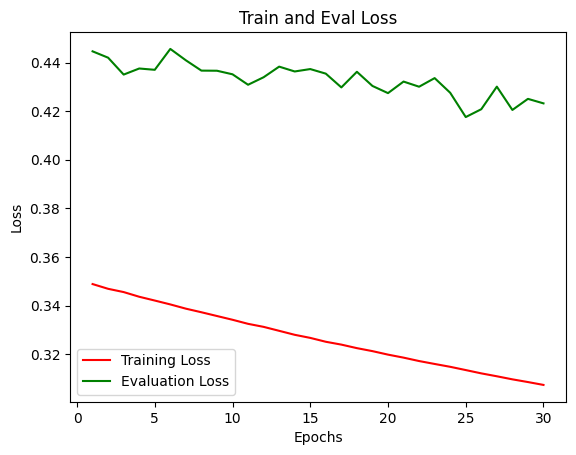

In [134]:
plt.plot(range(1, len(train_loss)+1), train_loss, 'r', label='Training Loss')
plt.plot(range(1, len(train_loss)+1), eval_loss, 'g', label='Evaluation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()
plt.title('Train and Eval Loss')
plt.show()

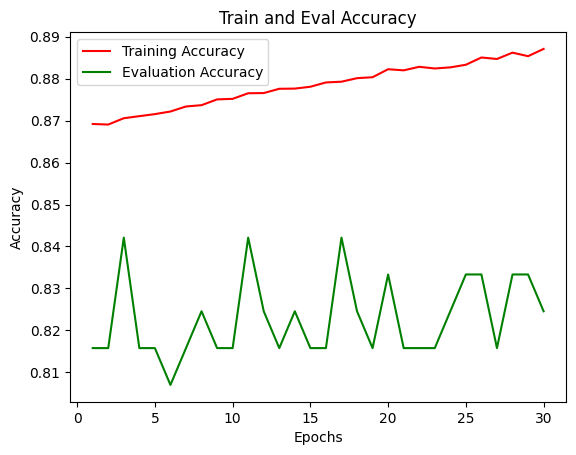

In [135]:
plt.plot(range(1, len(train_loss)+1), train_acc, 'r', label='Training Accuracy')
plt.plot(range(1, len(train_loss)+1), eval_acc, 'g', label='Evaluation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()
plt.title('Train and Eval Accuracy')
plt.show()